## Imports

In [1]:
!pip uninstall -y numpy pandas_ta
!pip install numpy==1.23.5 pandas-ta

!pip install backtesting
!pip install pandas_ta
!pip install hyperopt

Found existing installation: numpy 1.23.5
Uninstalling numpy-1.23.5:
  Successfully uninstalled numpy-1.23.5
Found existing installation: pandas_ta 0.3.14b0
Uninstalling pandas_ta-0.3.14b0:
  Successfully uninstalled pandas_ta-0.3.14b0
  Using cached numpy-1.23.5-cp311-cp311-manylinux_2_17_x86_64.manylinux2014_x86_64.whl.metadata (2.3 kB)
  Using cached pandas_ta-0.3.14b0-py3-none-any.whl
Using cached numpy-1.23.5-cp311-cp311-manylinux_2_17_x86_64.manylinux2014_x86_64.whl (17.1 MB)
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
scikit-image 0.25.2 requires numpy>=1.24, but you have numpy 1.23.5 which is incompatible.
jax 0.5.2 requires numpy>=1.25, but you have numpy 1.23.5 which is incompatible.
xarray 2025.1.2 requires numpy>=1.24, but you have numpy 1.23.5 which is incompatible.
pymc 5.21.2 requires numpy>=1.25.0, but you have numpy 1.23.5 which is incompat

In [ ]:
# !pip install pandas_ta

In [2]:
import pandas as pd
import numpy as np
import pandas_ta as ta
from backtesting import Backtest, Strategy

/usr/local/lib/python3.11/dist-packages/backtesting/_plotting.py:55: UserWarning: Jupyter Notebook detected. Setting Bokeh output to notebook. This may not work in Jupyter clients without JavaScript support, such as old IDEs. Reset with `backtesting.set_bokeh_output(notebook=False)`.
  warnings.warn('Jupyter Notebook detected. '


### Import data (signals)

In [3]:
import pandas as pd

df1 = pd.read_csv('tradingview_signals_first.csv')
df2 = pd.read_csv('tradingview_signals.csv')
df3 = pd.read_csv('tradingview_signals_server.csv')


df = pd.concat([df1, df2, df3], ignore_index=True)

df = df.sort_values(by='utc_time')
df.to_csv('tradingview_signals_merged.csv', index=False)
df.info()
df

<class 'pandas.core.frame.DataFrame'>
Index: 167641 entries, 0 to 167640
Data columns (total 10 columns):
 #   Column          Non-Null Count   Dtype  
---  ------          --------------   -----  
 0   #               167641 non-null  int64  
 1   id              167641 non-null  int64  
 2   symbol          167641 non-null  object 
 3   timeframe       167641 non-null  object 
 4   signal          167641 non-null  object 
 5   entry_price     167641 non-null  float64
 6   unix_timestamp  167641 non-null  int64  
 7   utc_time        167641 non-null  object 
 8   local_time      167641 non-null  object 
 9   atr             49584 non-null   float64
dtypes: float64(2), int64(3), object(5)
memory usage: 14.1+ MB


,#,id,symbol,timeframe,signal,entry_price,unix_timestamp,utc_time,local_time,atr
0,1,27,MASKUSDT,1h,STRONG_BUY,2.263938,1740502902,2025-02-26 00:01:42.899724,2025-02-26 00:01:42.899724,NaN
1,2,28,ETHUSDT,1h,SELL,2420.460000,1740502930,2025-02-26 00:02:10.098242,2025-02-26 00:02:10.098242,NaN
2,3,29,COWUSDT,1h,STRONG_BUY,0.444927,1740502967,2025-02-26 00:02:47.768526,2025-02-26 00:02:47.768526,NaN
3,4,30,BTCUSDT,1h,SELL,87557.663770,1740502983,2025-02-26 00:03:03.139575,2025-02-26 00:03:03.139575,NaN
4,5,31,PENGUUSDT,15m,STRONG_BUY,0.008166,1740504607,2025-02-26 00:30:07.400803,2025-02-26 00:30:07.400803,NaN
...,...,...,...,...,...,...,...,...,...,...
167636,166185,166185,HMSTRUSDT,30m,STRONG_BUY,0.002398,1744113661,2025-04-08 12:01:01.000000,2025-04-08 19:01:01.000000,0.000016
167637,166186,166186,HEIUSDT,30m,STRONG_BUY,0.329602,1744113666,2025-04-08 12:01:06.000000,2025-04-08 19:01:06.000000,0.011121
167638,166187,166187,KAITOUSDT,30m,STRONG_BUY,0.959900,1744113666,2025-04-08 12:01:06.000000,2025-04-08 19:01:06.000000,0.014993
167639,166188,166188,GPSUSDT,30m,STRONG_BUY,0.021967,1744113667,2025-04-08 12:01:07.000000,2025-04-08 19:01:07.000000,0.000300


### Import data (klines)

In [4]:
import pandas as pd
import numpy as np

interval = "4h"
klines_df = pd.read_csv(f"klines_data_{interval}.csv")
# signals_df = pd.read_csv("tradingview_signals_server.csv")
signals_df = df.copy()

signals_df["utc_time"] = pd.to_datetime(signals_df["unix_timestamp"], unit="s", utc=True).dt.floor("H")

print(signals_df[["symbol", "utc_time", "signal"]].head())


print('klines_df.shape', klines_df.shape)
klines_df.info()

      symbol                  utc_time      signal
0   MASKUSDT 2025-02-25 17:00:00+00:00  STRONG_BUY
1    ETHUSDT 2025-02-25 17:00:00+00:00        SELL
2    COWUSDT 2025-02-25 17:00:00+00:00  STRONG_BUY
3    BTCUSDT 2025-02-25 17:00:00+00:00        SELL
4  PENGUUSDT 2025-02-25 17:00:00+00:00  STRONG_BUY
klines_df.shape (86498, 7)
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 86498 entries, 0 to 86497
Data columns (total 7 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   Date    86498 non-null  object 
 1   Open    86498 non-null  float64
 2   High    86498 non-null  float64
 3   Low     86498 non-null  float64
 4   Close   86498 non-null  float64
 5   Volume  86498 non-null  float64
 6   Symbol  86498 non-null  object 
dtypes: float64(5), object(2)
memory usage: 4.6+ MB


<ipython-input-4-bfd1b83a4b44>:9: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  signals_df["utc_time"] = pd.to_datetime(signals_df["unix_timestamp"], unit="s", utc=True).dt.floor("H")


In [5]:
print('signals_df.shape', signals_df.shape)
signals_df.info()

signals_df.shape (167641, 10)
<class 'pandas.core.frame.DataFrame'>
Index: 167641 entries, 0 to 167640
Data columns (total 10 columns):
 #   Column          Non-Null Count   Dtype              
---  ------          --------------   -----              
 0   #               167641 non-null  int64              
 1   id              167641 non-null  int64              
 2   symbol          167641 non-null  object             
 3   timeframe       167641 non-null  object             
 4   signal          167641 non-null  object             
 5   entry_price     167641 non-null  float64            
 6   unix_timestamp  167641 non-null  int64              
 7   utc_time        167641 non-null  datetime64[ns, UTC]
 8   local_time      167641 non-null  object             
 9   atr             49584 non-null   float64            
dtypes: datetime64[ns, UTC](1), float64(2), int64(3), object(4)
memory usage: 14.1+ MB


In [6]:
klines_df['Date'] = pd.to_datetime(klines_df['Date'])
signals_df['utc_time'] = pd.to_datetime(signals_df['utc_time'])

signals_df = signals_df[signals_df["timeframe"] == f"{interval}"]

## Hyperopt_by_month

In [7]:
# !pip install backtesting
# !pip install pandas_ta
# !pip install hyperopt

In [8]:
import pandas as pd
from datetime import datetime
from hyperopt import fmin, tpe, hp, Trials
import backtesting
from dateutil.relativedelta import relativedelta
import traceback

def generate_monthly_intervals(start_date, end_date):
    start = datetime.strptime(start_date, "%Y-%m")
    end = datetime.strptime(end_date, "%Y-%m")
    intervals = []
    while start <= end:
        next_month = start + relativedelta(months=1)
        intervals.append((start.strftime("%Y-%m"), next_month.strftime("%Y-%m")))
        start = next_month
    return intervals

def full_period_backtest(strategy, data, initial_capital=1_000_000):
    data.index = pd.to_datetime(data.index).tz_localize(None)
    test = backtesting.Backtest(data, strategy, cash=initial_capital, commission=0.0005)
    res = test.run()
    trades = res._trades.copy()
    # print(res)
    return trades, res

from datetime import datetime
from dateutil.relativedelta import relativedelta
import pandas as pd

def analyze_monthly_results(trades, intervals, initial_capital, equity_curve):
    trades['ExitTime'] = pd.to_datetime(trades['ExitTime']).dt.tz_localize(None)
    trades['Close Time'] = pd.to_datetime(trades['ExitTime'])
    trades.set_index('Close Time', inplace=True)
    trades['Trade Duration'] = (trades['ExitTime'] - trades['EntryTime']).dt.total_seconds()

    monthly_results = {}
    total_pnl = 0
    profit_months = 0
    loss_months = 0
    total_trade_duration = 0
    total_trades = len(trades)

    capital = initial_capital  # Начальный капитал
    last_interval = intervals[-1]  # Последний месяц

    for start, end in intervals:
        start_date = datetime.strptime(start, "%Y-%m")
        end_date = datetime.strptime(end, "%Y-%m") + relativedelta(months=1, days=-1, hours=23, minutes=59, seconds=59)

        monthly_trades = trades[(trades.index >= start_date) & (trades.index <= end_date)]

        if monthly_trades.empty:
            monthly_results[start] = (0.0, 0)
            continue

        # PnL за месяц
        monthly_pnl = monthly_trades['PnL'].sum()
        capital += monthly_pnl  # Обновляем капитал только на PnL

        # Если это последний месяц, учитываем открытые позиции
        if (start, end) == last_interval and not equity_curve.empty:
            last_equity = equity_curve['Equity'].iloc[-1]  # Финальная Equity
            open_pnl = last_equity - capital  # Открытые позиции
            capital += open_pnl  # Учитываем их в капитале

        # Итоговый процент профита за месяц
        prev_capital = capital - monthly_pnl  # Капитал до учета текущего месяца
        monthly_pnl_percent = ((capital - prev_capital) / prev_capital) * 100 if prev_capital != 0 else 0

        # Средняя длительность сделки (в часах)
        avg_trade_duration = monthly_trades['Trade Duration'].mean() / 3600 if len(monthly_trades) > 0 else 0

        monthly_results[start] = (round(monthly_pnl_percent, 8), round(avg_trade_duration, 2))

        total_pnl += monthly_pnl
        total_trade_duration += monthly_trades['Trade Duration'].sum()

        if monthly_pnl_percent > 0:
            profit_months += 1
        else:
            loss_months += 1

    avg_trade_duration_total = (total_trade_duration / total_trades) / 3600 if total_trades > 0 else 0
    total_months = profit_months + loss_months
    profit_month_ratio = (profit_months / total_months * 100) if total_months > 0 else 0

    # Итоговый Return [%]
    total_return = ((capital - initial_capital) / initial_capital) * 100

    return total_return, profit_months, loss_months, monthly_results, avg_trade_duration_total, profit_month_ratio



def generate_search_space(params_to_optimize):
    space = {}
    for param, settings in params_to_optimize.items():
        if settings['type'] == 'quniform':
            space[param] = hp.quniform(param, settings['range'][0], settings['range'][1], settings.get('q', 1))
        elif settings['type'] == 'uniform':
            space[param] = hp.uniform(param, settings['range'][0], settings['range'][1])
        else:
            raise ValueError(f"Неизвестный тип параметра: {settings['type']}")
    return space

def optimize_strategy(data, symbol, interval, start_date, end_date, shared_folder_path, max_evals, params_to_optimize, fixed_params, strategy):
    intervals = generate_monthly_intervals(start_date, end_date)
    trials = Trials()
    space = generate_search_space(params_to_optimize)
    results = []

    print(f"Общее количество строк в загруженных данных: {len(data)}")
    print(f"Диапазон дат: {data.index.min()} - {data.index.max()}")
    print(f"Оптимизация для {symbol} ({interval}) с {start_date} по {end_date} началась...\n")

    def objective(params):
        for key, value in fixed_params.items():
            setattr(strategy, key, value)

        for key, value in params.items():
            setattr(strategy, key, int(value) if 'length' in key else value)

        print(f"Параметры: {params}, {fixed_params}")

        try:
            trades, res = full_period_backtest(strategy, data, 1_000_000)

            total_pnl, profit_months, loss_months, monthly_results, avg_trade_duration, profit_month_ratio = analyze_monthly_results(
                trades, intervals, 1_000_000, res._equity_curve
            )

            print(f"Общий профит: {total_pnl:.2f}%, Профитные месяцы: {profit_months}, Убыточные месяцы: {loss_months}, Процент профитных месяцев: {profit_month_ratio:.2f}%")
            print(f"Результаты по месяцам: {[(month, pnl) for month, (pnl, _) in monthly_results.items()]}\n")

            row = {
                'symbol': symbol,
                'interval': interval,
                **{key: fixed_params.get(key, None) for key in fixed_params},
                **{key: (int(value) if 'length' in key else value) for key, value in params.items()},
                'strategy': strategy.__name__,
                'total_pnl%': total_pnl,
                'avg_trade_duration_hours': avg_trade_duration,
                'profit_month_count': profit_months,
                'loss_month_count': loss_months,
                'profit_month_ratio%': profit_month_ratio
            }

            for month, (pnl, _) in monthly_results.items():
                row[month] = pnl

            results.append(row)
            return {'loss': -total_pnl, 'status': 'ok', 'params': params}

        except Exception as e:
            print("Ошибка в objective:", e)
            print(traceback.format_exc())  # Логирование полной трассировки ошибки
            return {'loss': float('inf'), 'status': 'fail', 'params': params}

    try:
        fmin(objective, space, algo=tpe.suggest, max_evals=max_evals, trials=trials)
    except Exception as e:
        print("Ошибка при выполнении fmin:", e)
        print(traceback.format_exc())
        return None

    results_df = pd.DataFrame(results)
    save_results_to_csv(results_df, shared_folder_path, "hyperopt_optimization_results.csv")

    if trials.trials:
        best_trial = min(trials.trials, key=lambda x: x['result']['loss'])
        best_params = best_trial['result']['params']
        best_loss = best_trial['result']['loss']
        return best_params, -best_loss
    else:
        print("Не удалось найти лучшие параметры.")
        return None


# best_params, total_pnl = optimize_strategy(
#     data=df,
#     symbol=symbol,
#     interval=interval,
#     start_date=start_date,
#     end_date=end_date,
#     max_evals=max_evals,
#     shared_folder_path=shared_folder_path,
#     params_to_optimize=params_to_optimize,
#     fixed_params=fixed_params
# )

# # Настройка стратегии с оптимизированными параметрами
# SlopingStrategy.window_length = fixed_params.get('window_length') or int(best_params['window_length'])
# SlopingStrategy.min_space = fixed_params.get('min_space') or int(best_params['min_space'])
# SlopingStrategy.sloping_atr_length = fixed_params.get('sloping_atr_length') or int(best_params['sloping_atr_length'])
# SlopingStrategy.take_profit_multiplier = fixed_params.get('take_profit_multiplier') or best_params['take_profit_multiplier']
# SlopingStrategy.stop_loss_multiplier = fixed_params.get('stop_loss_multiplier') or best_params['stop_loss_multiplier']

# print("\nНастройка стратегии завершена.")

# # Тестируем стратегию
# test = backtesting.Backtest(data=df, strategy=SlopingStrategy, cash=1_000_000, commission=0.0005)
# res = test.run()

# print(symbol)
# print()
# print("Результаты с оптимизированными параметрами:", res)
# print('Window length', SlopingStrategy.window_length)
# print('Min space', SlopingStrategy.min_space)
# print('Sloping atr length', SlopingStrategy.sloping_atr_length)
# print('Take profit multiplier', SlopingStrategy.take_profit_multiplier)
# print('Stop loss multiplier', SlopingStrategy.stop_loss_multiplier)

## Strategy

### Basic

In [9]:
import pandas as pd
import numpy as np
import pandas_ta as ta
from backtesting import Backtest, Strategy

trade_log = []
class SignalStrategy(Strategy):
    stop_loss_multiplier = 0.4
    take_profit_multiplier = 1.2
    signals_df = None
    symbol = None

    def init(self):
        """Load trading signals and ATR indicator"""
        self.signals = self.signals_df[self.signals_df["symbol"] == self.symbol]
        self.used_signals = set()

        def atr_indicator(h, l, c):
            """Calculate ATR (Average True Range)"""
            try:
                atr_values = ta.atr(pd.Series(h), pd.Series(l), pd.Series(c), length=14)
                return atr_values.fillna(0).to_numpy() if atr_values is not None else np.zeros(len(h))
            except Exception as e:
                print(f"Error calculating ATR: {e}")
                return np.zeros(len(h))

        self.atr = self.I(atr_indicator, self.data.High, self.data.Low, self.data.Close)

    def next(self):
        """Process signals and open trades accordingly"""
        current_time = self.data.index[-1]
        current_price = self.data.Close[-1]
        current_atr = self.atr[-1]

        if current_atr == 0 or pd.isna(current_atr):
            return

        for _, signal in self.signals.iterrows():
            signal_time = signal['utc_time']

            if signal_time in self.used_signals:
                continue

            if signal_time in self.data.index:
                self.used_signals.add(signal_time)

                if signal['signal'] == "STRONG_BUY" and not self.position:
                    stop_loss = current_price - (self.stop_loss_multiplier * current_atr)
                    take_profit = current_price + (self.take_profit_multiplier * current_atr)

                    if stop_loss < current_price < take_profit:
                        print(f"🚀 LONG {self.symbol} | {current_time} | Price: {current_price} | SL: {stop_loss:.4f} | TP: {take_profit:.4f}")
                        self.buy(sl=stop_loss, tp=take_profit)

                elif signal['signal'] == "STRONG_SELL" and not self.position:
                    stop_loss = current_price + (self.stop_loss_multiplier * current_atr)
                    take_profit = current_price - (self.take_profit_multiplier * current_atr)

                    if take_profit < current_price < stop_loss:
                        print(f"🚨 SHORT {self.symbol} | {current_time} | Price: {current_price} | SL: {stop_loss:.4f} | TP: {take_profit:.4f}")
                        self.sell(sl=stop_loss, tp=take_profit)

    def notify_trade(self, trade):
        """Log trade results when a trade is closed"""
        if trade.is_closed:
            trade_log.append({
                "Symbol": self.symbol,
                "Entry Time": trade.entry_time,
                "Exit Time": trade.exit_time,
                "Entry Price": trade.entry_price,
                "Exit Price": trade.exit_price,
                "Return [%]": trade.pl_pct * 100,
            })


### Basic + BTC filter

In [ ]:
# import pandas as pd
# import numpy as np
# import pandas_ta as ta
# from backtesting import Backtest, Strategy


# trade_log = []

# class SignalStrategyBTC(Strategy):
#     stop_loss_multiplier = 0.45
#     take_profit_multiplier = 1.25
#     signals_df = None
#     btc_signals_df = None
#     symbol = None

#     def init(self):
#         """Load trading signals and ATR indicator"""
#         self.signals = self.signals_df[self.signals_df["symbol"] == self.symbol].copy()
#         self.used_signals = set()

#         # Обрабатываем BTC сигналы
#         self.btc_signals = self.signals_df[self.signals_df["symbol"] == "BTCUSDT"].copy()
#         if not self.btc_signals.empty:
#             self.btc_signals["utc_time"] = pd.to_datetime(self.btc_signals["utc_time"]).dt.floor("min")
#         else:
#             self.btc_signals = None  # Отключаем проверку, если данных нет
#             # print("⚠️ Нет сигналов BTCUSDT! Проверка отключена.")

#         self.signals["utc_time"] = pd.to_datetime(self.signals["utc_time"]).dt.floor("min")

#         # ATR Indicator
#         self.atr = self.I(self.atr_indicator, self.data.High, self.data.Low, self.data.Close)

#     def atr_indicator(self, h, l, c):
#         """Calculate ATR (Average True Range)"""
#         try:
#             atr_values = ta.atr(pd.Series(h), pd.Series(l), pd.Series(c), length=14)
#             return atr_values.fillna(0).to_numpy() if atr_values is not None else np.zeros(len(h))
#         except Exception as e:
#             print(f"Error calculating ATR: {e}")
#             return np.zeros(len(h))


#     def next(self):
#         """Обрабатываем сигналы, если они соответствуют таймфрейму"""
#         current_time = self.data.index[-1]  # Время текущей свечи
#         current_price = self.data.Close[-1]
#         current_atr = self.atr[-1]

#         if current_atr == 0 or pd.isna(current_atr):
#             return



#         # Получаем BTC сигнал, если он есть
#         btc_signal = None
#         if self.btc_signals is not None:
#             btc_row = self.btc_signals[(self.btc_signals["utc_time"] == current_time) &
#                                       (self.btc_signals["timeframe"] == interval)]
#             if not btc_row.empty:
#                 btc_signal = btc_row.iloc[0]["signal"]

#         # print(f"[{current_time}] 🔍 BTC сигнал: {btc_signal if btc_signal else 'Нет сигнала'}")

#         # Фильтруем сигналы по `utc_time` и `timeframe == interval`
#         relevant_signals = self.signals[(self.signals["utc_time"] == current_time) &
#                                         (self.signals["timeframe"] == interval)]

#         if relevant_signals.empty:
#             # print(f"[{current_time}] ⏳ Нет сигналов {self.symbol} на интервале {interval}")
#             return  # Пропускаем, если нет сигналов в нужном интервале

#         for _, signal in relevant_signals.iterrows():
#             if signal["utc_time"] in self.used_signals:
#                 continue

#             self.used_signals.add(signal["utc_time"])

#             # Убеждаемся, что BTC сигнал тоже соответствует интервалу
#             if btc_signal is None:
#                 # print(f"[{current_time}] ❌ Нет BTC сигнала, пропускаем {self.symbol}")
#                 continue

#             if (btc_signal in ["BUY", "STRONG_BUY", "NEUTRAL"] and signal["signal"] == "STRONG_BUY"):
#                 stop_loss = current_price - (self.stop_loss_multiplier * current_atr)
#                 take_profit = current_price + (self.take_profit_multiplier * current_atr)
#                 print(f"🚀 LONG {self.symbol} | {current_time} | BTC: {btc_signal} | Price: {current_price} | SL: {stop_loss:.4f} | TP: {take_profit:.4f}")
#                 self.buy(sl=stop_loss, tp=take_profit)

#             elif (btc_signal in ["SELL", "STRONG_SELL", "NEUTRAL"] and signal["signal"] == "STRONG_SELL"):
#                 stop_loss = current_price + (self.stop_loss_multiplier * current_atr)
#                 take_profit = current_price - (self.take_profit_multiplier * current_atr)
#                 print(f"🚨 SHORT {self.symbol} | {current_time} | BTC: {btc_signal} | Price: {current_price} | SL: {stop_loss:.4f} | TP: {take_profit:.4f}")
#                 self.sell(sl=stop_loss, tp=take_profit)




#     def notify_trade(self, trade):
#         """Log trade results when a trade is closed"""
#         if trade.is_closed:
#             trade_log.append({
#                 "symbol": self.symbol,
#                 "entry_time": trade.entry_time,
#                 "exit_time": trade.exit_time,
#                 "entry_price": trade.entry_price,
#                 "exit_price": trade.exit_price,
#                 "return [%]": trade.pl_pct * 100,
#             })

In [37]:
import pandas as pd
import numpy as np
import pandas_ta as ta
from backtesting import Backtest, Strategy


trade_log = []

class SignalStrategyBTC(Strategy):
    stop_loss_multiplier = 0.45
    take_profit_multiplier = 1.25
    signals_df = None
    btc_signals_df = None
    symbol = None

    def init(self):
        """Load trading signals and ATR indicator"""
        self.signals = self.signals_df[self.signals_df["symbol"] == self.symbol].copy()
        self.used_signals = set()

        # Обрабатываем BTC сигналы
        self.btc_signals = self.signals_df[self.signals_df["symbol"] == "BTCUSDT"].copy()
        if not self.btc_signals.empty:
            self.btc_signals["utc_time"] = pd.to_datetime(self.btc_signals["utc_time"]).dt.floor("min")
        else:
            self.btc_signals = None  # Отключаем проверку, если данных нет
            # print("⚠️ Нет сигналов BTCUSDT! Проверка отключена.")

        self.signals["utc_time"] = pd.to_datetime(self.signals["utc_time"]).dt.floor("min")

        # ATR Indicator
        self.atr = self.I(self.atr_indicator, self.data.High, self.data.Low, self.data.Close)

    def atr_indicator(self, h, l, c):
        """Calculate ATR (Average True Range)"""
        try:
            atr_values = ta.atr(pd.Series(h), pd.Series(l), pd.Series(c), length=14)
            return atr_values.fillna(0).to_numpy() if atr_values is not None else np.zeros(len(h))
        except Exception as e:
            print(f"Error calculating ATR: {e}")
            return np.zeros(len(h))


    def next(self):
        """Обрабатываем сигналы, если они соответствуют таймфрейму"""
        current_time = self.data.index[-1]  # Время текущей свечи
        current_price = self.data.Close[-1]
        current_atr = self.atr[-1]

        if current_atr == 0 or pd.isna(current_atr):
            return


        # if self.position:
        #     return

        # Получаем BTC сигнал, если он есть
        btc_signal = None
        if not self.position and self.btc_signals is not None:
            btc_row = self.btc_signals[(self.btc_signals["utc_time"] == current_time) &
                                      (self.btc_signals["timeframe"] == interval)]
            if not btc_row.empty:
                btc_signal = btc_row.iloc[0]["signal"]

        # print(f"[{current_time}] 🔍 BTC сигнал: {btc_signal if btc_signal else 'Нет сигнала'}")

        # Фильтруем сигналы по `utc_time` и `timeframe == interval`
        relevant_signals = self.signals[(self.signals["utc_time"] == current_time) &
                                        (self.signals["timeframe"] == interval)]

        if relevant_signals.empty:
            # print(f"[{current_time}] ⏳ Нет сигналов {self.symbol} на интервале {interval}")
            return  # Пропускаем, если нет сигналов в нужном интервале

        for _, signal in relevant_signals.iterrows():
            if signal["utc_time"] in self.used_signals:
                continue

            self.used_signals.add(signal["utc_time"])

            # Убеждаемся, что BTC сигнал тоже соответствует интервалу
            if btc_signal is None:
                # print(f"[{current_time}] ❌ Нет BTC сигнала, пропускаем {self.symbol}")
                continue


            if (btc_signal in ["BUY", "STRONG_BUY", "NEUTRAL"] and signal["signal"] == "STRONG_BUY"):
                stop_loss = current_price - (self.stop_loss_multiplier * current_atr)
                take_profit = current_price + (self.take_profit_multiplier * current_atr)


                print(f"🚀 LONG {self.symbol} | {current_time} | BTC: {btc_signal} | Price: {current_price} | SL: {stop_loss:.4f} | TP: {take_profit:.4f}")
                self.buy(size=1, sl=stop_loss, tp=take_profit)

            elif (btc_signal in ["SELL", "STRONG_SELL", "NEUTRAL"] and signal["signal"] == "STRONG_SELL"):
                stop_loss = current_price + (self.stop_loss_multiplier * current_atr)
                take_profit = current_price - (self.take_profit_multiplier * current_atr)


                print(f"🚨 SHORT {self.symbol} | {current_time} | BTC: {btc_signal} | Price: {current_price} | SL: {stop_loss:.4f} | TP: {take_profit:.4f}")
                self.sell(size=1, sl=stop_loss, tp=take_profit)




    def notify_trade(self, trade):
        """Log trade results when a trade is closed"""
        if trade.is_closed:
            trade_log.append({
                "symbol": self.symbol,
                "entry_time": trade.entry_time,
                "exit_time": trade.exit_time,
                "entry_price": trade.entry_price,
                "exit_price": trade.exit_price,
                "return [%]": trade.pl_pct * 100,
            })

## Backtest

### Backtest tradingview Basic

In [ ]:
successful_symbols = ['TSTUSDT', 'TURBOUSDT', 'UMAUSDT', 'LINAUSDT', 'ACEUSDT',
       'CHRUSDT', 'METISUSDT', 'IOUSDT', 'HOTUSDT', 'STRKUSDT',
       'MBOXUSDT', 'NMRUSDT', 'GLMRUSDT', 'NKNUSDT', 'BBUSDT',
       'CHESSUSDT', 'COMBOUSDT', 'SHELLUSDT', 'PHBUSDT', 'SYNUSDT',
       'SCRUSDT', 'IMXUSDT', 'RDNTUSDT', 'ALICEUSDT', 'LEVERUSDT',
       'ALGOUSDT', 'AUCTIONUSDT', 'ICPUSDT', 'MAGICUSDT', 'PENGUUSDT',
       'CFXUSDT', 'ZROUSDT', 'DOGSUSDT', 'FLOWUSDT', 'HIFIUSDT',
       'ONTUSDT', 'TUSDT', 'NEOUSDT', 'LOKAUSDT', 'THEUSDT', 'SAGAUSDT',
       'JASMYUSDT', '1MBABYDOGEUSDT', 'STGUSDT', 'HFTUSDT', 'OMNIUSDT',
       'WAXPUSDT', 'NULSUSDT', 'GASUSDT', 'GMXUSDT', 'CELOUSDT',
       'ACXUSDT']

In [11]:
import pandas as pd
import numpy as np
import pandas_ta as ta
from backtesting import Backtest, Strategy


strategy = SignalStrategy
results_list = []
all_trade_logs = []

# for symbol in successful_symbols:
for symbol in klines_df["Symbol"].unique():
    print(f"🔍 Testing {symbol}...")

    # Фильтрация данных по текущему символу
    data = klines_df[klines_df["Symbol"] == symbol].copy()

    # Check if data is empty before proceeding
    if data.empty:
        print(f"⚠️ Data for symbol {symbol} is empty, skipping...")
        continue  # Skip to the next symbol if data is empty

    data['Date'] = pd.to_datetime(data['Date'])
    data.set_index("Date", inplace=True)

    if not isinstance(data.index, pd.DatetimeIndex):
        data.index = pd.to_datetime(data.index)

    data.drop(columns=["Symbol"], inplace=True)


    symbol_signals = signals_df[(signals_df["symbol"] == symbol) & (signals_df["timeframe"] == f"{interval}")]
    unique_signals_count = symbol_signals["utc_time"].nunique()

    if symbol_signals.empty:
        print(f"⚠️ No signals for {symbol}, skipping...")
        continue

    print(f"📊 Found {len(symbol_signals)} signals ({unique_signals_count} unique) for {symbol}")


    strategy.signals_df = signals_df
    strategy.symbol = symbol


    bt = Backtest(data, strategy, cash=1_000_000, commission=0.0005)
    stats = bt.run()

    # Initialize long_count, short_count, etc. to 0 before the if condition
    long_count = 0
    short_count = 0
    long_return = 0
    short_return = 0
    long_winrate = 0
    short_winrate = 0

    if stats["_trades"] is not None and not stats["_trades"].empty:
        trade_log = stats["_trades"].copy()

        if "ReturnPct" in trade_log.columns:
            trade_log["Win"] = (trade_log["ReturnPct"] > 0).astype(int)

            for idx, trade in trade_log.iterrows():
                all_trade_logs.append({
                    "symbol": symbol,
                    "EntryBar": trade["EntryBar"],
                    "ExitBar": trade["ExitBar"],
                    "EntryPrice": trade["EntryPrice"],
                    "ExitPrice": trade["ExitPrice"],
                    "Size": trade["Size"],
                    "PnL": trade["PnL"],
                    "ReturnPct": trade["ReturnPct"],
                    "EntryTime": trade["EntryTime"],
                    "ExitTime": trade["ExitTime"],
                    "Duration": trade["Duration"]
                })


            longs = trade_log[trade_log["Size"] > 0]
            shorts = trade_log[trade_log["Size"] < 0]

            long_count = len(longs)
            short_count = len(shorts)

            long_return = longs["ReturnPct"].sum() if not longs.empty else 0
            short_return = shorts["ReturnPct"].sum() if not shorts.empty else 0

            long_winrate = longs["Win"].mean() * 100 if not longs.empty else 0
            short_winrate = shorts["Win"].mean() * 100 if not shorts.empty else 0
        else:
            print(f"⚠️ Warning: 'ReturnPct' column not found in trades for {symbol}")
            # The variables are already initialized to 0 above



    results = {
        "symbol": symbol,
        "timeframe": interval,
        "start_date": data.index.min(),
        "end_date": data.index.max(),
        'stop_loss_multiplier': strategy.stop_loss_multiplier,
        'take_profit_multiplier': strategy.take_profit_multiplier,
        "Total Trades": stats["# Trades"],
        "Win Rate": stats["Win Rate [%]"],
        "return [%]": stats["Return [%]"],
        "long_trades": long_count,
        "short_trades": short_count,
        "long_return [%]": long_return,
        "short_return [%]": short_return,
        "long_win_rate [%]": long_winrate,
        "short_win_rate [%]": short_winrate,
    }
    results_list.append(results)

    print(f"✅ {symbol} — Return: {results['return [%]']:.2f}%, Trades: {results['Total Trades']}, "
          f"Win Rate: {results['Win Rate']:.2f}%, Longs: {long_count}, Shorts: {short_count}, "
          f"Long Return: {long_return:.2f}%, Short Return: {short_return:.2f}%, "
          f"Long Win Rate: {long_winrate:.2f}%, Short Win Rate: {short_winrate:.2f}%\n")


results_df = pd.DataFrame(results_list)
results_df.to_csv(f"backtest_results_{interval}_Basic.csv", index=False)


if all_trade_logs:
    trades_df = pd.DataFrame(all_trade_logs)
    trades_df.to_csv("all_trades_df.csv", index=False)


print("Backtest completed! Results saved in backtest_results.csv")
print("All trade log saved in all_trade_log.csv")

display(results_df)

🔍 Testing BNBUSDT...
📊 Found 43 signals (43 unique) for BNBUSDT


Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT BNBUSDT | 2025-03-03 20:00:00+00:00 | Price: 576.1 | SL: 581.7647 | TP: 559.1060
🚨 SHORT BNBUSDT | 2025-03-04 04:00:00+00:00 | Price: 564.91 | SL: 570.9391 | TP: 546.8226
🚨 SHORT BNBUSDT | 2025-03-09 00:00:00+00:00 | Price: 588.42 | SL: 592.2354 | TP: 576.9738
🚨 SHORT BNBUSDT | 2025-03-09 12:00:00+00:00 | Price: 566.73 | SL: 570.5686 | TP: 555.2141
🚨 SHORT BNBUSDT | 2025-03-10 00:00:00+00:00 | Price: 560.65 | SL: 564.9555 | TP: 547.7336
🚨 SHORT BNBUSDT | 2025-03-10 16:00:00+00:00 | Price: 537.74 | SL: 542.9987 | TP: 521.9640
🚨 SHORT BNBUSDT | 2025-03-11 00:00:00+00:00 | Price: 533.22 | SL: 538.9426 | TP: 516.0521
🚀 LONG BNBUSDT | 2025-03-17 04:00:00+00:00 | Price: 629.83 | SL: 625.0569 | TP: 644.1492
🚀 LONG BNBUSDT | 2025-03-17 20:00:00+00:00 | Price: 631.69 | SL: 627.0359 | TP: 645.6523
🚀 LONG BNBUSDT | 2025-03-18 08:00:00+00:00 | Price: 631.22 | SL: 626.4461 | TP: 645.5416
🚀 LONG BNBUSDT | 2025-03-18 12:00:00+00:00 | Price: 627.52 | SL: 622.7300 | TP: 641.8901
🚀 LONG BNBUSDT 

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT BTCUSDT | 2025-02-26 12:00:00+00:00 | Price: 87567.53 | SL: 88268.7583 | TP: 85463.8450
🚨 SHORT BTCUSDT | 2025-02-26 16:00:00+00:00 | Price: 83856.99 | SL: 84643.4574 | TP: 81497.5879
🚨 SHORT BTCUSDT | 2025-02-28 04:00:00+00:00 | Price: 79204.59 | SL: 80102.1520 | TP: 76511.9039
🚨 SHORT BTCUSDT | 2025-03-03 20:00:00+00:00 | Price: 86220.61 | SL: 87220.2680 | TP: 83221.6360
🚨 SHORT BTCUSDT | 2025-03-04 04:00:00+00:00 | Price: 83186.4 | SL: 84204.9557 | TP: 80130.7328
🚨 SHORT BTCUSDT | 2025-03-07 20:00:00+00:00 | Price: 86801.75 | SL: 87851.5810 | TP: 83652.2569
🚨 SHORT BTCUSDT | 2025-03-09 12:00:00+00:00 | Price: 83080.41 | SL: 83805.5275 | TP: 80905.0575
🚨 SHORT BTCUSDT | 2025-03-09 20:00:00+00:00 | Price: 80734.37 | SL: 81501.4965 | TP: 78432.9905
🚨 SHORT BTCUSDT | 2025-03-10 00:00:00+00:00 | Price: 82047.49 | SL: 82837.1639 | TP: 79678.4683
🚨 SHORT BTCUSDT | 2025-03-10 16:00:00+00:00 | Price: 79060.84 | SL: 79941.6117 | TP: 76418.5248
🚨 SHORT BTCUSDT | 2025-03-13 20:00:00+00:

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT ETHUSDT | 2025-02-26 16:00:00+00:00 | Price: 2296.29 | SL: 2329.0783 | TP: 2197.9252
🚨 SHORT ETHUSDT | 2025-03-03 20:00:00+00:00 | Price: 2149.01 | SL: 2187.0244 | TP: 2034.9668
🚨 SHORT ETHUSDT | 2025-03-04 04:00:00+00:00 | Price: 2080.41 | SL: 2119.0919 | TP: 1964.3644
🚨 SHORT ETHUSDT | 2025-03-07 04:00:00+00:00 | Price: 2192.41 | SL: 2223.1842 | TP: 2100.0873
🚨 SHORT ETHUSDT | 2025-03-07 20:00:00+00:00 | Price: 2141.6 | SL: 2171.5492 | TP: 2051.7525
🚨 SHORT ETHUSDT | 2025-03-09 12:00:00+00:00 | Price: 2097.03 | SL: 2120.7249 | TP: 2025.9452
🚨 SHORT ETHUSDT | 2025-03-09 16:00:00+00:00 | Price: 2040.47 | SL: 2065.6543 | TP: 1964.9171
🚨 SHORT ETHUSDT | 2025-03-10 00:00:00+00:00 | Price: 2057.89 | SL: 2083.5502 | TP: 1980.9093
🚨 SHORT ETHUSDT | 2025-03-10 16:00:00+00:00 | Price: 1869.3 | SL: 1901.3707 | TP: 1773.0878
🚨 SHORT ETHUSDT | 2025-03-11 00:00:00+00:00 | Price: 1849.78 | SL: 1882.9362 | TP: 1750.3114
🚨 SHORT ETHUSDT | 2025-03-12 00:00:00+00:00 | Price: 1868.9 | SL: 1899.7

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT CAKEUSDT | 2025-02-28 04:00:00+00:00 | Price: 1.897 | SL: 1.9302 | TP: 1.7974
🚨 SHORT CAKEUSDT | 2025-03-03 04:00:00+00:00 | Price: 1.875 | SL: 1.9096 | TP: 1.7713
🚨 SHORT CAKEUSDT | 2025-03-03 16:00:00+00:00 | Price: 1.738 | SL: 1.7725 | TP: 1.6344
🚨 SHORT CAKEUSDT | 2025-03-06 20:00:00+00:00 | Price: 1.743 | SL: 1.7654 | TP: 1.6759
🚨 SHORT CAKEUSDT | 2025-03-07 04:00:00+00:00 | Price: 1.732 | SL: 1.7544 | TP: 1.6649
🚨 SHORT CAKEUSDT | 2025-03-08 00:00:00+00:00 | Price: 1.73 | SL: 1.7511 | TP: 1.6668
🚨 SHORT CAKEUSDT | 2025-03-09 04:00:00+00:00 | Price: 1.68 | SL: 1.6979 | TP: 1.6264
🚨 SHORT CAKEUSDT | 2025-03-09 12:00:00+00:00 | Price: 1.602 | SL: 1.6204 | TP: 1.5467
🚨 SHORT CAKEUSDT | 2025-03-09 20:00:00+00:00 | Price: 1.522 | SL: 1.5424 | TP: 1.4608
🚨 SHORT CAKEUSDT | 2025-03-10 00:00:00+00:00 | Price: 1.545 | SL: 1.5656 | TP: 1.4833
🚨 SHORT CAKEUSDT | 2025-03-10 16:00:00+00:00 | Price: 1.493 | SL: 1.5162 | TP: 1.4234
🚨 SHORT CAKEUSDT | 2025-03-11 00:00:00+00:00 | Price: 1.

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT SCUSDT | 2025-02-26 08:00:00+00:00 | Price: 0.003709 | SL: 0.0038 | TP: 0.0036
🚨 SHORT SCUSDT | 2025-02-26 16:00:00+00:00 | Price: 0.00355 | SL: 0.0036 | TP: 0.0034
🚨 SHORT SCUSDT | 2025-03-03 20:00:00+00:00 | Price: 0.003498 | SL: 0.0035 | TP: 0.0034
🚨 SHORT SCUSDT | 2025-03-04 00:00:00+00:00 | Price: 0.003399 | SL: 0.0034 | TP: 0.0033
🚨 SHORT SCUSDT | 2025-03-04 04:00:00+00:00 | Price: 0.003396 | SL: 0.0034 | TP: 0.0033
🚨 SHORT SCUSDT | 2025-03-05 16:00:00+00:00 | Price: 0.003515 | SL: 0.0036 | TP: 0.0034
🚨 SHORT SCUSDT | 2025-03-06 20:00:00+00:00 | Price: 0.003511 | SL: 0.0036 | TP: 0.0034
🚨 SHORT SCUSDT | 2025-03-07 04:00:00+00:00 | Price: 0.003426 | SL: 0.0035 | TP: 0.0033
🚨 SHORT SCUSDT | 2025-03-08 00:00:00+00:00 | Price: 0.00337 | SL: 0.0034 | TP: 0.0032
🚨 SHORT SCUSDT | 2025-03-09 12:00:00+00:00 | Price: 0.003215 | SL: 0.0032 | TP: 0.0031
🚨 SHORT SCUSDT | 2025-03-09 16:00:00+00:00 | Price: 0.003169 | SL: 0.0032 | TP: 0.0031
🚨 SHORT SCUSDT | 2025-03-11 00:00:00+00:00 | 

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚀 LONG PROMUSDT | 2025-02-26 04:00:00+00:00 | Price: 6.8 | SL: 6.7040 | TP: 7.0880
🚀 LONG PROMUSDT | 2025-03-02 00:00:00+00:00 | Price: 6.391 | SL: 6.3128 | TP: 6.6257
🚀 LONG PROMUSDT | 2025-03-02 20:00:00+00:00 | Price: 6.572 | SL: 6.4962 | TP: 6.7995
🚀 LONG PROMUSDT | 2025-03-03 04:00:00+00:00 | Price: 6.685 | SL: 6.6097 | TP: 6.9108
🚀 LONG PROMUSDT | 2025-03-05 12:00:00+00:00 | Price: 6.7 | SL: 6.6217 | TP: 6.9350
🚀 LONG PROMUSDT | 2025-03-05 16:00:00+00:00 | Price: 6.595 | SL: 6.5185 | TP: 6.8244
🚀 LONG PROMUSDT | 2025-03-06 00:00:00+00:00 | Price: 6.727 | SL: 6.6422 | TP: 6.9813
🚨 SHORT PROMUSDT | 2025-03-10 00:00:00+00:00 | Price: 5.847 | SL: 5.9184 | TP: 5.6327
🚨 SHORT PROMUSDT | 2025-03-10 04:00:00+00:00 | Price: 5.937 | SL: 6.0125 | TP: 5.7106
🚨 SHORT PROMUSDT | 2025-03-12 12:00:00+00:00 | Price: 5.893 | SL: 5.9634 | TP: 5.6819
🚨 SHORT PROMUSDT | 2025-03-17 16:00:00+00:00 | Price: 6.062 | SL: 6.1071 | TP: 5.9266
🚨 SHORT PROMUSDT | 2025-03-18 08:00:00+00:00 | Price: 6.035 | SL:

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT SUSDT | 2025-03-06 16:00:00+00:00 | Price: 0.5436 | SL: 0.5563 | TP: 0.5055
🚨 SHORT SUSDT | 2025-03-07 00:00:00+00:00 | Price: 0.5196 | SL: 0.5323 | TP: 0.4814
🚨 SHORT SUSDT | 2025-03-07 04:00:00+00:00 | Price: 0.5401 | SL: 0.5525 | TP: 0.5029
🚨 SHORT SUSDT | 2025-03-07 16:00:00+00:00 | Price: 0.5214 | SL: 0.5329 | TP: 0.4869
🚨 SHORT SUSDT | 2025-03-09 12:00:00+00:00 | Price: 0.4618 | SL: 0.4709 | TP: 0.4345
🚨 SHORT SUSDT | 2025-03-09 20:00:00+00:00 | Price: 0.4376 | SL: 0.4471 | TP: 0.4091
🚨 SHORT SUSDT | 2025-03-10 00:00:00+00:00 | Price: 0.4504 | SL: 0.4599 | TP: 0.4220
🚨 SHORT SUSDT | 2025-03-10 16:00:00+00:00 | Price: 0.4304 | SL: 0.4403 | TP: 0.4006
🚨 SHORT SUSDT | 2025-03-12 00:00:00+00:00 | Price: 0.4141 | SL: 0.4233 | TP: 0.3865
🚨 SHORT SUSDT | 2025-03-18 00:00:00+00:00 | Price: 0.4761 | SL: 0.4843 | TP: 0.4515
🚨 SHORT SUSDT | 2025-03-21 12:00:00+00:00 | Price: 0.4895 | SL: 0.4967 | TP: 0.4679
🚀 LONG SUSDT | 2025-03-25 12:00:00+00:00 | Price: 0.6123 | SL: 0.6037 | TP: 

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚀 LONG TNSRUSDT | 2025-02-26 04:00:00+00:00 | Price: 0.493 | SL: 0.4842 | TP: 0.5194
🚀 LONG TNSRUSDT | 2025-02-26 08:00:00+00:00 | Price: 0.4801 | SL: 0.4714 | TP: 0.5061
🚀 LONG TNSRUSDT | 2025-03-01 20:00:00+00:00 | Price: 0.5242 | SL: 0.5151 | TP: 0.5514
🚀 LONG TNSRUSDT | 2025-03-02 00:00:00+00:00 | Price: 0.4993 | SL: 0.4901 | TP: 0.5268
🚀 LONG TNSRUSDT | 2025-03-02 16:00:00+00:00 | Price: 0.5355 | SL: 0.5264 | TP: 0.5627
🚀 LONG TNSRUSDT | 2025-03-02 20:00:00+00:00 | Price: 0.5249 | SL: 0.5161 | TP: 0.5513
🚨 SHORT TNSRUSDT | 2025-03-03 20:00:00+00:00 | Price: 0.4134 | SL: 0.4230 | TP: 0.3845
🚨 SHORT TNSRUSDT | 2025-03-05 16:00:00+00:00 | Price: 0.4305 | SL: 0.4392 | TP: 0.4043
🚨 SHORT TNSRUSDT | 2025-03-10 04:00:00+00:00 | Price: 0.3141 | SL: 0.3238 | TP: 0.2851
🚨 SHORT TNSRUSDT | 2025-03-10 08:00:00+00:00 | Price: 0.3139 | SL: 0.3236 | TP: 0.2849
🚨 SHORT TNSRUSDT | 2025-03-12 00:00:00+00:00 | Price: 0.2737 | SL: 0.2817 | TP: 0.2498
🚨 SHORT TNSRUSDT | 2025-03-18 16:00:00+00:00 | Pri

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚀 LONG VANAUSDT | 2025-02-26 16:00:00+00:00 | Price: 8.369 | SL: 8.0618 | TP: 9.2907
🚨 SHORT VANAUSDT | 2025-03-03 20:00:00+00:00 | Price: 6.574 | SL: 6.7976 | TP: 5.9032
🚨 SHORT VANAUSDT | 2025-03-05 16:00:00+00:00 | Price: 6.159 | SL: 6.3336 | TP: 5.6352
🚨 SHORT VANAUSDT | 2025-03-06 20:00:00+00:00 | Price: 5.993 | SL: 6.1302 | TP: 5.5815
🚨 SHORT VANAUSDT | 2025-03-08 00:00:00+00:00 | Price: 5.932 | SL: 6.0509 | TP: 5.5753
🚨 SHORT VANAUSDT | 2025-03-09 16:00:00+00:00 | Price: 5.368 | SL: 5.4838 | TP: 5.0206
🚨 SHORT VANAUSDT | 2025-03-10 00:00:00+00:00 | Price: 5.238 | SL: 5.3532 | TP: 4.8924
🚨 SHORT VANAUSDT | 2025-03-11 00:00:00+00:00 | Price: 4.805 | SL: 4.9287 | TP: 4.4340
🚀 LONG VANAUSDT | 2025-03-17 00:00:00+00:00 | Price: 6.84 | SL: 6.7045 | TP: 7.2466
🚀 LONG VANAUSDT | 2025-03-17 04:00:00+00:00 | Price: 6.956 | SL: 6.8179 | TP: 7.3703
🚨 SHORT VANAUSDT | 2025-03-19 08:00:00+00:00 | Price: 5.693 | SL: 5.8030 | TP: 5.3631
🚀 LONG VANAUSDT | 2025-03-20 16:00:00+00:00 | Price: 6.374

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT TSTUSDT | 2025-03-02 16:00:00+00:00 | Price: 0.0894 | SL: 0.0919 | TP: 0.0819
🚨 SHORT TSTUSDT | 2025-03-03 04:00:00+00:00 | Price: 0.0818 | SL: 0.0842 | TP: 0.0747
🚨 SHORT TSTUSDT | 2025-03-03 16:00:00+00:00 | Price: 0.0738 | SL: 0.0761 | TP: 0.0670
🚨 SHORT TSTUSDT | 2025-03-04 04:00:00+00:00 | Price: 0.0697 | SL: 0.0719 | TP: 0.0631
🚨 SHORT TSTUSDT | 2025-03-05 08:00:00+00:00 | Price: 0.0723 | SL: 0.0743 | TP: 0.0663
🚨 SHORT TSTUSDT | 2025-03-06 16:00:00+00:00 | Price: 0.0666 | SL: 0.0682 | TP: 0.0617
🚨 SHORT TSTUSDT | 2025-03-08 00:00:00+00:00 | Price: 0.0713 | SL: 0.0730 | TP: 0.0663
🚨 SHORT TSTUSDT | 2025-03-08 12:00:00+00:00 | Price: 0.0635 | SL: 0.0652 | TP: 0.0584
🚨 SHORT TSTUSDT | 2025-03-09 00:00:00+00:00 | Price: 0.0628 | SL: 0.0644 | TP: 0.0581
🚨 SHORT TSTUSDT | 2025-03-09 20:00:00+00:00 | Price: 0.0613 | SL: 0.0629 | TP: 0.0565
🚨 SHORT TSTUSDT | 2025-03-10 16:00:00+00:00 | Price: 0.0569 | SL: 0.0585 | TP: 0.0522
🚨 SHORT TSTUSDT | 2025-03-11 04:00:00+00:00 | Price: 0

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT 1000CHEEMSUSDT | 2025-02-26 12:00:00+00:00 | Price: 0.000899 | SL: 0.0009 | TP: 0.0008
🚨 SHORT 1000CHEEMSUSDT | 2025-02-26 16:00:00+00:00 | Price: 0.000851 | SL: 0.0009 | TP: 0.0008
🚨 SHORT 1000CHEEMSUSDT | 2025-03-01 20:00:00+00:00 | Price: 0.00081 | SL: 0.0008 | TP: 0.0008
🚨 SHORT 1000CHEEMSUSDT | 2025-03-03 16:00:00+00:00 | Price: 0.000787 | SL: 0.0008 | TP: 0.0007
🚀 LONG 1000CHEEMSUSDT | 2025-03-06 16:00:00+00:00 | Price: 0.000876 | SL: 0.0009 | TP: 0.0009
🚀 LONG 1000CHEEMSUSDT | 2025-03-06 20:00:00+00:00 | Price: 0.000872 | SL: 0.0009 | TP: 0.0009
🚨 SHORT 1000CHEEMSUSDT | 2025-03-07 16:00:00+00:00 | Price: 0.000952 | SL: 0.0010 | TP: 0.0009
🚀 LONG 1000CHEEMSUSDT | 2025-03-08 12:00:00+00:00 | Price: 0.000922 | SL: 0.0009 | TP: 0.0010
🚀 LONG 1000CHEEMSUSDT | 2025-03-08 16:00:00+00:00 | Price: 0.000925 | SL: 0.0009 | TP: 0.0010
🚀 LONG 1000CHEEMSUSDT | 2025-03-09 20:00:00+00:00 | Price: 0.000913 | SL: 0.0009 | TP: 0.0010
🚀 LONG 1000CHEEMSUSDT | 2025-03-13 20:00:00+00:00 | Pric

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT CETUSUSDT | 2025-02-28 04:00:00+00:00 | Price: 0.1082 | SL: 0.1107 | TP: 0.1008
🚀 LONG CETUSUSDT | 2025-03-02 20:00:00+00:00 | Price: 0.1311 | SL: 0.1289 | TP: 0.1376
🚨 SHORT CETUSUSDT | 2025-03-03 20:00:00+00:00 | Price: 0.1047 | SL: 0.1071 | TP: 0.0975
🚨 SHORT CETUSUSDT | 2025-03-04 00:00:00+00:00 | Price: 0.0991 | SL: 0.1016 | TP: 0.0915
🚨 SHORT CETUSUSDT | 2025-03-08 08:00:00+00:00 | Price: 0.104 | SL: 0.1061 | TP: 0.0977
🚨 SHORT CETUSUSDT | 2025-03-08 12:00:00+00:00 | Price: 0.1027 | SL: 0.1048 | TP: 0.0965
🚨 SHORT CETUSUSDT | 2025-03-09 12:00:00+00:00 | Price: 0.0945 | SL: 0.0964 | TP: 0.0889
🚨 SHORT CETUSUSDT | 2025-03-10 16:00:00+00:00 | Price: 0.0868 | SL: 0.0889 | TP: 0.0805
🚨 SHORT CETUSUSDT | 2025-03-11 00:00:00+00:00 | Price: 0.0849 | SL: 0.0870 | TP: 0.0786
🚨 SHORT CETUSUSDT | 2025-03-13 20:00:00+00:00 | Price: 0.0904 | SL: 0.0922 | TP: 0.0851
🚨 SHORT CETUSUSDT | 2025-03-16 20:00:00+00:00 | Price: 0.0943 | SL: 0.0956 | TP: 0.0904
🚀 LONG CETUSUSDT | 2025-03-24 12:0

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT MEMEUSDT | 2025-02-28 04:00:00+00:00 | Price: 0.00351 | SL: 0.0036 | TP: 0.0033
🚨 SHORT MEMEUSDT | 2025-03-03 16:00:00+00:00 | Price: 0.00329 | SL: 0.0034 | TP: 0.0031
🚨 SHORT MEMEUSDT | 2025-03-04 00:00:00+00:00 | Price: 0.00312 | SL: 0.0032 | TP: 0.0029
🚨 SHORT MEMEUSDT | 2025-03-04 04:00:00+00:00 | Price: 0.00318 | SL: 0.0033 | TP: 0.0030
🚨 SHORT MEMEUSDT | 2025-03-05 16:00:00+00:00 | Price: 0.00312 | SL: 0.0032 | TP: 0.0029
🚨 SHORT MEMEUSDT | 2025-03-06 20:00:00+00:00 | Price: 0.002994 | SL: 0.0031 | TP: 0.0028
🚨 SHORT MEMEUSDT | 2025-03-08 00:00:00+00:00 | Price: 0.00292 | SL: 0.0030 | TP: 0.0028
🚨 SHORT MEMEUSDT | 2025-03-08 16:00:00+00:00 | Price: 0.002837 | SL: 0.0029 | TP: 0.0027
🚨 SHORT MEMEUSDT | 2025-03-09 08:00:00+00:00 | Price: 0.002645 | SL: 0.0027 | TP: 0.0025
🚨 SHORT MEMEUSDT | 2025-03-09 12:00:00+00:00 | Price: 0.002505 | SL: 0.0026 | TP: 0.0024
🚨 SHORT MEMEUSDT | 2025-03-09 16:00:00+00:00 | Price: 0.002411 | SL: 0.0025 | TP: 0.0023
🚨 SHORT MEMEUSDT | 2025-03-

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT KNCUSDT | 2025-02-28 04:00:00+00:00 | Price: 0.3695 | SL: 0.3744 | TP: 0.3549
🚀 LONG KNCUSDT | 2025-03-02 20:00:00+00:00 | Price: 0.4228 | SL: 0.4186 | TP: 0.4354
🚨 SHORT KNCUSDT | 2025-03-03 16:00:00+00:00 | Price: 0.365 | SL: 0.3702 | TP: 0.3495
🚨 SHORT KNCUSDT | 2025-03-04 00:00:00+00:00 | Price: 0.3483 | SL: 0.3538 | TP: 0.3317
🚨 SHORT KNCUSDT | 2025-03-04 04:00:00+00:00 | Price: 0.35 | SL: 0.3554 | TP: 0.3339
🚨 SHORT KNCUSDT | 2025-03-08 00:00:00+00:00 | Price: 0.3607 | SL: 0.3650 | TP: 0.3477
🚨 SHORT KNCUSDT | 2025-03-09 12:00:00+00:00 | Price: 0.3437 | SL: 0.3473 | TP: 0.3328
🚨 SHORT KNCUSDT | 2025-03-09 16:00:00+00:00 | Price: 0.3339 | SL: 0.3378 | TP: 0.3221
🚨 SHORT KNCUSDT | 2025-03-10 00:00:00+00:00 | Price: 0.3272 | SL: 0.3312 | TP: 0.3152
🚨 SHORT KNCUSDT | 2025-03-10 16:00:00+00:00 | Price: 0.3157 | SL: 0.3205 | TP: 0.3013
🚨 SHORT KNCUSDT | 2025-03-11 00:00:00+00:00 | Price: 0.3111 | SL: 0.3161 | TP: 0.2962
🚨 SHORT KNCUSDT | 2025-03-18 16:00:00+00:00 | Price: 0.353

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚀 LONG ZECUSDT | 2025-03-01 20:00:00+00:00 | Price: 37.81 | SL: 37.3515 | TP: 39.1856
🚀 LONG ZECUSDT | 2025-03-02 08:00:00+00:00 | Price: 39.86 | SL: 39.3990 | TP: 41.2430
🚀 LONG ZECUSDT | 2025-03-02 20:00:00+00:00 | Price: 41.27 | SL: 40.7202 | TP: 42.9194
🚨 SHORT ZECUSDT | 2025-03-04 04:00:00+00:00 | Price: 34.99 | SL: 35.6005 | TP: 33.1586
🚨 SHORT ZECUSDT | 2025-03-06 12:00:00+00:00 | Price: 35.41 | SL: 35.9021 | TP: 33.9336
🚨 SHORT ZECUSDT | 2025-03-06 16:00:00+00:00 | Price: 33.92 | SL: 34.4227 | TP: 32.4118
🚨 SHORT ZECUSDT | 2025-03-06 20:00:00+00:00 | Price: 34.11 | SL: 34.5945 | TP: 32.6566
🚨 SHORT ZECUSDT | 2025-03-08 00:00:00+00:00 | Price: 32.9 | SL: 33.3534 | TP: 31.5397
🚨 SHORT ZECUSDT | 2025-03-09 04:00:00+00:00 | Price: 31.67 | SL: 32.0487 | TP: 30.5340
🚨 SHORT ZECUSDT | 2025-03-09 20:00:00+00:00 | Price: 29.84 | SL: 30.2475 | TP: 28.6174
🚨 SHORT ZECUSDT | 2025-03-10 16:00:00+00:00 | Price: 29.59 | SL: 30.0692 | TP: 28.1523
🚨 SHORT ZECUSDT | 2025-03-11 00:00:00+00:00 | P

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT IOTAUSDT | 2025-02-28 04:00:00+00:00 | Price: 0.1865 | SL: 0.1898 | TP: 0.1766
🚀 LONG IOTAUSDT | 2025-03-02 20:00:00+00:00 | Price: 0.264 | SL: 0.2581 | TP: 0.2816
🚀 LONG IOTAUSDT | 2025-03-03 00:00:00+00:00 | Price: 0.2481 | SL: 0.2421 | TP: 0.2661
🚨 SHORT IOTAUSDT | 2025-03-04 04:00:00+00:00 | Price: 0.2031 | SL: 0.2088 | TP: 0.1859
🚨 SHORT IOTAUSDT | 2025-03-06 20:00:00+00:00 | Price: 0.2115 | SL: 0.2158 | TP: 0.1986
🚨 SHORT IOTAUSDT | 2025-03-07 00:00:00+00:00 | Price: 0.2054 | SL: 0.2098 | TP: 0.1921
🚨 SHORT IOTAUSDT | 2025-03-07 04:00:00+00:00 | Price: 0.2126 | SL: 0.2170 | TP: 0.1995
🚨 SHORT IOTAUSDT | 2025-03-08 00:00:00+00:00 | Price: 0.2039 | SL: 0.2080 | TP: 0.1916
🚨 SHORT IOTAUSDT | 2025-03-09 04:00:00+00:00 | Price: 0.1934 | SL: 0.1967 | TP: 0.1836
🚨 SHORT IOTAUSDT | 2025-03-09 12:00:00+00:00 | Price: 0.1814 | SL: 0.1847 | TP: 0.1716
🚨 SHORT IOTAUSDT | 2025-03-10 08:00:00+00:00 | Price: 0.187 | SL: 0.1904 | TP: 0.1769
🚨 SHORT IOTAUSDT | 2025-03-10 16:00:00+00:00 | 

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT TURBOUSDT | 2025-02-28 04:00:00+00:00 | Price: 0.003056 | SL: 0.0031 | TP: 0.0029
🚨 SHORT TURBOUSDT | 2025-03-03 20:00:00+00:00 | Price: 0.003048 | SL: 0.0031 | TP: 0.0028
🚨 SHORT TURBOUSDT | 2025-03-04 00:00:00+00:00 | Price: 0.002913 | SL: 0.0030 | TP: 0.0027
🚨 SHORT TURBOUSDT | 2025-03-05 16:00:00+00:00 | Price: 0.002691 | SL: 0.0028 | TP: 0.0025
🚨 SHORT TURBOUSDT | 2025-03-05 20:00:00+00:00 | Price: 0.002749 | SL: 0.0028 | TP: 0.0026
🚨 SHORT TURBOUSDT | 2025-03-06 20:00:00+00:00 | Price: 0.002669 | SL: 0.0027 | TP: 0.0025
🚨 SHORT TURBOUSDT | 2025-03-07 00:00:00+00:00 | Price: 0.002634 | SL: 0.0027 | TP: 0.0025
🚨 SHORT TURBOUSDT | 2025-03-08 00:00:00+00:00 | Price: 0.002586 | SL: 0.0026 | TP: 0.0024
🚨 SHORT TURBOUSDT | 2025-03-08 16:00:00+00:00 | Price: 0.002476 | SL: 0.0025 | TP: 0.0023
🚨 SHORT TURBOUSDT | 2025-03-09 12:00:00+00:00 | Price: 0.002195 | SL: 0.0022 | TP: 0.0020
🚨 SHORT TURBOUSDT | 2025-03-09 16:00:00+00:00 | Price: 0.00208 | SL: 0.0021 | TP: 0.0019
🚨 SHORT TUR

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT SXPUSDT | 2025-02-28 04:00:00+00:00 | Price: 0.2068 | SL: 0.2098 | TP: 0.1979
🚨 SHORT SXPUSDT | 2025-03-02 08:00:00+00:00 | Price: 0.2195 | SL: 0.2217 | TP: 0.2128
🚀 LONG SXPUSDT | 2025-03-02 20:00:00+00:00 | Price: 0.2367 | SL: 0.2342 | TP: 0.2443
🚨 SHORT SXPUSDT | 2025-03-03 20:00:00+00:00 | Price: 0.2057 | SL: 0.2087 | TP: 0.1968
🚨 SHORT SXPUSDT | 2025-03-04 00:00:00+00:00 | Price: 0.1974 | SL: 0.2006 | TP: 0.1877
🚨 SHORT SXPUSDT | 2025-03-04 04:00:00+00:00 | Price: 0.1986 | SL: 0.2017 | TP: 0.1892
🚨 SHORT SXPUSDT | 2025-03-06 20:00:00+00:00 | Price: 0.206 | SL: 0.2085 | TP: 0.1985
🚨 SHORT SXPUSDT | 2025-03-07 04:00:00+00:00 | Price: 0.2056 | SL: 0.2081 | TP: 0.1980
🚨 SHORT SXPUSDT | 2025-03-08 00:00:00+00:00 | Price: 0.2033 | SL: 0.2058 | TP: 0.1958
🚨 SHORT SXPUSDT | 2025-03-09 04:00:00+00:00 | Price: 0.1968 | SL: 0.1990 | TP: 0.1903
🚨 SHORT SXPUSDT | 2025-03-09 12:00:00+00:00 | Price: 0.1889 | SL: 0.1911 | TP: 0.1824
🚨 SHORT SXPUSDT | 2025-03-09 16:00:00+00:00 | Price: 0.1

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT BIOUSDT | 2025-03-03 16:00:00+00:00 | Price: 0.1067 | SL: 0.1096 | TP: 0.0980
🚨 SHORT BIOUSDT | 2025-03-04 00:00:00+00:00 | Price: 0.0944 | SL: 0.0974 | TP: 0.0853
🚨 SHORT BIOUSDT | 2025-03-04 04:00:00+00:00 | Price: 0.0955 | SL: 0.0984 | TP: 0.0867
🚨 SHORT BIOUSDT | 2025-03-08 00:00:00+00:00 | Price: 0.0993 | SL: 0.1014 | TP: 0.0930
🚨 SHORT BIOUSDT | 2025-03-08 08:00:00+00:00 | Price: 0.0938 | SL: 0.0958 | TP: 0.0877
🚨 SHORT BIOUSDT | 2025-03-09 08:00:00+00:00 | Price: 0.0902 | SL: 0.0919 | TP: 0.0851
🚨 SHORT BIOUSDT | 2025-03-09 12:00:00+00:00 | Price: 0.0857 | SL: 0.0874 | TP: 0.0805
🚨 SHORT BIOUSDT | 2025-03-09 16:00:00+00:00 | Price: 0.0826 | SL: 0.0844 | TP: 0.0771
🚨 SHORT BIOUSDT | 2025-03-11 00:00:00+00:00 | Price: 0.0817 | SL: 0.0838 | TP: 0.0754
🚨 SHORT BIOUSDT | 2025-03-12 00:00:00+00:00 | Price: 0.0826 | SL: 0.0845 | TP: 0.0769
🚨 SHORT BIOUSDT | 2025-03-13 08:00:00+00:00 | Price: 0.0853 | SL: 0.0869 | TP: 0.0804
🚨 SHORT BIOUSDT | 2025-03-13 20:00:00+00:00 | Price: 0

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT NOTUSDT | 2025-02-28 04:00:00+00:00 | Price: 0.002622 | SL: 0.0027 | TP: 0.0025
🚨 SHORT NOTUSDT | 2025-03-03 20:00:00+00:00 | Price: 0.002668 | SL: 0.0027 | TP: 0.0025
🚨 SHORT NOTUSDT | 2025-03-04 00:00:00+00:00 | Price: 0.002579 | SL: 0.0026 | TP: 0.0024
🚨 SHORT NOTUSDT | 2025-03-04 04:00:00+00:00 | Price: 0.002714 | SL: 0.0028 | TP: 0.0025
🚨 SHORT NOTUSDT | 2025-03-05 08:00:00+00:00 | Price: 0.002568 | SL: 0.0026 | TP: 0.0024
🚨 SHORT NOTUSDT | 2025-03-06 04:00:00+00:00 | Price: 0.002648 | SL: 0.0027 | TP: 0.0025
🚨 SHORT NOTUSDT | 2025-03-06 20:00:00+00:00 | Price: 0.002575 | SL: 0.0026 | TP: 0.0024
🚨 SHORT NOTUSDT | 2025-03-07 08:00:00+00:00 | Price: 0.00242 | SL: 0.0025 | TP: 0.0023
🚨 SHORT NOTUSDT | 2025-03-08 00:00:00+00:00 | Price: 0.002355 | SL: 0.0024 | TP: 0.0022
🚨 SHORT NOTUSDT | 2025-03-08 08:00:00+00:00 | Price: 0.002274 | SL: 0.0023 | TP: 0.0021
🚨 SHORT NOTUSDT | 2025-03-09 08:00:00+00:00 | Price: 0.002056 | SL: 0.0021 | TP: 0.0019
🚨 SHORT NOTUSDT | 2025-03-13 20:0

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT CRVUSDT | 2025-02-28 04:00:00+00:00 | Price: 0.4223 | SL: 0.4297 | TP: 0.4002
🚨 SHORT CRVUSDT | 2025-03-02 08:00:00+00:00 | Price: 0.433 | SL: 0.4387 | TP: 0.4160
🚀 LONG CRVUSDT | 2025-03-02 20:00:00+00:00 | Price: 0.5007 | SL: 0.4931 | TP: 0.5236
🚨 SHORT CRVUSDT | 2025-03-03 20:00:00+00:00 | Price: 0.4135 | SL: 0.4232 | TP: 0.3844
🚨 SHORT CRVUSDT | 2025-03-04 04:00:00+00:00 | Price: 0.396 | SL: 0.4057 | TP: 0.3668
🚨 SHORT CRVUSDT | 2025-03-06 20:00:00+00:00 | Price: 0.4197 | SL: 0.4274 | TP: 0.3967
🚨 SHORT CRVUSDT | 2025-03-08 00:00:00+00:00 | Price: 0.4243 | SL: 0.4322 | TP: 0.4006
🚨 SHORT CRVUSDT | 2025-03-09 04:00:00+00:00 | Price: 0.4147 | SL: 0.4217 | TP: 0.3936
🚨 SHORT CRVUSDT | 2025-03-09 08:00:00+00:00 | Price: 0.3938 | SL: 0.4010 | TP: 0.3722
🚨 SHORT CRVUSDT | 2025-03-10 16:00:00+00:00 | Price: 0.37 | SL: 0.3773 | TP: 0.3482
🚀 LONG CRVUSDT | 2025-03-17 08:00:00+00:00 | Price: 0.4379 | SL: 0.4324 | TP: 0.4545
🚀 LONG CRVUSDT | 2025-03-19 12:00:00+00:00 | Price: 0.4717 |

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT CGPTUSDT | 2025-02-28 04:00:00+00:00 | Price: 0.1233 | SL: 0.1258 | TP: 0.1159
🚨 SHORT CGPTUSDT | 2025-03-02 08:00:00+00:00 | Price: 0.1294 | SL: 0.1314 | TP: 0.1235
🚨 SHORT CGPTUSDT | 2025-03-03 20:00:00+00:00 | Price: 0.1204 | SL: 0.1229 | TP: 0.1128
🚨 SHORT CGPTUSDT | 2025-03-04 00:00:00+00:00 | Price: 0.115 | SL: 0.1176 | TP: 0.1071
🚨 SHORT CGPTUSDT | 2025-03-04 04:00:00+00:00 | Price: 0.1136 | SL: 0.1162 | TP: 0.1059
🚨 SHORT CGPTUSDT | 2025-03-04 12:00:00+00:00 | Price: 0.1134 | SL: 0.1160 | TP: 0.1057
🚨 SHORT CGPTUSDT | 2025-03-05 16:00:00+00:00 | Price: 0.1161 | SL: 0.1185 | TP: 0.1089
🚨 SHORT CGPTUSDT | 2025-03-06 16:00:00+00:00 | Price: 0.1093 | SL: 0.1114 | TP: 0.1030
🚨 SHORT CGPTUSDT | 2025-03-08 00:00:00+00:00 | Price: 0.1068 | SL: 0.1087 | TP: 0.1011
🚨 SHORT CGPTUSDT | 2025-03-08 16:00:00+00:00 | Price: 0.104 | SL: 0.1057 | TP: 0.0988
🚨 SHORT CGPTUSDT | 2025-03-09 08:00:00+00:00 | Price: 0.0999 | SL: 0.1015 | TP: 0.0952
🚨 SHORT CGPTUSDT | 2025-03-09 12:00:00+00:00 

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚀 LONG IOTXUSDT | 2025-03-02 20:00:00+00:00 | Price: 0.02084 | SL: 0.0205 | TP: 0.0217
🚨 SHORT IOTXUSDT | 2025-03-03 20:00:00+00:00 | Price: 0.01691 | SL: 0.0172 | TP: 0.0159
🚨 SHORT IOTXUSDT | 2025-03-04 00:00:00+00:00 | Price: 0.01626 | SL: 0.0166 | TP: 0.0152
🚨 SHORT IOTXUSDT | 2025-03-06 20:00:00+00:00 | Price: 0.01641 | SL: 0.0167 | TP: 0.0157
🚨 SHORT IOTXUSDT | 2025-03-07 00:00:00+00:00 | Price: 0.01611 | SL: 0.0164 | TP: 0.0153
🚨 SHORT IOTXUSDT | 2025-03-08 00:00:00+00:00 | Price: 0.01599 | SL: 0.0162 | TP: 0.0153
🚨 SHORT IOTXUSDT | 2025-03-09 12:00:00+00:00 | Price: 0.0151 | SL: 0.0153 | TP: 0.0145
🚨 SHORT IOTXUSDT | 2025-03-11 00:00:00+00:00 | Price: 0.01654 | SL: 0.0168 | TP: 0.0157
🚀 LONG IOTXUSDT | 2025-03-14 12:00:00+00:00 | Price: 0.0177 | SL: 0.0175 | TP: 0.0183
🚀 LONG IOTXUSDT | 2025-03-24 04:00:00+00:00 | Price: 0.01803 | SL: 0.0179 | TP: 0.0184
🚀 LONG IOTXUSDT | 2025-03-26 08:00:00+00:00 | Price: 0.01895 | SL: 0.0188 | TP: 0.0194
🚀 LONG IOTXUSDT | 2025-03-27 00:00:00+

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT ORCAUSDT | 2025-02-28 04:00:00+00:00 | Price: 1.643 | SL: 1.6736 | TP: 1.5511
🚨 SHORT ORCAUSDT | 2025-03-02 08:00:00+00:00 | Price: 1.753 | SL: 1.7766 | TP: 1.6822
🚨 SHORT ORCAUSDT | 2025-03-03 20:00:00+00:00 | Price: 1.686 | SL: 1.7191 | TP: 1.5866
🚨 SHORT ORCAUSDT | 2025-03-04 04:00:00+00:00 | Price: 1.627 | SL: 1.6606 | TP: 1.5263
🚨 SHORT ORCAUSDT | 2025-03-05 16:00:00+00:00 | Price: 1.712 | SL: 1.7430 | TP: 1.6189
🚨 SHORT ORCAUSDT | 2025-03-06 20:00:00+00:00 | Price: 1.69 | SL: 1.7170 | TP: 1.6091
🚨 SHORT ORCAUSDT | 2025-03-08 16:00:00+00:00 | Price: 1.692 | SL: 1.7184 | TP: 1.6128
🚨 SHORT ORCAUSDT | 2025-03-09 12:00:00+00:00 | Price: 1.583 | SL: 1.6067 | TP: 1.5119
🚨 SHORT ORCAUSDT | 2025-03-09 20:00:00+00:00 | Price: 1.517 | SL: 1.5412 | TP: 1.4443
🚨 SHORT ORCAUSDT | 2025-03-10 00:00:00+00:00 | Price: 1.539 | SL: 1.5629 | TP: 1.4673
🚨 SHORT ORCAUSDT | 2025-03-10 16:00:00+00:00 | Price: 1.472 | SL: 1.4979 | TP: 1.3942
🚨 SHORT ORCAUSDT | 2025-03-11 00:00:00+00:00 | Price: 1

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT DUSDT | 2025-02-28 04:00:00+00:00 | Price: 0.07508 | SL: 0.0765 | TP: 0.0709
🚨 SHORT DUSDT | 2025-03-03 08:00:00+00:00 | Price: 0.07604 | SL: 0.0771 | TP: 0.0728
🚨 SHORT DUSDT | 2025-03-03 16:00:00+00:00 | Price: 0.06686 | SL: 0.0681 | TP: 0.0632
🚨 SHORT DUSDT | 2025-03-05 12:00:00+00:00 | Price: 0.06502 | SL: 0.0665 | TP: 0.0605
🚨 SHORT DUSDT | 2025-03-06 20:00:00+00:00 | Price: 0.06361 | SL: 0.0648 | TP: 0.0601
🚨 SHORT DUSDT | 2025-03-09 20:00:00+00:00 | Price: 0.06235 | SL: 0.0635 | TP: 0.0589
🚨 SHORT DUSDT | 2025-03-10 16:00:00+00:00 | Price: 0.05385 | SL: 0.0552 | TP: 0.0499
🚨 SHORT DUSDT | 2025-03-11 00:00:00+00:00 | Price: 0.05428 | SL: 0.0556 | TP: 0.0503
🚨 SHORT DUSDT | 2025-03-12 00:00:00+00:00 | Price: 0.05491 | SL: 0.0560 | TP: 0.0515
🚨 SHORT DUSDT | 2025-03-13 20:00:00+00:00 | Price: 0.05693 | SL: 0.0579 | TP: 0.0541
🚨 SHORT DUSDT | 2025-03-16 20:00:00+00:00 | Price: 0.0566 | SL: 0.0574 | TP: 0.0543
🚨 SHORT DUSDT | 2025-03-18 16:00:00+00:00 | Price: 0.05796 | SL: 0

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT WLDUSDT | 2025-02-28 04:00:00+00:00 | Price: 1.03 | SL: 1.0500 | TP: 0.9700
🚨 SHORT WLDUSDT | 2025-03-02 08:00:00+00:00 | Price: 1.103 | SL: 1.1196 | TP: 1.0531
🚨 SHORT WLDUSDT | 2025-03-03 20:00:00+00:00 | Price: 1.048 | SL: 1.0706 | TP: 0.9801
🚨 SHORT WLDUSDT | 2025-03-04 00:00:00+00:00 | Price: 1.004 | SL: 1.0278 | TP: 0.9327
🚨 SHORT WLDUSDT | 2025-03-05 16:00:00+00:00 | Price: 0.986 | SL: 1.0081 | TP: 0.9197
🚨 SHORT WLDUSDT | 2025-03-06 20:00:00+00:00 | Price: 0.96 | SL: 0.9786 | TP: 0.9041
🚨 SHORT WLDUSDT | 2025-03-07 00:00:00+00:00 | Price: 0.942 | SL: 0.9614 | TP: 0.8837
🚨 SHORT WLDUSDT | 2025-03-08 00:00:00+00:00 | Price: 0.929 | SL: 0.9470 | TP: 0.8750
🚨 SHORT WLDUSDT | 2025-03-08 04:00:00+00:00 | Price: 0.915 | SL: 0.9329 | TP: 0.8613
🚨 SHORT WLDUSDT | 2025-03-09 12:00:00+00:00 | Price: 0.831 | SL: 0.8471 | TP: 0.7828
🚨 SHORT WLDUSDT | 2025-03-09 20:00:00+00:00 | Price: 0.797 | SL: 0.8135 | TP: 0.7476
🚨 SHORT WLDUSDT | 2025-03-10 16:00:00+00:00 | Price: 0.753 | SL: 0.

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT UMAUSDT | 2025-02-28 04:00:00+00:00 | Price: 1.42 | SL: 1.4454 | TP: 1.3437
🚨 SHORT UMAUSDT | 2025-03-03 16:00:00+00:00 | Price: 1.356 | SL: 1.3791 | TP: 1.2866
🚨 SHORT UMAUSDT | 2025-03-04 00:00:00+00:00 | Price: 1.305 | SL: 1.3297 | TP: 1.2310
🚨 SHORT UMAUSDT | 2025-03-06 20:00:00+00:00 | Price: 1.344 | SL: 1.3630 | TP: 1.2870
🚨 SHORT UMAUSDT | 2025-03-08 00:00:00+00:00 | Price: 1.308 | SL: 1.3264 | TP: 1.2527
🚨 SHORT UMAUSDT | 2025-03-09 04:00:00+00:00 | Price: 1.235 | SL: 1.2508 | TP: 1.1876
🚨 SHORT UMAUSDT | 2025-03-09 12:00:00+00:00 | Price: 1.187 | SL: 1.2027 | TP: 1.1399
🚨 SHORT UMAUSDT | 2025-03-09 16:00:00+00:00 | Price: 1.135 | SL: 1.1522 | TP: 1.0834
🚨 SHORT UMAUSDT | 2025-03-09 20:00:00+00:00 | Price: 1.124 | SL: 1.1409 | TP: 1.0732
🚨 SHORT UMAUSDT | 2025-03-10 16:00:00+00:00 | Price: 1.106 | SL: 1.1262 | TP: 1.0454
🚨 SHORT UMAUSDT | 2025-03-12 16:00:00+00:00 | Price: 1.167 | SL: 1.1911 | TP: 1.0948
🚀 LONG UMAUSDT | 2025-03-26 08:00:00+00:00 | Price: 1.43 | SL: 1.4

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT SYSUSDT | 2025-02-28 04:00:00+00:00 | Price: 0.0577 | SL: 0.0586 | TP: 0.0550
🚨 SHORT SYSUSDT | 2025-03-03 20:00:00+00:00 | Price: 0.0559 | SL: 0.0568 | TP: 0.0533
🚨 SHORT SYSUSDT | 2025-03-04 00:00:00+00:00 | Price: 0.0514 | SL: 0.0524 | TP: 0.0484
🚨 SHORT SYSUSDT | 2025-03-04 04:00:00+00:00 | Price: 0.0515 | SL: 0.0525 | TP: 0.0486
🚨 SHORT SYSUSDT | 2025-03-06 20:00:00+00:00 | Price: 0.0526 | SL: 0.0534 | TP: 0.0503
🚨 SHORT SYSUSDT | 2025-03-07 00:00:00+00:00 | Price: 0.0519 | SL: 0.0527 | TP: 0.0495
🚨 SHORT SYSUSDT | 2025-03-08 00:00:00+00:00 | Price: 0.0511 | SL: 0.0519 | TP: 0.0488
🚨 SHORT SYSUSDT | 2025-03-09 12:00:00+00:00 | Price: 0.0467 | SL: 0.0474 | TP: 0.0447
🚨 SHORT SYSUSDT | 2025-03-09 16:00:00+00:00 | Price: 0.0446 | SL: 0.0453 | TP: 0.0424
🚨 SHORT SYSUSDT | 2025-03-10 16:00:00+00:00 | Price: 0.0416 | SL: 0.0424 | TP: 0.0391
🚨 SHORT SYSUSDT | 2025-03-11 00:00:00+00:00 | Price: 0.0411 | SL: 0.0420 | TP: 0.0385
🚨 SHORT SYSUSDT | 2025-03-18 16:00:00+00:00 | Price: 0

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT LISTAUSDT | 2025-02-28 04:00:00+00:00 | Price: 0.2211 | SL: 0.2253 | TP: 0.2086
🚨 SHORT LISTAUSDT | 2025-03-03 12:00:00+00:00 | Price: 0.2234 | SL: 0.2272 | TP: 0.2121
🚨 SHORT LISTAUSDT | 2025-03-03 16:00:00+00:00 | Price: 0.2125 | SL: 0.2164 | TP: 0.2007
🚨 SHORT LISTAUSDT | 2025-03-04 00:00:00+00:00 | Price: 0.1891 | SL: 0.1935 | TP: 0.1760
🚨 SHORT LISTAUSDT | 2025-03-06 20:00:00+00:00 | Price: 0.185 | SL: 0.1883 | TP: 0.1750
🚨 SHORT LISTAUSDT | 2025-03-08 00:00:00+00:00 | Price: 0.185 | SL: 0.1881 | TP: 0.1758
🚨 SHORT LISTAUSDT | 2025-03-09 12:00:00+00:00 | Price: 0.1672 | SL: 0.1698 | TP: 0.1594
🚨 SHORT LISTAUSDT | 2025-03-09 16:00:00+00:00 | Price: 0.1617 | SL: 0.1645 | TP: 0.1534
🚨 SHORT LISTAUSDT | 2025-03-11 00:00:00+00:00 | Price: 0.164 | SL: 0.1674 | TP: 0.1538
🚨 SHORT LISTAUSDT | 2025-03-15 12:00:00+00:00 | Price: 0.1696 | SL: 0.1725 | TP: 0.1610
🚨 SHORT LISTAUSDT | 2025-03-16 12:00:00+00:00 | Price: 0.1665 | SL: 0.1693 | TP: 0.1582
🚨 SHORT LISTAUSDT | 2025-03-16 20:0

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT EIGENUSDT | 2025-03-03 20:00:00+00:00 | Price: 1.423 | SL: 1.4579 | TP: 1.3184
🚨 SHORT EIGENUSDT | 2025-03-04 00:00:00+00:00 | Price: 1.336 | SL: 1.3734 | TP: 1.2238
🚨 SHORT EIGENUSDT | 2025-03-06 20:00:00+00:00 | Price: 1.387 | SL: 1.4155 | TP: 1.3016
🚨 SHORT EIGENUSDT | 2025-03-08 00:00:00+00:00 | Price: 1.305 | SL: 1.3328 | TP: 1.2216
🚨 SHORT EIGENUSDT | 2025-03-09 12:00:00+00:00 | Price: 1.197 | SL: 1.2206 | TP: 1.1263
🚨 SHORT EIGENUSDT | 2025-03-09 16:00:00+00:00 | Price: 1.15 | SL: 1.1745 | TP: 1.0764
🚨 SHORT EIGENUSDT | 2025-03-10 16:00:00+00:00 | Price: 1.126 | SL: 1.1520 | TP: 1.0479
🚨 SHORT EIGENUSDT | 2025-03-11 00:00:00+00:00 | Price: 1.053 | SL: 1.0802 | TP: 0.9714
🚨 SHORT EIGENUSDT | 2025-03-11 04:00:00+00:00 | Price: 1.102 | SL: 1.1292 | TP: 1.0203
🚨 SHORT EIGENUSDT | 2025-03-13 08:00:00+00:00 | Price: 1.11 | SL: 1.1331 | TP: 1.0406
🚨 SHORT EIGENUSDT | 2025-03-13 16:00:00+00:00 | Price: 1.024 | SL: 1.0474 | TP: 0.9537
🚨 SHORT EIGENUSDT | 2025-03-13 20:00:00+00:00

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT ZRXUSDT | 2025-02-28 04:00:00+00:00 | Price: 0.2736 | SL: 0.2778 | TP: 0.2609
🚀 LONG ZRXUSDT | 2025-03-02 20:00:00+00:00 | Price: 0.3173 | SL: 0.3133 | TP: 0.3292
🚨 SHORT ZRXUSDT | 2025-03-03 20:00:00+00:00 | Price: 0.2716 | SL: 0.2761 | TP: 0.2581
🚨 SHORT ZRXUSDT | 2025-03-04 00:00:00+00:00 | Price: 0.2603 | SL: 0.2651 | TP: 0.2460
🚨 SHORT ZRXUSDT | 2025-03-04 04:00:00+00:00 | Price: 0.262 | SL: 0.2666 | TP: 0.2482
🚨 SHORT ZRXUSDT | 2025-03-06 20:00:00+00:00 | Price: 0.2739 | SL: 0.2777 | TP: 0.2626
🚨 SHORT ZRXUSDT | 2025-03-07 04:00:00+00:00 | Price: 0.2752 | SL: 0.2791 | TP: 0.2635
🚨 SHORT ZRXUSDT | 2025-03-08 00:00:00+00:00 | Price: 0.2724 | SL: 0.2762 | TP: 0.2610
🚨 SHORT ZRXUSDT | 2025-03-09 08:00:00+00:00 | Price: 0.2596 | SL: 0.2627 | TP: 0.2502
🚨 SHORT ZRXUSDT | 2025-03-09 16:00:00+00:00 | Price: 0.247 | SL: 0.2504 | TP: 0.2369
🚨 SHORT ZRXUSDT | 2025-03-10 16:00:00+00:00 | Price: 0.2362 | SL: 0.2402 | TP: 0.2241
🚨 SHORT ZRXUSDT | 2025-03-11 00:00:00+00:00 | Price: 0.22

Backtest.run:   0%|          | 0/205 [00:00<?, ?bar/s]

🚨 SHORT LINAUSDT | 2025-03-03 20:00:00+00:00 | Price: 0.002139 | SL: 0.0022 | TP: 0.0020
🚨 SHORT LINAUSDT | 2025-03-04 00:00:00+00:00 | Price: 0.001939 | SL: 0.0020 | TP: 0.0018
🚨 SHORT LINAUSDT | 2025-03-04 04:00:00+00:00 | Price: 0.001931 | SL: 0.0020 | TP: 0.0018
🚨 SHORT LINAUSDT | 2025-03-08 16:00:00+00:00 | Price: 0.002037 | SL: 0.0021 | TP: 0.0019
🚨 SHORT LINAUSDT | 2025-03-09 12:00:00+00:00 | Price: 0.001861 | SL: 0.0019 | TP: 0.0018
🚨 SHORT LINAUSDT | 2025-03-09 16:00:00+00:00 | Price: 0.001788 | SL: 0.0018 | TP: 0.0017
🚨 SHORT LINAUSDT | 2025-03-11 00:00:00+00:00 | Price: 0.001687 | SL: 0.0017 | TP: 0.0016
🚨 SHORT LINAUSDT | 2025-03-11 04:00:00+00:00 | Price: 0.001718 | SL: 0.0018 | TP: 0.0016
🚨 SHORT LINAUSDT | 2025-03-16 12:00:00+00:00 | Price: 0.001807 | SL: 0.0018 | TP: 0.0017
🚨 SHORT LINAUSDT | 2025-03-17 00:00:00+00:00 | Price: 0.001838 | SL: 0.0019 | TP: 0.0018
🚨 SHORT LINAUSDT | 2025-03-18 00:00:00+00:00 | Price: 0.001701 | SL: 0.0017 | TP: 0.0016
🚨 SHORT LINAUSDT | 20

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚀 LONG SOLVUSDT | 2025-03-02 16:00:00+00:00 | Price: 0.0429 | SL: 0.0419 | TP: 0.0460
🚀 LONG SOLVUSDT | 2025-03-02 20:00:00+00:00 | Price: 0.0422 | SL: 0.0412 | TP: 0.0452
🚀 LONG SOLVUSDT | 2025-03-04 08:00:00+00:00 | Price: 0.0437 | SL: 0.0427 | TP: 0.0468
🚀 LONG SOLVUSDT | 2025-03-04 16:00:00+00:00 | Price: 0.0422 | SL: 0.0411 | TP: 0.0455
🚀 LONG SOLVUSDT | 2025-03-05 12:00:00+00:00 | Price: 0.041 | SL: 0.0398 | TP: 0.0445
🚀 LONG SOLVUSDT | 2025-03-07 08:00:00+00:00 | Price: 0.04405 | SL: 0.0430 | TP: 0.0473
🚀 LONG SOLVUSDT | 2025-03-08 04:00:00+00:00 | Price: 0.04563 | SL: 0.0445 | TP: 0.0489
🚀 LONG SOLVUSDT | 2025-03-13 16:00:00+00:00 | Price: 0.04445 | SL: 0.0430 | TP: 0.0488
🚨 SHORT SOLVUSDT | 2025-03-18 16:00:00+00:00 | Price: 0.03735 | SL: 0.0380 | TP: 0.0354
🚨 SHORT SOLVUSDT | 2025-03-20 12:00:00+00:00 | Price: 0.03683 | SL: 0.0374 | TP: 0.0351
🚨 SHORT SOLVUSDT | 2025-03-21 08:00:00+00:00 | Price: 0.03512 | SL: 0.0357 | TP: 0.0335
🚨 SHORT SOLVUSDT | 2025-03-21 12:00:00+00:00 |

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT MEUSDT | 2025-02-28 04:00:00+00:00 | Price: 1.296 | SL: 1.3184 | TP: 1.2287
🚨 SHORT MEUSDT | 2025-03-03 08:00:00+00:00 | Price: 1.321 | SL: 1.3390 | TP: 1.2671
🚨 SHORT MEUSDT | 2025-03-03 16:00:00+00:00 | Price: 1.194 | SL: 1.2144 | TP: 1.1329
🚨 SHORT MEUSDT | 2025-03-04 00:00:00+00:00 | Price: 1.116 | SL: 1.1374 | TP: 1.0518
🚨 SHORT MEUSDT | 2025-03-04 04:00:00+00:00 | Price: 1.126 | SL: 1.1466 | TP: 1.0642
🚨 SHORT MEUSDT | 2025-03-06 20:00:00+00:00 | Price: 1.156 | SL: 1.1724 | TP: 1.1067
🚨 SHORT MEUSDT | 2025-03-08 00:00:00+00:00 | Price: 1.157 | SL: 1.1732 | TP: 1.1084
🚨 SHORT MEUSDT | 2025-03-09 04:00:00+00:00 | Price: 1.109 | SL: 1.1225 | TP: 1.0686
🚨 SHORT MEUSDT | 2025-03-09 16:00:00+00:00 | Price: 1.027 | SL: 1.0422 | TP: 0.9814
🚨 SHORT MEUSDT | 2025-03-11 00:00:00+00:00 | Price: 1.004 | SL: 1.0245 | TP: 0.9426
🚨 SHORT MEUSDT | 2025-03-11 04:00:00+00:00 | Price: 1.007 | SL: 1.0269 | TP: 0.9472
🚨 SHORT MEUSDT | 2025-03-16 20:00:00+00:00 | Price: 1.064 | SL: 1.0755 | TP:

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT DEGOUSDT | 2025-02-28 04:00:00+00:00 | Price: 1.392 | SL: 1.4193 | TP: 1.3100
🚨 SHORT DEGOUSDT | 2025-03-03 20:00:00+00:00 | Price: 1.51 | SL: 1.5391 | TP: 1.4228
🚨 SHORT DEGOUSDT | 2025-03-04 04:00:00+00:00 | Price: 1.499 | SL: 1.5294 | TP: 1.4078
🚨 SHORT DEGOUSDT | 2025-03-06 16:00:00+00:00 | Price: 1.581 | SL: 1.6086 | TP: 1.4981
🚀 LONG DEGOUSDT | 2025-03-07 08:00:00+00:00 | Price: 1.977 | SL: 1.9334 | TP: 2.1079
🚀 LONG DEGOUSDT | 2025-03-07 12:00:00+00:00 | Price: 1.943 | SL: 1.8993 | TP: 2.0740
🚀 LONG DEGOUSDT | 2025-03-08 12:00:00+00:00 | Price: 2.021 | SL: 1.9752 | TP: 2.1584
🚀 LONG DEGOUSDT | 2025-03-08 16:00:00+00:00 | Price: 2.015 | SL: 1.9690 | TP: 2.1531
🚀 LONG DEGOUSDT | 2025-03-09 12:00:00+00:00 | Price: 2.096 | SL: 2.0532 | TP: 2.2243
🚀 LONG DEGOUSDT | 2025-03-09 16:00:00+00:00 | Price: 2.033 | SL: 1.9909 | TP: 2.1592
🚀 LONG DEGOUSDT | 2025-03-11 12:00:00+00:00 | Price: 2.161 | SL: 2.1168 | TP: 2.2935
🚀 LONG DEGOUSDT | 2025-03-17 08:00:00+00:00 | Price: 1.981 | S

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT LRCUSDT | 2025-03-03 16:00:00+00:00 | Price: 0.1127 | SL: 0.1146 | TP: 0.1070
🚨 SHORT LRCUSDT | 2025-03-03 20:00:00+00:00 | Price: 0.1134 | SL: 0.1152 | TP: 0.1079
🚨 SHORT LRCUSDT | 2025-03-04 04:00:00+00:00 | Price: 0.1078 | SL: 0.1097 | TP: 0.1020
🚨 SHORT LRCUSDT | 2025-03-05 16:00:00+00:00 | Price: 0.1145 | SL: 0.1163 | TP: 0.1090
🚨 SHORT LRCUSDT | 2025-03-06 20:00:00+00:00 | Price: 0.1124 | SL: 0.1140 | TP: 0.1077
🚨 SHORT LRCUSDT | 2025-03-08 00:00:00+00:00 | Price: 0.11 | SL: 0.1115 | TP: 0.1054
🚨 SHORT LRCUSDT | 2025-03-09 04:00:00+00:00 | Price: 0.1064 | SL: 0.1077 | TP: 0.1025
🚨 SHORT LRCUSDT | 2025-03-09 20:00:00+00:00 | Price: 0.1015 | SL: 0.1028 | TP: 0.0975
🚨 SHORT LRCUSDT | 2025-03-11 04:00:00+00:00 | Price: 0.1021 | SL: 0.1040 | TP: 0.0965
🚨 SHORT LRCUSDT | 2025-03-13 08:00:00+00:00 | Price: 0.104 | SL: 0.1055 | TP: 0.0994
🚨 SHORT LRCUSDT | 2025-03-16 20:00:00+00:00 | Price: 0.1029 | SL: 0.1038 | TP: 0.1001
🚨 SHORT LRCUSDT | 2025-03-18 08:00:00+00:00 | Price: 0.10

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT MOVRUSDT | 2025-02-28 04:00:00+00:00 | Price: 6.856 | SL: 6.9732 | TP: 6.5044
🚨 SHORT MOVRUSDT | 2025-03-03 16:00:00+00:00 | Price: 6.601 | SL: 6.7132 | TP: 6.2644
🚨 SHORT MOVRUSDT | 2025-03-04 04:00:00+00:00 | Price: 6.362 | SL: 6.4767 | TP: 6.0180
🚨 SHORT MOVRUSDT | 2025-03-06 20:00:00+00:00 | Price: 6.577 | SL: 6.6858 | TP: 6.2507
🚨 SHORT MOVRUSDT | 2025-03-08 00:00:00+00:00 | Price: 6.581 | SL: 6.6874 | TP: 6.2617
🚨 SHORT MOVRUSDT | 2025-03-09 04:00:00+00:00 | Price: 6.326 | SL: 6.4123 | TP: 6.0670
🚨 SHORT MOVRUSDT | 2025-03-09 12:00:00+00:00 | Price: 6.02 | SL: 6.1062 | TP: 5.7613
🚨 SHORT MOVRUSDT | 2025-03-09 16:00:00+00:00 | Price: 5.824 | SL: 5.9158 | TP: 5.5487
🚨 SHORT MOVRUSDT | 2025-03-10 16:00:00+00:00 | Price: 5.489 | SL: 5.5928 | TP: 5.1776
🚨 SHORT MOVRUSDT | 2025-03-11 00:00:00+00:00 | Price: 5.189 | SL: 5.2995 | TP: 4.8576
🚨 SHORT MOVRUSDT | 2025-03-11 04:00:00+00:00 | Price: 5.303 | SL: 5.4113 | TP: 4.9782
🚀 LONG MOVRUSDT | 2025-03-24 16:00:00+00:00 | Price: 6.

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT DIAUSDT | 2025-02-28 04:00:00+00:00 | Price: 0.4502 | SL: 0.4582 | TP: 0.4263
🚀 LONG DIAUSDT | 2025-03-02 20:00:00+00:00 | Price: 0.5202 | SL: 0.5138 | TP: 0.5394
🚀 LONG DIAUSDT | 2025-03-03 00:00:00+00:00 | Price: 0.5053 | SL: 0.4988 | TP: 0.5248
🚨 SHORT DIAUSDT | 2025-03-03 20:00:00+00:00 | Price: 0.4531 | SL: 0.4604 | TP: 0.4313
🚨 SHORT DIAUSDT | 2025-03-04 00:00:00+00:00 | Price: 0.426 | SL: 0.4339 | TP: 0.4024
🚨 SHORT DIAUSDT | 2025-03-04 04:00:00+00:00 | Price: 0.4268 | SL: 0.4344 | TP: 0.4039
🚨 SHORT DIAUSDT | 2025-03-08 08:00:00+00:00 | Price: 0.4433 | SL: 0.4498 | TP: 0.4238
🚨 SHORT DIAUSDT | 2025-03-09 00:00:00+00:00 | Price: 0.4378 | SL: 0.4437 | TP: 0.4202
🚨 SHORT DIAUSDT | 2025-03-09 04:00:00+00:00 | Price: 0.4432 | SL: 0.4489 | TP: 0.4262
🚨 SHORT DIAUSDT | 2025-03-09 12:00:00+00:00 | Price: 0.4238 | SL: 0.4295 | TP: 0.4066
🚨 SHORT DIAUSDT | 2025-03-09 16:00:00+00:00 | Price: 0.398 | SL: 0.4044 | TP: 0.3787
🚨 SHORT DIAUSDT | 2025-03-11 00:00:00+00:00 | Price: 0.371

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT ARPAUSDT | 2025-02-28 04:00:00+00:00 | Price: 0.0321 | SL: 0.0326 | TP: 0.0307
🚨 SHORT ARPAUSDT | 2025-03-03 20:00:00+00:00 | Price: 0.0311 | SL: 0.0316 | TP: 0.0297
🚨 SHORT ARPAUSDT | 2025-03-04 00:00:00+00:00 | Price: 0.02978 | SL: 0.0303 | TP: 0.0282
🚨 SHORT ARPAUSDT | 2025-03-04 04:00:00+00:00 | Price: 0.03012 | SL: 0.0306 | TP: 0.0286
🚨 SHORT ARPAUSDT | 2025-03-05 16:00:00+00:00 | Price: 0.03112 | SL: 0.0316 | TP: 0.0297
🚨 SHORT ARPAUSDT | 2025-03-06 20:00:00+00:00 | Price: 0.03029 | SL: 0.0307 | TP: 0.0291
🚨 SHORT ARPAUSDT | 2025-03-07 00:00:00+00:00 | Price: 0.02976 | SL: 0.0302 | TP: 0.0285
🚨 SHORT ARPAUSDT | 2025-03-08 00:00:00+00:00 | Price: 0.02966 | SL: 0.0301 | TP: 0.0285
🚨 SHORT ARPAUSDT | 2025-03-09 12:00:00+00:00 | Price: 0.02776 | SL: 0.0281 | TP: 0.0267
🚨 SHORT ARPAUSDT | 2025-03-09 16:00:00+00:00 | Price: 0.0265 | SL: 0.0269 | TP: 0.0253
🚨 SHORT ARPAUSDT | 2025-03-09 20:00:00+00:00 | Price: 0.02627 | SL: 0.0267 | TP: 0.0251
🚨 SHORT ARPAUSDT | 2025-03-10 16:00

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT LUMIAUSDT | 2025-02-26 08:00:00+00:00 | Price: 0.403 | SL: 0.4125 | TP: 0.3745
🚨 SHORT LUMIAUSDT | 2025-02-26 12:00:00+00:00 | Price: 0.412 | SL: 0.4215 | TP: 0.3834
🚨 SHORT LUMIAUSDT | 2025-02-28 04:00:00+00:00 | Price: 0.403 | SL: 0.4112 | TP: 0.3783
🚨 SHORT LUMIAUSDT | 2025-03-03 20:00:00+00:00 | Price: 0.398 | SL: 0.4067 | TP: 0.3720
🚨 SHORT LUMIAUSDT | 2025-03-04 04:00:00+00:00 | Price: 0.39 | SL: 0.3992 | TP: 0.3624
🚨 SHORT LUMIAUSDT | 2025-03-08 04:00:00+00:00 | Price: 0.421 | SL: 0.4292 | TP: 0.3965
🚨 SHORT LUMIAUSDT | 2025-03-09 00:00:00+00:00 | Price: 0.42 | SL: 0.4279 | TP: 0.3963
🚨 SHORT LUMIAUSDT | 2025-03-10 04:00:00+00:00 | Price: 0.426 | SL: 0.4335 | TP: 0.4034
🚨 SHORT LUMIAUSDT | 2025-03-10 16:00:00+00:00 | Price: 0.416 | SL: 0.4241 | TP: 0.3916
🚨 SHORT LUMIAUSDT | 2025-03-11 00:00:00+00:00 | Price: 0.427 | SL: 0.4354 | TP: 0.4019
🚨 SHORT LUMIAUSDT | 2025-03-16 20:00:00+00:00 | Price: 0.43 | SL: 0.4359 | TP: 0.4124
🚨 SHORT LUMIAUSDT | 2025-03-18 16:00:00+00:00 

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT SSVUSDT | 2025-02-28 04:00:00+00:00 | Price: 10.12 | SL: 10.3324 | TP: 9.4827
🚨 SHORT SSVUSDT | 2025-03-02 04:00:00+00:00 | Price: 10.23 | SL: 10.3928 | TP: 9.7416
🚨 SHORT SSVUSDT | 2025-03-02 08:00:00+00:00 | Price: 10.36 | SL: 10.5188 | TP: 9.8836
🚨 SHORT SSVUSDT | 2025-03-03 16:00:00+00:00 | Price: 9.92 | SL: 10.1454 | TP: 9.2438
🚨 SHORT SSVUSDT | 2025-03-04 00:00:00+00:00 | Price: 9.22 | SL: 9.4612 | TP: 8.4964
🚨 SHORT SSVUSDT | 2025-03-04 04:00:00+00:00 | Price: 9.25 | SL: 9.4819 | TP: 8.5544
🚨 SHORT SSVUSDT | 2025-03-05 16:00:00+00:00 | Price: 9.54 | SL: 9.7509 | TP: 8.9073
🚨 SHORT SSVUSDT | 2025-03-06 20:00:00+00:00 | Price: 9.44 | SL: 9.6107 | TP: 8.9279
🚨 SHORT SSVUSDT | 2025-03-07 04:00:00+00:00 | Price: 9.33 | SL: 9.5012 | TP: 8.8164
🚨 SHORT SSVUSDT | 2025-03-08 00:00:00+00:00 | Price: 9.09 | SL: 9.2497 | TP: 8.6110
🚨 SHORT SSVUSDT | 2025-03-09 08:00:00+00:00 | Price: 8.55 | SL: 8.6835 | TP: 8.1494
🚨 SHORT SSVUSDT | 2025-03-09 20:00:00+00:00 | Price: 7.74 | SL: 7.885

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT NEIROUSDT | 2025-03-03 04:00:00+00:00 | Price: 0.00036038 | SL: 0.0004 | TP: 0.0003
🚨 SHORT NEIROUSDT | 2025-03-03 16:00:00+00:00 | Price: 0.00031804 | SL: 0.0003 | TP: 0.0003
🚨 SHORT NEIROUSDT | 2025-03-04 00:00:00+00:00 | Price: 0.00029932 | SL: 0.0003 | TP: 0.0003
🚨 SHORT NEIROUSDT | 2025-03-06 20:00:00+00:00 | Price: 0.00029948 | SL: 0.0003 | TP: 0.0003
🚨 SHORT NEIROUSDT | 2025-03-08 00:00:00+00:00 | Price: 0.00028533 | SL: 0.0003 | TP: 0.0003
🚨 SHORT NEIROUSDT | 2025-03-08 04:00:00+00:00 | Price: 0.00029122 | SL: 0.0003 | TP: 0.0003
🚨 SHORT NEIROUSDT | 2025-03-08 12:00:00+00:00 | Price: 0.00025515 | SL: 0.0003 | TP: 0.0002
🚨 SHORT NEIROUSDT | 2025-03-09 12:00:00+00:00 | Price: 0.00024034 | SL: 0.0002 | TP: 0.0002
🚨 SHORT NEIROUSDT | 2025-03-09 20:00:00+00:00 | Price: 0.00024696 | SL: 0.0003 | TP: 0.0002
🚨 SHORT NEIROUSDT | 2025-03-11 04:00:00+00:00 | Price: 0.0002351 | SL: 0.0002 | TP: 0.0002
🚨 SHORT NEIROUSDT | 2025-03-16 20:00:00+00:00 | Price: 0.00025638 | SL: 0.0003 | 

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT ACEUSDT | 2025-02-28 04:00:00+00:00 | Price: 0.889 | SL: 0.9038 | TP: 0.8445
🚀 LONG ACEUSDT | 2025-03-02 20:00:00+00:00 | Price: 1.038 | SL: 1.0244 | TP: 1.0788
🚨 SHORT ACEUSDT | 2025-03-03 20:00:00+00:00 | Price: 0.845 | SL: 0.8617 | TP: 0.7949
🚨 SHORT ACEUSDT | 2025-03-04 00:00:00+00:00 | Price: 0.791 | SL: 0.8091 | TP: 0.7368
🚨 SHORT ACEUSDT | 2025-03-06 20:00:00+00:00 | Price: 0.772 | SL: 0.7858 | TP: 0.7307
🚨 SHORT ACEUSDT | 2025-03-07 00:00:00+00:00 | Price: 0.765 | SL: 0.7793 | TP: 0.7222
🚨 SHORT ACEUSDT | 2025-03-08 00:00:00+00:00 | Price: 0.771 | SL: 0.7842 | TP: 0.7314
🚨 SHORT ACEUSDT | 2025-03-08 16:00:00+00:00 | Price: 0.745 | SL: 0.7579 | TP: 0.7064
🚨 SHORT ACEUSDT | 2025-03-09 12:00:00+00:00 | Price: 0.692 | SL: 0.7038 | TP: 0.6565
🚨 SHORT ACEUSDT | 2025-03-09 16:00:00+00:00 | Price: 0.655 | SL: 0.6676 | TP: 0.6172
🚨 SHORT ACEUSDT | 2025-03-11 00:00:00+00:00 | Price: 0.625 | SL: 0.6394 | TP: 0.5817
🚨 SHORT ACEUSDT | 2025-03-16 20:00:00+00:00 | Price: 0.662 | SL: 0

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT PEOPLEUSDT | 2025-02-28 04:00:00+00:00 | Price: 0.01945 | SL: 0.0198 | TP: 0.0183
🚀 LONG PEOPLEUSDT | 2025-03-02 20:00:00+00:00 | Price: 0.02352 | SL: 0.0231 | TP: 0.0247
🚀 LONG PEOPLEUSDT | 2025-03-03 00:00:00+00:00 | Price: 0.02245 | SL: 0.0220 | TP: 0.0237
🚨 SHORT PEOPLEUSDT | 2025-03-03 20:00:00+00:00 | Price: 0.01955 | SL: 0.0200 | TP: 0.0182
🚨 SHORT PEOPLEUSDT | 2025-03-04 00:00:00+00:00 | Price: 0.01845 | SL: 0.0189 | TP: 0.0170
🚨 SHORT PEOPLEUSDT | 2025-03-04 04:00:00+00:00 | Price: 0.01888 | SL: 0.0193 | TP: 0.0175
🚨 SHORT PEOPLEUSDT | 2025-03-06 20:00:00+00:00 | Price: 0.01777 | SL: 0.0181 | TP: 0.0167
🚨 SHORT PEOPLEUSDT | 2025-03-07 00:00:00+00:00 | Price: 0.01765 | SL: 0.0180 | TP: 0.0166
🚨 SHORT PEOPLEUSDT | 2025-03-08 00:00:00+00:00 | Price: 0.01746 | SL: 0.0178 | TP: 0.0164
🚨 SHORT PEOPLEUSDT | 2025-03-08 08:00:00+00:00 | Price: 0.01659 | SL: 0.0169 | TP: 0.0156
🚨 SHORT PEOPLEUSDT | 2025-03-09 08:00:00+00:00 | Price: 0.0157 | SL: 0.0160 | TP: 0.0148
🚨 SHORT PEOPL

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT CHRUSDT | 2025-02-26 12:00:00+00:00 | Price: 0.1213 | SL: 0.1231 | TP: 0.1159
🚨 SHORT CHRUSDT | 2025-02-28 04:00:00+00:00 | Price: 0.1094 | SL: 0.1113 | TP: 0.1037
🚀 LONG CHRUSDT | 2025-03-02 20:00:00+00:00 | Price: 0.1318 | SL: 0.1300 | TP: 0.1373
🚨 SHORT CHRUSDT | 2025-03-03 20:00:00+00:00 | Price: 0.1115 | SL: 0.1136 | TP: 0.1053
🚨 SHORT CHRUSDT | 2025-03-04 00:00:00+00:00 | Price: 0.1055 | SL: 0.1077 | TP: 0.0989
🚨 SHORT CHRUSDT | 2025-03-04 04:00:00+00:00 | Price: 0.1053 | SL: 0.1074 | TP: 0.0989
🚨 SHORT CHRUSDT | 2025-03-05 16:00:00+00:00 | Price: 0.1124 | SL: 0.1144 | TP: 0.1064
🚨 SHORT CHRUSDT | 2025-03-06 20:00:00+00:00 | Price: 0.1096 | SL: 0.1114 | TP: 0.1043
🚨 SHORT CHRUSDT | 2025-03-07 04:00:00+00:00 | Price: 0.1097 | SL: 0.1115 | TP: 0.1043
🚨 SHORT CHRUSDT | 2025-03-08 00:00:00+00:00 | Price: 0.1082 | SL: 0.1099 | TP: 0.1030
🚨 SHORT CHRUSDT | 2025-03-09 08:00:00+00:00 | Price: 0.1028 | SL: 0.1043 | TP: 0.0984
🚨 SHORT CHRUSDT | 2025-03-09 16:00:00+00:00 | Price: 0.

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT ARKUSDT | 2025-02-28 04:00:00+00:00 | Price: 0.3803 | SL: 0.3868 | TP: 0.3609
🚨 SHORT ARKUSDT | 2025-03-02 08:00:00+00:00 | Price: 0.3965 | SL: 0.4009 | TP: 0.3834
🚨 SHORT ARKUSDT | 2025-03-03 12:00:00+00:00 | Price: 0.3849 | SL: 0.3901 | TP: 0.3693
🚨 SHORT ARKUSDT | 2025-03-03 16:00:00+00:00 | Price: 0.349 | SL: 0.3550 | TP: 0.3310
🚨 SHORT ARKUSDT | 2025-03-04 00:00:00+00:00 | Price: 0.3316 | SL: 0.3379 | TP: 0.3126
🚨 SHORT ARKUSDT | 2025-03-04 04:00:00+00:00 | Price: 0.336 | SL: 0.3421 | TP: 0.3177
🚨 SHORT ARKUSDT | 2025-03-08 04:00:00+00:00 | Price: 0.3549 | SL: 0.3608 | TP: 0.3373
🚨 SHORT ARKUSDT | 2025-03-09 04:00:00+00:00 | Price: 0.3531 | SL: 0.3579 | TP: 0.3387
🚨 SHORT ARKUSDT | 2025-03-09 12:00:00+00:00 | Price: 0.3325 | SL: 0.3373 | TP: 0.3181
🚨 SHORT ARKUSDT | 2025-03-09 16:00:00+00:00 | Price: 0.3224 | SL: 0.3275 | TP: 0.3072
🚨 SHORT ARKUSDT | 2025-03-10 16:00:00+00:00 | Price: 0.3161 | SL: 0.3217 | TP: 0.2992
🚨 SHORT ARKUSDT | 2025-03-11 00:00:00+00:00 | Price: 0.3

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT METISUSDT | 2025-02-28 04:00:00+00:00 | Price: 21.32 | SL: 21.8089 | TP: 19.8532
🚨 SHORT METISUSDT | 2025-03-03 20:00:00+00:00 | Price: 20.87 | SL: 21.2996 | TP: 19.5812
🚨 SHORT METISUSDT | 2025-03-04 04:00:00+00:00 | Price: 19.46 | SL: 19.9006 | TP: 18.1382
🚨 SHORT METISUSDT | 2025-03-05 12:00:00+00:00 | Price: 19.92 | SL: 20.3210 | TP: 18.7170
🚨 SHORT METISUSDT | 2025-03-05 16:00:00+00:00 | Price: 20.37 | SL: 20.7620 | TP: 19.1939
🚨 SHORT METISUSDT | 2025-03-07 04:00:00+00:00 | Price: 19.99 | SL: 20.3138 | TP: 19.0187
🚨 SHORT METISUSDT | 2025-03-08 00:00:00+00:00 | Price: 19.33 | SL: 19.6359 | TP: 18.4122
🚨 SHORT METISUSDT | 2025-03-09 12:00:00+00:00 | Price: 18.3 | SL: 18.5570 | TP: 17.5291
🚨 SHORT METISUSDT | 2025-03-09 16:00:00+00:00 | Price: 17.36 | SL: 17.6386 | TP: 16.5241
🚨 SHORT METISUSDT | 2025-03-10 16:00:00+00:00 | Price: 15.42 | SL: 15.7623 | TP: 14.3932
🚨 SHORT METISUSDT | 2025-03-11 00:00:00+00:00 | Price: 15.4 | SL: 15.7486 | TP: 14.3541
🚨 SHORT METISUSDT | 202

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT DYMUSDT | 2025-02-28 04:00:00+00:00 | Price: 0.407 | SL: 0.4148 | TP: 0.3836
🚨 SHORT DYMUSDT | 2025-03-02 04:00:00+00:00 | Price: 0.416 | SL: 0.4226 | TP: 0.3962
🚨 SHORT DYMUSDT | 2025-03-03 08:00:00+00:00 | Price: 0.421 | SL: 0.4284 | TP: 0.3988
🚨 SHORT DYMUSDT | 2025-03-03 16:00:00+00:00 | Price: 0.366 | SL: 0.3742 | TP: 0.3415
🚨 SHORT DYMUSDT | 2025-03-05 16:00:00+00:00 | Price: 0.358 | SL: 0.3654 | TP: 0.3357
🚨 SHORT DYMUSDT | 2025-03-06 20:00:00+00:00 | Price: 0.349 | SL: 0.3554 | TP: 0.3299
🚨 SHORT DYMUSDT | 2025-03-07 00:00:00+00:00 | Price: 0.346 | SL: 0.3527 | TP: 0.3260
🚨 SHORT DYMUSDT | 2025-03-09 08:00:00+00:00 | Price: 0.331 | SL: 0.3360 | TP: 0.3161
🚨 SHORT DYMUSDT | 2025-03-09 12:00:00+00:00 | Price: 0.316 | SL: 0.3213 | TP: 0.3001
🚨 SHORT DYMUSDT | 2025-03-09 16:00:00+00:00 | Price: 0.302 | SL: 0.3077 | TP: 0.2850
🚨 SHORT DYMUSDT | 2025-03-09 20:00:00+00:00 | Price: 0.301 | SL: 0.3066 | TP: 0.2841
🚨 SHORT DYMUSDT | 2025-03-10 00:00:00+00:00 | Price: 0.306 | SL: 

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT IOUSDT | 2025-02-28 04:00:00+00:00 | Price: 1.133 | SL: 1.1550 | TP: 1.0669
🚨 SHORT IOUSDT | 2025-03-03 20:00:00+00:00 | Price: 1.137 | SL: 1.1610 | TP: 1.0651
🚨 SHORT IOUSDT | 2025-03-04 00:00:00+00:00 | Price: 1.074 | SL: 1.0996 | TP: 0.9972
🚨 SHORT IOUSDT | 2025-03-04 04:00:00+00:00 | Price: 1.079 | SL: 1.1039 | TP: 1.0043
🚨 SHORT IOUSDT | 2025-03-05 16:00:00+00:00 | Price: 1.07 | SL: 1.0924 | TP: 1.0028
🚨 SHORT IOUSDT | 2025-03-06 16:00:00+00:00 | Price: 1.026 | SL: 1.0462 | TP: 0.9653
🚨 SHORT IOUSDT | 2025-03-06 20:00:00+00:00 | Price: 1.034 | SL: 1.0539 | TP: 0.9744
🚨 SHORT IOUSDT | 2025-03-07 00:00:00+00:00 | Price: 0.996 | SL: 1.0172 | TP: 0.9324
🚨 SHORT IOUSDT | 2025-03-08 00:00:00+00:00 | Price: 0.986 | SL: 1.0056 | TP: 0.9272
🚨 SHORT IOUSDT | 2025-03-09 08:00:00+00:00 | Price: 0.905 | SL: 0.9205 | TP: 0.8585
🚨 SHORT IOUSDT | 2025-03-09 16:00:00+00:00 | Price: 0.824 | SL: 0.8406 | TP: 0.7741
🚨 SHORT IOUSDT | 2025-03-10 00:00:00+00:00 | Price: 0.814 | SL: 0.8306 | TP: 

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚀 LONG DFUSDT | 2025-02-26 04:00:00+00:00 | Price: 0.08307 | SL: 0.0820 | TP: 0.0862
🚨 SHORT DFUSDT | 2025-03-02 08:00:00+00:00 | Price: 0.07438 | SL: 0.0753 | TP: 0.0717
🚨 SHORT DFUSDT | 2025-03-02 12:00:00+00:00 | Price: 0.07505 | SL: 0.0759 | TP: 0.0724
🚨 SHORT DFUSDT | 2025-03-03 20:00:00+00:00 | Price: 0.07327 | SL: 0.0742 | TP: 0.0705
🚨 SHORT DFUSDT | 2025-03-04 00:00:00+00:00 | Price: 0.07397 | SL: 0.0749 | TP: 0.0711
🚀 LONG DFUSDT | 2025-03-06 04:00:00+00:00 | Price: 0.0738 | SL: 0.0718 | TP: 0.0798
🚨 SHORT DFUSDT | 2025-03-06 16:00:00+00:00 | Price: 0.07348 | SL: 0.0759 | TP: 0.0663
🚨 SHORT DFUSDT | 2025-03-08 04:00:00+00:00 | Price: 0.07301 | SL: 0.0751 | TP: 0.0668
🚀 LONG DFUSDT | 2025-03-12 16:00:00+00:00 | Price: 0.08595 | SL: 0.0846 | TP: 0.0900
🚀 LONG DFUSDT | 2025-03-14 12:00:00+00:00 | Price: 0.09014 | SL: 0.0890 | TP: 0.0937
🚀 LONG DFUSDT | 2025-03-16 20:00:00+00:00 | Price: 0.08605 | SL: 0.0848 | TP: 0.0897
🚀 LONG DFUSDT | 2025-03-17 04:00:00+00:00 | Price: 0.09772 |

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT HOTUSDT | 2025-02-28 04:00:00+00:00 | Price: 0.001321 | SL: 0.0013 | TP: 0.0013
🚨 SHORT HOTUSDT | 2025-03-02 08:00:00+00:00 | Price: 0.001378 | SL: 0.0014 | TP: 0.0013
🚨 SHORT HOTUSDT | 2025-03-03 20:00:00+00:00 | Price: 0.001292 | SL: 0.0013 | TP: 0.0012
🚨 SHORT HOTUSDT | 2025-03-04 00:00:00+00:00 | Price: 0.001217 | SL: 0.0012 | TP: 0.0011
🚨 SHORT HOTUSDT | 2025-03-04 04:00:00+00:00 | Price: 0.001256 | SL: 0.0013 | TP: 0.0012
🚨 SHORT HOTUSDT | 2025-03-05 16:00:00+00:00 | Price: 0.001281 | SL: 0.0013 | TP: 0.0012
🚨 SHORT HOTUSDT | 2025-03-06 20:00:00+00:00 | Price: 0.001285 | SL: 0.0013 | TP: 0.0012
🚨 SHORT HOTUSDT | 2025-03-07 04:00:00+00:00 | Price: 0.001285 | SL: 0.0013 | TP: 0.0012
🚨 SHORT HOTUSDT | 2025-03-08 00:00:00+00:00 | Price: 0.001263 | SL: 0.0013 | TP: 0.0012
🚨 SHORT HOTUSDT | 2025-03-09 04:00:00+00:00 | Price: 0.001202 | SL: 0.0012 | TP: 0.0012
🚨 SHORT HOTUSDT | 2025-03-09 08:00:00+00:00 | Price: 0.001155 | SL: 0.0012 | TP: 0.0011
🚨 SHORT HOTUSDT | 2025-03-09 20:

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT COOKIEUSDT | 2025-02-26 12:00:00+00:00 | Price: 0.1915 | SL: 0.1960 | TP: 0.1781
🚨 SHORT COOKIEUSDT | 2025-03-03 16:00:00+00:00 | Price: 0.1905 | SL: 0.1959 | TP: 0.1743
🚨 SHORT COOKIEUSDT | 2025-03-04 00:00:00+00:00 | Price: 0.1783 | SL: 0.1838 | TP: 0.1619
🚨 SHORT COOKIEUSDT | 2025-03-04 04:00:00+00:00 | Price: 0.1773 | SL: 0.1826 | TP: 0.1614
🚨 SHORT COOKIEUSDT | 2025-03-08 00:00:00+00:00 | Price: 0.1772 | SL: 0.1813 | TP: 0.1648
🚨 SHORT COOKIEUSDT | 2025-03-09 12:00:00+00:00 | Price: 0.1591 | SL: 0.1625 | TP: 0.1488
🚨 SHORT COOKIEUSDT | 2025-03-11 00:00:00+00:00 | Price: 0.1576 | SL: 0.1622 | TP: 0.1437
🚨 SHORT COOKIEUSDT | 2025-03-13 08:00:00+00:00 | Price: 0.1583 | SL: 0.1627 | TP: 0.1452
🚨 SHORT COOKIEUSDT | 2025-03-13 20:00:00+00:00 | Price: 0.1503 | SL: 0.1545 | TP: 0.1378
🚨 SHORT COOKIEUSDT | 2025-03-15 00:00:00+00:00 | Price: 0.149 | SL: 0.1523 | TP: 0.1391
🚨 SHORT COOKIEUSDT | 2025-03-16 20:00:00+00:00 | Price: 0.1438 | SL: 0.1466 | TP: 0.1353
🚨 SHORT COOKIEUSDT | 2

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT LSKUSDT | 2025-03-02 12:00:00+00:00 | Price: 0.644 | SL: 0.6517 | TP: 0.6209
🚨 SHORT LSKUSDT | 2025-03-02 16:00:00+00:00 | Price: 0.689 | SL: 0.6975 | TP: 0.6635
🚨 SHORT LSKUSDT | 2025-03-03 16:00:00+00:00 | Price: 0.609 | SL: 0.6184 | TP: 0.5809
🚨 SHORT LSKUSDT | 2025-03-04 04:00:00+00:00 | Price: 0.589 | SL: 0.5985 | TP: 0.5605
🚨 SHORT LSKUSDT | 2025-03-08 00:00:00+00:00 | Price: 0.604 | SL: 0.6114 | TP: 0.5817
🚨 SHORT LSKUSDT | 2025-03-09 00:00:00+00:00 | Price: 0.6 | SL: 0.6064 | TP: 0.5809
🚨 SHORT LSKUSDT | 2025-03-09 12:00:00+00:00 | Price: 0.574 | SL: 0.5802 | TP: 0.5553
🚨 SHORT LSKUSDT | 2025-03-09 16:00:00+00:00 | Price: 0.559 | SL: 0.5657 | TP: 0.5388
🚨 SHORT LSKUSDT | 2025-03-11 00:00:00+00:00 | Price: 0.523 | SL: 0.5315 | TP: 0.4976
🚨 SHORT LSKUSDT | 2025-03-11 04:00:00+00:00 | Price: 0.533 | SL: 0.5413 | TP: 0.5082
🚨 SHORT LSKUSDT | 2025-03-16 12:00:00+00:00 | Price: 0.558 | SL: 0.5623 | TP: 0.5452
🚨 SHORT LSKUSDT | 2025-03-16 20:00:00+00:00 | Price: 0.553 | SL: 0.

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT PHAUSDT | 2025-02-28 04:00:00+00:00 | Price: 0.1434 | SL: 0.1459 | TP: 0.1360
🚨 SHORT PHAUSDT | 2025-03-03 20:00:00+00:00 | Price: 0.1343 | SL: 0.1368 | TP: 0.1268
🚨 SHORT PHAUSDT | 2025-03-04 00:00:00+00:00 | Price: 0.128 | SL: 0.1307 | TP: 0.1199
🚨 SHORT PHAUSDT | 2025-03-04 04:00:00+00:00 | Price: 0.1261 | SL: 0.1287 | TP: 0.1182
🚨 SHORT PHAUSDT | 2025-03-05 16:00:00+00:00 | Price: 0.1337 | SL: 0.1362 | TP: 0.1261
🚨 SHORT PHAUSDT | 2025-03-06 20:00:00+00:00 | Price: 0.1303 | SL: 0.1324 | TP: 0.1239
🚨 SHORT PHAUSDT | 2025-03-07 00:00:00+00:00 | Price: 0.1284 | SL: 0.1306 | TP: 0.1218
🚨 SHORT PHAUSDT | 2025-03-07 04:00:00+00:00 | Price: 0.131 | SL: 0.1331 | TP: 0.1246
🚨 SHORT PHAUSDT | 2025-03-08 00:00:00+00:00 | Price: 0.1279 | SL: 0.1301 | TP: 0.1213
🚨 SHORT PHAUSDT | 2025-03-09 04:00:00+00:00 | Price: 0.1235 | SL: 0.1254 | TP: 0.1179
🚨 SHORT PHAUSDT | 2025-03-09 12:00:00+00:00 | Price: 0.1153 | SL: 0.1172 | TP: 0.1095
🚨 SHORT PHAUSDT | 2025-03-09 16:00:00+00:00 | Price: 0.1

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT MAVUSDT | 2025-02-28 04:00:00+00:00 | Price: 0.0742 | SL: 0.0755 | TP: 0.0702
🚨 SHORT MAVUSDT | 2025-03-03 20:00:00+00:00 | Price: 0.0729 | SL: 0.0743 | TP: 0.0688
🚨 SHORT MAVUSDT | 2025-03-04 00:00:00+00:00 | Price: 0.0694 | SL: 0.0709 | TP: 0.0650
🚨 SHORT MAVUSDT | 2025-03-04 04:00:00+00:00 | Price: 0.07 | SL: 0.0715 | TP: 0.0656
🚨 SHORT MAVUSDT | 2025-03-09 16:00:00+00:00 | Price: 0.06769 | SL: 0.0691 | TP: 0.0636
🚨 SHORT MAVUSDT | 2025-03-11 00:00:00+00:00 | Price: 0.06315 | SL: 0.0646 | TP: 0.0587
🚨 SHORT MAVUSDT | 2025-03-11 04:00:00+00:00 | Price: 0.0644 | SL: 0.0659 | TP: 0.0600
🚨 SHORT MAVUSDT | 2025-03-12 00:00:00+00:00 | Price: 0.06415 | SL: 0.0655 | TP: 0.0602
🚀 LONG MAVUSDT | 2025-03-17 12:00:00+00:00 | Price: 0.07869 | SL: 0.0776 | TP: 0.0819
🚀 LONG MAVUSDT | 2025-03-24 08:00:00+00:00 | Price: 0.08089 | SL: 0.0799 | TP: 0.0838
🚀 LONG MAVUSDT | 2025-03-24 12:00:00+00:00 | Price: 0.08311 | SL: 0.0821 | TP: 0.0860
🚀 LONG MAVUSDT | 2025-03-26 12:00:00+00:00 | Price: 0

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT STRKUSDT | 2025-02-28 04:00:00+00:00 | Price: 0.2004 | SL: 0.2038 | TP: 0.1903
🚨 SHORT STRKUSDT | 2025-03-04 04:00:00+00:00 | Price: 0.1863 | SL: 0.1901 | TP: 0.1749
🚨 SHORT STRKUSDT | 2025-03-04 16:00:00+00:00 | Price: 0.1837 | SL: 0.1878 | TP: 0.1713
🚨 SHORT STRKUSDT | 2025-03-07 04:00:00+00:00 | Price: 0.1856 | SL: 0.1887 | TP: 0.1763
🚨 SHORT STRKUSDT | 2025-03-08 00:00:00+00:00 | Price: 0.1831 | SL: 0.1862 | TP: 0.1739
🚨 SHORT STRKUSDT | 2025-03-09 04:00:00+00:00 | Price: 0.1734 | SL: 0.1761 | TP: 0.1654
🚨 SHORT STRKUSDT | 2025-03-09 12:00:00+00:00 | Price: 0.1632 | SL: 0.1659 | TP: 0.1551
🚨 SHORT STRKUSDT | 2025-03-09 16:00:00+00:00 | Price: 0.1566 | SL: 0.1595 | TP: 0.1479
🚨 SHORT STRKUSDT | 2025-03-10 16:00:00+00:00 | Price: 0.1463 | SL: 0.1495 | TP: 0.1368
🚨 SHORT STRKUSDT | 2025-03-11 00:00:00+00:00 | Price: 0.144 | SL: 0.1472 | TP: 0.1344
🚨 SHORT STRKUSDT | 2025-03-11 04:00:00+00:00 | Price: 0.1499 | SL: 0.1531 | TP: 0.1403
🚨 SHORT STRKUSDT | 2025-03-18 16:00:00+00:00

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT STRAXUSDT | 2025-02-28 04:00:00+00:00 | Price: 0.04471 | SL: 0.0457 | TP: 0.0416
🚨 SHORT STRAXUSDT | 2025-03-04 04:00:00+00:00 | Price: 0.04465 | SL: 0.0455 | TP: 0.0420
🚨 SHORT STRAXUSDT | 2025-03-07 04:00:00+00:00 | Price: 0.0446 | SL: 0.0453 | TP: 0.0425
🚨 SHORT STRAXUSDT | 2025-03-08 00:00:00+00:00 | Price: 0.04434 | SL: 0.0450 | TP: 0.0424
🚨 SHORT STRAXUSDT | 2025-03-09 12:00:00+00:00 | Price: 0.04231 | SL: 0.0429 | TP: 0.0407
🚨 SHORT STRAXUSDT | 2025-03-09 16:00:00+00:00 | Price: 0.04152 | SL: 0.0421 | TP: 0.0398
🚨 SHORT STRAXUSDT | 2025-03-10 12:00:00+00:00 | Price: 0.041 | SL: 0.0416 | TP: 0.0392
🚨 SHORT STRAXUSDT | 2025-03-10 16:00:00+00:00 | Price: 0.03995 | SL: 0.0406 | TP: 0.0381
🚨 SHORT STRAXUSDT | 2025-03-11 00:00:00+00:00 | Price: 0.03949 | SL: 0.0401 | TP: 0.0375
🚨 SHORT STRAXUSDT | 2025-03-11 04:00:00+00:00 | Price: 0.03977 | SL: 0.0404 | TP: 0.0378
🚀 LONG STRAXUSDT | 2025-03-19 04:00:00+00:00 | Price: 0.04421 | SL: 0.0435 | TP: 0.0464
🚨 SHORT STRAXUSDT | 2025-

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT PERPUSDT | 2025-02-28 04:00:00+00:00 | Price: 0.4137 | SL: 0.4210 | TP: 0.3919
🚨 SHORT PERPUSDT | 2025-03-02 08:00:00+00:00 | Price: 0.423 | SL: 0.4285 | TP: 0.4064
🚨 SHORT PERPUSDT | 2025-03-03 20:00:00+00:00 | Price: 0.4085 | SL: 0.4157 | TP: 0.3868
🚨 SHORT PERPUSDT | 2025-03-04 04:00:00+00:00 | Price: 0.3786 | SL: 0.3863 | TP: 0.3554
🚨 SHORT PERPUSDT | 2025-03-05 16:00:00+00:00 | Price: 0.402 | SL: 0.4091 | TP: 0.3808
🚨 SHORT PERPUSDT | 2025-03-08 00:00:00+00:00 | Price: 0.3924 | SL: 0.3985 | TP: 0.3741
🚨 SHORT PERPUSDT | 2025-03-09 08:00:00+00:00 | Price: 0.3741 | SL: 0.3793 | TP: 0.3585
🚨 SHORT PERPUSDT | 2025-03-09 16:00:00+00:00 | Price: 0.3483 | SL: 0.3540 | TP: 0.3311
🚨 SHORT PERPUSDT | 2025-03-10 16:00:00+00:00 | Price: 0.3327 | SL: 0.3393 | TP: 0.3130
🚨 SHORT PERPUSDT | 2025-03-11 00:00:00+00:00 | Price: 0.3247 | SL: 0.3314 | TP: 0.3047
🚨 SHORT PERPUSDT | 2025-03-11 04:00:00+00:00 | Price: 0.3349 | SL: 0.3415 | TP: 0.3151
🚨 SHORT PERPUSDT | 2025-03-13 20:00:00+00:00 

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT ZILUSDT | 2025-02-28 04:00:00+00:00 | Price: 0.01274 | SL: 0.0129 | TP: 0.0122
🚀 LONG ZILUSDT | 2025-03-02 20:00:00+00:00 | Price: 0.01485 | SL: 0.0147 | TP: 0.0154
🚨 SHORT ZILUSDT | 2025-03-03 20:00:00+00:00 | Price: 0.01279 | SL: 0.0130 | TP: 0.0122
🚨 SHORT ZILUSDT | 2025-03-04 00:00:00+00:00 | Price: 0.01229 | SL: 0.0125 | TP: 0.0117
🚨 SHORT ZILUSDT | 2025-03-04 04:00:00+00:00 | Price: 0.01246 | SL: 0.0127 | TP: 0.0118
🚨 SHORT ZILUSDT | 2025-03-06 20:00:00+00:00 | Price: 0.01282 | SL: 0.0130 | TP: 0.0123
🚨 SHORT ZILUSDT | 2025-03-08 00:00:00+00:00 | Price: 0.01294 | SL: 0.0131 | TP: 0.0124
🚨 SHORT ZILUSDT | 2025-03-09 04:00:00+00:00 | Price: 0.01241 | SL: 0.0125 | TP: 0.0120
🚨 SHORT ZILUSDT | 2025-03-09 12:00:00+00:00 | Price: 0.01195 | SL: 0.0121 | TP: 0.0115
🚨 SHORT ZILUSDT | 2025-03-09 16:00:00+00:00 | Price: 0.01167 | SL: 0.0118 | TP: 0.0112
🚨 SHORT ZILUSDT | 2025-03-11 00:00:00+00:00 | Price: 0.01142 | SL: 0.0116 | TP: 0.0108
🚨 SHORT ZILUSDT | 2025-03-11 04:00:00+00:00 

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT STXUSDT | 2025-02-28 04:00:00+00:00 | Price: 0.775 | SL: 0.7898 | TP: 0.7305
🚨 SHORT STXUSDT | 2025-03-02 04:00:00+00:00 | Price: 0.795 | SL: 0.8063 | TP: 0.7611
🚨 SHORT STXUSDT | 2025-03-03 20:00:00+00:00 | Price: 0.728 | SL: 0.7422 | TP: 0.6855
🚨 SHORT STXUSDT | 2025-03-04 00:00:00+00:00 | Price: 0.683 | SL: 0.6980 | TP: 0.6380
🚨 SHORT STXUSDT | 2025-03-04 04:00:00+00:00 | Price: 0.68 | SL: 0.6945 | TP: 0.6365
🚨 SHORT STXUSDT | 2025-03-06 20:00:00+00:00 | Price: 0.723 | SL: 0.7351 | TP: 0.6866
🚨 SHORT STXUSDT | 2025-03-08 00:00:00+00:00 | Price: 0.7 | SL: 0.7123 | TP: 0.6632
🚨 SHORT STXUSDT | 2025-03-09 12:00:00+00:00 | Price: 0.655 | SL: 0.6649 | TP: 0.6254
🚨 SHORT STXUSDT | 2025-03-09 16:00:00+00:00 | Price: 0.631 | SL: 0.6413 | TP: 0.6000
🚨 SHORT STXUSDT | 2025-03-10 16:00:00+00:00 | Price: 0.593 | SL: 0.6048 | TP: 0.5576
🚨 SHORT STXUSDT | 2025-03-11 00:00:00+00:00 | Price: 0.579 | SL: 0.5909 | TP: 0.5433
🚨 SHORT STXUSDT | 2025-03-11 04:00:00+00:00 | Price: 0.595 | SL: 0.6

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT GMTUSDT | 2025-02-28 04:00:00+00:00 | Price: 0.0562 | SL: 0.0572 | TP: 0.0533
🚨 SHORT GMTUSDT | 2025-03-03 16:00:00+00:00 | Price: 0.0521 | SL: 0.0532 | TP: 0.0489
🚨 SHORT GMTUSDT | 2025-03-05 16:00:00+00:00 | Price: 0.0532 | SL: 0.0542 | TP: 0.0502
🚨 SHORT GMTUSDT | 2025-03-06 20:00:00+00:00 | Price: 0.0525 | SL: 0.0533 | TP: 0.0500
🚨 SHORT GMTUSDT | 2025-03-08 00:00:00+00:00 | Price: 0.0523 | SL: 0.0531 | TP: 0.0498
🚨 SHORT GMTUSDT | 2025-03-09 04:00:00+00:00 | Price: 0.0497 | SL: 0.0504 | TP: 0.0476
🚨 SHORT GMTUSDT | 2025-03-11 00:00:00+00:00 | Price: 0.0438 | SL: 0.0448 | TP: 0.0409
🚨 SHORT GMTUSDT | 2025-03-11 04:00:00+00:00 | Price: 0.0452 | SL: 0.0462 | TP: 0.0423
🚨 SHORT GMTUSDT | 2025-03-16 20:00:00+00:00 | Price: 0.0473 | SL: 0.0479 | TP: 0.0456
🚨 SHORT GMTUSDT | 2025-03-17 00:00:00+00:00 | Price: 0.0494 | SL: 0.0500 | TP: 0.0476
🚨 SHORT GMTUSDT | 2025-03-18 16:00:00+00:00 | Price: 0.0492 | SL: 0.0498 | TP: 0.0474
🚀 LONG GMTUSDT | 2025-03-27 00:00:00+00:00 | Price: 0.

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT ACHUSDT | 2025-03-02 04:00:00+00:00 | Price: 0.02939 | SL: 0.0298 | TP: 0.0281
🚨 SHORT ACHUSDT | 2025-03-02 16:00:00+00:00 | Price: 0.03099 | SL: 0.0315 | TP: 0.0296
🚨 SHORT ACHUSDT | 2025-03-03 04:00:00+00:00 | Price: 0.02915 | SL: 0.0296 | TP: 0.0277
🚨 SHORT ACHUSDT | 2025-03-03 12:00:00+00:00 | Price: 0.02778 | SL: 0.0283 | TP: 0.0263
🚨 SHORT ACHUSDT | 2025-03-03 20:00:00+00:00 | Price: 0.02645 | SL: 0.0269 | TP: 0.0250
🚨 SHORT ACHUSDT | 2025-03-04 04:00:00+00:00 | Price: 0.02608 | SL: 0.0266 | TP: 0.0246
🚨 SHORT ACHUSDT | 2025-03-06 16:00:00+00:00 | Price: 0.02456 | SL: 0.0250 | TP: 0.0232
🚨 SHORT ACHUSDT | 2025-03-08 08:00:00+00:00 | Price: 0.02456 | SL: 0.0250 | TP: 0.0233
🚨 SHORT ACHUSDT | 2025-03-09 08:00:00+00:00 | Price: 0.02386 | SL: 0.0242 | TP: 0.0227
🚨 SHORT ACHUSDT | 2025-03-09 16:00:00+00:00 | Price: 0.02236 | SL: 0.0228 | TP: 0.0212
🚨 SHORT ACHUSDT | 2025-03-10 16:00:00+00:00 | Price: 0.02209 | SL: 0.0225 | TP: 0.0207
🚨 SHORT ACHUSDT | 2025-03-11 00:00:00+00:00

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT ENAUSDT | 2025-02-28 04:00:00+00:00 | Price: 0.3884 | SL: 0.3969 | TP: 0.3629
🚨 SHORT ENAUSDT | 2025-03-03 20:00:00+00:00 | Price: 0.3638 | SL: 0.3734 | TP: 0.3350
🚨 SHORT ENAUSDT | 2025-03-06 00:00:00+00:00 | Price: 0.3879 | SL: 0.3980 | TP: 0.3577
🚀 LONG ENAUSDT | 2025-03-10 08:00:00+00:00 | Price: 0.4573 | SL: 0.4474 | TP: 0.4870
🚨 SHORT ENAUSDT | 2025-03-11 04:00:00+00:00 | Price: 0.4161 | SL: 0.4264 | TP: 0.3853
🚨 SHORT ENAUSDT | 2025-03-12 00:00:00+00:00 | Price: 0.3731 | SL: 0.3834 | TP: 0.3422
🚨 SHORT ENAUSDT | 2025-03-13 08:00:00+00:00 | Price: 0.3725 | SL: 0.3811 | TP: 0.3466
🚨 SHORT ENAUSDT | 2025-03-13 16:00:00+00:00 | Price: 0.3375 | SL: 0.3461 | TP: 0.3118
🚨 SHORT ENAUSDT | 2025-03-18 12:00:00+00:00 | Price: 0.359 | SL: 0.3644 | TP: 0.3429
🚨 SHORT ENAUSDT | 2025-03-21 12:00:00+00:00 | Price: 0.3583 | SL: 0.3634 | TP: 0.3431
🚨 SHORT ENAUSDT | 2025-03-21 16:00:00+00:00 | Price: 0.3598 | SL: 0.3647 | TP: 0.3451
🚀 LONG ENAUSDT | 2025-03-26 08:00:00+00:00 | Price: 0.42

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚀 LONG HMSTRUSDT | 2025-03-02 16:00:00+00:00 | Price: 0.002097 | SL: 0.0021 | TP: 0.0022
🚀 LONG HMSTRUSDT | 2025-03-03 00:00:00+00:00 | Price: 0.002081 | SL: 0.0020 | TP: 0.0022
🚀 LONG HMSTRUSDT | 2025-03-04 12:00:00+00:00 | Price: 0.002146 | SL: 0.0021 | TP: 0.0023
🚀 LONG HMSTRUSDT | 2025-03-04 16:00:00+00:00 | Price: 0.002092 | SL: 0.0021 | TP: 0.0022
🚀 LONG HMSTRUSDT | 2025-03-05 12:00:00+00:00 | Price: 0.002158 | SL: 0.0021 | TP: 0.0023
🚀 LONG HMSTRUSDT | 2025-03-05 16:00:00+00:00 | Price: 0.002132 | SL: 0.0021 | TP: 0.0022
🚀 LONG HMSTRUSDT | 2025-03-06 08:00:00+00:00 | Price: 0.002165 | SL: 0.0021 | TP: 0.0023
🚀 LONG HMSTRUSDT | 2025-03-06 12:00:00+00:00 | Price: 0.002154 | SL: 0.0021 | TP: 0.0023
🚀 LONG HMSTRUSDT | 2025-03-09 20:00:00+00:00 | Price: 0.002128 | SL: 0.0021 | TP: 0.0022
🚀 LONG HMSTRUSDT | 2025-03-11 04:00:00+00:00 | Price: 0.002129 | SL: 0.0021 | TP: 0.0022
🚀 LONG HMSTRUSDT | 2025-03-12 08:00:00+00:00 | Price: 0.002201 | SL: 0.0022 | TP: 0.0023
🚀 LONG HMSTRUSDT | 20

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT PYTHUSDT | 2025-02-28 04:00:00+00:00 | Price: 0.1924 | SL: 0.1963 | TP: 0.1808
🚨 SHORT PYTHUSDT | 2025-03-02 08:00:00+00:00 | Price: 0.2029 | SL: 0.2057 | TP: 0.1944
🚀 LONG PYTHUSDT | 2025-03-02 20:00:00+00:00 | Price: 0.2212 | SL: 0.2180 | TP: 0.2307
🚀 LONG PYTHUSDT | 2025-03-03 00:00:00+00:00 | Price: 0.2114 | SL: 0.2081 | TP: 0.2212
🚨 SHORT PYTHUSDT | 2025-03-03 20:00:00+00:00 | Price: 0.1831 | SL: 0.1867 | TP: 0.1724
🚨 SHORT PYTHUSDT | 2025-03-04 00:00:00+00:00 | Price: 0.1752 | SL: 0.1789 | TP: 0.1640
🚨 SHORT PYTHUSDT | 2025-03-04 04:00:00+00:00 | Price: 0.1742 | SL: 0.1778 | TP: 0.1633
🚨 SHORT PYTHUSDT | 2025-03-05 16:00:00+00:00 | Price: 0.1848 | SL: 0.1882 | TP: 0.1746
🚨 SHORT PYTHUSDT | 2025-03-06 20:00:00+00:00 | Price: 0.1809 | SL: 0.1840 | TP: 0.1715
🚨 SHORT PYTHUSDT | 2025-03-07 04:00:00+00:00 | Price: 0.1798 | SL: 0.1829 | TP: 0.1704
🚨 SHORT PYTHUSDT | 2025-03-08 00:00:00+00:00 | Price: 0.1699 | SL: 0.1729 | TP: 0.1608
🚨 SHORT PYTHUSDT | 2025-03-09 12:00:00+00:00 

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚀 LONG OMUSDT | 2025-03-02 16:00:00+00:00 | Price: 7.7696 | SL: 7.6610 | TP: 8.0953
🚨 SHORT OMUSDT | 2025-03-07 00:00:00+00:00 | Price: 6.7156 | SL: 6.8265 | TP: 6.3828
🚨 SHORT OMUSDT | 2025-03-09 16:00:00+00:00 | Price: 6.2651 | SL: 6.3603 | TP: 5.9795
🚨 SHORT OMUSDT | 2025-03-10 16:00:00+00:00 | Price: 6.2968 | SL: 6.3995 | TP: 5.9886
🚀 LONG OMUSDT | 2025-03-17 20:00:00+00:00 | Price: 7.0006 | SL: 6.9428 | TP: 7.1741
🚀 LONG OMUSDT | 2025-03-19 00:00:00+00:00 | Price: 7.038 | SL: 6.9764 | TP: 7.2227
🚨 SHORT OMUSDT | 2025-03-20 16:00:00+00:00 | Price: 6.6726 | SL: 6.7425 | TP: 6.4628
🚨 SHORT OMUSDT | 2025-03-21 16:00:00+00:00 | Price: 6.2948 | SL: 6.3572 | TP: 6.1075
🚨 SHORT OMUSDT | 2025-03-22 08:00:00+00:00 | Price: 6.3783 | SL: 6.4403 | TP: 6.1923
🚨 SHORT OMUSDT | 2025-03-22 12:00:00+00:00 | Price: 6.2899 | SL: 6.3531 | TP: 6.1004
🚨 SHORT OMUSDT | 2025-03-22 16:00:00+00:00 | Price: 6.3094 | SL: 6.3718 | TP: 6.1221
🚨 SHORT OMUSDT | 2025-03-22 20:00:00+00:00 | Price: 6.2752 | SL: 6.33

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT RAYUSDT | 2025-03-05 16:00:00+00:00 | Price: 2.157 | SL: 2.2122 | TP: 1.9915
🚨 SHORT RAYUSDT | 2025-03-06 16:00:00+00:00 | Price: 2.056 | SL: 2.1063 | TP: 1.9052
🚨 SHORT RAYUSDT | 2025-03-07 04:00:00+00:00 | Price: 2.108 | SL: 2.1556 | TP: 1.9653
🚨 SHORT RAYUSDT | 2025-03-08 00:00:00+00:00 | Price: 2.015 | SL: 2.0640 | TP: 1.8679
🚨 SHORT RAYUSDT | 2025-03-08 08:00:00+00:00 | Price: 1.89 | SL: 1.9381 | TP: 1.7458
🚨 SHORT RAYUSDT | 2025-03-09 16:00:00+00:00 | Price: 1.692 | SL: 1.7318 | TP: 1.5726
🚨 SHORT RAYUSDT | 2025-03-10 16:00:00+00:00 | Price: 1.568 | SL: 1.6091 | TP: 1.4446
🚨 SHORT RAYUSDT | 2025-03-12 00:00:00+00:00 | Price: 1.492 | SL: 1.5298 | TP: 1.3785
🚨 SHORT RAYUSDT | 2025-03-13 20:00:00+00:00 | Price: 1.495 | SL: 1.5277 | TP: 1.3969
🚨 SHORT RAYUSDT | 2025-03-17 00:00:00+00:00 | Price: 1.621 | SL: 1.6508 | TP: 1.5317
🚨 SHORT RAYUSDT | 2025-03-18 16:00:00+00:00 | Price: 1.613 | SL: 1.6419 | TP: 1.5264
🚀 LONG RAYUSDT | 2025-03-25 16:00:00+00:00 | Price: 1.966 | SL: 1.

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT VANRYUSDT | 2025-02-28 04:00:00+00:00 | Price: 0.0399 | SL: 0.0406 | TP: 0.0378
🚨 SHORT VANRYUSDT | 2025-03-03 08:00:00+00:00 | Price: 0.0393 | SL: 0.0400 | TP: 0.0373
🚨 SHORT VANRYUSDT | 2025-03-03 20:00:00+00:00 | Price: 0.0344 | SL: 0.0351 | TP: 0.0322
🚨 SHORT VANRYUSDT | 2025-03-04 00:00:00+00:00 | Price: 0.0318 | SL: 0.0326 | TP: 0.0294
🚨 SHORT VANRYUSDT | 2025-03-06 20:00:00+00:00 | Price: 0.0331 | SL: 0.0337 | TP: 0.0312
🚨 SHORT VANRYUSDT | 2025-03-08 00:00:00+00:00 | Price: 0.0315 | SL: 0.0321 | TP: 0.0297
🚨 SHORT VANRYUSDT | 2025-03-08 12:00:00+00:00 | Price: 0.0293 | SL: 0.0299 | TP: 0.0276
🚨 SHORT VANRYUSDT | 2025-03-08 16:00:00+00:00 | Price: 0.0299 | SL: 0.0305 | TP: 0.0282
🚨 SHORT VANRYUSDT | 2025-03-09 12:00:00+00:00 | Price: 0.0277 | SL: 0.0282 | TP: 0.0261
🚨 SHORT VANRYUSDT | 2025-03-09 16:00:00+00:00 | Price: 0.0264 | SL: 0.0270 | TP: 0.0247
🚨 SHORT VANRYUSDT | 2025-03-09 20:00:00+00:00 | Price: 0.0259 | SL: 0.0265 | TP: 0.0242
🚨 SHORT VANRYUSDT | 2025-03-10 1

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT GUSDT | 2025-03-03 08:00:00+00:00 | Price: 0.0192 | SL: 0.0195 | TP: 0.0183
🚨 SHORT GUSDT | 2025-03-03 16:00:00+00:00 | Price: 0.0176 | SL: 0.0179 | TP: 0.0167
🚨 SHORT GUSDT | 2025-03-04 00:00:00+00:00 | Price: 0.0164 | SL: 0.0167 | TP: 0.0154
🚨 SHORT GUSDT | 2025-03-04 04:00:00+00:00 | Price: 0.01659 | SL: 0.0169 | TP: 0.0157
🚨 SHORT GUSDT | 2025-03-05 16:00:00+00:00 | Price: 0.01718 | SL: 0.0175 | TP: 0.0163
🚨 SHORT GUSDT | 2025-03-06 20:00:00+00:00 | Price: 0.01684 | SL: 0.0171 | TP: 0.0161
🚨 SHORT GUSDT | 2025-03-07 00:00:00+00:00 | Price: 0.01655 | SL: 0.0168 | TP: 0.0158
🚨 SHORT GUSDT | 2025-03-07 04:00:00+00:00 | Price: 0.01681 | SL: 0.0171 | TP: 0.0161
🚨 SHORT GUSDT | 2025-03-08 00:00:00+00:00 | Price: 0.01658 | SL: 0.0168 | TP: 0.0159
🚨 SHORT GUSDT | 2025-03-09 08:00:00+00:00 | Price: 0.01596 | SL: 0.0161 | TP: 0.0154
🚨 SHORT GUSDT | 2025-03-09 16:00:00+00:00 | Price: 0.01513 | SL: 0.0153 | TP: 0.0146
🚨 SHORT GUSDT | 2025-03-10 16:00:00+00:00 | Price: 0.01442 | SL: 0.0

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT CATIUSDT | 2025-02-26 12:00:00+00:00 | Price: 0.1484 | SL: 0.1520 | TP: 0.1377
🚨 SHORT CATIUSDT | 2025-03-03 20:00:00+00:00 | Price: 0.143 | SL: 0.1456 | TP: 0.1351
🚨 SHORT CATIUSDT | 2025-03-04 00:00:00+00:00 | Price: 0.1461 | SL: 0.1487 | TP: 0.1383
🚨 SHORT CATIUSDT | 2025-03-06 04:00:00+00:00 | Price: 0.1517 | SL: 0.1541 | TP: 0.1446
🚨 SHORT CATIUSDT | 2025-03-06 20:00:00+00:00 | Price: 0.1493 | SL: 0.1516 | TP: 0.1425
🚨 SHORT CATIUSDT | 2025-03-07 00:00:00+00:00 | Price: 0.1536 | SL: 0.1560 | TP: 0.1464
🚨 SHORT CATIUSDT | 2025-03-08 00:00:00+00:00 | Price: 0.1511 | SL: 0.1535 | TP: 0.1438
🚨 SHORT CATIUSDT | 2025-03-08 12:00:00+00:00 | Price: 0.1454 | SL: 0.1477 | TP: 0.1385
🚨 SHORT CATIUSDT | 2025-03-09 00:00:00+00:00 | Price: 0.1458 | SL: 0.1480 | TP: 0.1392
🚨 SHORT CATIUSDT | 2025-03-11 00:00:00+00:00 | Price: 0.1549 | SL: 0.1575 | TP: 0.1470
🚨 SHORT CATIUSDT | 2025-03-11 12:00:00+00:00 | Price: 0.1498 | SL: 0.1525 | TP: 0.1418
🚨 SHORT CATIUSDT | 2025-03-13 20:00:00+00:00

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT CTSIUSDT | 2025-02-26 04:00:00+00:00 | Price: 0.0898 | SL: 0.0913 | TP: 0.0853
🚨 SHORT CTSIUSDT | 2025-02-26 12:00:00+00:00 | Price: 0.0902 | SL: 0.0917 | TP: 0.0856
🚨 SHORT CTSIUSDT | 2025-03-03 20:00:00+00:00 | Price: 0.0825 | SL: 0.0839 | TP: 0.0783
🚨 SHORT CTSIUSDT | 2025-03-04 00:00:00+00:00 | Price: 0.0796 | SL: 0.0811 | TP: 0.0751
🚨 SHORT CTSIUSDT | 2025-03-06 20:00:00+00:00 | Price: 0.0817 | SL: 0.0829 | TP: 0.0782
🚨 SHORT CTSIUSDT | 2025-03-08 00:00:00+00:00 | Price: 0.0803 | SL: 0.0815 | TP: 0.0767
🚨 SHORT CTSIUSDT | 2025-03-09 08:00:00+00:00 | Price: 0.076 | SL: 0.0770 | TP: 0.0730
🚨 SHORT CTSIUSDT | 2025-03-09 12:00:00+00:00 | Price: 0.074 | SL: 0.0751 | TP: 0.0708
🚨 SHORT CTSIUSDT | 2025-03-09 16:00:00+00:00 | Price: 0.0703 | SL: 0.0714 | TP: 0.0669
🚨 SHORT CTSIUSDT | 2025-03-10 00:00:00+00:00 | Price: 0.0704 | SL: 0.0715 | TP: 0.0671
🚨 SHORT CTSIUSDT | 2025-03-10 16:00:00+00:00 | Price: 0.0679 | SL: 0.0692 | TP: 0.0641
🚨 SHORT CTSIUSDT | 2025-03-11 00:00:00+00:00 

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT ETCUSDT | 2025-02-28 04:00:00+00:00 | Price: 17.99 | SL: 18.2238 | TP: 17.2886
🚨 SHORT ETCUSDT | 2025-03-03 20:00:00+00:00 | Price: 18.7 | SL: 18.9643 | TP: 17.9070
🚨 SHORT ETCUSDT | 2025-03-04 00:00:00+00:00 | Price: 18.21 | SL: 18.4885 | TP: 17.3746
🚨 SHORT ETCUSDT | 2025-03-04 04:00:00+00:00 | Price: 18.37 | SL: 18.6445 | TP: 17.5464
🚀 LONG ETCUSDT | 2025-03-07 08:00:00+00:00 | Price: 20.9 | SL: 20.6455 | TP: 21.6636
🚀 LONG ETCUSDT | 2025-03-07 16:00:00+00:00 | Price: 20.89 | SL: 20.6309 | TP: 21.6672
🚨 SHORT ETCUSDT | 2025-03-09 12:00:00+00:00 | Price: 18.76 | SL: 19.0001 | TP: 18.0398
🚨 SHORT ETCUSDT | 2025-03-09 16:00:00+00:00 | Price: 18.06 | SL: 18.3155 | TP: 17.2935
🚨 SHORT ETCUSDT | 2025-03-10 12:00:00+00:00 | Price: 17.88 | SL: 18.1446 | TP: 17.0861
🚨 SHORT ETCUSDT | 2025-03-10 16:00:00+00:00 | Price: 17.18 | SL: 17.4606 | TP: 16.3382
🚨 SHORT ETCUSDT | 2025-03-11 00:00:00+00:00 | Price: 16.89 | SL: 17.1772 | TP: 16.0285
🚨 SHORT ETCUSDT | 2025-03-16 12:00:00+00:00 | P

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT MBOXUSDT | 2025-02-28 04:00:00+00:00 | Price: 0.1056 | SL: 0.1075 | TP: 0.1000
🚨 SHORT MBOXUSDT | 2025-03-03 12:00:00+00:00 | Price: 0.1099 | SL: 0.1116 | TP: 0.1049
🚨 SHORT MBOXUSDT | 2025-03-03 20:00:00+00:00 | Price: 0.1007 | SL: 0.1025 | TP: 0.0953
🚨 SHORT MBOXUSDT | 2025-03-04 00:00:00+00:00 | Price: 0.0954 | SL: 0.0974 | TP: 0.0895
🚨 SHORT MBOXUSDT | 2025-03-04 04:00:00+00:00 | Price: 0.096 | SL: 0.0979 | TP: 0.0903
🚨 SHORT MBOXUSDT | 2025-03-06 20:00:00+00:00 | Price: 0.0959 | SL: 0.0974 | TP: 0.0914
🚨 SHORT MBOXUSDT | 2025-03-07 00:00:00+00:00 | Price: 0.095 | SL: 0.0966 | TP: 0.0903
🚨 SHORT MBOXUSDT | 2025-03-08 00:00:00+00:00 | Price: 0.0962 | SL: 0.0976 | TP: 0.0920
🚨 SHORT MBOXUSDT | 2025-03-09 00:00:00+00:00 | Price: 0.0925 | SL: 0.0937 | TP: 0.0888
🚨 SHORT MBOXUSDT | 2025-03-09 12:00:00+00:00 | Price: 0.0889 | SL: 0.0901 | TP: 0.0852
🚨 SHORT MBOXUSDT | 2025-03-09 20:00:00+00:00 | Price: 0.085 | SL: 0.0863 | TP: 0.0811
🚨 SHORT MBOXUSDT | 2025-03-10 16:00:00+00:00 |

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚀 LONG QNTUSDT | 2025-03-02 20:00:00+00:00 | Price: 98.3 | SL: 97.0452 | TP: 102.0645
🚀 LONG QNTUSDT | 2025-03-03 00:00:00+00:00 | Price: 96.0 | SL: 94.7143 | TP: 99.8572
🚨 SHORT QNTUSDT | 2025-03-03 12:00:00+00:00 | Price: 91.8 | SL: 93.0894 | TP: 87.9319
🚨 SHORT QNTUSDT | 2025-03-03 16:00:00+00:00 | Price: 87.2 | SL: 88.5697 | TP: 83.0909
🚨 SHORT QNTUSDT | 2025-03-06 04:00:00+00:00 | Price: 85.5 | SL: 86.7252 | TP: 81.8244
🚨 SHORT QNTUSDT | 2025-03-07 04:00:00+00:00 | Price: 82.8 | SL: 83.9812 | TP: 79.2564
🚨 SHORT QNTUSDT | 2025-03-08 04:00:00+00:00 | Price: 78.1 | SL: 79.2352 | TP: 74.6944
🚨 SHORT QNTUSDT | 2025-03-09 12:00:00+00:00 | Price: 77.8 | SL: 79.0084 | TP: 74.1747
🚨 SHORT QNTUSDT | 2025-03-10 16:00:00+00:00 | Price: 71.8 | SL: 73.0602 | TP: 68.0194
🚨 SHORT QNTUSDT | 2025-03-11 00:00:00+00:00 | Price: 72.0 | SL: 73.2901 | TP: 68.1298
🚨 SHORT QNTUSDT | 2025-03-13 20:00:00+00:00 | Price: 75.1 | SL: 76.1463 | TP: 71.9612
🚨 SHORT QNTUSDT | 2025-03-18 04:00:00+00:00 | Price: 75

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT NMRUSDT | 2025-02-26 16:00:00+00:00 | Price: 9.74 | SL: 9.9268 | TP: 9.1796
🚨 SHORT NMRUSDT | 2025-03-03 16:00:00+00:00 | Price: 9.16 | SL: 9.3217 | TP: 8.6750
🚨 SHORT NMRUSDT | 2025-03-03 20:00:00+00:00 | Price: 8.75 | SL: 8.9243 | TP: 8.2272
🚨 SHORT NMRUSDT | 2025-03-04 00:00:00+00:00 | Price: 8.47 | SL: 8.6505 | TP: 7.9286
🚨 SHORT NMRUSDT | 2025-03-08 00:00:00+00:00 | Price: 9.0 | SL: 9.1323 | TP: 8.6030
🚨 SHORT NMRUSDT | 2025-03-09 08:00:00+00:00 | Price: 8.46 | SL: 8.5702 | TP: 8.1293
🚨 SHORT NMRUSDT | 2025-03-09 20:00:00+00:00 | Price: 8.03 | SL: 8.1459 | TP: 7.6823
🚨 SHORT NMRUSDT | 2025-03-10 16:00:00+00:00 | Price: 7.78 | SL: 7.9154 | TP: 7.3739
🚨 SHORT NMRUSDT | 2025-03-11 00:00:00+00:00 | Price: 7.6 | SL: 7.7384 | TP: 7.1848
🚨 SHORT NMRUSDT | 2025-03-11 04:00:00+00:00 | Price: 7.78 | SL: 7.9159 | TP: 7.3722
🚀 LONG NMRUSDT | 2025-03-17 20:00:00+00:00 | Price: 10.9 | SL: 10.6756 | TP: 11.5731
🚨 SHORT NMRUSDT | 2025-03-26 20:00:00+00:00 | Price: 8.91 | SL: 8.9926 | TP: 

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT RIFUSDT | 2025-03-03 20:00:00+00:00 | Price: 0.0463 | SL: 0.0470 | TP: 0.0443
🚨 SHORT RIFUSDT | 2025-03-04 00:00:00+00:00 | Price: 0.0439 | SL: 0.0446 | TP: 0.0417
🚨 SHORT RIFUSDT | 2025-03-04 04:00:00+00:00 | Price: 0.0437 | SL: 0.0444 | TP: 0.0416
🚨 SHORT RIFUSDT | 2025-03-08 04:00:00+00:00 | Price: 0.0453 | SL: 0.0459 | TP: 0.0435
🚨 SHORT RIFUSDT | 2025-03-09 12:00:00+00:00 | Price: 0.0426 | SL: 0.0431 | TP: 0.0410
🚨 SHORT RIFUSDT | 2025-03-09 20:00:00+00:00 | Price: 0.0401 | SL: 0.0407 | TP: 0.0384
🚨 SHORT RIFUSDT | 2025-03-10 00:00:00+00:00 | Price: 0.0406 | SL: 0.0412 | TP: 0.0389
🚨 SHORT RIFUSDT | 2025-03-10 16:00:00+00:00 | Price: 0.039 | SL: 0.0396 | TP: 0.0371
🚨 SHORT RIFUSDT | 2025-03-11 00:00:00+00:00 | Price: 0.0383 | SL: 0.0389 | TP: 0.0364
🚨 SHORT RIFUSDT | 2025-03-11 04:00:00+00:00 | Price: 0.0392 | SL: 0.0398 | TP: 0.0373
🚨 SHORT RIFUSDT | 2025-03-16 20:00:00+00:00 | Price: 0.041 | SL: 0.0413 | TP: 0.0400
🚀 LONG RIFUSDT | 2025-03-24 12:00:00+00:00 | Price: 0.04

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT GLMRUSDT | 2025-02-28 04:00:00+00:00 | Price: 0.1113 | SL: 0.1129 | TP: 0.1064
🚨 SHORT GLMRUSDT | 2025-03-02 08:00:00+00:00 | Price: 0.1161 | SL: 0.1173 | TP: 0.1124
🚀 LONG GLMRUSDT | 2025-03-02 20:00:00+00:00 | Price: 0.1285 | SL: 0.1270 | TP: 0.1330
🚨 SHORT GLMRUSDT | 2025-03-03 20:00:00+00:00 | Price: 0.1115 | SL: 0.1132 | TP: 0.1065
🚨 SHORT GLMRUSDT | 2025-03-04 00:00:00+00:00 | Price: 0.1058 | SL: 0.1076 | TP: 0.1004
🚨 SHORT GLMRUSDT | 2025-03-04 04:00:00+00:00 | Price: 0.1063 | SL: 0.1080 | TP: 0.1011
🚨 SHORT GLMRUSDT | 2025-03-04 16:00:00+00:00 | Price: 0.1016 | SL: 0.1037 | TP: 0.0952
🚨 SHORT GLMRUSDT | 2025-03-05 16:00:00+00:00 | Price: 0.1059 | SL: 0.1078 | TP: 0.1003
🚨 SHORT GLMRUSDT | 2025-03-06 20:00:00+00:00 | Price: 0.1017 | SL: 0.1033 | TP: 0.0970
🚨 SHORT GLMRUSDT | 2025-03-07 00:00:00+00:00 | Price: 0.0996 | SL: 0.1012 | TP: 0.0947
🚨 SHORT GLMRUSDT | 2025-03-07 04:00:00+00:00 | Price: 0.1016 | SL: 0.1032 | TP: 0.0968
🚨 SHORT GLMRUSDT | 2025-03-08 00:00:00+00:00

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT GTCUSDT | 2025-02-28 04:00:00+00:00 | Price: 0.406 | SL: 0.4128 | TP: 0.3856
🚀 LONG GTCUSDT | 2025-03-02 20:00:00+00:00 | Price: 0.482 | SL: 0.4756 | TP: 0.5011
🚀 LONG GTCUSDT | 2025-03-03 00:00:00+00:00 | Price: 0.469 | SL: 0.4625 | TP: 0.4885
🚨 SHORT GTCUSDT | 2025-03-03 20:00:00+00:00 | Price: 0.393 | SL: 0.4008 | TP: 0.3697
🚨 SHORT GTCUSDT | 2025-03-04 00:00:00+00:00 | Price: 0.379 | SL: 0.3871 | TP: 0.3546
🚨 SHORT GTCUSDT | 2025-03-04 04:00:00+00:00 | Price: 0.38 | SL: 0.3879 | TP: 0.3564
🚨 SHORT GTCUSDT | 2025-03-06 20:00:00+00:00 | Price: 0.389 | SL: 0.3952 | TP: 0.3703
🚨 SHORT GTCUSDT | 2025-03-07 00:00:00+00:00 | Price: 0.379 | SL: 0.3855 | TP: 0.3594
🚨 SHORT GTCUSDT | 2025-03-07 04:00:00+00:00 | Price: 0.384 | SL: 0.3903 | TP: 0.3652
🚨 SHORT GTCUSDT | 2025-03-08 00:00:00+00:00 | Price: 0.378 | SL: 0.3842 | TP: 0.3594
🚨 SHORT GTCUSDT | 2025-03-09 08:00:00+00:00 | Price: 0.362 | SL: 0.3673 | TP: 0.3462
🚨 SHORT GTCUSDT | 2025-03-09 12:00:00+00:00 | Price: 0.349 | SL: 0.3

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT SNXUSDT | 2025-02-28 04:00:00+00:00 | Price: 0.834 | SL: 0.8496 | TP: 0.7872
🚨 SHORT SNXUSDT | 2025-03-03 20:00:00+00:00 | Price: 0.897 | SL: 0.9133 | TP: 0.8482
🚨 SHORT SNXUSDT | 2025-03-04 00:00:00+00:00 | Price: 0.841 | SL: 0.8586 | TP: 0.7881
🚨 SHORT SNXUSDT | 2025-03-04 04:00:00+00:00 | Price: 0.868 | SL: 0.8854 | TP: 0.8158
🚨 SHORT SNXUSDT | 2025-03-06 20:00:00+00:00 | Price: 0.889 | SL: 0.9039 | TP: 0.8443
🚨 SHORT SNXUSDT | 2025-03-08 04:00:00+00:00 | Price: 0.886 | SL: 0.9007 | TP: 0.8420
🚨 SHORT SNXUSDT | 2025-03-09 04:00:00+00:00 | Price: 0.875 | SL: 0.8880 | TP: 0.8359
🚨 SHORT SNXUSDT | 2025-03-09 12:00:00+00:00 | Price: 0.839 | SL: 0.8520 | TP: 0.8000
🚨 SHORT SNXUSDT | 2025-03-09 16:00:00+00:00 | Price: 0.831 | SL: 0.8442 | TP: 0.7913
🚨 SHORT SNXUSDT | 2025-03-10 00:00:00+00:00 | Price: 0.84 | SL: 0.8537 | TP: 0.7989
🚨 SHORT SNXUSDT | 2025-03-10 16:00:00+00:00 | Price: 0.817 | SL: 0.8335 | TP: 0.7674
🚨 SHORT SNXUSDT | 2025-03-11 00:00:00+00:00 | Price: 0.772 | SL: 0

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚀 LONG COTIUSDT | 2025-03-02 20:00:00+00:00 | Price: 0.09039 | SL: 0.0888 | TP: 0.0951
🚀 LONG COTIUSDT | 2025-03-03 00:00:00+00:00 | Price: 0.09063 | SL: 0.0889 | TP: 0.0957
🚀 LONG COTIUSDT | 2025-03-03 16:00:00+00:00 | Price: 0.08278 | SL: 0.0810 | TP: 0.0883
🚨 SHORT COTIUSDT | 2025-03-06 16:00:00+00:00 | Price: 0.0732 | SL: 0.0749 | TP: 0.0681
🚨 SHORT COTIUSDT | 2025-03-06 20:00:00+00:00 | Price: 0.07334 | SL: 0.0750 | TP: 0.0684
🚨 SHORT COTIUSDT | 2025-03-07 00:00:00+00:00 | Price: 0.07193 | SL: 0.0736 | TP: 0.0669
🚨 SHORT COTIUSDT | 2025-03-07 04:00:00+00:00 | Price: 0.07351 | SL: 0.0751 | TP: 0.0687
🚨 SHORT COTIUSDT | 2025-03-07 20:00:00+00:00 | Price: 0.0716 | SL: 0.0731 | TP: 0.0671
🚨 SHORT COTIUSDT | 2025-03-08 00:00:00+00:00 | Price: 0.0729 | SL: 0.0744 | TP: 0.0684
🚨 SHORT COTIUSDT | 2025-03-09 12:00:00+00:00 | Price: 0.06663 | SL: 0.0679 | TP: 0.0629
🚨 SHORT COTIUSDT | 2025-03-09 20:00:00+00:00 | Price: 0.06423 | SL: 0.0655 | TP: 0.0603
🚨 SHORT COTIUSDT | 2025-03-10 16:00:00

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT PIXELUSDT | 2025-02-28 04:00:00+00:00 | Price: 0.0508 | SL: 0.0518 | TP: 0.0479
🚨 SHORT PIXELUSDT | 2025-03-02 08:00:00+00:00 | Price: 0.0542 | SL: 0.0549 | TP: 0.0520
🚨 SHORT PIXELUSDT | 2025-03-03 12:00:00+00:00 | Price: 0.0532 | SL: 0.0541 | TP: 0.0506
🚨 SHORT PIXELUSDT | 2025-03-03 20:00:00+00:00 | Price: 0.0484 | SL: 0.0493 | TP: 0.0456
🚨 SHORT PIXELUSDT | 2025-03-04 00:00:00+00:00 | Price: 0.0456 | SL: 0.0467 | TP: 0.0424
🚨 SHORT PIXELUSDT | 2025-03-04 04:00:00+00:00 | Price: 0.0458 | SL: 0.0468 | TP: 0.0427
🚨 SHORT PIXELUSDT | 2025-03-05 16:00:00+00:00 | Price: 0.048 | SL: 0.0490 | TP: 0.0451
🚨 SHORT PIXELUSDT | 2025-03-07 04:00:00+00:00 | Price: 0.04672 | SL: 0.0475 | TP: 0.0443
🚨 SHORT PIXELUSDT | 2025-03-08 00:00:00+00:00 | Price: 0.04593 | SL: 0.0467 | TP: 0.0436
🚨 SHORT PIXELUSDT | 2025-03-09 08:00:00+00:00 | Price: 0.04275 | SL: 0.0434 | TP: 0.0407
🚨 SHORT PIXELUSDT | 2025-03-09 12:00:00+00:00 | Price: 0.04085 | SL: 0.0415 | TP: 0.0388
🚨 SHORT PIXELUSDT | 2025-03-0

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT MINAUSDT | 2025-02-28 04:00:00+00:00 | Price: 0.294 | SL: 0.2986 | TP: 0.2802
🚨 SHORT MINAUSDT | 2025-03-03 16:00:00+00:00 | Price: 0.2917 | SL: 0.2968 | TP: 0.2763
🚨 SHORT MINAUSDT | 2025-03-04 00:00:00+00:00 | Price: 0.2779 | SL: 0.2833 | TP: 0.2617
🚨 SHORT MINAUSDT | 2025-03-04 04:00:00+00:00 | Price: 0.2794 | SL: 0.2846 | TP: 0.2637
🚨 SHORT MINAUSDT | 2025-03-05 16:00:00+00:00 | Price: 0.2974 | SL: 0.3022 | TP: 0.2831
🚨 SHORT MINAUSDT | 2025-03-06 20:00:00+00:00 | Price: 0.2915 | SL: 0.2956 | TP: 0.2791
🚨 SHORT MINAUSDT | 2025-03-07 04:00:00+00:00 | Price: 0.2929 | SL: 0.2971 | TP: 0.2802
🚨 SHORT MINAUSDT | 2025-03-08 00:00:00+00:00 | Price: 0.2894 | SL: 0.2935 | TP: 0.2771
🚨 SHORT MINAUSDT | 2025-03-09 04:00:00+00:00 | Price: 0.2809 | SL: 0.2842 | TP: 0.2709
🚨 SHORT MINAUSDT | 2025-03-09 12:00:00+00:00 | Price: 0.2685 | SL: 0.2719 | TP: 0.2583
🚨 SHORT MINAUSDT | 2025-03-09 16:00:00+00:00 | Price: 0.2593 | SL: 0.2630 | TP: 0.2482
🚨 SHORT MINAUSDT | 2025-03-10 16:00:00+00:00

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT ALTUSDT | 2025-03-03 20:00:00+00:00 | Price: 0.03925 | SL: 0.0400 | TP: 0.0370
🚨 SHORT ALTUSDT | 2025-03-04 00:00:00+00:00 | Price: 0.0373 | SL: 0.0381 | TP: 0.0349
🚨 SHORT ALTUSDT | 2025-03-04 04:00:00+00:00 | Price: 0.03744 | SL: 0.0382 | TP: 0.0351
🚨 SHORT ALTUSDT | 2025-03-05 16:00:00+00:00 | Price: 0.03843 | SL: 0.0391 | TP: 0.0363
🚨 SHORT ALTUSDT | 2025-03-06 20:00:00+00:00 | Price: 0.03768 | SL: 0.0383 | TP: 0.0358
🚨 SHORT ALTUSDT | 2025-03-07 04:00:00+00:00 | Price: 0.03771 | SL: 0.0383 | TP: 0.0359
🚨 SHORT ALTUSDT | 2025-03-09 00:00:00+00:00 | Price: 0.03718 | SL: 0.0377 | TP: 0.0356
🚨 SHORT ALTUSDT | 2025-03-09 12:00:00+00:00 | Price: 0.03478 | SL: 0.0353 | TP: 0.0332
🚨 SHORT ALTUSDT | 2025-03-09 16:00:00+00:00 | Price: 0.03285 | SL: 0.0334 | TP: 0.0311
🚨 SHORT ALTUSDT | 2025-03-10 00:00:00+00:00 | Price: 0.03379 | SL: 0.0344 | TP: 0.0320
🚨 SHORT ALTUSDT | 2025-03-10 16:00:00+00:00 | Price: 0.03229 | SL: 0.0330 | TP: 0.0302
🚨 SHORT ALTUSDT | 2025-03-11 04:00:00+00:00 

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT OPUSDT | 2025-02-28 04:00:00+00:00 | Price: 1.056 | SL: 1.0743 | TP: 1.0010
🚀 LONG OPUSDT | 2025-03-02 20:00:00+00:00 | Price: 1.169 | SL: 1.1522 | TP: 1.2193
🚀 LONG OPUSDT | 2025-03-03 00:00:00+00:00 | Price: 1.126 | SL: 1.1086 | TP: 1.1781
🚨 SHORT OPUSDT | 2025-03-03 16:00:00+00:00 | Price: 0.994 | SL: 1.0130 | TP: 0.9370
🚨 SHORT OPUSDT | 2025-03-04 00:00:00+00:00 | Price: 0.955 | SL: 0.9750 | TP: 0.8949
🚨 SHORT OPUSDT | 2025-03-06 20:00:00+00:00 | Price: 0.954 | SL: 0.9707 | TP: 0.9040
🚨 SHORT OPUSDT | 2025-03-08 00:00:00+00:00 | Price: 0.947 | SL: 0.9625 | TP: 0.9006
🚨 SHORT OPUSDT | 2025-03-09 12:00:00+00:00 | Price: 0.876 | SL: 0.8887 | TP: 0.8378
🚨 SHORT OPUSDT | 2025-03-11 00:00:00+00:00 | Price: 0.791 | SL: 0.8075 | TP: 0.7415
🚨 SHORT OPUSDT | 2025-03-11 04:00:00+00:00 | Price: 0.829 | SL: 0.8457 | TP: 0.7789
🚨 SHORT OPUSDT | 2025-03-16 20:00:00+00:00 | Price: 0.831 | SL: 0.8413 | TP: 0.8000
🚨 SHORT OPUSDT | 2025-03-18 20:00:00+00:00 | Price: 0.874 | SL: 0.8839 | TP: 0

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT GRTUSDT | 2025-02-28 04:00:00+00:00 | Price: 0.1126 | SL: 0.1145 | TP: 0.1069
🚨 SHORT GRTUSDT | 2025-03-03 20:00:00+00:00 | Price: 0.1091 | SL: 0.1110 | TP: 0.1034
🚨 SHORT GRTUSDT | 2025-03-04 00:00:00+00:00 | Price: 0.1036 | SL: 0.1056 | TP: 0.0975
🚨 SHORT GRTUSDT | 2025-03-04 04:00:00+00:00 | Price: 0.1042 | SL: 0.1062 | TP: 0.0983
🚨 SHORT GRTUSDT | 2025-03-05 16:00:00+00:00 | Price: 0.1096 | SL: 0.1115 | TP: 0.1040
🚨 SHORT GRTUSDT | 2025-03-06 20:00:00+00:00 | Price: 0.1074 | SL: 0.1091 | TP: 0.1024
🚨 SHORT GRTUSDT | 2025-03-07 04:00:00+00:00 | Price: 0.107 | SL: 0.1087 | TP: 0.1019
🚨 SHORT GRTUSDT | 2025-03-08 00:00:00+00:00 | Price: 0.1032 | SL: 0.1048 | TP: 0.0983
🚨 SHORT GRTUSDT | 2025-03-09 08:00:00+00:00 | Price: 0.0966 | SL: 0.0980 | TP: 0.0925
🚨 SHORT GRTUSDT | 2025-03-09 16:00:00+00:00 | Price: 0.0914 | SL: 0.0928 | TP: 0.0872
🚨 SHORT GRTUSDT | 2025-03-10 16:00:00+00:00 | Price: 0.0867 | SL: 0.0883 | TP: 0.0818
🚨 SHORT GRTUSDT | 2025-03-11 00:00:00+00:00 | Price: 0.

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚀 LONG NKNUSDT | 2025-03-02 20:00:00+00:00 | Price: 0.0602 | SL: 0.0595 | TP: 0.0624
🚨 SHORT NKNUSDT | 2025-03-03 20:00:00+00:00 | Price: 0.0514 | SL: 0.0522 | TP: 0.0489
🚨 SHORT NKNUSDT | 2025-03-04 00:00:00+00:00 | Price: 0.0492 | SL: 0.0501 | TP: 0.0466
🚨 SHORT NKNUSDT | 2025-03-05 16:00:00+00:00 | Price: 0.0522 | SL: 0.0530 | TP: 0.0498
🚨 SHORT NKNUSDT | 2025-03-06 20:00:00+00:00 | Price: 0.0511 | SL: 0.0518 | TP: 0.0489
🚨 SHORT NKNUSDT | 2025-03-07 04:00:00+00:00 | Price: 0.0507 | SL: 0.0514 | TP: 0.0485
🚨 SHORT NKNUSDT | 2025-03-08 00:00:00+00:00 | Price: 0.0493 | SL: 0.0500 | TP: 0.0471
🚨 SHORT NKNUSDT | 2025-03-08 04:00:00+00:00 | Price: 0.0487 | SL: 0.0494 | TP: 0.0465
🚨 SHORT NKNUSDT | 2025-03-09 12:00:00+00:00 | Price: 0.0459 | SL: 0.0465 | TP: 0.0440
🚨 SHORT NKNUSDT | 2025-03-09 20:00:00+00:00 | Price: 0.0444 | SL: 0.0450 | TP: 0.0425
🚨 SHORT NKNUSDT | 2025-03-10 16:00:00+00:00 | Price: 0.0427 | SL: 0.0434 | TP: 0.0405
🚨 SHORT NKNUSDT | 2025-03-11 00:00:00+00:00 | Price: 0.

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚀 LONG ALPACAUSDT | 2025-03-02 20:00:00+00:00 | Price: 0.123 | SL: 0.1207 | TP: 0.1299
🚨 SHORT ALPACAUSDT | 2025-03-03 04:00:00+00:00 | Price: 0.108 | SL: 0.1108 | TP: 0.0996
🚨 SHORT ALPACAUSDT | 2025-03-04 00:00:00+00:00 | Price: 0.0912 | SL: 0.0940 | TP: 0.0828
🚨 SHORT ALPACAUSDT | 2025-03-04 08:00:00+00:00 | Price: 0.0773 | SL: 0.0805 | TP: 0.0678
🚨 SHORT ALPACAUSDT | 2025-03-06 04:00:00+00:00 | Price: 0.0713 | SL: 0.0735 | TP: 0.0647
🚨 SHORT ALPACAUSDT | 2025-03-06 20:00:00+00:00 | Price: 0.0685 | SL: 0.0704 | TP: 0.0627
🚨 SHORT ALPACAUSDT | 2025-03-09 16:00:00+00:00 | Price: 0.0573 | SL: 0.0589 | TP: 0.0525
🚨 SHORT ALPACAUSDT | 2025-03-15 00:00:00+00:00 | Price: 0.0704 | SL: 0.0725 | TP: 0.0642
🚨 SHORT ALPACAUSDT | 2025-03-17 16:00:00+00:00 | Price: 0.068 | SL: 0.0694 | TP: 0.0638
🚨 SHORT ALPACAUSDT | 2025-03-18 16:00:00+00:00 | Price: 0.0619 | SL: 0.0632 | TP: 0.0581
🚨 SHORT ALPACAUSDT | 2025-03-18 20:00:00+00:00 | Price: 0.0671 | SL: 0.0684 | TP: 0.0632
🚨 SHORT ALPACAUSDT | 2025

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚀 LONG WIFUSDT | 2025-03-02 20:00:00+00:00 | Price: 0.761 | SL: 0.7459 | TP: 0.8064
🚨 SHORT WIFUSDT | 2025-03-04 04:00:00+00:00 | Price: 0.605 | SL: 0.6221 | TP: 0.5537
🚨 SHORT WIFUSDT | 2025-03-06 20:00:00+00:00 | Price: 0.571 | SL: 0.5840 | TP: 0.5320
🚨 SHORT WIFUSDT | 2025-03-07 00:00:00+00:00 | Price: 0.557 | SL: 0.5707 | TP: 0.5158
🚨 SHORT WIFUSDT | 2025-03-08 00:00:00+00:00 | Price: 0.522 | SL: 0.5350 | TP: 0.4831
🚨 SHORT WIFUSDT | 2025-03-09 04:00:00+00:00 | Price: 0.514 | SL: 0.5253 | TP: 0.4800
🚨 SHORT WIFUSDT | 2025-03-09 08:00:00+00:00 | Price: 0.486 | SL: 0.4977 | TP: 0.4510
🚨 SHORT WIFUSDT | 2025-03-09 16:00:00+00:00 | Price: 0.449 | SL: 0.4610 | TP: 0.4130
🚨 SHORT WIFUSDT | 2025-03-10 16:00:00+00:00 | Price: 0.447 | SL: 0.4589 | TP: 0.4113
🚨 SHORT WIFUSDT | 2025-03-11 00:00:00+00:00 | Price: 0.433 | SL: 0.4452 | TP: 0.3964
🚨 SHORT WIFUSDT | 2025-03-11 04:00:00+00:00 | Price: 0.445 | SL: 0.4569 | TP: 0.4093
🚨 SHORT WIFUSDT | 2025-03-12 00:00:00+00:00 | Price: 0.436 | SL: 0

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT DYDXUSDT | 2025-02-28 04:00:00+00:00 | Price: 0.6627 | SL: 0.6737 | TP: 0.6298
🚨 SHORT DYDXUSDT | 2025-03-03 20:00:00+00:00 | Price: 0.6613 | SL: 0.6729 | TP: 0.6265
🚨 SHORT DYDXUSDT | 2025-03-04 04:00:00+00:00 | Price: 0.6231 | SL: 0.6354 | TP: 0.5862
🚨 SHORT DYDXUSDT | 2025-03-05 16:00:00+00:00 | Price: 0.653 | SL: 0.6649 | TP: 0.6173
🚨 SHORT DYDXUSDT | 2025-03-09 04:00:00+00:00 | Price: 0.6342 | SL: 0.6425 | TP: 0.6093
🚨 SHORT DYDXUSDT | 2025-03-09 12:00:00+00:00 | Price: 0.6004 | SL: 0.6088 | TP: 0.5751
🚨 SHORT DYDXUSDT | 2025-03-09 20:00:00+00:00 | Price: 0.5721 | SL: 0.5811 | TP: 0.5451
🚨 SHORT DYDXUSDT | 2025-03-10 16:00:00+00:00 | Price: 0.551 | SL: 0.5618 | TP: 0.5187
🚨 SHORT DYDXUSDT | 2025-03-11 00:00:00+00:00 | Price: 0.5362 | SL: 0.5474 | TP: 0.5027
🚨 SHORT DYDXUSDT | 2025-03-11 04:00:00+00:00 | Price: 0.552 | SL: 0.5630 | TP: 0.5191
🚨 SHORT DYDXUSDT | 2025-03-18 16:00:00+00:00 | Price: 0.6236 | SL: 0.6304 | TP: 0.6032
🚀 LONG DYDXUSDT | 2025-03-24 12:00:00+00:00 | 

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT AIUSDT | 2025-02-28 04:00:00+00:00 | Price: 0.2236 | SL: 0.2276 | TP: 0.2115
🚨 SHORT AIUSDT | 2025-03-03 12:00:00+00:00 | Price: 0.2324 | SL: 0.2362 | TP: 0.2211
🚨 SHORT AIUSDT | 2025-03-03 20:00:00+00:00 | Price: 0.2121 | SL: 0.2162 | TP: 0.1997
🚨 SHORT AIUSDT | 2025-03-04 00:00:00+00:00 | Price: 0.2007 | SL: 0.2051 | TP: 0.1874
🚨 SHORT AIUSDT | 2025-03-04 04:00:00+00:00 | Price: 0.2034 | SL: 0.2077 | TP: 0.1904
🚨 SHORT AIUSDT | 2025-03-06 20:00:00+00:00 | Price: 0.2044 | SL: 0.2079 | TP: 0.1938
🚨 SHORT AIUSDT | 2025-03-07 00:00:00+00:00 | Price: 0.2023 | SL: 0.2060 | TP: 0.1913
🚨 SHORT AIUSDT | 2025-03-08 00:00:00+00:00 | Price: 0.2052 | SL: 0.2087 | TP: 0.1948
🚨 SHORT AIUSDT | 2025-03-08 16:00:00+00:00 | Price: 0.1982 | SL: 0.2015 | TP: 0.1883
🚨 SHORT AIUSDT | 2025-03-09 12:00:00+00:00 | Price: 0.1806 | SL: 0.1837 | TP: 0.1712
🚨 SHORT AIUSDT | 2025-03-09 20:00:00+00:00 | Price: 0.1751 | SL: 0.1783 | TP: 0.1654
🚨 SHORT AIUSDT | 2025-03-10 16:00:00+00:00 | Price: 0.1724 | SL: 

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT SCRTUSDT | 2025-02-28 04:00:00+00:00 | Price: 0.2127 | SL: 0.2160 | TP: 0.2029
🚨 SHORT SCRTUSDT | 2025-03-02 04:00:00+00:00 | Price: 0.2126 | SL: 0.2155 | TP: 0.2040
🚨 SHORT SCRTUSDT | 2025-03-02 08:00:00+00:00 | Price: 0.2151 | SL: 0.2179 | TP: 0.2068
🚨 SHORT SCRTUSDT | 2025-03-03 16:00:00+00:00 | Price: 0.207 | SL: 0.2105 | TP: 0.1966
🚨 SHORT SCRTUSDT | 2025-03-06 20:00:00+00:00 | Price: 0.2034 | SL: 0.2063 | TP: 0.1946
🚨 SHORT SCRTUSDT | 2025-03-07 00:00:00+00:00 | Price: 0.2001 | SL: 0.2032 | TP: 0.1909
🚨 SHORT SCRTUSDT | 2025-03-08 00:00:00+00:00 | Price: 0.201 | SL: 0.2039 | TP: 0.1924
🚨 SHORT SCRTUSDT | 2025-03-09 12:00:00+00:00 | Price: 0.1903 | SL: 0.1927 | TP: 0.1831
🚨 SHORT SCRTUSDT | 2025-03-09 16:00:00+00:00 | Price: 0.1852 | SL: 0.1878 | TP: 0.1775
🚨 SHORT SCRTUSDT | 2025-03-10 16:00:00+00:00 | Price: 0.1817 | SL: 0.1846 | TP: 0.1730
🚨 SHORT SCRTUSDT | 2025-03-11 00:00:00+00:00 | Price: 0.1684 | SL: 0.1714 | TP: 0.1593
🚨 SHORT SCRTUSDT | 2025-03-11 04:00:00+00:00 

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT HOOKUSDT | 2025-02-28 04:00:00+00:00 | Price: 0.1712 | SL: 0.1741 | TP: 0.1625
🚀 LONG HOOKUSDT | 2025-03-02 20:00:00+00:00 | Price: 0.2205 | SL: 0.2171 | TP: 0.2307
🚨 SHORT HOOKUSDT | 2025-03-03 20:00:00+00:00 | Price: 0.1878 | SL: 0.1914 | TP: 0.1771
🚨 SHORT HOOKUSDT | 2025-03-04 00:00:00+00:00 | Price: 0.1752 | SL: 0.1790 | TP: 0.1637
🚨 SHORT HOOKUSDT | 2025-03-05 16:00:00+00:00 | Price: 0.1744 | SL: 0.1776 | TP: 0.1649
🚨 SHORT HOOKUSDT | 2025-03-06 20:00:00+00:00 | Price: 0.1673 | SL: 0.1700 | TP: 0.1591
🚨 SHORT HOOKUSDT | 2025-03-07 00:00:00+00:00 | Price: 0.1642 | SL: 0.1671 | TP: 0.1555
🚨 SHORT HOOKUSDT | 2025-03-08 00:00:00+00:00 | Price: 0.163 | SL: 0.1656 | TP: 0.1552
🚨 SHORT HOOKUSDT | 2025-03-08 16:00:00+00:00 | Price: 0.1566 | SL: 0.1589 | TP: 0.1496
🚨 SHORT HOOKUSDT | 2025-03-09 12:00:00+00:00 | Price: 0.1428 | SL: 0.1452 | TP: 0.1357
🚨 SHORT HOOKUSDT | 2025-03-09 16:00:00+00:00 | Price: 0.1385 | SL: 0.1410 | TP: 0.1310
🚨 SHORT HOOKUSDT | 2025-03-10 16:00:00+00:00 

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT MDTUSDT | 2025-02-26 12:00:00+00:00 | Price: 0.02829 | SL: 0.0288 | TP: 0.0267
🚨 SHORT MDTUSDT | 2025-03-03 20:00:00+00:00 | Price: 0.02723 | SL: 0.0277 | TP: 0.0258
🚨 SHORT MDTUSDT | 2025-03-05 16:00:00+00:00 | Price: 0.02769 | SL: 0.0282 | TP: 0.0263
🚨 SHORT MDTUSDT | 2025-03-08 00:00:00+00:00 | Price: 0.02727 | SL: 0.0277 | TP: 0.0260
🚨 SHORT MDTUSDT | 2025-03-09 12:00:00+00:00 | Price: 0.02622 | SL: 0.0266 | TP: 0.0251
🚨 SHORT MDTUSDT | 2025-03-09 20:00:00+00:00 | Price: 0.02508 | SL: 0.0255 | TP: 0.0239
🚨 SHORT MDTUSDT | 2025-03-10 00:00:00+00:00 | Price: 0.02517 | SL: 0.0256 | TP: 0.0240
🚨 SHORT MDTUSDT | 2025-03-10 16:00:00+00:00 | Price: 0.02377 | SL: 0.0242 | TP: 0.0225
🚨 SHORT MDTUSDT | 2025-03-11 00:00:00+00:00 | Price: 0.02391 | SL: 0.0244 | TP: 0.0226
🚀 LONG MDTUSDT | 2025-03-13 16:00:00+00:00 | Price: 0.03549 | SL: 0.0347 | TP: 0.0379
🚀 LONG MDTUSDT | 2025-03-13 20:00:00+00:00 | Price: 0.03222 | SL: 0.0313 | TP: 0.0349
🚨 SHORT MDTUSDT | 2025-03-18 16:00:00+00:00 |

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT POLUSDT | 2025-02-28 04:00:00+00:00 | Price: 0.2597 | SL: 0.2636 | TP: 0.2481
🚨 SHORT POLUSDT | 2025-03-03 16:00:00+00:00 | Price: 0.2517 | SL: 0.2561 | TP: 0.2386
🚨 SHORT POLUSDT | 2025-03-03 20:00:00+00:00 | Price: 0.255 | SL: 0.2592 | TP: 0.2423
🚨 SHORT POLUSDT | 2025-03-04 00:00:00+00:00 | Price: 0.2443 | SL: 0.2489 | TP: 0.2305
🚨 SHORT POLUSDT | 2025-03-05 16:00:00+00:00 | Price: 0.2551 | SL: 0.2592 | TP: 0.2429
🚨 SHORT POLUSDT | 2025-03-06 20:00:00+00:00 | Price: 0.2495 | SL: 0.2530 | TP: 0.2391
🚨 SHORT POLUSDT | 2025-03-07 04:00:00+00:00 | Price: 0.2473 | SL: 0.2509 | TP: 0.2366
🚨 SHORT POLUSDT | 2025-03-08 00:00:00+00:00 | Price: 0.2404 | SL: 0.2437 | TP: 0.2304
🚨 SHORT POLUSDT | 2025-03-09 12:00:00+00:00 | Price: 0.2327 | SL: 0.2354 | TP: 0.2245
🚨 SHORT POLUSDT | 2025-03-09 16:00:00+00:00 | Price: 0.2251 | SL: 0.2281 | TP: 0.2162
🚨 SHORT POLUSDT | 2025-03-10 08:00:00+00:00 | Price: 0.2292 | SL: 0.2322 | TP: 0.2202
🚨 SHORT POLUSDT | 2025-03-10 16:00:00+00:00 | Price: 0.

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT MANTAUSDT | 2025-02-28 04:00:00+00:00 | Price: 0.338 | SL: 0.3443 | TP: 0.3192
🚨 SHORT MANTAUSDT | 2025-03-03 20:00:00+00:00 | Price: 0.329 | SL: 0.3361 | TP: 0.3078
🚨 SHORT MANTAUSDT | 2025-03-04 04:00:00+00:00 | Price: 0.307 | SL: 0.3144 | TP: 0.2849
🚨 SHORT MANTAUSDT | 2025-03-05 16:00:00+00:00 | Price: 0.314 | SL: 0.3206 | TP: 0.2941
🚨 SHORT MANTAUSDT | 2025-03-06 20:00:00+00:00 | Price: 0.294 | SL: 0.2997 | TP: 0.2768
🚨 SHORT MANTAUSDT | 2025-03-07 00:00:00+00:00 | Price: 0.288 | SL: 0.2940 | TP: 0.2701
🚨 SHORT MANTAUSDT | 2025-03-08 00:00:00+00:00 | Price: 0.285 | SL: 0.2905 | TP: 0.2685
🚨 SHORT MANTAUSDT | 2025-03-09 12:00:00+00:00 | Price: 0.26 | SL: 0.2647 | TP: 0.2459
🚨 SHORT MANTAUSDT | 2025-03-09 16:00:00+00:00 | Price: 0.248 | SL: 0.2530 | TP: 0.2329
🚨 SHORT MANTAUSDT | 2025-03-10 16:00:00+00:00 | Price: 0.242 | SL: 0.2474 | TP: 0.2257
🚨 SHORT MANTAUSDT | 2025-03-11 00:00:00+00:00 | Price: 0.227 | SL: 0.2327 | TP: 0.2098
🚨 SHORT MANTAUSDT | 2025-03-11 04:00:00+00:0

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT TAOUSDT | 2025-03-02 16:00:00+00:00 | Price: 355.9 | SL: 362.6395 | TP: 335.6814
🚨 SHORT TAOUSDT | 2025-03-03 16:00:00+00:00 | Price: 299.1 | SL: 306.0293 | TP: 278.3121
🚨 SHORT TAOUSDT | 2025-03-06 12:00:00+00:00 | Price: 289.1 | SL: 295.2968 | TP: 270.5097
🚨 SHORT TAOUSDT | 2025-03-08 12:00:00+00:00 | Price: 270.2 | SL: 275.3997 | TP: 254.6010
🚨 SHORT TAOUSDT | 2025-03-09 04:00:00+00:00 | Price: 271.5 | SL: 276.5283 | TP: 256.4151
🚨 SHORT TAOUSDT | 2025-03-09 16:00:00+00:00 | Price: 247.6 | SL: 252.8542 | TP: 231.8373
🚨 SHORT TAOUSDT | 2025-03-10 00:00:00+00:00 | Price: 252.3 | SL: 257.6613 | TP: 236.2160
🚨 SHORT TAOUSDT | 2025-03-11 00:00:00+00:00 | Price: 228.2 | SL: 233.9262 | TP: 211.0213
🚨 SHORT TAOUSDT | 2025-03-13 16:00:00+00:00 | Price: 238.8 | SL: 244.3360 | TP: 222.1920
🚨 SHORT TAOUSDT | 2025-03-16 20:00:00+00:00 | Price: 240.7 | SL: 244.7521 | TP: 228.5438
🚨 SHORT TAOUSDT | 2025-03-18 08:00:00+00:00 | Price: 244.8 | SL: 248.3707 | TP: 234.0879
🚨 SHORT TAOUSDT | 202

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT RPLUSDT | 2025-02-28 04:00:00+00:00 | Price: 6.16 | SL: 6.2564 | TP: 5.8707
🚨 SHORT RPLUSDT | 2025-03-03 08:00:00+00:00 | Price: 6.17 | SL: 6.2621 | TP: 5.8937
🚨 SHORT RPLUSDT | 2025-03-03 16:00:00+00:00 | Price: 5.71 | SL: 5.8073 | TP: 5.4180
🚨 SHORT RPLUSDT | 2025-03-04 00:00:00+00:00 | Price: 5.49 | SL: 5.5936 | TP: 5.1792
🚨 SHORT RPLUSDT | 2025-03-07 04:00:00+00:00 | Price: 5.86 | SL: 5.9439 | TP: 5.6082
🚨 SHORT RPLUSDT | 2025-03-08 00:00:00+00:00 | Price: 5.76 | SL: 5.8412 | TP: 5.5163
🚨 SHORT RPLUSDT | 2025-03-09 08:00:00+00:00 | Price: 5.52 | SL: 5.5874 | TP: 5.3179
🚨 SHORT RPLUSDT | 2025-03-09 12:00:00+00:00 | Price: 5.43 | SL: 5.4991 | TP: 5.2226
🚨 SHORT RPLUSDT | 2025-03-09 16:00:00+00:00 | Price: 5.15 | SL: 5.2259 | TP: 4.9223
🚨 SHORT RPLUSDT | 2025-03-10 16:00:00+00:00 | Price: 4.87 | SL: 4.9592 | TP: 4.6023
🚨 SHORT RPLUSDT | 2025-03-11 00:00:00+00:00 | Price: 4.75 | SL: 4.8456 | TP: 4.4631
🚨 SHORT RPLUSDT | 2025-03-11 04:00:00+00:00 | Price: 4.92 | SL: 5.0151 | TP:

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT CKBUSDT | 2025-02-26 08:00:00+00:00 | Price: 0.005749 | SL: 0.0058 | TP: 0.0055
🚨 SHORT CKBUSDT | 2025-02-26 16:00:00+00:00 | Price: 0.005546 | SL: 0.0056 | TP: 0.0053
🚨 SHORT CKBUSDT | 2025-03-03 20:00:00+00:00 | Price: 0.00598 | SL: 0.0061 | TP: 0.0056
🚨 SHORT CKBUSDT | 2025-03-04 00:00:00+00:00 | Price: 0.00564 | SL: 0.0058 | TP: 0.0052
🚨 SHORT CKBUSDT | 2025-03-04 04:00:00+00:00 | Price: 0.005827 | SL: 0.0060 | TP: 0.0054
🚨 SHORT CKBUSDT | 2025-03-06 20:00:00+00:00 | Price: 0.005803 | SL: 0.0059 | TP: 0.0055
🚨 SHORT CKBUSDT | 2025-03-07 00:00:00+00:00 | Price: 0.00565 | SL: 0.0057 | TP: 0.0054
🚨 SHORT CKBUSDT | 2025-03-07 04:00:00+00:00 | Price: 0.005722 | SL: 0.0058 | TP: 0.0054
🚨 SHORT CKBUSDT | 2025-03-08 00:00:00+00:00 | Price: 0.005628 | SL: 0.0057 | TP: 0.0054
🚨 SHORT CKBUSDT | 2025-03-09 08:00:00+00:00 | Price: 0.005373 | SL: 0.0054 | TP: 0.0052
🚨 SHORT CKBUSDT | 2025-03-09 12:00:00+00:00 | Price: 0.005056 | SL: 0.0051 | TP: 0.0048
🚨 SHORT CKBUSDT | 2025-03-09 16:00:

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT TRBUSDT | 2025-02-28 04:00:00+00:00 | Price: 33.61 | SL: 34.2018 | TP: 31.8345
🚨 SHORT TRBUSDT | 2025-03-03 20:00:00+00:00 | Price: 33.69 | SL: 34.2501 | TP: 32.0098
🚨 SHORT TRBUSDT | 2025-03-04 04:00:00+00:00 | Price: 32.02 | SL: 32.6289 | TP: 30.1933
🚨 SHORT TRBUSDT | 2025-03-06 20:00:00+00:00 | Price: 31.16 | SL: 31.6354 | TP: 29.7337
🚨 SHORT TRBUSDT | 2025-03-07 00:00:00+00:00 | Price: 31.14 | SL: 31.6453 | TP: 29.6242
🚨 SHORT TRBUSDT | 2025-03-08 12:00:00+00:00 | Price: 29.8 | SL: 30.2490 | TP: 28.4530
🚨 SHORT TRBUSDT | 2025-03-09 12:00:00+00:00 | Price: 27.86 | SL: 28.2754 | TP: 26.6137
🚨 SHORT TRBUSDT | 2025-03-09 16:00:00+00:00 | Price: 26.64 | SL: 27.0969 | TP: 25.2692
🚨 SHORT TRBUSDT | 2025-03-09 20:00:00+00:00 | Price: 26.48 | SL: 26.9374 | TP: 25.1077
🚨 SHORT TRBUSDT | 2025-03-11 00:00:00+00:00 | Price: 25.18 | SL: 25.7488 | TP: 23.4736
🚨 SHORT TRBUSDT | 2025-03-11 04:00:00+00:00 | Price: 25.91 | SL: 26.4716 | TP: 24.2252
🚨 SHORT TRBUSDT | 2025-03-16 20:00:00+00:00 

Backtest.run:   0%|          | 0/145 [00:00<?, ?bar/s]

🚀 LONG BNXUSDT | 2025-02-26 16:00:00+00:00 | Price: 1.2496 | SL: 1.2218 | TP: 1.3329
🚨 SHORT BNXUSDT | 2025-03-06 08:00:00+00:00 | Price: 0.7354 | SL: 0.7547 | TP: 0.6776
🚨 SHORT BNXUSDT | 2025-03-07 08:00:00+00:00 | Price: 0.7211 | SL: 0.7398 | TP: 0.6649
🚀 LONG BNXUSDT | 2025-03-07 20:00:00+00:00 | Price: 0.9635 | SL: 0.9345 | TP: 1.0505
🚀 LONG BNXUSDT | 2025-03-09 00:00:00+00:00 | Price: 0.9946 | SL: 0.9659 | TP: 1.0806
🚀 LONG BNXUSDT | 2025-03-09 20:00:00+00:00 | Price: 1.0137 | SL: 0.9880 | TP: 1.0908
🚀 LONG BNXUSDT | 2025-03-11 04:00:00+00:00 | Price: 1.0187 | SL: 0.9968 | TP: 1.0844
🚀 LONG BNXUSDT | 2025-03-12 00:00:00+00:00 | Price: 1.0571 | SL: 1.0200 | TP: 1.1683
🚨 SHORT BNXUSDT | 2025-03-13 08:00:00+00:00 | Price: 0.8708 | SL: 0.9027 | TP: 0.7752
🚀 LONG BNXUSDT | 2025-03-15 04:00:00+00:00 | Price: 1.0372 | SL: 1.0076 | TP: 1.1261
🚀 LONG BNXUSDT | 2025-03-16 12:00:00+00:00 | Price: 1.4906 | SL: 1.4530 | TP: 1.6033
🚀 LONG BNXUSDT | 2025-03-17 04:00:00+00:00 | Price: 1.8133 | S

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT FLMUSDT | 2025-02-28 04:00:00+00:00 | Price: 0.0358 | SL: 0.0364 | TP: 0.0341
🚨 SHORT FLMUSDT | 2025-03-03 20:00:00+00:00 | Price: 0.0359 | SL: 0.0365 | TP: 0.0341
🚨 SHORT FLMUSDT | 2025-03-04 00:00:00+00:00 | Price: 0.0337 | SL: 0.0344 | TP: 0.0317
🚨 SHORT FLMUSDT | 2025-03-04 04:00:00+00:00 | Price: 0.0342 | SL: 0.0348 | TP: 0.0323
🚨 SHORT FLMUSDT | 2025-03-05 16:00:00+00:00 | Price: 0.0351 | SL: 0.0357 | TP: 0.0333
🚨 SHORT FLMUSDT | 2025-03-08 00:00:00+00:00 | Price: 0.0347 | SL: 0.0352 | TP: 0.0332
🚨 SHORT FLMUSDT | 2025-03-09 08:00:00+00:00 | Price: 0.0333 | SL: 0.0337 | TP: 0.0321
🚨 SHORT FLMUSDT | 2025-03-09 16:00:00+00:00 | Price: 0.0313 | SL: 0.0318 | TP: 0.0299
🚨 SHORT FLMUSDT | 2025-03-09 20:00:00+00:00 | Price: 0.0309 | SL: 0.0314 | TP: 0.0295
🚨 SHORT FLMUSDT | 2025-03-10 00:00:00+00:00 | Price: 0.0315 | SL: 0.0320 | TP: 0.0301
🚨 SHORT FLMUSDT | 2025-03-10 16:00:00+00:00 | Price: 0.0294 | SL: 0.0299 | TP: 0.0278
🚨 SHORT FLMUSDT | 2025-03-11 00:00:00+00:00 | Price: 0

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT BBUSDT | 2025-02-28 04:00:00+00:00 | Price: 0.1541 | SL: 0.1572 | TP: 0.1449
🚀 LONG BBUSDT | 2025-03-02 20:00:00+00:00 | Price: 0.1752 | SL: 0.1725 | TP: 0.1834
🚨 SHORT BBUSDT | 2025-03-03 20:00:00+00:00 | Price: 0.1454 | SL: 0.1485 | TP: 0.1362
🚨 SHORT BBUSDT | 2025-03-04 00:00:00+00:00 | Price: 0.1357 | SL: 0.1391 | TP: 0.1256
🚨 SHORT BBUSDT | 2025-03-06 20:00:00+00:00 | Price: 0.1402 | SL: 0.1428 | TP: 0.1323
🚨 SHORT BBUSDT | 2025-03-08 00:00:00+00:00 | Price: 0.1343 | SL: 0.1368 | TP: 0.1269
🚨 SHORT BBUSDT | 2025-03-09 08:00:00+00:00 | Price: 0.1247 | SL: 0.1268 | TP: 0.1184
🚨 SHORT BBUSDT | 2025-03-09 16:00:00+00:00 | Price: 0.1143 | SL: 0.1166 | TP: 0.1074
🚨 SHORT BBUSDT | 2025-03-11 00:00:00+00:00 | Price: 0.1053 | SL: 0.1080 | TP: 0.0971
🚨 SHORT BBUSDT | 2025-03-12 00:00:00+00:00 | Price: 0.1074 | SL: 0.1100 | TP: 0.0997
🚨 SHORT BBUSDT | 2025-03-16 20:00:00+00:00 | Price: 0.1178 | SL: 0.1194 | TP: 0.1130
🚨 SHORT BBUSDT | 2025-03-21 12:00:00+00:00 | Price: 0.1214 | SL: 0

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT XVSUSDT | 2025-02-28 04:00:00+00:00 | Price: 7.0 | SL: 7.1302 | TP: 6.6093
🚨 SHORT XVSUSDT | 2025-03-01 20:00:00+00:00 | Price: 7.09 | SL: 7.2093 | TP: 6.7322
🚨 SHORT XVSUSDT | 2025-03-02 12:00:00+00:00 | Price: 7.34 | SL: 7.4552 | TP: 6.9943
🚀 LONG XVSUSDT | 2025-03-02 20:00:00+00:00 | Price: 7.61 | SL: 7.4794 | TP: 8.0018
🚨 SHORT XVSUSDT | 2025-03-03 04:00:00+00:00 | Price: 6.94 | SL: 7.0932 | TP: 6.4805
🚨 SHORT XVSUSDT | 2025-03-04 00:00:00+00:00 | Price: 6.03 | SL: 6.1870 | TP: 5.5590
🚨 SHORT XVSUSDT | 2025-03-06 16:00:00+00:00 | Price: 6.09 | SL: 6.1876 | TP: 5.7972
🚨 SHORT XVSUSDT | 2025-03-06 20:00:00+00:00 | Price: 6.17 | SL: 6.2643 | TP: 5.8870
🚨 SHORT XVSUSDT | 2025-03-08 00:00:00+00:00 | Price: 6.19 | SL: 6.2761 | TP: 5.9316
🚨 SHORT XVSUSDT | 2025-03-08 12:00:00+00:00 | Price: 5.79 | SL: 5.8809 | TP: 5.5173
🚨 SHORT XVSUSDT | 2025-03-09 08:00:00+00:00 | Price: 5.82 | SL: 5.8966 | TP: 5.5901
🚨 SHORT XVSUSDT | 2025-03-09 16:00:00+00:00 | Price: 5.53 | SL: 5.6115 | TP: 5

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚀 LONG DUSKUSDT | 2025-03-02 20:00:00+00:00 | Price: 0.1343 | SL: 0.1325 | TP: 0.1397
🚨 SHORT DUSKUSDT | 2025-03-03 20:00:00+00:00 | Price: 0.1124 | SL: 0.1144 | TP: 0.1064
🚨 SHORT DUSKUSDT | 2025-03-04 00:00:00+00:00 | Price: 0.1076 | SL: 0.1098 | TP: 0.1011
🚨 SHORT DUSKUSDT | 2025-03-04 04:00:00+00:00 | Price: 0.1066 | SL: 0.1087 | TP: 0.1002
🚨 SHORT DUSKUSDT | 2025-03-05 16:00:00+00:00 | Price: 0.1138 | SL: 0.1158 | TP: 0.1079
🚨 SHORT DUSKUSDT | 2025-03-07 04:00:00+00:00 | Price: 0.1112 | SL: 0.1129 | TP: 0.1060
🚨 SHORT DUSKUSDT | 2025-03-08 00:00:00+00:00 | Price: 0.1098 | SL: 0.1115 | TP: 0.1047
🚨 SHORT DUSKUSDT | 2025-03-09 08:00:00+00:00 | Price: 0.1043 | SL: 0.1057 | TP: 0.1000
🚨 SHORT DUSKUSDT | 2025-03-09 16:00:00+00:00 | Price: 0.0962 | SL: 0.0978 | TP: 0.0914
🚨 SHORT DUSKUSDT | 2025-03-09 20:00:00+00:00 | Price: 0.0961 | SL: 0.0977 | TP: 0.0914
🚨 SHORT DUSKUSDT | 2025-03-10 16:00:00+00:00 | Price: 0.0918 | SL: 0.0937 | TP: 0.0862
🚨 SHORT DUSKUSDT | 2025-03-11 00:00:00+00:00

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT NEARUSDT | 2025-02-28 04:00:00+00:00 | Price: 2.814 | SL: 2.8650 | TP: 2.6610
🚀 LONG NEARUSDT | 2025-03-02 20:00:00+00:00 | Price: 3.554 | SL: 3.5035 | TP: 3.7055
🚀 LONG NEARUSDT | 2025-03-03 00:00:00+00:00 | Price: 3.397 | SL: 3.3446 | TP: 3.5542
🚨 SHORT NEARUSDT | 2025-03-03 20:00:00+00:00 | Price: 2.972 | SL: 3.0300 | TP: 2.7979
🚨 SHORT NEARUSDT | 2025-03-04 00:00:00+00:00 | Price: 2.808 | SL: 2.8675 | TP: 2.6295
🚨 SHORT NEARUSDT | 2025-03-04 04:00:00+00:00 | Price: 2.821 | SL: 2.8783 | TP: 2.6490
🚨 SHORT NEARUSDT | 2025-03-05 16:00:00+00:00 | Price: 2.964 | SL: 3.0195 | TP: 2.7974
🚨 SHORT NEARUSDT | 2025-03-08 00:00:00+00:00 | Price: 2.918 | SL: 2.9726 | TP: 2.7541
🚨 SHORT NEARUSDT | 2025-03-09 12:00:00+00:00 | Price: 2.72 | SL: 2.7631 | TP: 2.5906
🚨 SHORT NEARUSDT | 2025-03-09 20:00:00+00:00 | Price: 2.553 | SL: 2.5983 | TP: 2.4172
🚨 SHORT NEARUSDT | 2025-03-10 00:00:00+00:00 | Price: 2.558 | SL: 2.6028 | TP: 2.4235
🚨 SHORT NEARUSDT | 2025-03-10 16:00:00+00:00 | Price: 2.3

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT CHESSUSDT | 2025-02-28 04:00:00+00:00 | Price: 0.1033 | SL: 0.1050 | TP: 0.0981
🚨 SHORT CHESSUSDT | 2025-03-03 20:00:00+00:00 | Price: 0.103 | SL: 0.1048 | TP: 0.0977
🚨 SHORT CHESSUSDT | 2025-03-04 00:00:00+00:00 | Price: 0.0982 | SL: 0.1001 | TP: 0.0925
🚨 SHORT CHESSUSDT | 2025-03-04 04:00:00+00:00 | Price: 0.0986 | SL: 0.1004 | TP: 0.0931
🚨 SHORT CHESSUSDT | 2025-03-05 16:00:00+00:00 | Price: 0.1009 | SL: 0.1026 | TP: 0.0957
🚨 SHORT CHESSUSDT | 2025-03-06 16:00:00+00:00 | Price: 0.0959 | SL: 0.0974 | TP: 0.0913
🚨 SHORT CHESSUSDT | 2025-03-06 20:00:00+00:00 | Price: 0.0969 | SL: 0.0984 | TP: 0.0924
🚨 SHORT CHESSUSDT | 2025-03-07 00:00:00+00:00 | Price: 0.096 | SL: 0.0976 | TP: 0.0913
🚨 SHORT CHESSUSDT | 2025-03-08 00:00:00+00:00 | Price: 0.0969 | SL: 0.0983 | TP: 0.0926
🚨 SHORT CHESSUSDT | 2025-03-09 04:00:00+00:00 | Price: 0.0942 | SL: 0.0954 | TP: 0.0905
🚨 SHORT CHESSUSDT | 2025-03-09 12:00:00+00:00 | Price: 0.0888 | SL: 0.0901 | TP: 0.0849
🚨 SHORT CHESSUSDT | 2025-03-09 16:

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT IDUSDT | 2025-02-28 04:00:00+00:00 | Price: 0.2564 | SL: 0.2608 | TP: 0.2432
🚨 SHORT IDUSDT | 2025-03-01 20:00:00+00:00 | Price: 0.2656 | SL: 0.2692 | TP: 0.2549
🚨 SHORT IDUSDT | 2025-03-03 12:00:00+00:00 | Price: 0.2622 | SL: 0.2660 | TP: 0.2508
🚨 SHORT IDUSDT | 2025-03-03 20:00:00+00:00 | Price: 0.2441 | SL: 0.2483 | TP: 0.2316
🚨 SHORT IDUSDT | 2025-03-04 04:00:00+00:00 | Price: 0.2314 | SL: 0.2357 | TP: 0.2184
🚨 SHORT IDUSDT | 2025-03-05 16:00:00+00:00 | Price: 0.2453 | SL: 0.2492 | TP: 0.2335
🚨 SHORT IDUSDT | 2025-03-06 20:00:00+00:00 | Price: 0.2406 | SL: 0.2440 | TP: 0.2304
🚨 SHORT IDUSDT | 2025-03-07 04:00:00+00:00 | Price: 0.2421 | SL: 0.2456 | TP: 0.2317
🚨 SHORT IDUSDT | 2025-03-08 00:00:00+00:00 | Price: 0.2368 | SL: 0.2402 | TP: 0.2267
🚨 SHORT IDUSDT | 2025-03-09 08:00:00+00:00 | Price: 0.2264 | SL: 0.2292 | TP: 0.2180
🚨 SHORT IDUSDT | 2025-03-09 16:00:00+00:00 | Price: 0.2082 | SL: 0.2113 | TP: 0.1988
🚨 SHORT IDUSDT | 2025-03-10 16:00:00+00:00 | Price: 0.1928 | SL: 

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT RAREUSDT | 2025-02-28 04:00:00+00:00 | Price: 0.0578 | SL: 0.0588 | TP: 0.0549
🚨 SHORT RAREUSDT | 2025-03-02 08:00:00+00:00 | Price: 0.0582 | SL: 0.0590 | TP: 0.0559
🚨 SHORT RAREUSDT | 2025-03-03 16:00:00+00:00 | Price: 0.0521 | SL: 0.0531 | TP: 0.0492
🚨 SHORT RAREUSDT | 2025-03-04 04:00:00+00:00 | Price: 0.0498 | SL: 0.0508 | TP: 0.0468
🚨 SHORT RAREUSDT | 2025-03-05 16:00:00+00:00 | Price: 0.0503 | SL: 0.0512 | TP: 0.0476
🚨 SHORT RAREUSDT | 2025-03-06 20:00:00+00:00 | Price: 0.0493 | SL: 0.0501 | TP: 0.0470
🚨 SHORT RAREUSDT | 2025-03-07 00:00:00+00:00 | Price: 0.0486 | SL: 0.0494 | TP: 0.0461
🚨 SHORT RAREUSDT | 2025-03-08 00:00:00+00:00 | Price: 0.0489 | SL: 0.0497 | TP: 0.0466
🚨 SHORT RAREUSDT | 2025-03-09 04:00:00+00:00 | Price: 0.0473 | SL: 0.0479 | TP: 0.0454
🚀 LONG RAREUSDT | 2025-03-09 16:00:00+00:00 | Price: 0.0767 | SL: 0.0746 | TP: 0.0830
🚀 LONG RAREUSDT | 2025-03-09 20:00:00+00:00 | Price: 0.07 | SL: 0.0677 | TP: 0.0768
🚀 LONG RAREUSDT | 2025-03-10 08:00:00+00:00 | P

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT ROSEUSDT | 2025-02-28 04:00:00+00:00 | Price: 0.03671 | SL: 0.0373 | TP: 0.0348
🚨 SHORT ROSEUSDT | 2025-03-03 20:00:00+00:00 | Price: 0.03659 | SL: 0.0373 | TP: 0.0346
🚨 SHORT ROSEUSDT | 2025-03-04 04:00:00+00:00 | Price: 0.03455 | SL: 0.0352 | TP: 0.0325
🚨 SHORT ROSEUSDT | 2025-03-05 16:00:00+00:00 | Price: 0.03665 | SL: 0.0373 | TP: 0.0346
🚨 SHORT ROSEUSDT | 2025-03-06 20:00:00+00:00 | Price: 0.03592 | SL: 0.0365 | TP: 0.0342
🚨 SHORT ROSEUSDT | 2025-03-07 04:00:00+00:00 | Price: 0.03643 | SL: 0.0370 | TP: 0.0346
🚨 SHORT ROSEUSDT | 2025-03-08 00:00:00+00:00 | Price: 0.03547 | SL: 0.0361 | TP: 0.0337
🚨 SHORT ROSEUSDT | 2025-03-09 08:00:00+00:00 | Price: 0.0336 | SL: 0.0341 | TP: 0.0322
🚨 SHORT ROSEUSDT | 2025-03-09 16:00:00+00:00 | Price: 0.03161 | SL: 0.0321 | TP: 0.0301
🚨 SHORT ROSEUSDT | 2025-03-10 00:00:00+00:00 | Price: 0.03206 | SL: 0.0326 | TP: 0.0305
🚨 SHORT ROSEUSDT | 2025-03-10 16:00:00+00:00 | Price: 0.02961 | SL: 0.0302 | TP: 0.0278
🚨 SHORT ROSEUSDT | 2025-03-11 00:

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT PORTALUSDT | 2025-02-28 04:00:00+00:00 | Price: 0.1273 | SL: 0.1295 | TP: 0.1206
🚨 SHORT PORTALUSDT | 2025-03-02 08:00:00+00:00 | Price: 0.1306 | SL: 0.1324 | TP: 0.1252
🚨 SHORT PORTALUSDT | 2025-03-03 16:00:00+00:00 | Price: 0.1195 | SL: 0.1218 | TP: 0.1127
🚨 SHORT PORTALUSDT | 2025-03-04 00:00:00+00:00 | Price: 0.1133 | SL: 0.1157 | TP: 0.1062
🚨 SHORT PORTALUSDT | 2025-03-04 04:00:00+00:00 | Price: 0.1128 | SL: 0.1151 | TP: 0.1058
🚨 SHORT PORTALUSDT | 2025-03-05 16:00:00+00:00 | Price: 0.1165 | SL: 0.1188 | TP: 0.1097
🚨 SHORT PORTALUSDT | 2025-03-07 00:00:00+00:00 | Price: 0.1119 | SL: 0.1139 | TP: 0.1060
🚨 SHORT PORTALUSDT | 2025-03-08 00:00:00+00:00 | Price: 0.1115 | SL: 0.1134 | TP: 0.1059
🚨 SHORT PORTALUSDT | 2025-03-09 08:00:00+00:00 | Price: 0.1044 | SL: 0.1060 | TP: 0.0997
🚨 SHORT PORTALUSDT | 2025-03-09 16:00:00+00:00 | Price: 0.0966 | SL: 0.0983 | TP: 0.0915
🚨 SHORT PORTALUSDT | 2025-03-10 16:00:00+00:00 | Price: 0.091 | SL: 0.0930 | TP: 0.0851
🚨 SHORT PORTALUSDT | 2

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT C98USDT | 2025-02-28 04:00:00+00:00 | Price: 0.0811 | SL: 0.0824 | TP: 0.0771
🚨 SHORT C98USDT | 2025-03-02 08:00:00+00:00 | Price: 0.0843 | SL: 0.0853 | TP: 0.0813
🚨 SHORT C98USDT | 2025-03-03 16:00:00+00:00 | Price: 0.0786 | SL: 0.0800 | TP: 0.0745
🚨 SHORT C98USDT | 2025-03-04 00:00:00+00:00 | Price: 0.0744 | SL: 0.0759 | TP: 0.0700
🚨 SHORT C98USDT | 2025-03-04 04:00:00+00:00 | Price: 0.0748 | SL: 0.0762 | TP: 0.0705
🚨 SHORT C98USDT | 2025-03-05 12:00:00+00:00 | Price: 0.0716 | SL: 0.0730 | TP: 0.0673
🚨 SHORT C98USDT | 2025-03-05 16:00:00+00:00 | Price: 0.0745 | SL: 0.0760 | TP: 0.0701
🚨 SHORT C98USDT | 2025-03-06 20:00:00+00:00 | Price: 0.074 | SL: 0.0753 | TP: 0.0702
🚨 SHORT C98USDT | 2025-03-08 00:00:00+00:00 | Price: 0.0729 | SL: 0.0741 | TP: 0.0693
🚨 SHORT C98USDT | 2025-03-09 12:00:00+00:00 | Price: 0.0697 | SL: 0.0707 | TP: 0.0667
🚨 SHORT C98USDT | 2025-03-09 16:00:00+00:00 | Price: 0.0647 | SL: 0.0658 | TP: 0.0613
🚨 SHORT C98USDT | 2025-03-10 16:00:00+00:00 | Price: 0.

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT ALPHAUSDT | 2025-03-02 08:00:00+00:00 | Price: 0.0446 | SL: 0.0452 | TP: 0.0429
🚨 SHORT ALPHAUSDT | 2025-03-03 20:00:00+00:00 | Price: 0.0412 | SL: 0.0419 | TP: 0.0390
🚨 SHORT ALPHAUSDT | 2025-03-04 04:00:00+00:00 | Price: 0.0396 | SL: 0.0404 | TP: 0.0373
🚨 SHORT ALPHAUSDT | 2025-03-05 16:00:00+00:00 | Price: 0.0412 | SL: 0.0419 | TP: 0.0391
🚨 SHORT ALPHAUSDT | 2025-03-08 16:00:00+00:00 | Price: 0.0403 | SL: 0.0412 | TP: 0.0377
🚨 SHORT ALPHAUSDT | 2025-03-09 16:00:00+00:00 | Price: 0.0367 | SL: 0.0375 | TP: 0.0343
🚨 SHORT ALPHAUSDT | 2025-03-10 16:00:00+00:00 | Price: 0.0363 | SL: 0.0371 | TP: 0.0339
🚨 SHORT ALPHAUSDT | 2025-03-11 00:00:00+00:00 | Price: 0.0358 | SL: 0.0366 | TP: 0.0333
🚨 SHORT ALPHAUSDT | 2025-03-11 04:00:00+00:00 | Price: 0.0367 | SL: 0.0375 | TP: 0.0343
🚨 SHORT ALPHAUSDT | 2025-03-16 12:00:00+00:00 | Price: 0.0379 | SL: 0.0383 | TP: 0.0367
🚨 SHORT ALPHAUSDT | 2025-03-16 20:00:00+00:00 | Price: 0.0376 | SL: 0.0380 | TP: 0.0364
🚨 SHORT ALPHAUSDT | 2025-03-18 1

Backtest.run:   0%|          | 0/205 [00:00<?, ?bar/s]

🚨 SHORT COMBOUSDT | 2025-02-28 04:00:00+00:00 | Price: 0.2699 | SL: 0.2741 | TP: 0.2572
🚀 LONG COMBOUSDT | 2025-03-02 20:00:00+00:00 | Price: 0.3092 | SL: 0.3055 | TP: 0.3204
🚀 LONG COMBOUSDT | 2025-03-03 00:00:00+00:00 | Price: 0.2973 | SL: 0.2934 | TP: 0.3089
🚨 SHORT COMBOUSDT | 2025-03-03 20:00:00+00:00 | Price: 0.2652 | SL: 0.2697 | TP: 0.2518
🚨 SHORT COMBOUSDT | 2025-03-04 00:00:00+00:00 | Price: 0.2531 | SL: 0.2578 | TP: 0.2389
🚨 SHORT COMBOUSDT | 2025-03-04 04:00:00+00:00 | Price: 0.2544 | SL: 0.2590 | TP: 0.2407
🚨 SHORT COMBOUSDT | 2025-03-04 12:00:00+00:00 | Price: 0.2062 | SL: 0.2119 | TP: 0.1892
🚨 SHORT COMBOUSDT | 2025-03-04 16:00:00+00:00 | Price: 0.2014 | SL: 0.2073 | TP: 0.1838
🚨 SHORT COMBOUSDT | 2025-03-09 04:00:00+00:00 | Price: 0.1728 | SL: 0.1758 | TP: 0.1639
🚨 SHORT COMBOUSDT | 2025-03-09 12:00:00+00:00 | Price: 0.1591 | SL: 0.1621 | TP: 0.1500
🚨 SHORT COMBOUSDT | 2025-03-09 20:00:00+00:00 | Price: 0.1502 | SL: 0.1534 | TP: 0.1406
🚨 SHORT COMBOUSDT | 2025-03-18 04:

Backtest.run:   0%|          | 0/235 [00:00<?, ?bar/s]

🚨 SHORT SHELLUSDT | 2025-03-02 00:00:00+00:00 | Price: 0.5102 | SL: 0.5309 | TP: 0.4482
🚨 SHORT SHELLUSDT | 2025-03-03 00:00:00+00:00 | Price: 0.4655 | SL: 0.4824 | TP: 0.4148
🚨 SHORT SHELLUSDT | 2025-03-03 16:00:00+00:00 | Price: 0.4196 | SL: 0.4347 | TP: 0.3743
🚨 SHORT SHELLUSDT | 2025-03-05 12:00:00+00:00 | Price: 0.3317 | SL: 0.3446 | TP: 0.2931
🚀 LONG SHELLUSDT | 2025-03-18 16:00:00+00:00 | Price: 0.3383 | SL: 0.3298 | TP: 0.3638
🚀 LONG SHELLUSDT | 2025-03-18 20:00:00+00:00 | Price: 0.3299 | SL: 0.3216 | TP: 0.3547
🚨 SHORT SHELLUSDT | 2025-03-21 08:00:00+00:00 | Price: 0.29 | SL: 0.2954 | TP: 0.2737
🚨 SHORT SHELLUSDT | 2025-03-21 20:00:00+00:00 | Price: 0.2853 | SL: 0.2904 | TP: 0.2701
🚨 SHORT SHELLUSDT | 2025-03-23 00:00:00+00:00 | Price: 0.2826 | SL: 0.2871 | TP: 0.2690
🚨 SHORT SHELLUSDT | 2025-03-23 16:00:00+00:00 | Price: 0.2725 | SL: 0.2768 | TP: 0.2597
🚨 SHORT SHELLUSDT | 2025-03-25 04:00:00+00:00 | Price: 0.2742 | SL: 0.2782 | TP: 0.2622
🚨 SHORT SHELLUSDT | 2025-03-26 16:00

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚀 LONG HBARUSDT | 2025-03-01 20:00:00+00:00 | Price: 0.25265 | SL: 0.2480 | TP: 0.2667
🚀 LONG HBARUSDT | 2025-03-02 20:00:00+00:00 | Price: 0.26416 | SL: 0.2588 | TP: 0.2803
🚀 LONG HBARUSDT | 2025-03-03 00:00:00+00:00 | Price: 0.26188 | SL: 0.2561 | TP: 0.2793
🚀 LONG HBARUSDT | 2025-03-05 08:00:00+00:00 | Price: 0.25444 | SL: 0.2487 | TP: 0.2717
🚀 LONG HBARUSDT | 2025-03-05 12:00:00+00:00 | Price: 0.24633 | SL: 0.2407 | TP: 0.2633
🚀 LONG HBARUSDT | 2025-03-07 08:00:00+00:00 | Price: 0.25228 | SL: 0.2475 | TP: 0.2667
🚨 SHORT HBARUSDT | 2025-03-09 12:00:00+00:00 | Price: 0.20918 | SL: 0.2130 | TP: 0.1978
🚨 SHORT HBARUSDT | 2025-03-10 00:00:00+00:00 | Price: 0.20909 | SL: 0.2131 | TP: 0.1972
🚨 SHORT HBARUSDT | 2025-03-10 16:00:00+00:00 | Price: 0.19336 | SL: 0.1976 | TP: 0.1805
🚨 SHORT HBARUSDT | 2025-03-11 00:00:00+00:00 | Price: 0.1886 | SL: 0.1929 | TP: 0.1758
🚨 SHORT HBARUSDT | 2025-03-13 08:00:00+00:00 | Price: 0.19958 | SL: 0.2033 | TP: 0.1884
🚨 SHORT HBARUSDT | 2025-03-13 20:00:00+

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT LINKUSDT | 2025-02-28 04:00:00+00:00 | Price: 13.67 | SL: 13.9234 | TP: 12.9097
🚨 SHORT LINKUSDT | 2025-03-03 20:00:00+00:00 | Price: 14.46 | SL: 14.7587 | TP: 13.5638
🚨 SHORT LINKUSDT | 2025-03-04 00:00:00+00:00 | Price: 13.77 | SL: 14.0815 | TP: 12.8354
🚨 SHORT LINKUSDT | 2025-03-04 04:00:00+00:00 | Price: 13.8 | SL: 14.1000 | TP: 12.8999
🚨 SHORT LINKUSDT | 2025-03-08 12:00:00+00:00 | Price: 15.31 | SL: 15.5966 | TP: 14.4501
🚨 SHORT LINKUSDT | 2025-03-09 12:00:00+00:00 | Price: 14.3 | SL: 14.5415 | TP: 13.5755
🚨 SHORT LINKUSDT | 2025-03-10 12:00:00+00:00 | Price: 13.48 | SL: 13.7344 | TP: 12.7167
🚨 SHORT LINKUSDT | 2025-03-10 16:00:00+00:00 | Price: 12.81 | SL: 13.0789 | TP: 12.0034
🚨 SHORT LINKUSDT | 2025-03-11 00:00:00+00:00 | Price: 12.44 | SL: 12.7110 | TP: 11.6271
🚨 SHORT LINKUSDT | 2025-03-16 20:00:00+00:00 | Price: 13.37 | SL: 13.5479 | TP: 12.8364
🚨 SHORT LINKUSDT | 2025-03-18 16:00:00+00:00 | Price: 13.71 | SL: 13.8748 | TP: 13.2155
🚨 SHORT LINKUSDT | 2025-03-21 16:0

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT PHBUSDT | 2025-03-03 20:00:00+00:00 | Price: 0.696 | SL: 0.7095 | TP: 0.6556
🚨 SHORT PHBUSDT | 2025-03-04 00:00:00+00:00 | Price: 0.661 | SL: 0.6755 | TP: 0.6176
🚨 SHORT PHBUSDT | 2025-03-04 04:00:00+00:00 | Price: 0.652 | SL: 0.6662 | TP: 0.6094
🚨 SHORT PHBUSDT | 2025-03-06 20:00:00+00:00 | Price: 0.672 | SL: 0.6833 | TP: 0.6380
🚨 SHORT PHBUSDT | 2025-03-08 00:00:00+00:00 | Price: 0.668 | SL: 0.6790 | TP: 0.6351
🚨 SHORT PHBUSDT | 2025-03-09 08:00:00+00:00 | Price: 0.632 | SL: 0.6416 | TP: 0.6033
🚨 SHORT PHBUSDT | 2025-03-09 12:00:00+00:00 | Price: 0.605 | SL: 0.6149 | TP: 0.5753
🚨 SHORT PHBUSDT | 2025-03-09 16:00:00+00:00 | Price: 0.569 | SL: 0.5801 | TP: 0.5356
🚨 SHORT PHBUSDT | 2025-03-10 16:00:00+00:00 | Price: 0.551 | SL: 0.5631 | TP: 0.5147
🚨 SHORT PHBUSDT | 2025-03-11 00:00:00+00:00 | Price: 0.52 | SL: 0.5325 | TP: 0.4826
🚨 SHORT PHBUSDT | 2025-03-11 04:00:00+00:00 | Price: 0.541 | SL: 0.5534 | TP: 0.5037
🚨 SHORT PHBUSDT | 2025-03-16 20:00:00+00:00 | Price: 0.567 | SL: 0

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT CVXUSDT | 2025-02-28 04:00:00+00:00 | Price: 2.085 | SL: 2.1291 | TP: 1.9528
🚀 LONG CVXUSDT | 2025-03-02 20:00:00+00:00 | Price: 2.543 | SL: 2.5037 | TP: 2.6608
🚨 SHORT CVXUSDT | 2025-03-03 20:00:00+00:00 | Price: 2.097 | SL: 2.1426 | TP: 1.9603
🚨 SHORT CVXUSDT | 2025-03-04 00:00:00+00:00 | Price: 2.006 | SL: 2.0527 | TP: 1.8658
🚨 SHORT CVXUSDT | 2025-03-06 20:00:00+00:00 | Price: 2.142 | SL: 2.1807 | TP: 2.0260
🚀 LONG CVXUSDT | 2025-03-08 20:00:00+00:00 | Price: 2.382 | SL: 2.3407 | TP: 2.5058
🚨 SHORT CVXUSDT | 2025-03-09 12:00:00+00:00 | Price: 2.022 | SL: 2.0661 | TP: 1.8898
🚨 SHORT CVXUSDT | 2025-03-10 16:00:00+00:00 | Price: 1.754 | SL: 1.8018 | TP: 1.6107
🚨 SHORT CVXUSDT | 2025-03-12 00:00:00+00:00 | Price: 1.755 | SL: 1.7984 | TP: 1.6249
🚨 SHORT CVXUSDT | 2025-03-20 16:00:00+00:00 | Price: 2.001 | SL: 2.0256 | TP: 1.9271
🚀 LONG CVXUSDT | 2025-03-23 16:00:00+00:00 | Price: 2.173 | SL: 2.1468 | TP: 2.2515
🚀 LONG CVXUSDT | 2025-03-24 04:00:00+00:00 | Price: 2.245 | SL: 2.21

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT BANDUSDT | 2025-02-28 04:00:00+00:00 | Price: 0.903 | SL: 0.9191 | TP: 0.8548
🚀 LONG BANDUSDT | 2025-03-02 20:00:00+00:00 | Price: 1.05 | SL: 1.0355 | TP: 1.0935
🚀 LONG BANDUSDT | 2025-03-03 00:00:00+00:00 | Price: 1.032 | SL: 1.0174 | TP: 1.0757
🚨 SHORT BANDUSDT | 2025-03-03 20:00:00+00:00 | Price: 0.912 | SL: 0.9287 | TP: 0.8620
🚨 SHORT BANDUSDT | 2025-03-04 04:00:00+00:00 | Price: 0.878 | SL: 0.8949 | TP: 0.8273
🚨 SHORT BANDUSDT | 2025-03-05 16:00:00+00:00 | Price: 0.907 | SL: 0.9225 | TP: 0.8605
🚨 SHORT BANDUSDT | 2025-03-06 20:00:00+00:00 | Price: 0.897 | SL: 0.9105 | TP: 0.8565
🚨 SHORT BANDUSDT | 2025-03-07 04:00:00+00:00 | Price: 0.896 | SL: 0.9097 | TP: 0.8548
🚨 SHORT BANDUSDT | 2025-03-08 00:00:00+00:00 | Price: 0.887 | SL: 0.9009 | TP: 0.8454
🚨 SHORT BANDUSDT | 2025-03-09 16:00:00+00:00 | Price: 0.764 | SL: 0.7767 | TP: 0.7260
🚨 SHORT BANDUSDT | 2025-03-09 20:00:00+00:00 | Price: 0.763 | SL: 0.7756 | TP: 0.7253
🚨 SHORT BANDUSDT | 2025-03-10 16:00:00+00:00 | Price: 0.7

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT DENTUSDT | 2025-02-28 04:00:00+00:00 | Price: 0.000796 | SL: 0.0008 | TP: 0.0008
🚀 LONG DENTUSDT | 2025-03-02 20:00:00+00:00 | Price: 0.000939 | SL: 0.0009 | TP: 0.0010
🚨 SHORT DENTUSDT | 2025-03-03 20:00:00+00:00 | Price: 0.00083 | SL: 0.0008 | TP: 0.0008
🚨 SHORT DENTUSDT | 2025-03-04 04:00:00+00:00 | Price: 0.00079 | SL: 0.0008 | TP: 0.0007
🚨 SHORT DENTUSDT | 2025-03-05 16:00:00+00:00 | Price: 0.000811 | SL: 0.0008 | TP: 0.0008
🚨 SHORT DENTUSDT | 2025-03-06 20:00:00+00:00 | Price: 0.00081 | SL: 0.0008 | TP: 0.0008
🚨 SHORT DENTUSDT | 2025-03-07 04:00:00+00:00 | Price: 0.00081 | SL: 0.0008 | TP: 0.0008
🚨 SHORT DENTUSDT | 2025-03-08 00:00:00+00:00 | Price: 0.000799 | SL: 0.0008 | TP: 0.0008
🚨 SHORT DENTUSDT | 2025-03-09 12:00:00+00:00 | Price: 0.00075 | SL: 0.0008 | TP: 0.0007
🚨 SHORT DENTUSDT | 2025-03-09 20:00:00+00:00 | Price: 0.000714 | SL: 0.0007 | TP: 0.0007
🚨 SHORT DENTUSDT | 2025-03-10 16:00:00+00:00 | Price: 0.000696 | SL: 0.0007 | TP: 0.0007
🚨 SHORT DENTUSDT | 2025-03-

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚀 LONG SNTUSDT | 2025-03-03 04:00:00+00:00 | Price: 0.03444 | SL: 0.0336 | TP: 0.0370
🚨 SHORT SNTUSDT | 2025-03-04 04:00:00+00:00 | Price: 0.02752 | SL: 0.0285 | TP: 0.0246
🚨 SHORT SNTUSDT | 2025-03-06 16:00:00+00:00 | Price: 0.02707 | SL: 0.0276 | TP: 0.0253
🚨 SHORT SNTUSDT | 2025-03-09 12:00:00+00:00 | Price: 0.02521 | SL: 0.0256 | TP: 0.0242
🚨 SHORT SNTUSDT | 2025-03-10 12:00:00+00:00 | Price: 0.02439 | SL: 0.0247 | TP: 0.0233
🚨 SHORT SNTUSDT | 2025-03-10 16:00:00+00:00 | Price: 0.02364 | SL: 0.0240 | TP: 0.0225
🚨 SHORT SNTUSDT | 2025-03-11 00:00:00+00:00 | Price: 0.02325 | SL: 0.0236 | TP: 0.0221
🚨 SHORT SNTUSDT | 2025-03-12 00:00:00+00:00 | Price: 0.02313 | SL: 0.0235 | TP: 0.0221
🚨 SHORT SNTUSDT | 2025-03-12 16:00:00+00:00 | Price: 0.02377 | SL: 0.0241 | TP: 0.0228
🚨 SHORT SNTUSDT | 2025-03-13 08:00:00+00:00 | Price: 0.024 | SL: 0.0243 | TP: 0.0231
🚨 SHORT SNTUSDT | 2025-03-14 00:00:00+00:00 | Price: 0.02379 | SL: 0.0241 | TP: 0.0229
🚨 SHORT SNTUSDT | 2025-03-16 12:00:00+00:00 | 

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚀 LONG MKRUSDT | 2025-03-01 20:00:00+00:00 | Price: 1647.0 | SL: 1611.9899 | TP: 1752.0302
🚨 SHORT MKRUSDT | 2025-03-06 16:00:00+00:00 | Price: 1289.0 | SL: 1314.9562 | TP: 1211.1313
🚨 SHORT MKRUSDT | 2025-03-10 00:00:00+00:00 | Price: 1199.0 | SL: 1221.0349 | TP: 1132.8954
🚨 SHORT MKRUSDT | 2025-03-10 16:00:00+00:00 | Price: 1093.0 | SL: 1118.0299 | TP: 1017.9102
🚨 SHORT MKRUSDT | 2025-03-12 00:00:00+00:00 | Price: 1081.0 | SL: 1103.7798 | TP: 1012.6606
🚨 SHORT MKRUSDT | 2025-03-12 08:00:00+00:00 | Price: 1097.0 | SL: 1118.9742 | TP: 1031.0774
🚨 SHORT MKRUSDT | 2025-03-12 16:00:00+00:00 | Price: 1133.0 | SL: 1156.4801 | TP: 1062.5596
🚀 LONG MKRUSDT | 2025-03-19 00:00:00+00:00 | Price: 1293.0 | SL: 1277.2619 | TP: 1340.2143
🚀 LONG MKRUSDT | 2025-03-19 04:00:00+00:00 | Price: 1276.0 | SL: 1259.5860 | TP: 1325.2419
🚀 LONG MKRUSDT | 2025-03-19 12:00:00+00:00 | Price: 1314.0 | SL: 1297.0941 | TP: 1364.7178
🚀 LONG MKRUSDT | 2025-03-25 20:00:00+00:00 | Price: 1294.0 | SL: 1284.3820 | TP: 132

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT AAVEUSDT | 2025-03-03 20:00:00+00:00 | Price: 180.91 | SL: 184.8453 | TP: 169.1040
🚨 SHORT AAVEUSDT | 2025-03-04 00:00:00+00:00 | Price: 171.94 | SL: 176.0311 | TP: 159.6668
🚨 SHORT AAVEUSDT | 2025-03-08 00:00:00+00:00 | Price: 193.92 | SL: 197.7405 | TP: 182.4584
🚨 SHORT AAVEUSDT | 2025-03-09 12:00:00+00:00 | Price: 190.79 | SL: 194.0768 | TP: 180.9297
🚨 SHORT AAVEUSDT | 2025-03-09 20:00:00+00:00 | Price: 178.6 | SL: 182.0462 | TP: 168.2614
🚨 SHORT AAVEUSDT | 2025-03-10 00:00:00+00:00 | Price: 189.28 | SL: 192.8759 | TP: 178.4924
🚨 SHORT AAVEUSDT | 2025-03-10 16:00:00+00:00 | Price: 183.38 | SL: 187.3136 | TP: 171.5792
🚨 SHORT AAVEUSDT | 2025-03-11 00:00:00+00:00 | Price: 174.08 | SL: 178.1067 | TP: 162.0000
🚨 SHORT AAVEUSDT | 2025-03-11 04:00:00+00:00 | Price: 182.29 | SL: 186.3396 | TP: 170.1411
🚨 SHORT AAVEUSDT | 2025-03-12 08:00:00+00:00 | Price: 173.73 | SL: 177.5801 | TP: 162.1798
🚨 SHORT AAVEUSDT | 2025-03-13 20:00:00+00:00 | Price: 162.81 | SL: 166.1361 | TP: 152.8317


Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT RUNEUSDT | 2025-03-01 20:00:00+00:00 | Price: 1.246 | SL: 1.2749 | TP: 1.1592
🚨 SHORT RUNEUSDT | 2025-03-03 20:00:00+00:00 | Price: 1.274 | SL: 1.3011 | TP: 1.1926
🚨 SHORT RUNEUSDT | 2025-03-04 04:00:00+00:00 | Price: 1.179 | SL: 1.2070 | TP: 1.0951
🚨 SHORT RUNEUSDT | 2025-03-06 20:00:00+00:00 | Price: 1.236 | SL: 1.2576 | TP: 1.1713
🚨 SHORT RUNEUSDT | 2025-03-08 08:00:00+00:00 | Price: 1.163 | SL: 1.1842 | TP: 1.0995
🚨 SHORT RUNEUSDT | 2025-03-09 12:00:00+00:00 | Price: 1.217 | SL: 1.2389 | TP: 1.1513
🚨 SHORT RUNEUSDT | 2025-03-10 08:00:00+00:00 | Price: 1.102 | SL: 1.1284 | TP: 1.0229
🚨 SHORT RUNEUSDT | 2025-03-10 16:00:00+00:00 | Price: 1.035 | SL: 1.0614 | TP: 0.9558
🚨 SHORT RUNEUSDT | 2025-03-16 20:00:00+00:00 | Price: 1.13 | SL: 1.1460 | TP: 1.0819
🚨 SHORT RUNEUSDT | 2025-03-17 00:00:00+00:00 | Price: 1.146 | SL: 1.1623 | TP: 1.0971
🚨 SHORT RUNEUSDT | 2025-03-18 16:00:00+00:00 | Price: 1.171 | SL: 1.1858 | TP: 1.1266
🚀 LONG RUNEUSDT | 2025-03-23 12:00:00+00:00 | Price: 1.

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT ARUSDT | 2025-02-28 04:00:00+00:00 | Price: 7.64 | SL: 7.7893 | TP: 7.1922
🚨 SHORT ARUSDT | 2025-03-04 00:00:00+00:00 | Price: 7.06 | SL: 7.2204 | TP: 6.5787
🚨 SHORT ARUSDT | 2025-03-04 04:00:00+00:00 | Price: 7.08 | SL: 7.2352 | TP: 6.6144
🚨 SHORT ARUSDT | 2025-03-05 16:00:00+00:00 | Price: 7.62 | SL: 7.7660 | TP: 7.1821
🚨 SHORT ARUSDT | 2025-03-06 20:00:00+00:00 | Price: 7.26 | SL: 7.3837 | TP: 6.8889
🚨 SHORT ARUSDT | 2025-03-08 00:00:00+00:00 | Price: 7.08 | SL: 7.1950 | TP: 6.7350
🚨 SHORT ARUSDT | 2025-03-09 04:00:00+00:00 | Price: 7.02 | SL: 7.1173 | TP: 6.7281
🚨 SHORT ARUSDT | 2025-03-09 12:00:00+00:00 | Price: 6.57 | SL: 6.6718 | TP: 6.2645
🚨 SHORT ARUSDT | 2025-03-09 20:00:00+00:00 | Price: 6.37 | SL: 6.4763 | TP: 6.0512
🚨 SHORT ARUSDT | 2025-03-10 16:00:00+00:00 | Price: 5.73 | SL: 5.8571 | TP: 5.3486
🚨 SHORT ARUSDT | 2025-03-11 00:00:00+00:00 | Price: 5.73 | SL: 5.8617 | TP: 5.3349
🚨 SHORT ARUSDT | 2025-03-21 12:00:00+00:00 | Price: 6.65 | SL: 6.7263 | TP: 6.4210
🚀 LO

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT ICXUSDT | 2025-03-03 20:00:00+00:00 | Price: 0.1112 | SL: 0.1127 | TP: 0.1068
🚨 SHORT ICXUSDT | 2025-03-04 00:00:00+00:00 | Price: 0.1071 | SL: 0.1087 | TP: 0.1023
🚨 SHORT ICXUSDT | 2025-03-04 04:00:00+00:00 | Price: 0.1071 | SL: 0.1086 | TP: 0.1025
🚨 SHORT ICXUSDT | 2025-03-05 08:00:00+00:00 | Price: 0.1108 | SL: 0.1123 | TP: 0.1063
🚨 SHORT ICXUSDT | 2025-03-05 16:00:00+00:00 | Price: 0.1123 | SL: 0.1138 | TP: 0.1078
🚨 SHORT ICXUSDT | 2025-03-07 04:00:00+00:00 | Price: 0.1111 | SL: 0.1124 | TP: 0.1071
🚨 SHORT ICXUSDT | 2025-03-08 00:00:00+00:00 | Price: 0.1091 | SL: 0.1104 | TP: 0.1053
🚨 SHORT ICXUSDT | 2025-03-09 08:00:00+00:00 | Price: 0.1051 | SL: 0.1062 | TP: 0.1019
🚨 SHORT ICXUSDT | 2025-03-09 12:00:00+00:00 | Price: 0.1021 | SL: 0.1061 | TP: 0.0901
🚨 SHORT ICXUSDT | 2025-03-11 00:00:00+00:00 | Price: 0.093 | SL: 0.0960 | TP: 0.0839
🚨 SHORT ICXUSDT | 2025-03-16 20:00:00+00:00 | Price: 0.0996 | SL: 0.1006 | TP: 0.0967
🚨 SHORT ICXUSDT | 2025-03-20 12:00:00+00:00 | Price: 0.

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT CTKUSDT | 2025-02-28 04:00:00+00:00 | Price: 0.4069 | SL: 0.4131 | TP: 0.3884
🚨 SHORT CTKUSDT | 2025-03-03 20:00:00+00:00 | Price: 0.3958 | SL: 0.4023 | TP: 0.3763
🚨 SHORT CTKUSDT | 2025-03-04 00:00:00+00:00 | Price: 0.3799 | SL: 0.3868 | TP: 0.3591
🚨 SHORT CTKUSDT | 2025-03-04 04:00:00+00:00 | Price: 0.3973 | SL: 0.4043 | TP: 0.3763
🚨 SHORT CTKUSDT | 2025-03-04 16:00:00+00:00 | Price: 0.369 | SL: 0.3769 | TP: 0.3452
🚨 SHORT CTKUSDT | 2025-03-05 16:00:00+00:00 | Price: 0.3725 | SL: 0.3795 | TP: 0.3516
🚨 SHORT CTKUSDT | 2025-03-06 20:00:00+00:00 | Price: 0.3685 | SL: 0.3747 | TP: 0.3499
🚨 SHORT CTKUSDT | 2025-03-07 00:00:00+00:00 | Price: 0.3879 | SL: 0.3947 | TP: 0.3676
🚨 SHORT CTKUSDT | 2025-03-09 04:00:00+00:00 | Price: 0.3754 | SL: 0.3817 | TP: 0.3566
🚨 SHORT CTKUSDT | 2025-03-09 12:00:00+00:00 | Price: 0.3599 | SL: 0.3665 | TP: 0.3401
🚨 SHORT CTKUSDT | 2025-03-10 00:00:00+00:00 | Price: 0.3461 | SL: 0.3528 | TP: 0.3260
🚨 SHORT CTKUSDT | 2025-03-10 16:00:00+00:00 | Price: 0.

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT ENJUSDT | 2025-02-28 04:00:00+00:00 | Price: 0.1058 | SL: 0.1075 | TP: 0.1008
🚨 SHORT ENJUSDT | 2025-03-02 08:00:00+00:00 | Price: 0.1112 | SL: 0.1125 | TP: 0.1073
🚀 LONG ENJUSDT | 2025-03-02 20:00:00+00:00 | Price: 0.121 | SL: 0.1195 | TP: 0.1255
🚨 SHORT ENJUSDT | 2025-03-03 20:00:00+00:00 | Price: 0.1026 | SL: 0.1043 | TP: 0.0974
🚨 SHORT ENJUSDT | 2025-03-04 00:00:00+00:00 | Price: 0.0976 | SL: 0.0995 | TP: 0.0920
🚨 SHORT ENJUSDT | 2025-03-04 04:00:00+00:00 | Price: 0.0983 | SL: 0.1001 | TP: 0.0929
🚨 SHORT ENJUSDT | 2025-03-05 16:00:00+00:00 | Price: 0.1046 | SL: 0.1063 | TP: 0.0994
🚨 SHORT ENJUSDT | 2025-03-06 20:00:00+00:00 | Price: 0.1011 | SL: 0.1026 | TP: 0.0965
🚨 SHORT ENJUSDT | 2025-03-07 00:00:00+00:00 | Price: 0.1007 | SL: 0.1023 | TP: 0.0959
🚨 SHORT ENJUSDT | 2025-03-08 00:00:00+00:00 | Price: 0.1013 | SL: 0.1028 | TP: 0.0967
🚨 SHORT ENJUSDT | 2025-03-09 08:00:00+00:00 | Price: 0.0958 | SL: 0.0971 | TP: 0.0919
🚨 SHORT ENJUSDT | 2025-03-09 12:00:00+00:00 | Price: 0.0

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT LQTYUSDT | 2025-02-28 04:00:00+00:00 | Price: 0.793 | SL: 0.8060 | TP: 0.7541
🚨 SHORT LQTYUSDT | 2025-03-03 20:00:00+00:00 | Price: 0.776 | SL: 0.7904 | TP: 0.7327
🚨 SHORT LQTYUSDT | 2025-03-04 00:00:00+00:00 | Price: 0.734 | SL: 0.7495 | TP: 0.6876
🚨 SHORT LQTYUSDT | 2025-03-04 04:00:00+00:00 | Price: 0.741 | SL: 0.7561 | TP: 0.6957
🚨 SHORT LQTYUSDT | 2025-03-05 16:00:00+00:00 | Price: 0.778 | SL: 0.7920 | TP: 0.7359
🚨 SHORT LQTYUSDT | 2025-03-08 00:00:00+00:00 | Price: 0.759 | SL: 0.7720 | TP: 0.7201
🚨 SHORT LQTYUSDT | 2025-03-09 20:00:00+00:00 | Price: 0.701 | SL: 0.7138 | TP: 0.6627
🚨 SHORT LQTYUSDT | 2025-03-10 00:00:00+00:00 | Price: 0.732 | SL: 0.7450 | TP: 0.6929
🚨 SHORT LQTYUSDT | 2025-03-10 16:00:00+00:00 | Price: 0.683 | SL: 0.6974 | TP: 0.6399
🚨 SHORT LQTYUSDT | 2025-03-11 00:00:00+00:00 | Price: 0.672 | SL: 0.6863 | TP: 0.6292
🚨 SHORT LQTYUSDT | 2025-03-12 00:00:00+00:00 | Price: 0.684 | SL: 0.6976 | TP: 0.6433
🚨 SHORT LQTYUSDT | 2025-03-13 20:00:00+00:00 | Price: 

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT KSMUSDT | 2025-02-28 04:00:00+00:00 | Price: 18.32 | SL: 18.6611 | TP: 17.2968
🚨 SHORT KSMUSDT | 2025-03-02 04:00:00+00:00 | Price: 18.99 | SL: 19.2420 | TP: 18.2340
🚨 SHORT KSMUSDT | 2025-03-02 08:00:00+00:00 | Price: 19.12 | SL: 19.3632 | TP: 18.3903
🚀 LONG KSMUSDT | 2025-03-02 20:00:00+00:00 | Price: 21.07 | SL: 20.7875 | TP: 21.9176
🚀 LONG KSMUSDT | 2025-03-03 00:00:00+00:00 | Price: 20.11 | SL: 19.8093 | TP: 21.0120
🚨 SHORT KSMUSDT | 2025-03-03 20:00:00+00:00 | Price: 17.96 | SL: 18.2814 | TP: 16.9957
🚨 SHORT KSMUSDT | 2025-03-04 00:00:00+00:00 | Price: 17.11 | SL: 17.4501 | TP: 16.0897
🚨 SHORT KSMUSDT | 2025-03-04 04:00:00+00:00 | Price: 17.26 | SL: 17.5917 | TP: 16.2649
🚨 SHORT KSMUSDT | 2025-03-06 20:00:00+00:00 | Price: 18.19 | SL: 18.4569 | TP: 17.3894
🚨 SHORT KSMUSDT | 2025-03-08 00:00:00+00:00 | Price: 17.72 | SL: 17.9886 | TP: 16.9142
🚨 SHORT KSMUSDT | 2025-03-09 08:00:00+00:00 | Price: 17.15 | SL: 17.3712 | TP: 16.4863
🚨 SHORT KSMUSDT | 2025-03-09 16:00:00+00:00 |

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT FIDAUSDT | 2025-03-02 08:00:00+00:00 | Price: 0.116 | SL: 0.1175 | TP: 0.1115
🚨 SHORT FIDAUSDT | 2025-03-03 20:00:00+00:00 | Price: 0.1161 | SL: 0.1186 | TP: 0.1087
🚨 SHORT FIDAUSDT | 2025-03-04 00:00:00+00:00 | Price: 0.111 | SL: 0.1136 | TP: 0.1032
🚨 SHORT FIDAUSDT | 2025-03-04 04:00:00+00:00 | Price: 0.1114 | SL: 0.1139 | TP: 0.1039
🚨 SHORT FIDAUSDT | 2025-03-06 20:00:00+00:00 | Price: 0.1176 | SL: 0.1196 | TP: 0.1116
🚨 SHORT FIDAUSDT | 2025-03-07 00:00:00+00:00 | Price: 0.1157 | SL: 0.1178 | TP: 0.1095
🚨 SHORT FIDAUSDT | 2025-03-08 00:00:00+00:00 | Price: 0.1138 | SL: 0.1158 | TP: 0.1079
🚨 SHORT FIDAUSDT | 2025-03-09 08:00:00+00:00 | Price: 0.1088 | SL: 0.1104 | TP: 0.1040
🚨 SHORT FIDAUSDT | 2025-03-09 12:00:00+00:00 | Price: 0.103 | SL: 0.1047 | TP: 0.0978
🚨 SHORT FIDAUSDT | 2025-03-09 16:00:00+00:00 | Price: 0.102 | SL: 0.1038 | TP: 0.0966
🚨 SHORT FIDAUSDT | 2025-03-09 20:00:00+00:00 | Price: 0.1008 | SL: 0.1026 | TP: 0.0954
🚨 SHORT FIDAUSDT | 2025-03-16 12:00:00+00:00 | 

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT XAIUSDT | 2025-02-28 04:00:00+00:00 | Price: 0.0822 | SL: 0.0837 | TP: 0.0777
🚨 SHORT XAIUSDT | 2025-03-03 16:00:00+00:00 | Price: 0.0788 | SL: 0.0804 | TP: 0.0740
🚨 SHORT XAIUSDT | 2025-03-04 00:00:00+00:00 | Price: 0.0734 | SL: 0.0751 | TP: 0.0682
🚨 SHORT XAIUSDT | 2025-03-04 04:00:00+00:00 | Price: 0.0747 | SL: 0.0764 | TP: 0.0696
🚨 SHORT XAIUSDT | 2025-03-08 00:00:00+00:00 | Price: 0.0749 | SL: 0.0762 | TP: 0.0709
🚨 SHORT XAIUSDT | 2025-03-09 08:00:00+00:00 | Price: 0.0701 | SL: 0.0712 | TP: 0.0668
🚨 SHORT XAIUSDT | 2025-03-09 16:00:00+00:00 | Price: 0.0644 | SL: 0.0656 | TP: 0.0607
🚨 SHORT XAIUSDT | 2025-03-10 16:00:00+00:00 | Price: 0.0619 | SL: 0.0633 | TP: 0.0578
🚨 SHORT XAIUSDT | 2025-03-11 00:00:00+00:00 | Price: 0.0601 | SL: 0.0615 | TP: 0.0558
🚨 SHORT XAIUSDT | 2025-03-11 04:00:00+00:00 | Price: 0.0619 | SL: 0.0633 | TP: 0.0577
🚨 SHORT XAIUSDT | 2025-03-16 20:00:00+00:00 | Price: 0.0638 | SL: 0.0646 | TP: 0.0613
🚨 SHORT XAIUSDT | 2025-03-21 12:00:00+00:00 | Price: 0

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT SYNUSDT | 2025-02-28 04:00:00+00:00 | Price: 0.2818 | SL: 0.2870 | TP: 0.2662
🚨 SHORT SYNUSDT | 2025-03-03 20:00:00+00:00 | Price: 0.2697 | SL: 0.2745 | TP: 0.2554
🚨 SHORT SYNUSDT | 2025-03-04 00:00:00+00:00 | Price: 0.2515 | SL: 0.2566 | TP: 0.2361
🚨 SHORT SYNUSDT | 2025-03-04 04:00:00+00:00 | Price: 0.2544 | SL: 0.2595 | TP: 0.2391
🚨 SHORT SYNUSDT | 2025-03-05 16:00:00+00:00 | Price: 0.2552 | SL: 0.2601 | TP: 0.2406
🚨 SHORT SYNUSDT | 2025-03-06 20:00:00+00:00 | Price: 0.2476 | SL: 0.2518 | TP: 0.2350
🚨 SHORT SYNUSDT | 2025-03-07 16:00:00+00:00 | Price: 0.237 | SL: 0.2413 | TP: 0.2242
🚨 SHORT SYNUSDT | 2025-03-08 00:00:00+00:00 | Price: 0.2233 | SL: 0.2276 | TP: 0.2104
🚨 SHORT SYNUSDT | 2025-03-09 00:00:00+00:00 | Price: 0.2062 | SL: 0.2100 | TP: 0.1948
🚨 SHORT SYNUSDT | 2025-03-09 16:00:00+00:00 | Price: 0.1904 | SL: 0.1942 | TP: 0.1790
🚨 SHORT SYNUSDT | 2025-03-11 00:00:00+00:00 | Price: 0.1719 | SL: 0.1762 | TP: 0.1589
🚨 SHORT SYNUSDT | 2025-03-13 08:00:00+00:00 | Price: 0.

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT RVNUSDT | 2025-02-28 04:00:00+00:00 | Price: 0.01246 | SL: 0.0126 | TP: 0.0119
🚀 LONG RVNUSDT | 2025-03-02 20:00:00+00:00 | Price: 0.01486 | SL: 0.0147 | TP: 0.0154
🚀 LONG RVNUSDT | 2025-03-03 00:00:00+00:00 | Price: 0.01425 | SL: 0.0141 | TP: 0.0148
🚨 SHORT RVNUSDT | 2025-03-03 20:00:00+00:00 | Price: 0.01254 | SL: 0.0127 | TP: 0.0119
🚨 SHORT RVNUSDT | 2025-03-04 00:00:00+00:00 | Price: 0.01208 | SL: 0.0123 | TP: 0.0114
🚨 SHORT RVNUSDT | 2025-03-04 04:00:00+00:00 | Price: 0.01218 | SL: 0.0124 | TP: 0.0116
🚨 SHORT RVNUSDT | 2025-03-06 20:00:00+00:00 | Price: 0.01272 | SL: 0.0129 | TP: 0.0122
🚨 SHORT RVNUSDT | 2025-03-07 04:00:00+00:00 | Price: 0.01281 | SL: 0.0130 | TP: 0.0123
🚨 SHORT RVNUSDT | 2025-03-08 00:00:00+00:00 | Price: 0.01266 | SL: 0.0128 | TP: 0.0121
🚨 SHORT RVNUSDT | 2025-03-09 08:00:00+00:00 | Price: 0.01211 | SL: 0.0123 | TP: 0.0117
🚨 SHORT RVNUSDT | 2025-03-09 16:00:00+00:00 | Price: 0.01137 | SL: 0.0115 | TP: 0.0109
🚨 SHORT RVNUSDT | 2025-03-10 00:00:00+00:00 |

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT ONEUSDT | 2025-02-28 04:00:00+00:00 | Price: 0.01331 | SL: 0.0136 | TP: 0.0126
🚀 LONG ONEUSDT | 2025-03-02 20:00:00+00:00 | Price: 0.0161 | SL: 0.0159 | TP: 0.0168
🚀 LONG ONEUSDT | 2025-03-03 00:00:00+00:00 | Price: 0.01546 | SL: 0.0152 | TP: 0.0162
🚨 SHORT ONEUSDT | 2025-03-03 20:00:00+00:00 | Price: 0.01349 | SL: 0.0137 | TP: 0.0127
🚨 SHORT ONEUSDT | 2025-03-04 04:00:00+00:00 | Price: 0.01286 | SL: 0.0131 | TP: 0.0121
🚨 SHORT ONEUSDT | 2025-03-05 16:00:00+00:00 | Price: 0.01345 | SL: 0.0137 | TP: 0.0127
🚨 SHORT ONEUSDT | 2025-03-07 04:00:00+00:00 | Price: 0.01333 | SL: 0.0136 | TP: 0.0126
🚨 SHORT ONEUSDT | 2025-03-08 00:00:00+00:00 | Price: 0.01295 | SL: 0.0132 | TP: 0.0123
🚨 SHORT ONEUSDT | 2025-03-09 08:00:00+00:00 | Price: 0.01213 | SL: 0.0123 | TP: 0.0116
🚨 SHORT ONEUSDT | 2025-03-09 12:00:00+00:00 | Price: 0.0116 | SL: 0.0118 | TP: 0.0110
🚨 SHORT ONEUSDT | 2025-03-11 00:00:00+00:00 | Price: 0.0104 | SL: 0.0106 | TP: 0.0097
🚨 SHORT ONEUSDT | 2025-03-12 00:00:00+00:00 | Pr

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT XTZUSDT | 2025-02-28 04:00:00+00:00 | Price: 0.706 | SL: 0.7160 | TP: 0.6760
🚨 SHORT XTZUSDT | 2025-03-03 20:00:00+00:00 | Price: 0.742 | SL: 0.7534 | TP: 0.7077
🚨 SHORT XTZUSDT | 2025-03-04 04:00:00+00:00 | Price: 0.717 | SL: 0.7286 | TP: 0.6822
🚨 SHORT XTZUSDT | 2025-03-08 04:00:00+00:00 | Price: 0.747 | SL: 0.7565 | TP: 0.7185
🚨 SHORT XTZUSDT | 2025-03-09 08:00:00+00:00 | Price: 0.718 | SL: 0.7260 | TP: 0.6941
🚨 SHORT XTZUSDT | 2025-03-09 16:00:00+00:00 | Price: 0.692 | SL: 0.7004 | TP: 0.6669
🚨 SHORT XTZUSDT | 2025-03-10 16:00:00+00:00 | Price: 0.658 | SL: 0.6682 | TP: 0.6275
🚨 SHORT XTZUSDT | 2025-03-11 00:00:00+00:00 | Price: 0.644 | SL: 0.6546 | TP: 0.6121
🚨 SHORT XTZUSDT | 2025-03-16 20:00:00+00:00 | Price: 0.681 | SL: 0.6866 | TP: 0.6643
🚨 SHORT XTZUSDT | 2025-03-18 16:00:00+00:00 | Price: 0.689 | SL: 0.6945 | TP: 0.6726
🚨 SHORT XTZUSDT | 2025-03-18 20:00:00+00:00 | Price: 0.709 | SL: 0.7147 | TP: 0.6919
🚨 SHORT XTZUSDT | 2025-03-21 08:00:00+00:00 | Price: 0.692 | SL: 

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚀 LONG VIDTUSDT | 2025-03-02 20:00:00+00:00 | Price: 0.02054 | SL: 0.0203 | TP: 0.0214
🚀 LONG VIDTUSDT | 2025-03-03 00:00:00+00:00 | Price: 0.01982 | SL: 0.0195 | TP: 0.0207
🚨 SHORT VIDTUSDT | 2025-03-03 20:00:00+00:00 | Price: 0.01703 | SL: 0.0174 | TP: 0.0160
🚨 SHORT VIDTUSDT | 2025-03-04 00:00:00+00:00 | Price: 0.01637 | SL: 0.0167 | TP: 0.0153
🚨 SHORT VIDTUSDT | 2025-03-04 12:00:00+00:00 | Price: 0.01279 | SL: 0.0132 | TP: 0.0115
🚨 SHORT VIDTUSDT | 2025-03-06 00:00:00+00:00 | Price: 0.01213 | SL: 0.0125 | TP: 0.0111
🚨 SHORT VIDTUSDT | 2025-03-07 00:00:00+00:00 | Price: 0.01143 | SL: 0.0117 | TP: 0.0105
🚨 SHORT VIDTUSDT | 2025-03-08 00:00:00+00:00 | Price: 0.01109 | SL: 0.0113 | TP: 0.0103
🚨 SHORT VIDTUSDT | 2025-03-08 04:00:00+00:00 | Price: 0.01091 | SL: 0.0112 | TP: 0.0101
🚨 SHORT VIDTUSDT | 2025-03-09 12:00:00+00:00 | Price: 0.00919 | SL: 0.0094 | TP: 0.0085
🚨 SHORT VIDTUSDT | 2025-03-16 04:00:00+00:00 | Price: 0.01108 | SL: 0.0113 | TP: 0.0105
🚨 SHORT VIDTUSDT | 2025-03-16 12:0

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT HIGHUSDT | 2025-02-28 04:00:00+00:00 | Price: 0.815 | SL: 0.8281 | TP: 0.7757
🚨 SHORT HIGHUSDT | 2025-03-03 20:00:00+00:00 | Price: 0.763 | SL: 0.7761 | TP: 0.7236
🚨 SHORT HIGHUSDT | 2025-03-04 00:00:00+00:00 | Price: 0.729 | SL: 0.7433 | TP: 0.6862
🚨 SHORT HIGHUSDT | 2025-03-04 04:00:00+00:00 | Price: 0.745 | SL: 0.7589 | TP: 0.7033
🚨 SHORT HIGHUSDT | 2025-03-05 16:00:00+00:00 | Price: 0.75 | SL: 0.7623 | TP: 0.7131
🚨 SHORT HIGHUSDT | 2025-03-06 20:00:00+00:00 | Price: 0.742 | SL: 0.7526 | TP: 0.7103
🚨 SHORT HIGHUSDT | 2025-03-07 00:00:00+00:00 | Price: 0.73 | SL: 0.7412 | TP: 0.6963
🚨 SHORT HIGHUSDT | 2025-03-08 00:00:00+00:00 | Price: 0.732 | SL: 0.7423 | TP: 0.7010
🚨 SHORT HIGHUSDT | 2025-03-09 04:00:00+00:00 | Price: 0.709 | SL: 0.7179 | TP: 0.6823
🚨 SHORT HIGHUSDT | 2025-03-09 12:00:00+00:00 | Price: 0.658 | SL: 0.6676 | TP: 0.6292
🚨 SHORT HIGHUSDT | 2025-03-09 16:00:00+00:00 | Price: 0.624 | SL: 0.6347 | TP: 0.5919
🚨 SHORT HIGHUSDT | 2025-03-10 16:00:00+00:00 | Price: 0.

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT HEIUSDT | 2025-02-28 04:00:00+00:00 | Price: 0.5343 | SL: 0.5450 | TP: 0.5021
🚨 SHORT HEIUSDT | 2025-03-02 16:00:00+00:00 | Price: 0.5488 | SL: 0.5576 | TP: 0.5224
🚨 SHORT HEIUSDT | 2025-03-03 20:00:00+00:00 | Price: 0.4988 | SL: 0.5085 | TP: 0.4696
🚨 SHORT HEIUSDT | 2025-03-04 00:00:00+00:00 | Price: 0.4676 | SL: 0.4780 | TP: 0.4364
🚨 SHORT HEIUSDT | 2025-03-04 04:00:00+00:00 | Price: 0.4638 | SL: 0.4740 | TP: 0.4333
🚨 SHORT HEIUSDT | 2025-03-06 12:00:00+00:00 | Price: 0.4781 | SL: 0.4863 | TP: 0.4536
🚨 SHORT HEIUSDT | 2025-03-08 08:00:00+00:00 | Price: 0.4658 | SL: 0.4741 | TP: 0.4410
🚨 SHORT HEIUSDT | 2025-03-09 08:00:00+00:00 | Price: 0.4502 | SL: 0.4572 | TP: 0.4291
🚨 SHORT HEIUSDT | 2025-03-09 16:00:00+00:00 | Price: 0.4213 | SL: 0.4288 | TP: 0.3987
🚨 SHORT HEIUSDT | 2025-03-09 20:00:00+00:00 | Price: 0.4295 | SL: 0.4369 | TP: 0.4072
🚨 SHORT HEIUSDT | 2025-03-10 16:00:00+00:00 | Price: 0.4127 | SL: 0.4207 | TP: 0.3887
🚨 SHORT HEIUSDT | 2025-03-11 00:00:00+00:00 | Price: 0

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚀 LONG DEXEUSDT | 2025-02-26 04:00:00+00:00 | Price: 20.362 | SL: 20.1227 | TP: 21.0799
🚨 SHORT DEXEUSDT | 2025-03-02 04:00:00+00:00 | Price: 18.083 | SL: 18.2807 | TP: 17.4900
🚨 SHORT DEXEUSDT | 2025-03-04 00:00:00+00:00 | Price: 17.862 | SL: 18.0571 | TP: 17.2768
🚀 LONG DEXEUSDT | 2025-03-06 04:00:00+00:00 | Price: 18.371 | SL: 18.1515 | TP: 19.0294
🚨 SHORT DEXEUSDT | 2025-03-06 12:00:00+00:00 | Price: 18.31 | SL: 18.5226 | TP: 17.6721
🚀 LONG DEXEUSDT | 2025-03-08 16:00:00+00:00 | Price: 18.909 | SL: 18.7431 | TP: 19.4068
🚨 SHORT DEXEUSDT | 2025-03-09 12:00:00+00:00 | Price: 18.388 | SL: 18.5519 | TP: 17.8963
🚨 SHORT DEXEUSDT | 2025-03-09 20:00:00+00:00 | Price: 17.772 | SL: 17.9392 | TP: 17.2705
🚨 SHORT DEXEUSDT | 2025-03-10 00:00:00+00:00 | Price: 17.43 | SL: 17.6051 | TP: 16.9046
🚨 SHORT DEXEUSDT | 2025-03-10 04:00:00+00:00 | Price: 17.364 | SL: 17.5381 | TP: 16.8416
🚨 SHORT DEXEUSDT | 2025-03-10 08:00:00+00:00 | Price: 17.584 | SL: 17.7568 | TP: 17.0657
🚨 SHORT DEXEUSDT | 2025-03

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT 1000CATUSDT | 2025-02-28 04:00:00+00:00 | Price: 0.0094 | SL: 0.0096 | TP: 0.0088
🚨 SHORT 1000CATUSDT | 2025-03-03 08:00:00+00:00 | Price: 0.00983 | SL: 0.0100 | TP: 0.0093
🚨 SHORT 1000CATUSDT | 2025-03-03 16:00:00+00:00 | Price: 0.00856 | SL: 0.0088 | TP: 0.0079
🚨 SHORT 1000CATUSDT | 2025-03-04 00:00:00+00:00 | Price: 0.00815 | SL: 0.0084 | TP: 0.0075
🚨 SHORT 1000CATUSDT | 2025-03-06 20:00:00+00:00 | Price: 0.00796 | SL: 0.0081 | TP: 0.0075
🚨 SHORT 1000CATUSDT | 2025-03-08 00:00:00+00:00 | Price: 0.00806 | SL: 0.0082 | TP: 0.0076
🚨 SHORT 1000CATUSDT | 2025-03-09 04:00:00+00:00 | Price: 0.00767 | SL: 0.0078 | TP: 0.0073
🚨 SHORT 1000CATUSDT | 2025-03-09 12:00:00+00:00 | Price: 0.00714 | SL: 0.0073 | TP: 0.0068
🚨 SHORT 1000CATUSDT | 2025-03-09 16:00:00+00:00 | Price: 0.00697 | SL: 0.0071 | TP: 0.0066
🚨 SHORT 1000CATUSDT | 2025-03-10 16:00:00+00:00 | Price: 0.00689 | SL: 0.0070 | TP: 0.0064
🚨 SHORT 1000CATUSDT | 2025-03-11 00:00:00+00:00 | Price: 0.00664 | SL: 0.0068 | TP: 0.0062


Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT SKLUSDT | 2025-03-02 08:00:00+00:00 | Price: 0.032 | SL: 0.0324 | TP: 0.0307
🚨 SHORT SKLUSDT | 2025-03-05 12:00:00+00:00 | Price: 0.02858 | SL: 0.0291 | TP: 0.0272
🚨 SHORT SKLUSDT | 2025-03-05 16:00:00+00:00 | Price: 0.02919 | SL: 0.0297 | TP: 0.0278
🚨 SHORT SKLUSDT | 2025-03-06 20:00:00+00:00 | Price: 0.02906 | SL: 0.0295 | TP: 0.0278
🚨 SHORT SKLUSDT | 2025-03-07 04:00:00+00:00 | Price: 0.02848 | SL: 0.0289 | TP: 0.0271
🚨 SHORT SKLUSDT | 2025-03-08 00:00:00+00:00 | Price: 0.02808 | SL: 0.0285 | TP: 0.0268
🚨 SHORT SKLUSDT | 2025-03-09 08:00:00+00:00 | Price: 0.02688 | SL: 0.0272 | TP: 0.0258
🚨 SHORT SKLUSDT | 2025-03-09 16:00:00+00:00 | Price: 0.02515 | SL: 0.0255 | TP: 0.0240
🚨 SHORT SKLUSDT | 2025-03-10 16:00:00+00:00 | Price: 0.02436 | SL: 0.0248 | TP: 0.0229
🚨 SHORT SKLUSDT | 2025-03-11 00:00:00+00:00 | Price: 0.02406 | SL: 0.0246 | TP: 0.0226
🚨 SHORT SKLUSDT | 2025-03-11 04:00:00+00:00 | Price: 0.02512 | SL: 0.0256 | TP: 0.0236
🚨 SHORT SKLUSDT | 2025-03-12 00:00:00+00:00 |

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT KDAUSDT | 2025-02-28 04:00:00+00:00 | Price: 0.4726 | SL: 0.4810 | TP: 0.4474
🚨 SHORT KDAUSDT | 2025-03-03 20:00:00+00:00 | Price: 0.4914 | SL: 0.5016 | TP: 0.4609
🚨 SHORT KDAUSDT | 2025-03-04 00:00:00+00:00 | Price: 0.464 | SL: 0.4747 | TP: 0.4318
🚨 SHORT KDAUSDT | 2025-03-04 04:00:00+00:00 | Price: 0.4646 | SL: 0.4750 | TP: 0.4335
🚨 SHORT KDAUSDT | 2025-03-06 20:00:00+00:00 | Price: 0.4899 | SL: 0.4988 | TP: 0.4632
🚨 SHORT KDAUSDT | 2025-03-07 04:00:00+00:00 | Price: 0.4871 | SL: 0.4960 | TP: 0.4605
🚨 SHORT KDAUSDT | 2025-03-08 00:00:00+00:00 | Price: 0.4815 | SL: 0.4899 | TP: 0.4562
🚨 SHORT KDAUSDT | 2025-03-09 08:00:00+00:00 | Price: 0.4582 | SL: 0.4649 | TP: 0.4381
🚨 SHORT KDAUSDT | 2025-03-09 16:00:00+00:00 | Price: 0.4268 | SL: 0.4339 | TP: 0.4056
🚨 SHORT KDAUSDT | 2025-03-10 16:00:00+00:00 | Price: 0.398 | SL: 0.4061 | TP: 0.3736
🚨 SHORT KDAUSDT | 2025-03-11 00:00:00+00:00 | Price: 0.3891 | SL: 0.3974 | TP: 0.3641
🚨 SHORT KDAUSDT | 2025-03-21 12:00:00+00:00 | Price: 0.4

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚀 LONG ACTUSDT | 2025-02-26 12:00:00+00:00 | Price: 0.2446 | SL: 0.2390 | TP: 0.2613
🚀 LONG ACTUSDT | 2025-03-02 20:00:00+00:00 | Price: 0.2098 | SL: 0.2039 | TP: 0.2275
🚨 SHORT ACTUSDT | 2025-03-03 12:00:00+00:00 | Price: 0.193 | SL: 0.1985 | TP: 0.1765
🚨 SHORT ACTUSDT | 2025-03-04 16:00:00+00:00 | Price: 0.1962 | SL: 0.2007 | TP: 0.1827
🚨 SHORT ACTUSDT | 2025-03-13 20:00:00+00:00 | Price: 0.1928 | SL: 0.1944 | TP: 0.1881
🚨 SHORT ACTUSDT | 2025-03-15 08:00:00+00:00 | Price: 0.1931 | SL: 0.1944 | TP: 0.1892
🚨 SHORT ACTUSDT | 2025-03-16 08:00:00+00:00 | Price: 0.1925 | SL: 0.1936 | TP: 0.1893
🚨 SHORT ACTUSDT | 2025-03-16 20:00:00+00:00 | Price: 0.191 | SL: 0.1920 | TP: 0.1879
🚨 SHORT ACTUSDT | 2025-03-18 04:00:00+00:00 | Price: 0.1885 | SL: 0.1895 | TP: 0.1856
🚨 SHORT ACTUSDT | 2025-03-22 00:00:00+00:00 | Price: 0.1898 | SL: 0.1904 | TP: 0.1880
🚀 LONG ACTUSDT | 2025-03-25 00:00:00+00:00 | Price: 0.1926 | SL: 0.1915 | TP: 0.1959
🚀 LONG ACTUSDT | 2025-03-26 12:00:00+00:00 | Price: 0.1933 

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT VOXELUSDT | 2025-02-28 04:00:00+00:00 | Price: 0.0932 | SL: 0.0947 | TP: 0.0887
🚨 SHORT VOXELUSDT | 2025-03-03 20:00:00+00:00 | Price: 0.0919 | SL: 0.0935 | TP: 0.0872
🚨 SHORT VOXELUSDT | 2025-03-04 00:00:00+00:00 | Price: 0.0875 | SL: 0.0892 | TP: 0.0825
🚨 SHORT VOXELUSDT | 2025-03-04 04:00:00+00:00 | Price: 0.0876 | SL: 0.0892 | TP: 0.0828
🚨 SHORT VOXELUSDT | 2025-03-05 16:00:00+00:00 | Price: 0.088 | SL: 0.0895 | TP: 0.0836
🚨 SHORT VOXELUSDT | 2025-03-06 20:00:00+00:00 | Price: 0.0861 | SL: 0.0873 | TP: 0.0824
🚨 SHORT VOXELUSDT | 2025-03-07 00:00:00+00:00 | Price: 0.0844 | SL: 0.0857 | TP: 0.0805
🚨 SHORT VOXELUSDT | 2025-03-08 00:00:00+00:00 | Price: 0.0839 | SL: 0.0852 | TP: 0.0801
🚨 SHORT VOXELUSDT | 2025-03-08 04:00:00+00:00 | Price: 0.0824 | SL: 0.0837 | TP: 0.0786
🚨 SHORT VOXELUSDT | 2025-03-09 12:00:00+00:00 | Price: 0.077 | SL: 0.0781 | TP: 0.0737
🚨 SHORT VOXELUSDT | 2025-03-09 16:00:00+00:00 | Price: 0.0734 | SL: 0.0746 | TP: 0.0698
🚨 SHORT VOXELUSDT | 2025-03-11 00:

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT NFPUSDT | 2025-02-28 04:00:00+00:00 | Price: 0.1068 | SL: 0.1086 | TP: 0.1013
🚨 SHORT NFPUSDT | 2025-03-02 08:00:00+00:00 | Price: 0.1116 | SL: 0.1131 | TP: 0.1072
🚨 SHORT NFPUSDT | 2025-03-03 20:00:00+00:00 | Price: 0.1001 | SL: 0.1020 | TP: 0.0943
🚨 SHORT NFPUSDT | 2025-03-04 00:00:00+00:00 | Price: 0.0933 | SL: 0.0954 | TP: 0.0870
🚨 SHORT NFPUSDT | 2025-03-04 04:00:00+00:00 | Price: 0.094 | SL: 0.0960 | TP: 0.0879
🚨 SHORT NFPUSDT | 2025-03-07 04:00:00+00:00 | Price: 0.0959 | SL: 0.0974 | TP: 0.0913
🚨 SHORT NFPUSDT | 2025-03-08 00:00:00+00:00 | Price: 0.0953 | SL: 0.0968 | TP: 0.0908
🚨 SHORT NFPUSDT | 2025-03-09 08:00:00+00:00 | Price: 0.0903 | SL: 0.0916 | TP: 0.0863
🚨 SHORT NFPUSDT | 2025-03-09 12:00:00+00:00 | Price: 0.0855 | SL: 0.0869 | TP: 0.0813
🚨 SHORT NFPUSDT | 2025-03-09 16:00:00+00:00 | Price: 0.083 | SL: 0.0845 | TP: 0.0786
🚨 SHORT NFPUSDT | 2025-03-10 16:00:00+00:00 | Price: 0.0775 | SL: 0.0792 | TP: 0.0724
🚨 SHORT NFPUSDT | 2025-03-11 00:00:00+00:00 | Price: 0.0

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT BICOUSDT | 2025-02-28 04:00:00+00:00 | Price: 0.1469 | SL: 0.1493 | TP: 0.1396
🚨 SHORT BICOUSDT | 2025-03-02 08:00:00+00:00 | Price: 0.1552 | SL: 0.1570 | TP: 0.1497
🚀 LONG BICOUSDT | 2025-03-02 20:00:00+00:00 | Price: 0.1723 | SL: 0.1702 | TP: 0.1787
🚨 SHORT BICOUSDT | 2025-03-03 20:00:00+00:00 | Price: 0.1443 | SL: 0.1468 | TP: 0.1368
🚨 SHORT BICOUSDT | 2025-03-04 00:00:00+00:00 | Price: 0.134 | SL: 0.1368 | TP: 0.1257
🚨 SHORT BICOUSDT | 2025-03-04 04:00:00+00:00 | Price: 0.136 | SL: 0.1387 | TP: 0.1279
🚨 SHORT BICOUSDT | 2025-03-05 16:00:00+00:00 | Price: 0.1383 | SL: 0.1408 | TP: 0.1308
🚨 SHORT BICOUSDT | 2025-03-06 16:00:00+00:00 | Price: 0.1315 | SL: 0.1337 | TP: 0.1250
🚨 SHORT BICOUSDT | 2025-03-06 20:00:00+00:00 | Price: 0.133 | SL: 0.1351 | TP: 0.1267
🚨 SHORT BICOUSDT | 2025-03-07 00:00:00+00:00 | Price: 0.1313 | SL: 0.1335 | TP: 0.1246
🚨 SHORT BICOUSDT | 2025-03-08 00:00:00+00:00 | Price: 0.131 | SL: 0.1331 | TP: 0.1248
🚨 SHORT BICOUSDT | 2025-03-09 08:00:00+00:00 | P

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT XVGUSDT | 2025-02-28 04:00:00+00:00 | Price: 0.005169 | SL: 0.0053 | TP: 0.0049
🚨 SHORT XVGUSDT | 2025-03-03 20:00:00+00:00 | Price: 0.005469 | SL: 0.0056 | TP: 0.0051
🚨 SHORT XVGUSDT | 2025-03-04 00:00:00+00:00 | Price: 0.005135 | SL: 0.0053 | TP: 0.0048
🚨 SHORT XVGUSDT | 2025-03-05 16:00:00+00:00 | Price: 0.00548 | SL: 0.0056 | TP: 0.0051
🚨 SHORT XVGUSDT | 2025-03-06 20:00:00+00:00 | Price: 0.005287 | SL: 0.0054 | TP: 0.0050
🚨 SHORT XVGUSDT | 2025-03-07 00:00:00+00:00 | Price: 0.005264 | SL: 0.0054 | TP: 0.0050
🚨 SHORT XVGUSDT | 2025-03-08 00:00:00+00:00 | Price: 0.0053 | SL: 0.0054 | TP: 0.0050
🚨 SHORT XVGUSDT | 2025-03-09 08:00:00+00:00 | Price: 0.005044 | SL: 0.0051 | TP: 0.0048
🚨 SHORT XVGUSDT | 2025-03-09 12:00:00+00:00 | Price: 0.004814 | SL: 0.0049 | TP: 0.0046
🚨 SHORT XVGUSDT | 2025-03-09 16:00:00+00:00 | Price: 0.004698 | SL: 0.0048 | TP: 0.0044
🚨 SHORT XVGUSDT | 2025-03-10 16:00:00+00:00 | Price: 0.004465 | SL: 0.0046 | TP: 0.0042
🚨 SHORT XVGUSDT | 2025-03-11 00:00:

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT SCRUSDT | 2025-02-26 12:00:00+00:00 | Price: 0.585 | SL: 0.5948 | TP: 0.5557
🚨 SHORT SCRUSDT | 2025-02-28 04:00:00+00:00 | Price: 0.539 | SL: 0.5486 | TP: 0.5103
🚨 SHORT SCRUSDT | 2025-03-03 12:00:00+00:00 | Price: 0.533 | SL: 0.5415 | TP: 0.5074
🚨 SHORT SCRUSDT | 2025-03-03 16:00:00+00:00 | Price: 0.495 | SL: 0.5044 | TP: 0.4669
🚨 SHORT SCRUSDT | 2025-03-03 20:00:00+00:00 | Price: 0.499 | SL: 0.5083 | TP: 0.4710
🚨 SHORT SCRUSDT | 2025-03-04 04:00:00+00:00 | Price: 0.462 | SL: 0.4718 | TP: 0.4327
🚨 SHORT SCRUSDT | 2025-03-05 16:00:00+00:00 | Price: 0.465 | SL: 0.4741 | TP: 0.4377
🚨 SHORT SCRUSDT | 2025-03-07 00:00:00+00:00 | Price: 0.433 | SL: 0.4413 | TP: 0.4080
🚨 SHORT SCRUSDT | 2025-03-08 00:00:00+00:00 | Price: 0.426 | SL: 0.4342 | TP: 0.4015
🚨 SHORT SCRUSDT | 2025-03-09 12:00:00+00:00 | Price: 0.392 | SL: 0.3994 | TP: 0.3697
🚨 SHORT SCRUSDT | 2025-03-09 20:00:00+00:00 | Price: 0.375 | SL: 0.3827 | TP: 0.3519
🚨 SHORT SCRUSDT | 2025-03-10 00:00:00+00:00 | Price: 0.373 | SL: 

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚀 LONG KAVAUSDT | 2025-03-02 20:00:00+00:00 | Price: 0.4553 | SL: 0.4503 | TP: 0.4702
🚀 LONG KAVAUSDT | 2025-03-03 00:00:00+00:00 | Price: 0.4434 | SL: 0.4383 | TP: 0.4586
🚨 SHORT KAVAUSDT | 2025-03-03 20:00:00+00:00 | Price: 0.4052 | SL: 0.4106 | TP: 0.3889
🚨 SHORT KAVAUSDT | 2025-03-04 00:00:00+00:00 | Price: 0.4002 | SL: 0.4058 | TP: 0.3835
🚀 LONG KAVAUSDT | 2025-03-05 20:00:00+00:00 | Price: 0.4491 | SL: 0.4434 | TP: 0.4661
🚨 SHORT KAVAUSDT | 2025-03-08 00:00:00+00:00 | Price: 0.4161 | SL: 0.4215 | TP: 0.3998
🚨 SHORT KAVAUSDT | 2025-03-09 04:00:00+00:00 | Price: 0.414 | SL: 0.4183 | TP: 0.4011
🚨 SHORT KAVAUSDT | 2025-03-09 12:00:00+00:00 | Price: 0.4212 | SL: 0.4253 | TP: 0.4090
🚨 SHORT KAVAUSDT | 2025-03-10 00:00:00+00:00 | Price: 0.4145 | SL: 0.4187 | TP: 0.4019
🚨 SHORT KAVAUSDT | 2025-03-10 12:00:00+00:00 | Price: 0.4041 | SL: 0.4083 | TP: 0.3914
🚀 LONG KAVAUSDT | 2025-03-14 04:00:00+00:00 | Price: 0.4588 | SL: 0.4527 | TP: 0.4771
🚀 LONG KAVAUSDT | 2025-03-14 08:00:00+00:00 | Pr

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT GALAUSDT | 2025-02-28 04:00:00+00:00 | Price: 0.01807 | SL: 0.0184 | TP: 0.0171
🚨 SHORT GALAUSDT | 2025-03-03 20:00:00+00:00 | Price: 0.0184 | SL: 0.0188 | TP: 0.0173
🚨 SHORT GALAUSDT | 2025-03-04 04:00:00+00:00 | Price: 0.01765 | SL: 0.0180 | TP: 0.0165
🚨 SHORT GALAUSDT | 2025-03-05 16:00:00+00:00 | Price: 0.01853 | SL: 0.0189 | TP: 0.0175
🚨 SHORT GALAUSDT | 2025-03-08 04:00:00+00:00 | Price: 0.01803 | SL: 0.0184 | TP: 0.0171
🚨 SHORT GALAUSDT | 2025-03-09 12:00:00+00:00 | Price: 0.01647 | SL: 0.0167 | TP: 0.0157
🚨 SHORT GALAUSDT | 2025-03-09 20:00:00+00:00 | Price: 0.01587 | SL: 0.0162 | TP: 0.0150
🚨 SHORT GALAUSDT | 2025-03-10 08:00:00+00:00 | Price: 0.01709 | SL: 0.0174 | TP: 0.0162
🚨 SHORT GALAUSDT | 2025-03-10 16:00:00+00:00 | Price: 0.01552 | SL: 0.0158 | TP: 0.0145
🚨 SHORT GALAUSDT | 2025-03-11 00:00:00+00:00 | Price: 0.0148 | SL: 0.0151 | TP: 0.0138
🚨 SHORT GALAUSDT | 2025-03-11 04:00:00+00:00 | Price: 0.01521 | SL: 0.0155 | TP: 0.0142
🚨 SHORT GALAUSDT | 2025-03-18 16:0

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT WUSDT | 2025-03-03 16:00:00+00:00 | Price: 0.117 | SL: 0.1194 | TP: 0.1099
🚨 SHORT WUSDT | 2025-03-04 04:00:00+00:00 | Price: 0.1087 | SL: 0.1112 | TP: 0.1012
🚨 SHORT WUSDT | 2025-03-05 16:00:00+00:00 | Price: 0.1108 | SL: 0.1130 | TP: 0.1042
🚨 SHORT WUSDT | 2025-03-06 20:00:00+00:00 | Price: 0.1053 | SL: 0.1072 | TP: 0.0995
🚨 SHORT WUSDT | 2025-03-07 00:00:00+00:00 | Price: 0.1033 | SL: 0.1053 | TP: 0.0973
🚨 SHORT WUSDT | 2025-03-08 00:00:00+00:00 | Price: 0.0997 | SL: 0.1015 | TP: 0.0943
🚨 SHORT WUSDT | 2025-03-09 12:00:00+00:00 | Price: 0.0938 | SL: 0.0953 | TP: 0.0892
🚨 SHORT WUSDT | 2025-03-09 20:00:00+00:00 | Price: 0.0876 | SL: 0.0893 | TP: 0.0826
🚨 SHORT WUSDT | 2025-03-10 00:00:00+00:00 | Price: 0.0894 | SL: 0.0911 | TP: 0.0844
🚨 SHORT WUSDT | 2025-03-11 00:00:00+00:00 | Price: 0.0817 | SL: 0.0839 | TP: 0.0752
🚨 SHORT WUSDT | 2025-03-12 00:00:00+00:00 | Price: 0.0834 | SL: 0.0854 | TP: 0.0774
🚨 SHORT WUSDT | 2025-03-14 00:00:00+00:00 | Price: 0.0851 | SL: 0.0867 | TP: 

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT ONGUSDT | 2025-02-28 04:00:00+00:00 | Price: 0.2335 | SL: 0.2366 | TP: 0.2243
🚨 SHORT ONGUSDT | 2025-03-03 20:00:00+00:00 | Price: 0.2298 | SL: 0.2330 | TP: 0.2203
🚨 SHORT ONGUSDT | 2025-03-04 00:00:00+00:00 | Price: 0.226 | SL: 0.2293 | TP: 0.2161
🚨 SHORT ONGUSDT | 2025-03-05 16:00:00+00:00 | Price: 0.2357 | SL: 0.2386 | TP: 0.2269
🚨 SHORT ONGUSDT | 2025-03-06 20:00:00+00:00 | Price: 0.2312 | SL: 0.2338 | TP: 0.2235
🚨 SHORT ONGUSDT | 2025-03-07 04:00:00+00:00 | Price: 0.2324 | SL: 0.2351 | TP: 0.2244
🚨 SHORT ONGUSDT | 2025-03-08 00:00:00+00:00 | Price: 0.2286 | SL: 0.2313 | TP: 0.2206
🚨 SHORT ONGUSDT | 2025-03-08 04:00:00+00:00 | Price: 0.2263 | SL: 0.2289 | TP: 0.2185
🚨 SHORT ONGUSDT | 2025-03-09 04:00:00+00:00 | Price: 0.2252 | SL: 0.2274 | TP: 0.2186
🚨 SHORT ONGUSDT | 2025-03-09 12:00:00+00:00 | Price: 0.2152 | SL: 0.2174 | TP: 0.2085
🚨 SHORT ONGUSDT | 2025-03-09 20:00:00+00:00 | Price: 0.2029 | SL: 0.2054 | TP: 0.1954
🚨 SHORT ONGUSDT | 2025-03-10 00:00:00+00:00 | Price: 0.

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚀 LONG AGLDUSDT | 2025-03-02 20:00:00+00:00 | Price: 1.401 | SL: 1.3803 | TP: 1.4631
🚨 SHORT AGLDUSDT | 2025-03-03 20:00:00+00:00 | Price: 1.205 | SL: 1.2269 | TP: 1.1392
🚨 SHORT AGLDUSDT | 2025-03-06 20:00:00+00:00 | Price: 1.237 | SL: 1.2559 | TP: 1.1803
🚨 SHORT AGLDUSDT | 2025-03-08 00:00:00+00:00 | Price: 1.211 | SL: 1.2308 | TP: 1.1515
🚨 SHORT AGLDUSDT | 2025-03-09 04:00:00+00:00 | Price: 1.162 | SL: 1.1778 | TP: 1.1146
🚨 SHORT AGLDUSDT | 2025-03-09 12:00:00+00:00 | Price: 1.084 | SL: 1.1006 | TP: 1.0341
🚨 SHORT AGLDUSDT | 2025-03-09 20:00:00+00:00 | Price: 1.036 | SL: 1.0532 | TP: 0.9844
🚨 SHORT AGLDUSDT | 2025-03-10 00:00:00+00:00 | Price: 1.11 | SL: 1.1285 | TP: 1.0546
🚨 SHORT AGLDUSDT | 2025-03-10 12:00:00+00:00 | Price: 1.032 | SL: 1.0524 | TP: 0.9708
🚨 SHORT AGLDUSDT | 2025-03-11 00:00:00+00:00 | Price: 1.003 | SL: 1.0246 | TP: 0.9383
🚨 SHORT AGLDUSDT | 2025-03-13 08:00:00+00:00 | Price: 0.98 | SL: 0.9964 | TP: 0.9307
🚨 SHORT AGLDUSDT | 2025-03-13 16:00:00+00:00 | Price: 0.9

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT ASTRUSDT | 2025-02-28 04:00:00+00:00 | Price: 0.0358 | SL: 0.0364 | TP: 0.0339
🚨 SHORT ASTRUSDT | 2025-03-03 20:00:00+00:00 | Price: 0.034 | SL: 0.0345 | TP: 0.0324
🚨 SHORT ASTRUSDT | 2025-03-04 00:00:00+00:00 | Price: 0.0326 | SL: 0.0332 | TP: 0.0309
🚨 SHORT ASTRUSDT | 2025-03-04 04:00:00+00:00 | Price: 0.0328 | SL: 0.0333 | TP: 0.0312
🚨 SHORT ASTRUSDT | 2025-03-06 20:00:00+00:00 | Price: 0.03347 | SL: 0.0339 | TP: 0.0322
🚨 SHORT ASTRUSDT | 2025-03-07 00:00:00+00:00 | Price: 0.03311 | SL: 0.0336 | TP: 0.0318
🚨 SHORT ASTRUSDT | 2025-03-08 00:00:00+00:00 | Price: 0.03313 | SL: 0.0335 | TP: 0.0319
🚨 SHORT ASTRUSDT | 2025-03-09 08:00:00+00:00 | Price: 0.03189 | SL: 0.0322 | TP: 0.0309
🚨 SHORT ASTRUSDT | 2025-03-09 16:00:00+00:00 | Price: 0.03029 | SL: 0.0307 | TP: 0.0292
🚨 SHORT ASTRUSDT | 2025-03-10 08:00:00+00:00 | Price: 0.03198 | SL: 0.0324 | TP: 0.0308
🚨 SHORT ASTRUSDT | 2025-03-10 16:00:00+00:00 | Price: 0.02972 | SL: 0.0302 | TP: 0.0283
🚨 SHORT ASTRUSDT | 2025-03-11 00:00:0

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT TLMUSDT | 2025-02-28 04:00:00+00:00 | Price: 0.00627 | SL: 0.0064 | TP: 0.0060
🚨 SHORT TLMUSDT | 2025-03-03 20:00:00+00:00 | Price: 0.00618 | SL: 0.0063 | TP: 0.0059
🚨 SHORT TLMUSDT | 2025-03-04 00:00:00+00:00 | Price: 0.0059 | SL: 0.0060 | TP: 0.0056
🚨 SHORT TLMUSDT | 2025-03-04 04:00:00+00:00 | Price: 0.00589 | SL: 0.0060 | TP: 0.0056
🚨 SHORT TLMUSDT | 2025-03-05 16:00:00+00:00 | Price: 0.00618 | SL: 0.0063 | TP: 0.0059
🚨 SHORT TLMUSDT | 2025-03-06 20:00:00+00:00 | Price: 0.00607 | SL: 0.0062 | TP: 0.0058
🚨 SHORT TLMUSDT | 2025-03-08 00:00:00+00:00 | Price: 0.00597 | SL: 0.0061 | TP: 0.0057
🚨 SHORT TLMUSDT | 2025-03-08 04:00:00+00:00 | Price: 0.00591 | SL: 0.0060 | TP: 0.0057
🚨 SHORT TLMUSDT | 2025-03-09 12:00:00+00:00 | Price: 0.00562 | SL: 0.0057 | TP: 0.0054
🚨 SHORT TLMUSDT | 2025-03-09 16:00:00+00:00 | Price: 0.00533 | SL: 0.0054 | TP: 0.0051
🚨 SHORT TLMUSDT | 2025-03-10 16:00:00+00:00 | Price: 0.00511 | SL: 0.0052 | TP: 0.0048
🚨 SHORT TLMUSDT | 2025-03-11 00:00:00+00:00 

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT DASHUSDT | 2025-02-28 04:00:00+00:00 | Price: 24.39 | SL: 24.7567 | TP: 23.2898
🚨 SHORT DASHUSDT | 2025-03-02 08:00:00+00:00 | Price: 25.68 | SL: 25.9721 | TP: 24.8038
🚨 SHORT DASHUSDT | 2025-03-03 20:00:00+00:00 | Price: 24.06 | SL: 24.4350 | TP: 22.9349
🚨 SHORT DASHUSDT | 2025-03-04 04:00:00+00:00 | Price: 23.45 | SL: 23.8298 | TP: 22.3107
🚨 SHORT DASHUSDT | 2025-03-06 20:00:00+00:00 | Price: 24.41 | SL: 24.7104 | TP: 23.5089
🚨 SHORT DASHUSDT | 2025-03-07 04:00:00+00:00 | Price: 24.4 | SL: 24.7058 | TP: 23.4825
🚨 SHORT DASHUSDT | 2025-03-08 04:00:00+00:00 | Price: 24.11 | SL: 24.3955 | TP: 23.2535
🚨 SHORT DASHUSDT | 2025-03-09 00:00:00+00:00 | Price: 23.99 | SL: 24.2473 | TP: 23.2181
🚨 SHORT DASHUSDT | 2025-03-09 08:00:00+00:00 | Price: 23.3 | SL: 23.5508 | TP: 22.5476
🚨 SHORT DASHUSDT | 2025-03-09 20:00:00+00:00 | Price: 21.99 | SL: 22.2598 | TP: 21.1805
🚨 SHORT DASHUSDT | 2025-03-10 00:00:00+00:00 | Price: 22.23 | SL: 22.4986 | TP: 21.4243
🚨 SHORT DASHUSDT | 2025-03-10 16:0

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT OXTUSDT | 2025-02-28 04:00:00+00:00 | Price: 0.0841 | SL: 0.0856 | TP: 0.0797
🚨 SHORT OXTUSDT | 2025-03-02 08:00:00+00:00 | Price: 0.0868 | SL: 0.0879 | TP: 0.0835
🚨 SHORT OXTUSDT | 2025-03-03 20:00:00+00:00 | Price: 0.0833 | SL: 0.0847 | TP: 0.0792
🚨 SHORT OXTUSDT | 2025-03-04 00:00:00+00:00 | Price: 0.0782 | SL: 0.0797 | TP: 0.0738
🚨 SHORT OXTUSDT | 2025-03-04 04:00:00+00:00 | Price: 0.0787 | SL: 0.0801 | TP: 0.0744
🚨 SHORT OXTUSDT | 2025-03-06 20:00:00+00:00 | Price: 0.0801 | SL: 0.0813 | TP: 0.0766
🚨 SHORT OXTUSDT | 2025-03-07 04:00:00+00:00 | Price: 0.0813 | SL: 0.0825 | TP: 0.0778
🚨 SHORT OXTUSDT | 2025-03-08 00:00:00+00:00 | Price: 0.0809 | SL: 0.0820 | TP: 0.0776
🚨 SHORT OXTUSDT | 2025-03-09 08:00:00+00:00 | Price: 0.0772 | SL: 0.0781 | TP: 0.0744
🚨 SHORT OXTUSDT | 2025-03-09 16:00:00+00:00 | Price: 0.0737 | SL: 0.0747 | TP: 0.0707
🚨 SHORT OXTUSDT | 2025-03-09 20:00:00+00:00 | Price: 0.073 | SL: 0.0740 | TP: 0.0700
🚨 SHORT OXTUSDT | 2025-03-10 16:00:00+00:00 | Price: 0.

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT IMXUSDT | 2025-02-28 04:00:00+00:00 | Price: 0.655 | SL: 0.6666 | TP: 0.6203
🚨 SHORT IMXUSDT | 2025-03-02 08:00:00+00:00 | Price: 0.696 | SL: 0.7049 | TP: 0.6694
🚀 LONG IMXUSDT | 2025-03-02 20:00:00+00:00 | Price: 0.751 | SL: 0.7414 | TP: 0.7799
🚨 SHORT IMXUSDT | 2025-03-03 16:00:00+00:00 | Price: 0.638 | SL: 0.6492 | TP: 0.6044
🚨 SHORT IMXUSDT | 2025-03-04 00:00:00+00:00 | Price: 0.61 | SL: 0.6213 | TP: 0.5761
🚨 SHORT IMXUSDT | 2025-03-06 20:00:00+00:00 | Price: 0.624 | SL: 0.6332 | TP: 0.5965
🚨 SHORT IMXUSDT | 2025-03-07 04:00:00+00:00 | Price: 0.621 | SL: 0.6301 | TP: 0.5938
🚨 SHORT IMXUSDT | 2025-03-08 00:00:00+00:00 | Price: 0.597 | SL: 0.6057 | TP: 0.5708
🚨 SHORT IMXUSDT | 2025-03-09 08:00:00+00:00 | Price: 0.553 | SL: 0.5602 | TP: 0.5313
🚨 SHORT IMXUSDT | 2025-03-09 16:00:00+00:00 | Price: 0.517 | SL: 0.5247 | TP: 0.4938
🚨 SHORT IMXUSDT | 2025-03-10 16:00:00+00:00 | Price: 0.505 | SL: 0.5141 | TP: 0.4778
🚨 SHORT IMXUSDT | 2025-03-11 00:00:00+00:00 | Price: 0.482 | SL: 0.

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT BALUSDT | 2025-02-26 16:00:00+00:00 | Price: 1.713 | SL: 1.7406 | TP: 1.6301
🚨 SHORT BALUSDT | 2025-02-28 04:00:00+00:00 | Price: 1.62 | SL: 1.6466 | TP: 1.5401
🚨 SHORT BALUSDT | 2025-03-03 20:00:00+00:00 | Price: 1.627 | SL: 1.6556 | TP: 1.5413
🚨 SHORT BALUSDT | 2025-03-04 04:00:00+00:00 | Price: 1.566 | SL: 1.5956 | TP: 1.4772
🚨 SHORT BALUSDT | 2025-03-07 04:00:00+00:00 | Price: 1.638 | SL: 1.6625 | TP: 1.5644
🚨 SHORT BALUSDT | 2025-03-08 00:00:00+00:00 | Price: 1.61 | SL: 1.6333 | TP: 1.5400
🚨 SHORT BALUSDT | 2025-03-09 12:00:00+00:00 | Price: 1.551 | SL: 1.5704 | TP: 1.4928
🚨 SHORT BALUSDT | 2025-03-09 16:00:00+00:00 | Price: 1.507 | SL: 1.5276 | TP: 1.4451
🚨 SHORT BALUSDT | 2025-03-12 00:00:00+00:00 | Price: 1.405 | SL: 1.4297 | TP: 1.3309
🚨 SHORT BALUSDT | 2025-03-12 16:00:00+00:00 | Price: 1.422 | SL: 1.4461 | TP: 1.3496
🚨 SHORT BALUSDT | 2025-03-13 08:00:00+00:00 | Price: 1.435 | SL: 1.4566 | TP: 1.3702
🚨 SHORT BALUSDT | 2025-03-16 12:00:00+00:00 | Price: 1.408 | SL: 1.

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT COSUSDT | 2025-02-28 04:00:00+00:00 | Price: 0.00432 | SL: 0.0044 | TP: 0.0041
🚨 SHORT COSUSDT | 2025-03-03 20:00:00+00:00 | Price: 0.004141 | SL: 0.0042 | TP: 0.0039
🚨 SHORT COSUSDT | 2025-03-04 00:00:00+00:00 | Price: 0.003979 | SL: 0.0041 | TP: 0.0038
🚨 SHORT COSUSDT | 2025-03-04 04:00:00+00:00 | Price: 0.003965 | SL: 0.0040 | TP: 0.0038
🚨 SHORT COSUSDT | 2025-03-06 20:00:00+00:00 | Price: 0.004076 | SL: 0.0041 | TP: 0.0039
🚨 SHORT COSUSDT | 2025-03-09 04:00:00+00:00 | Price: 0.004156 | SL: 0.0042 | TP: 0.0040
🚨 SHORT COSUSDT | 2025-03-09 16:00:00+00:00 | Price: 0.003755 | SL: 0.0038 | TP: 0.0036
🚨 SHORT COSUSDT | 2025-03-10 16:00:00+00:00 | Price: 0.003636 | SL: 0.0037 | TP: 0.0035
🚨 SHORT COSUSDT | 2025-03-11 00:00:00+00:00 | Price: 0.003577 | SL: 0.0036 | TP: 0.0034
🚨 SHORT COSUSDT | 2025-03-18 16:00:00+00:00 | Price: 0.004069 | SL: 0.0041 | TP: 0.0040
🚨 SHORT COSUSDT | 2025-03-21 16:00:00+00:00 | Price: 0.004038 | SL: 0.0041 | TP: 0.0039
🚨 SHORT COSUSDT | 2025-03-26 04:0

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT RDNTUSDT | 2025-02-26 12:00:00+00:00 | Price: 0.0294 | SL: 0.0299 | TP: 0.0279
🚨 SHORT RDNTUSDT | 2025-02-28 04:00:00+00:00 | Price: 0.0281 | SL: 0.0286 | TP: 0.0265
🚨 SHORT RDNTUSDT | 2025-03-03 20:00:00+00:00 | Price: 0.027 | SL: 0.0275 | TP: 0.0254
🚨 SHORT RDNTUSDT | 2025-03-04 04:00:00+00:00 | Price: 0.0264 | SL: 0.0269 | TP: 0.0248
🚨 SHORT RDNTUSDT | 2025-03-08 00:00:00+00:00 | Price: 0.02761 | SL: 0.0280 | TP: 0.0263
🚨 SHORT RDNTUSDT | 2025-03-09 08:00:00+00:00 | Price: 0.0263 | SL: 0.0267 | TP: 0.0252
🚨 SHORT RDNTUSDT | 2025-03-09 16:00:00+00:00 | Price: 0.02467 | SL: 0.0251 | TP: 0.0235
🚨 SHORT RDNTUSDT | 2025-03-10 16:00:00+00:00 | Price: 0.02373 | SL: 0.0242 | TP: 0.0224
🚨 SHORT RDNTUSDT | 2025-03-11 00:00:00+00:00 | Price: 0.02236 | SL: 0.0228 | TP: 0.0209
🚨 SHORT RDNTUSDT | 2025-03-11 04:00:00+00:00 | Price: 0.02316 | SL: 0.0236 | TP: 0.0218
🚀 LONG RDNTUSDT | 2025-03-19 00:00:00+00:00 | Price: 0.02696 | SL: 0.0265 | TP: 0.0284
🚀 LONG RDNTUSDT | 2025-03-26 08:00:00+0

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT ANIMEUSDT | 2025-02-28 04:00:00+00:00 | Price: 0.0238 | SL: 0.0244 | TP: 0.0220
🚨 SHORT ANIMEUSDT | 2025-03-03 08:00:00+00:00 | Price: 0.0236 | SL: 0.0240 | TP: 0.0223
🚨 SHORT ANIMEUSDT | 2025-03-03 16:00:00+00:00 | Price: 0.0215 | SL: 0.0220 | TP: 0.0201
🚨 SHORT ANIMEUSDT | 2025-03-04 00:00:00+00:00 | Price: 0.02 | SL: 0.0205 | TP: 0.0186
🚨 SHORT ANIMEUSDT | 2025-03-05 12:00:00+00:00 | Price: 0.02 | SL: 0.0204 | TP: 0.0188
🚨 SHORT ANIMEUSDT | 2025-03-05 16:00:00+00:00 | Price: 0.0203 | SL: 0.0207 | TP: 0.0191
🚨 SHORT ANIMEUSDT | 2025-03-06 16:00:00+00:00 | Price: 0.01971 | SL: 0.0200 | TP: 0.0187
🚨 SHORT ANIMEUSDT | 2025-03-06 20:00:00+00:00 | Price: 0.01967 | SL: 0.0200 | TP: 0.0187
🚨 SHORT ANIMEUSDT | 2025-03-07 00:00:00+00:00 | Price: 0.01905 | SL: 0.0194 | TP: 0.0180
🚨 SHORT ANIMEUSDT | 2025-03-08 00:00:00+00:00 | Price: 0.01967 | SL: 0.0200 | TP: 0.0187
🚨 SHORT ANIMEUSDT | 2025-03-08 16:00:00+00:00 | Price: 0.01948 | SL: 0.0198 | TP: 0.0186
🚨 SHORT ANIMEUSDT | 2025-03-09 

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT SFPUSDT | 2025-02-28 04:00:00+00:00 | Price: 0.5989 | SL: 0.6042 | TP: 0.5830
🚨 SHORT SFPUSDT | 2025-03-02 08:00:00+00:00 | Price: 0.6113 | SL: 0.6155 | TP: 0.5986
🚨 SHORT SFPUSDT | 2025-03-03 20:00:00+00:00 | Price: 0.5829 | SL: 0.5887 | TP: 0.5656
🚨 SHORT SFPUSDT | 2025-03-04 00:00:00+00:00 | Price: 0.5679 | SL: 0.5739 | TP: 0.5499
🚨 SHORT SFPUSDT | 2025-03-04 04:00:00+00:00 | Price: 0.5706 | SL: 0.5764 | TP: 0.5532
🚨 SHORT SFPUSDT | 2025-03-08 00:00:00+00:00 | Price: 0.5786 | SL: 0.5834 | TP: 0.5643
🚨 SHORT SFPUSDT | 2025-03-09 00:00:00+00:00 | Price: 0.5729 | SL: 0.5769 | TP: 0.5609
🚨 SHORT SFPUSDT | 2025-03-09 04:00:00+00:00 | Price: 0.5735 | SL: 0.5774 | TP: 0.5617
🚨 SHORT SFPUSDT | 2025-03-09 12:00:00+00:00 | Price: 0.5596 | SL: 0.5636 | TP: 0.5477
🚨 SHORT SFPUSDT | 2025-03-09 20:00:00+00:00 | Price: 0.5382 | SL: 0.5424 | TP: 0.5256
🚨 SHORT SFPUSDT | 2025-03-10 00:00:00+00:00 | Price: 0.543 | SL: 0.5472 | TP: 0.5304
🚨 SHORT SFPUSDT | 2025-03-11 00:00:00+00:00 | Price: 0.

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT ALICEUSDT | 2025-02-28 04:00:00+00:00 | Price: 0.605 | SL: 0.6149 | TP: 0.5752
🚨 SHORT ALICEUSDT | 2025-03-03 20:00:00+00:00 | Price: 0.594 | SL: 0.6046 | TP: 0.5623
🚨 SHORT ALICEUSDT | 2025-03-04 00:00:00+00:00 | Price: 0.569 | SL: 0.5802 | TP: 0.5354
🚨 SHORT ALICEUSDT | 2025-03-08 00:00:00+00:00 | Price: 0.58 | SL: 0.5887 | TP: 0.5539
🚨 SHORT ALICEUSDT | 2025-03-09 12:00:00+00:00 | Price: 0.534 | SL: 0.5414 | TP: 0.5118
🚨 SHORT ALICEUSDT | 2025-03-09 16:00:00+00:00 | Price: 0.512 | SL: 0.5199 | TP: 0.4882
🚨 SHORT ALICEUSDT | 2025-03-10 16:00:00+00:00 | Price: 0.492 | SL: 0.5011 | TP: 0.4647
🚨 SHORT ALICEUSDT | 2025-03-11 00:00:00+00:00 | Price: 0.479 | SL: 0.4887 | TP: 0.4500
🚨 SHORT ALICEUSDT | 2025-03-11 04:00:00+00:00 | Price: 0.489 | SL: 0.4985 | TP: 0.4605
🚨 SHORT ALICEUSDT | 2025-03-16 20:00:00+00:00 | Price: 0.528 | SL: 0.5334 | TP: 0.5117
🚨 SHORT ALICEUSDT | 2025-03-18 20:00:00+00:00 | Price: 0.542 | SL: 0.5478 | TP: 0.5246
🚨 SHORT ALICEUSDT | 2025-03-20 12:00:00+00:0

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT STORJUSDT | 2025-02-28 04:00:00+00:00 | Price: 0.3127 | SL: 0.3176 | TP: 0.2980
🚨 SHORT STORJUSDT | 2025-03-03 20:00:00+00:00 | Price: 0.2999 | SL: 0.3045 | TP: 0.2860
🚨 SHORT STORJUSDT | 2025-03-04 04:00:00+00:00 | Price: 0.2908 | SL: 0.2957 | TP: 0.2760
🚨 SHORT STORJUSDT | 2025-03-06 20:00:00+00:00 | Price: 0.3032 | SL: 0.3074 | TP: 0.2907
🚨 SHORT STORJUSDT | 2025-03-08 00:00:00+00:00 | Price: 0.301 | SL: 0.3050 | TP: 0.2891
🚨 SHORT STORJUSDT | 2025-03-09 08:00:00+00:00 | Price: 0.2861 | SL: 0.2894 | TP: 0.2761
🚨 SHORT STORJUSDT | 2025-03-09 16:00:00+00:00 | Price: 0.2693 | SL: 0.2729 | TP: 0.2584
🚨 SHORT STORJUSDT | 2025-03-09 20:00:00+00:00 | Price: 0.2661 | SL: 0.2697 | TP: 0.2552
🚨 SHORT STORJUSDT | 2025-03-10 16:00:00+00:00 | Price: 0.2638 | SL: 0.2682 | TP: 0.2506
🚨 SHORT STORJUSDT | 2025-03-11 00:00:00+00:00 | Price: 0.2615 | SL: 0.2660 | TP: 0.2480
🚨 SHORT STORJUSDT | 2025-03-16 20:00:00+00:00 | Price: 0.2814 | SL: 0.2843 | TP: 0.2727
🚀 LONG STORJUSDT | 2025-03-19 04:

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT SANTOSUSDT | 2025-02-28 04:00:00+00:00 | Price: 2.267 | SL: 2.2935 | TP: 2.1874
🚨 SHORT SANTOSUSDT | 2025-03-02 08:00:00+00:00 | Price: 2.345 | SL: 2.3665 | TP: 2.2804
🚀 LONG SANTOSUSDT | 2025-03-02 20:00:00+00:00 | Price: 2.503 | SL: 2.4788 | TP: 2.5756
🚀 LONG SANTOSUSDT | 2025-03-05 12:00:00+00:00 | Price: 2.483 | SL: 2.4449 | TP: 2.5974
🚨 SHORT SANTOSUSDT | 2025-03-06 20:00:00+00:00 | Price: 2.441 | SL: 2.4720 | TP: 2.3479
🚨 SHORT SANTOSUSDT | 2025-03-07 04:00:00+00:00 | Price: 2.432 | SL: 2.4635 | TP: 2.3376
🚨 SHORT SANTOSUSDT | 2025-03-08 00:00:00+00:00 | Price: 2.369 | SL: 2.4001 | TP: 2.2758
🚨 SHORT SANTOSUSDT | 2025-03-09 20:00:00+00:00 | Price: 2.332 | SL: 2.3671 | TP: 2.2267
🚀 LONG SANTOSUSDT | 2025-03-10 12:00:00+00:00 | Price: 2.406 | SL: 2.3709 | TP: 2.5112
🚨 SHORT SANTOSUSDT | 2025-03-11 00:00:00+00:00 | Price: 2.473 | SL: 2.5098 | TP: 2.3626
🚀 LONG SANTOSUSDT | 2025-03-11 12:00:00+00:00 | Price: 2.513 | SL: 2.4748 | TP: 2.6277
🚀 LONG SANTOSUSDT | 2025-03-14 04:00

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT BATUSDT | 2025-02-28 04:00:00+00:00 | Price: 0.1575 | SL: 0.1597 | TP: 0.1509
🚨 SHORT BATUSDT | 2025-03-03 20:00:00+00:00 | Price: 0.1567 | SL: 0.1591 | TP: 0.1495
🚨 SHORT BATUSDT | 2025-03-04 04:00:00+00:00 | Price: 0.1494 | SL: 0.1519 | TP: 0.1420
🚨 SHORT BATUSDT | 2025-03-08 04:00:00+00:00 | Price: 0.1582 | SL: 0.1602 | TP: 0.1521
🚨 SHORT BATUSDT | 2025-03-09 08:00:00+00:00 | Price: 0.1522 | SL: 0.1540 | TP: 0.1469
🚨 SHORT BATUSDT | 2025-03-09 20:00:00+00:00 | Price: 0.1475 | SL: 0.1493 | TP: 0.1422
🚨 SHORT BATUSDT | 2025-03-10 00:00:00+00:00 | Price: 0.15 | SL: 0.1518 | TP: 0.1446
🚨 SHORT BATUSDT | 2025-03-11 00:00:00+00:00 | Price: 0.1406 | SL: 0.1430 | TP: 0.1334
🚨 SHORT BATUSDT | 2025-03-12 00:00:00+00:00 | Price: 0.142 | SL: 0.1443 | TP: 0.1352
🚨 SHORT BATUSDT | 2025-03-13 08:00:00+00:00 | Price: 0.1476 | SL: 0.1496 | TP: 0.1415
🚨 SHORT BATUSDT | 2025-03-16 12:00:00+00:00 | Price: 0.146 | SL: 0.1473 | TP: 0.1421
🚨 SHORT BATUSDT | 2025-03-17 00:00:00+00:00 | Price: 0.146

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT EDUUSDT | 2025-02-28 04:00:00+00:00 | Price: 0.2156 | SL: 0.2192 | TP: 0.2048
🚨 SHORT EDUUSDT | 2025-03-03 12:00:00+00:00 | Price: 0.2187 | SL: 0.2219 | TP: 0.2091
🚨 SHORT EDUUSDT | 2025-03-03 20:00:00+00:00 | Price: 0.1964 | SL: 0.2000 | TP: 0.1855
🚨 SHORT EDUUSDT | 2025-03-04 04:00:00+00:00 | Price: 0.1847 | SL: 0.1886 | TP: 0.1730
🚨 SHORT EDUUSDT | 2025-03-05 16:00:00+00:00 | Price: 0.1912 | SL: 0.1947 | TP: 0.1807
🚨 SHORT EDUUSDT | 2025-03-06 12:00:00+00:00 | Price: 0.1823 | SL: 0.1854 | TP: 0.1731
🚨 SHORT EDUUSDT | 2025-03-08 00:00:00+00:00 | Price: 0.1767 | SL: 0.1797 | TP: 0.1678
🚨 SHORT EDUUSDT | 2025-03-09 12:00:00+00:00 | Price: 0.1572 | SL: 0.1597 | TP: 0.1498
🚨 SHORT EDUUSDT | 2025-03-09 16:00:00+00:00 | Price: 0.1506 | SL: 0.1533 | TP: 0.1426
🚨 SHORT EDUUSDT | 2025-03-11 00:00:00+00:00 | Price: 0.1473 | SL: 0.1505 | TP: 0.1378
🚨 SHORT EDUUSDT | 2025-03-11 04:00:00+00:00 | Price: 0.1496 | SL: 0.1527 | TP: 0.1403
🚨 SHORT EDUUSDT | 2025-03-18 04:00:00+00:00 | Price: 0

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT CVCUSDT | 2025-02-28 04:00:00+00:00 | Price: 0.1081 | SL: 0.1101 | TP: 0.1022
🚨 SHORT CVCUSDT | 2025-03-03 20:00:00+00:00 | Price: 0.1063 | SL: 0.1078 | TP: 0.1017
🚨 SHORT CVCUSDT | 2025-03-04 00:00:00+00:00 | Price: 0.1024 | SL: 0.1040 | TP: 0.0975
🚨 SHORT CVCUSDT | 2025-03-04 04:00:00+00:00 | Price: 0.1039 | SL: 0.1055 | TP: 0.0991
🚨 SHORT CVCUSDT | 2025-03-05 16:00:00+00:00 | Price: 0.1074 | SL: 0.1088 | TP: 0.1031
🚨 SHORT CVCUSDT | 2025-03-06 20:00:00+00:00 | Price: 0.1059 | SL: 0.1071 | TP: 0.1022
🚨 SHORT CVCUSDT | 2025-03-07 04:00:00+00:00 | Price: 0.1049 | SL: 0.1062 | TP: 0.1010
🚨 SHORT CVCUSDT | 2025-03-09 04:00:00+00:00 | Price: 0.1039 | SL: 0.1050 | TP: 0.1005
🚨 SHORT CVCUSDT | 2025-03-09 08:00:00+00:00 | Price: 0.1011 | SL: 0.1023 | TP: 0.0976
🚨 SHORT CVCUSDT | 2025-03-09 12:00:00+00:00 | Price: 0.0993 | SL: 0.1005 | TP: 0.0957
🚨 SHORT CVCUSDT | 2025-03-09 20:00:00+00:00 | Price: 0.0958 | SL: 0.0970 | TP: 0.0921
🚨 SHORT CVCUSDT | 2025-03-10 00:00:00+00:00 | Price: 0

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT IDEXUSDT | 2025-03-02 04:00:00+00:00 | Price: 0.03293 | SL: 0.0333 | TP: 0.0317
🚨 SHORT IDEXUSDT | 2025-03-03 12:00:00+00:00 | Price: 0.03262 | SL: 0.0330 | TP: 0.0314
🚨 SHORT IDEXUSDT | 2025-03-03 20:00:00+00:00 | Price: 0.03016 | SL: 0.0306 | TP: 0.0288
🚨 SHORT IDEXUSDT | 2025-03-05 08:00:00+00:00 | Price: 0.03098 | SL: 0.0314 | TP: 0.0296
🚨 SHORT IDEXUSDT | 2025-03-07 04:00:00+00:00 | Price: 0.03072 | SL: 0.0313 | TP: 0.0291
🚨 SHORT IDEXUSDT | 2025-03-08 00:00:00+00:00 | Price: 0.02993 | SL: 0.0304 | TP: 0.0285
🚨 SHORT IDEXUSDT | 2025-03-09 04:00:00+00:00 | Price: 0.03081 | SL: 0.0313 | TP: 0.0293
🚨 SHORT IDEXUSDT | 2025-03-09 16:00:00+00:00 | Price: 0.0282 | SL: 0.0288 | TP: 0.0265
🚨 SHORT IDEXUSDT | 2025-03-10 16:00:00+00:00 | Price: 0.02693 | SL: 0.0275 | TP: 0.0253
🚨 SHORT IDEXUSDT | 2025-03-11 00:00:00+00:00 | Price: 0.02702 | SL: 0.0276 | TP: 0.0253
🚨 SHORT IDEXUSDT | 2025-03-16 12:00:00+00:00 | Price: 0.0289 | SL: 0.0292 | TP: 0.0280
🚨 SHORT IDEXUSDT | 2025-03-16 20:0

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT KAIAUSDT | 2025-02-28 04:00:00+00:00 | Price: 0.1176 | SL: 0.1192 | TP: 0.1129
🚨 SHORT KAIAUSDT | 2025-03-01 20:00:00+00:00 | Price: 0.12 | SL: 0.1213 | TP: 0.1161
🚨 SHORT KAIAUSDT | 2025-03-03 20:00:00+00:00 | Price: 0.1152 | SL: 0.1167 | TP: 0.1106
🚨 SHORT KAIAUSDT | 2025-03-08 00:00:00+00:00 | Price: 0.1169 | SL: 0.1182 | TP: 0.1130
🚨 SHORT KAIAUSDT | 2025-03-09 08:00:00+00:00 | Price: 0.1129 | SL: 0.1139 | TP: 0.1098
🚨 SHORT KAIAUSDT | 2025-03-09 16:00:00+00:00 | Price: 0.1093 | SL: 0.1104 | TP: 0.1060
🚨 SHORT KAIAUSDT | 2025-03-10 16:00:00+00:00 | Price: 0.1007 | SL: 0.1021 | TP: 0.0966
🚨 SHORT KAIAUSDT | 2025-03-11 00:00:00+00:00 | Price: 0.0988 | SL: 0.1002 | TP: 0.0946
🚨 SHORT KAIAUSDT | 2025-03-16 12:00:00+00:00 | Price: 0.1078 | SL: 0.1086 | TP: 0.1053
🚨 SHORT KAIAUSDT | 2025-03-17 20:00:00+00:00 | Price: 0.1088 | SL: 0.1096 | TP: 0.1064
🚨 SHORT KAIAUSDT | 2025-03-18 04:00:00+00:00 | Price: 0.1066 | SL: 0.1074 | TP: 0.1042
🚨 SHORT KAIAUSDT | 2025-03-18 12:00:00+00:00 

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚀 LONG BERAUSDT | 2025-02-26 04:00:00+00:00 | Price: 6.934 | SL: 6.7764 | TP: 7.4069
🚀 LONG BERAUSDT | 2025-02-26 16:00:00+00:00 | Price: 7.301 | SL: 7.1068 | TP: 7.8836
🚀 LONG BERAUSDT | 2025-03-01 20:00:00+00:00 | Price: 8.267 | SL: 8.0875 | TP: 8.8054
🚀 LONG BERAUSDT | 2025-03-02 00:00:00+00:00 | Price: 8.279 | SL: 8.1059 | TP: 8.7984
🚀 LONG BERAUSDT | 2025-03-02 20:00:00+00:00 | Price: 8.546 | SL: 8.3608 | TP: 9.1015
🚀 LONG BERAUSDT | 2025-03-03 00:00:00+00:00 | Price: 8.177 | SL: 7.9926 | TP: 8.7302
🚨 SHORT BERAUSDT | 2025-03-03 20:00:00+00:00 | Price: 6.815 | SL: 6.9958 | TP: 6.2726
🚨 SHORT BERAUSDT | 2025-03-04 04:00:00+00:00 | Price: 6.271 | SL: 6.4503 | TP: 5.7331
🚨 SHORT BERAUSDT | 2025-03-05 16:00:00+00:00 | Price: 6.739 | SL: 6.9119 | TP: 6.2204
🚨 SHORT BERAUSDT | 2025-03-07 04:00:00+00:00 | Price: 6.678 | SL: 6.8222 | TP: 6.2455
🚨 SHORT BERAUSDT | 2025-03-09 04:00:00+00:00 | Price: 6.527 | SL: 6.6333 | TP: 6.2080
🚨 SHORT BERAUSDT | 2025-03-09 12:00:00+00:00 | Price: 6.061 

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT XLMUSDT | 2025-02-26 08:00:00+00:00 | Price: 0.2932 | SL: 0.2978 | TP: 0.2794
🚨 SHORT XLMUSDT | 2025-02-28 04:00:00+00:00 | Price: 0.2579 | SL: 0.2624 | TP: 0.2443
🚀 LONG XLMUSDT | 2025-03-02 20:00:00+00:00 | Price: 0.3511 | SL: 0.3452 | TP: 0.3689
🚀 LONG XLMUSDT | 2025-03-03 00:00:00+00:00 | Price: 0.3458 | SL: 0.3397 | TP: 0.3640
🚨 SHORT XLMUSDT | 2025-03-05 16:00:00+00:00 | Price: 0.2995 | SL: 0.3051 | TP: 0.2826
🚨 SHORT XLMUSDT | 2025-03-07 04:00:00+00:00 | Price: 0.2923 | SL: 0.2970 | TP: 0.2782
🚨 SHORT XLMUSDT | 2025-03-07 16:00:00+00:00 | Price: 0.2915 | SL: 0.2962 | TP: 0.2774
🚨 SHORT XLMUSDT | 2025-03-08 00:00:00+00:00 | Price: 0.2795 | SL: 0.2841 | TP: 0.2656
🚨 SHORT XLMUSDT | 2025-03-09 12:00:00+00:00 | Price: 0.2672 | SL: 0.2708 | TP: 0.2563
🚨 SHORT XLMUSDT | 2025-03-09 16:00:00+00:00 | Price: 0.2679 | SL: 0.2716 | TP: 0.2569
🚨 SHORT XLMUSDT | 2025-03-10 08:00:00+00:00 | Price: 0.2709 | SL: 0.2747 | TP: 0.2594
🚨 SHORT XLMUSDT | 2025-03-10 16:00:00+00:00 | Price: 0.2

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚀 LONG STPTUSDT | 2025-02-26 04:00:00+00:00 | Price: 0.11323 | SL: 0.1102 | TP: 0.1224
🚨 SHORT STPTUSDT | 2025-03-04 12:00:00+00:00 | Price: 0.07781 | SL: 0.0807 | TP: 0.0691
🚨 SHORT STPTUSDT | 2025-03-04 16:00:00+00:00 | Price: 0.08059 | SL: 0.0835 | TP: 0.0720
🚨 SHORT STPTUSDT | 2025-03-05 16:00:00+00:00 | Price: 0.0783 | SL: 0.0807 | TP: 0.0710
🚨 SHORT STPTUSDT | 2025-03-06 12:00:00+00:00 | Price: 0.07615 | SL: 0.0782 | TP: 0.0700
🚨 SHORT STPTUSDT | 2025-03-07 04:00:00+00:00 | Price: 0.07208 | SL: 0.0740 | TP: 0.0663
🚨 SHORT STPTUSDT | 2025-03-09 12:00:00+00:00 | Price: 0.07354 | SL: 0.0752 | TP: 0.0685
🚨 SHORT STPTUSDT | 2025-03-10 16:00:00+00:00 | Price: 0.06238 | SL: 0.0640 | TP: 0.0574
🚨 SHORT STPTUSDT | 2025-03-11 04:00:00+00:00 | Price: 0.06031 | SL: 0.0619 | TP: 0.0555
🚨 SHORT STPTUSDT | 2025-03-12 16:00:00+00:00 | Price: 0.06105 | SL: 0.0623 | TP: 0.0572
🚨 SHORT STPTUSDT | 2025-03-13 16:00:00+00:00 | Price: 0.05625 | SL: 0.0573 | TP: 0.0530
🚨 SHORT STPTUSDT | 2025-03-15 04:0

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT APEUSDT | 2025-02-28 04:00:00+00:00 | Price: 0.593 | SL: 0.6037 | TP: 0.5608
🚨 SHORT APEUSDT | 2025-03-03 16:00:00+00:00 | Price: 0.565 | SL: 0.5765 | TP: 0.5306
🚨 SHORT APEUSDT | 2025-03-03 20:00:00+00:00 | Price: 0.57 | SL: 0.5820 | TP: 0.5340
🚨 SHORT APEUSDT | 2025-03-05 16:00:00+00:00 | Price: 0.57 | SL: 0.5814 | TP: 0.5358
🚨 SHORT APEUSDT | 2025-03-06 20:00:00+00:00 | Price: 0.5613 | SL: 0.5712 | TP: 0.5316
🚨 SHORT APEUSDT | 2025-03-07 00:00:00+00:00 | Price: 0.5554 | SL: 0.5657 | TP: 0.5246
🚨 SHORT APEUSDT | 2025-03-07 04:00:00+00:00 | Price: 0.5671 | SL: 0.5771 | TP: 0.5372
🚨 SHORT APEUSDT | 2025-03-08 00:00:00+00:00 | Price: 0.5533 | SL: 0.5630 | TP: 0.5242
🚨 SHORT APEUSDT | 2025-03-09 08:00:00+00:00 | Price: 0.5245 | SL: 0.5325 | TP: 0.5006
🚨 SHORT APEUSDT | 2025-03-09 16:00:00+00:00 | Price: 0.4781 | SL: 0.4870 | TP: 0.4513
🚨 SHORT APEUSDT | 2025-03-10 16:00:00+00:00 | Price: 0.473 | SL: 0.4834 | TP: 0.4418
🚨 SHORT APEUSDT | 2025-03-11 00:00:00+00:00 | Price: 0.4588 |

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT LEVERUSDT | 2025-02-28 04:00:00+00:00 | Price: 0.001137 | SL: 0.0012 | TP: 0.0011
🚨 SHORT LEVERUSDT | 2025-03-03 20:00:00+00:00 | Price: 0.001127 | SL: 0.0011 | TP: 0.0011
🚨 SHORT LEVERUSDT | 2025-03-04 00:00:00+00:00 | Price: 0.001075 | SL: 0.0011 | TP: 0.0010
🚨 SHORT LEVERUSDT | 2025-03-04 04:00:00+00:00 | Price: 0.001081 | SL: 0.0011 | TP: 0.0010
🚨 SHORT LEVERUSDT | 2025-03-06 20:00:00+00:00 | Price: 0.001068 | SL: 0.0011 | TP: 0.0010
🚨 SHORT LEVERUSDT | 2025-03-07 00:00:00+00:00 | Price: 0.001049 | SL: 0.0011 | TP: 0.0010
🚨 SHORT LEVERUSDT | 2025-03-08 00:00:00+00:00 | Price: 0.001038 | SL: 0.0011 | TP: 0.0010
🚨 SHORT LEVERUSDT | 2025-03-09 08:00:00+00:00 | Price: 0.00099 | SL: 0.0010 | TP: 0.0010
🚨 SHORT LEVERUSDT | 2025-03-09 16:00:00+00:00 | Price: 0.000916 | SL: 0.0009 | TP: 0.0009
🚨 SHORT LEVERUSDT | 2025-03-10 16:00:00+00:00 | Price: 0.000886 | SL: 0.0009 | TP: 0.0008
🚨 SHORT LEVERUSDT | 2025-03-11 00:00:00+00:00 | Price: 0.000866 | SL: 0.0009 | TP: 0.0008
🚨 SHORT LEV

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT ATOMUSDT | 2025-02-28 04:00:00+00:00 | Price: 4.277 | SL: 4.3385 | TP: 4.0924
🚨 SHORT ATOMUSDT | 2025-03-03 20:00:00+00:00 | Price: 4.226 | SL: 4.2942 | TP: 4.0214
🚨 SHORT ATOMUSDT | 2025-03-04 04:00:00+00:00 | Price: 4.104 | SL: 4.1725 | TP: 3.8984
🚨 SHORT ATOMUSDT | 2025-03-05 16:00:00+00:00 | Price: 4.303 | SL: 4.3662 | TP: 4.1134
🚨 SHORT ATOMUSDT | 2025-03-07 04:00:00+00:00 | Price: 4.326 | SL: 4.3821 | TP: 4.1578
🚨 SHORT ATOMUSDT | 2025-03-08 00:00:00+00:00 | Price: 4.224 | SL: 4.2803 | TP: 4.0551
🚨 SHORT ATOMUSDT | 2025-03-10 08:00:00+00:00 | Price: 4.015 | SL: 4.0645 | TP: 3.8666
🚨 SHORT ATOMUSDT | 2025-03-10 16:00:00+00:00 | Price: 3.711 | SL: 3.7684 | TP: 3.5387
🚨 SHORT ATOMUSDT | 2025-03-11 00:00:00+00:00 | Price: 3.545 | SL: 3.6049 | TP: 3.3652
🚨 SHORT ATOMUSDT | 2025-03-11 04:00:00+00:00 | Price: 3.592 | SL: 3.6506 | TP: 3.4163
🚀 LONG ATOMUSDT | 2025-03-16 20:00:00+00:00 | Price: 4.614 | SL: 4.5655 | TP: 4.7596
🚀 LONG ATOMUSDT | 2025-03-17 04:00:00+00:00 | Price: 4.

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT BSWUSDT | 2025-02-28 04:00:00+00:00 | Price: 0.0399 | SL: 0.0407 | TP: 0.0376
🚨 SHORT BSWUSDT | 2025-03-02 00:00:00+00:00 | Price: 0.0407 | SL: 0.0413 | TP: 0.0389
🚨 SHORT BSWUSDT | 2025-03-03 16:00:00+00:00 | Price: 0.0382 | SL: 0.0389 | TP: 0.0362
🚨 SHORT BSWUSDT | 2025-03-04 00:00:00+00:00 | Price: 0.0353 | SL: 0.0360 | TP: 0.0331
🚨 SHORT BSWUSDT | 2025-03-04 04:00:00+00:00 | Price: 0.0355 | SL: 0.0362 | TP: 0.0334
🚨 SHORT BSWUSDT | 2025-03-06 20:00:00+00:00 | Price: 0.0359 | SL: 0.0364 | TP: 0.0343
🚨 SHORT BSWUSDT | 2025-03-07 00:00:00+00:00 | Price: 0.0355 | SL: 0.0361 | TP: 0.0338
🚨 SHORT BSWUSDT | 2025-03-07 04:00:00+00:00 | Price: 0.0361 | SL: 0.0366 | TP: 0.0345
🚨 SHORT BSWUSDT | 2025-03-08 00:00:00+00:00 | Price: 0.0362 | SL: 0.0367 | TP: 0.0346
🚨 SHORT BSWUSDT | 2025-03-09 16:00:00+00:00 | Price: 0.0326 | SL: 0.0332 | TP: 0.0308
🚨 SHORT BSWUSDT | 2025-03-09 20:00:00+00:00 | Price: 0.0326 | SL: 0.0332 | TP: 0.0308
🚨 SHORT BSWUSDT | 2025-03-10 16:00:00+00:00 | Price: 0

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚀 LONG GLMUSDT | 2025-03-02 00:00:00+00:00 | Price: 0.3424 | SL: 0.3357 | TP: 0.3626
🚀 LONG GLMUSDT | 2025-03-03 00:00:00+00:00 | Price: 0.3375 | SL: 0.3316 | TP: 0.3553
🚨 SHORT GLMUSDT | 2025-03-06 20:00:00+00:00 | Price: 0.3034 | SL: 0.3081 | TP: 0.2893
🚨 SHORT GLMUSDT | 2025-03-09 04:00:00+00:00 | Price: 0.2903 | SL: 0.2940 | TP: 0.2793
🚨 SHORT GLMUSDT | 2025-03-09 12:00:00+00:00 | Price: 0.2671 | SL: 0.2709 | TP: 0.2556
🚨 SHORT GLMUSDT | 2025-03-10 16:00:00+00:00 | Price: 0.2654 | SL: 0.2699 | TP: 0.2520
🚨 SHORT GLMUSDT | 2025-03-11 00:00:00+00:00 | Price: 0.2629 | SL: 0.2676 | TP: 0.2489
🚨 SHORT GLMUSDT | 2025-03-11 04:00:00+00:00 | Price: 0.2638 | SL: 0.2683 | TP: 0.2502
🚨 SHORT GLMUSDT | 2025-03-16 12:00:00+00:00 | Price: 0.283 | SL: 0.2870 | TP: 0.2709
🚨 SHORT GLMUSDT | 2025-03-18 12:00:00+00:00 | Price: 0.2806 | SL: 0.2848 | TP: 0.2679
🚨 SHORT GLMUSDT | 2025-03-19 08:00:00+00:00 | Price: 0.2868 | SL: 0.2907 | TP: 0.2751
🚨 SHORT GLMUSDT | 2025-03-20 04:00:00+00:00 | Price: 0.28

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚀 LONG TIAUSDT | 2025-02-26 04:00:00+00:00 | Price: 3.893 | SL: 3.8201 | TP: 4.1116
🚀 LONG TIAUSDT | 2025-03-02 00:00:00+00:00 | Price: 4.198 | SL: 4.1297 | TP: 4.4029
🚀 LONG TIAUSDT | 2025-03-02 04:00:00+00:00 | Price: 4.146 | SL: 4.0796 | TP: 4.3452
🚀 LONG TIAUSDT | 2025-03-02 20:00:00+00:00 | Price: 4.154 | SL: 4.0814 | TP: 4.3718
🚨 SHORT TIAUSDT | 2025-03-03 20:00:00+00:00 | Price: 3.419 | SL: 3.4962 | TP: 3.1875
🚨 SHORT TIAUSDT | 2025-03-05 08:00:00+00:00 | Price: 3.372 | SL: 3.4486 | TP: 3.1421
🚨 SHORT TIAUSDT | 2025-03-06 20:00:00+00:00 | Price: 3.173 | SL: 3.2349 | TP: 2.9872
🚨 SHORT TIAUSDT | 2025-03-08 00:00:00+00:00 | Price: 3.192 | SL: 3.2477 | TP: 3.0250
🚨 SHORT TIAUSDT | 2025-03-09 16:00:00+00:00 | Price: 3.119 | SL: 3.1663 | TP: 2.9770
🚨 SHORT TIAUSDT | 2025-03-11 00:00:00+00:00 | Price: 2.796 | SL: 2.8563 | TP: 2.6152
🚀 LONG TIAUSDT | 2025-03-14 00:00:00+00:00 | Price: 3.624 | SL: 3.5634 | TP: 3.8058
🚀 LONG TIAUSDT | 2025-03-14 16:00:00+00:00 | Price: 3.577 | SL: 3.5205

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT ALGOUSDT | 2025-02-28 04:00:00+00:00 | Price: 0.2171 | SL: 0.2210 | TP: 0.2055
🚀 LONG ALGOUSDT | 2025-03-02 20:00:00+00:00 | Price: 0.291 | SL: 0.2857 | TP: 0.3069
🚨 SHORT ALGOUSDT | 2025-03-03 20:00:00+00:00 | Price: 0.2381 | SL: 0.2438 | TP: 0.2210
🚨 SHORT ALGOUSDT | 2025-03-04 04:00:00+00:00 | Price: 0.2279 | SL: 0.2335 | TP: 0.2110
🚨 SHORT ALGOUSDT | 2025-03-07 00:00:00+00:00 | Price: 0.2362 | SL: 0.2408 | TP: 0.2224
🚨 SHORT ALGOUSDT | 2025-03-07 04:00:00+00:00 | Price: 0.2411 | SL: 0.2456 | TP: 0.2276
🚨 SHORT ALGOUSDT | 2025-03-07 16:00:00+00:00 | Price: 0.2428 | SL: 0.2472 | TP: 0.2296
🚨 SHORT ALGOUSDT | 2025-03-08 00:00:00+00:00 | Price: 0.2305 | SL: 0.2348 | TP: 0.2175
🚨 SHORT ALGOUSDT | 2025-03-08 04:00:00+00:00 | Price: 0.2301 | SL: 0.2343 | TP: 0.2175
🚨 SHORT ALGOUSDT | 2025-03-09 12:00:00+00:00 | Price: 0.2104 | SL: 0.2139 | TP: 0.2000
🚨 SHORT ALGOUSDT | 2025-03-09 20:00:00+00:00 | Price: 0.2012 | SL: 0.2048 | TP: 0.1905
🚨 SHORT ALGOUSDT | 2025-03-10 00:00:00+00:00 

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT FILUSDT | 2025-02-28 04:00:00+00:00 | Price: 3.042 | SL: 3.0901 | TP: 2.8978
🚨 SHORT FILUSDT | 2025-03-03 20:00:00+00:00 | Price: 3.071 | SL: 3.1237 | TP: 2.9130
🚨 SHORT FILUSDT | 2025-03-04 04:00:00+00:00 | Price: 2.982 | SL: 3.0361 | TP: 2.8197
🚨 SHORT FILUSDT | 2025-03-05 16:00:00+00:00 | Price: 3.123 | SL: 3.1726 | TP: 2.9741
🚨 SHORT FILUSDT | 2025-03-07 04:00:00+00:00 | Price: 3.104 | SL: 3.1481 | TP: 2.9718
🚨 SHORT FILUSDT | 2025-03-08 12:00:00+00:00 | Price: 3.069 | SL: 3.1091 | TP: 2.9486
🚨 SHORT FILUSDT | 2025-03-09 04:00:00+00:00 | Price: 3.06 | SL: 3.0966 | TP: 2.9503
🚨 SHORT FILUSDT | 2025-03-09 08:00:00+00:00 | Price: 2.966 | SL: 3.0037 | TP: 2.8530
🚨 SHORT FILUSDT | 2025-03-09 20:00:00+00:00 | Price: 2.787 | SL: 2.8272 | TP: 2.6664
🚨 SHORT FILUSDT | 2025-03-10 08:00:00+00:00 | Price: 2.936 | SL: 2.9764 | TP: 2.8148
🚨 SHORT FILUSDT | 2025-03-10 16:00:00+00:00 | Price: 2.69 | SL: 2.7364 | TP: 2.5507
🚨 SHORT FILUSDT | 2025-03-11 00:00:00+00:00 | Price: 2.62 | SL: 2.6

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT JUPUSDT | 2025-02-28 04:00:00+00:00 | Price: 0.6864 | SL: 0.6979 | TP: 0.6518
🚀 LONG JUPUSDT | 2025-03-02 20:00:00+00:00 | Price: 0.8357 | SL: 0.8235 | TP: 0.8723
🚨 SHORT JUPUSDT | 2025-03-03 16:00:00+00:00 | Price: 0.6811 | SL: 0.6953 | TP: 0.6385
🚨 SHORT JUPUSDT | 2025-03-04 00:00:00+00:00 | Price: 0.6394 | SL: 0.6540 | TP: 0.5956
🚨 SHORT JUPUSDT | 2025-03-04 04:00:00+00:00 | Price: 0.6405 | SL: 0.6546 | TP: 0.5981
🚨 SHORT JUPUSDT | 2025-03-05 16:00:00+00:00 | Price: 0.6326 | SL: 0.6452 | TP: 0.5948
🚨 SHORT JUPUSDT | 2025-03-06 04:00:00+00:00 | Price: 0.6316 | SL: 0.6431 | TP: 0.5970
🚨 SHORT JUPUSDT | 2025-03-06 08:00:00+00:00 | Price: 0.64 | SL: 0.6513 | TP: 0.6062
🚨 SHORT JUPUSDT | 2025-03-06 20:00:00+00:00 | Price: 0.6098 | SL: 0.6206 | TP: 0.5774
🚨 SHORT JUPUSDT | 2025-03-07 00:00:00+00:00 | Price: 0.593 | SL: 0.6045 | TP: 0.5585
🚨 SHORT JUPUSDT | 2025-03-07 04:00:00+00:00 | Price: 0.6079 | SL: 0.6191 | TP: 0.5742
🚨 SHORT JUPUSDT | 2025-03-08 00:00:00+00:00 | Price: 0.570

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT MANAUSDT | 2025-02-28 04:00:00+00:00 | Price: 0.2726 | SL: 0.2768 | TP: 0.2601
🚨 SHORT MANAUSDT | 2025-03-03 20:00:00+00:00 | Price: 0.2726 | SL: 0.2773 | TP: 0.2584
🚨 SHORT MANAUSDT | 2025-03-04 04:00:00+00:00 | Price: 0.2668 | SL: 0.2716 | TP: 0.2524
🚨 SHORT MANAUSDT | 2025-03-07 04:00:00+00:00 | Price: 0.2875 | SL: 0.2916 | TP: 0.2752
🚨 SHORT MANAUSDT | 2025-03-08 12:00:00+00:00 | Price: 0.2797 | SL: 0.2838 | TP: 0.2675
🚨 SHORT MANAUSDT | 2025-03-09 12:00:00+00:00 | Price: 0.2646 | SL: 0.2681 | TP: 0.2540
🚨 SHORT MANAUSDT | 2025-03-09 16:00:00+00:00 | Price: 0.2596 | SL: 0.2633 | TP: 0.2485
🚨 SHORT MANAUSDT | 2025-03-10 16:00:00+00:00 | Price: 0.2552 | SL: 0.2593 | TP: 0.2429
🚨 SHORT MANAUSDT | 2025-03-11 00:00:00+00:00 | Price: 0.2476 | SL: 0.2519 | TP: 0.2347
🚨 SHORT MANAUSDT | 2025-03-11 04:00:00+00:00 | Price: 0.2521 | SL: 0.2563 | TP: 0.2395
🚨 SHORT MANAUSDT | 2025-03-16 12:00:00+00:00 | Price: 0.2641 | SL: 0.2668 | TP: 0.2559
🚨 SHORT MANAUSDT | 2025-03-16 20:00:00+00:0

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚀 LONG REZUSDT | 2025-03-02 20:00:00+00:00 | Price: 0.0211 | SL: 0.0206 | TP: 0.0226
🚨 SHORT REZUSDT | 2025-03-04 04:00:00+00:00 | Price: 0.01815 | SL: 0.0186 | TP: 0.0168
🚨 SHORT REZUSDT | 2025-03-05 16:00:00+00:00 | Price: 0.02366 | SL: 0.0243 | TP: 0.0217
🚀 LONG REZUSDT | 2025-03-05 20:00:00+00:00 | Price: 0.02207 | SL: 0.0214 | TP: 0.0242
🚀 LONG REZUSDT | 2025-03-06 08:00:00+00:00 | Price: 0.02166 | SL: 0.0209 | TP: 0.0239
🚀 LONG REZUSDT | 2025-03-06 20:00:00+00:00 | Price: 0.02922 | SL: 0.0281 | TP: 0.0326
🚀 LONG REZUSDT | 2025-03-07 00:00:00+00:00 | Price: 0.03196 | SL: 0.0308 | TP: 0.0355
🚀 LONG REZUSDT | 2025-03-07 04:00:00+00:00 | Price: 0.02894 | SL: 0.0277 | TP: 0.0327
🚀 LONG REZUSDT | 2025-03-07 12:00:00+00:00 | Price: 0.02848 | SL: 0.0272 | TP: 0.0324
🚀 LONG REZUSDT | 2025-03-07 16:00:00+00:00 | Price: 0.02771 | SL: 0.0264 | TP: 0.0317
🚀 LONG REZUSDT | 2025-03-08 08:00:00+00:00 | Price: 0.02464 | SL: 0.0234 | TP: 0.0285
🚀 LONG REZUSDT | 2025-03-09 16:00:00+00:00 | Price: 0

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚀 LONG LAYERUSDT | 2025-03-02 00:00:00+00:00 | Price: 0.8267 | SL: 0.8104 | TP: 0.8755
🚀 LONG LAYERUSDT | 2025-03-02 08:00:00+00:00 | Price: 0.8688 | SL: 0.8522 | TP: 0.9185
🚀 LONG LAYERUSDT | 2025-03-03 08:00:00+00:00 | Price: 0.9603 | SL: 0.9422 | TP: 1.0145
🚀 LONG LAYERUSDT | 2025-03-03 12:00:00+00:00 | Price: 1.0699 | SL: 1.0482 | TP: 1.1351
🚀 LONG LAYERUSDT | 2025-03-03 16:00:00+00:00 | Price: 0.9937 | SL: 0.9707 | TP: 1.0627
🚀 LONG LAYERUSDT | 2025-03-06 00:00:00+00:00 | Price: 0.9949 | SL: 0.9665 | TP: 1.0802
🚨 SHORT LAYERUSDT | 2025-03-07 04:00:00+00:00 | Price: 0.8009 | SL: 0.8287 | TP: 0.7175
🚀 LONG LAYERUSDT | 2025-03-10 12:00:00+00:00 | Price: 0.8646 | SL: 0.8453 | TP: 0.9226
🚀 LONG LAYERUSDT | 2025-03-11 04:00:00+00:00 | Price: 0.8636 | SL: 0.8435 | TP: 0.9238
🚀 LONG LAYERUSDT | 2025-03-13 16:00:00+00:00 | Price: 1.1759 | SL: 1.1468 | TP: 1.2631
🚀 LONG LAYERUSDT | 2025-03-15 00:00:00+00:00 | Price: 1.1743 | SL: 1.1425 | TP: 1.2698
🚀 LONG LAYERUSDT | 2025-03-16 08:00:00+00:

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT ZENUSDT | 2025-03-02 08:00:00+00:00 | Price: 13.05 | SL: 13.2723 | TP: 12.3830
🚨 SHORT ZENUSDT | 2025-03-03 16:00:00+00:00 | Price: 11.6 | SL: 11.8757 | TP: 10.7728
🚨 SHORT ZENUSDT | 2025-03-03 20:00:00+00:00 | Price: 11.7 | SL: 11.9746 | TP: 10.8762
🚨 SHORT ZENUSDT | 2025-03-05 16:00:00+00:00 | Price: 11.35 | SL: 11.5888 | TP: 10.6335
🚨 SHORT ZENUSDT | 2025-03-06 20:00:00+00:00 | Price: 10.85 | SL: 11.0533 | TP: 10.2402
🚨 SHORT ZENUSDT | 2025-03-08 00:00:00+00:00 | Price: 10.57 | SL: 10.7684 | TP: 9.9748
🚨 SHORT ZENUSDT | 2025-03-09 12:00:00+00:00 | Price: 9.73 | SL: 9.9025 | TP: 9.2125
🚨 SHORT ZENUSDT | 2025-03-09 16:00:00+00:00 | Price: 9.31 | SL: 9.4959 | TP: 8.7523
🚨 SHORT ZENUSDT | 2025-03-10 16:00:00+00:00 | Price: 8.37 | SL: 8.5783 | TP: 7.7452
🚨 SHORT ZENUSDT | 2025-03-11 00:00:00+00:00 | Price: 8.12 | SL: 8.3308 | TP: 7.4876
🚨 SHORT ZENUSDT | 2025-03-16 12:00:00+00:00 | Price: 8.96 | SL: 9.0836 | TP: 8.5891
🚨 SHORT ZENUSDT | 2025-03-16 20:00:00+00:00 | Price: 9.23 | S

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT ORDIUSDT | 2025-02-28 04:00:00+00:00 | Price: 11.45 | SL: 11.6963 | TP: 10.7112
🚨 SHORT ORDIUSDT | 2025-03-03 20:00:00+00:00 | Price: 11.09 | SL: 11.3748 | TP: 10.2355
🚨 SHORT ORDIUSDT | 2025-03-06 20:00:00+00:00 | Price: 10.32 | SL: 10.5342 | TP: 9.6773
🚨 SHORT ORDIUSDT | 2025-03-07 08:00:00+00:00 | Price: 9.7 | SL: 9.9275 | TP: 9.0174
🚨 SHORT ORDIUSDT | 2025-03-08 12:00:00+00:00 | Price: 8.99 | SL: 9.1958 | TP: 8.3725
🚨 SHORT ORDIUSDT | 2025-03-08 16:00:00+00:00 | Price: 9.1 | SL: 9.3054 | TP: 8.4837
🚨 SHORT ORDIUSDT | 2025-03-09 16:00:00+00:00 | Price: 8.04 | SL: 8.2567 | TP: 7.3898
🚨 SHORT ORDIUSDT | 2025-03-10 00:00:00+00:00 | Price: 8.11 | SL: 8.3178 | TP: 7.4867
🚨 SHORT ORDIUSDT | 2025-03-12 00:00:00+00:00 | Price: 8.26 | SL: 8.4732 | TP: 7.6204
🚨 SHORT ORDIUSDT | 2025-03-18 16:00:00+00:00 | Price: 8.97 | SL: 9.0962 | TP: 8.5914
🚀 LONG ORDIUSDT | 2025-03-23 12:00:00+00:00 | Price: 9.87 | SL: 9.7503 | TP: 10.2292
🚨 SHORT ORDIUSDT | 2025-03-29 08:00:00+00:00 | Price: 8.38 

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT BEAMXUSDT | 2025-03-02 12:00:00+00:00 | Price: 0.00807 | SL: 0.0082 | TP: 0.0077
🚨 SHORT BEAMXUSDT | 2025-03-02 16:00:00+00:00 | Price: 0.00891 | SL: 0.0090 | TP: 0.0085
🚨 SHORT BEAMXUSDT | 2025-03-03 12:00:00+00:00 | Price: 0.00804 | SL: 0.0082 | TP: 0.0076
🚨 SHORT BEAMXUSDT | 2025-03-03 20:00:00+00:00 | Price: 0.00719 | SL: 0.0073 | TP: 0.0067
🚨 SHORT BEAMXUSDT | 2025-03-04 00:00:00+00:00 | Price: 0.00681 | SL: 0.0070 | TP: 0.0063
🚨 SHORT BEAMXUSDT | 2025-03-04 04:00:00+00:00 | Price: 0.00669 | SL: 0.0068 | TP: 0.0062
🚨 SHORT BEAMXUSDT | 2025-03-06 20:00:00+00:00 | Price: 0.00674 | SL: 0.0069 | TP: 0.0064
🚨 SHORT BEAMXUSDT | 2025-03-07 00:00:00+00:00 | Price: 0.00664 | SL: 0.0068 | TP: 0.0063
🚨 SHORT BEAMXUSDT | 2025-03-08 00:00:00+00:00 | Price: 0.00655 | SL: 0.0067 | TP: 0.0062
🚨 SHORT BEAMXUSDT | 2025-03-09 12:00:00+00:00 | Price: 0.0061 | SL: 0.0062 | TP: 0.0058
🚨 SHORT BEAMXUSDT | 2025-03-09 16:00:00+00:00 | Price: 0.00583 | SL: 0.0059 | TP: 0.0055
🚨 SHORT BEAMXUSDT | 20

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT HIVEUSDT | 2025-02-28 04:00:00+00:00 | Price: 0.2633 | SL: 0.2675 | TP: 0.2508
🚨 SHORT HIVEUSDT | 2025-03-03 20:00:00+00:00 | Price: 0.2695 | SL: 0.2742 | TP: 0.2553
🚨 SHORT HIVEUSDT | 2025-03-06 20:00:00+00:00 | Price: 0.2633 | SL: 0.2668 | TP: 0.2529
🚨 SHORT HIVEUSDT | 2025-03-07 04:00:00+00:00 | Price: 0.2652 | SL: 0.2688 | TP: 0.2543
🚨 SHORT HIVEUSDT | 2025-03-08 00:00:00+00:00 | Price: 0.2628 | SL: 0.2663 | TP: 0.2522
🚨 SHORT HIVEUSDT | 2025-03-09 04:00:00+00:00 | Price: 0.2574 | SL: 0.2605 | TP: 0.2481
🚨 SHORT HIVEUSDT | 2025-03-09 12:00:00+00:00 | Price: 0.2436 | SL: 0.2467 | TP: 0.2342
🚨 SHORT HIVEUSDT | 2025-03-09 20:00:00+00:00 | Price: 0.2301 | SL: 0.2335 | TP: 0.2199
🚨 SHORT HIVEUSDT | 2025-03-10 00:00:00+00:00 | Price: 0.2328 | SL: 0.2362 | TP: 0.2226
🚨 SHORT HIVEUSDT | 2025-03-10 16:00:00+00:00 | Price: 0.2236 | SL: 0.2274 | TP: 0.2122
🚨 SHORT HIVEUSDT | 2025-03-11 00:00:00+00:00 | Price: 0.2219 | SL: 0.2260 | TP: 0.2096
🚨 SHORT HIVEUSDT | 2025-03-16 12:00:00+00:0

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚀 LONG AUCTIONUSDT | 2025-02-26 04:00:00+00:00 | Price: 16.77 | SL: 16.4251 | TP: 17.8047
🚀 LONG AUCTIONUSDT | 2025-03-03 12:00:00+00:00 | Price: 13.35 | SL: 13.0575 | TP: 14.2276
🚨 SHORT AUCTIONUSDT | 2025-03-04 04:00:00+00:00 | Price: 11.63 | SL: 11.9189 | TP: 10.7632
🚨 SHORT AUCTIONUSDT | 2025-03-06 04:00:00+00:00 | Price: 11.5 | SL: 11.7039 | TP: 10.8883
🚨 SHORT AUCTIONUSDT | 2025-03-06 08:00:00+00:00 | Price: 11.65 | SL: 11.8482 | TP: 11.0555
🚀 LONG AUCTIONUSDT | 2025-03-07 08:00:00+00:00 | Price: 14.2 | SL: 13.9486 | TP: 14.9542
🚀 LONG AUCTIONUSDT | 2025-03-07 12:00:00+00:00 | Price: 15.09 | SL: 14.8068 | TP: 15.9397
🚀 LONG AUCTIONUSDT | 2025-03-07 16:00:00+00:00 | Price: 16.23 | SL: 15.9247 | TP: 17.1460
🚀 LONG AUCTIONUSDT | 2025-03-07 20:00:00+00:00 | Price: 15.26 | SL: 14.9393 | TP: 16.2221
🚀 LONG AUCTIONUSDT | 2025-03-08 08:00:00+00:00 | Price: 15.38 | SL: 15.0094 | TP: 16.4917
🚀 LONG AUCTIONUSDT | 2025-03-08 16:00:00+00:00 | Price: 16.24 | SL: 15.8703 | TP: 17.3490
🚀 LONG AU

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT AXLUSDT | 2025-02-28 04:00:00+00:00 | Price: 0.3927 | SL: 0.4000 | TP: 0.3707
🚨 SHORT AXLUSDT | 2025-03-02 04:00:00+00:00 | Price: 0.4077 | SL: 0.4133 | TP: 0.3909
🚨 SHORT AXLUSDT | 2025-03-02 08:00:00+00:00 | Price: 0.4137 | SL: 0.4192 | TP: 0.3973
🚨 SHORT AXLUSDT | 2025-03-03 20:00:00+00:00 | Price: 0.3838 | SL: 0.3908 | TP: 0.3628
🚨 SHORT AXLUSDT | 2025-03-04 00:00:00+00:00 | Price: 0.3641 | SL: 0.3717 | TP: 0.3413
🚨 SHORT AXLUSDT | 2025-03-04 04:00:00+00:00 | Price: 0.3629 | SL: 0.3702 | TP: 0.3409
🚨 SHORT AXLUSDT | 2025-03-07 04:00:00+00:00 | Price: 0.3976 | SL: 0.4062 | TP: 0.3718
🚨 SHORT AXLUSDT | 2025-03-08 00:00:00+00:00 | Price: 0.3921 | SL: 0.4001 | TP: 0.3682
🚨 SHORT AXLUSDT | 2025-03-09 04:00:00+00:00 | Price: 0.3835 | SL: 0.3907 | TP: 0.3618
🚨 SHORT AXLUSDT | 2025-03-09 20:00:00+00:00 | Price: 0.3621 | SL: 0.3692 | TP: 0.3408
🚨 SHORT AXLUSDT | 2025-03-10 00:00:00+00:00 | Price: 0.3755 | SL: 0.3828 | TP: 0.3537
🚨 SHORT AXLUSDT | 2025-03-11 00:00:00+00:00 | Price: 0

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT MASKUSDT | 2025-02-28 04:00:00+00:00 | Price: 2.185 | SL: 2.2029 | TP: 2.1314
🚨 SHORT MASKUSDT | 2025-03-02 08:00:00+00:00 | Price: 2.197 | SL: 2.2082 | TP: 2.1635
🚀 LONG MASKUSDT | 2025-03-02 20:00:00+00:00 | Price: 2.295 | SL: 2.2811 | TP: 2.3367
🚀 LONG MASKUSDT | 2025-03-03 00:00:00+00:00 | Price: 2.24 | SL: 2.2249 | TP: 2.2852
🚨 SHORT MASKUSDT | 2025-03-03 20:00:00+00:00 | Price: 2.185 | SL: 2.1998 | TP: 2.1406
🚨 SHORT MASKUSDT | 2025-03-05 16:00:00+00:00 | Price: 2.201 | SL: 2.2129 | TP: 2.1653
🚨 SHORT MASKUSDT | 2025-03-06 20:00:00+00:00 | Price: 2.191 | SL: 2.2006 | TP: 2.1621
🚨 SHORT MASKUSDT | 2025-03-08 00:00:00+00:00 | Price: 2.191 | SL: 2.1995 | TP: 2.1656
🚨 SHORT MASKUSDT | 2025-03-08 20:00:00+00:00 | Price: 2.191 | SL: 2.1987 | TP: 2.1680
🚨 SHORT MASKUSDT | 2025-03-09 20:00:00+00:00 | Price: 2.173 | SL: 2.1797 | TP: 2.1528
🚨 SHORT MASKUSDT | 2025-03-11 04:00:00+00:00 | Price: 2.169 | SL: 2.1754 | TP: 2.1497
🚨 SHORT MASKUSDT | 2025-03-16 12:00:00+00:00 | Price: 2.1

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚀 LONG KAITOUSDT | 2025-02-26 08:00:00+00:00 | Price: 1.9919 | SL: 1.9214 | TP: 2.2034
🚀 LONG KAITOUSDT | 2025-02-26 12:00:00+00:00 | Price: 2.3249 | SL: 2.2433 | TP: 2.5696
🚀 LONG KAITOUSDT | 2025-02-26 16:00:00+00:00 | Price: 2.3594 | SL: 2.2768 | TP: 2.6073
🚨 SHORT KAITOUSDT | 2025-03-04 00:00:00+00:00 | Price: 1.558 | SL: 1.6316 | TP: 1.3373
🚨 SHORT KAITOUSDT | 2025-03-04 04:00:00+00:00 | Price: 1.5236 | SL: 1.5956 | TP: 1.3077
🚨 SHORT KAITOUSDT | 2025-03-09 04:00:00+00:00 | Price: 1.5906 | SL: 1.6337 | TP: 1.4613
🚨 SHORT KAITOUSDT | 2025-03-10 00:00:00+00:00 | Price: 1.4711 | SL: 1.5094 | TP: 1.3561
🚨 SHORT KAITOUSDT | 2025-03-16 12:00:00+00:00 | Price: 1.402 | SL: 1.4290 | TP: 1.3209
🚨 SHORT KAITOUSDT | 2025-03-17 16:00:00+00:00 | Price: 1.4259 | SL: 1.4492 | TP: 1.3561
🚨 SHORT KAITOUSDT | 2025-03-18 04:00:00+00:00 | Price: 1.3405 | SL: 1.3635 | TP: 1.2715
🚨 SHORT KAITOUSDT | 2025-03-20 16:00:00+00:00 | Price: 1.3728 | SL: 1.3913 | TP: 1.3173
🚨 SHORT KAITOUSDT | 2025-03-22 00:00:

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚀 LONG YFIUSDT | 2025-03-03 00:00:00+00:00 | Price: 5782.0 | SL: 5708.2012 | TP: 6003.3963
🚨 SHORT YFIUSDT | 2025-03-03 20:00:00+00:00 | Price: 5356.0 | SL: 5438.5359 | TP: 5108.3922
🚨 SHORT YFIUSDT | 2025-03-05 16:00:00+00:00 | Price: 5499.0 | SL: 5574.6253 | TP: 5272.1240
🚨 SHORT YFIUSDT | 2025-03-06 20:00:00+00:00 | Price: 5394.0 | SL: 5462.0481 | TP: 5189.8556
🚨 SHORT YFIUSDT | 2025-03-08 00:00:00+00:00 | Price: 5342.0 | SL: 5409.4671 | TP: 5139.5986
🚨 SHORT YFIUSDT | 2025-03-09 12:00:00+00:00 | Price: 5075.0 | SL: 5128.6565 | TP: 4914.0306
🚨 SHORT YFIUSDT | 2025-03-09 20:00:00+00:00 | Price: 4930.0 | SL: 4985.2745 | TP: 4764.1765
🚨 SHORT YFIUSDT | 2025-03-10 00:00:00+00:00 | Price: 5138.0 | SL: 5198.2158 | TP: 4957.3527
🚨 SHORT YFIUSDT | 2025-03-10 08:00:00+00:00 | Price: 5201.0 | SL: 5262.8095 | TP: 5015.5714
🚨 SHORT YFIUSDT | 2025-03-10 16:00:00+00:00 | Price: 4936.0 | SL: 5003.1735 | TP: 4734.4796
🚨 SHORT YFIUSDT | 2025-03-11 00:00:00+00:00 | Price: 4891.0 | SL: 4959.9821 | TP:

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT AIXBTUSDT | 2025-02-28 04:00:00+00:00 | Price: 0.1831 | SL: 0.1884 | TP: 0.1673
🚨 SHORT AIXBTUSDT | 2025-03-03 20:00:00+00:00 | Price: 0.1787 | SL: 0.1844 | TP: 0.1615
🚨 SHORT AIXBTUSDT | 2025-03-04 12:00:00+00:00 | Price: 0.1674 | SL: 0.1728 | TP: 0.1512
🚨 SHORT AIXBTUSDT | 2025-03-05 16:00:00+00:00 | Price: 0.1586 | SL: 0.1634 | TP: 0.1442
🚨 SHORT AIXBTUSDT | 2025-03-06 20:00:00+00:00 | Price: 0.1386 | SL: 0.1428 | TP: 0.1261
🚨 SHORT AIXBTUSDT | 2025-03-08 00:00:00+00:00 | Price: 0.1351 | SL: 0.1389 | TP: 0.1237
🚨 SHORT AIXBTUSDT | 2025-03-08 16:00:00+00:00 | Price: 0.1258 | SL: 0.1293 | TP: 0.1153
🚨 SHORT AIXBTUSDT | 2025-03-09 16:00:00+00:00 | Price: 0.1116 | SL: 0.1148 | TP: 0.1020
🚨 SHORT AIXBTUSDT | 2025-03-11 04:00:00+00:00 | Price: 0.1063 | SL: 0.1095 | TP: 0.0968
🚨 SHORT AIXBTUSDT | 2025-03-12 00:00:00+00:00 | Price: 0.1004 | SL: 0.1033 | TP: 0.0916
🚨 SHORT AIXBTUSDT | 2025-03-18 04:00:00+00:00 | Price: 0.0989 | SL: 0.1018 | TP: 0.0903
🚀 LONG AIXBTUSDT | 2025-03-26 12

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚀 LONG LTCUSDT | 2025-03-02 20:00:00+00:00 | Price: 127.89 | SL: 125.9127 | TP: 133.8220
🚀 LONG LTCUSDT | 2025-03-03 00:00:00+00:00 | Price: 124.73 | SL: 122.7005 | TP: 130.8186
🚨 SHORT LTCUSDT | 2025-03-03 12:00:00+00:00 | Price: 113.72 | SL: 115.8525 | TP: 107.3226
🚨 SHORT LTCUSDT | 2025-03-03 16:00:00+00:00 | Price: 107.63 | SL: 109.8608 | TP: 100.9376
🚨 SHORT LTCUSDT | 2025-03-03 20:00:00+00:00 | Price: 109.89 | SL: 112.0836 | TP: 103.3092
🚨 SHORT LTCUSDT | 2025-03-04 08:00:00+00:00 | Price: 102.75 | SL: 105.0006 | TP: 95.9983
🚨 SHORT LTCUSDT | 2025-03-05 08:00:00+00:00 | Price: 103.84 | SL: 106.0142 | TP: 97.3175
🚨 SHORT LTCUSDT | 2025-03-07 04:00:00+00:00 | Price: 102.7 | SL: 104.4839 | TP: 97.3484
🚨 SHORT LTCUSDT | 2025-03-09 00:00:00+00:00 | Price: 101.4 | SL: 102.8224 | TP: 97.1327
🚨 SHORT LTCUSDT | 2025-03-09 20:00:00+00:00 | Price: 94.62 | SL: 96.0666 | TP: 90.2801
🚨 SHORT LTCUSDT | 2025-03-10 00:00:00+00:00 | Price: 95.51 | SL: 96.9536 | TP: 91.1793
🚨 SHORT LTCUSDT | 2025-0

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚀 LONG 1000SATSUSDT | 2025-02-26 12:00:00+00:00 | Price: 0.0001386 | SL: 0.0001 | TP: 0.0001
🚀 LONG 1000SATSUSDT | 2025-02-26 16:00:00+00:00 | Price: 0.000138 | SL: 0.0001 | TP: 0.0001
🚨 SHORT 1000SATSUSDT | 2025-02-28 04:00:00+00:00 | Price: 0.0001249 | SL: 0.0001 | TP: 0.0001
🚀 LONG 1000SATSUSDT | 2025-03-02 20:00:00+00:00 | Price: 0.0001344 | SL: 0.0001 | TP: 0.0001
🚀 LONG 1000SATSUSDT | 2025-03-03 00:00:00+00:00 | Price: 0.0001299 | SL: 0.0001 | TP: 0.0001
🚨 SHORT 1000SATSUSDT | 2025-03-03 16:00:00+00:00 | Price: 0.0001234 | SL: 0.0001 | TP: 0.0001
🚨 SHORT 1000SATSUSDT | 2025-03-08 00:00:00+00:00 | Price: 0.000123 | SL: 0.0001 | TP: 0.0001
🚨 SHORT 1000SATSUSDT | 2025-03-15 12:00:00+00:00 | Price: 0.0001224 | SL: 0.0001 | TP: 0.0001
🚨 SHORT 1000SATSUSDT | 2025-03-16 04:00:00+00:00 | Price: 0.0001223 | SL: 0.0001 | TP: 0.0001
🚨 SHORT 1000SATSUSDT | 2025-03-18 08:00:00+00:00 | Price: 0.0001211 | SL: 0.0001 | TP: 0.0001
🚨 SHORT 1000SATSUSDT | 2025-03-18 16:00:00+00:00 | Price: 0.000121

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT REIUSDT | 2025-02-28 04:00:00+00:00 | Price: 0.03082 | SL: 0.0313 | TP: 0.0294
🚨 SHORT REIUSDT | 2025-03-02 08:00:00+00:00 | Price: 0.03259 | SL: 0.0330 | TP: 0.0314
🚀 LONG REIUSDT | 2025-03-02 20:00:00+00:00 | Price: 0.0359 | SL: 0.0355 | TP: 0.0372
🚨 SHORT REIUSDT | 2025-03-04 00:00:00+00:00 | Price: 0.02898 | SL: 0.0295 | TP: 0.0273
🚨 SHORT REIUSDT | 2025-03-05 16:00:00+00:00 | Price: 0.02944 | SL: 0.0299 | TP: 0.0280
🚨 SHORT REIUSDT | 2025-03-06 20:00:00+00:00 | Price: 0.02902 | SL: 0.0295 | TP: 0.0277
🚨 SHORT REIUSDT | 2025-03-07 00:00:00+00:00 | Price: 0.02853 | SL: 0.0290 | TP: 0.0272
🚨 SHORT REIUSDT | 2025-03-08 00:00:00+00:00 | Price: 0.02842 | SL: 0.0288 | TP: 0.0271
🚨 SHORT REIUSDT | 2025-03-09 12:00:00+00:00 | Price: 0.02642 | SL: 0.0268 | TP: 0.0253
🚨 SHORT REIUSDT | 2025-03-09 16:00:00+00:00 | Price: 0.0252 | SL: 0.0256 | TP: 0.0240
🚨 SHORT REIUSDT | 2025-03-10 16:00:00+00:00 | Price: 0.02427 | SL: 0.0247 | TP: 0.0229
🚨 SHORT REIUSDT | 2025-03-11 00:00:00+00:00 | 

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT COMPUSDT | 2025-03-03 20:00:00+00:00 | Price: 46.85 | SL: 47.5978 | TP: 44.6065
🚨 SHORT COMPUSDT | 2025-03-04 00:00:00+00:00 | Price: 44.26 | SL: 45.0809 | TP: 41.7972
🚨 SHORT COMPUSDT | 2025-03-04 04:00:00+00:00 | Price: 44.59 | SL: 45.3846 | TP: 42.2062
🚨 SHORT COMPUSDT | 2025-03-08 08:00:00+00:00 | Price: 48.9 | SL: 49.6398 | TP: 46.6805
🚨 SHORT COMPUSDT | 2025-03-09 00:00:00+00:00 | Price: 48.33 | SL: 48.9988 | TP: 46.3237
🚨 SHORT COMPUSDT | 2025-03-09 12:00:00+00:00 | Price: 45.08 | SL: 45.7408 | TP: 43.0976
🚨 SHORT COMPUSDT | 2025-03-09 20:00:00+00:00 | Price: 43.25 | SL: 43.9202 | TP: 41.2395
🚨 SHORT COMPUSDT | 2025-03-10 16:00:00+00:00 | Price: 42.24 | SL: 42.9986 | TP: 39.9643
🚨 SHORT COMPUSDT | 2025-03-11 00:00:00+00:00 | Price: 39.93 | SL: 40.7351 | TP: 37.5147
🚨 SHORT COMPUSDT | 2025-03-12 00:00:00+00:00 | Price: 39.8 | SL: 40.5385 | TP: 37.5844
🚨 SHORT COMPUSDT | 2025-03-12 08:00:00+00:00 | Price: 41.27 | SL: 41.9850 | TP: 39.1249
🚨 SHORT COMPUSDT | 2025-03-13 08:0

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT ICPUSDT | 2025-02-28 04:00:00+00:00 | Price: 6.132 | SL: 6.2268 | TP: 5.8476
🚀 LONG ICPUSDT | 2025-03-03 00:00:00+00:00 | Price: 7.051 | SL: 6.9614 | TP: 7.3199
🚨 SHORT ICPUSDT | 2025-03-03 20:00:00+00:00 | Price: 6.173 | SL: 6.2727 | TP: 5.8738
🚨 SHORT ICPUSDT | 2025-03-04 04:00:00+00:00 | Price: 5.93 | SL: 6.0318 | TP: 5.6245
🚨 SHORT ICPUSDT | 2025-03-05 16:00:00+00:00 | Price: 6.209 | SL: 6.3045 | TP: 5.9224
🚨 SHORT ICPUSDT | 2025-03-06 20:00:00+00:00 | Price: 6.193 | SL: 6.2792 | TP: 5.9343
🚨 SHORT ICPUSDT | 2025-03-08 00:00:00+00:00 | Price: 6.016 | SL: 6.1030 | TP: 5.7550
🚨 SHORT ICPUSDT | 2025-03-09 08:00:00+00:00 | Price: 5.779 | SL: 5.8480 | TP: 5.5720
🚨 SHORT ICPUSDT | 2025-03-09 20:00:00+00:00 | Price: 5.427 | SL: 5.5023 | TP: 5.2012
🚨 SHORT ICPUSDT | 2025-03-10 00:00:00+00:00 | Price: 5.555 | SL: 5.6321 | TP: 5.3237
🚨 SHORT ICPUSDT | 2025-03-10 08:00:00+00:00 | Price: 5.703 | SL: 5.7795 | TP: 5.4735
🚨 SHORT ICPUSDT | 2025-03-10 16:00:00+00:00 | Price: 5.225 | SL: 5.

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT JTOUSDT | 2025-02-28 04:00:00+00:00 | Price: 2.285 | SL: 2.3250 | TP: 2.1649
🚀 LONG JTOUSDT | 2025-03-02 20:00:00+00:00 | Price: 2.778 | SL: 2.7375 | TP: 2.8996
🚀 LONG JTOUSDT | 2025-03-03 00:00:00+00:00 | Price: 2.673 | SL: 2.6311 | TP: 2.7988
🚨 SHORT JTOUSDT | 2025-03-03 20:00:00+00:00 | Price: 2.343 | SL: 2.3888 | TP: 2.2056
🚨 SHORT JTOUSDT | 2025-03-04 00:00:00+00:00 | Price: 2.184 | SL: 2.2329 | TP: 2.0373
🚨 SHORT JTOUSDT | 2025-03-08 00:00:00+00:00 | Price: 2.492 | SL: 2.5422 | TP: 2.3413
🚨 SHORT JTOUSDT | 2025-03-08 08:00:00+00:00 | Price: 2.334 | SL: 2.3827 | TP: 2.1879
🚨 SHORT JTOUSDT | 2025-03-09 12:00:00+00:00 | Price: 2.263 | SL: 2.3031 | TP: 2.1427
🚨 SHORT JTOUSDT | 2025-03-09 16:00:00+00:00 | Price: 2.189 | SL: 2.2306 | TP: 2.0641
🚨 SHORT JTOUSDT | 2025-03-10 16:00:00+00:00 | Price: 2.194 | SL: 2.2377 | TP: 2.0629
🚨 SHORT JTOUSDT | 2025-03-11 00:00:00+00:00 | Price: 2.114 | SL: 2.1592 | TP: 1.9785
🚨 SHORT JTOUSDT | 2025-03-12 00:00:00+00:00 | Price: 2.08 | SL: 2.1

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT MAGICUSDT | 2025-02-28 04:00:00+00:00 | Price: 0.1936 | SL: 0.1971 | TP: 0.1832
🚨 SHORT MAGICUSDT | 2025-03-03 16:00:00+00:00 | Price: 0.1897 | SL: 0.1936 | TP: 0.1781
🚨 SHORT MAGICUSDT | 2025-03-04 00:00:00+00:00 | Price: 0.1791 | SL: 0.1832 | TP: 0.1669
🚨 SHORT MAGICUSDT | 2025-03-04 04:00:00+00:00 | Price: 0.1789 | SL: 0.1828 | TP: 0.1671
🚨 SHORT MAGICUSDT | 2025-03-05 16:00:00+00:00 | Price: 0.1782 | SL: 0.1819 | TP: 0.1670
🚨 SHORT MAGICUSDT | 2025-03-06 16:00:00+00:00 | Price: 0.17 | SL: 0.1733 | TP: 0.1602
🚨 SHORT MAGICUSDT | 2025-03-06 20:00:00+00:00 | Price: 0.1721 | SL: 0.1753 | TP: 0.1626
🚨 SHORT MAGICUSDT | 2025-03-07 00:00:00+00:00 | Price: 0.1678 | SL: 0.1711 | TP: 0.1578
🚨 SHORT MAGICUSDT | 2025-03-08 00:00:00+00:00 | Price: 0.1647 | SL: 0.1678 | TP: 0.1554
🚨 SHORT MAGICUSDT | 2025-03-09 04:00:00+00:00 | Price: 0.1567 | SL: 0.1592 | TP: 0.1491
🚨 SHORT MAGICUSDT | 2025-03-09 12:00:00+00:00 | Price: 0.1468 | SL: 0.1494 | TP: 0.1390
🚨 SHORT MAGICUSDT | 2025-03-09 16:

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT GHSTUSDT | 2025-02-28 04:00:00+00:00 | Price: 0.469 | SL: 0.4759 | TP: 0.4484
🚨 SHORT GHSTUSDT | 2025-03-02 08:00:00+00:00 | Price: 0.506 | SL: 0.5120 | TP: 0.4879
🚨 SHORT GHSTUSDT | 2025-03-03 20:00:00+00:00 | Price: 0.469 | SL: 0.4765 | TP: 0.4465
🚨 SHORT GHSTUSDT | 2025-03-04 00:00:00+00:00 | Price: 0.45 | SL: 0.4580 | TP: 0.4260
🚨 SHORT GHSTUSDT | 2025-03-04 04:00:00+00:00 | Price: 0.449 | SL: 0.4568 | TP: 0.4257
🚨 SHORT GHSTUSDT | 2025-03-05 16:00:00+00:00 | Price: 0.463 | SL: 0.4706 | TP: 0.4402
🚨 SHORT GHSTUSDT | 2025-03-06 20:00:00+00:00 | Price: 0.448 | SL: 0.4547 | TP: 0.4280
🚨 SHORT GHSTUSDT | 2025-03-07 00:00:00+00:00 | Price: 0.442 | SL: 0.4490 | TP: 0.4211
🚨 SHORT GHSTUSDT | 2025-03-08 00:00:00+00:00 | Price: 0.444 | SL: 0.4506 | TP: 0.4243
🚨 SHORT GHSTUSDT | 2025-03-09 12:00:00+00:00 | Price: 0.407 | SL: 0.4126 | TP: 0.3902
🚨 SHORT GHSTUSDT | 2025-03-09 16:00:00+00:00 | Price: 0.39 | SL: 0.3961 | TP: 0.3716
🚨 SHORT GHSTUSDT | 2025-03-10 16:00:00+00:00 | Price: 0.

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT SUNUSDT | 2025-02-26 16:00:00+00:00 | Price: 0.01695 | SL: 0.0171 | TP: 0.0164
🚨 SHORT SUNUSDT | 2025-02-28 04:00:00+00:00 | Price: 0.01646 | SL: 0.0166 | TP: 0.0159
🚨 SHORT SUNUSDT | 2025-03-03 20:00:00+00:00 | Price: 0.01676 | SL: 0.0169 | TP: 0.0163
🚨 SHORT SUNUSDT | 2025-03-07 04:00:00+00:00 | Price: 0.0175 | SL: 0.0176 | TP: 0.0171
🚨 SHORT SUNUSDT | 2025-03-09 04:00:00+00:00 | Price: 0.0173 | SL: 0.0174 | TP: 0.0170
🚨 SHORT SUNUSDT | 2025-03-09 20:00:00+00:00 | Price: 0.01647 | SL: 0.0166 | TP: 0.0161
🚨 SHORT SUNUSDT | 2025-03-10 00:00:00+00:00 | Price: 0.01661 | SL: 0.0167 | TP: 0.0163
🚨 SHORT SUNUSDT | 2025-03-10 16:00:00+00:00 | Price: 0.01627 | SL: 0.0164 | TP: 0.0159
🚨 SHORT SUNUSDT | 2025-03-11 00:00:00+00:00 | Price: 0.01611 | SL: 0.0162 | TP: 0.0157
🚨 SHORT SUNUSDT | 2025-03-12 00:00:00+00:00 | Price: 0.01589 | SL: 0.0160 | TP: 0.0155
🚨 SHORT SUNUSDT | 2025-03-12 16:00:00+00:00 | Price: 0.01605 | SL: 0.0162 | TP: 0.0157
🚨 SHORT SUNUSDT | 2025-03-16 08:00:00+00:00 |

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT AEVOUSDT | 2025-02-28 04:00:00+00:00 | Price: 0.1388 | SL: 0.1418 | TP: 0.1299
🚨 SHORT AEVOUSDT | 2025-03-03 20:00:00+00:00 | Price: 0.138 | SL: 0.1412 | TP: 0.1285
🚨 SHORT AEVOUSDT | 2025-03-04 00:00:00+00:00 | Price: 0.1299 | SL: 0.1333 | TP: 0.1196
🚨 SHORT AEVOUSDT | 2025-03-04 04:00:00+00:00 | Price: 0.1312 | SL: 0.1345 | TP: 0.1212
🚨 SHORT AEVOUSDT | 2025-03-05 16:00:00+00:00 | Price: 0.1372 | SL: 0.1402 | TP: 0.1282
🚨 SHORT AEVOUSDT | 2025-03-07 00:00:00+00:00 | Price: 0.1307 | SL: 0.1333 | TP: 0.1229
🚨 SHORT AEVOUSDT | 2025-03-08 00:00:00+00:00 | Price: 0.1288 | SL: 0.1312 | TP: 0.1217
🚨 SHORT AEVOUSDT | 2025-03-09 08:00:00+00:00 | Price: 0.1211 | SL: 0.1231 | TP: 0.1152
🚨 SHORT AEVOUSDT | 2025-03-09 16:00:00+00:00 | Price: 0.1112 | SL: 0.1134 | TP: 0.1046
🚨 SHORT AEVOUSDT | 2025-03-10 16:00:00+00:00 | Price: 0.1089 | SL: 0.1114 | TP: 0.1014
🚨 SHORT AEVOUSDT | 2025-03-11 00:00:00+00:00 | Price: 0.1053 | SL: 0.1079 | TP: 0.0975
🚨 SHORT AEVOUSDT | 2025-03-11 04:00:00+00:00

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT PENDLEUSDT | 2025-02-26 12:00:00+00:00 | Price: 2.855 | SL: 2.9049 | TP: 2.7052
🚨 SHORT PENDLEUSDT | 2025-02-26 16:00:00+00:00 | Price: 2.696 | SL: 2.7482 | TP: 2.5393
🚨 SHORT PENDLEUSDT | 2025-02-28 04:00:00+00:00 | Price: 2.692 | SL: 2.7476 | TP: 2.5252
🚨 SHORT PENDLEUSDT | 2025-03-02 04:00:00+00:00 | Price: 2.798 | SL: 2.8410 | TP: 2.6689
🚨 SHORT PENDLEUSDT | 2025-03-02 08:00:00+00:00 | Price: 2.817 | SL: 2.8587 | TP: 2.6919
🚨 SHORT PENDLEUSDT | 2025-03-03 16:00:00+00:00 | Price: 2.455 | SL: 2.5090 | TP: 2.2931
🚨 SHORT PENDLEUSDT | 2025-03-03 20:00:00+00:00 | Price: 2.467 | SL: 2.5194 | TP: 2.3098
🚨 SHORT PENDLEUSDT | 2025-03-06 20:00:00+00:00 | Price: 2.444 | SL: 2.4919 | TP: 2.3002
🚨 SHORT PENDLEUSDT | 2025-03-08 00:00:00+00:00 | Price: 2.399 | SL: 2.4453 | TP: 2.2601
🚨 SHORT PENDLEUSDT | 2025-03-09 08:00:00+00:00 | Price: 2.242 | SL: 2.2798 | TP: 2.1286
🚨 SHORT PENDLEUSDT | 2025-03-09 20:00:00+00:00 | Price: 2.063 | SL: 2.1021 | TP: 1.9458
🚨 SHORT PENDLEUSDT | 2025-03-11 

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT CYBERUSDT | 2025-02-28 04:00:00+00:00 | Price: 1.419 | SL: 1.4446 | TP: 1.3422
🚨 SHORT CYBERUSDT | 2025-03-02 08:00:00+00:00 | Price: 1.524 | SL: 1.5477 | TP: 1.4529
🚨 SHORT CYBERUSDT | 2025-03-03 20:00:00+00:00 | Price: 1.396 | SL: 1.4246 | TP: 1.3102
🚨 SHORT CYBERUSDT | 2025-03-04 00:00:00+00:00 | Price: 1.315 | SL: 1.3453 | TP: 1.2242
🚨 SHORT CYBERUSDT | 2025-03-04 04:00:00+00:00 | Price: 1.34 | SL: 1.3692 | TP: 1.2523
🚨 SHORT CYBERUSDT | 2025-03-06 20:00:00+00:00 | Price: 1.384 | SL: 1.4063 | TP: 1.3172
🚨 SHORT CYBERUSDT | 2025-03-08 00:00:00+00:00 | Price: 1.332 | SL: 1.3541 | TP: 1.2656
🚨 SHORT CYBERUSDT | 2025-03-09 08:00:00+00:00 | Price: 1.272 | SL: 1.2897 | TP: 1.2188
🚨 SHORT CYBERUSDT | 2025-03-09 12:00:00+00:00 | Price: 1.234 | SL: 1.2523 | TP: 1.1790
🚨 SHORT CYBERUSDT | 2025-03-09 16:00:00+00:00 | Price: 1.181 | SL: 1.2009 | TP: 1.1214
🚨 SHORT CYBERUSDT | 2025-03-10 16:00:00+00:00 | Price: 1.142 | SL: 1.1648 | TP: 1.0736
🚨 SHORT CYBERUSDT | 2025-03-11 00:00:00+00:0

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT TRUUSDT | 2025-02-28 04:00:00+00:00 | Price: 0.0432 | SL: 0.0440 | TP: 0.0407
🚨 SHORT TRUUSDT | 2025-03-02 04:00:00+00:00 | Price: 0.0438 | SL: 0.0444 | TP: 0.0419
🚨 SHORT TRUUSDT | 2025-03-02 08:00:00+00:00 | Price: 0.0446 | SL: 0.0452 | TP: 0.0427
🚀 LONG TRUUSDT | 2025-03-02 20:00:00+00:00 | Price: 0.0494 | SL: 0.0487 | TP: 0.0516
🚨 SHORT TRUUSDT | 2025-03-04 00:00:00+00:00 | Price: 0.0384 | SL: 0.0393 | TP: 0.0358
🚨 SHORT TRUUSDT | 2025-03-06 20:00:00+00:00 | Price: 0.0399 | SL: 0.0406 | TP: 0.0379
🚨 SHORT TRUUSDT | 2025-03-07 04:00:00+00:00 | Price: 0.0393 | SL: 0.0400 | TP: 0.0373
🚨 SHORT TRUUSDT | 2025-03-08 00:00:00+00:00 | Price: 0.0391 | SL: 0.0397 | TP: 0.0372
🚨 SHORT TRUUSDT | 2025-03-09 04:00:00+00:00 | Price: 0.0376 | SL: 0.0381 | TP: 0.0360
🚨 SHORT TRUUSDT | 2025-03-09 12:00:00+00:00 | Price: 0.0352 | SL: 0.0358 | TP: 0.0335
🚨 SHORT TRUUSDT | 2025-03-09 16:00:00+00:00 | Price: 0.0344 | SL: 0.0350 | TP: 0.0326
🚨 SHORT TRUUSDT | 2025-03-10 16:00:00+00:00 | Price: 0.

Backtest.run:   0%|          | 0/205 [00:00<?, ?bar/s]

🚨 SHORT AERGOUSDT | 2025-02-28 04:00:00+00:00 | Price: 0.0828 | SL: 0.0840 | TP: 0.0792
🚀 LONG AERGOUSDT | 2025-03-02 20:00:00+00:00 | Price: 0.0952 | SL: 0.0942 | TP: 0.0983
🚨 SHORT AERGOUSDT | 2025-03-04 00:00:00+00:00 | Price: 0.0779 | SL: 0.0792 | TP: 0.0739
🚨 SHORT AERGOUSDT | 2025-03-04 04:00:00+00:00 | Price: 0.0775 | SL: 0.0788 | TP: 0.0736
🚨 SHORT AERGOUSDT | 2025-03-07 04:00:00+00:00 | Price: 0.0713 | SL: 0.0725 | TP: 0.0678
🚨 SHORT AERGOUSDT | 2025-03-08 00:00:00+00:00 | Price: 0.071 | SL: 0.0721 | TP: 0.0678
🚨 SHORT AERGOUSDT | 2025-03-09 16:00:00+00:00 | Price: 0.0651 | SL: 0.0661 | TP: 0.0622
🚨 SHORT AERGOUSDT | 2025-03-11 00:00:00+00:00 | Price: 0.062 | SL: 0.0631 | TP: 0.0586
🚨 SHORT AERGOUSDT | 2025-03-11 04:00:00+00:00 | Price: 0.0631 | SL: 0.0642 | TP: 0.0598
🚨 SHORT AERGOUSDT | 2025-03-16 20:00:00+00:00 | Price: 0.0671 | SL: 0.0678 | TP: 0.0650
🚨 SHORT AERGOUSDT | 2025-03-17 00:00:00+00:00 | Price: 0.0692 | SL: 0.0699 | TP: 0.0670
🚨 SHORT AERGOUSDT | 2025-03-18 04:0

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT RONINUSDT | 2025-02-28 04:00:00+00:00 | Price: 0.911 | SL: 0.9264 | TP: 0.8647
🚨 SHORT RONINUSDT | 2025-03-02 04:00:00+00:00 | Price: 0.946 | SL: 0.9571 | TP: 0.9127
🚨 SHORT RONINUSDT | 2025-03-02 08:00:00+00:00 | Price: 0.952 | SL: 0.9628 | TP: 0.9195
🚨 SHORT RONINUSDT | 2025-03-03 20:00:00+00:00 | Price: 0.914 | SL: 0.9282 | TP: 0.8714
🚨 SHORT RONINUSDT | 2025-03-04 00:00:00+00:00 | Price: 0.885 | SL: 0.9000 | TP: 0.8399
🚨 SHORT RONINUSDT | 2025-03-04 04:00:00+00:00 | Price: 0.897 | SL: 0.9115 | TP: 0.8534
🚨 SHORT RONINUSDT | 2025-03-07 04:00:00+00:00 | Price: 0.91 | SL: 0.9221 | TP: 0.8737
🚨 SHORT RONINUSDT | 2025-03-07 20:00:00+00:00 | Price: 0.893 | SL: 0.9046 | TP: 0.8581
🚨 SHORT RONINUSDT | 2025-03-09 08:00:00+00:00 | Price: 0.854 | SL: 0.8635 | TP: 0.8256
🚨 SHORT RONINUSDT | 2025-03-09 16:00:00+00:00 | Price: 0.804 | SL: 0.8144 | TP: 0.7729
🚨 SHORT RONINUSDT | 2025-03-10 00:00:00+00:00 | Price: 0.785 | SL: 0.7954 | TP: 0.7539
🚨 SHORT RONINUSDT | 2025-03-10 16:00:00+00:0

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT PENGUUSDT | 2025-02-28 04:00:00+00:00 | Price: 0.007648 | SL: 0.0078 | TP: 0.0072
🚨 SHORT PENGUUSDT | 2025-03-03 08:00:00+00:00 | Price: 0.008337 | SL: 0.0085 | TP: 0.0078
🚨 SHORT PENGUUSDT | 2025-03-03 16:00:00+00:00 | Price: 0.007119 | SL: 0.0073 | TP: 0.0066
🚨 SHORT PENGUUSDT | 2025-03-04 00:00:00+00:00 | Price: 0.006862 | SL: 0.0070 | TP: 0.0063
🚨 SHORT PENGUUSDT | 2025-03-05 08:00:00+00:00 | Price: 0.006555 | SL: 0.0067 | TP: 0.0061
🚨 SHORT PENGUUSDT | 2025-03-06 16:00:00+00:00 | Price: 0.006243 | SL: 0.0064 | TP: 0.0058
🚨 SHORT PENGUUSDT | 2025-03-08 00:00:00+00:00 | Price: 0.006418 | SL: 0.0066 | TP: 0.0060
🚨 SHORT PENGUUSDT | 2025-03-08 16:00:00+00:00 | Price: 0.006209 | SL: 0.0063 | TP: 0.0058
🚨 SHORT PENGUUSDT | 2025-03-09 16:00:00+00:00 | Price: 0.005464 | SL: 0.0056 | TP: 0.0051
🚨 SHORT PENGUUSDT | 2025-03-10 16:00:00+00:00 | Price: 0.005694 | SL: 0.0058 | TP: 0.0053
🚨 SHORT PENGUUSDT | 2025-03-13 08:00:00+00:00 | Price: 0.006005 | SL: 0.0061 | TP: 0.0056
🚨 SHORT PE

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT TROYUSDT | 2025-02-28 04:00:00+00:00 | Price: 0.00141 | SL: 0.0014 | TP: 0.0013
🚨 SHORT TROYUSDT | 2025-03-02 08:00:00+00:00 | Price: 0.001443 | SL: 0.0015 | TP: 0.0014
🚨 SHORT TROYUSDT | 2025-03-03 20:00:00+00:00 | Price: 0.001321 | SL: 0.0013 | TP: 0.0013
🚨 SHORT TROYUSDT | 2025-03-04 00:00:00+00:00 | Price: 0.001266 | SL: 0.0013 | TP: 0.0012
🚨 SHORT TROYUSDT | 2025-03-04 04:00:00+00:00 | Price: 0.001284 | SL: 0.0013 | TP: 0.0012
🚨 SHORT TROYUSDT | 2025-03-05 16:00:00+00:00 | Price: 0.001313 | SL: 0.0013 | TP: 0.0013
🚨 SHORT TROYUSDT | 2025-03-09 08:00:00+00:00 | Price: 0.001319 | SL: 0.0013 | TP: 0.0013
🚨 SHORT TROYUSDT | 2025-03-09 16:00:00+00:00 | Price: 0.001146 | SL: 0.0012 | TP: 0.0011
🚨 SHORT TROYUSDT | 2025-03-11 00:00:00+00:00 | Price: 0.0011 | SL: 0.0011 | TP: 0.0010
🚨 SHORT TROYUSDT | 2025-03-11 04:00:00+00:00 | Price: 0.001118 | SL: 0.0011 | TP: 0.0010
🚀 LONG TROYUSDT | 2025-03-14 08:00:00+00:00 | Price: 0.001425 | SL: 0.0014 | TP: 0.0016
🚨 SHORT TROYUSDT | 2025-0

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚀 LONG PNUTUSDT | 2025-03-02 12:00:00+00:00 | Price: 0.2368 | SL: 0.2280 | TP: 0.2632
🚨 SHORT PNUTUSDT | 2025-03-06 20:00:00+00:00 | Price: 0.1978 | SL: 0.2038 | TP: 0.1799
🚨 SHORT PNUTUSDT | 2025-03-07 12:00:00+00:00 | Price: 0.1903 | SL: 0.1960 | TP: 0.1732
🚨 SHORT PNUTUSDT | 2025-03-08 12:00:00+00:00 | Price: 0.1762 | SL: 0.1819 | TP: 0.1592
🚨 SHORT PNUTUSDT | 2025-03-08 16:00:00+00:00 | Price: 0.1808 | SL: 0.1863 | TP: 0.1642
🚨 SHORT PNUTUSDT | 2025-03-09 12:00:00+00:00 | Price: 0.1586 | SL: 0.1634 | TP: 0.1442
🚨 SHORT PNUTUSDT | 2025-03-10 08:00:00+00:00 | Price: 0.167 | SL: 0.1714 | TP: 0.1537
🚨 SHORT PNUTUSDT | 2025-03-10 16:00:00+00:00 | Price: 0.1583 | SL: 0.1629 | TP: 0.1446
🚨 SHORT PNUTUSDT | 2025-03-11 00:00:00+00:00 | Price: 0.1561 | SL: 0.1607 | TP: 0.1423
🚀 LONG PNUTUSDT | 2025-03-14 16:00:00+00:00 | Price: 0.212 | SL: 0.2069 | TP: 0.2272
🚨 SHORT PNUTUSDT | 2025-03-18 12:00:00+00:00 | Price: 0.168 | SL: 0.1711 | TP: 0.1587
🚨 SHORT PNUTUSDT | 2025-03-19 08:00:00+00:00 | P

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT BCHUSDT | 2025-02-28 04:00:00+00:00 | Price: 275.3 | SL: 279.1319 | TP: 263.8043
🚀 LONG BCHUSDT | 2025-03-03 16:00:00+00:00 | Price: 325.7 | SL: 320.4532 | TP: 341.4405
🚨 SHORT BCHUSDT | 2025-03-04 04:00:00+00:00 | Price: 307.0 | SL: 312.5465 | TP: 290.3606
🚀 LONG BCHUSDT | 2025-03-05 08:00:00+00:00 | Price: 378.1 | SL: 370.9657 | TP: 399.5030
🚀 LONG BCHUSDT | 2025-03-07 00:00:00+00:00 | Price: 391.2 | SL: 384.1826 | TP: 412.2523
🚨 SHORT BCHUSDT | 2025-03-11 00:00:00+00:00 | Price: 332.6 | SL: 338.5869 | TP: 314.6394
🚨 SHORT BCHUSDT | 2025-03-18 16:00:00+00:00 | Price: 333.1 | SL: 336.1539 | TP: 323.9383
🚨 SHORT BCHUSDT | 2025-03-20 20:00:00+00:00 | Price: 333.8 | SL: 336.5744 | TP: 325.4768
🚨 SHORT BCHUSDT | 2025-03-22 00:00:00+00:00 | Price: 324.9 | SL: 327.4573 | TP: 317.2281
🚀 LONG BCHUSDT | 2025-03-27 00:00:00+00:00 | Price: 338.3 | SL: 335.7200 | TP: 346.0401
🚀 LONG BCHUSDT | 2025-03-27 04:00:00+00:00 | Price: 336.2 | SL: 333.6757 | TP: 343.7730
🚨 SHORT BCHUSDT | 2025-03-

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT AVAUSDT | 2025-02-26 12:00:00+00:00 | Price: 0.5842 | SL: 0.5941 | TP: 0.5545
🚀 LONG AVAUSDT | 2025-03-02 20:00:00+00:00 | Price: 0.6572 | SL: 0.6473 | TP: 0.6868
🚨 SHORT AVAUSDT | 2025-03-03 20:00:00+00:00 | Price: 0.5697 | SL: 0.5804 | TP: 0.5377
🚨 SHORT AVAUSDT | 2025-03-04 04:00:00+00:00 | Price: 0.5387 | SL: 0.5497 | TP: 0.5056
🚀 LONG AVAUSDT | 2025-03-07 20:00:00+00:00 | Price: 0.6562 | SL: 0.6436 | TP: 0.6940
🚀 LONG AVAUSDT | 2025-03-08 16:00:00+00:00 | Price: 0.702 | SL: 0.6901 | TP: 0.7378
🚀 LONG AVAUSDT | 2025-03-08 20:00:00+00:00 | Price: 0.6997 | SL: 0.6880 | TP: 0.7349
🚀 LONG AVAUSDT | 2025-03-09 20:00:00+00:00 | Price: 0.6758 | SL: 0.6643 | TP: 0.7104
🚀 LONG AVAUSDT | 2025-03-10 12:00:00+00:00 | Price: 0.6855 | SL: 0.6722 | TP: 0.7254
🚨 SHORT AVAUSDT | 2025-03-11 00:00:00+00:00 | Price: 0.6085 | SL: 0.6232 | TP: 0.5644
🚀 LONG AVAUSDT | 2025-03-12 08:00:00+00:00 | Price: 0.7162 | SL: 0.6986 | TP: 0.7690
🚀 LONG AVAUSDT | 2025-03-12 16:00:00+00:00 | Price: 0.7053 | S

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT INJUSDT | 2025-02-26 12:00:00+00:00 | Price: 13.34 | SL: 13.5963 | TP: 12.5710
🚨 SHORT INJUSDT | 2025-02-26 16:00:00+00:00 | Price: 12.59 | SL: 12.8550 | TP: 11.7949
🚨 SHORT INJUSDT | 2025-02-28 04:00:00+00:00 | Price: 12.33 | SL: 12.5745 | TP: 11.5965
🚨 SHORT INJUSDT | 2025-03-03 16:00:00+00:00 | Price: 12.19 | SL: 12.4367 | TP: 11.4500
🚨 SHORT INJUSDT | 2025-03-04 00:00:00+00:00 | Price: 11.08 | SL: 11.3457 | TP: 10.2828
🚨 SHORT INJUSDT | 2025-03-08 04:00:00+00:00 | Price: 11.17 | SL: 11.3744 | TP: 10.5567
🚨 SHORT INJUSDT | 2025-03-09 04:00:00+00:00 | Price: 10.94 | SL: 11.1223 | TP: 10.3930
🚨 SHORT INJUSDT | 2025-03-09 20:00:00+00:00 | Price: 9.47 | SL: 9.6627 | TP: 8.8918
🚨 SHORT INJUSDT | 2025-03-10 00:00:00+00:00 | Price: 9.71 | SL: 9.9067 | TP: 9.1200
🚨 SHORT INJUSDT | 2025-03-10 08:00:00+00:00 | Price: 10.27 | SL: 10.4692 | TP: 9.6725
🚨 SHORT INJUSDT | 2025-03-10 16:00:00+00:00 | Price: 9.13 | SL: 9.3543 | TP: 8.4571
🚨 SHORT INJUSDT | 2025-03-11 00:00:00+00:00 | Price: 

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT COWUSDT | 2025-02-28 04:00:00+00:00 | Price: 0.3411 | SL: 0.3534 | TP: 0.3041
🚨 SHORT COWUSDT | 2025-03-03 04:00:00+00:00 | Price: 0.3315 | SL: 0.3388 | TP: 0.3097
🚨 SHORT COWUSDT | 2025-03-03 16:00:00+00:00 | Price: 0.2934 | SL: 0.3007 | TP: 0.2716
🚨 SHORT COWUSDT | 2025-03-06 20:00:00+00:00 | Price: 0.2941 | SL: 0.3003 | TP: 0.2754
🚨 SHORT COWUSDT | 2025-03-08 00:00:00+00:00 | Price: 0.2854 | SL: 0.2908 | TP: 0.2692
🚨 SHORT COWUSDT | 2025-03-09 12:00:00+00:00 | Price: 0.2617 | SL: 0.2661 | TP: 0.2486
🚨 SHORT COWUSDT | 2025-03-09 16:00:00+00:00 | Price: 0.2525 | SL: 0.2571 | TP: 0.2387
🚨 SHORT COWUSDT | 2025-03-10 16:00:00+00:00 | Price: 0.2575 | SL: 0.2625 | TP: 0.2424
🚨 SHORT COWUSDT | 2025-03-11 00:00:00+00:00 | Price: 0.2541 | SL: 0.2593 | TP: 0.2386
🚨 SHORT COWUSDT | 2025-03-11 04:00:00+00:00 | Price: 0.2553 | SL: 0.2603 | TP: 0.2402
🚨 SHORT COWUSDT | 2025-03-17 00:00:00+00:00 | Price: 0.2898 | SL: 0.2938 | TP: 0.2778
🚀 LONG COWUSDT | 2025-03-24 12:00:00+00:00 | Price: 0.

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT ANKRUSDT | 2025-02-28 04:00:00+00:00 | Price: 0.0197 | SL: 0.0200 | TP: 0.0188
🚨 SHORT ANKRUSDT | 2025-03-02 08:00:00+00:00 | Price: 0.02073 | SL: 0.0210 | TP: 0.0200
🚀 LONG ANKRUSDT | 2025-03-02 20:00:00+00:00 | Price: 0.0226 | SL: 0.0223 | TP: 0.0234
🚨 SHORT ANKRUSDT | 2025-03-03 20:00:00+00:00 | Price: 0.01939 | SL: 0.0197 | TP: 0.0185
🚨 SHORT ANKRUSDT | 2025-03-04 00:00:00+00:00 | Price: 0.01878 | SL: 0.0191 | TP: 0.0178
🚨 SHORT ANKRUSDT | 2025-03-05 16:00:00+00:00 | Price: 0.01953 | SL: 0.0198 | TP: 0.0187
🚨 SHORT ANKRUSDT | 2025-03-06 20:00:00+00:00 | Price: 0.01904 | SL: 0.0193 | TP: 0.0183
🚨 SHORT ANKRUSDT | 2025-03-07 00:00:00+00:00 | Price: 0.01891 | SL: 0.0192 | TP: 0.0181
🚨 SHORT ANKRUSDT | 2025-03-08 00:00:00+00:00 | Price: 0.01874 | SL: 0.0190 | TP: 0.0180
🚨 SHORT ANKRUSDT | 2025-03-09 12:00:00+00:00 | Price: 0.01773 | SL: 0.0179 | TP: 0.0171
🚨 SHORT ANKRUSDT | 2025-03-09 16:00:00+00:00 | Price: 0.01732 | SL: 0.0175 | TP: 0.0167
🚨 SHORT ANKRUSDT | 2025-03-10 08:00

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT BNTUSDT | 2025-02-26 08:00:00+00:00 | Price: 0.4653 | SL: 0.4721 | TP: 0.4449
🚨 SHORT BNTUSDT | 2025-02-26 12:00:00+00:00 | Price: 0.4701 | SL: 0.4771 | TP: 0.4492
🚨 SHORT BNTUSDT | 2025-02-28 04:00:00+00:00 | Price: 0.4164 | SL: 0.4236 | TP: 0.3949
🚨 SHORT BNTUSDT | 2025-03-02 08:00:00+00:00 | Price: 0.4421 | SL: 0.4480 | TP: 0.4245
🚀 LONG BNTUSDT | 2025-03-03 00:00:00+00:00 | Price: 0.4829 | SL: 0.4757 | TP: 0.5045
🚨 SHORT BNTUSDT | 2025-03-04 04:00:00+00:00 | Price: 0.4187 | SL: 0.4263 | TP: 0.3959
🚨 SHORT BNTUSDT | 2025-03-08 00:00:00+00:00 | Price: 0.4395 | SL: 0.4461 | TP: 0.4198
🚨 SHORT BNTUSDT | 2025-03-09 04:00:00+00:00 | Price: 0.4378 | SL: 0.4435 | TP: 0.4208
🚨 SHORT BNTUSDT | 2025-03-09 12:00:00+00:00 | Price: 0.4135 | SL: 0.4192 | TP: 0.3963
🚨 SHORT BNTUSDT | 2025-03-10 16:00:00+00:00 | Price: 0.3778 | SL: 0.3846 | TP: 0.3574
🚨 SHORT BNTUSDT | 2025-03-13 08:00:00+00:00 | Price: 0.3936 | SL: 0.3991 | TP: 0.3771
🚨 SHORT BNTUSDT | 2025-03-16 20:00:00+00:00 | Price: 0.

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT ARKMUSDT | 2025-02-28 04:00:00+00:00 | Price: 0.587 | SL: 0.5993 | TP: 0.5501
🚨 SHORT ARKMUSDT | 2025-03-03 16:00:00+00:00 | Price: 0.568 | SL: 0.5800 | TP: 0.5319
🚨 SHORT ARKMUSDT | 2025-03-04 00:00:00+00:00 | Price: 0.533 | SL: 0.5456 | TP: 0.4951
🚨 SHORT ARKMUSDT | 2025-03-08 12:00:00+00:00 | Price: 0.559 | SL: 0.5696 | TP: 0.5273
🚨 SHORT ARKMUSDT | 2025-03-08 16:00:00+00:00 | Price: 0.568 | SL: 0.5784 | TP: 0.5368
🚨 SHORT ARKMUSDT | 2025-03-09 08:00:00+00:00 | Price: 0.534 | SL: 0.5434 | TP: 0.5059
🚨 SHORT ARKMUSDT | 2025-03-09 16:00:00+00:00 | Price: 0.488 | SL: 0.4982 | TP: 0.4574
🚨 SHORT ARKMUSDT | 2025-03-10 16:00:00+00:00 | Price: 0.467 | SL: 0.4783 | TP: 0.4330
🚨 SHORT ARKMUSDT | 2025-03-11 00:00:00+00:00 | Price: 0.453 | SL: 0.4645 | TP: 0.4185
🚨 SHORT ARKMUSDT | 2025-03-11 04:00:00+00:00 | Price: 0.574 | SL: 0.5928 | TP: 0.5176
🚨 SHORT ARKMUSDT | 2025-03-13 08:00:00+00:00 | Price: 0.514 | SL: 0.5282 | TP: 0.4713
🚨 SHORT ARKMUSDT | 2025-03-16 20:00:00+00:00 | Price: 

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT SLPUSDT | 2025-02-28 04:00:00+00:00 | Price: 0.001948 | SL: 0.0020 | TP: 0.0019
🚨 SHORT SLPUSDT | 2025-03-02 08:00:00+00:00 | Price: 0.002052 | SL: 0.0021 | TP: 0.0020
🚨 SHORT SLPUSDT | 2025-03-03 20:00:00+00:00 | Price: 0.001897 | SL: 0.0019 | TP: 0.0018
🚨 SHORT SLPUSDT | 2025-03-04 00:00:00+00:00 | Price: 0.001843 | SL: 0.0019 | TP: 0.0017
🚨 SHORT SLPUSDT | 2025-03-04 04:00:00+00:00 | Price: 0.001879 | SL: 0.0019 | TP: 0.0018
🚨 SHORT SLPUSDT | 2025-03-06 20:00:00+00:00 | Price: 0.001926 | SL: 0.0020 | TP: 0.0018
🚨 SHORT SLPUSDT | 2025-03-07 04:00:00+00:00 | Price: 0.001937 | SL: 0.0020 | TP: 0.0019
🚨 SHORT SLPUSDT | 2025-03-08 00:00:00+00:00 | Price: 0.001919 | SL: 0.0019 | TP: 0.0018
🚨 SHORT SLPUSDT | 2025-03-09 08:00:00+00:00 | Price: 0.001835 | SL: 0.0019 | TP: 0.0018
🚨 SHORT SLPUSDT | 2025-03-09 16:00:00+00:00 | Price: 0.001735 | SL: 0.0018 | TP: 0.0017
🚨 SHORT SLPUSDT | 2025-03-10 16:00:00+00:00 | Price: 0.001634 | SL: 0.0017 | TP: 0.0015
🚨 SHORT SLPUSDT | 2025-03-11 00:

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT BADGERUSDT | 2025-02-28 04:00:00+00:00 | Price: 3.087 | SL: 3.1317 | TP: 2.9528
🚀 LONG BADGERUSDT | 2025-03-02 20:00:00+00:00 | Price: 3.688 | SL: 3.6426 | TP: 3.8243
🚀 LONG BADGERUSDT | 2025-03-03 00:00:00+00:00 | Price: 3.839 | SL: 3.7891 | TP: 3.9888
🚀 LONG BADGERUSDT | 2025-03-03 04:00:00+00:00 | Price: 3.79 | SL: 3.7392 | TP: 3.9423
🚨 SHORT BADGERUSDT | 2025-03-04 04:00:00+00:00 | Price: 3.002 | SL: 3.0664 | TP: 2.8088
🚨 SHORT BADGERUSDT | 2025-03-04 08:00:00+00:00 | Price: 3.07 | SL: 3.1376 | TP: 2.8671
🚨 SHORT BADGERUSDT | 2025-03-06 00:00:00+00:00 | Price: 3.089 | SL: 3.1446 | TP: 2.9221
🚨 SHORT BADGERUSDT | 2025-03-06 16:00:00+00:00 | Price: 2.903 | SL: 2.9549 | TP: 2.7474
🚨 SHORT BADGERUSDT | 2025-03-06 20:00:00+00:00 | Price: 2.943 | SL: 2.9931 | TP: 2.7926
🚨 SHORT BADGERUSDT | 2025-03-07 04:00:00+00:00 | Price: 3.023 | SL: 3.0737 | TP: 2.8708
🚨 SHORT BADGERUSDT | 2025-03-08 00:00:00+00:00 | Price: 2.985 | SL: 3.0306 | TP: 2.8482
🚨 SHORT BADGERUSDT | 2025-03-09 16:00

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT CFXUSDT | 2025-02-28 04:00:00+00:00 | Price: 0.106 | SL: 0.1076 | TP: 0.1012
🚨 SHORT CFXUSDT | 2025-03-02 08:00:00+00:00 | Price: 0.1121 | SL: 0.1133 | TP: 0.1084
🚀 LONG CFXUSDT | 2025-03-02 20:00:00+00:00 | Price: 0.1227 | SL: 0.1213 | TP: 0.1269
🚨 SHORT CFXUSDT | 2025-03-03 20:00:00+00:00 | Price: 0.1028 | SL: 0.1045 | TP: 0.0977
🚨 SHORT CFXUSDT | 2025-03-04 00:00:00+00:00 | Price: 0.0978 | SL: 0.0997 | TP: 0.0922
🚨 SHORT CFXUSDT | 2025-03-04 04:00:00+00:00 | Price: 0.0988 | SL: 0.1006 | TP: 0.0933
🚨 SHORT CFXUSDT | 2025-03-05 16:00:00+00:00 | Price: 0.1028 | SL: 0.1045 | TP: 0.0976
🚨 SHORT CFXUSDT | 2025-03-06 20:00:00+00:00 | Price: 0.1001 | SL: 0.1016 | TP: 0.0957
🚨 SHORT CFXUSDT | 2025-03-07 04:00:00+00:00 | Price: 0.0998 | SL: 0.1013 | TP: 0.0953
🚨 SHORT CFXUSDT | 2025-03-08 00:00:00+00:00 | Price: 0.1001 | SL: 0.1016 | TP: 0.0956
🚨 SHORT CFXUSDT | 2025-03-09 04:00:00+00:00 | Price: 0.0966 | SL: 0.0979 | TP: 0.0927
🚨 SHORT CFXUSDT | 2025-03-09 08:00:00+00:00 | Price: 0.0

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT ZROUSDT | 2025-03-02 08:00:00+00:00 | Price: 2.558 | SL: 2.5923 | TP: 2.4550
🚀 LONG ZROUSDT | 2025-03-02 20:00:00+00:00 | Price: 2.789 | SL: 2.7488 | TP: 2.9097
🚨 SHORT ZROUSDT | 2025-03-03 20:00:00+00:00 | Price: 2.342 | SL: 2.3869 | TP: 2.2073
🚨 SHORT ZROUSDT | 2025-03-04 00:00:00+00:00 | Price: 2.246 | SL: 2.2931 | TP: 2.1047
🚨 SHORT ZROUSDT | 2025-03-04 04:00:00+00:00 | Price: 2.232 | SL: 2.2777 | TP: 2.0949
🚨 SHORT ZROUSDT | 2025-03-05 16:00:00+00:00 | Price: 2.249 | SL: 2.2907 | TP: 2.1240
🚨 SHORT ZROUSDT | 2025-03-06 20:00:00+00:00 | Price: 2.164 | SL: 2.2005 | TP: 2.0544
🚨 SHORT ZROUSDT | 2025-03-07 00:00:00+00:00 | Price: 2.107 | SL: 2.1453 | TP: 1.9920
🚨 SHORT ZROUSDT | 2025-03-08 00:00:00+00:00 | Price: 2.103 | SL: 2.1394 | TP: 1.9937
🚨 SHORT ZROUSDT | 2025-03-09 12:00:00+00:00 | Price: 1.881 | SL: 1.9125 | TP: 1.7864
🚨 SHORT ZROUSDT | 2025-03-09 16:00:00+00:00 | Price: 1.787 | SL: 1.8216 | TP: 1.6831
🚨 SHORT ZROUSDT | 2025-03-10 16:00:00+00:00 | Price: 1.634 | SL: 1

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT ENSUSDT | 2025-02-26 08:00:00+00:00 | Price: 22.69 | SL: 23.0634 | TP: 21.5697
🚨 SHORT ENSUSDT | 2025-02-26 16:00:00+00:00 | Price: 21.43 | SL: 21.8196 | TP: 20.2612
🚨 SHORT ENSUSDT | 2025-02-28 04:00:00+00:00 | Price: 19.94 | SL: 20.3157 | TP: 18.8128
🚨 SHORT ENSUSDT | 2025-03-03 20:00:00+00:00 | Price: 20.34 | SL: 20.7341 | TP: 19.1578
🚨 SHORT ENSUSDT | 2025-03-04 04:00:00+00:00 | Price: 19.81 | SL: 20.2224 | TP: 18.5728
🚨 SHORT ENSUSDT | 2025-03-08 00:00:00+00:00 | Price: 20.08 | SL: 20.3826 | TP: 19.1723
🚨 SHORT ENSUSDT | 2025-03-09 04:00:00+00:00 | Price: 19.98 | SL: 20.2617 | TP: 19.1350
🚨 SHORT ENSUSDT | 2025-03-09 12:00:00+00:00 | Price: 18.99 | SL: 19.2727 | TP: 18.1420
🚨 SHORT ENSUSDT | 2025-03-09 16:00:00+00:00 | Price: 18.11 | SL: 18.4171 | TP: 17.1888
🚨 SHORT ENSUSDT | 2025-03-10 00:00:00+00:00 | Price: 18.04 | SL: 18.3613 | TP: 17.0760
🚨 SHORT ENSUSDT | 2025-03-11 00:00:00+00:00 | Price: 16.03 | SL: 16.3996 | TP: 14.9213
🚨 SHORT ENSUSDT | 2025-03-11 04:00:00+00:00

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT DOTUSDT | 2025-02-28 04:00:00+00:00 | Price: 4.538 | SL: 4.6138 | TP: 4.3106
🚨 SHORT DOTUSDT | 2025-03-02 08:00:00+00:00 | Price: 4.636 | SL: 4.6919 | TP: 4.4683
🚨 SHORT DOTUSDT | 2025-03-02 12:00:00+00:00 | Price: 4.75 | SL: 4.8099 | TP: 4.5702
🚀 LONG DOTUSDT | 2025-03-02 20:00:00+00:00 | Price: 5.205 | SL: 5.1370 | TP: 5.4089
🚀 LONG DOTUSDT | 2025-03-03 00:00:00+00:00 | Price: 5.095 | SL: 5.0263 | TP: 5.3012
🚨 SHORT DOTUSDT | 2025-03-03 20:00:00+00:00 | Price: 4.473 | SL: 4.5510 | TP: 4.2390
🚨 SHORT DOTUSDT | 2025-03-04 04:00:00+00:00 | Price: 4.249 | SL: 4.3296 | TP: 4.0071
🚨 SHORT DOTUSDT | 2025-03-05 16:00:00+00:00 | Price: 4.486 | SL: 4.5589 | TP: 4.2674
🚨 SHORT DOTUSDT | 2025-03-06 20:00:00+00:00 | Price: 4.431 | SL: 4.4944 | TP: 4.2409
🚨 SHORT DOTUSDT | 2025-03-08 00:00:00+00:00 | Price: 4.393 | SL: 4.4586 | TP: 4.1961
🚨 SHORT DOTUSDT | 2025-03-09 12:00:00+00:00 | Price: 4.163 | SL: 4.2155 | TP: 4.0054
🚨 SHORT DOTUSDT | 2025-03-09 16:00:00+00:00 | Price: 4.06 | SL: 4.11

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT BANANAUSDT | 2025-02-28 04:00:00+00:00 | Price: 16.83 | SL: 17.1782 | TP: 15.7854
🚨 SHORT BANANAUSDT | 2025-03-02 08:00:00+00:00 | Price: 17.64 | SL: 17.8837 | TP: 16.9090
🚨 SHORT BANANAUSDT | 2025-03-03 08:00:00+00:00 | Price: 17.39 | SL: 17.6867 | TP: 16.4998
🚨 SHORT BANANAUSDT | 2025-03-03 20:00:00+00:00 | Price: 15.71 | SL: 16.0335 | TP: 14.7396
🚨 SHORT BANANAUSDT | 2025-03-04 04:00:00+00:00 | Price: 14.77 | SL: 15.1080 | TP: 13.7561
🚨 SHORT BANANAUSDT | 2025-03-06 16:00:00+00:00 | Price: 13.98 | SL: 14.2460 | TP: 13.1819
🚨 SHORT BANANAUSDT | 2025-03-06 20:00:00+00:00 | Price: 14.21 | SL: 14.4690 | TP: 13.4330
🚨 SHORT BANANAUSDT | 2025-03-07 00:00:00+00:00 | Price: 13.95 | SL: 14.2211 | TP: 13.1367
🚨 SHORT BANANAUSDT | 2025-03-08 00:00:00+00:00 | Price: 13.55 | SL: 13.7981 | TP: 12.8057
🚨 SHORT BANANAUSDT | 2025-03-09 12:00:00+00:00 | Price: 12.61 | SL: 12.8186 | TP: 11.9841
🚨 SHORT BANANAUSDT | 2025-03-09 16:00:00+00:00 | Price: 12.0 | SL: 12.2272 | TP: 11.3185
🚨 SHORT BAN

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT LDOUSDT | 2025-02-26 08:00:00+00:00 | Price: 1.37 | SL: 1.3975 | TP: 1.2876
🚨 SHORT LDOUSDT | 2025-02-26 16:00:00+00:00 | Price: 1.304 | SL: 1.3327 | TP: 1.2179
🚨 SHORT LDOUSDT | 2025-02-28 04:00:00+00:00 | Price: 1.193 | SL: 1.2200 | TP: 1.1119
🚨 SHORT LDOUSDT | 2025-03-03 20:00:00+00:00 | Price: 1.1 | SL: 1.1258 | TP: 1.0227
🚨 SHORT LDOUSDT | 2025-03-04 00:00:00+00:00 | Price: 1.043 | SL: 1.0703 | TP: 0.9611
🚨 SHORT LDOUSDT | 2025-03-04 04:00:00+00:00 | Price: 1.064 | SL: 1.0905 | TP: 0.9846
🚨 SHORT LDOUSDT | 2025-03-07 16:00:00+00:00 | Price: 1.11 | SL: 1.1310 | TP: 1.0469
🚨 SHORT LDOUSDT | 2025-03-09 00:00:00+00:00 | Price: 1.054 | SL: 1.0718 | TP: 1.0006
🚨 SHORT LDOUSDT | 2025-03-09 20:00:00+00:00 | Price: 0.99 | SL: 1.0075 | TP: 0.9376
🚨 SHORT LDOUSDT | 2025-03-10 00:00:00+00:00 | Price: 1.009 | SL: 1.0266 | TP: 0.9561
🚨 SHORT LDOUSDT | 2025-03-10 08:00:00+00:00 | Price: 1.047 | SL: 1.0647 | TP: 0.9940
🚨 SHORT LDOUSDT | 2025-03-10 16:00:00+00:00 | Price: 0.897 | SL: 0.918

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT API3USDT | 2025-02-28 04:00:00+00:00 | Price: 0.705 | SL: 0.7161 | TP: 0.6718
🚨 SHORT API3USDT | 2025-03-02 08:00:00+00:00 | Price: 0.734 | SL: 0.7424 | TP: 0.7087
🚨 SHORT API3USDT | 2025-03-03 20:00:00+00:00 | Price: 0.67 | SL: 0.6816 | TP: 0.6351
🚨 SHORT API3USDT | 2025-03-04 00:00:00+00:00 | Price: 0.631 | SL: 0.6438 | TP: 0.5925
🚨 SHORT API3USDT | 2025-03-04 04:00:00+00:00 | Price: 0.633 | SL: 0.6455 | TP: 0.5954
🚨 SHORT API3USDT | 2025-03-05 16:00:00+00:00 | Price: 0.674 | SL: 0.6856 | TP: 0.6392
🚨 SHORT API3USDT | 2025-03-06 20:00:00+00:00 | Price: 0.655 | SL: 0.6651 | TP: 0.6247
🚨 SHORT API3USDT | 2025-03-07 04:00:00+00:00 | Price: 0.653 | SL: 0.6633 | TP: 0.6220
🚨 SHORT API3USDT | 2025-03-08 00:00:00+00:00 | Price: 0.636 | SL: 0.6459 | TP: 0.6063
🚨 SHORT API3USDT | 2025-03-09 12:00:00+00:00 | Price: 0.58 | SL: 0.5887 | TP: 0.5538
🚨 SHORT API3USDT | 2025-03-09 16:00:00+00:00 | Price: 0.547 | SL: 0.5565 | TP: 0.5184
🚨 SHORT API3USDT | 2025-03-10 00:00:00+00:00 | Price: 0.

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT MTLUSDT | 2025-02-28 04:00:00+00:00 | Price: 0.824 | SL: 0.8351 | TP: 0.7907
🚨 SHORT MTLUSDT | 2025-03-03 20:00:00+00:00 | Price: 0.817 | SL: 0.8287 | TP: 0.7818
🚨 SHORT MTLUSDT | 2025-03-04 00:00:00+00:00 | Price: 0.792 | SL: 0.8042 | TP: 0.7554
🚨 SHORT MTLUSDT | 2025-03-04 04:00:00+00:00 | Price: 0.79 | SL: 0.8018 | TP: 0.7545
🚨 SHORT MTLUSDT | 2025-03-05 16:00:00+00:00 | Price: 0.825 | SL: 0.8361 | TP: 0.7918
🚨 SHORT MTLUSDT | 2025-03-06 20:00:00+00:00 | Price: 0.814 | SL: 0.8238 | TP: 0.7847
🚨 SHORT MTLUSDT | 2025-03-07 04:00:00+00:00 | Price: 0.814 | SL: 0.8240 | TP: 0.7839
🚨 SHORT MTLUSDT | 2025-03-08 00:00:00+00:00 | Price: 0.797 | SL: 0.8068 | TP: 0.7675
🚨 SHORT MTLUSDT | 2025-03-09 12:00:00+00:00 | Price: 0.742 | SL: 0.7503 | TP: 0.7170
🚨 SHORT MTLUSDT | 2025-03-09 16:00:00+00:00 | Price: 0.709 | SL: 0.7179 | TP: 0.6824
🚨 SHORT MTLUSDT | 2025-03-10 00:00:00+00:00 | Price: 0.703 | SL: 0.7122 | TP: 0.6753
🚨 SHORT MTLUSDT | 2025-03-11 00:00:00+00:00 | Price: 0.678 | SL: 0

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT RADUSDT | 2025-03-02 08:00:00+00:00 | Price: 0.837 | SL: 0.8438 | TP: 0.8165
🚨 SHORT RADUSDT | 2025-03-03 20:00:00+00:00 | Price: 0.788 | SL: 0.7964 | TP: 0.7629
🚨 SHORT RADUSDT | 2025-03-04 00:00:00+00:00 | Price: 0.714 | SL: 0.7243 | TP: 0.6832
🚨 SHORT RADUSDT | 2025-03-04 04:00:00+00:00 | Price: 0.733 | SL: 0.7434 | TP: 0.7017
🚨 SHORT RADUSDT | 2025-03-05 08:00:00+00:00 | Price: 0.75 | SL: 0.7595 | TP: 0.7216
🚨 SHORT RADUSDT | 2025-03-06 20:00:00+00:00 | Price: 0.747 | SL: 0.7547 | TP: 0.7238
🚨 SHORT RADUSDT | 2025-03-08 00:00:00+00:00 | Price: 0.739 | SL: 0.7471 | TP: 0.7146
🚨 SHORT RADUSDT | 2025-03-08 04:00:00+00:00 | Price: 0.734 | SL: 0.7422 | TP: 0.7094
🚨 SHORT RADUSDT | 2025-03-09 04:00:00+00:00 | Price: 0.732 | SL: 0.7394 | TP: 0.7097
🚨 SHORT RADUSDT | 2025-03-10 00:00:00+00:00 | Price: 0.699 | SL: 0.7115 | TP: 0.6616
🚀 LONG RADUSDT | 2025-03-11 00:00:00+00:00 | Price: 0.884 | SL: 0.8531 | TP: 0.9768
🚀 LONG RADUSDT | 2025-03-11 12:00:00+00:00 | Price: 1.037 | SL: 0.9

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT OGNUSDT | 2025-02-26 16:00:00+00:00 | Price: 0.0689 | SL: 0.0701 | TP: 0.0653
🚨 SHORT OGNUSDT | 2025-03-02 08:00:00+00:00 | Price: 0.0695 | SL: 0.0703 | TP: 0.0671
🚀 LONG OGNUSDT | 2025-03-02 20:00:00+00:00 | Price: 0.0768 | SL: 0.0759 | TP: 0.0796
🚨 SHORT OGNUSDT | 2025-03-03 20:00:00+00:00 | Price: 0.0666 | SL: 0.0677 | TP: 0.0634
🚨 SHORT OGNUSDT | 2025-03-04 00:00:00+00:00 | Price: 0.0636 | SL: 0.0648 | TP: 0.0601
🚨 SHORT OGNUSDT | 2025-03-04 04:00:00+00:00 | Price: 0.0638 | SL: 0.0649 | TP: 0.0604
🚨 SHORT OGNUSDT | 2025-03-06 20:00:00+00:00 | Price: 0.0662 | SL: 0.0671 | TP: 0.0635
🚨 SHORT OGNUSDT | 2025-03-07 04:00:00+00:00 | Price: 0.0664 | SL: 0.0673 | TP: 0.0636
🚨 SHORT OGNUSDT | 2025-03-08 00:00:00+00:00 | Price: 0.0659 | SL: 0.0668 | TP: 0.0632
🚨 SHORT OGNUSDT | 2025-03-09 16:00:00+00:00 | Price: 0.0601 | SL: 0.0610 | TP: 0.0573
🚨 SHORT OGNUSDT | 2025-03-10 16:00:00+00:00 | Price: 0.0569 | SL: 0.0580 | TP: 0.0536
🚨 SHORT OGNUSDT | 2025-03-11 00:00:00+00:00 | Price: 0.

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT DOGSUSDT | 2025-02-28 04:00:00+00:00 | Price: 0.0001614 | SL: 0.0002 | TP: 0.0002
🚨 SHORT DOGSUSDT | 2025-03-02 08:00:00+00:00 | Price: 0.000173 | SL: 0.0002 | TP: 0.0002
🚨 SHORT DOGSUSDT | 2025-03-03 20:00:00+00:00 | Price: 0.0001618 | SL: 0.0002 | TP: 0.0002
🚨 SHORT DOGSUSDT | 2025-03-04 00:00:00+00:00 | Price: 0.0001538 | SL: 0.0002 | TP: 0.0001
🚨 SHORT DOGSUSDT | 2025-03-04 04:00:00+00:00 | Price: 0.0001569 | SL: 0.0002 | TP: 0.0001
🚨 SHORT DOGSUSDT | 2025-03-05 08:00:00+00:00 | Price: 0.0001542 | SL: 0.0002 | TP: 0.0001
🚨 SHORT DOGSUSDT | 2025-03-06 08:00:00+00:00 | Price: 0.0001541 | SL: 0.0002 | TP: 0.0001
🚨 SHORT DOGSUSDT | 2025-03-06 16:00:00+00:00 | Price: 0.0001466 | SL: 0.0001 | TP: 0.0001
🚨 SHORT DOGSUSDT | 2025-03-06 20:00:00+00:00 | Price: 0.0001494 | SL: 0.0002 | TP: 0.0001
🚨 SHORT DOGSUSDT | 2025-03-07 04:00:00+00:00 | Price: 0.0001458 | SL: 0.0001 | TP: 0.0001
🚨 SHORT DOGSUSDT | 2025-03-08 00:00:00+00:00 | Price: 0.0001418 | SL: 0.0001 | TP: 0.0001
🚨 SHORT DOG

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT USUALUSDT | 2025-02-28 04:00:00+00:00 | Price: 0.2122 | SL: 0.2160 | TP: 0.2007
🚨 SHORT USUALUSDT | 2025-03-03 20:00:00+00:00 | Price: 0.2078 | SL: 0.2124 | TP: 0.1941
🚨 SHORT USUALUSDT | 2025-03-05 08:00:00+00:00 | Price: 0.2008 | SL: 0.2050 | TP: 0.1881
🚨 SHORT USUALUSDT | 2025-03-06 08:00:00+00:00 | Price: 0.1993 | SL: 0.2029 | TP: 0.1885
🚨 SHORT USUALUSDT | 2025-03-07 00:00:00+00:00 | Price: 0.1962 | SL: 0.1997 | TP: 0.1856
🚨 SHORT USUALUSDT | 2025-03-08 00:00:00+00:00 | Price: 0.1907 | SL: 0.1940 | TP: 0.1807
🚨 SHORT USUALUSDT | 2025-03-08 16:00:00+00:00 | Price: 0.1851 | SL: 0.1883 | TP: 0.1754
🚨 SHORT USUALUSDT | 2025-03-09 12:00:00+00:00 | Price: 0.1741 | SL: 0.1770 | TP: 0.1654
🚨 SHORT USUALUSDT | 2025-03-09 16:00:00+00:00 | Price: 0.1714 | SL: 0.1744 | TP: 0.1625
🚨 SHORT USUALUSDT | 2025-03-11 00:00:00+00:00 | Price: 0.1678 | SL: 0.1710 | TP: 0.1583
🚨 SHORT USUALUSDT | 2025-03-12 00:00:00+00:00 | Price: 0.1639 | SL: 0.1667 | TP: 0.1554
🚨 SHORT USUALUSDT | 2025-03-14 0

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚀 LONG BELUSDT | 2025-02-26 04:00:00+00:00 | Price: 0.9764 | SL: 0.9615 | TP: 1.0210
🚀 LONG BELUSDT | 2025-03-02 12:00:00+00:00 | Price: 1.059 | SL: 1.0456 | TP: 1.0992
🚀 LONG BELUSDT | 2025-03-02 16:00:00+00:00 | Price: 1.0372 | SL: 1.0231 | TP: 1.0794
🚀 LONG BELUSDT | 2025-03-03 20:00:00+00:00 | Price: 1.0274 | SL: 1.0133 | TP: 1.0698
🚨 SHORT BELUSDT | 2025-03-05 16:00:00+00:00 | Price: 0.8742 | SL: 0.8909 | TP: 0.8240
🚨 SHORT BELUSDT | 2025-03-06 08:00:00+00:00 | Price: 0.8535 | SL: 0.8691 | TP: 0.8067
🚨 SHORT BELUSDT | 2025-03-06 12:00:00+00:00 | Price: 0.8456 | SL: 0.8614 | TP: 0.7983
🚨 SHORT BELUSDT | 2025-03-07 12:00:00+00:00 | Price: 0.8072 | SL: 0.8214 | TP: 0.7645
🚨 SHORT BELUSDT | 2025-03-08 00:00:00+00:00 | Price: 0.7852 | SL: 0.7998 | TP: 0.7413
🚨 SHORT BELUSDT | 2025-03-09 00:00:00+00:00 | Price: 0.7387 | SL: 0.7513 | TP: 0.7008
🚨 SHORT BELUSDT | 2025-03-09 20:00:00+00:00 | Price: 0.6613 | SL: 0.6739 | TP: 0.6234
🚨 SHORT BELUSDT | 2025-03-10 00:00:00+00:00 | Price: 0.6925

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT SPELLUSDT | 2025-02-28 04:00:00+00:00 | Price: 0.0007046 | SL: 0.0007 | TP: 0.0007
🚨 SHORT SPELLUSDT | 2025-03-03 20:00:00+00:00 | Price: 0.0006881 | SL: 0.0007 | TP: 0.0007
🚨 SHORT SPELLUSDT | 2025-03-04 00:00:00+00:00 | Price: 0.0006456 | SL: 0.0007 | TP: 0.0006
🚨 SHORT SPELLUSDT | 2025-03-04 04:00:00+00:00 | Price: 0.0006528 | SL: 0.0007 | TP: 0.0006
🚨 SHORT SPELLUSDT | 2025-03-06 20:00:00+00:00 | Price: 0.0006777 | SL: 0.0007 | TP: 0.0006
🚨 SHORT SPELLUSDT | 2025-03-07 00:00:00+00:00 | Price: 0.0006649 | SL: 0.0007 | TP: 0.0006
🚨 SHORT SPELLUSDT | 2025-03-07 04:00:00+00:00 | Price: 0.0006752 | SL: 0.0007 | TP: 0.0006
🚨 SHORT SPELLUSDT | 2025-03-08 00:00:00+00:00 | Price: 0.0006521 | SL: 0.0007 | TP: 0.0006
🚨 SHORT SPELLUSDT | 2025-03-09 16:00:00+00:00 | Price: 0.0005794 | SL: 0.0006 | TP: 0.0005
🚨 SHORT SPELLUSDT | 2025-03-10 08:00:00+00:00 | Price: 0.0006079 | SL: 0.0006 | TP: 0.0006
🚨 SHORT SPELLUSDT | 2025-03-10 16:00:00+00:00 | Price: 0.0005628 | SL: 0.0006 | TP: 0.0005

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT FLOWUSDT | 2025-02-28 04:00:00+00:00 | Price: 0.45 | SL: 0.4562 | TP: 0.4314
🚨 SHORT FLOWUSDT | 2025-03-03 20:00:00+00:00 | Price: 0.447 | SL: 0.4537 | TP: 0.4268
🚨 SHORT FLOWUSDT | 2025-03-04 00:00:00+00:00 | Price: 0.431 | SL: 0.4382 | TP: 0.4095
🚨 SHORT FLOWUSDT | 2025-03-04 04:00:00+00:00 | Price: 0.429 | SL: 0.4359 | TP: 0.4082
🚨 SHORT FLOWUSDT | 2025-03-05 16:00:00+00:00 | Price: 0.454 | SL: 0.4603 | TP: 0.4350
🚨 SHORT FLOWUSDT | 2025-03-06 20:00:00+00:00 | Price: 0.438 | SL: 0.4438 | TP: 0.4206
🚨 SHORT FLOWUSDT | 2025-03-07 04:00:00+00:00 | Price: 0.441 | SL: 0.4469 | TP: 0.4232
🚨 SHORT FLOWUSDT | 2025-03-08 00:00:00+00:00 | Price: 0.435 | SL: 0.4406 | TP: 0.4182
🚨 SHORT FLOWUSDT | 2025-03-09 08:00:00+00:00 | Price: 0.42 | SL: 0.4246 | TP: 0.4062
🚨 SHORT FLOWUSDT | 2025-03-09 16:00:00+00:00 | Price: 0.4 | SL: 0.4049 | TP: 0.3854
🚨 SHORT FLOWUSDT | 2025-03-10 16:00:00+00:00 | Price: 0.384 | SL: 0.3896 | TP: 0.3671
🚨 SHORT FLOWUSDT | 2025-03-11 00:00:00+00:00 | Price: 0.37

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT POLYXUSDT | 2025-02-26 16:00:00+00:00 | Price: 0.1551 | SL: 0.1573 | TP: 0.1485
🚨 SHORT POLYXUSDT | 2025-02-28 04:00:00+00:00 | Price: 0.1528 | SL: 0.1551 | TP: 0.1460
🚨 SHORT POLYXUSDT | 2025-03-03 20:00:00+00:00 | Price: 0.1493 | SL: 0.1516 | TP: 0.1424
🚨 SHORT POLYXUSDT | 2025-03-04 00:00:00+00:00 | Price: 0.1438 | SL: 0.1462 | TP: 0.1365
🚨 SHORT POLYXUSDT | 2025-03-04 04:00:00+00:00 | Price: 0.1427 | SL: 0.1451 | TP: 0.1356
🚨 SHORT POLYXUSDT | 2025-03-05 16:00:00+00:00 | Price: 0.1514 | SL: 0.1537 | TP: 0.1444
🚨 SHORT POLYXUSDT | 2025-03-06 20:00:00+00:00 | Price: 0.1483 | SL: 0.1504 | TP: 0.1420
🚨 SHORT POLYXUSDT | 2025-03-07 04:00:00+00:00 | Price: 0.1468 | SL: 0.1490 | TP: 0.1403
🚨 SHORT POLYXUSDT | 2025-03-08 00:00:00+00:00 | Price: 0.1442 | SL: 0.1463 | TP: 0.1379
🚨 SHORT POLYXUSDT | 2025-03-09 12:00:00+00:00 | Price: 0.1359 | SL: 0.1377 | TP: 0.1306
🚨 SHORT POLYXUSDT | 2025-03-09 16:00:00+00:00 | Price: 0.1307 | SL: 0.1326 | TP: 0.1250
🚨 SHORT POLYXUSDT | 2025-03-10 1

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT HIFIUSDT | 2025-02-28 04:00:00+00:00 | Price: 0.3739 | SL: 0.3796 | TP: 0.3568
🚨 SHORT HIFIUSDT | 2025-03-03 20:00:00+00:00 | Price: 0.3691 | SL: 0.3747 | TP: 0.3522
🚨 SHORT HIFIUSDT | 2025-03-04 00:00:00+00:00 | Price: 0.358 | SL: 0.3640 | TP: 0.3400
🚨 SHORT HIFIUSDT | 2025-03-04 04:00:00+00:00 | Price: 0.3552 | SL: 0.3611 | TP: 0.3376
🚨 SHORT HIFIUSDT | 2025-03-06 20:00:00+00:00 | Price: 0.3629 | SL: 0.3675 | TP: 0.3490
🚨 SHORT HIFIUSDT | 2025-03-07 04:00:00+00:00 | Price: 0.3646 | SL: 0.3694 | TP: 0.3503
🚨 SHORT HIFIUSDT | 2025-03-08 00:00:00+00:00 | Price: 0.357 | SL: 0.3617 | TP: 0.3428
🚨 SHORT HIFIUSDT | 2025-03-09 08:00:00+00:00 | Price: 0.3432 | SL: 0.3471 | TP: 0.3315
🚨 SHORT HIFIUSDT | 2025-03-09 16:00:00+00:00 | Price: 0.3177 | SL: 0.3220 | TP: 0.3047
🚨 SHORT HIFIUSDT | 2025-03-10 16:00:00+00:00 | Price: 0.3079 | SL: 0.3130 | TP: 0.2926
🚨 SHORT HIFIUSDT | 2025-03-11 00:00:00+00:00 | Price: 0.3029 | SL: 0.3081 | TP: 0.2872
🚨 SHORT HIFIUSDT | 2025-03-11 04:00:00+00:00 

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT ONTUSDT | 2025-02-28 04:00:00+00:00 | Price: 0.1588 | SL: 0.1609 | TP: 0.1525
🚨 SHORT ONTUSDT | 2025-03-03 20:00:00+00:00 | Price: 0.1584 | SL: 0.1607 | TP: 0.1515
🚨 SHORT ONTUSDT | 2025-03-04 04:00:00+00:00 | Price: 0.1532 | SL: 0.1556 | TP: 0.1461
🚨 SHORT ONTUSDT | 2025-03-05 16:00:00+00:00 | Price: 0.1597 | SL: 0.1619 | TP: 0.1532
🚨 SHORT ONTUSDT | 2025-03-06 20:00:00+00:00 | Price: 0.1566 | SL: 0.1584 | TP: 0.1511
🚨 SHORT ONTUSDT | 2025-03-07 04:00:00+00:00 | Price: 0.1577 | SL: 0.1596 | TP: 0.1520
🚨 SHORT ONTUSDT | 2025-03-08 00:00:00+00:00 | Price: 0.1565 | SL: 0.1584 | TP: 0.1509
🚨 SHORT ONTUSDT | 2025-03-09 08:00:00+00:00 | Price: 0.1501 | SL: 0.1516 | TP: 0.1455
🚨 SHORT ONTUSDT | 2025-03-09 16:00:00+00:00 | Price: 0.1421 | SL: 0.1438 | TP: 0.1370
🚨 SHORT ONTUSDT | 2025-03-10 16:00:00+00:00 | Price: 0.1356 | SL: 0.1377 | TP: 0.1292
🚨 SHORT ONTUSDT | 2025-03-11 00:00:00+00:00 | Price: 0.1325 | SL: 0.1347 | TP: 0.1258
🚨 SHORT ONTUSDT | 2025-03-28 08:00:00+00:00 | Price: 0

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT TUSDT | 2025-02-26 12:00:00+00:00 | Price: 0.0193 | SL: 0.0195 | TP: 0.0186
🚨 SHORT TUSDT | 2025-03-03 20:00:00+00:00 | Price: 0.01796 | SL: 0.0182 | TP: 0.0172
🚨 SHORT TUSDT | 2025-03-04 00:00:00+00:00 | Price: 0.01724 | SL: 0.0175 | TP: 0.0164
🚨 SHORT TUSDT | 2025-03-05 08:00:00+00:00 | Price: 0.01764 | SL: 0.0179 | TP: 0.0169
🚨 SHORT TUSDT | 2025-03-06 20:00:00+00:00 | Price: 0.01779 | SL: 0.0180 | TP: 0.0172
🚨 SHORT TUSDT | 2025-03-08 00:00:00+00:00 | Price: 0.01758 | SL: 0.0178 | TP: 0.0169
🚨 SHORT TUSDT | 2025-03-09 08:00:00+00:00 | Price: 0.01689 | SL: 0.0171 | TP: 0.0164
🚨 SHORT TUSDT | 2025-03-09 16:00:00+00:00 | Price: 0.01598 | SL: 0.0162 | TP: 0.0154
🚨 SHORT TUSDT | 2025-03-10 00:00:00+00:00 | Price: 0.01625 | SL: 0.0164 | TP: 0.0157
🚨 SHORT TUSDT | 2025-03-10 16:00:00+00:00 | Price: 0.01582 | SL: 0.0161 | TP: 0.0151
🚨 SHORT TUSDT | 2025-03-11 00:00:00+00:00 | Price: 0.01546 | SL: 0.0157 | TP: 0.0147
🚨 SHORT TUSDT | 2025-03-11 04:00:00+00:00 | Price: 0.01574 | SL: 0

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT QUICKUSDT | 2025-02-28 04:00:00+00:00 | Price: 0.02314 | SL: 0.0235 | TP: 0.0220
🚀 LONG QUICKUSDT | 2025-03-02 20:00:00+00:00 | Price: 0.02716 | SL: 0.0268 | TP: 0.0282
🚨 SHORT QUICKUSDT | 2025-03-03 20:00:00+00:00 | Price: 0.02346 | SL: 0.0239 | TP: 0.0223
🚨 SHORT QUICKUSDT | 2025-03-04 04:00:00+00:00 | Price: 0.02257 | SL: 0.0230 | TP: 0.0213
🚨 SHORT QUICKUSDT | 2025-03-05 16:00:00+00:00 | Price: 0.02351 | SL: 0.0239 | TP: 0.0223
🚨 SHORT QUICKUSDT | 2025-03-09 04:00:00+00:00 | Price: 0.02381 | SL: 0.0241 | TP: 0.0229
🚨 SHORT QUICKUSDT | 2025-03-09 12:00:00+00:00 | Price: 0.02288 | SL: 0.0232 | TP: 0.0220
🚨 SHORT QUICKUSDT | 2025-03-09 16:00:00+00:00 | Price: 0.02494 | SL: 0.0253 | TP: 0.0239
🚀 LONG QUICKUSDT | 2025-03-09 20:00:00+00:00 | Price: 0.02458 | SL: 0.0242 | TP: 0.0256
🚀 LONG QUICKUSDT | 2025-03-10 04:00:00+00:00 | Price: 0.02531 | SL: 0.0249 | TP: 0.0265
🚀 LONG QUICKUSDT | 2025-03-11 04:00:00+00:00 | Price: 0.02819 | SL: 0.0275 | TP: 0.0303
🚀 LONG QUICKUSDT | 2025-0

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT SANDUSDT | 2025-02-28 04:00:00+00:00 | Price: 0.2907 | SL: 0.2955 | TP: 0.2764
🚀 LONG SANDUSDT | 2025-03-02 20:00:00+00:00 | Price: 0.3628 | SL: 0.3581 | TP: 0.3770
🚨 SHORT SANDUSDT | 2025-03-03 20:00:00+00:00 | Price: 0.3011 | SL: 0.3067 | TP: 0.2842
🚨 SHORT SANDUSDT | 2025-03-04 04:00:00+00:00 | Price: 0.2915 | SL: 0.2972 | TP: 0.2743
🚨 SHORT SANDUSDT | 2025-03-08 00:00:00+00:00 | Price: 0.3073 | SL: 0.3118 | TP: 0.2939
🚨 SHORT SANDUSDT | 2025-03-08 04:00:00+00:00 | Price: 0.3045 | SL: 0.3089 | TP: 0.2913
🚨 SHORT SANDUSDT | 2025-03-09 08:00:00+00:00 | Price: 0.2892 | SL: 0.2929 | TP: 0.2781
🚨 SHORT SANDUSDT | 2025-03-09 16:00:00+00:00 | Price: 0.2723 | SL: 0.2762 | TP: 0.2605
🚨 SHORT SANDUSDT | 2025-03-10 16:00:00+00:00 | Price: 0.266 | SL: 0.2705 | TP: 0.2524
🚨 SHORT SANDUSDT | 2025-03-11 00:00:00+00:00 | Price: 0.2624 | SL: 0.2671 | TP: 0.2482
🚨 SHORT SANDUSDT | 2025-03-13 08:00:00+00:00 | Price: 0.2782 | SL: 0.2825 | TP: 0.2653
🚨 SHORT SANDUSDT | 2025-03-16 20:00:00+00:00 

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT THETAUSDT | 2025-02-28 04:00:00+00:00 | Price: 1.075 | SL: 1.0940 | TP: 1.0180
🚨 SHORT THETAUSDT | 2025-03-03 20:00:00+00:00 | Price: 1.087 | SL: 1.1074 | TP: 1.0257
🚨 SHORT THETAUSDT | 2025-03-04 00:00:00+00:00 | Price: 1.015 | SL: 1.0370 | TP: 0.9490
🚨 SHORT THETAUSDT | 2025-03-04 04:00:00+00:00 | Price: 1.018 | SL: 1.0392 | TP: 0.9544
🚨 SHORT THETAUSDT | 2025-03-06 20:00:00+00:00 | Price: 1.06 | SL: 1.0768 | TP: 1.0096
🚨 SHORT THETAUSDT | 2025-03-07 04:00:00+00:00 | Price: 1.064 | SL: 1.0810 | TP: 1.0129
🚨 SHORT THETAUSDT | 2025-03-08 00:00:00+00:00 | Price: 1.037 | SL: 1.0536 | TP: 0.9872
🚨 SHORT THETAUSDT | 2025-03-09 04:00:00+00:00 | Price: 0.993 | SL: 1.0068 | TP: 0.9517
🚨 SHORT THETAUSDT | 2025-03-09 12:00:00+00:00 | Price: 0.945 | SL: 0.9586 | TP: 0.9041
🚨 SHORT THETAUSDT | 2025-03-09 20:00:00+00:00 | Price: 0.897 | SL: 0.9116 | TP: 0.8531
🚨 SHORT THETAUSDT | 2025-03-10 00:00:00+00:00 | Price: 0.895 | SL: 0.9096 | TP: 0.8513
🚨 SHORT THETAUSDT | 2025-03-10 16:00:00+00:0

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT STEEMUSDT | 2025-02-28 04:00:00+00:00 | Price: 0.1426 | SL: 0.1445 | TP: 0.1368
🚨 SHORT STEEMUSDT | 2025-03-03 20:00:00+00:00 | Price: 0.1424 | SL: 0.1444 | TP: 0.1364
🚨 SHORT STEEMUSDT | 2025-03-04 00:00:00+00:00 | Price: 0.1363 | SL: 0.1384 | TP: 0.1299
🚨 SHORT STEEMUSDT | 2025-03-04 04:00:00+00:00 | Price: 0.1347 | SL: 0.1368 | TP: 0.1283
🚨 SHORT STEEMUSDT | 2025-03-06 20:00:00+00:00 | Price: 0.1421 | SL: 0.1438 | TP: 0.1370
🚨 SHORT STEEMUSDT | 2025-03-08 00:00:00+00:00 | Price: 0.1394 | SL: 0.1411 | TP: 0.1343
🚨 SHORT STEEMUSDT | 2025-03-09 08:00:00+00:00 | Price: 0.133 | SL: 0.1345 | TP: 0.1286
🚨 SHORT STEEMUSDT | 2025-03-09 16:00:00+00:00 | Price: 0.1261 | SL: 0.1277 | TP: 0.1213
🚨 SHORT STEEMUSDT | 2025-03-10 16:00:00+00:00 | Price: 0.123 | SL: 0.1248 | TP: 0.1175
🚨 SHORT STEEMUSDT | 2025-03-11 00:00:00+00:00 | Price: 0.12 | SL: 0.1219 | TP: 0.1143
🚨 SHORT STEEMUSDT | 2025-03-11 04:00:00+00:00 | Price: 0.1221 | SL: 0.1240 | TP: 0.1165
🚀 LONG STEEMUSDT | 2025-03-19 00:00:

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT NEOUSDT | 2025-02-28 04:00:00+00:00 | Price: 8.83 | SL: 8.9611 | TP: 8.4366
🚨 SHORT NEOUSDT | 2025-03-03 20:00:00+00:00 | Price: 8.72 | SL: 8.8668 | TP: 8.2797
🚨 SHORT NEOUSDT | 2025-03-04 00:00:00+00:00 | Price: 8.42 | SL: 8.5732 | TP: 7.9603
🚨 SHORT NEOUSDT | 2025-03-08 00:00:00+00:00 | Price: 8.84 | SL: 8.9566 | TP: 8.4901
🚨 SHORT NEOUSDT | 2025-03-09 08:00:00+00:00 | Price: 8.41 | SL: 8.5051 | TP: 8.1246
🚨 SHORT NEOUSDT | 2025-03-09 20:00:00+00:00 | Price: 7.96 | SL: 8.0614 | TP: 7.6557
🚨 SHORT NEOUSDT | 2025-03-10 00:00:00+00:00 | Price: 8.07 | SL: 8.1725 | TP: 7.7625
🚨 SHORT NEOUSDT | 2025-03-10 16:00:00+00:00 | Price: 7.65 | SL: 7.7719 | TP: 7.2844
🚨 SHORT NEOUSDT | 2025-03-11 00:00:00+00:00 | Price: 7.36 | SL: 7.4880 | TP: 6.9760
🚨 SHORT NEOUSDT | 2025-03-11 04:00:00+00:00 | Price: 7.51 | SL: 7.6354 | TP: 7.1337
🚨 SHORT NEOUSDT | 2025-03-16 12:00:00+00:00 | Price: 7.86 | SL: 7.9314 | TP: 7.6457
🚨 SHORT NEOUSDT | 2025-03-16 20:00:00+00:00 | Price: 7.76 | SL: 7.8332 | TP:

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT CHZUSDT | 2025-02-28 04:00:00+00:00 | Price: 0.0474 | SL: 0.0481 | TP: 0.0454
🚨 SHORT CHZUSDT | 2025-03-03 16:00:00+00:00 | Price: 0.0466 | SL: 0.0473 | TP: 0.0445
🚨 SHORT CHZUSDT | 2025-03-07 04:00:00+00:00 | Price: 0.04823 | SL: 0.0489 | TP: 0.0462
🚨 SHORT CHZUSDT | 2025-03-08 08:00:00+00:00 | Price: 0.04674 | SL: 0.0475 | TP: 0.0445
🚨 SHORT CHZUSDT | 2025-03-08 12:00:00+00:00 | Price: 0.04712 | SL: 0.0478 | TP: 0.0450
🚨 SHORT CHZUSDT | 2025-03-09 08:00:00+00:00 | Price: 0.04591 | SL: 0.0465 | TP: 0.0441
🚨 SHORT CHZUSDT | 2025-03-09 16:00:00+00:00 | Price: 0.04395 | SL: 0.0446 | TP: 0.0421
🚨 SHORT CHZUSDT | 2025-03-10 08:00:00+00:00 | Price: 0.04562 | SL: 0.0462 | TP: 0.0438
🚨 SHORT CHZUSDT | 2025-03-10 16:00:00+00:00 | Price: 0.04201 | SL: 0.0427 | TP: 0.0399
🚨 SHORT CHZUSDT | 2025-03-11 00:00:00+00:00 | Price: 0.04216 | SL: 0.0429 | TP: 0.0399
🚨 SHORT CHZUSDT | 2025-03-13 08:00:00+00:00 | Price: 0.04313 | SL: 0.0438 | TP: 0.0413
🚨 SHORT CHZUSDT | 2025-03-21 12:00:00+00:00 |

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT BOMEUSDT | 2025-02-28 04:00:00+00:00 | Price: 0.00172 | SL: 0.0018 | TP: 0.0016
🚨 SHORT BOMEUSDT | 2025-03-03 20:00:00+00:00 | Price: 0.001736 | SL: 0.0018 | TP: 0.0016
🚨 SHORT BOMEUSDT | 2025-03-04 00:00:00+00:00 | Price: 0.001674 | SL: 0.0017 | TP: 0.0016
🚨 SHORT BOMEUSDT | 2025-03-05 16:00:00+00:00 | Price: 0.001686 | SL: 0.0017 | TP: 0.0016
🚨 SHORT BOMEUSDT | 2025-03-06 20:00:00+00:00 | Price: 0.001597 | SL: 0.0016 | TP: 0.0015
🚨 SHORT BOMEUSDT | 2025-03-07 00:00:00+00:00 | Price: 0.001589 | SL: 0.0016 | TP: 0.0015
🚨 SHORT BOMEUSDT | 2025-03-08 00:00:00+00:00 | Price: 0.001565 | SL: 0.0016 | TP: 0.0015
🚨 SHORT BOMEUSDT | 2025-03-08 16:00:00+00:00 | Price: 0.001483 | SL: 0.0015 | TP: 0.0014
🚨 SHORT BOMEUSDT | 2025-03-09 12:00:00+00:00 | Price: 0.001298 | SL: 0.0013 | TP: 0.0012
🚨 SHORT BOMEUSDT | 2025-03-11 00:00:00+00:00 | Price: 0.001257 | SL: 0.0013 | TP: 0.0012
🚨 SHORT BOMEUSDT | 2025-03-11 04:00:00+00:00 | Price: 0.001276 | SL: 0.0013 | TP: 0.0012
🚨 SHORT BOMEUSDT | 202

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚀 LONG EGLDUSDT | 2025-03-02 20:00:00+00:00 | Price: 25.49 | SL: 25.1715 | TP: 26.4454
🚀 LONG EGLDUSDT | 2025-03-03 00:00:00+00:00 | Price: 24.72 | SL: 24.3881 | TP: 25.7158
🚨 SHORT EGLDUSDT | 2025-03-04 04:00:00+00:00 | Price: 21.63 | SL: 22.0059 | TP: 20.5023
🚨 SHORT EGLDUSDT | 2025-03-05 16:00:00+00:00 | Price: 21.47 | SL: 21.8241 | TP: 20.4076
🚨 SHORT EGLDUSDT | 2025-03-06 12:00:00+00:00 | Price: 21.1 | SL: 21.4182 | TP: 20.1455
🚨 SHORT EGLDUSDT | 2025-03-07 00:00:00+00:00 | Price: 20.02 | SL: 20.3478 | TP: 19.0366
🚨 SHORT EGLDUSDT | 2025-03-07 04:00:00+00:00 | Price: 20.49 | SL: 20.8095 | TP: 19.5315
🚨 SHORT EGLDUSDT | 2025-03-07 16:00:00+00:00 | Price: 20.71 | SL: 21.0175 | TP: 19.7876
🚨 SHORT EGLDUSDT | 2025-03-08 00:00:00+00:00 | Price: 20.04 | SL: 20.3427 | TP: 19.1320
🚨 SHORT EGLDUSDT | 2025-03-09 12:00:00+00:00 | Price: 18.9 | SL: 19.1402 | TP: 18.1793
🚨 SHORT EGLDUSDT | 2025-03-09 16:00:00+00:00 | Price: 18.42 | SL: 18.6736 | TP: 17.6591
🚨 SHORT EGLDUSDT | 2025-03-10 16:00:

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT LOKAUSDT | 2025-02-28 04:00:00+00:00 | Price: 0.1177 | SL: 0.1196 | TP: 0.1121
🚀 LONG LOKAUSDT | 2025-03-02 12:00:00+00:00 | Price: 0.1303 | SL: 0.1285 | TP: 0.1358
🚀 LONG LOKAUSDT | 2025-03-02 20:00:00+00:00 | Price: 0.1394 | SL: 0.1375 | TP: 0.1452
🚨 SHORT LOKAUSDT | 2025-03-03 20:00:00+00:00 | Price: 0.1198 | SL: 0.1219 | TP: 0.1135
🚨 SHORT LOKAUSDT | 2025-03-04 00:00:00+00:00 | Price: 0.116 | SL: 0.1182 | TP: 0.1094
🚨 SHORT LOKAUSDT | 2025-03-04 04:00:00+00:00 | Price: 0.1171 | SL: 0.1192 | TP: 0.1107
🚨 SHORT LOKAUSDT | 2025-03-06 20:00:00+00:00 | Price: 0.1185 | SL: 0.1202 | TP: 0.1134
🚨 SHORT LOKAUSDT | 2025-03-07 00:00:00+00:00 | Price: 0.1167 | SL: 0.1185 | TP: 0.1114
🚨 SHORT LOKAUSDT | 2025-03-07 04:00:00+00:00 | Price: 0.1176 | SL: 0.1193 | TP: 0.1124
🚨 SHORT LOKAUSDT | 2025-03-08 00:00:00+00:00 | Price: 0.1207 | SL: 0.1224 | TP: 0.1155
🚨 SHORT LOKAUSDT | 2025-03-08 16:00:00+00:00 | Price: 0.1179 | SL: 0.1195 | TP: 0.1132
🚨 SHORT LOKAUSDT | 2025-03-09 04:00:00+00:00 |

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT DOGEUSDT | 2025-02-28 04:00:00+00:00 | Price: 0.18538 | SL: 0.1888 | TP: 0.1751
🚨 SHORT DOGEUSDT | 2025-03-03 20:00:00+00:00 | Price: 0.19913 | SL: 0.2032 | TP: 0.1869
🚨 SHORT DOGEUSDT | 2025-03-04 00:00:00+00:00 | Price: 0.19126 | SL: 0.1955 | TP: 0.1785
🚨 SHORT DOGEUSDT | 2025-03-05 16:00:00+00:00 | Price: 0.20397 | SL: 0.2076 | TP: 0.1930
🚨 SHORT DOGEUSDT | 2025-03-06 20:00:00+00:00 | Price: 0.20153 | SL: 0.2049 | TP: 0.1915
🚨 SHORT DOGEUSDT | 2025-03-07 04:00:00+00:00 | Price: 0.20082 | SL: 0.2042 | TP: 0.1907
🚨 SHORT DOGEUSDT | 2025-03-08 04:00:00+00:00 | Price: 0.19641 | SL: 0.1996 | TP: 0.1869
🚨 SHORT DOGEUSDT | 2025-03-09 20:00:00+00:00 | Price: 0.16809 | SL: 0.1710 | TP: 0.1595
🚨 SHORT DOGEUSDT | 2025-03-10 00:00:00+00:00 | Price: 0.17175 | SL: 0.1747 | TP: 0.1629
🚨 SHORT DOGEUSDT | 2025-03-10 16:00:00+00:00 | Price: 0.1575 | SL: 0.1609 | TP: 0.1473
🚨 SHORT DOGEUSDT | 2025-03-11 00:00:00+00:00 | Price: 0.1544 | SL: 0.1579 | TP: 0.1440
🚨 SHORT DOGEUSDT | 2025-03-16 12:0

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT THEUSDT | 2025-03-03 04:00:00+00:00 | Price: 0.5524 | SL: 0.5635 | TP: 0.5191
🚨 SHORT THEUSDT | 2025-03-03 16:00:00+00:00 | Price: 0.4913 | SL: 0.5028 | TP: 0.4569
🚨 SHORT THEUSDT | 2025-03-06 00:00:00+00:00 | Price: 0.4236 | SL: 0.4328 | TP: 0.3960
🚨 SHORT THEUSDT | 2025-03-08 00:00:00+00:00 | Price: 0.3973 | SL: 0.4045 | TP: 0.3757
🚨 SHORT THEUSDT | 2025-03-09 16:00:00+00:00 | Price: 0.3305 | SL: 0.3374 | TP: 0.3099
🚨 SHORT THEUSDT | 2025-03-11 04:00:00+00:00 | Price: 0.3235 | SL: 0.3309 | TP: 0.3013
🚨 SHORT THEUSDT | 2025-03-12 00:00:00+00:00 | Price: 0.328 | SL: 0.3352 | TP: 0.3064
🚨 SHORT THEUSDT | 2025-03-20 12:00:00+00:00 | Price: 0.3545 | SL: 0.3614 | TP: 0.3337
🚨 SHORT THEUSDT | 2025-03-21 12:00:00+00:00 | Price: 0.336 | SL: 0.3424 | TP: 0.3167
🚨 SHORT THEUSDT | 2025-03-28 08:00:00+00:00 | Price: 0.3518 | SL: 0.3569 | TP: 0.3365
🚨 SHORT THEUSDT | 2025-03-29 04:00:00+00:00 | Price: 0.3099 | SL: 0.3156 | TP: 0.2929
🚨 SHORT THEUSDT | 2025-03-31 00:00:00+00:00 | Price: 0.2

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT TWTUSDT | 2025-02-28 04:00:00+00:00 | Price: 0.9282 | SL: 0.9421 | TP: 0.8864
🚀 LONG TWTUSDT | 2025-03-02 12:00:00+00:00 | Price: 1.0354 | SL: 1.0232 | TP: 1.0719
🚀 LONG TWTUSDT | 2025-03-02 20:00:00+00:00 | Price: 1.0738 | SL: 1.0614 | TP: 1.1110
🚀 LONG TWTUSDT | 2025-03-03 00:00:00+00:00 | Price: 1.0512 | SL: 1.0386 | TP: 1.0889
🚨 SHORT TWTUSDT | 2025-03-03 20:00:00+00:00 | Price: 0.9809 | SL: 0.9935 | TP: 0.9432
🚀 LONG TWTUSDT | 2025-03-05 08:00:00+00:00 | Price: 1.0525 | SL: 1.0384 | TP: 1.0947
🚀 LONG TWTUSDT | 2025-03-05 12:00:00+00:00 | Price: 1.0352 | SL: 1.0209 | TP: 1.0780
🚀 LONG TWTUSDT | 2025-03-07 16:00:00+00:00 | Price: 1.0182 | SL: 1.0066 | TP: 1.0530
🚨 SHORT TWTUSDT | 2025-03-08 00:00:00+00:00 | Price: 0.9912 | SL: 1.0027 | TP: 0.9568
🚨 SHORT TWTUSDT | 2025-03-09 12:00:00+00:00 | Price: 0.9546 | SL: 0.9634 | TP: 0.9283
🚨 SHORT TWTUSDT | 2025-03-10 16:00:00+00:00 | Price: 0.8891 | SL: 0.9000 | TP: 0.8565
🚨 SHORT TWTUSDT | 2025-03-11 00:00:00+00:00 | Price: 0.8603 

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT VTHOUSDT | 2025-02-28 04:00:00+00:00 | Price: 0.002731 | SL: 0.0028 | TP: 0.0026
🚨 SHORT VTHOUSDT | 2025-03-03 20:00:00+00:00 | Price: 0.002739 | SL: 0.0028 | TP: 0.0026
🚨 SHORT VTHOUSDT | 2025-03-04 00:00:00+00:00 | Price: 0.0026 | SL: 0.0027 | TP: 0.0024
🚨 SHORT VTHOUSDT | 2025-03-05 16:00:00+00:00 | Price: 0.002728 | SL: 0.0028 | TP: 0.0026
🚨 SHORT VTHOUSDT | 2025-03-06 20:00:00+00:00 | Price: 0.002666 | SL: 0.0027 | TP: 0.0025
🚨 SHORT VTHOUSDT | 2025-03-08 00:00:00+00:00 | Price: 0.002616 | SL: 0.0027 | TP: 0.0025
🚨 SHORT VTHOUSDT | 2025-03-09 12:00:00+00:00 | Price: 0.002418 | SL: 0.0025 | TP: 0.0023
🚨 SHORT VTHOUSDT | 2025-03-09 16:00:00+00:00 | Price: 0.002347 | SL: 0.0024 | TP: 0.0022
🚨 SHORT VTHOUSDT | 2025-03-10 00:00:00+00:00 | Price: 0.002415 | SL: 0.0025 | TP: 0.0023
🚨 SHORT VTHOUSDT | 2025-03-11 00:00:00+00:00 | Price: 0.002274 | SL: 0.0023 | TP: 0.0021
🚨 SHORT VTHOUSDT | 2025-03-11 04:00:00+00:00 | Price: 0.002325 | SL: 0.0024 | TP: 0.0022
🚀 LONG VTHOUSDT | 2025-

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT USTCUSDT | 2025-02-28 04:00:00+00:00 | Price: 0.01392 | SL: 0.0141 | TP: 0.0132
🚀 LONG USTCUSDT | 2025-03-02 20:00:00+00:00 | Price: 0.01604 | SL: 0.0158 | TP: 0.0167
🚨 SHORT USTCUSDT | 2025-03-03 12:00:00+00:00 | Price: 0.01426 | SL: 0.0145 | TP: 0.0135
🚨 SHORT USTCUSDT | 2025-03-03 16:00:00+00:00 | Price: 0.01341 | SL: 0.0137 | TP: 0.0126
🚨 SHORT USTCUSDT | 2025-03-04 00:00:00+00:00 | Price: 0.01274 | SL: 0.0130 | TP: 0.0119
🚨 SHORT USTCUSDT | 2025-03-05 16:00:00+00:00 | Price: 0.01299 | SL: 0.0132 | TP: 0.0123
🚨 SHORT USTCUSDT | 2025-03-06 16:00:00+00:00 | Price: 0.01242 | SL: 0.0126 | TP: 0.0118
🚨 SHORT USTCUSDT | 2025-03-07 00:00:00+00:00 | Price: 0.01225 | SL: 0.0124 | TP: 0.0117
🚨 SHORT USTCUSDT | 2025-03-08 00:00:00+00:00 | Price: 0.01243 | SL: 0.0126 | TP: 0.0119
🚨 SHORT USTCUSDT | 2025-03-09 08:00:00+00:00 | Price: 0.01193 | SL: 0.0121 | TP: 0.0115
🚨 SHORT USTCUSDT | 2025-03-09 16:00:00+00:00 | Price: 0.01125 | SL: 0.0114 | TP: 0.0108
🚨 SHORT USTCUSDT | 2025-03-09 20:

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT SUSHIUSDT | 2025-02-28 04:00:00+00:00 | Price: 0.746 | SL: 0.7594 | TP: 0.7058
🚨 SHORT SUSHIUSDT | 2025-03-03 20:00:00+00:00 | Price: 0.733 | SL: 0.7475 | TP: 0.6895
🚨 SHORT SUSHIUSDT | 2025-03-04 00:00:00+00:00 | Price: 0.702 | SL: 0.7175 | TP: 0.6554
🚨 SHORT SUSHIUSDT | 2025-03-04 04:00:00+00:00 | Price: 0.701 | SL: 0.7160 | TP: 0.6559
🚨 SHORT SUSHIUSDT | 2025-03-06 16:00:00+00:00 | Price: 0.702 | SL: 0.7143 | TP: 0.6652
🚨 SHORT SUSHIUSDT | 2025-03-06 20:00:00+00:00 | Price: 0.703 | SL: 0.7148 | TP: 0.6675
🚨 SHORT SUSHIUSDT | 2025-03-07 00:00:00+00:00 | Price: 0.69 | SL: 0.7024 | TP: 0.6529
🚨 SHORT SUSHIUSDT | 2025-03-08 00:00:00+00:00 | Price: 0.697 | SL: 0.7087 | TP: 0.6620
🚨 SHORT SUSHIUSDT | 2025-03-09 00:00:00+00:00 | Price: 0.663 | SL: 0.6737 | TP: 0.6309
🚨 SHORT SUSHIUSDT | 2025-03-09 12:00:00+00:00 | Price: 0.616 | SL: 0.6267 | TP: 0.5839
🚨 SHORT SUSHIUSDT | 2025-03-09 16:00:00+00:00 | Price: 0.587 | SL: 0.5982 | TP: 0.5533
🚨 SHORT SUSHIUSDT | 2025-03-10 16:00:00+00:0

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚀 LONG SEIUSDT | 2025-02-26 04:00:00+00:00 | Price: 0.2766 | SL: 0.2705 | TP: 0.2948
🚀 LONG SEIUSDT | 2025-03-02 20:00:00+00:00 | Price: 0.27 | SL: 0.2661 | TP: 0.2817
🚨 SHORT SEIUSDT | 2025-03-03 20:00:00+00:00 | Price: 0.2283 | SL: 0.2324 | TP: 0.2160
🚨 SHORT SEIUSDT | 2025-03-04 00:00:00+00:00 | Price: 0.2153 | SL: 0.2197 | TP: 0.2022
🚨 SHORT SEIUSDT | 2025-03-04 04:00:00+00:00 | Price: 0.2162 | SL: 0.2204 | TP: 0.2036
🚨 SHORT SEIUSDT | 2025-03-07 04:00:00+00:00 | Price: 0.2226 | SL: 0.2262 | TP: 0.2119
🚨 SHORT SEIUSDT | 2025-03-08 00:00:00+00:00 | Price: 0.2234 | SL: 0.2271 | TP: 0.2124
🚨 SHORT SEIUSDT | 2025-03-08 08:00:00+00:00 | Price: 0.2138 | SL: 0.2174 | TP: 0.2030
🚨 SHORT SEIUSDT | 2025-03-09 12:00:00+00:00 | Price: 0.2075 | SL: 0.2108 | TP: 0.1976
🚨 SHORT SEIUSDT | 2025-03-10 16:00:00+00:00 | Price: 0.185 | SL: 0.1887 | TP: 0.1738
🚨 SHORT SEIUSDT | 2025-03-11 00:00:00+00:00 | Price: 0.1829 | SL: 0.1866 | TP: 0.1718
🚨 SHORT SEIUSDT | 2025-03-12 16:00:00+00:00 | Price: 0.1854

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT QTUMUSDT | 2025-02-26 08:00:00+00:00 | Price: 2.602 | SL: 2.6405 | TP: 2.4866
🚨 SHORT QTUMUSDT | 2025-02-26 16:00:00+00:00 | Price: 2.486 | SL: 2.5272 | TP: 2.3623
🚨 SHORT QTUMUSDT | 2025-03-03 20:00:00+00:00 | Price: 2.288 | SL: 2.3242 | TP: 2.1794
🚨 SHORT QTUMUSDT | 2025-03-04 00:00:00+00:00 | Price: 2.209 | SL: 2.2474 | TP: 2.0937
🚨 SHORT QTUMUSDT | 2025-03-04 04:00:00+00:00 | Price: 2.213 | SL: 2.2500 | TP: 2.1019
🚨 SHORT QTUMUSDT | 2025-03-06 20:00:00+00:00 | Price: 2.314 | SL: 2.3430 | TP: 2.2269
🚨 SHORT QTUMUSDT | 2025-03-07 04:00:00+00:00 | Price: 2.337 | SL: 2.3696 | TP: 2.2391
🚨 SHORT QTUMUSDT | 2025-03-08 00:00:00+00:00 | Price: 2.291 | SL: 2.3220 | TP: 2.1979
🚨 SHORT QTUMUSDT | 2025-03-09 08:00:00+00:00 | Price: 2.174 | SL: 2.1998 | TP: 2.0967
🚨 SHORT QTUMUSDT | 2025-03-09 20:00:00+00:00 | Price: 2.045 | SL: 2.0728 | TP: 1.9617
🚨 SHORT QTUMUSDT | 2025-03-10 00:00:00+00:00 | Price: 2.088 | SL: 2.1163 | TP: 2.0030
🚨 SHORT QTUMUSDT | 2025-03-10 16:00:00+00:00 | Price: 

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT SAGAUSDT | 2025-03-03 20:00:00+00:00 | Price: 0.437 | SL: 0.4477 | TP: 0.4049
🚨 SHORT SAGAUSDT | 2025-03-04 00:00:00+00:00 | Price: 0.4074 | SL: 0.4190 | TP: 0.3725
🚨 SHORT SAGAUSDT | 2025-03-04 04:00:00+00:00 | Price: 0.4172 | SL: 0.4284 | TP: 0.3835
🚨 SHORT SAGAUSDT | 2025-03-06 20:00:00+00:00 | Price: 0.4145 | SL: 0.4225 | TP: 0.3904
🚨 SHORT SAGAUSDT | 2025-03-08 00:00:00+00:00 | Price: 0.4071 | SL: 0.4145 | TP: 0.3848
🚨 SHORT SAGAUSDT | 2025-03-09 08:00:00+00:00 | Price: 0.3746 | SL: 0.3808 | TP: 0.3561
🚨 SHORT SAGAUSDT | 2025-03-09 12:00:00+00:00 | Price: 0.3544 | SL: 0.3610 | TP: 0.3347
🚨 SHORT SAGAUSDT | 2025-03-09 16:00:00+00:00 | Price: 0.3449 | SL: 0.3518 | TP: 0.3241
🚨 SHORT SAGAUSDT | 2025-03-10 16:00:00+00:00 | Price: 0.3365 | SL: 0.3442 | TP: 0.3135
🚨 SHORT SAGAUSDT | 2025-03-11 00:00:00+00:00 | Price: 0.3265 | SL: 0.3344 | TP: 0.3027
🚨 SHORT SAGAUSDT | 2025-03-11 04:00:00+00:00 | Price: 0.3334 | SL: 0.3412 | TP: 0.3101
🚨 SHORT SAGAUSDT | 2025-03-13 20:00:00+00:00

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT UNIUSDT | 2025-03-03 20:00:00+00:00 | Price: 7.126 | SL: 7.2516 | TP: 6.7492
🚨 SHORT UNIUSDT | 2025-03-04 00:00:00+00:00 | Price: 6.787 | SL: 6.9204 | TP: 6.3869
🚨 SHORT UNIUSDT | 2025-03-04 04:00:00+00:00 | Price: 6.767 | SL: 6.8965 | TP: 6.3785
🚨 SHORT UNIUSDT | 2025-03-07 00:00:00+00:00 | Price: 7.058 | SL: 7.1659 | TP: 6.7344
🚨 SHORT UNIUSDT | 2025-03-07 04:00:00+00:00 | Price: 7.19 | SL: 7.2957 | TP: 6.8730
🚨 SHORT UNIUSDT | 2025-03-07 20:00:00+00:00 | Price: 7.07 | SL: 7.1722 | TP: 6.7634
🚨 SHORT UNIUSDT | 2025-03-09 08:00:00+00:00 | Price: 6.897 | SL: 6.9832 | TP: 6.6385
🚨 SHORT UNIUSDT | 2025-03-09 16:00:00+00:00 | Price: 6.511 | SL: 6.6012 | TP: 6.2404
🚨 SHORT UNIUSDT | 2025-03-10 00:00:00+00:00 | Price: 6.587 | SL: 6.6799 | TP: 6.3084
🚨 SHORT UNIUSDT | 2025-03-10 08:00:00+00:00 | Price: 6.783 | SL: 6.8774 | TP: 6.4998
🚨 SHORT UNIUSDT | 2025-03-10 16:00:00+00:00 | Price: 6.007 | SL: 6.1198 | TP: 5.6685
🚨 SHORT UNIUSDT | 2025-03-11 00:00:00+00:00 | Price: 5.711 | SL: 5.

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT FTTUSDT | 2025-02-28 04:00:00+00:00 | Price: 1.5607 | SL: 1.5925 | TP: 1.4652
🚨 SHORT FTTUSDT | 2025-03-03 20:00:00+00:00 | Price: 1.5712 | SL: 1.5959 | TP: 1.4971
🚨 SHORT FTTUSDT | 2025-03-04 00:00:00+00:00 | Price: 1.4518 | SL: 1.4790 | TP: 1.3703
🚨 SHORT FTTUSDT | 2025-03-04 04:00:00+00:00 | Price: 1.4335 | SL: 1.4604 | TP: 1.3527
🚨 SHORT FTTUSDT | 2025-03-04 08:00:00+00:00 | Price: 1.456 | SL: 1.4823 | TP: 1.3772
🚨 SHORT FTTUSDT | 2025-03-05 16:00:00+00:00 | Price: 1.5061 | SL: 1.5290 | TP: 1.4375
🚨 SHORT FTTUSDT | 2025-03-07 00:00:00+00:00 | Price: 1.4581 | SL: 1.4774 | TP: 1.4003
🚨 SHORT FTTUSDT | 2025-03-08 00:00:00+00:00 | Price: 1.4247 | SL: 1.4430 | TP: 1.3699
🚨 SHORT FTTUSDT | 2025-03-09 12:00:00+00:00 | Price: 1.2941 | SL: 1.3115 | TP: 1.2418
🚨 SHORT FTTUSDT | 2025-03-09 16:00:00+00:00 | Price: 1.249 | SL: 1.2675 | TP: 1.1934
🚨 SHORT FTTUSDT | 2025-03-09 20:00:00+00:00 | Price: 1.1819 | SL: 1.2017 | TP: 1.1225
🚨 SHORT FTTUSDT | 2025-03-10 00:00:00+00:00 | Price: 1.1

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT ARBUSDT | 2025-02-28 04:00:00+00:00 | Price: 0.3899 | SL: 0.3964 | TP: 0.3703
🚀 LONG ARBUSDT | 2025-03-02 20:00:00+00:00 | Price: 0.463 | SL: 0.4571 | TP: 0.4806
🚨 SHORT ARBUSDT | 2025-03-03 20:00:00+00:00 | Price: 0.3918 | SL: 0.3986 | TP: 0.3713
🚨 SHORT ARBUSDT | 2025-03-04 00:00:00+00:00 | Price: 0.376 | SL: 0.3833 | TP: 0.3540
🚨 SHORT ARBUSDT | 2025-03-08 00:00:00+00:00 | Price: 0.3937 | SL: 0.3998 | TP: 0.3753
🚨 SHORT ARBUSDT | 2025-03-09 04:00:00+00:00 | Price: 0.388 | SL: 0.3933 | TP: 0.3720
🚨 SHORT ARBUSDT | 2025-03-09 12:00:00+00:00 | Price: 0.3684 | SL: 0.3737 | TP: 0.3526
🚨 SHORT ARBUSDT | 2025-03-09 16:00:00+00:00 | Price: 0.3551 | SL: 0.3607 | TP: 0.3383
🚨 SHORT ARBUSDT | 2025-03-10 16:00:00+00:00 | Price: 0.3261 | SL: 0.3326 | TP: 0.3066
🚨 SHORT ARBUSDT | 2025-03-11 00:00:00+00:00 | Price: 0.3203 | SL: 0.3271 | TP: 0.3000
🚨 SHORT ARBUSDT | 2025-03-21 12:00:00+00:00 | Price: 0.3606 | SL: 0.3640 | TP: 0.3505
🚨 SHORT ARBUSDT | 2025-03-21 16:00:00+00:00 | Price: 0.363

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT RENDERUSDT | 2025-02-28 04:00:00+00:00 | Price: 3.486 | SL: 3.5518 | TP: 3.2887
🚨 SHORT RENDERUSDT | 2025-03-03 20:00:00+00:00 | Price: 3.724 | SL: 3.7980 | TP: 3.5019
🚨 SHORT RENDERUSDT | 2025-03-04 00:00:00+00:00 | Price: 3.572 | SL: 3.6494 | TP: 3.3399
🚀 LONG RENDERUSDT | 2025-03-06 12:00:00+00:00 | Price: 4.064 | SL: 3.9908 | TP: 4.2836
🚨 SHORT RENDERUSDT | 2025-03-07 04:00:00+00:00 | Price: 3.754 | SL: 3.8298 | TP: 3.5265
🚨 SHORT RENDERUSDT | 2025-03-08 00:00:00+00:00 | Price: 3.553 | SL: 3.6251 | TP: 3.3366
🚨 SHORT RENDERUSDT | 2025-03-09 08:00:00+00:00 | Price: 3.33 | SL: 3.3871 | TP: 3.1587
🚨 SHORT RENDERUSDT | 2025-03-09 20:00:00+00:00 | Price: 3.027 | SL: 3.0861 | TP: 2.8497
🚨 SHORT RENDERUSDT | 2025-03-10 00:00:00+00:00 | Price: 3.039 | SL: 3.0976 | TP: 2.8631
🚨 SHORT RENDERUSDT | 2025-03-10 12:00:00+00:00 | Price: 2.912 | SL: 2.9748 | TP: 2.7235
🚨 SHORT RENDERUSDT | 2025-03-10 16:00:00+00:00 | Price: 2.786 | SL: 2.8526 | TP: 2.5863
🚨 SHORT RENDERUSDT | 2025-03-11 00

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT TRXUSDT | 2025-02-26 12:00:00+00:00 | Price: 0.2295 | SL: 0.2313 | TP: 0.2241
🚨 SHORT TRXUSDT | 2025-02-28 04:00:00+00:00 | Price: 0.2196 | SL: 0.2214 | TP: 0.2143
🚨 SHORT TRXUSDT | 2025-03-03 20:00:00+00:00 | Price: 0.2312 | SL: 0.2331 | TP: 0.2254
🚀 LONG TRXUSDT | 2025-03-05 20:00:00+00:00 | Price: 0.2437 | SL: 0.2421 | TP: 0.2486
🚀 LONG TRXUSDT | 2025-03-07 12:00:00+00:00 | Price: 0.2454 | SL: 0.2439 | TP: 0.2498
🚀 LONG TRXUSDT | 2025-03-08 08:00:00+00:00 | Price: 0.2447 | SL: 0.2432 | TP: 0.2492
🚨 SHORT TRXUSDT | 2025-03-09 20:00:00+00:00 | Price: 0.2321 | SL: 0.2336 | TP: 0.2277
🚨 SHORT TRXUSDT | 2025-03-10 00:00:00+00:00 | Price: 0.2338 | SL: 0.2353 | TP: 0.2293
🚨 SHORT TRXUSDT | 2025-03-12 00:00:00+00:00 | Price: 0.2231 | SL: 0.2248 | TP: 0.2181
🚨 SHORT TRXUSDT | 2025-03-13 20:00:00+00:00 | Price: 0.2253 | SL: 0.2266 | TP: 0.2215
🚨 SHORT TRXUSDT | 2025-03-14 12:00:00+00:00 | Price: 0.2225 | SL: 0.2237 | TP: 0.2189
🚨 SHORT TRXUSDT | 2025-03-15 08:00:00+00:00 | Price: 0.22

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT ILVUSDT | 2025-02-28 04:00:00+00:00 | Price: 16.2 | SL: 16.4664 | TP: 15.4007
🚨 SHORT ILVUSDT | 2025-03-03 20:00:00+00:00 | Price: 16.37 | SL: 16.6778 | TP: 15.4467
🚨 SHORT ILVUSDT | 2025-03-04 04:00:00+00:00 | Price: 15.55 | SL: 15.8667 | TP: 14.6000
🚨 SHORT ILVUSDT | 2025-03-05 16:00:00+00:00 | Price: 16.4 | SL: 16.6919 | TP: 15.5243
🚨 SHORT ILVUSDT | 2025-03-06 20:00:00+00:00 | Price: 15.98 | SL: 16.2340 | TP: 15.2179
🚨 SHORT ILVUSDT | 2025-03-08 00:00:00+00:00 | Price: 15.86 | SL: 16.1091 | TP: 15.1128
🚨 SHORT ILVUSDT | 2025-03-09 04:00:00+00:00 | Price: 15.59 | SL: 15.7959 | TP: 14.9722
🚨 SHORT ILVUSDT | 2025-03-09 12:00:00+00:00 | Price: 14.87 | SL: 15.0766 | TP: 14.2502
🚨 SHORT ILVUSDT | 2025-03-09 16:00:00+00:00 | Price: 14.28 | SL: 14.5019 | TP: 13.6144
🚨 SHORT ILVUSDT | 2025-03-09 20:00:00+00:00 | Price: 14.13 | SL: 14.3514 | TP: 13.4657
🚨 SHORT ILVUSDT | 2025-03-10 16:00:00+00:00 | Price: 13.66 | SL: 13.9193 | TP: 12.8820
🚨 SHORT ILVUSDT | 2025-03-11 00:00:00+00:00 |

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT SUPERUSDT | 2025-02-28 04:00:00+00:00 | Price: 0.5292 | SL: 0.5400 | TP: 0.4969
🚨 SHORT SUPERUSDT | 2025-03-03 20:00:00+00:00 | Price: 0.5329 | SL: 0.5446 | TP: 0.4979
🚨 SHORT SUPERUSDT | 2025-03-04 04:00:00+00:00 | Price: 0.5027 | SL: 0.5147 | TP: 0.4667
🚨 SHORT SUPERUSDT | 2025-03-07 04:00:00+00:00 | Price: 0.5631 | SL: 0.5754 | TP: 0.5261
🚨 SHORT SUPERUSDT | 2025-03-07 20:00:00+00:00 | Price: 0.5427 | SL: 0.5543 | TP: 0.5080
🚨 SHORT SUPERUSDT | 2025-03-09 08:00:00+00:00 | Price: 0.5067 | SL: 0.5152 | TP: 0.4811
🚨 SHORT SUPERUSDT | 2025-03-09 16:00:00+00:00 | Price: 0.4793 | SL: 0.4880 | TP: 0.4531
🚨 SHORT SUPERUSDT | 2025-03-11 00:00:00+00:00 | Price: 0.3985 | SL: 0.4089 | TP: 0.3674
🚨 SHORT SUPERUSDT | 2025-03-12 00:00:00+00:00 | Price: 0.3928 | SL: 0.4027 | TP: 0.3632
🚨 SHORT SUPERUSDT | 2025-03-18 16:00:00+00:00 | Price: 0.4425 | SL: 0.4490 | TP: 0.4231
🚨 SHORT SUPERUSDT | 2025-03-21 12:00:00+00:00 | Price: 0.4333 | SL: 0.4388 | TP: 0.4169
🚀 LONG SUPERUSDT | 2025-03-26 00

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT JASMYUSDT | 2025-02-28 04:00:00+00:00 | Price: 0.01714 | SL: 0.0175 | TP: 0.0162
🚨 SHORT JASMYUSDT | 2025-03-03 20:00:00+00:00 | Price: 0.01711 | SL: 0.0175 | TP: 0.0161
🚨 SHORT JASMYUSDT | 2025-03-04 04:00:00+00:00 | Price: 0.01628 | SL: 0.0166 | TP: 0.0153
🚨 SHORT JASMYUSDT | 2025-03-06 20:00:00+00:00 | Price: 0.01708 | SL: 0.0174 | TP: 0.0162
🚨 SHORT JASMYUSDT | 2025-03-07 04:00:00+00:00 | Price: 0.01692 | SL: 0.0172 | TP: 0.0160
🚨 SHORT JASMYUSDT | 2025-03-07 12:00:00+00:00 | Price: 0.01693 | SL: 0.0172 | TP: 0.0161
🚨 SHORT JASMYUSDT | 2025-03-07 16:00:00+00:00 | Price: 0.01692 | SL: 0.0172 | TP: 0.0160
🚨 SHORT JASMYUSDT | 2025-03-09 00:00:00+00:00 | Price: 0.0161 | SL: 0.0163 | TP: 0.0154
🚨 SHORT JASMYUSDT | 2025-03-09 08:00:00+00:00 | Price: 0.01529 | SL: 0.0155 | TP: 0.0145
🚨 SHORT JASMYUSDT | 2025-03-09 12:00:00+00:00 | Price: 0.01421 | SL: 0.0145 | TP: 0.0134
🚨 SHORT JASMYUSDT | 2025-03-09 16:00:00+00:00 | Price: 0.01364 | SL: 0.0139 | TP: 0.0128
🚨 SHORT JASMYUSDT | 20

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT 1MBABYDOGEUSDT | 2025-02-28 04:00:00+00:00 | Price: 0.0013638 | SL: 0.0014 | TP: 0.0013
🚨 SHORT 1MBABYDOGEUSDT | 2025-03-03 20:00:00+00:00 | Price: 0.0013023 | SL: 0.0013 | TP: 0.0012
🚨 SHORT 1MBABYDOGEUSDT | 2025-03-04 04:00:00+00:00 | Price: 0.0012609 | SL: 0.0013 | TP: 0.0012
🚨 SHORT 1MBABYDOGEUSDT | 2025-03-05 16:00:00+00:00 | Price: 0.0013005 | SL: 0.0013 | TP: 0.0012
🚨 SHORT 1MBABYDOGEUSDT | 2025-03-06 20:00:00+00:00 | Price: 0.0012843 | SL: 0.0013 | TP: 0.0012
🚨 SHORT 1MBABYDOGEUSDT | 2025-03-08 00:00:00+00:00 | Price: 0.001278 | SL: 0.0013 | TP: 0.0012
🚨 SHORT 1MBABYDOGEUSDT | 2025-03-09 04:00:00+00:00 | Price: 0.0012279 | SL: 0.0012 | TP: 0.0012
🚨 SHORT 1MBABYDOGEUSDT | 2025-03-09 08:00:00+00:00 | Price: 0.0011748 | SL: 0.0012 | TP: 0.0011
🚨 SHORT 1MBABYDOGEUSDT | 2025-03-09 20:00:00+00:00 | Price: 0.0011113 | SL: 0.0011 | TP: 0.0011
🚨 SHORT 1MBABYDOGEUSDT | 2025-03-10 08:00:00+00:00 | Price: 0.0012266 | SL: 0.0012 | TP: 0.0012
🚨 SHORT 1MBABYDOGEUSDT | 2025-03-10 16:00

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT MOVEUSDT | 2025-02-28 04:00:00+00:00 | Price: 0.4183 | SL: 0.4263 | TP: 0.3943
🚨 SHORT MOVEUSDT | 2025-03-03 20:00:00+00:00 | Price: 0.422 | SL: 0.4317 | TP: 0.3928
🚨 SHORT MOVEUSDT | 2025-03-04 00:00:00+00:00 | Price: 0.4003 | SL: 0.4105 | TP: 0.3698
🚀 LONG MOVEUSDT | 2025-03-09 08:00:00+00:00 | Price: 0.5258 | SL: 0.5145 | TP: 0.5597
🚀 LONG MOVEUSDT | 2025-03-09 12:00:00+00:00 | Price: 0.5055 | SL: 0.4942 | TP: 0.5394
🚨 SHORT MOVEUSDT | 2025-03-10 00:00:00+00:00 | Price: 0.4614 | SL: 0.4733 | TP: 0.4257
🚀 LONG MOVEUSDT | 2025-03-10 16:00:00+00:00 | Price: 0.5074 | SL: 0.4936 | TP: 0.5487
🚨 SHORT MOVEUSDT | 2025-03-13 16:00:00+00:00 | Price: 0.4412 | SL: 0.4513 | TP: 0.4108
🚨 SHORT MOVEUSDT | 2025-03-16 12:00:00+00:00 | Price: 0.4431 | SL: 0.4504 | TP: 0.4211
🚨 SHORT MOVEUSDT | 2025-03-16 20:00:00+00:00 | Price: 0.4344 | SL: 0.4416 | TP: 0.4128
🚨 SHORT MOVEUSDT | 2025-03-17 16:00:00+00:00 | Price: 0.4508 | SL: 0.4577 | TP: 0.4300
🚨 SHORT MOVEUSDT | 2025-03-18 08:00:00+00:00 | 

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT IOSTUSDT | 2025-03-03 20:00:00+00:00 | Price: 0.004338 | SL: 0.0044 | TP: 0.0042
🚨 SHORT IOSTUSDT | 2025-03-04 04:00:00+00:00 | Price: 0.004222 | SL: 0.0043 | TP: 0.0040
🚨 SHORT IOSTUSDT | 2025-03-08 00:00:00+00:00 | Price: 0.004373 | SL: 0.0044 | TP: 0.0042
🚨 SHORT IOSTUSDT | 2025-03-08 12:00:00+00:00 | Price: 0.004335 | SL: 0.0044 | TP: 0.0042
🚨 SHORT IOSTUSDT | 2025-03-09 04:00:00+00:00 | Price: 0.004292 | SL: 0.0043 | TP: 0.0042
🚨 SHORT IOSTUSDT | 2025-03-09 12:00:00+00:00 | Price: 0.004096 | SL: 0.0041 | TP: 0.0040
🚨 SHORT IOSTUSDT | 2025-03-09 16:00:00+00:00 | Price: 0.004001 | SL: 0.0040 | TP: 0.0039
🚀 LONG IOSTUSDT | 2025-03-10 16:00:00+00:00 | Price: 0.00552 | SL: 0.0054 | TP: 0.0059
🚀 LONG IOSTUSDT | 2025-03-11 12:00:00+00:00 | Price: 0.005022 | SL: 0.0048 | TP: 0.0056
🚀 LONG IOSTUSDT | 2025-03-14 12:00:00+00:00 | Price: 0.005496 | SL: 0.0054 | TP: 0.0059
🚨 SHORT IOSTUSDT | 2025-03-18 04:00:00+00:00 | Price: 0.004397 | SL: 0.0045 | TP: 0.0042
🚨 SHORT IOSTUSDT | 2025-0

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT VETUSDT | 2025-02-28 04:00:00+00:00 | Price: 0.02584 | SL: 0.0263 | TP: 0.0244
🚨 SHORT VETUSDT | 2025-03-03 20:00:00+00:00 | Price: 0.02694 | SL: 0.0275 | TP: 0.0252
🚨 SHORT VETUSDT | 2025-03-07 04:00:00+00:00 | Price: 0.02881 | SL: 0.0293 | TP: 0.0273
🚨 SHORT VETUSDT | 2025-03-08 00:00:00+00:00 | Price: 0.02771 | SL: 0.0282 | TP: 0.0262
🚨 SHORT VETUSDT | 2025-03-09 20:00:00+00:00 | Price: 0.02469 | SL: 0.0251 | TP: 0.0235
🚨 SHORT VETUSDT | 2025-03-10 00:00:00+00:00 | Price: 0.02501 | SL: 0.0254 | TP: 0.0238
🚨 SHORT VETUSDT | 2025-03-10 16:00:00+00:00 | Price: 0.0233 | SL: 0.0237 | TP: 0.0220
🚨 SHORT VETUSDT | 2025-03-11 00:00:00+00:00 | Price: 0.02258 | SL: 0.0230 | TP: 0.0212
🚨 SHORT VETUSDT | 2025-03-16 12:00:00+00:00 | Price: 0.02428 | SL: 0.0246 | TP: 0.0235
🚨 SHORT VETUSDT | 2025-03-18 12:00:00+00:00 | Price: 0.02416 | SL: 0.0244 | TP: 0.0234
🚨 SHORT VETUSDT | 2025-03-18 16:00:00+00:00 | Price: 0.02471 | SL: 0.0250 | TP: 0.0239
🚨 SHORT VETUSDT | 2025-03-22 16:00:00+00:00 

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT JOEUSDT | 2025-02-28 04:00:00+00:00 | Price: 0.2051 | SL: 0.2088 | TP: 0.1941
🚀 LONG JOEUSDT | 2025-03-02 20:00:00+00:00 | Price: 0.2424 | SL: 0.2390 | TP: 0.2526
🚀 LONG JOEUSDT | 2025-03-03 00:00:00+00:00 | Price: 0.2375 | SL: 0.2340 | TP: 0.2479
🚨 SHORT JOEUSDT | 2025-03-03 20:00:00+00:00 | Price: 0.2 | SL: 0.2040 | TP: 0.1881
🚨 SHORT JOEUSDT | 2025-03-04 00:00:00+00:00 | Price: 0.1927 | SL: 0.1968 | TP: 0.1803
🚨 SHORT JOEUSDT | 2025-03-04 04:00:00+00:00 | Price: 0.1946 | SL: 0.1986 | TP: 0.1826
🚨 SHORT JOEUSDT | 2025-03-08 04:00:00+00:00 | Price: 0.1955 | SL: 0.1989 | TP: 0.1852
🚨 SHORT JOEUSDT | 2025-03-08 12:00:00+00:00 | Price: 0.1981 | SL: 0.2015 | TP: 0.1880
🚨 SHORT JOEUSDT | 2025-03-09 04:00:00+00:00 | Price: 0.1955 | SL: 0.1985 | TP: 0.1866
🚨 SHORT JOEUSDT | 2025-03-09 12:00:00+00:00 | Price: 0.1837 | SL: 0.1868 | TP: 0.1744
🚨 SHORT JOEUSDT | 2025-03-09 16:00:00+00:00 | Price: 0.1752 | SL: 0.1785 | TP: 0.1652
🚨 SHORT JOEUSDT | 2025-03-10 16:00:00+00:00 | Price: 0.1649

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT YGGUSDT | 2025-02-28 04:00:00+00:00 | Price: 0.2135 | SL: 0.2170 | TP: 0.2031
🚀 LONG YGGUSDT | 2025-03-02 20:00:00+00:00 | Price: 0.2888 | SL: 0.2821 | TP: 0.3088
🚀 LONG YGGUSDT | 2025-03-03 00:00:00+00:00 | Price: 0.2737 | SL: 0.2668 | TP: 0.2944
🚨 SHORT YGGUSDT | 2025-03-03 20:00:00+00:00 | Price: 0.2321 | SL: 0.2394 | TP: 0.2102
🚨 SHORT YGGUSDT | 2025-03-05 16:00:00+00:00 | Price: 0.2239 | SL: 0.2296 | TP: 0.2069
🚨 SHORT YGGUSDT | 2025-03-07 00:00:00+00:00 | Price: 0.2076 | SL: 0.2122 | TP: 0.1939
🚨 SHORT YGGUSDT | 2025-03-07 16:00:00+00:00 | Price: 0.2138 | SL: 0.2179 | TP: 0.2016
🚨 SHORT YGGUSDT | 2025-03-08 16:00:00+00:00 | Price: 0.206 | SL: 0.2094 | TP: 0.1958
🚨 SHORT YGGUSDT | 2025-03-09 08:00:00+00:00 | Price: 0.1946 | SL: 0.1977 | TP: 0.1853
🚨 SHORT YGGUSDT | 2025-03-09 16:00:00+00:00 | Price: 0.1816 | SL: 0.1850 | TP: 0.1713
🚨 SHORT YGGUSDT | 2025-03-10 08:00:00+00:00 | Price: 0.1939 | SL: 0.1972 | TP: 0.1839
🚨 SHORT YGGUSDT | 2025-03-10 16:00:00+00:00 | Price: 0.17

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT VELODROMEUSDT | 2025-02-28 04:00:00+00:00 | Price: 0.0562 | SL: 0.0573 | TP: 0.0529
🚨 SHORT VELODROMEUSDT | 2025-03-03 20:00:00+00:00 | Price: 0.0582 | SL: 0.0593 | TP: 0.0550
🚨 SHORT VELODROMEUSDT | 2025-03-04 00:00:00+00:00 | Price: 0.0564 | SL: 0.0575 | TP: 0.0530
🚨 SHORT VELODROMEUSDT | 2025-03-04 04:00:00+00:00 | Price: 0.0563 | SL: 0.0574 | TP: 0.0530
🚨 SHORT VELODROMEUSDT | 2025-03-06 20:00:00+00:00 | Price: 0.0559 | SL: 0.0569 | TP: 0.0528
🚨 SHORT VELODROMEUSDT | 2025-03-07 20:00:00+00:00 | Price: 0.0534 | SL: 0.0544 | TP: 0.0505
🚨 SHORT VELODROMEUSDT | 2025-03-08 04:00:00+00:00 | Price: 0.0531 | SL: 0.0540 | TP: 0.0503
🚨 SHORT VELODROMEUSDT | 2025-03-09 00:00:00+00:00 | Price: 0.0525 | SL: 0.0533 | TP: 0.0501
🚨 SHORT VELODROMEUSDT | 2025-03-09 12:00:00+00:00 | Price: 0.0477 | SL: 0.0485 | TP: 0.0452
🚨 SHORT VELODROMEUSDT | 2025-03-10 08:00:00+00:00 | Price: 0.0506 | SL: 0.0515 | TP: 0.0480
🚨 SHORT VELODROMEUSDT | 2025-03-10 16:00:00+00:00 | Price: 0.0465 | SL: 0.0476 |

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT FLUXUSDT | 2025-02-28 04:00:00+00:00 | Price: 0.3317 | SL: 0.3367 | TP: 0.3167
🚨 SHORT FLUXUSDT | 2025-03-03 20:00:00+00:00 | Price: 0.3287 | SL: 0.3342 | TP: 0.3122
🚨 SHORT FLUXUSDT | 2025-03-04 00:00:00+00:00 | Price: 0.3036 | SL: 0.3098 | TP: 0.2851
🚨 SHORT FLUXUSDT | 2025-03-04 04:00:00+00:00 | Price: 0.3059 | SL: 0.3119 | TP: 0.2880
🚨 SHORT FLUXUSDT | 2025-03-06 20:00:00+00:00 | Price: 0.3174 | SL: 0.3220 | TP: 0.3035
🚨 SHORT FLUXUSDT | 2025-03-08 00:00:00+00:00 | Price: 0.3143 | SL: 0.3188 | TP: 0.3007
🚨 SHORT FLUXUSDT | 2025-03-08 08:00:00+00:00 | Price: 0.2991 | SL: 0.3037 | TP: 0.2854
🚨 SHORT FLUXUSDT | 2025-03-08 12:00:00+00:00 | Price: 0.2975 | SL: 0.3020 | TP: 0.2841
🚨 SHORT FLUXUSDT | 2025-03-08 16:00:00+00:00 | Price: 0.3038 | SL: 0.3083 | TP: 0.2902
🚨 SHORT FLUXUSDT | 2025-03-09 12:00:00+00:00 | Price: 0.288 | SL: 0.2920 | TP: 0.2760
🚨 SHORT FLUXUSDT | 2025-03-09 16:00:00+00:00 | Price: 0.2734 | SL: 0.2778 | TP: 0.2602
🚨 SHORT FLUXUSDT | 2025-03-10 16:00:00+00:00

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT BLURUSDT | 2025-02-28 04:00:00+00:00 | Price: 0.1236 | SL: 0.1258 | TP: 0.1171
🚀 LONG BLURUSDT | 2025-03-02 20:00:00+00:00 | Price: 0.14 | SL: 0.1382 | TP: 0.1453
🚨 SHORT BLURUSDT | 2025-03-03 20:00:00+00:00 | Price: 0.1203 | SL: 0.1223 | TP: 0.1143
🚨 SHORT BLURUSDT | 2025-03-04 00:00:00+00:00 | Price: 0.1144 | SL: 0.1165 | TP: 0.1080
🚨 SHORT BLURUSDT | 2025-03-05 16:00:00+00:00 | Price: 0.1208 | SL: 0.1227 | TP: 0.1150
🚨 SHORT BLURUSDT | 2025-03-06 20:00:00+00:00 | Price: 0.1176 | SL: 0.1193 | TP: 0.1126
🚨 SHORT BLURUSDT | 2025-03-08 00:00:00+00:00 | Price: 0.1175 | SL: 0.1192 | TP: 0.1125
🚨 SHORT BLURUSDT | 2025-03-08 12:00:00+00:00 | Price: 0.1153 | SL: 0.1169 | TP: 0.1106
🚨 SHORT BLURUSDT | 2025-03-09 00:00:00+00:00 | Price: 0.1141 | SL: 0.1156 | TP: 0.1097
🚨 SHORT BLURUSDT | 2025-03-09 12:00:00+00:00 | Price: 0.1081 | SL: 0.1096 | TP: 0.1037
🚨 SHORT BLURUSDT | 2025-03-09 16:00:00+00:00 | Price: 0.1058 | SL: 0.1073 | TP: 0.1012
🚨 SHORT BLURUSDT | 2025-03-09 20:00:00+00:00 |

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT 1INCHUSDT | 2025-03-03 20:00:00+00:00 | Price: 0.2242 | SL: 0.2274 | TP: 0.2146
🚨 SHORT 1INCHUSDT | 2025-03-04 00:00:00+00:00 | Price: 0.2173 | SL: 0.2207 | TP: 0.2072
🚨 SHORT 1INCHUSDT | 2025-03-07 04:00:00+00:00 | Price: 0.2326 | SL: 0.2354 | TP: 0.2241
🚨 SHORT 1INCHUSDT | 2025-03-08 00:00:00+00:00 | Price: 0.2263 | SL: 0.2290 | TP: 0.2181
🚨 SHORT 1INCHUSDT | 2025-03-09 04:00:00+00:00 | Price: 0.2273 | SL: 0.2296 | TP: 0.2205
🚨 SHORT 1INCHUSDT | 2025-03-09 12:00:00+00:00 | Price: 0.2194 | SL: 0.2217 | TP: 0.2126
🚨 SHORT 1INCHUSDT | 2025-03-09 20:00:00+00:00 | Price: 0.2112 | SL: 0.2136 | TP: 0.2041
🚨 SHORT 1INCHUSDT | 2025-03-10 00:00:00+00:00 | Price: 0.2134 | SL: 0.2158 | TP: 0.2062
🚨 SHORT 1INCHUSDT | 2025-03-11 00:00:00+00:00 | Price: 0.1917 | SL: 0.1949 | TP: 0.1821
🚨 SHORT 1INCHUSDT | 2025-03-12 00:00:00+00:00 | Price: 0.1934 | SL: 0.1965 | TP: 0.1842
🚨 SHORT 1INCHUSDT | 2025-03-13 08:00:00+00:00 | Price: 0.1987 | SL: 0.2013 | TP: 0.1908
🚨 SHORT 1INCHUSDT | 2025-03-18 1

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT RSRUSDT | 2025-02-28 04:00:00+00:00 | Price: 0.006771 | SL: 0.0069 | TP: 0.0063
🚀 LONG RSRUSDT | 2025-03-02 20:00:00+00:00 | Price: 0.008234 | SL: 0.0081 | TP: 0.0086
🚨 SHORT RSRUSDT | 2025-03-03 20:00:00+00:00 | Price: 0.006816 | SL: 0.0070 | TP: 0.0064
🚨 SHORT RSRUSDT | 2025-03-04 00:00:00+00:00 | Price: 0.006457 | SL: 0.0066 | TP: 0.0060
🚨 SHORT RSRUSDT | 2025-03-05 16:00:00+00:00 | Price: 0.006807 | SL: 0.0069 | TP: 0.0064
🚨 SHORT RSRUSDT | 2025-03-06 20:00:00+00:00 | Price: 0.006573 | SL: 0.0067 | TP: 0.0062
🚨 SHORT RSRUSDT | 2025-03-07 04:00:00+00:00 | Price: 0.00667 | SL: 0.0068 | TP: 0.0063
🚨 SHORT RSRUSDT | 2025-03-08 00:00:00+00:00 | Price: 0.006427 | SL: 0.0065 | TP: 0.0061
🚨 SHORT RSRUSDT | 2025-03-09 12:00:00+00:00 | Price: 0.005611 | SL: 0.0057 | TP: 0.0053
🚨 SHORT RSRUSDT | 2025-03-09 16:00:00+00:00 | Price: 0.005374 | SL: 0.0055 | TP: 0.0050
🚨 SHORT RSRUSDT | 2025-03-10 16:00:00+00:00 | Price: 0.004905 | SL: 0.0050 | TP: 0.0045
🚨 SHORT RSRUSDT | 2025-03-11 00:00

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT STGUSDT | 2025-03-03 16:00:00+00:00 | Price: 0.2382 | SL: 0.2409 | TP: 0.2302
🚨 SHORT STGUSDT | 2025-03-04 00:00:00+00:00 | Price: 0.2237 | SL: 0.2266 | TP: 0.2149
🚨 SHORT STGUSDT | 2025-03-04 12:00:00+00:00 | Price: 0.2189 | SL: 0.2217 | TP: 0.2104
🚨 SHORT STGUSDT | 2025-03-06 12:00:00+00:00 | Price: 0.2264 | SL: 0.2290 | TP: 0.2187
🚨 SHORT STGUSDT | 2025-03-07 04:00:00+00:00 | Price: 0.2212 | SL: 0.2237 | TP: 0.2136
🚨 SHORT STGUSDT | 2025-03-08 00:00:00+00:00 | Price: 0.2154 | SL: 0.2179 | TP: 0.2078
🚨 SHORT STGUSDT | 2025-03-09 12:00:00+00:00 | Price: 0.2031 | SL: 0.2052 | TP: 0.1969
🚨 SHORT STGUSDT | 2025-03-09 16:00:00+00:00 | Price: 0.1973 | SL: 0.1995 | TP: 0.1907
🚨 SHORT STGUSDT | 2025-03-10 16:00:00+00:00 | Price: 0.1894 | SL: 0.1918 | TP: 0.1823
🚨 SHORT STGUSDT | 2025-03-11 00:00:00+00:00 | Price: 0.1867 | SL: 0.1891 | TP: 0.1795
🚀 LONG STGUSDT | 2025-03-27 04:00:00+00:00 | Price: 0.2258 | SL: 0.2240 | TP: 0.2312
🚨 SHORT STGUSDT | 2025-03-28 16:00:00+00:00 | Price: 0.

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT WOOUSDT | 2025-02-28 04:00:00+00:00 | Price: 0.1036 | SL: 0.1055 | TP: 0.0980
🚀 LONG WOOUSDT | 2025-03-02 20:00:00+00:00 | Price: 0.1202 | SL: 0.1186 | TP: 0.1250
🚨 SHORT WOOUSDT | 2025-03-03 20:00:00+00:00 | Price: 0.1004 | SL: 0.1023 | TP: 0.0948
🚨 SHORT WOOUSDT | 2025-03-04 00:00:00+00:00 | Price: 0.0948 | SL: 0.0968 | TP: 0.0888
🚨 SHORT WOOUSDT | 2025-03-04 04:00:00+00:00 | Price: 0.095 | SL: 0.0969 | TP: 0.0892
🚨 SHORT WOOUSDT | 2025-03-05 16:00:00+00:00 | Price: 0.101 | SL: 0.1028 | TP: 0.0955
🚨 SHORT WOOUSDT | 2025-03-06 20:00:00+00:00 | Price: 0.1002 | SL: 0.1018 | TP: 0.0954
🚨 SHORT WOOUSDT | 2025-03-08 00:00:00+00:00 | Price: 0.0978 | SL: 0.0994 | TP: 0.0930
🚨 SHORT WOOUSDT | 2025-03-09 04:00:00+00:00 | Price: 0.094 | SL: 0.0953 | TP: 0.0900
🚨 SHORT WOOUSDT | 2025-03-09 12:00:00+00:00 | Price: 0.0889 | SL: 0.0902 | TP: 0.0849
🚨 SHORT WOOUSDT | 2025-03-09 20:00:00+00:00 | Price: 0.0842 | SL: 0.0857 | TP: 0.0798
🚨 SHORT WOOUSDT | 2025-03-10 16:00:00+00:00 | Price: 0.080

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT FETUSDT | 2025-02-26 08:00:00+00:00 | Price: 0.656 | SL: 0.6671 | TP: 0.6226
🚨 SHORT FETUSDT | 2025-02-26 12:00:00+00:00 | Price: 0.666 | SL: 0.6774 | TP: 0.6318
🚨 SHORT FETUSDT | 2025-02-28 04:00:00+00:00 | Price: 0.607 | SL: 0.6185 | TP: 0.5726
🚨 SHORT FETUSDT | 2025-03-03 20:00:00+00:00 | Price: 0.617 | SL: 0.6297 | TP: 0.5788
🚨 SHORT FETUSDT | 2025-03-04 00:00:00+00:00 | Price: 0.583 | SL: 0.5963 | TP: 0.5430
🚨 SHORT FETUSDT | 2025-03-07 04:00:00+00:00 | Price: 0.611 | SL: 0.6225 | TP: 0.5765
🚨 SHORT FETUSDT | 2025-03-08 00:00:00+00:00 | Price: 0.578 | SL: 0.5891 | TP: 0.5447
🚨 SHORT FETUSDT | 2025-03-08 04:00:00+00:00 | Price: 0.61 | SL: 0.6215 | TP: 0.5756
🚨 SHORT FETUSDT | 2025-03-08 16:00:00+00:00 | Price: 0.601 | SL: 0.6123 | TP: 0.5670
🚨 SHORT FETUSDT | 2025-03-09 04:00:00+00:00 | Price: 0.565 | SL: 0.5765 | TP: 0.5306
🚨 SHORT FETUSDT | 2025-03-09 20:00:00+00:00 | Price: 0.529 | SL: 0.5411 | TP: 0.4927
🚨 SHORT FETUSDT | 2025-03-10 16:00:00+00:00 | Price: 0.491 | SL: 0

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT HFTUSDT | 2025-02-28 04:00:00+00:00 | Price: 0.085 | SL: 0.0866 | TP: 0.0803
🚨 SHORT HFTUSDT | 2025-03-03 20:00:00+00:00 | Price: 0.081 | SL: 0.0826 | TP: 0.0762
🚨 SHORT HFTUSDT | 2025-03-04 00:00:00+00:00 | Price: 0.0777 | SL: 0.0794 | TP: 0.0726
🚨 SHORT HFTUSDT | 2025-03-04 04:00:00+00:00 | Price: 0.0784 | SL: 0.0801 | TP: 0.0734
🚨 SHORT HFTUSDT | 2025-03-07 04:00:00+00:00 | Price: 0.0822 | SL: 0.0835 | TP: 0.0782
🚨 SHORT HFTUSDT | 2025-03-08 00:00:00+00:00 | Price: 0.0813 | SL: 0.0827 | TP: 0.0770
🚨 SHORT HFTUSDT | 2025-03-09 04:00:00+00:00 | Price: 0.0786 | SL: 0.0798 | TP: 0.0749
🚨 SHORT HFTUSDT | 2025-03-09 12:00:00+00:00 | Price: 0.0737 | SL: 0.0749 | TP: 0.0700
🚨 SHORT HFTUSDT | 2025-03-09 16:00:00+00:00 | Price: 0.07 | SL: 0.0713 | TP: 0.0661
🚨 SHORT HFTUSDT | 2025-03-10 16:00:00+00:00 | Price: 0.0647 | SL: 0.0661 | TP: 0.0605
🚨 SHORT HFTUSDT | 2025-03-11 00:00:00+00:00 | Price: 0.0634 | SL: 0.0648 | TP: 0.0591
🚨 SHORT HFTUSDT | 2025-03-13 08:00:00+00:00 | Price: 0.067

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT AXSUSDT | 2025-02-28 04:00:00+00:00 | Price: 3.369 | SL: 3.4214 | TP: 3.2118
🚨 SHORT AXSUSDT | 2025-03-03 20:00:00+00:00 | Price: 3.451 | SL: 3.5059 | TP: 3.2864
🚨 SHORT AXSUSDT | 2025-03-04 04:00:00+00:00 | Price: 3.321 | SL: 3.3788 | TP: 3.1477
🚨 SHORT AXSUSDT | 2025-03-05 16:00:00+00:00 | Price: 3.554 | SL: 3.6089 | TP: 3.3892
🚨 SHORT AXSUSDT | 2025-03-09 04:00:00+00:00 | Price: 3.365 | SL: 3.4071 | TP: 3.2387
🚨 SHORT AXSUSDT | 2025-03-09 12:00:00+00:00 | Price: 3.216 | SL: 3.2578 | TP: 3.0906
🚨 SHORT AXSUSDT | 2025-03-09 16:00:00+00:00 | Price: 3.12 | SL: 3.1641 | TP: 2.9878
🚨 SHORT AXSUSDT | 2025-03-10 16:00:00+00:00 | Price: 2.94 | SL: 2.9917 | TP: 2.7848
🚨 SHORT AXSUSDT | 2025-03-11 00:00:00+00:00 | Price: 2.879 | SL: 2.9325 | TP: 2.7186
🚨 SHORT AXSUSDT | 2025-03-23 20:00:00+00:00 | Price: 3.355 | SL: 3.3786 | TP: 3.2841
🚀 LONG AXSUSDT | 2025-03-26 08:00:00+00:00 | Price: 3.62 | SL: 3.5923 | TP: 3.7030
🚨 SHORT AXSUSDT | 2025-03-28 04:00:00+00:00 | Price: 3.182 | SL: 3.21

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT OMNIUSDT | 2025-02-28 04:00:00+00:00 | Price: 4.15 | SL: 4.2281 | TP: 3.9158
🚨 SHORT OMNIUSDT | 2025-03-04 04:00:00+00:00 | Price: 3.96 | SL: 4.0548 | TP: 3.6757
🚨 SHORT OMNIUSDT | 2025-03-05 16:00:00+00:00 | Price: 4.21 | SL: 4.2930 | TP: 3.9610
🚨 SHORT OMNIUSDT | 2025-03-06 16:00:00+00:00 | Price: 3.91 | SL: 3.9812 | TP: 3.6964
🚨 SHORT OMNIUSDT | 2025-03-06 20:00:00+00:00 | Price: 3.95 | SL: 4.0196 | TP: 3.7413
🚨 SHORT OMNIUSDT | 2025-03-07 04:00:00+00:00 | Price: 3.87 | SL: 3.9394 | TP: 3.6619
🚨 SHORT OMNIUSDT | 2025-03-07 20:00:00+00:00 | Price: 3.81 | SL: 3.8791 | TP: 3.6027
🚨 SHORT OMNIUSDT | 2025-03-09 00:00:00+00:00 | Price: 3.61 | SL: 3.6711 | TP: 3.4267
🚨 SHORT OMNIUSDT | 2025-03-09 12:00:00+00:00 | Price: 3.36 | SL: 3.4219 | TP: 3.1742
🚨 SHORT OMNIUSDT | 2025-03-09 16:00:00+00:00 | Price: 3.2 | SL: 3.2661 | TP: 3.0018
🚨 SHORT OMNIUSDT | 2025-03-10 16:00:00+00:00 | Price: 3.08 | SL: 3.1522 | TP: 2.8634
🚨 SHORT OMNIUSDT | 2025-03-11 00:00:00+00:00 | Price: 2.95 | SL: 3

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT POWRUSDT | 2025-02-26 16:00:00+00:00 | Price: 0.1881 | SL: 0.1910 | TP: 0.1795
🚨 SHORT POWRUSDT | 2025-03-03 20:00:00+00:00 | Price: 0.1822 | SL: 0.1849 | TP: 0.1740
🚨 SHORT POWRUSDT | 2025-03-04 00:00:00+00:00 | Price: 0.1783 | SL: 0.1812 | TP: 0.1697
🚨 SHORT POWRUSDT | 2025-03-05 08:00:00+00:00 | Price: 0.181 | SL: 0.1836 | TP: 0.1731
🚨 SHORT POWRUSDT | 2025-03-05 16:00:00+00:00 | Price: 0.1848 | SL: 0.1874 | TP: 0.1769
🚨 SHORT POWRUSDT | 2025-03-06 20:00:00+00:00 | Price: 0.1827 | SL: 0.1850 | TP: 0.1757
🚨 SHORT POWRUSDT | 2025-03-08 00:00:00+00:00 | Price: 0.1814 | SL: 0.1837 | TP: 0.1744
🚨 SHORT POWRUSDT | 2025-03-09 12:00:00+00:00 | Price: 0.1705 | SL: 0.1725 | TP: 0.1646
🚨 SHORT POWRUSDT | 2025-03-09 16:00:00+00:00 | Price: 0.1643 | SL: 0.1664 | TP: 0.1580
🚨 SHORT POWRUSDT | 2025-03-10 16:00:00+00:00 | Price: 0.1626 | SL: 0.1651 | TP: 0.1552
🚨 SHORT POWRUSDT | 2025-03-11 00:00:00+00:00 | Price: 0.1595 | SL: 0.1621 | TP: 0.1517
🚨 SHORT POWRUSDT | 2025-03-11 04:00:00+00:00

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT WAXPUSDT | 2025-02-26 12:00:00+00:00 | Price: 0.02971 | SL: 0.0301 | TP: 0.0287
🚨 SHORT WAXPUSDT | 2025-02-28 04:00:00+00:00 | Price: 0.02795 | SL: 0.0283 | TP: 0.0268
🚀 LONG WAXPUSDT | 2025-03-02 20:00:00+00:00 | Price: 0.0317 | SL: 0.0314 | TP: 0.0327
🚨 SHORT WAXPUSDT | 2025-03-03 20:00:00+00:00 | Price: 0.02753 | SL: 0.0279 | TP: 0.0264
🚨 SHORT WAXPUSDT | 2025-03-04 00:00:00+00:00 | Price: 0.02621 | SL: 0.0266 | TP: 0.0249
🚨 SHORT WAXPUSDT | 2025-03-04 04:00:00+00:00 | Price: 0.02606 | SL: 0.0265 | TP: 0.0248
🚨 SHORT WAXPUSDT | 2025-03-08 00:00:00+00:00 | Price: 0.02681 | SL: 0.0271 | TP: 0.0258
🚨 SHORT WAXPUSDT | 2025-03-08 04:00:00+00:00 | Price: 0.02665 | SL: 0.0270 | TP: 0.0257
🚨 SHORT WAXPUSDT | 2025-03-09 04:00:00+00:00 | Price: 0.02655 | SL: 0.0268 | TP: 0.0257
🚨 SHORT WAXPUSDT | 2025-03-09 20:00:00+00:00 | Price: 0.02363 | SL: 0.0239 | TP: 0.0227
🚨 SHORT WAXPUSDT | 2025-03-10 00:00:00+00:00 | Price: 0.02377 | SL: 0.0241 | TP: 0.0228
🚨 SHORT WAXPUSDT | 2025-03-10 16:0

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT NULSUSDT | 2025-02-28 04:00:00+00:00 | Price: 0.2286 | SL: 0.2322 | TP: 0.2179
🚨 SHORT NULSUSDT | 2025-03-03 20:00:00+00:00 | Price: 0.2219 | SL: 0.2256 | TP: 0.2107
🚨 SHORT NULSUSDT | 2025-03-04 04:00:00+00:00 | Price: 0.213 | SL: 0.2169 | TP: 0.2014
🚨 SHORT NULSUSDT | 2025-03-04 12:00:00+00:00 | Price: 0.1721 | SL: 0.1770 | TP: 0.1575
🚨 SHORT NULSUSDT | 2025-03-04 16:00:00+00:00 | Price: 0.162 | SL: 0.1672 | TP: 0.1463
🚨 SHORT NULSUSDT | 2025-03-06 00:00:00+00:00 | Price: 0.161 | SL: 0.1651 | TP: 0.1487
🚨 SHORT NULSUSDT | 2025-03-06 16:00:00+00:00 | Price: 0.147 | SL: 0.1507 | TP: 0.1360
🚨 SHORT NULSUSDT | 2025-03-06 20:00:00+00:00 | Price: 0.1482 | SL: 0.1518 | TP: 0.1374
🚨 SHORT NULSUSDT | 2025-03-09 04:00:00+00:00 | Price: 0.14 | SL: 0.1426 | TP: 0.1323
🚨 SHORT NULSUSDT | 2025-03-09 20:00:00+00:00 | Price: 0.1261 | SL: 0.1287 | TP: 0.1183
🚨 SHORT NULSUSDT | 2025-03-16 12:00:00+00:00 | Price: 0.1305 | SL: 0.1319 | TP: 0.1262
🚨 SHORT NULSUSDT | 2025-03-16 20:00:00+00:00 | Pr

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT ETHFIUSDT | 2025-02-26 12:00:00+00:00 | Price: 0.948 | SL: 0.9655 | TP: 0.8955
🚨 SHORT ETHFIUSDT | 2025-02-28 04:00:00+00:00 | Price: 0.877 | SL: 0.8946 | TP: 0.8241
🚨 SHORT ETHFIUSDT | 2025-03-03 16:00:00+00:00 | Price: 0.854 | SL: 0.8733 | TP: 0.7960
🚨 SHORT ETHFIUSDT | 2025-03-04 00:00:00+00:00 | Price: 0.797 | SL: 0.8179 | TP: 0.7344
🚨 SHORT ETHFIUSDT | 2025-03-05 16:00:00+00:00 | Price: 0.859 | SL: 0.8772 | TP: 0.8044
🚨 SHORT ETHFIUSDT | 2025-03-06 20:00:00+00:00 | Price: 0.841 | SL: 0.8565 | TP: 0.7944
🚨 SHORT ETHFIUSDT | 2025-03-07 04:00:00+00:00 | Price: 0.816 | SL: 0.8316 | TP: 0.7691
🚨 SHORT ETHFIUSDT | 2025-03-08 00:00:00+00:00 | Price: 0.81 | SL: 0.8256 | TP: 0.7632
🚨 SHORT ETHFIUSDT | 2025-03-09 08:00:00+00:00 | Price: 0.76 | SL: 0.7731 | TP: 0.7206
🚨 SHORT ETHFIUSDT | 2025-03-09 12:00:00+00:00 | Price: 0.721 | SL: 0.7346 | TP: 0.6803
🚨 SHORT ETHFIUSDT | 2025-03-09 16:00:00+00:00 | Price: 0.687 | SL: 0.7013 | TP: 0.6441
🚨 SHORT ETHFIUSDT | 2025-03-10 16:00:00+00:00

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT SUIUSDT | 2025-02-28 04:00:00+00:00 | Price: 2.5746 | SL: 2.6304 | TP: 2.4072
🚨 SHORT SUIUSDT | 2025-03-03 20:00:00+00:00 | Price: 2.6179 | SL: 2.6728 | TP: 2.4533
🚨 SHORT SUIUSDT | 2025-03-04 00:00:00+00:00 | Price: 2.5005 | SL: 2.5580 | TP: 2.3279
🚨 SHORT SUIUSDT | 2025-03-05 08:00:00+00:00 | Price: 2.5185 | SL: 2.5741 | TP: 2.3517
🚨 SHORT SUIUSDT | 2025-03-08 04:00:00+00:00 | Price: 2.5885 | SL: 2.6444 | TP: 2.4207
🚨 SHORT SUIUSDT | 2025-03-09 16:00:00+00:00 | Price: 2.3406 | SL: 2.3857 | TP: 2.2054
🚨 SHORT SUIUSDT | 2025-03-10 00:00:00+00:00 | Price: 2.331 | SL: 2.3762 | TP: 2.1955
🚨 SHORT SUIUSDT | 2025-03-10 08:00:00+00:00 | Price: 2.4064 | SL: 2.4510 | TP: 2.2725
🚨 SHORT SUIUSDT | 2025-03-10 16:00:00+00:00 | Price: 2.1417 | SL: 2.1916 | TP: 1.9920
🚨 SHORT SUIUSDT | 2025-03-11 00:00:00+00:00 | Price: 2.1252 | SL: 2.1748 | TP: 1.9763
🚨 SHORT SUIUSDT | 2025-03-13 20:00:00+00:00 | Price: 2.1635 | SL: 2.2058 | TP: 2.0366
🚨 SHORT SUIUSDT | 2025-03-21 08:00:00+00:00 | Price: 2.

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT ZKUSDT | 2025-02-28 04:00:00+00:00 | Price: 0.0909 | SL: 0.0925 | TP: 0.0862
🚀 LONG ZKUSDT | 2025-03-02 20:00:00+00:00 | Price: 0.1041 | SL: 0.1027 | TP: 0.1082
🚨 SHORT ZKUSDT | 2025-03-03 20:00:00+00:00 | Price: 0.0882 | SL: 0.0897 | TP: 0.0836
🚨 SHORT ZKUSDT | 2025-03-04 00:00:00+00:00 | Price: 0.0845 | SL: 0.0862 | TP: 0.0795
🚨 SHORT ZKUSDT | 2025-03-05 16:00:00+00:00 | Price: 0.0862 | SL: 0.0878 | TP: 0.0814
🚨 SHORT ZKUSDT | 2025-03-06 20:00:00+00:00 | Price: 0.0847 | SL: 0.0861 | TP: 0.0805
🚨 SHORT ZKUSDT | 2025-03-07 04:00:00+00:00 | Price: 0.0842 | SL: 0.0856 | TP: 0.0799
🚨 SHORT ZKUSDT | 2025-03-08 00:00:00+00:00 | Price: 0.0816 | SL: 0.0830 | TP: 0.0774
🚨 SHORT ZKUSDT | 2025-03-09 08:00:00+00:00 | Price: 0.0773 | SL: 0.0785 | TP: 0.0737
🚨 SHORT ZKUSDT | 2025-03-09 12:00:00+00:00 | Price: 0.0742 | SL: 0.0754 | TP: 0.0705
🚨 SHORT ZKUSDT | 2025-03-09 16:00:00+00:00 | Price: 0.0707 | SL: 0.0720 | TP: 0.0667
🚨 SHORT ZKUSDT | 2025-03-10 16:00:00+00:00 | Price: 0.0663 | SL: 0

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT GASUSDT | 2025-02-28 04:00:00+00:00 | Price: 3.23 | SL: 3.2743 | TP: 3.0972
🚨 SHORT GASUSDT | 2025-03-03 20:00:00+00:00 | Price: 3.187 | SL: 3.2311 | TP: 3.0547
🚨 SHORT GASUSDT | 2025-03-04 00:00:00+00:00 | Price: 3.074 | SL: 3.1208 | TP: 2.9337
🚨 SHORT GASUSDT | 2025-03-06 20:00:00+00:00 | Price: 3.179 | SL: 3.2159 | TP: 3.0682
🚨 SHORT GASUSDT | 2025-03-07 04:00:00+00:00 | Price: 3.181 | SL: 3.2199 | TP: 3.0642
🚨 SHORT GASUSDT | 2025-03-08 00:00:00+00:00 | Price: 3.106 | SL: 3.1443 | TP: 2.9911
🚨 SHORT GASUSDT | 2025-03-09 08:00:00+00:00 | Price: 2.991 | SL: 3.0219 | TP: 2.8983
🚨 SHORT GASUSDT | 2025-03-09 16:00:00+00:00 | Price: 2.826 | SL: 2.8603 | TP: 2.7230
🚨 SHORT GASUSDT | 2025-03-09 20:00:00+00:00 | Price: 2.739 | SL: 2.7747 | TP: 2.6320
🚨 SHORT GASUSDT | 2025-03-10 00:00:00+00:00 | Price: 2.798 | SL: 2.8345 | TP: 2.6884
🚨 SHORT GASUSDT | 2025-03-10 16:00:00+00:00 | Price: 2.688 | SL: 2.7303 | TP: 2.5611
🚨 SHORT GASUSDT | 2025-03-11 00:00:00+00:00 | Price: 2.676 | SL: 2

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT NTRNUSDT | 2025-02-28 04:00:00+00:00 | Price: 0.1614 | SL: 0.1637 | TP: 0.1545
🚨 SHORT NTRNUSDT | 2025-03-03 16:00:00+00:00 | Price: 0.1529 | SL: 0.1553 | TP: 0.1456
🚨 SHORT NTRNUSDT | 2025-03-04 00:00:00+00:00 | Price: 0.1448 | SL: 0.1474 | TP: 0.1371
🚨 SHORT NTRNUSDT | 2025-03-08 00:00:00+00:00 | Price: 0.1501 | SL: 0.1522 | TP: 0.1437
🚨 SHORT NTRNUSDT | 2025-03-09 04:00:00+00:00 | Price: 0.1462 | SL: 0.1480 | TP: 0.1409
🚨 SHORT NTRNUSDT | 2025-03-09 16:00:00+00:00 | Price: 0.1333 | SL: 0.1352 | TP: 0.1276
🚨 SHORT NTRNUSDT | 2025-03-10 16:00:00+00:00 | Price: 0.124 | SL: 0.1262 | TP: 0.1174
🚨 SHORT NTRNUSDT | 2025-03-11 00:00:00+00:00 | Price: 0.1174 | SL: 0.1197 | TP: 0.1105
🚨 SHORT NTRNUSDT | 2025-03-11 04:00:00+00:00 | Price: 0.1201 | SL: 0.1224 | TP: 0.1133
🚨 SHORT NTRNUSDT | 2025-03-13 08:00:00+00:00 | Price: 0.1303 | SL: 0.1328 | TP: 0.1228
🚀 LONG NTRNUSDT | 2025-03-19 00:00:00+00:00 | Price: 0.1473 | SL: 0.1454 | TP: 0.1530
🚀 LONG NTRNUSDT | 2025-03-19 12:00:00+00:00 |

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT LPTUSDT | 2025-02-28 04:00:00+00:00 | Price: 6.34 | SL: 6.4790 | TP: 5.9229
🚀 LONG LPTUSDT | 2025-03-03 00:00:00+00:00 | Price: 7.144 | SL: 7.0254 | TP: 7.4997
🚨 SHORT LPTUSDT | 2025-03-03 20:00:00+00:00 | Price: 6.194 | SL: 6.3258 | TP: 5.7986
🚨 SHORT LPTUSDT | 2025-03-04 04:00:00+00:00 | Price: 5.968 | SL: 6.1022 | TP: 5.5655
🚨 SHORT LPTUSDT | 2025-03-06 20:00:00+00:00 | Price: 6.085 | SL: 6.1827 | TP: 5.7919
🚨 SHORT LPTUSDT | 2025-03-07 00:00:00+00:00 | Price: 5.966 | SL: 6.0683 | TP: 5.6592
🚨 SHORT LPTUSDT | 2025-03-08 00:00:00+00:00 | Price: 6.015 | SL: 6.1118 | TP: 5.7247
🚨 SHORT LPTUSDT | 2025-03-09 08:00:00+00:00 | Price: 5.743 | SL: 5.8205 | TP: 5.5106
🚨 SHORT LPTUSDT | 2025-03-09 12:00:00+00:00 | Price: 5.677 | SL: 5.7685 | TP: 5.4024
🚨 SHORT LPTUSDT | 2025-03-09 20:00:00+00:00 | Price: 5.48 | SL: 5.5740 | TP: 5.1979
🚨 SHORT LPTUSDT | 2025-03-10 16:00:00+00:00 | Price: 5.015 | SL: 5.1243 | TP: 4.6871
🚨 SHORT LPTUSDT | 2025-03-11 00:00:00+00:00 | Price: 4.92 | SL: 5.03

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT EOSUSDT | 2025-02-28 04:00:00+00:00 | Price: 0.5195 | SL: 0.5272 | TP: 0.4965
🚨 SHORT EOSUSDT | 2025-03-03 20:00:00+00:00 | Price: 0.5522 | SL: 0.5615 | TP: 0.5243
🚨 SHORT EOSUSDT | 2025-03-04 04:00:00+00:00 | Price: 0.5351 | SL: 0.5445 | TP: 0.5069
🚨 SHORT EOSUSDT | 2025-03-06 20:00:00+00:00 | Price: 0.543 | SL: 0.5505 | TP: 0.5206
🚨 SHORT EOSUSDT | 2025-03-07 00:00:00+00:00 | Price: 0.5357 | SL: 0.5436 | TP: 0.5119
🚨 SHORT EOSUSDT | 2025-03-07 04:00:00+00:00 | Price: 0.5482 | SL: 0.5560 | TP: 0.5249
🚨 SHORT EOSUSDT | 2025-03-08 00:00:00+00:00 | Price: 0.5415 | SL: 0.5492 | TP: 0.5185
🚨 SHORT EOSUSDT | 2025-03-09 08:00:00+00:00 | Price: 0.5206 | SL: 0.5266 | TP: 0.5025
🚨 SHORT EOSUSDT | 2025-03-09 20:00:00+00:00 | Price: 0.4816 | SL: 0.4882 | TP: 0.4617
🚨 SHORT EOSUSDT | 2025-03-10 00:00:00+00:00 | Price: 0.495 | SL: 0.5018 | TP: 0.4747
🚨 SHORT EOSUSDT | 2025-03-10 16:00:00+00:00 | Price: 0.467 | SL: 0.4747 | TP: 0.4438
🚨 SHORT EOSUSDT | 2025-03-11 00:00:00+00:00 | Price: 0.46

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT GMXUSDT | 2025-03-03 20:00:00+00:00 | Price: 15.9 | SL: 16.1954 | TP: 15.0139
🚨 SHORT GMXUSDT | 2025-03-04 00:00:00+00:00 | Price: 15.03 | SL: 15.3439 | TP: 14.0883
🚨 SHORT GMXUSDT | 2025-03-06 20:00:00+00:00 | Price: 15.93 | SL: 16.1656 | TP: 15.2233
🚨 SHORT GMXUSDT | 2025-03-07 04:00:00+00:00 | Price: 15.65 | SL: 15.9383 | TP: 14.7852
🚨 SHORT GMXUSDT | 2025-03-08 00:00:00+00:00 | Price: 15.38 | SL: 15.6375 | TP: 14.6074
🚨 SHORT GMXUSDT | 2025-03-09 12:00:00+00:00 | Price: 14.45 | SL: 14.6488 | TP: 13.8535
🚨 SHORT GMXUSDT | 2025-03-09 16:00:00+00:00 | Price: 14.05 | SL: 14.2583 | TP: 13.4250
🚨 SHORT GMXUSDT | 2025-03-10 08:00:00+00:00 | Price: 14.52 | SL: 14.7283 | TP: 13.8952
🚨 SHORT GMXUSDT | 2025-03-10 16:00:00+00:00 | Price: 12.97 | SL: 13.2170 | TP: 12.2290
🚨 SHORT GMXUSDT | 2025-03-16 20:00:00+00:00 | Price: 14.47 | SL: 14.7103 | TP: 13.7490
🚨 SHORT GMXUSDT | 2025-03-17 00:00:00+00:00 | Price: 14.56 | SL: 14.7932 | TP: 13.8605
🚨 SHORT GMXUSDT | 2025-03-19 08:00:00+00:00 

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT TRUMPUSDT | 2025-02-26 04:00:00+00:00 | Price: 12.97 | SL: 13.2164 | TP: 12.2309
🚨 SHORT TRUMPUSDT | 2025-02-26 16:00:00+00:00 | Price: 12.67 | SL: 12.9232 | TP: 11.9104
🚨 SHORT TRUMPUSDT | 2025-02-28 04:00:00+00:00 | Price: 11.29 | SL: 11.5289 | TP: 10.5733
🚨 SHORT TRUMPUSDT | 2025-03-03 20:00:00+00:00 | Price: 12.83 | SL: 13.2694 | TP: 11.5119
🚨 SHORT TRUMPUSDT | 2025-03-05 16:00:00+00:00 | Price: 13.13 | SL: 13.4911 | TP: 12.0467
🚨 SHORT TRUMPUSDT | 2025-03-06 20:00:00+00:00 | Price: 13.08 | SL: 13.3701 | TP: 12.2096
🚨 SHORT TRUMPUSDT | 2025-03-08 00:00:00+00:00 | Price: 12.24 | SL: 12.5236 | TP: 11.3892
🚨 SHORT TRUMPUSDT | 2025-03-09 12:00:00+00:00 | Price: 11.19 | SL: 11.4102 | TP: 10.5293
🚨 SHORT TRUMPUSDT | 2025-03-09 16:00:00+00:00 | Price: 10.8 | SL: 11.0288 | TP: 10.1136
🚨 SHORT TRUMPUSDT | 2025-03-10 00:00:00+00:00 | Price: 10.98 | SL: 11.2026 | TP: 10.3121
🚨 SHORT TRUMPUSDT | 2025-03-10 16:00:00+00:00 | Price: 10.56 | SL: 10.7901 | TP: 9.8696
🚨 SHORT TRUMPUSDT | 202

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT RLCUSDT | 2025-03-03 20:00:00+00:00 | Price: 1.098 | SL: 1.1158 | TP: 1.0445
🚨 SHORT RLCUSDT | 2025-03-04 00:00:00+00:00 | Price: 1.019 | SL: 1.0389 | TP: 0.9593
🚨 SHORT RLCUSDT | 2025-03-04 08:00:00+00:00 | Price: 1.089 | SL: 1.1096 | TP: 1.0273
🚨 SHORT RLCUSDT | 2025-03-06 20:00:00+00:00 | Price: 1.208 | SL: 1.2270 | TP: 1.1510
🚨 SHORT RLCUSDT | 2025-03-07 20:00:00+00:00 | Price: 1.161 | SL: 1.1797 | TP: 1.1050
🚨 SHORT RLCUSDT | 2025-03-09 00:00:00+00:00 | Price: 1.155 | SL: 1.1707 | TP: 1.1078
🚨 SHORT RLCUSDT | 2025-03-09 20:00:00+00:00 | Price: 1.099 | SL: 1.1128 | TP: 1.0575
🚨 SHORT RLCUSDT | 2025-03-10 00:00:00+00:00 | Price: 1.135 | SL: 1.1496 | TP: 1.0911
🚀 LONG RLCUSDT | 2025-03-17 08:00:00+00:00 | Price: 1.285 | SL: 1.2708 | TP: 1.3275
🚀 LONG RLCUSDT | 2025-03-17 20:00:00+00:00 | Price: 1.359 | SL: 1.3401 | TP: 1.4156
🚀 LONG RLCUSDT | 2025-03-19 16:00:00+00:00 | Price: 1.384 | SL: 1.3645 | TP: 1.4425
🚀 LONG RLCUSDT | 2025-03-20 08:00:00+00:00 | Price: 1.33 | SL: 1.312

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT BAKEUSDT | 2025-02-28 04:00:00+00:00 | Price: 0.1682 | SL: 0.1712 | TP: 0.1593
🚀 LONG BAKEUSDT | 2025-03-02 20:00:00+00:00 | Price: 0.1913 | SL: 0.1886 | TP: 0.1994
🚨 SHORT BAKEUSDT | 2025-03-03 08:00:00+00:00 | Price: 0.1585 | SL: 0.1619 | TP: 0.1482
🚨 SHORT BAKEUSDT | 2025-03-06 20:00:00+00:00 | Price: 0.1395 | SL: 0.1417 | TP: 0.1329
🚨 SHORT BAKEUSDT | 2025-03-07 00:00:00+00:00 | Price: 0.1379 | SL: 0.1402 | TP: 0.1310
🚨 SHORT BAKEUSDT | 2025-03-08 00:00:00+00:00 | Price: 0.1377 | SL: 0.1398 | TP: 0.1315
🚨 SHORT BAKEUSDT | 2025-03-09 12:00:00+00:00 | Price: 0.1284 | SL: 0.1303 | TP: 0.1228
🚨 SHORT BAKEUSDT | 2025-03-09 16:00:00+00:00 | Price: 0.1266 | SL: 0.1286 | TP: 0.1206
🚨 SHORT BAKEUSDT | 2025-03-10 16:00:00+00:00 | Price: 0.124 | SL: 0.1262 | TP: 0.1173
🚨 SHORT BAKEUSDT | 2025-03-11 00:00:00+00:00 | Price: 0.1218 | SL: 0.1242 | TP: 0.1147
🚀 LONG BAKEUSDT | 2025-03-17 08:00:00+00:00 | Price: 0.1588 | SL: 0.1556 | TP: 0.1684
🚀 LONG BAKEUSDT | 2025-03-18 12:00:00+00:00 | 

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT ADAUSDT | 2025-02-26 16:00:00+00:00 | Price: 0.6403 | SL: 0.6515 | TP: 0.6066
🚀 LONG ADAUSDT | 2025-03-02 16:00:00+00:00 | Price: 1.0402 | SL: 1.0175 | TP: 1.1083
🚀 LONG ADAUSDT | 2025-03-02 20:00:00+00:00 | Price: 1.135 | SL: 1.1103 | TP: 1.2091
🚀 LONG ADAUSDT | 2025-03-03 00:00:00+00:00 | Price: 1.0705 | SL: 1.0437 | TP: 1.1508
🚨 SHORT ADAUSDT | 2025-03-09 16:00:00+00:00 | Price: 0.7313 | SL: 0.7485 | TP: 0.6796
🚨 SHORT ADAUSDT | 2025-03-10 00:00:00+00:00 | Price: 0.741 | SL: 0.7582 | TP: 0.6895
🚨 SHORT ADAUSDT | 2025-03-10 08:00:00+00:00 | Price: 0.7571 | SL: 0.7737 | TP: 0.7073
🚨 SHORT ADAUSDT | 2025-03-10 16:00:00+00:00 | Price: 0.6891 | SL: 0.7068 | TP: 0.6360
🚨 SHORT ADAUSDT | 2025-03-13 08:00:00+00:00 | Price: 0.7283 | SL: 0.7411 | TP: 0.6900
🚨 SHORT ADAUSDT | 2025-03-13 20:00:00+00:00 | Price: 0.703 | SL: 0.7151 | TP: 0.6666
🚨 SHORT ADAUSDT | 2025-03-16 12:00:00+00:00 | Price: 0.7044 | SL: 0.7130 | TP: 0.6786
🚨 SHORT ADAUSDT | 2025-03-18 04:00:00+00:00 | Price: 0.7088 

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT SOLUSDT | 2025-02-26 08:00:00+00:00 | Price: 138.14 | SL: 140.4787 | TP: 131.1239
🚨 SHORT SOLUSDT | 2025-02-28 04:00:00+00:00 | Price: 128.55 | SL: 130.8444 | TP: 121.6669
🚨 SHORT SOLUSDT | 2025-03-03 20:00:00+00:00 | Price: 142.16 | SL: 145.6813 | TP: 131.5960
🚨 SHORT SOLUSDT | 2025-03-05 16:00:00+00:00 | Price: 144.77 | SL: 147.9112 | TP: 135.3464
🚨 SHORT SOLUSDT | 2025-03-06 20:00:00+00:00 | Price: 143.31 | SL: 145.9544 | TP: 135.3768
🚨 SHORT SOLUSDT | 2025-03-07 04:00:00+00:00 | Price: 144.34 | SL: 147.0139 | TP: 136.3184
🚨 SHORT SOLUSDT | 2025-03-08 00:00:00+00:00 | Price: 139.68 | SL: 142.3631 | TP: 131.6307
🚨 SHORT SOLUSDT | 2025-03-09 16:00:00+00:00 | Price: 129.19 | SL: 131.2415 | TP: 123.0355
🚨 SHORT SOLUSDT | 2025-03-10 16:00:00+00:00 | Price: 119.71 | SL: 121.9196 | TP: 113.0813
🚨 SHORT SOLUSDT | 2025-03-11 00:00:00+00:00 | Price: 119.96 | SL: 122.2192 | TP: 113.1825
🚨 SHORT SOLUSDT | 2025-03-13 20:00:00+00:00 | Price: 123.37 | SL: 125.1594 | TP: 118.0017
🚨 SHORT SO

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT CELRUSDT | 2025-02-28 04:00:00+00:00 | Price: 0.01117 | SL: 0.0114 | TP: 0.0106
🚀 LONG CELRUSDT | 2025-03-02 20:00:00+00:00 | Price: 0.01336 | SL: 0.0132 | TP: 0.0139
🚀 LONG CELRUSDT | 2025-03-03 00:00:00+00:00 | Price: 0.01286 | SL: 0.0127 | TP: 0.0134
🚨 SHORT CELRUSDT | 2025-03-03 20:00:00+00:00 | Price: 0.01108 | SL: 0.0113 | TP: 0.0105
🚨 SHORT CELRUSDT | 2025-03-04 00:00:00+00:00 | Price: 0.01048 | SL: 0.0107 | TP: 0.0098
🚨 SHORT CELRUSDT | 2025-03-04 04:00:00+00:00 | Price: 0.01067 | SL: 0.0109 | TP: 0.0100
🚨 SHORT CELRUSDT | 2025-03-05 16:00:00+00:00 | Price: 0.01137 | SL: 0.0116 | TP: 0.0108
🚨 SHORT CELRUSDT | 2025-03-08 04:00:00+00:00 | Price: 0.01111 | SL: 0.0113 | TP: 0.0106
🚨 SHORT CELRUSDT | 2025-03-09 08:00:00+00:00 | Price: 0.01054 | SL: 0.0107 | TP: 0.0101
🚨 SHORT CELRUSDT | 2025-03-09 16:00:00+00:00 | Price: 0.00972 | SL: 0.0099 | TP: 0.0092
🚨 SHORT CELRUSDT | 2025-03-09 20:00:00+00:00 | Price: 0.00959 | SL: 0.0097 | TP: 0.0091
🚨 SHORT CELRUSDT | 2025-03-10 00:0

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT CELOUSDT | 2025-02-28 04:00:00+00:00 | Price: 0.366 | SL: 0.3712 | TP: 0.3503
🚨 SHORT CELOUSDT | 2025-03-03 20:00:00+00:00 | Price: 0.3709 | SL: 0.3765 | TP: 0.3540
🚨 SHORT CELOUSDT | 2025-03-04 00:00:00+00:00 | Price: 0.3555 | SL: 0.3615 | TP: 0.3374
🚨 SHORT CELOUSDT | 2025-03-04 04:00:00+00:00 | Price: 0.356 | SL: 0.3618 | TP: 0.3385
🚨 SHORT CELOUSDT | 2025-03-06 20:00:00+00:00 | Price: 0.3752 | SL: 0.3802 | TP: 0.3603
🚨 SHORT CELOUSDT | 2025-03-08 00:00:00+00:00 | Price: 0.3773 | SL: 0.3821 | TP: 0.3628
🚨 SHORT CELOUSDT | 2025-03-09 08:00:00+00:00 | Price: 0.3618 | SL: 0.3658 | TP: 0.3498
🚨 SHORT CELOUSDT | 2025-03-09 16:00:00+00:00 | Price: 0.3392 | SL: 0.3435 | TP: 0.3263
🚨 SHORT CELOUSDT | 2025-03-10 08:00:00+00:00 | Price: 0.3543 | SL: 0.3588 | TP: 0.3409
🚨 SHORT CELOUSDT | 2025-03-10 16:00:00+00:00 | Price: 0.324 | SL: 0.3292 | TP: 0.3083
🚨 SHORT CELOUSDT | 2025-03-11 00:00:00+00:00 | Price: 0.3107 | SL: 0.3163 | TP: 0.2939
🚨 SHORT CELOUSDT | 2025-03-11 04:00:00+00:00 |

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT ATAUSDT | 2025-02-28 04:00:00+00:00 | Price: 0.0587 | SL: 0.0597 | TP: 0.0557
🚀 LONG ATAUSDT | 2025-03-03 00:00:00+00:00 | Price: 0.0645 | SL: 0.0636 | TP: 0.0672
🚨 SHORT ATAUSDT | 2025-03-03 20:00:00+00:00 | Price: 0.0559 | SL: 0.0569 | TP: 0.0529
🚨 SHORT ATAUSDT | 2025-03-04 00:00:00+00:00 | Price: 0.053 | SL: 0.0541 | TP: 0.0498
🚨 SHORT ATAUSDT | 2025-03-04 04:00:00+00:00 | Price: 0.0537 | SL: 0.0547 | TP: 0.0506
🚨 SHORT ATAUSDT | 2025-03-05 16:00:00+00:00 | Price: 0.0564 | SL: 0.0574 | TP: 0.0534
🚨 SHORT ATAUSDT | 2025-03-08 04:00:00+00:00 | Price: 0.055 | SL: 0.0558 | TP: 0.0525
🚨 SHORT ATAUSDT | 2025-03-09 12:00:00+00:00 | Price: 0.0527 | SL: 0.0535 | TP: 0.0504
🚨 SHORT ATAUSDT | 2025-03-09 16:00:00+00:00 | Price: 0.0508 | SL: 0.0516 | TP: 0.0484
🚨 SHORT ATAUSDT | 2025-03-10 16:00:00+00:00 | Price: 0.0477 | SL: 0.0486 | TP: 0.0449
🚨 SHORT ATAUSDT | 2025-03-11 00:00:00+00:00 | Price: 0.0466 | SL: 0.0476 | TP: 0.0437
🚨 SHORT ATAUSDT | 2025-03-11 04:00:00+00:00 | Price: 0.04

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT ACXUSDT | 2025-02-28 04:00:00+00:00 | Price: 0.242 | SL: 0.2462 | TP: 0.2293
🚨 SHORT ACXUSDT | 2025-03-03 20:00:00+00:00 | Price: 0.2485 | SL: 0.2532 | TP: 0.2344
🚨 SHORT ACXUSDT | 2025-03-04 04:00:00+00:00 | Price: 0.2399 | SL: 0.2447 | TP: 0.2255
🚨 SHORT ACXUSDT | 2025-03-06 20:00:00+00:00 | Price: 0.2467 | SL: 0.2513 | TP: 0.2329
🚨 SHORT ACXUSDT | 2025-03-08 00:00:00+00:00 | Price: 0.2441 | SL: 0.2483 | TP: 0.2314
🚨 SHORT ACXUSDT | 2025-03-09 12:00:00+00:00 | Price: 0.2305 | SL: 0.2340 | TP: 0.2201
🚨 SHORT ACXUSDT | 2025-03-09 16:00:00+00:00 | Price: 0.2226 | SL: 0.2262 | TP: 0.2119
🚨 SHORT ACXUSDT | 2025-03-11 04:00:00+00:00 | Price: 0.2192 | SL: 0.2235 | TP: 0.2063
🚨 SHORT ACXUSDT | 2025-03-12 00:00:00+00:00 | Price: 0.2161 | SL: 0.2202 | TP: 0.2039
🚀 LONG ACXUSDT | 2025-03-20 16:00:00+00:00 | Price: 0.2793 | SL: 0.2753 | TP: 0.2914
🚀 LONG ACXUSDT | 2025-03-21 08:00:00+00:00 | Price: 0.2943 | SL: 0.2897 | TP: 0.3082
🚀 LONG ACXUSDT | 2025-03-21 16:00:00+00:00 | Price: 0.288

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT FIOUSDT | 2025-03-03 08:00:00+00:00 | Price: 0.02236 | SL: 0.0229 | TP: 0.0209
🚨 SHORT FIOUSDT | 2025-03-03 16:00:00+00:00 | Price: 0.02098 | SL: 0.0215 | TP: 0.0195
🚨 SHORT FIOUSDT | 2025-03-04 04:00:00+00:00 | Price: 0.02003 | SL: 0.0205 | TP: 0.0186
🚨 SHORT FIOUSDT | 2025-03-05 16:00:00+00:00 | Price: 0.02049 | SL: 0.0209 | TP: 0.0194
🚨 SHORT FIOUSDT | 2025-03-06 16:00:00+00:00 | Price: 0.01926 | SL: 0.0196 | TP: 0.0183
🚨 SHORT FIOUSDT | 2025-03-06 20:00:00+00:00 | Price: 0.01943 | SL: 0.0197 | TP: 0.0185
🚨 SHORT FIOUSDT | 2025-03-08 00:00:00+00:00 | Price: 0.01957 | SL: 0.0198 | TP: 0.0187
🚨 SHORT FIOUSDT | 2025-03-09 04:00:00+00:00 | Price: 0.01899 | SL: 0.0192 | TP: 0.0183
🚨 SHORT FIOUSDT | 2025-03-09 12:00:00+00:00 | Price: 0.01787 | SL: 0.0181 | TP: 0.0171
🚨 SHORT FIOUSDT | 2025-03-09 16:00:00+00:00 | Price: 0.01737 | SL: 0.0176 | TP: 0.0166
🚨 SHORT FIOUSDT | 2025-03-10 08:00:00+00:00 | Price: 0.01841 | SL: 0.0187 | TP: 0.0176
🚨 SHORT FIOUSDT | 2025-03-10 16:00:00+00:00

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT TONUSDT | 2025-02-28 04:00:00+00:00 | Price: 3.183 | SL: 3.2258 | TP: 3.0547
🚨 SHORT TONUSDT | 2025-03-03 20:00:00+00:00 | Price: 3.063 | SL: 3.1061 | TP: 2.9337
🚨 SHORT TONUSDT | 2025-03-04 00:00:00+00:00 | Price: 2.945 | SL: 2.9924 | TP: 2.8028
🚨 SHORT TONUSDT | 2025-03-04 04:00:00+00:00 | Price: 3.028 | SL: 3.0750 | TP: 2.8870
🚨 SHORT TONUSDT | 2025-03-05 08:00:00+00:00 | Price: 3.016 | SL: 3.0699 | TP: 2.8544
🚨 SHORT TONUSDT | 2025-03-06 00:00:00+00:00 | Price: 3.034 | SL: 3.0795 | TP: 2.8975
🚨 SHORT TONUSDT | 2025-03-06 20:00:00+00:00 | Price: 3.037 | SL: 3.0772 | TP: 2.9165
🚨 SHORT TONUSDT | 2025-03-07 04:00:00+00:00 | Price: 3.038 | SL: 3.0793 | TP: 2.9142
🚨 SHORT TONUSDT | 2025-03-07 20:00:00+00:00 | Price: 2.99 | SL: 3.0273 | TP: 2.8782
🚨 SHORT TONUSDT | 2025-03-09 08:00:00+00:00 | Price: 2.853 | SL: 2.8811 | TP: 2.7686
🚨 SHORT TONUSDT | 2025-03-09 12:00:00+00:00 | Price: 2.757 | SL: 2.7863 | TP: 2.6691
🚨 SHORT TONUSDT | 2025-03-09 20:00:00+00:00 | Price: 2.648 | SL: 2

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚀 LONG XRPUSDT | 2025-03-02 20:00:00+00:00 | Price: 2.9396 | SL: 2.8890 | TP: 3.0913
🚀 LONG XRPUSDT | 2025-03-03 00:00:00+00:00 | Price: 2.7936 | SL: 2.7407 | TP: 2.9522
🚀 LONG XRPUSDT | 2025-03-06 12:00:00+00:00 | Price: 2.6222 | SL: 2.5755 | TP: 2.7623
🚨 SHORT XRPUSDT | 2025-03-08 00:00:00+00:00 | Price: 2.3435 | SL: 2.3899 | TP: 2.2043
🚨 SHORT XRPUSDT | 2025-03-10 00:00:00+00:00 | Price: 2.1702 | SL: 2.2074 | TP: 2.0585
🚨 SHORT XRPUSDT | 2025-03-10 08:00:00+00:00 | Price: 2.2138 | SL: 2.2509 | TP: 2.1026
🚨 SHORT XRPUSDT | 2025-03-10 16:00:00+00:00 | Price: 2.0766 | SL: 2.1167 | TP: 1.9564
🚨 SHORT XRPUSDT | 2025-03-11 00:00:00+00:00 | Price: 2.0462 | SL: 2.0876 | TP: 1.9221
🚀 LONG XRPUSDT | 2025-03-19 16:00:00+00:00 | Price: 2.4877 | SL: 2.4595 | TP: 2.5723
🚀 LONG XRPUSDT | 2025-03-24 00:00:00+00:00 | Price: 2.4434 | SL: 2.4255 | TP: 2.4971
🚀 LONG XRPUSDT | 2025-03-24 16:00:00+00:00 | Price: 2.4653 | SL: 2.4479 | TP: 2.5175
🚀 LONG XRPUSDT | 2025-03-25 20:00:00+00:00 | Price: 2.4492 |

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT DGBUSDT | 2025-02-28 04:00:00+00:00 | Price: 0.00715 | SL: 0.0073 | TP: 0.0068
🚀 LONG DGBUSDT | 2025-03-02 20:00:00+00:00 | Price: 0.00903 | SL: 0.0088 | TP: 0.0096
🚨 SHORT DGBUSDT | 2025-03-04 04:00:00+00:00 | Price: 0.00799 | SL: 0.0082 | TP: 0.0074
🚀 LONG DGBUSDT | 2025-03-06 16:00:00+00:00 | Price: 0.0085 | SL: 0.0083 | TP: 0.0090
🚀 LONG DGBUSDT | 2025-03-07 00:00:00+00:00 | Price: 0.00927 | SL: 0.0091 | TP: 0.0098
🚀 LONG DGBUSDT | 2025-03-07 20:00:00+00:00 | Price: 0.00949 | SL: 0.0093 | TP: 0.0101
🚀 LONG DGBUSDT | 2025-03-08 20:00:00+00:00 | Price: 0.01113 | SL: 0.0109 | TP: 0.0120
🚨 SHORT DGBUSDT | 2025-03-13 08:00:00+00:00 | Price: 0.00842 | SL: 0.0086 | TP: 0.0078
🚨 SHORT DGBUSDT | 2025-03-17 00:00:00+00:00 | Price: 0.0082 | SL: 0.0083 | TP: 0.0078
🚨 SHORT DGBUSDT | 2025-03-18 04:00:00+00:00 | Price: 0.00811 | SL: 0.0082 | TP: 0.0078
🚨 SHORT DGBUSDT | 2025-03-19 08:00:00+00:00 | Price: 0.00813 | SL: 0.0082 | TP: 0.0078
🚨 SHORT DGBUSDT | 2025-03-20 16:00:00+00:00 | Pric

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚀 LONG APTUSDT | 2025-03-02 20:00:00+00:00 | Price: 6.75 | SL: 6.6553 | TP: 7.0342
🚀 LONG APTUSDT | 2025-03-03 00:00:00+00:00 | Price: 6.4 | SL: 6.2996 | TP: 6.7011
🚨 SHORT APTUSDT | 2025-03-03 20:00:00+00:00 | Price: 5.74 | SL: 5.8448 | TP: 5.4257
🚨 SHORT APTUSDT | 2025-03-04 00:00:00+00:00 | Price: 5.51 | SL: 5.6199 | TP: 5.1803
🚨 SHORT APTUSDT | 2025-03-08 12:00:00+00:00 | Price: 5.836 | SL: 5.9290 | TP: 5.5569
🚨 SHORT APTUSDT | 2025-03-08 16:00:00+00:00 | Price: 5.982 | SL: 6.0747 | TP: 5.7039
🚨 SHORT APTUSDT | 2025-03-09 04:00:00+00:00 | Price: 6.056 | SL: 6.1420 | TP: 5.7981
🚨 SHORT APTUSDT | 2025-03-09 20:00:00+00:00 | Price: 5.614 | SL: 5.7044 | TP: 5.3428
🚨 SHORT APTUSDT | 2025-03-10 00:00:00+00:00 | Price: 5.597 | SL: 5.6880 | TP: 5.3240
🚨 SHORT APTUSDT | 2025-03-11 00:00:00+00:00 | Price: 5.225 | SL: 5.3263 | TP: 4.9210
🚨 SHORT APTUSDT | 2025-03-12 00:00:00+00:00 | Price: 5.106 | SL: 5.2094 | TP: 4.7957
🚨 SHORT APTUSDT | 2025-03-12 08:00:00+00:00 | Price: 5.187 | SL: 5.2840 

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT FXSUSDT | 2025-02-26 16:00:00+00:00 | Price: 1.521 | SL: 1.5465 | TP: 1.4445
🚨 SHORT FXSUSDT | 2025-02-28 04:00:00+00:00 | Price: 1.531 | SL: 1.5589 | TP: 1.4473
🚨 SHORT FXSUSDT | 2025-03-03 20:00:00+00:00 | Price: 1.57 | SL: 1.5935 | TP: 1.4996
🚨 SHORT FXSUSDT | 2025-03-04 00:00:00+00:00 | Price: 1.495 | SL: 1.5201 | TP: 1.4196
🚨 SHORT FXSUSDT | 2025-03-04 04:00:00+00:00 | Price: 1.503 | SL: 1.5275 | TP: 1.4294
🚨 SHORT FXSUSDT | 2025-03-06 20:00:00+00:00 | Price: 1.523 | SL: 1.5419 | TP: 1.4664
🚨 SHORT FXSUSDT | 2025-03-07 00:00:00+00:00 | Price: 1.503 | SL: 1.5228 | TP: 1.4437
🚨 SHORT FXSUSDT | 2025-03-08 08:00:00+00:00 | Price: 1.521 | SL: 1.5388 | TP: 1.4677
🚨 SHORT FXSUSDT | 2025-03-09 00:00:00+00:00 | Price: 1.505 | SL: 1.5215 | TP: 1.4555
🚨 SHORT FXSUSDT | 2025-03-09 20:00:00+00:00 | Price: 1.423 | SL: 1.4394 | TP: 1.3737
🚨 SHORT FXSUSDT | 2025-03-11 00:00:00+00:00 | Price: 1.302 | SL: 1.3222 | TP: 1.2414
🚨 SHORT FXSUSDT | 2025-03-11 04:00:00+00:00 | Price: 1.308 | SL: 1

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT AVAXUSDT | 2025-02-28 04:00:00+00:00 | Price: 20.63 | SL: 20.9971 | TP: 19.5288
🚨 SHORT AVAXUSDT | 2025-03-03 20:00:00+00:00 | Price: 20.95 | SL: 21.3513 | TP: 19.7461
🚨 SHORT AVAXUSDT | 2025-03-04 00:00:00+00:00 | Price: 19.83 | SL: 20.2448 | TP: 18.5856
🚨 SHORT AVAXUSDT | 2025-03-07 04:00:00+00:00 | Price: 20.74 | SL: 21.1275 | TP: 19.5775
🚨 SHORT AVAXUSDT | 2025-03-08 00:00:00+00:00 | Price: 19.87 | SL: 20.2373 | TP: 18.7680
🚨 SHORT AVAXUSDT | 2025-03-09 04:00:00+00:00 | Price: 20.15 | SL: 20.4691 | TP: 19.1928
🚨 SHORT AVAXUSDT | 2025-03-09 12:00:00+00:00 | Price: 19.17 | SL: 19.4777 | TP: 18.2469
🚨 SHORT AVAXUSDT | 2025-03-09 20:00:00+00:00 | Price: 17.97 | SL: 18.2972 | TP: 16.9884
🚨 SHORT AVAXUSDT | 2025-03-10 00:00:00+00:00 | Price: 18.17 | SL: 18.4981 | TP: 17.1857
🚨 SHORT AVAXUSDT | 2025-03-10 16:00:00+00:00 | Price: 16.91 | SL: 17.2790 | TP: 15.8030
🚨 SHORT AVAXUSDT | 2025-03-11 00:00:00+00:00 | Price: 16.58 | SL: 16.9690 | TP: 15.4131
🚨 SHORT AVAXUSDT | 2025-03-16 12

Backtest.run:   0%|          | 0/205 [00:00<?, ?bar/s]

🚨 SHORT GPSUSDT | 2025-03-07 00:00:00+00:00 | Price: 0.0528 | SL: 0.0550 | TP: 0.0463
🚀 LONG GPSUSDT | 2025-03-07 12:00:00+00:00 | Price: 0.0533 | SL: 0.0501 | TP: 0.0629
🚨 SHORT GPSUSDT | 2025-03-08 12:00:00+00:00 | Price: 0.047 | SL: 0.0495 | TP: 0.0395
🚨 SHORT GPSUSDT | 2025-03-09 16:00:00+00:00 | Price: 0.0394 | SL: 0.0416 | TP: 0.0328
🚨 SHORT GPSUSDT | 2025-03-12 16:00:00+00:00 | Price: 0.0347 | SL: 0.0360 | TP: 0.0308
🚨 SHORT GPSUSDT | 2025-03-18 08:00:00+00:00 | Price: 0.0345 | SL: 0.0353 | TP: 0.0320
🚨 SHORT GPSUSDT | 2025-03-20 08:00:00+00:00 | Price: 0.0333 | SL: 0.0340 | TP: 0.0313
🚨 SHORT GPSUSDT | 2025-03-21 00:00:00+00:00 | Price: 0.0314 | SL: 0.0320 | TP: 0.0296
🚨 SHORT GPSUSDT | 2025-03-21 04:00:00+00:00 | Price: 0.0298 | SL: 0.0304 | TP: 0.0279
🚨 SHORT GPSUSDT | 2025-03-21 08:00:00+00:00 | Price: 0.0315 | SL: 0.0322 | TP: 0.0294
🚨 SHORT GPSUSDT | 2025-03-23 00:00:00+00:00 | Price: 0.0316 | SL: 0.0322 | TP: 0.0298
🚨 SHORT GPSUSDT | 2025-03-26 04:00:00+00:00 | Price: 0.0

Backtest.run:   0%|          | 0/229 [00:00<?, ?bar/s]

🚨 SHORT REDUSDT | 2025-03-06 20:00:00+00:00 | Price: 0.6822 | SL: 0.7433 | TP: 0.4988
🚨 SHORT REDUSDT | 2025-03-08 04:00:00+00:00 | Price: 0.6578 | SL: 0.7065 | TP: 0.5117
🚨 SHORT REDUSDT | 2025-03-09 16:00:00+00:00 | Price: 0.4797 | SL: 0.5136 | TP: 0.3780
🚨 SHORT REDUSDT | 2025-03-10 16:00:00+00:00 | Price: 0.4639 | SL: 0.4912 | TP: 0.3821
🚀 LONG REDUSDT | 2025-03-15 12:00:00+00:00 | Price: 0.8227 | SL: 0.7971 | TP: 0.8995
🚨 SHORT REDUSDT | 2025-03-21 08:00:00+00:00 | Price: 0.6189 | SL: 0.6363 | TP: 0.5666
🚨 SHORT REDUSDT | 2025-03-24 16:00:00+00:00 | Price: 0.5968 | SL: 0.6094 | TP: 0.5590
🚀 LONG REDUSDT | 2025-03-25 04:00:00+00:00 | Price: 0.6467 | SL: 0.6318 | TP: 0.6914
🚀 LONG REDUSDT | 2025-03-25 12:00:00+00:00 | Price: 0.6494 | SL: 0.6336 | TP: 0.6968
🚨 SHORT REDUSDT | 2025-03-26 16:00:00+00:00 | Price: 0.5872 | SL: 0.6019 | TP: 0.5431
🚨 SHORT REDUSDT | 2025-03-27 12:00:00+00:00 | Price: 0.5998 | SL: 0.6126 | TP: 0.5614
🚨 SHORT REDUSDT | 2025-03-27 20:00:00+00:00 | Price: 0.56

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT VICUSDT | 2025-03-18 12:00:00+00:00 | Price: 0.2562 | SL: 0.2629 | TP: 0.2361
🚨 SHORT VICUSDT | 2025-03-19 16:00:00+00:00 | Price: 0.2545 | SL: 0.2602 | TP: 0.2375
🚨 SHORT VICUSDT | 2025-03-20 12:00:00+00:00 | Price: 0.251 | SL: 0.2559 | TP: 0.2362
🚨 SHORT VICUSDT | 2025-03-20 16:00:00+00:00 | Price: 0.2636 | SL: 0.2685 | TP: 0.2488
🚨 SHORT VICUSDT | 2025-03-21 12:00:00+00:00 | Price: 0.2497 | SL: 0.2549 | TP: 0.2340
🚨 SHORT VICUSDT | 2025-03-27 12:00:00+00:00 | Price: 0.242 | SL: 0.2446 | TP: 0.2343
🚨 SHORT VICUSDT | 2025-03-28 04:00:00+00:00 | Price: 0.2267 | SL: 0.2294 | TP: 0.2185
🚨 SHORT VICUSDT | 2025-03-29 08:00:00+00:00 | Price: 0.2314 | SL: 0.2351 | TP: 0.2202
🚨 SHORT VICUSDT | 2025-03-30 00:00:00+00:00 | Price: 0.2223 | SL: 0.2258 | TP: 0.2117
🚨 SHORT VICUSDT | 2025-03-30 16:00:00+00:00 | Price: 0.2262 | SL: 0.2293 | TP: 0.2170
🚨 SHORT VICUSDT | 2025-03-31 20:00:00+00:00 | Price: 0.2194 | SL: 0.2223 | TP: 0.2108
🚨 SHORT VICUSDT | 2025-04-02 00:00:00+00:00 | Price: 0.2

Backtest.run:   0%|          | 0/152 [00:00<?, ?bar/s]

🚀 LONG EPICUSDT | 2025-03-15 16:00:00+00:00 | Price: 1.767 | SL: 1.7118 | TP: 1.9325
🚨 SHORT EPICUSDT | 2025-03-16 04:00:00+00:00 | Price: 1.684 | SL: 1.7340 | TP: 1.5339
🚨 SHORT EPICUSDT | 2025-03-19 08:00:00+00:00 | Price: 1.384 | SL: 1.4158 | TP: 1.2885
🚨 SHORT EPICUSDT | 2025-03-20 12:00:00+00:00 | Price: 1.302 | SL: 1.3320 | TP: 1.2120
🚨 SHORT EPICUSDT | 2025-03-21 08:00:00+00:00 | Price: 1.247 | SL: 1.2737 | TP: 1.1669
🚀 LONG EPICUSDT | 2025-03-24 04:00:00+00:00 | Price: 1.429 | SL: 1.4009 | TP: 1.5133
🚀 LONG EPICUSDT | 2025-03-25 12:00:00+00:00 | Price: 1.359 | SL: 1.3346 | TP: 1.4322
🚨 SHORT EPICUSDT | 2025-03-26 16:00:00+00:00 | Price: 1.292 | SL: 1.3140 | TP: 1.2259
🚨 SHORT EPICUSDT | 2025-03-27 00:00:00+00:00 | Price: 1.338 | SL: 1.3597 | TP: 1.2729
🚨 SHORT EPICUSDT | 2025-03-28 00:00:00+00:00 | Price: 1.324 | SL: 1.3436 | TP: 1.2653
🚨 SHORT EPICUSDT | 2025-03-28 20:00:00+00:00 | Price: 1.265 | SL: 1.2848 | TP: 1.2055
🚨 SHORT EPICUSDT | 2025-03-30 00:00:00+00:00 | Price: 1.2

Backtest.run:   0%|          | 0/121 [00:00<?, ?bar/s]

🚨 SHORT BMTUSDT | 2025-03-20 20:00:00+00:00 | Price: 0.2003 | SL: 0.2091 | TP: 0.1740
🚨 SHORT BMTUSDT | 2025-03-20 20:00:00+00:00 | Price: 0.2003 | SL: 0.2091 | TP: 0.1740
🚨 SHORT BMTUSDT | 2025-03-23 08:00:00+00:00 | Price: 0.1694 | SL: 0.1741 | TP: 0.1552
🚨 SHORT BMTUSDT | 2025-03-25 04:00:00+00:00 | Price: 0.1564 | SL: 0.1603 | TP: 0.1448
🚨 SHORT BMTUSDT | 2025-03-26 16:00:00+00:00 | Price: 0.1412 | SL: 0.1445 | TP: 0.1312
🚨 SHORT BMTUSDT | 2025-03-31 04:00:00+00:00 | Price: 0.1205 | SL: 0.1233 | TP: 0.1120
🚨 SHORT BMTUSDT | 2025-04-02 08:00:00+00:00 | Price: 0.1116 | SL: 0.1144 | TP: 0.1033
🚨 SHORT BMTUSDT | 2025-04-03 00:00:00+00:00 | Price: 0.1045 | SL: 0.1073 | TP: 0.0961
🚨 SHORT BMTUSDT | 2025-04-03 12:00:00+00:00 | Price: 0.0982 | SL: 0.1008 | TP: 0.0904
🚨 SHORT BMTUSDT | 2025-04-04 08:00:00+00:00 | Price: 0.09 | SL: 0.0923 | TP: 0.0831
🚨 SHORT BMTUSDT | 2025-04-04 12:00:00+00:00 | Price: 0.0913 | SL: 0.0936 | TP: 0.0845
🚨 SHORT BMTUSDT | 2025-04-05 12:00:00+00:00 | Price: 0.0

Backtest.run:   0%|          | 0/116 [00:00<?, ?bar/s]

🚀 LONG FORMUSDT | 2025-03-21 16:00:00+00:00 | Price: 1.8345 | SL: 1.7695 | TP: 2.0296
🚀 LONG FORMUSDT | 2025-03-23 00:00:00+00:00 | Price: 1.7783 | SL: 1.7348 | TP: 1.9088
🚨 SHORT FORMUSDT | 2025-03-23 04:00:00+00:00 | Price: 1.7469 | SL: 1.7895 | TP: 1.6191
🚨 SHORT FORMUSDT | 2025-03-23 08:00:00+00:00 | Price: 1.8895 | SL: 1.9375 | TP: 1.7455
🚀 LONG FORMUSDT | 2025-03-23 12:00:00+00:00 | Price: 1.9512 | SL: 1.8975 | TP: 2.1124
🚀 LONG FORMUSDT | 2025-03-24 20:00:00+00:00 | Price: 2.4489 | SL: 2.3779 | TP: 2.6619
🚀 LONG FORMUSDT | 2025-03-25 12:00:00+00:00 | Price: 2.3903 | SL: 2.3226 | TP: 2.5933
🚀 LONG FORMUSDT | 2025-03-30 20:00:00+00:00 | Price: 2.3228 | SL: 2.2814 | TP: 2.4469
🚨 SHORT FORMUSDT | 2025-04-02 04:00:00+00:00 | Price: 2.0843 | SL: 2.1360 | TP: 1.9292
🚨 SHORT FORMUSDT | 2025-04-02 08:00:00+00:00 | Price: 2.1308 | SL: 2.1811 | TP: 1.9798
🚨 SHORT FORMUSDT | 2025-04-02 20:00:00+00:00 | Price: 2.1797 | SL: 2.2326 | TP: 2.0210
🚨 SHORT FORMUSDT | 2025-04-07 12:00:00+00:00 | Pr

Backtest.run:   0%|          | 0/85 [00:00<?, ?bar/s]

🚨 SHORT NILUSDT | 2025-03-26 20:00:00+00:00 | Price: 0.561 | SL: 0.5880 | TP: 0.4801
🚨 SHORT NILUSDT | 2025-03-26 20:00:00+00:00 | Price: 0.561 | SL: 0.5880 | TP: 0.4801
🚨 SHORT NILUSDT | 2025-03-27 00:00:00+00:00 | Price: 0.609 | SL: 0.6354 | TP: 0.5298
🚨 SHORT NILUSDT | 2025-03-28 12:00:00+00:00 | Price: 0.55 | SL: 0.5708 | TP: 0.4876
🚨 SHORT NILUSDT | 2025-03-30 12:00:00+00:00 | Price: 0.538 | SL: 0.5530 | TP: 0.4929
🚨 SHORT NILUSDT | 2025-03-31 04:00:00+00:00 | Price: 0.491 | SL: 0.5053 | TP: 0.4480
🚀 LONG NILUSDT | 2025-04-01 16:00:00+00:00 | Price: 0.496 | SL: 0.4802 | TP: 0.5435
🚨 SHORT NILUSDT | 2025-04-02 08:00:00+00:00 | Price: 0.45 | SL: 0.4648 | TP: 0.4056
🚨 SHORT NILUSDT | 2025-04-03 16:00:00+00:00 | Price: 0.436 | SL: 0.4500 | TP: 0.3939


/usr/local/lib/python3.11/dist-packages/backtesting/backtesting.py:954: UserWarning: time=15: Broker canceled the relative-sized order due to insufficient margin.
  warnings.warn(


✅ NILUSDT — Return: -4.16%, Trades: 8, Win Rate: 25.00%, Longs: 1, Shorts: 7, Long Return: -0.03%, Short Return: 0.01%, Long Win Rate: 0.00%, Short Win Rate: 28.57%

🔍 Testing PARTIUSDT...
📊 Found 10 signals (10 unique) for PARTIUSDT


Backtest.run:   0%|          | 0/79 [00:00<?, ?bar/s]

🚀 LONG PARTIUSDT | 2025-03-28 04:00:00+00:00 | Price: 0.3158 | SL: 0.3012 | TP: 0.3597
🚨 SHORT PARTIUSDT | 2025-03-28 08:00:00+00:00 | Price: 0.3158 | SL: 0.3301 | TP: 0.2728
🚨 SHORT PARTIUSDT | 2025-03-29 04:00:00+00:00 | Price: 0.2705 | SL: 0.2825 | TP: 0.2345
🚨 SHORT PARTIUSDT | 2025-04-01 08:00:00+00:00 | Price: 0.2228 | SL: 0.2301 | TP: 0.2009
🚨 SHORT PARTIUSDT | 2025-04-02 00:00:00+00:00 | Price: 0.2069 | SL: 0.2135 | TP: 0.1870
🚨 SHORT PARTIUSDT | 2025-04-06 16:00:00+00:00 | Price: 0.1594 | SL: 0.1643 | TP: 0.1448
🚨 SHORT PARTIUSDT | 2025-04-06 20:00:00+00:00 | Price: 0.1673 | SL: 0.1722 | TP: 0.1526
✅ PARTIUSDT — Return: 15.96%, Trades: 7, Win Rate: 42.86%, Longs: 1, Shorts: 6, Long Return: -0.05%, Short Return: 0.22%, Long Win Rate: 0.00%, Short Win Rate: 50.00%

🔍 Testing PAXGUSDT...
📊 Found 18 signals (18 unique) for PAXGUSDT


Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚀 LONG PAXGUSDT | 2025-03-27 08:00:00+00:00 | Price: 3062.0 | SL: 3056.6531 | TP: 3078.0406
🚀 LONG PAXGUSDT | 2025-03-27 12:00:00+00:00 | Price: 3062.0 | SL: 3056.4065 | TP: 3078.7805
🚀 LONG PAXGUSDT | 2025-03-27 16:00:00+00:00 | Price: 3059.0 | SL: 3053.4346 | TP: 3075.6962
🚀 LONG PAXGUSDT | 2025-03-28 04:00:00+00:00 | Price: 3082.0 | SL: 3076.2576 | TP: 3099.2272
🚀 LONG PAXGUSDT | 2025-03-28 08:00:00+00:00 | Price: 3082.0 | SL: 3076.3249 | TP: 3099.0253
🚀 LONG PAXGUSDT | 2025-03-28 12:00:00+00:00 | Price: 3088.0 | SL: 3082.0731 | TP: 3105.7806
🚀 LONG PAXGUSDT | 2025-03-29 04:00:00+00:00 | Price: 3097.0 | SL: 3091.0932 | TP: 3114.7204
🚀 LONG PAXGUSDT | 2025-03-30 00:00:00+00:00 | Price: 3124.0 | SL: 3118.3615 | TP: 3140.9154
🚀 LONG PAXGUSDT | 2025-03-31 04:00:00+00:00 | Price: 3153.0 | SL: 3145.8985 | TP: 3174.3046
🚀 LONG PAXGUSDT | 2025-03-31 08:00:00+00:00 | Price: 3144.0 | SL: 3136.6057 | TP: 3166.1828
🚀 LONG PAXGUSDT | 2025-04-01 04:00:00+00:00 | Price: 3155.0 | SL: 3147.1897 | TP

Backtest.run:   0%|          | 0/65 [00:00<?, ?bar/s]

🚨 SHORT BANANAS31USDT | 2025-03-30 08:00:00+00:00 | Price: 0.005277 | SL: 0.0055 | TP: 0.0047
🚀 LONG BANANAS31USDT | 2025-03-30 16:00:00+00:00 | Price: 0.005532 | SL: 0.0053 | TP: 0.0061
🚀 LONG BANANAS31USDT | 2025-03-31 00:00:00+00:00 | Price: 0.005378 | SL: 0.0052 | TP: 0.0059
🚀 LONG BANANAS31USDT | 2025-04-01 08:00:00+00:00 | Price: 0.005063 | SL: 0.0049 | TP: 0.0056
🚨 SHORT BANANAS31USDT | 2025-04-01 12:00:00+00:00 | Price: 0.005474 | SL: 0.0057 | TP: 0.0049
🚨 SHORT BANANAS31USDT | 2025-04-02 00:00:00+00:00 | Price: 0.005212 | SL: 0.0054 | TP: 0.0047
🚀 LONG BANANAS31USDT | 2025-04-04 00:00:00+00:00 | Price: 0.005544 | SL: 0.0054 | TP: 0.0059
🚀 LONG BANANAS31USDT | 2025-04-04 20:00:00+00:00 | Price: 0.005586 | SL: 0.0055 | TP: 0.0059
🚀 LONG BANANAS31USDT | 2025-04-06 12:00:00+00:00 | Price: 0.005999 | SL: 0.0059 | TP: 0.0063
🚀 LONG BANANAS31USDT | 2025-04-06 16:00:00+00:00 | Price: 0.005918 | SL: 0.0058 | TP: 0.0062
✅ BANANAS31USDT — Return: -8.42%, Trades: 10, Win Rate: 20.00%, Lon

Backtest.run:   0%|          | 0/65 [00:00<?, ?bar/s]

🚨 SHORT TUTUSDT | 2025-03-30 04:00:00+00:00 | Price: 0.04024 | SL: 0.0428 | TP: 0.0327
🚨 SHORT TUTUSDT | 2025-03-30 04:00:00+00:00 | Price: 0.04024 | SL: 0.0428 | TP: 0.0327
🚨 SHORT TUTUSDT | 2025-04-01 08:00:00+00:00 | Price: 0.03693 | SL: 0.0386 | TP: 0.0320
🚨 SHORT TUTUSDT | 2025-04-01 12:00:00+00:00 | Price: 0.03722 | SL: 0.0389 | TP: 0.0322
🚨 SHORT TUTUSDT | 2025-04-02 00:00:00+00:00 | Price: 0.03129 | SL: 0.0328 | TP: 0.0267
🚨 SHORT TUTUSDT | 2025-04-04 08:00:00+00:00 | Price: 0.0218 | SL: 0.0228 | TP: 0.0188
✅ TUTUSDT — Return: 10.00%, Trades: 6, Win Rate: 33.33%, Longs: 0, Shorts: 6, Long Return: 0.00%, Short Return: 0.07%, Long Win Rate: 0.00%, Short Win Rate: 33.33%

🔍 Testing BROCCOLI714USDT...
📊 Found 8 signals (8 unique) for BROCCOLI714USDT


Backtest.run:   0%|          | 0/65 [00:00<?, ?bar/s]

🚀 LONG BROCCOLI714USDT | 2025-03-30 20:00:00+00:00 | Price: 0.05482 | SL: 0.0528 | TP: 0.0610
🚨 SHORT BROCCOLI714USDT | 2025-04-01 00:00:00+00:00 | Price: 0.04835 | SL: 0.0502 | TP: 0.0429
🚨 SHORT BROCCOLI714USDT | 2025-04-01 20:00:00+00:00 | Price: 0.03687 | SL: 0.0387 | TP: 0.0313
🚨 SHORT BROCCOLI714USDT | 2025-04-03 12:00:00+00:00 | Price: 0.02917 | SL: 0.0306 | TP: 0.0249
✅ BROCCOLI714USDT — Return: 0.95%, Trades: 4, Win Rate: 25.00%, Longs: 1, Shorts: 3, Long Return: -0.04%, Short Return: 0.06%, Long Win Rate: 0.00%, Short Win Rate: 33.33%

🔍 Testing MUBARAKUSDT...
📊 Found 5 signals (5 unique) for MUBARAKUSDT


Backtest.run:   0%|          | 0/65 [00:00<?, ?bar/s]

🚨 SHORT MUBARAKUSDT | 2025-04-01 12:00:00+00:00 | Price: 0.0454 | SL: 0.0483 | TP: 0.0368
✅ MUBARAKUSDT — Return: 18.76%, Trades: 1, Win Rate: 100.00%, Longs: 0, Shorts: 1, Long Return: 0.00%, Short Return: 0.19%, Long Win Rate: 0.00%, Short Win Rate: 100.00%

🔍 Testing MLNUSDT...
📊 Found 1 signals (1 unique) for MLNUSDT


Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚀 LONG MLNUSDT | 2025-03-31 12:00:00+00:00 | Price: 13.66 | SL: 13.0158 | TP: 15.5927
✅ MLNUSDT — Return: -4.67%, Trades: 1, Win Rate: 0.00%, Longs: 1, Shorts: 0, Long Return: -0.05%, Short Return: 0.00%, Long Win Rate: 0.00%, Short Win Rate: 0.00%

🔍 Testing FUNUSDT...
⚠️ No signals for FUNUSDT, skipping...
Backtest completed! Results saved in backtest_results.csv
All trade log saved in all_trade_log.csv


,symbol,timeframe,start_date,end_date,stop_loss_multiplier,take_profit_multiplier,Total Trades,Win Rate,return [%],long_trades,short_trades,long_return [%],short_return [%],long_win_rate [%],short_win_rate [%]
0,BNBUSDT,4h,2025-02-21 20:00:00+00:00,2025-04-07 16:00:00+00:00,0.4,1.2,32,31.250000,1.022020,7,25,-0.026610,0.071415,14.285714,36.000000
1,BTCUSDT,4h,2025-02-21 20:00:00+00:00,2025-04-07 16:00:00+00:00,0.4,1.2,35,22.857143,-2.694029,5,30,-0.026464,0.036282,0.000000,26.666667
2,ETHUSDT,4h,2025-02-21 20:00:00+00:00,2025-04-07 16:00:00+00:00,0.4,1.2,31,29.032258,-2.877396,0,31,0.000000,0.008668,0.000000,29.032258
3,CAKEUSDT,4h,2025-02-21 20:00:00+00:00,2025-04-07 16:00:00+00:00,0.4,1.2,26,30.769231,2.670592,2,24,-0.037274,0.099470,0.000000,33.333333
4,SCUSDT,4h,2025-02-21 20:00:00+00:00,2025-04-07 16:00:00+00:00,0.4,1.2,32,28.125000,-2.075448,3,29,-0.024570,0.041866,0.000000,31.034483
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
322,BANANAS31USDT,4h,2025-03-27 20:00:00+00:00,2025-04-07 16:00:00+00:00,0.4,1.2,10,20.000000,-8.417590,7,3,0.042654,-0.109246,28.571429,0.000000
323,TUTUSDT,4h,2025-03-27 20:00:00+00:00,2025-04-07 16:00:00+00:00,0.4,1.2,6,33.333333,9.999019,0,6,0.000000,0.065233,0.000000,33.333333
324,BROCCOLI714USDT,4h,2025-03-27 20:00:00+00:00,2025-04-07 16:00:00+00:00,0.4,1.2,4,25.000000,0.947836,1,3,-0.037933,0.064281,0.000000,33.333333
325,MUBARAKUSDT,4h,2025-03-27 20:00:00+00:00,2025-04-07 16:00:00+00:00,0.4,1.2,1,100.000000,18.757369,0,1,0.000000,0.188573,0.000000,100.000000


In [ ]:
successful_signals = results_df[(results_df["return [%]"] > 0) & (results_df['Win Rate'] > 36)].copy()
successful_signals.to_csv(f"successful_signals_{interval}_BTC.csv", index=False)
len(successful_signals['symbol'].unique())
successful_signals['symbol'].unique()

In [ ]:
len(successful_signals)
successful_signals["return [%]"].sum()

In [ ]:
successful_symbols = ['TNSRUSDT', 'VANAUSDT', 'TSTUSDT', 'TURBOUSDT', 'UMAUSDT',
       'LINAUSDT', 'MEUSDT', 'LRCUSDT', 'MOVRUSDT', 'SSVUSDT', 'ACEUSDT',
       'CHRUSDT', 'METISUSDT', 'IOUSDT', 'HOTUSDT', 'PHAUSDT', 'STRKUSDT',
       'VANRYUSDT', 'MBOXUSDT', 'NMRUSDT', 'GLMRUSDT',
       'GTCUSDT', 'COTIUSDT', 'MINAUSDT', 'ALTUSDT', 'OPUSDT', 'NKNUSDT',
       'WIFUSDT', 'AIUSDT', 'FLMUSDT', 'BBUSDT', 'CHESSUSDT',
       'PORTALUSDT', 'COMBOUSDT', 'SHELLUSDT', 'PHBUSDT', 'ICXUSDT',
       'XAIUSDT', 'SYNUSDT', 'VIDTUSDT', 'KDAUSDT', 'SCRUSDT', 'OXTUSDT',
       'IMXUSDT', 'RDNTUSDT', 'ALICEUSDT', 'STORJUSDT', 'LEVERUSDT',
       'ALGOUSDT', 'JUPUSDT', 'LAYERUSDT', 'AUCTIONUSDT',
       'ICPUSDT', 'MAGICUSDT', 'AEVOUSDT', 'CYBERUSDT', 'PENGUUSDT',
       'INJUSDT', 'ARKMUSDT', 'CFXUSDT', 'ZROUSDT', 'DOGSUSDT',
       'FLOWUSDT', 'HIFIUSDT', 'ONTUSDT', 'TUSDT', 'NEOUSDT', 'LOKAUSDT',
       'THEUSDT', 'SAGAUSDT', 'RENDERUSDT', 'JASMYUSDT', '1MBABYDOGEUSDT',
       'YGGUSDT', 'FLUXUSDT', 'STGUSDT', 'HFTUSDT', 'OMNIUSDT',
       'WAXPUSDT', 'NULSUSDT', 'ZKUSDT', 'GASUSDT', 'NTRNUSDT', 'GMXUSDT',
       'CELOUSDT', 'ACXUSDT', 'FIOUSDT'] # 'YFIUSDT' # QNTUSDT

In [12]:
import pandas as pd

# trades_df = pd.read_csv('all_trade_log.csv')
trade_log_df = trades_df.copy()

In [15]:
trade_log_df['EntryTime'] = pd.to_datetime(trade_log_df['EntryTime'])
trade_log_df['ExitTime'] = pd.to_datetime(trade_log_df['ExitTime'])


trade_log_df = trade_log_df.sort_values(by='ExitTime')

initial_balance = 1_000_000
current_balance = initial_balance
trade_log_df['Deposit'] = 0.0


for index, trade in trade_log_df.iterrows():

    current_balance += trade['PnL']
    trade_log_df.at[index, 'Deposit'] = current_balance


    if current_balance <= 0:
        print(f"❌ Депозит ушел в ноль после сделки {trade['symbol']} на {trade['ExitTime']}")
        break


trade_log_df.to_csv("all_trade_deposit.csv", index=False)
trade_log_df

❌ Депозит ушел в ноль после сделки PERPUSDT на 2025-02-28 08:00:00+00:00


,symbol,EntryBar,ExitBar,EntryPrice,ExitPrice,Size,PnL,ReturnPct,EntryTime,ExitTime,Duration,Deposit,Pct_from_initial
6025,AUCTIONUSDT,27,27,16.78000,16.425113,59564,-21138.509019,-0.021149,2025-02-26 08:00:00+00:00,2025-02-26 08:00:00+00:00,0 days,978861.490981,-2.113851
209,TNSRUSDT,27,27,0.49290,0.484188,2027795,-17666.434054,-0.017675,2025-02-26 08:00:00+00:00,2025-02-26 08:00:00+00:00,0 days,961195.056927,-1.766643
5676,TIAUSDT,27,27,3.89200,3.820148,256808,-18452.121642,-0.018461,2025-02-26 08:00:00+00:00,2025-02-26 08:00:00+00:00,0 days,942742.935285,-1.845212
4388,DEXEUSDT,27,27,20.36000,20.122711,49091,-11648.762309,-0.011655,2025-02-26 08:00:00+00:00,2025-02-26 08:00:00+00:00,0 days,931094.172976,-1.164876
1545,DFUSDT,27,27,0.08307,0.082030,12032024,-12514.336186,-0.012521,2025-02-26 08:00:00+00:00,2025-02-26 08:00:00+00:00,0 days,918579.836789,-1.251434
...,...,...,...,...,...,...,...,...,...,...,...,...,...
5675,GLMUSDT,268,268,0.21150,0.215296,-4406651,-16729.813018,-0.017950,2025-04-07 12:00:00+00:00,2025-04-07 12:00:00+00:00,0 days,0.000000,-1.672981
3178,FLMUSDT,268,268,0.01700,0.017494,-56193374,-27753.295309,-0.029052,2025-04-07 12:00:00+00:00,2025-04-07 12:00:00+00:00,0 days,0.000000,-2.775330
9969,EPICUSDT,152,152,1.39000,1.362424,683618,-18851.615189,-0.019839,2025-04-07 16:00:00+00:00,2025-04-07 16:00:00+00:00,0 days,0.000000,-1.885162
462,ZECUSDT,269,269,31.12000,32.094370,-32438,-31606.623760,-0.031310,2025-04-07 16:00:00+00:00,2025-04-07 16:00:00+00:00,0 days,0.000000,-3.160662


In [14]:
trade_log_df['EntryTime'] = pd.to_datetime(trade_log_df['EntryTime'])
trade_log_df['ExitTime'] = pd.to_datetime(trade_log_df['ExitTime'])

trade_log_df = trade_log_df.sort_values(by='ExitTime')


initial_balance = 1000000
current_balance = initial_balance


trade_log_df['Deposit'] = 0.0
trade_log_df['Pct_from_initial'] = 0.0


for index, trade in trade_log_df.iterrows():

    current_balance += trade['PnL']
    trade_log_df.at[index, 'Deposit'] = current_balance

    # Calculate the percentage of the initial deposit
    trade_log_df.at[index, 'Pct_from_initial'] = (trade['PnL'] / initial_balance) * 100


def calculate_consecutive(trades, is_profitable=True):
    max_count = 0
    current_count = 0
    consecutive_counts = []

    for _, trade in trades.iterrows():
        if (trade['PnL'] > 0 and is_profitable) or (trade['PnL'] < 0 and not is_profitable):
            current_count += 1
        else:
            if current_count > 0:
                consecutive_counts.append(current_count)
            current_count = 0

    if current_count > 0:  # The sequence may end at the last trade
        consecutive_counts.append(current_count)

    # If there are no sequences, return 0
    if consecutive_counts:
        return max(consecutive_counts), sum(consecutive_counts) / len(consecutive_counts)
    else:
        return 0, 0


max_profitable_consecutive, avg_profitable_consecutive = calculate_consecutive(trade_log_df, is_profitable=True)
max_losing_consecutive, avg_losing_consecutive = calculate_consecutive(trade_log_df, is_profitable=False)


print(f"Maximum number of profitable trades in a row: {max_profitable_consecutive}")
print(f"Average number of profitable trades in a row: {avg_profitable_consecutive:.2f}")
print(f"Maximum number of losing trades in a row: {max_losing_consecutive}")
print(f"Average number of losing trades in a row: {avg_losing_consecutive:.2f}")

print()

trade_log_df

Maximum number of profitable trades in a row: 67
Average number of profitable trades in a row: 3.40
Maximum number of losing trades in a row: 317
Average number of losing trades in a row: 7.88



,symbol,EntryBar,ExitBar,EntryPrice,ExitPrice,Size,PnL,ReturnPct,EntryTime,ExitTime,Duration,Deposit,Pct_from_initial
6025,AUCTIONUSDT,27,27,16.78000,16.425113,59564,-21138.509019,-0.021149,2025-02-26 08:00:00+00:00,2025-02-26 08:00:00+00:00,0 days,9.788615e+05,-2.113851
209,TNSRUSDT,27,27,0.49290,0.484188,2027795,-17666.434054,-0.017675,2025-02-26 08:00:00+00:00,2025-02-26 08:00:00+00:00,0 days,9.611951e+05,-1.766643
5676,TIAUSDT,27,27,3.89200,3.820148,256808,-18452.121642,-0.018461,2025-02-26 08:00:00+00:00,2025-02-26 08:00:00+00:00,0 days,9.427429e+05,-1.845212
4388,DEXEUSDT,27,27,20.36000,20.122711,49091,-11648.762309,-0.011655,2025-02-26 08:00:00+00:00,2025-02-26 08:00:00+00:00,0 days,9.310942e+05,-1.164876
1545,DFUSDT,27,27,0.08307,0.082030,12032024,-12514.336186,-0.012521,2025-02-26 08:00:00+00:00,2025-02-26 08:00:00+00:00,0 days,9.185798e+05,-1.251434
...,...,...,...,...,...,...,...,...,...,...,...,...,...
8799,1INCHUSDT,268,268,0.15540,0.157829,-6981161,-16958.555051,-0.015632,2025-04-07 12:00:00+00:00,2025-04-07 12:00:00+00:00,0 days,3.332042e+07,-1.695856
2840,AIUSDT,268,268,0.11390,0.116105,-9987112,-22019.973400,-0.019358,2025-04-07 12:00:00+00:00,2025-04-07 12:00:00+00:00,0 days,3.329840e+07,-2.201997
462,ZECUSDT,269,269,31.12000,32.094370,-32438,-31606.623760,-0.031310,2025-04-07 16:00:00+00:00,2025-04-07 16:00:00+00:00,0 days,3.326679e+07,-3.160662
9969,EPICUSDT,152,152,1.39000,1.362424,683618,-18851.615189,-0.019839,2025-04-07 16:00:00+00:00,2025-04-07 16:00:00+00:00,0 days,3.324794e+07,-1.885162


In [ ]:
active_counts = []

for time in all_times:
    active_trades = trade_log_df[(trade_log_df['EntryTime'] <= time) & (trade_log_df['ExitTime'] > time)]
    active_symbols = active_trades['symbol'].nunique()
    active_counts.append(active_symbols)

max_active = max(active_counts)
avg_active = sum(active_counts) / len(active_counts)

print(f"Maximum number of simultaneously active characters: {max_active}")
print(f"Average number of simultaneously active characters: {avg_active:.2f}")

In [ ]:
import matplotlib.pyplot as plt

def plot_trades_for_symbol(symbol):
    symbol_df = trade_log_df[trade_log_df['symbol'] == symbol]
    fig, ax = plt.subplots(figsize=(12, len(symbol_df) * 0.3))

    for i, row in symbol_df.iterrows():
        ax.plot([row['EntryTime'], row['ExitTime']], [i, i], color='blue', lw=3)

    ax.set_title(f"Orders for {symbol}")
    ax.set_xlabel("TIME")
    ax.set_ylabel("ORDERS")
    plt.tight_layout()
    plt.show()

plot_trades_for_symbol("ACEUSDT")


### Backtest tradingview BTC filter

In [ ]:
# import pandas as pd
# import numpy as np
# import pandas_ta as ta
# from backtesting import Backtest, Strategy


# strategy = SignalStrategyBTC
# results_list = []
# trade_log = []


# for symbol in klines_df["Symbol"].unique():
#     print(f"🔍 Testing {symbol}...")

#     # Фильтрация данных по текущему символу
#     data = klines_df[klines_df["Symbol"] == symbol].copy()
#     data['Date'] = pd.to_datetime(data['Date'])
#     data.set_index("Date", inplace=True)

#     if not isinstance(data.index, pd.DatetimeIndex):
#         data.index = pd.to_datetime(data.index)

#     data.drop(columns=["Symbol"], inplace=True)

#     # Получаем сигналы для текущего символа
#     symbol_signals = signals_df[(signals_df["symbol"] == symbol) & (signals_df["timeframe"] == f"{interval}")]
#     unique_signals_count = symbol_signals["utc_time"].nunique()

#     if symbol_signals.empty:
#         print(f"⚠️ No signals for {symbol}, skipping...")
#         continue

#     print(f"📊 Found {len(symbol_signals)} signals ({unique_signals_count} unique) for {symbol}")

#     # Устанавливаем параметры стратегии
#     strategy.signals_df = signals_df
#     strategy.symbol = symbol

#     # Запуск бэктеста
#     bt = Backtest(data, strategy, cash=1_000_000, commission=0.0005)
#     stats = bt.run()

#     # Проверяем, есть ли сделки
#     if stats["_trades"] is not None and not stats["_trades"].empty:
#         trade_log = stats["_trades"].copy()

#         # Проверяем, какие столбцы есть в trade_log
#         # print("Trade log columns:", trade_log.columns)

#         # Убедимся, что 'Return [%]' точно есть
#         if "ReturnPct" in trade_log.columns:
#           trade_log["Win"] = (trade_log["ReturnPct"] > 0).astype(int)  # Флаг выигрыша

#           # Общий профит и убыток
#           # total_profit = trade_log.loc[trade_log["ReturnPct"] > 0, "ReturnPct"].sum()
#           # total_loss = trade_log.loc[trade_log["ReturnPct"] < 0, "ReturnPct"].sum()

#           # Разделение сделок на лонги и шорты
#           longs = trade_log[trade_log["Size"] > 0]
#           shorts = trade_log[trade_log["Size"] < 0]

#           long_count = len(longs)
#           short_count = len(shorts)

#           long_return = longs["ReturnPct"].sum() if not longs.empty else 0
#           short_return = shorts["ReturnPct"].sum() if not shorts.empty else 0

#           long_winrate = longs["Win"].mean() * 100 if not longs.empty else 0
#           short_winrate = shorts["Win"].mean() * 100 if not shorts.empty else 0
#         else:
#           print(f"⚠️ Warning: 'ReturnPct' column not found in trades for {symbol}")
#           total_profit = 0
#           total_loss = 0
#           long_count = 0
#           short_count = 0
#           long_return = 0
#           short_return = 0
#           long_winrate = 0
#           short_winrate = 0


#     # Формируем результаты
#     results = {
#         "symbol": symbol,
#         "timeframe": interval,
#         "start_date": data.index.min(),
#         "end_date": data.index.max(),
#         'stop_loss_multiplier': strategy.stop_loss_multiplier,
#         'take_profit_multiplier': strategy.take_profit_multiplier,
#         "Total Trades": stats["# Trades"],  # Changed key to "Total Trades"
#         "Win Rate": stats["Win Rate [%]"],
#         "return [%]": stats["Return [%]"],
#         # "Total Profit [%]": total_profit,
#         # "Total Loss [%]": total_loss,
#         # "Final Return [%]": total_profit + total_loss,
#         "long_trades": long_count,
#         "short_trades": short_count,
#         "long_return [%]": long_return,
#         "short_return [%]": short_return,
#         "long_win_rate [%]": long_winrate,
#         "short_win_rate [%]": short_winrate,
#     }
#     results_list.append(results)

#     print(f"✅ {symbol} — Return: {results['return [%]']:.2f}%, Trades: {results['Total Trades']}, "  # Accessing with "Total Trades"
#           f"Win Rate: {results['Win Rate']:.2f}%, Longs: {long_count}, Shorts: {short_count}, "
#           f"Long Return: {long_return:.2f}%, Short Return: {short_return:.2f}%, "
#           f"Long Win Rate: {long_winrate:.2f}%, Short Win Rate: {short_winrate:.2f}%\n")

# # Сохранение результатов бэктеста
# results_df = pd.DataFrame(results_list)
# results_df.to_csv(f"backtest_results_{interval}_BTC.csv", index=False)

# # Сохранение логов сделок, если они есть
# if not trade_log.empty:
#     trade_log.to_csv("trade_log.csv", index=False)

# print("📌 Backtest completed! Results saved in backtest_results.csv")
# print("📌 Trade log saved in trade_log.csv")

# display(results_df)

🔍 Testing BNBUSDT...
📊 Found 3 signals (3 unique) for BNBUSDT


Backtest.run:   0%|          | 0/257 [00:00<?, ?bar/s]

🚨 SHORT BNBUSDT | 2025-03-03 20:00:00+00:00 | BTC: STRONG_SELL | Price: 576.1 | SL: 582.4727 | TP: 558.3980
🚨 SHORT BNBUSDT | 2025-03-04 04:00:00+00:00 | BTC: STRONG_SELL | Price: 564.91 | SL: 571.6928 | TP: 546.0690
✅ BNBUSDT — Return: 0.00%, Trades: 2, Win Rate: 50.00%, Longs: 0, Shorts: 2, Long Return: 0.00%, Short Return: 0.02%, Long Win Rate: 0.00%, Short Win Rate: 50.00%

🔍 Testing BTCUSDT...
📊 Found 38 signals (37 unique) for BTCUSDT


Backtest.run:   0%|          | 0/257 [00:00<?, ?bar/s]

🚨 SHORT BTCUSDT | 2025-02-26 12:00:00+00:00 | BTC: STRONG_SELL | Price: 87567.53 | SL: 88356.4119 | TP: 85376.1915
🚨 SHORT BTCUSDT | 2025-02-26 16:00:00+00:00 | BTC: STRONG_SELL | Price: 83856.99 | SL: 84741.7658 | TP: 81399.2795
🚨 SHORT BTCUSDT | 2025-02-28 04:00:00+00:00 | BTC: STRONG_SELL | Price: 79204.59 | SL: 80214.3473 | TP: 76399.7086
🚨 SHORT BTCUSDT | 2025-03-03 20:00:00+00:00 | BTC: STRONG_SELL | Price: 86220.61 | SL: 87345.2253 | TP: 83096.6787
🚨 SHORT BTCUSDT | 2025-03-04 04:00:00+00:00 | BTC: STRONG_SELL | Price: 83186.4 | SL: 84332.2752 | TP: 80003.4134
✅ BTCUSDT — Return: 0.19%, Trades: 5, Win Rate: 40.00%, Longs: 0, Shorts: 5, Long Return: 0.00%, Short Return: 0.02%, Long Win Rate: 0.00%, Short Win Rate: 40.00%

🔍 Testing ETHUSDT...
📊 Found 38 signals (38 unique) for ETHUSDT


Backtest.run:   0%|          | 0/257 [00:00<?, ?bar/s]

🚨 SHORT ETHUSDT | 2025-02-26 16:00:00+00:00 | BTC: STRONG_SELL | Price: 2296.29 | SL: 2333.1768 | TP: 2193.8267
🚨 SHORT ETHUSDT | 2025-03-03 20:00:00+00:00 | BTC: STRONG_SELL | Price: 2149.01 | SL: 2191.7762 | TP: 2030.2150
🚨 SHORT ETHUSDT | 2025-03-04 04:00:00+00:00 | BTC: STRONG_SELL | Price: 2080.41 | SL: 2123.9271 | TP: 1959.5292
✅ ETHUSDT — Return: 0.00%, Trades: 3, Win Rate: 33.33%, Longs: 0, Shorts: 3, Long Return: 0.00%, Short Return: 0.02%, Long Win Rate: 0.00%, Short Win Rate: 33.33%

🔍 Testing CAKEUSDT...
📊 Found 6 signals (6 unique) for CAKEUSDT


Backtest.run:   0%|          | 0/257 [00:00<?, ?bar/s]

🚨 SHORT CAKEUSDT | 2025-02-28 04:00:00+00:00 | BTC: STRONG_SELL | Price: 1.897 | SL: 1.9344 | TP: 1.7932
🚨 SHORT CAKEUSDT | 2025-03-03 16:00:00+00:00 | BTC: NEUTRAL | Price: 1.738 | SL: 1.7769 | TP: 1.6301
✅ CAKEUSDT — Return: 0.00%, Trades: 2, Win Rate: 50.00%, Longs: 0, Shorts: 2, Long Return: 0.00%, Short Return: 0.04%, Long Win Rate: 0.00%, Short Win Rate: 50.00%

🔍 Testing SCUSDT...
📊 Found 8 signals (8 unique) for SCUSDT


Backtest.run:   0%|          | 0/257 [00:00<?, ?bar/s]

🚨 SHORT SCUSDT | 2025-02-26 08:00:00+00:00 | BTC: SELL | Price: 0.003709 | SL: 0.0038 | TP: 0.0036
🚨 SHORT SCUSDT | 2025-02-26 16:00:00+00:00 | BTC: STRONG_SELL | Price: 0.00355 | SL: 0.0036 | TP: 0.0034
🚨 SHORT SCUSDT | 2025-03-03 20:00:00+00:00 | BTC: STRONG_SELL | Price: 0.003498 | SL: 0.0035 | TP: 0.0034
🚨 SHORT SCUSDT | 2025-03-04 00:00:00+00:00 | BTC: SELL | Price: 0.003399 | SL: 0.0035 | TP: 0.0032
🚨 SHORT SCUSDT | 2025-03-04 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.003396 | SL: 0.0034 | TP: 0.0033
🚨 SHORT SCUSDT | 2025-03-05 16:00:00+00:00 | BTC: NEUTRAL | Price: 0.003515 | SL: 0.0036 | TP: 0.0034
✅ SCUSDT — Return: 0.00%, Trades: 6, Win Rate: 33.33%, Longs: 0, Shorts: 6, Long Return: 0.00%, Short Return: 0.02%, Long Win Rate: 0.00%, Short Win Rate: 33.33%

🔍 Testing PROMUSDT...
📊 Found 11 signals (11 unique) for PROMUSDT


Backtest.run:   0%|          | 0/257 [00:00<?, ?bar/s]

🚀 LONG PROMUSDT | 2025-03-02 00:00:00+00:00 | BTC: NEUTRAL | Price: 6.391 | SL: 6.3030 | TP: 6.6355
🚀 LONG PROMUSDT | 2025-03-02 20:00:00+00:00 | BTC: BUY | Price: 6.572 | SL: 6.4867 | TP: 6.8090
🚀 LONG PROMUSDT | 2025-03-05 12:00:00+00:00 | BTC: BUY | Price: 6.7 | SL: 6.6119 | TP: 6.9448
🚀 LONG PROMUSDT | 2025-03-05 16:00:00+00:00 | BTC: NEUTRAL | Price: 6.595 | SL: 6.5090 | TP: 6.8340
🚀 LONG PROMUSDT | 2025-03-06 00:00:00+00:00 | BTC: BUY | Price: 6.727 | SL: 6.6316 | TP: 6.9919
✅ PROMUSDT — Return: -0.00%, Trades: 5, Win Rate: 20.00%, Longs: 5, Shorts: 0, Long Return: -0.01%, Short Return: 0.00%, Long Win Rate: 20.00%, Short Win Rate: 0.00%

🔍 Testing SUSDT...
📊 Found 1 signals (1 unique) for SUSDT


Backtest.run:   0%|          | 0/257 [00:00<?, ?bar/s]

✅ SUSDT — Return: 0.00%, Trades: 0, Win Rate: nan%, Longs: 5, Shorts: 0, Long Return: -0.01%, Short Return: 0.00%, Long Win Rate: 20.00%, Short Win Rate: 0.00%

🔍 Testing TNSRUSDT...
📊 Found 10 signals (10 unique) for TNSRUSDT


Backtest.run:   0%|          | 0/257 [00:00<?, ?bar/s]

🚀 LONG TNSRUSDT | 2025-03-01 20:00:00+00:00 | BTC: NEUTRAL | Price: 0.5242 | SL: 0.5140 | TP: 0.5525
🚀 LONG TNSRUSDT | 2025-03-02 00:00:00+00:00 | BTC: NEUTRAL | Price: 0.4993 | SL: 0.4890 | TP: 0.5280
🚀 LONG TNSRUSDT | 2025-03-02 16:00:00+00:00 | BTC: BUY | Price: 0.5355 | SL: 0.5253 | TP: 0.5638
🚀 LONG TNSRUSDT | 2025-03-02 20:00:00+00:00 | BTC: BUY | Price: 0.5249 | SL: 0.5150 | TP: 0.5524
🚨 SHORT TNSRUSDT | 2025-03-03 20:00:00+00:00 | BTC: STRONG_SELL | Price: 0.4134 | SL: 0.4243 | TP: 0.3832
🚨 SHORT TNSRUSDT | 2025-03-05 16:00:00+00:00 | BTC: NEUTRAL | Price: 0.4305 | SL: 0.4403 | TP: 0.4032
✅ TNSRUSDT — Return: -0.00%, Trades: 6, Win Rate: 16.67%, Longs: 4, Shorts: 2, Long Return: -0.00%, Short Return: -0.05%, Long Win Rate: 25.00%, Short Win Rate: 0.00%

🔍 Testing VANAUSDT...
📊 Found 4 signals (4 unique) for VANAUSDT


Backtest.run:   0%|          | 0/257 [00:00<?, ?bar/s]

🚨 SHORT VANAUSDT | 2025-03-03 20:00:00+00:00 | BTC: STRONG_SELL | Price: 6.574 | SL: 6.8255 | TP: 5.8753
🚨 SHORT VANAUSDT | 2025-03-05 16:00:00+00:00 | BTC: NEUTRAL | Price: 6.159 | SL: 6.3554 | TP: 5.6134
✅ VANAUSDT — Return: 0.00%, Trades: 2, Win Rate: 100.00%, Longs: 0, Shorts: 2, Long Return: 0.00%, Short Return: 0.20%, Long Win Rate: 0.00%, Short Win Rate: 100.00%

🔍 Testing TSTUSDT...
📊 Found 12 signals (12 unique) for TSTUSDT


Backtest.run:   0%|          | 0/257 [00:00<?, ?bar/s]

🚨 SHORT TSTUSDT | 2025-03-03 16:00:00+00:00 | BTC: NEUTRAL | Price: 0.0738 | SL: 0.0764 | TP: 0.0667
🚨 SHORT TSTUSDT | 2025-03-04 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.0697 | SL: 0.0722 | TP: 0.0628
🚨 SHORT TSTUSDT | 2025-03-05 08:00:00+00:00 | BTC: SELL | Price: 0.0723 | SL: 0.0746 | TP: 0.0660
✅ TSTUSDT — Return: 0.00%, Trades: 3, Win Rate: 66.67%, Longs: 0, Shorts: 3, Long Return: 0.00%, Short Return: 0.14%, Long Win Rate: 0.00%, Short Win Rate: 66.67%

🔍 Testing 1000CHEEMSUSDT...
📊 Found 10 signals (10 unique) for 1000CHEEMSUSDT


Backtest.run:   0%|          | 0/257 [00:00<?, ?bar/s]

🚨 SHORT 1000CHEEMSUSDT | 2025-02-26 12:00:00+00:00 | BTC: STRONG_SELL | Price: 0.000899 | SL: 0.0009 | TP: 0.0008
🚨 SHORT 1000CHEEMSUSDT | 2025-02-26 16:00:00+00:00 | BTC: STRONG_SELL | Price: 0.000851 | SL: 0.0009 | TP: 0.0008
🚨 SHORT 1000CHEEMSUSDT | 2025-03-01 20:00:00+00:00 | BTC: NEUTRAL | Price: 0.00081 | SL: 0.0008 | TP: 0.0008
🚨 SHORT 1000CHEEMSUSDT | 2025-03-03 16:00:00+00:00 | BTC: NEUTRAL | Price: 0.000787 | SL: 0.0008 | TP: 0.0007
🚀 LONG 1000CHEEMSUSDT | 2025-03-06 16:00:00+00:00 | BTC: BUY | Price: 0.000876 | SL: 0.0009 | TP: 0.0009
✅ 1000CHEEMSUSDT — Return: -0.00%, Trades: 5, Win Rate: 20.00%, Longs: 1, Shorts: 4, Long Return: -0.01%, Short Return: -0.01%, Long Win Rate: 0.00%, Short Win Rate: 25.00%

🔍 Testing CETUSUSDT...
📊 Found 6 signals (6 unique) for CETUSUSDT


Backtest.run:   0%|          | 0/257 [00:00<?, ?bar/s]

🚨 SHORT CETUSUSDT | 2025-02-28 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.1082 | SL: 0.1110 | TP: 0.1005
🚀 LONG CETUSUSDT | 2025-03-02 20:00:00+00:00 | BTC: BUY | Price: 0.1311 | SL: 0.1287 | TP: 0.1379
🚨 SHORT CETUSUSDT | 2025-03-03 20:00:00+00:00 | BTC: STRONG_SELL | Price: 0.1047 | SL: 0.1074 | TP: 0.0972
🚨 SHORT CETUSUSDT | 2025-03-04 00:00:00+00:00 | BTC: SELL | Price: 0.0991 | SL: 0.1020 | TP: 0.0911
✅ CETUSUSDT — Return: 0.00%, Trades: 4, Win Rate: 50.00%, Longs: 1, Shorts: 3, Long Return: -0.02%, Short Return: 0.12%, Long Win Rate: 0.00%, Short Win Rate: 66.67%

🔍 Testing MEMEUSDT...
📊 Found 9 signals (9 unique) for MEMEUSDT


Backtest.run:   0%|          | 0/257 [00:00<?, ?bar/s]

🚨 SHORT MEMEUSDT | 2025-02-28 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.00351 | SL: 0.0036 | TP: 0.0033
🚨 SHORT MEMEUSDT | 2025-03-03 16:00:00+00:00 | BTC: NEUTRAL | Price: 0.00329 | SL: 0.0034 | TP: 0.0031
🚨 SHORT MEMEUSDT | 2025-03-04 00:00:00+00:00 | BTC: SELL | Price: 0.00312 | SL: 0.0032 | TP: 0.0029
🚨 SHORT MEMEUSDT | 2025-03-04 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.00318 | SL: 0.0033 | TP: 0.0029
🚨 SHORT MEMEUSDT | 2025-03-05 16:00:00+00:00 | BTC: NEUTRAL | Price: 0.00312 | SL: 0.0032 | TP: 0.0029
✅ MEMEUSDT — Return: 0.00%, Trades: 5, Win Rate: 60.00%, Longs: 0, Shorts: 5, Long Return: 0.00%, Short Return: 0.16%, Long Win Rate: 0.00%, Short Win Rate: 60.00%

🔍 Testing KNCUSDT...
📊 Found 7 signals (7 unique) for KNCUSDT


Backtest.run:   0%|          | 0/257 [00:00<?, ?bar/s]

🚨 SHORT KNCUSDT | 2025-02-28 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.3695 | SL: 0.3750 | TP: 0.3543
🚀 LONG KNCUSDT | 2025-03-02 20:00:00+00:00 | BTC: BUY | Price: 0.4228 | SL: 0.4181 | TP: 0.4360
🚨 SHORT KNCUSDT | 2025-03-03 16:00:00+00:00 | BTC: NEUTRAL | Price: 0.365 | SL: 0.3708 | TP: 0.3488
🚨 SHORT KNCUSDT | 2025-03-04 00:00:00+00:00 | BTC: SELL | Price: 0.3483 | SL: 0.3545 | TP: 0.3310
🚨 SHORT KNCUSDT | 2025-03-04 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.35 | SL: 0.3560 | TP: 0.3333
✅ KNCUSDT — Return: -0.00%, Trades: 5, Win Rate: 20.00%, Longs: 1, Shorts: 4, Long Return: -0.01%, Short Return: -0.01%, Long Win Rate: 0.00%, Short Win Rate: 25.00%

🔍 Testing ZECUSDT...
📊 Found 6 signals (6 unique) for ZECUSDT


Backtest.run:   0%|          | 0/257 [00:00<?, ?bar/s]

🚀 LONG ZECUSDT | 2025-03-01 20:00:00+00:00 | BTC: NEUTRAL | Price: 37.81 | SL: 37.2941 | TP: 39.2429
🚀 LONG ZECUSDT | 2025-03-02 20:00:00+00:00 | BTC: BUY | Price: 41.27 | SL: 40.6515 | TP: 42.9882
🚨 SHORT ZECUSDT | 2025-03-04 04:00:00+00:00 | BTC: STRONG_SELL | Price: 34.99 | SL: 35.6768 | TP: 33.0823
✅ ZECUSDT — Return: 0.00%, Trades: 3, Win Rate: 33.33%, Longs: 2, Shorts: 1, Long Return: 0.02%, Short Return: -0.02%, Long Win Rate: 50.00%, Short Win Rate: 0.00%

🔍 Testing IOTAUSDT...
📊 Found 5 signals (5 unique) for IOTAUSDT


Backtest.run:   0%|          | 0/257 [00:00<?, ?bar/s]

🚨 SHORT IOTAUSDT | 2025-02-28 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.1865 | SL: 0.1902 | TP: 0.1762
🚀 LONG IOTAUSDT | 2025-03-02 20:00:00+00:00 | BTC: BUY | Price: 0.264 | SL: 0.2574 | TP: 0.2823
🚀 LONG IOTAUSDT | 2025-03-03 00:00:00+00:00 | BTC: BUY | Price: 0.2481 | SL: 0.2414 | TP: 0.2668
🚨 SHORT IOTAUSDT | 2025-03-04 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.2031 | SL: 0.2096 | TP: 0.1852
✅ IOTAUSDT — Return: -0.00%, Trades: 4, Win Rate: 0.00%, Longs: 2, Shorts: 2, Long Return: -0.05%, Short Return: -0.05%, Long Win Rate: 0.00%, Short Win Rate: 0.00%

🔍 Testing TURBOUSDT...
📊 Found 6 signals (6 unique) for TURBOUSDT


Backtest.run:   0%|          | 0/257 [00:00<?, ?bar/s]

🚨 SHORT TURBOUSDT | 2025-02-28 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.003056 | SL: 0.0031 | TP: 0.0029
🚨 SHORT TURBOUSDT | 2025-03-03 20:00:00+00:00 | BTC: STRONG_SELL | Price: 0.003048 | SL: 0.0031 | TP: 0.0028
🚨 SHORT TURBOUSDT | 2025-03-04 00:00:00+00:00 | BTC: SELL | Price: 0.002913 | SL: 0.0030 | TP: 0.0027
🚨 SHORT TURBOUSDT | 2025-03-05 16:00:00+00:00 | BTC: NEUTRAL | Price: 0.002691 | SL: 0.0028 | TP: 0.0025
✅ TURBOUSDT — Return: 0.00%, Trades: 4, Win Rate: 50.00%, Longs: 0, Shorts: 4, Long Return: 0.00%, Short Return: 0.10%, Long Win Rate: 0.00%, Short Win Rate: 50.00%

🔍 Testing SXPUSDT...
📊 Found 7 signals (6 unique) for SXPUSDT


Backtest.run:   0%|          | 0/257 [00:00<?, ?bar/s]

🚨 SHORT SXPUSDT | 2025-02-28 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.2068 | SL: 0.2101 | TP: 0.1975
🚨 SHORT SXPUSDT | 2025-03-02 08:00:00+00:00 | BTC: SELL | Price: 0.2195 | SL: 0.2220 | TP: 0.2125
🚀 LONG SXPUSDT | 2025-03-02 20:00:00+00:00 | BTC: BUY | Price: 0.2367 | SL: 0.2338 | TP: 0.2446
🚨 SHORT SXPUSDT | 2025-03-03 20:00:00+00:00 | BTC: STRONG_SELL | Price: 0.2057 | SL: 0.2091 | TP: 0.1964
🚨 SHORT SXPUSDT | 2025-03-04 00:00:00+00:00 | BTC: SELL | Price: 0.1974 | SL: 0.2010 | TP: 0.1873
🚨 SHORT SXPUSDT | 2025-03-04 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.1986 | SL: 0.2021 | TP: 0.1888
✅ SXPUSDT — Return: -0.00%, Trades: 6, Win Rate: 16.67%, Longs: 1, Shorts: 5, Long Return: -0.01%, Short Return: -0.02%, Long Win Rate: 0.00%, Short Win Rate: 20.00%

🔍 Testing BIOUSDT...
📊 Found 3 signals (3 unique) for BIOUSDT


Backtest.run:   0%|          | 0/257 [00:00<?, ?bar/s]

🚨 SHORT BIOUSDT | 2025-03-03 16:00:00+00:00 | BTC: NEUTRAL | Price: 0.1067 | SL: 0.1100 | TP: 0.0977
🚨 SHORT BIOUSDT | 2025-03-04 00:00:00+00:00 | BTC: SELL | Price: 0.0944 | SL: 0.0978 | TP: 0.0849
🚨 SHORT BIOUSDT | 2025-03-04 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.0955 | SL: 0.0988 | TP: 0.0863
✅ BIOUSDT — Return: 0.00%, Trades: 3, Win Rate: 33.33%, Longs: 0, Shorts: 3, Long Return: 0.00%, Short Return: 0.01%, Long Win Rate: 0.00%, Short Win Rate: 33.33%

🔍 Testing NOTUSDT...
📊 Found 7 signals (7 unique) for NOTUSDT


Backtest.run:   0%|          | 0/257 [00:00<?, ?bar/s]

🚨 SHORT NOTUSDT | 2025-02-28 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.002622 | SL: 0.0027 | TP: 0.0025
🚨 SHORT NOTUSDT | 2025-03-03 20:00:00+00:00 | BTC: STRONG_SELL | Price: 0.002668 | SL: 0.0027 | TP: 0.0025
🚨 SHORT NOTUSDT | 2025-03-04 00:00:00+00:00 | BTC: SELL | Price: 0.002579 | SL: 0.0026 | TP: 0.0024
🚨 SHORT NOTUSDT | 2025-03-04 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.002714 | SL: 0.0028 | TP: 0.0025
🚨 SHORT NOTUSDT | 2025-03-05 08:00:00+00:00 | BTC: SELL | Price: 0.002568 | SL: 0.0026 | TP: 0.0024
✅ NOTUSDT — Return: -0.00%, Trades: 5, Win Rate: 20.00%, Longs: 0, Shorts: 5, Long Return: 0.00%, Short Return: -0.03%, Long Win Rate: 0.00%, Short Win Rate: 20.00%

🔍 Testing CRVUSDT...
📊 Found 6 signals (5 unique) for CRVUSDT


Backtest.run:   0%|          | 0/257 [00:00<?, ?bar/s]

🚨 SHORT CRVUSDT | 2025-02-28 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.4223 | SL: 0.4306 | TP: 0.3993
🚨 SHORT CRVUSDT | 2025-03-02 08:00:00+00:00 | BTC: SELL | Price: 0.433 | SL: 0.4394 | TP: 0.4153
🚀 LONG CRVUSDT | 2025-03-02 20:00:00+00:00 | BTC: BUY | Price: 0.5007 | SL: 0.4921 | TP: 0.5246
🚨 SHORT CRVUSDT | 2025-03-03 20:00:00+00:00 | BTC: STRONG_SELL | Price: 0.4135 | SL: 0.4244 | TP: 0.3831
🚨 SHORT CRVUSDT | 2025-03-04 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.396 | SL: 0.4069 | TP: 0.3656
✅ CRVUSDT — Return: -0.00%, Trades: 5, Win Rate: 20.00%, Longs: 1, Shorts: 4, Long Return: -0.02%, Short Return: 0.01%, Long Win Rate: 0.00%, Short Win Rate: 25.00%

🔍 Testing CGPTUSDT...
📊 Found 10 signals (10 unique) for CGPTUSDT


Backtest.run:   0%|          | 0/257 [00:00<?, ?bar/s]

🚨 SHORT CGPTUSDT | 2025-02-28 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.1233 | SL: 0.1261 | TP: 0.1156
🚨 SHORT CGPTUSDT | 2025-03-02 08:00:00+00:00 | BTC: SELL | Price: 0.1294 | SL: 0.1316 | TP: 0.1233
🚨 SHORT CGPTUSDT | 2025-03-03 20:00:00+00:00 | BTC: STRONG_SELL | Price: 0.1204 | SL: 0.1233 | TP: 0.1125
🚨 SHORT CGPTUSDT | 2025-03-04 00:00:00+00:00 | BTC: SELL | Price: 0.115 | SL: 0.1180 | TP: 0.1068
🚨 SHORT CGPTUSDT | 2025-03-04 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.1136 | SL: 0.1165 | TP: 0.1055
🚨 SHORT CGPTUSDT | 2025-03-04 12:00:00+00:00 | BTC: SELL | Price: 0.1134 | SL: 0.1163 | TP: 0.1054
🚨 SHORT CGPTUSDT | 2025-03-05 16:00:00+00:00 | BTC: NEUTRAL | Price: 0.1161 | SL: 0.1188 | TP: 0.1086
✅ CGPTUSDT — Return: 0.00%, Trades: 7, Win Rate: 28.57%, Longs: 0, Shorts: 7, Long Return: 0.00%, Short Return: 0.02%, Long Win Rate: 0.00%, Short Win Rate: 28.57%

🔍 Testing IOTXUSDT...
📊 Found 4 signals (4 unique) for IOTXUSDT


Backtest.run:   0%|          | 0/257 [00:00<?, ?bar/s]

🚀 LONG IOTXUSDT | 2025-03-02 20:00:00+00:00 | BTC: BUY | Price: 0.02084 | SL: 0.0205 | TP: 0.0218
🚨 SHORT IOTXUSDT | 2025-03-03 20:00:00+00:00 | BTC: STRONG_SELL | Price: 0.01691 | SL: 0.0173 | TP: 0.0159
🚨 SHORT IOTXUSDT | 2025-03-04 00:00:00+00:00 | BTC: SELL | Price: 0.01626 | SL: 0.0166 | TP: 0.0152
✅ IOTXUSDT — Return: 0.00%, Trades: 3, Win Rate: 66.67%, Longs: 1, Shorts: 2, Long Return: -0.02%, Short Return: 0.13%, Long Win Rate: 0.00%, Short Win Rate: 100.00%

🔍 Testing ORCAUSDT...
📊 Found 6 signals (6 unique) for ORCAUSDT


Backtest.run:   0%|          | 0/257 [00:00<?, ?bar/s]

🚨 SHORT ORCAUSDT | 2025-02-28 04:00:00+00:00 | BTC: STRONG_SELL | Price: 1.643 | SL: 1.6775 | TP: 1.5473
🚨 SHORT ORCAUSDT | 2025-03-02 08:00:00+00:00 | BTC: SELL | Price: 1.753 | SL: 1.7795 | TP: 1.6793
🚨 SHORT ORCAUSDT | 2025-03-03 20:00:00+00:00 | BTC: STRONG_SELL | Price: 1.686 | SL: 1.7233 | TP: 1.5824
🚨 SHORT ORCAUSDT | 2025-03-04 04:00:00+00:00 | BTC: STRONG_SELL | Price: 1.627 | SL: 1.6647 | TP: 1.5222
🚨 SHORT ORCAUSDT | 2025-03-05 16:00:00+00:00 | BTC: NEUTRAL | Price: 1.712 | SL: 1.7469 | TP: 1.6150
✅ ORCAUSDT — Return: -0.00%, Trades: 5, Win Rate: 20.00%, Longs: 0, Shorts: 5, Long Return: 0.00%, Short Return: -0.01%, Long Win Rate: 0.00%, Short Win Rate: 20.00%

🔍 Testing DUSDT...
📊 Found 6 signals (5 unique) for DUSDT


Backtest.run:   0%|          | 0/257 [00:00<?, ?bar/s]

🚨 SHORT DUSDT | 2025-02-28 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.07508 | SL: 0.0766 | TP: 0.0707
🚨 SHORT DUSDT | 2025-03-03 16:00:00+00:00 | BTC: NEUTRAL | Price: 0.06686 | SL: 0.0682 | TP: 0.0630
✅ DUSDT — Return: 0.00%, Trades: 2, Win Rate: 50.00%, Longs: 0, Shorts: 2, Long Return: 0.00%, Short Return: 0.03%, Long Win Rate: 0.00%, Short Win Rate: 50.00%

🔍 Testing WLDUSDT...
📊 Found 7 signals (7 unique) for WLDUSDT


Backtest.run:   0%|          | 0/257 [00:00<?, ?bar/s]

🚨 SHORT WLDUSDT | 2025-02-28 04:00:00+00:00 | BTC: STRONG_SELL | Price: 1.03 | SL: 1.0525 | TP: 0.9675
🚨 SHORT WLDUSDT | 2025-03-02 08:00:00+00:00 | BTC: SELL | Price: 1.103 | SL: 1.1217 | TP: 1.0510
🚨 SHORT WLDUSDT | 2025-03-03 20:00:00+00:00 | BTC: STRONG_SELL | Price: 1.048 | SL: 1.0735 | TP: 0.9773
🚨 SHORT WLDUSDT | 2025-03-04 00:00:00+00:00 | BTC: SELL | Price: 1.004 | SL: 1.0307 | TP: 0.9297
🚨 SHORT WLDUSDT | 2025-03-05 16:00:00+00:00 | BTC: NEUTRAL | Price: 0.986 | SL: 1.0108 | TP: 0.9170
✅ WLDUSDT — Return: 0.00%, Trades: 5, Win Rate: 40.00%, Longs: 0, Shorts: 5, Long Return: 0.00%, Short Return: 0.08%, Long Win Rate: 0.00%, Short Win Rate: 40.00%

🔍 Testing UMAUSDT...
📊 Found 5 signals (5 unique) for UMAUSDT


Backtest.run:   0%|          | 0/257 [00:00<?, ?bar/s]

🚨 SHORT UMAUSDT | 2025-02-28 04:00:00+00:00 | BTC: STRONG_SELL | Price: 1.42 | SL: 1.4486 | TP: 1.3406
🚨 SHORT UMAUSDT | 2025-03-03 16:00:00+00:00 | BTC: NEUTRAL | Price: 1.356 | SL: 1.3820 | TP: 1.2837
🚨 SHORT UMAUSDT | 2025-03-04 00:00:00+00:00 | BTC: SELL | Price: 1.305 | SL: 1.3327 | TP: 1.2279
✅ UMAUSDT — Return: 0.00%, Trades: 3, Win Rate: 33.33%, Longs: 0, Shorts: 3, Long Return: 0.00%, Short Return: 0.01%, Long Win Rate: 0.00%, Short Win Rate: 33.33%

🔍 Testing SYSUSDT...
📊 Found 5 signals (5 unique) for SYSUSDT


Backtest.run:   0%|          | 0/257 [00:00<?, ?bar/s]

🚨 SHORT SYSUSDT | 2025-02-28 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.0577 | SL: 0.0587 | TP: 0.0549
🚨 SHORT SYSUSDT | 2025-03-03 20:00:00+00:00 | BTC: STRONG_SELL | Price: 0.0559 | SL: 0.0569 | TP: 0.0532
🚨 SHORT SYSUSDT | 2025-03-04 00:00:00+00:00 | BTC: SELL | Price: 0.0514 | SL: 0.0525 | TP: 0.0483
🚨 SHORT SYSUSDT | 2025-03-04 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.0515 | SL: 0.0526 | TP: 0.0485
✅ SYSUSDT — Return: -0.00%, Trades: 4, Win Rate: 25.00%, Longs: 0, Shorts: 4, Long Return: 0.00%, Short Return: -0.02%, Long Win Rate: 0.00%, Short Win Rate: 25.00%

🔍 Testing LISTAUSDT...
📊 Found 6 signals (6 unique) for LISTAUSDT


Backtest.run:   0%|          | 0/257 [00:00<?, ?bar/s]

🚨 SHORT LISTAUSDT | 2025-02-28 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.2211 | SL: 0.2258 | TP: 0.2080
🚨 SHORT LISTAUSDT | 2025-03-03 16:00:00+00:00 | BTC: NEUTRAL | Price: 0.2125 | SL: 0.2169 | TP: 0.2002
🚨 SHORT LISTAUSDT | 2025-03-04 00:00:00+00:00 | BTC: SELL | Price: 0.1891 | SL: 0.1940 | TP: 0.1754
✅ LISTAUSDT — Return: 0.00%, Trades: 3, Win Rate: 66.67%, Longs: 0, Shorts: 3, Long Return: 0.00%, Short Return: 0.11%, Long Win Rate: 0.00%, Short Win Rate: 66.67%

🔍 Testing EIGENUSDT...
📊 Found 2 signals (2 unique) for EIGENUSDT


Backtest.run:   0%|          | 0/257 [00:00<?, ?bar/s]

🚨 SHORT EIGENUSDT | 2025-03-03 20:00:00+00:00 | BTC: STRONG_SELL | Price: 1.423 | SL: 1.4622 | TP: 1.3141
🚨 SHORT EIGENUSDT | 2025-03-04 00:00:00+00:00 | BTC: SELL | Price: 1.336 | SL: 1.3781 | TP: 1.2191
✅ EIGENUSDT — Return: 0.00%, Trades: 2, Win Rate: 50.00%, Longs: 0, Shorts: 2, Long Return: 0.00%, Short Return: 0.05%, Long Win Rate: 0.00%, Short Win Rate: 50.00%

🔍 Testing ZRXUSDT...
📊 Found 6 signals (6 unique) for ZRXUSDT


Backtest.run:   0%|          | 0/257 [00:00<?, ?bar/s]

🚨 SHORT ZRXUSDT | 2025-02-28 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.2736 | SL: 0.2784 | TP: 0.2603
🚀 LONG ZRXUSDT | 2025-03-02 20:00:00+00:00 | BTC: BUY | Price: 0.3173 | SL: 0.3128 | TP: 0.3297
🚨 SHORT ZRXUSDT | 2025-03-03 20:00:00+00:00 | BTC: STRONG_SELL | Price: 0.2716 | SL: 0.2767 | TP: 0.2576
🚨 SHORT ZRXUSDT | 2025-03-04 00:00:00+00:00 | BTC: SELL | Price: 0.2603 | SL: 0.2657 | TP: 0.2454
🚨 SHORT ZRXUSDT | 2025-03-04 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.262 | SL: 0.2672 | TP: 0.2476
✅ ZRXUSDT — Return: -0.00%, Trades: 5, Win Rate: 20.00%, Longs: 1, Shorts: 4, Long Return: -0.01%, Short Return: -0.01%, Long Win Rate: 0.00%, Short Win Rate: 25.00%

🔍 Testing LINAUSDT...
📊 Found 4 signals (4 unique) for LINAUSDT


Backtest.run:   0%|          | 0/205 [00:00<?, ?bar/s]

🚨 SHORT LINAUSDT | 2025-03-03 20:00:00+00:00 | BTC: STRONG_SELL | Price: 0.002139 | SL: 0.0022 | TP: 0.0020
🚨 SHORT LINAUSDT | 2025-03-04 00:00:00+00:00 | BTC: SELL | Price: 0.001939 | SL: 0.0020 | TP: 0.0018
🚨 SHORT LINAUSDT | 2025-03-04 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.001931 | SL: 0.0020 | TP: 0.0018
✅ LINAUSDT — Return: 0.00%, Trades: 3, Win Rate: 33.33%, Longs: 0, Shorts: 3, Long Return: 0.00%, Short Return: 0.00%, Long Win Rate: 0.00%, Short Win Rate: 33.33%

🔍 Testing SOLVUSDT...
📊 Found 5 signals (5 unique) for SOLVUSDT


Backtest.run:   0%|          | 0/257 [00:00<?, ?bar/s]

🚀 LONG SOLVUSDT | 2025-03-02 16:00:00+00:00 | BTC: BUY | Price: 0.0429 | SL: 0.0417 | TP: 0.0462
🚀 LONG SOLVUSDT | 2025-03-02 20:00:00+00:00 | BTC: BUY | Price: 0.0422 | SL: 0.0411 | TP: 0.0454
🚀 LONG SOLVUSDT | 2025-03-05 12:00:00+00:00 | BTC: BUY | Price: 0.041 | SL: 0.0397 | TP: 0.0447
✅ SOLVUSDT — Return: -0.00%, Trades: 3, Win Rate: 0.00%, Longs: 3, Shorts: 0, Long Return: -0.08%, Short Return: 0.00%, Long Win Rate: 0.00%, Short Win Rate: 0.00%

🔍 Testing MEUSDT...
📊 Found 7 signals (6 unique) for MEUSDT


Backtest.run:   0%|          | 0/257 [00:00<?, ?bar/s]

🚨 SHORT MEUSDT | 2025-02-28 04:00:00+00:00 | BTC: STRONG_SELL | Price: 1.296 | SL: 1.3213 | TP: 1.2259
🚨 SHORT MEUSDT | 2025-03-03 16:00:00+00:00 | BTC: NEUTRAL | Price: 1.194 | SL: 1.2169 | TP: 1.1304
🚨 SHORT MEUSDT | 2025-03-04 00:00:00+00:00 | BTC: SELL | Price: 1.116 | SL: 1.1401 | TP: 1.0491
✅ MEUSDT — Return: 0.00%, Trades: 3, Win Rate: 33.33%, Longs: 0, Shorts: 3, Long Return: 0.00%, Short Return: 0.01%, Long Win Rate: 0.00%, Short Win Rate: 33.33%

🔍 Testing DEGOUSDT...
📊 Found 5 signals (5 unique) for DEGOUSDT


Backtest.run:   0%|          | 0/257 [00:00<?, ?bar/s]

🚨 SHORT DEGOUSDT | 2025-02-28 04:00:00+00:00 | BTC: STRONG_SELL | Price: 1.392 | SL: 1.4227 | TP: 1.3066
🚨 SHORT DEGOUSDT | 2025-03-03 20:00:00+00:00 | BTC: STRONG_SELL | Price: 1.51 | SL: 1.5427 | TP: 1.4192
🚨 SHORT DEGOUSDT | 2025-03-04 04:00:00+00:00 | BTC: STRONG_SELL | Price: 1.499 | SL: 1.5332 | TP: 1.4040
✅ DEGOUSDT — Return: 0.00%, Trades: 3, Win Rate: 33.33%, Longs: 0, Shorts: 3, Long Return: 0.00%, Short Return: 0.02%, Long Win Rate: 0.00%, Short Win Rate: 33.33%

🔍 Testing LRCUSDT...
📊 Found 5 signals (5 unique) for LRCUSDT


Backtest.run:   0%|          | 0/257 [00:00<?, ?bar/s]

🚨 SHORT LRCUSDT | 2025-03-03 16:00:00+00:00 | BTC: NEUTRAL | Price: 0.1127 | SL: 0.1148 | TP: 0.1068
🚨 SHORT LRCUSDT | 2025-03-04 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.1078 | SL: 0.1100 | TP: 0.1017
🚨 SHORT LRCUSDT | 2025-03-05 16:00:00+00:00 | BTC: NEUTRAL | Price: 0.1145 | SL: 0.1166 | TP: 0.1088
✅ LRCUSDT — Return: 0.00%, Trades: 3, Win Rate: 33.33%, Longs: 0, Shorts: 3, Long Return: 0.00%, Short Return: 0.02%, Long Win Rate: 0.00%, Short Win Rate: 33.33%

🔍 Testing MOVRUSDT...
📊 Found 5 signals (5 unique) for MOVRUSDT


Backtest.run:   0%|          | 0/257 [00:00<?, ?bar/s]

🚨 SHORT MOVRUSDT | 2025-02-28 04:00:00+00:00 | BTC: STRONG_SELL | Price: 6.856 | SL: 6.9878 | TP: 6.4898
🚨 SHORT MOVRUSDT | 2025-03-03 16:00:00+00:00 | BTC: NEUTRAL | Price: 6.601 | SL: 6.7272 | TP: 6.2503
🚨 SHORT MOVRUSDT | 2025-03-04 04:00:00+00:00 | BTC: STRONG_SELL | Price: 6.362 | SL: 6.4910 | TP: 6.0037
✅ MOVRUSDT — Return: 0.00%, Trades: 3, Win Rate: 33.33%, Longs: 0, Shorts: 3, Long Return: 0.00%, Short Return: 0.01%, Long Win Rate: 0.00%, Short Win Rate: 33.33%

🔍 Testing DIAUSDT...
📊 Found 7 signals (7 unique) for DIAUSDT


Backtest.run:   0%|          | 0/257 [00:00<?, ?bar/s]

🚨 SHORT DIAUSDT | 2025-02-28 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.4502 | SL: 0.4592 | TP: 0.4253
🚀 LONG DIAUSDT | 2025-03-02 20:00:00+00:00 | BTC: BUY | Price: 0.5202 | SL: 0.5130 | TP: 0.5402
🚀 LONG DIAUSDT | 2025-03-03 00:00:00+00:00 | BTC: BUY | Price: 0.5053 | SL: 0.4980 | TP: 0.5256
🚨 SHORT DIAUSDT | 2025-03-03 20:00:00+00:00 | BTC: STRONG_SELL | Price: 0.4531 | SL: 0.4613 | TP: 0.4304
🚨 SHORT DIAUSDT | 2025-03-04 00:00:00+00:00 | BTC: SELL | Price: 0.426 | SL: 0.4349 | TP: 0.4014
🚨 SHORT DIAUSDT | 2025-03-04 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.4268 | SL: 0.4354 | TP: 0.4029
✅ DIAUSDT — Return: 0.00%, Trades: 6, Win Rate: 33.33%, Longs: 2, Shorts: 4, Long Return: -0.03%, Short Return: 0.06%, Long Win Rate: 0.00%, Short Win Rate: 50.00%

🔍 Testing ARPAUSDT...
📊 Found 6 signals (6 unique) for ARPAUSDT


Backtest.run:   0%|          | 0/257 [00:00<?, ?bar/s]

🚨 SHORT ARPAUSDT | 2025-02-28 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.0321 | SL: 0.0326 | TP: 0.0306
🚨 SHORT ARPAUSDT | 2025-03-03 20:00:00+00:00 | BTC: STRONG_SELL | Price: 0.0311 | SL: 0.0316 | TP: 0.0296
🚨 SHORT ARPAUSDT | 2025-03-04 00:00:00+00:00 | BTC: SELL | Price: 0.02978 | SL: 0.0304 | TP: 0.0282
🚨 SHORT ARPAUSDT | 2025-03-04 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.03012 | SL: 0.0307 | TP: 0.0286
🚨 SHORT ARPAUSDT | 2025-03-05 16:00:00+00:00 | BTC: NEUTRAL | Price: 0.03112 | SL: 0.0316 | TP: 0.0297
✅ ARPAUSDT — Return: -0.00%, Trades: 5, Win Rate: 20.00%, Longs: 0, Shorts: 5, Long Return: 0.00%, Short Return: -0.03%, Long Win Rate: 0.00%, Short Win Rate: 20.00%

🔍 Testing LUMIAUSDT...
📊 Found 7 signals (7 unique) for LUMIAUSDT


Backtest.run:   0%|          | 0/257 [00:00<?, ?bar/s]

🚨 SHORT LUMIAUSDT | 2025-02-26 08:00:00+00:00 | BTC: SELL | Price: 0.403 | SL: 0.4137 | TP: 0.3733
🚨 SHORT LUMIAUSDT | 2025-02-26 12:00:00+00:00 | BTC: STRONG_SELL | Price: 0.412 | SL: 0.4227 | TP: 0.3822
🚨 SHORT LUMIAUSDT | 2025-02-28 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.403 | SL: 0.4123 | TP: 0.3773
🚨 SHORT LUMIAUSDT | 2025-03-03 20:00:00+00:00 | BTC: STRONG_SELL | Price: 0.398 | SL: 0.4078 | TP: 0.3709
🚨 SHORT LUMIAUSDT | 2025-03-04 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.39 | SL: 0.4003 | TP: 0.3613
✅ LUMIAUSDT — Return: -0.00%, Trades: 5, Win Rate: 20.00%, Longs: 0, Shorts: 5, Long Return: 0.00%, Short Return: -0.04%, Long Win Rate: 0.00%, Short Win Rate: 20.00%

🔍 Testing SSVUSDT...
📊 Found 9 signals (8 unique) for SSVUSDT


Backtest.run:   0%|          | 0/257 [00:00<?, ?bar/s]

🚨 SHORT SSVUSDT | 2025-02-28 04:00:00+00:00 | BTC: STRONG_SELL | Price: 10.12 | SL: 10.3590 | TP: 9.4562
🚨 SHORT SSVUSDT | 2025-03-02 04:00:00+00:00 | BTC: SELL | Price: 10.23 | SL: 10.4131 | TP: 9.7213
🚨 SHORT SSVUSDT | 2025-03-02 08:00:00+00:00 | BTC: SELL | Price: 10.36 | SL: 10.5386 | TP: 9.8638
🚨 SHORT SSVUSDT | 2025-03-03 16:00:00+00:00 | BTC: NEUTRAL | Price: 9.92 | SL: 10.1736 | TP: 9.2157
🚨 SHORT SSVUSDT | 2025-03-04 00:00:00+00:00 | BTC: SELL | Price: 9.22 | SL: 9.4913 | TP: 8.4663
🚨 SHORT SSVUSDT | 2025-03-05 16:00:00+00:00 | BTC: NEUTRAL | Price: 9.54 | SL: 9.7773 | TP: 8.8809
✅ SSVUSDT — Return: 0.00%, Trades: 6, Win Rate: 33.33%, Longs: 0, Shorts: 6, Long Return: 0.00%, Short Return: 0.07%, Long Win Rate: 0.00%, Short Win Rate: 33.33%

🔍 Testing NEIROUSDT...
📊 Found 6 signals (6 unique) for NEIROUSDT


Backtest.run:   0%|          | 0/257 [00:00<?, ?bar/s]

🚨 SHORT NEIROUSDT | 2025-03-03 16:00:00+00:00 | BTC: NEUTRAL | Price: 0.00031804 | SL: 0.0003 | TP: 0.0003
🚨 SHORT NEIROUSDT | 2025-03-04 00:00:00+00:00 | BTC: SELL | Price: 0.00029932 | SL: 0.0003 | TP: 0.0003
✅ NEIROUSDT — Return: 0.00%, Trades: 2, Win Rate: 50.00%, Longs: 0, Shorts: 2, Long Return: 0.00%, Short Return: 0.06%, Long Win Rate: 0.00%, Short Win Rate: 50.00%

🔍 Testing ACEUSDT...
📊 Found 6 signals (6 unique) for ACEUSDT


Backtest.run:   0%|          | 0/257 [00:00<?, ?bar/s]

🚨 SHORT ACEUSDT | 2025-02-28 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.889 | SL: 0.9057 | TP: 0.8426
🚀 LONG ACEUSDT | 2025-03-02 20:00:00+00:00 | BTC: BUY | Price: 1.038 | SL: 1.0227 | TP: 1.0805
🚨 SHORT ACEUSDT | 2025-03-03 20:00:00+00:00 | BTC: STRONG_SELL | Price: 0.845 | SL: 0.8638 | TP: 0.7928
🚨 SHORT ACEUSDT | 2025-03-04 00:00:00+00:00 | BTC: SELL | Price: 0.791 | SL: 0.8113 | TP: 0.7346
✅ ACEUSDT — Return: 0.00%, Trades: 4, Win Rate: 50.00%, Longs: 1, Shorts: 3, Long Return: -0.02%, Short Return: 0.11%, Long Win Rate: 0.00%, Short Win Rate: 66.67%

🔍 Testing PEOPLEUSDT...
📊 Found 6 signals (6 unique) for PEOPLEUSDT


Backtest.run:   0%|          | 0/257 [00:00<?, ?bar/s]

🚨 SHORT PEOPLEUSDT | 2025-02-28 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.01945 | SL: 0.0199 | TP: 0.0183
🚀 LONG PEOPLEUSDT | 2025-03-02 20:00:00+00:00 | BTC: BUY | Price: 0.02352 | SL: 0.0231 | TP: 0.0248
🚀 LONG PEOPLEUSDT | 2025-03-03 00:00:00+00:00 | BTC: BUY | Price: 0.02245 | SL: 0.0220 | TP: 0.0238
🚨 SHORT PEOPLEUSDT | 2025-03-03 20:00:00+00:00 | BTC: STRONG_SELL | Price: 0.01955 | SL: 0.0201 | TP: 0.0181
🚨 SHORT PEOPLEUSDT | 2025-03-04 00:00:00+00:00 | BTC: SELL | Price: 0.01845 | SL: 0.0190 | TP: 0.0169
🚨 SHORT PEOPLEUSDT | 2025-03-04 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.01888 | SL: 0.0194 | TP: 0.0174
✅ PEOPLEUSDT — Return: 0.00%, Trades: 6, Win Rate: 33.33%, Longs: 2, Shorts: 4, Long Return: -0.04%, Short Return: 0.10%, Long Win Rate: 0.00%, Short Win Rate: 50.00%

🔍 Testing CHRUSDT...
📊 Found 9 signals (9 unique) for CHRUSDT


Backtest.run:   0%|          | 0/257 [00:00<?, ?bar/s]

🚨 SHORT CHRUSDT | 2025-02-26 12:00:00+00:00 | BTC: STRONG_SELL | Price: 0.1213 | SL: 0.1233 | TP: 0.1156
🚨 SHORT CHRUSDT | 2025-02-28 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.1094 | SL: 0.1115 | TP: 0.1035
🚀 LONG CHRUSDT | 2025-03-02 20:00:00+00:00 | BTC: BUY | Price: 0.1318 | SL: 0.1297 | TP: 0.1375
🚨 SHORT CHRUSDT | 2025-03-03 20:00:00+00:00 | BTC: STRONG_SELL | Price: 0.1115 | SL: 0.1138 | TP: 0.1051
🚨 SHORT CHRUSDT | 2025-03-04 00:00:00+00:00 | BTC: SELL | Price: 0.1055 | SL: 0.1080 | TP: 0.0986
🚨 SHORT CHRUSDT | 2025-03-05 16:00:00+00:00 | BTC: NEUTRAL | Price: 0.1124 | SL: 0.1146 | TP: 0.1062
✅ CHRUSDT — Return: 0.00%, Trades: 6, Win Rate: 33.33%, Longs: 1, Shorts: 5, Long Return: -0.02%, Short Return: 0.04%, Long Win Rate: 0.00%, Short Win Rate: 40.00%

🔍 Testing ARKUSDT...
📊 Found 8 signals (8 unique) for ARKUSDT


Backtest.run:   0%|          | 0/257 [00:00<?, ?bar/s]

🚨 SHORT ARKUSDT | 2025-02-28 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.3803 | SL: 0.3876 | TP: 0.3601
🚨 SHORT ARKUSDT | 2025-03-02 08:00:00+00:00 | BTC: SELL | Price: 0.3965 | SL: 0.4014 | TP: 0.3828
🚨 SHORT ARKUSDT | 2025-03-03 16:00:00+00:00 | BTC: NEUTRAL | Price: 0.349 | SL: 0.3558 | TP: 0.3302
🚨 SHORT ARKUSDT | 2025-03-04 00:00:00+00:00 | BTC: SELL | Price: 0.3316 | SL: 0.3387 | TP: 0.3118
🚨 SHORT ARKUSDT | 2025-03-04 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.336 | SL: 0.3429 | TP: 0.3169
✅ ARKUSDT — Return: -0.00%, Trades: 5, Win Rate: 20.00%, Longs: 0, Shorts: 5, Long Return: 0.00%, Short Return: -0.03%, Long Win Rate: 0.00%, Short Win Rate: 20.00%

🔍 Testing METISUSDT...
📊 Found 7 signals (7 unique) for METISUSDT


Backtest.run:   0%|          | 0/257 [00:00<?, ?bar/s]

🚨 SHORT METISUSDT | 2025-02-28 04:00:00+00:00 | BTC: STRONG_SELL | Price: 21.32 | SL: 21.8700 | TP: 19.7921
🚨 SHORT METISUSDT | 2025-03-03 20:00:00+00:00 | BTC: STRONG_SELL | Price: 20.87 | SL: 21.3533 | TP: 19.5275
🚨 SHORT METISUSDT | 2025-03-04 04:00:00+00:00 | BTC: STRONG_SELL | Price: 19.46 | SL: 19.9557 | TP: 18.0832
🚨 SHORT METISUSDT | 2025-03-05 16:00:00+00:00 | BTC: NEUTRAL | Price: 20.37 | SL: 20.8110 | TP: 19.1449
✅ METISUSDT — Return: 0.00%, Trades: 4, Win Rate: 50.00%, Longs: 0, Shorts: 4, Long Return: 0.00%, Short Return: 0.09%, Long Win Rate: 0.00%, Short Win Rate: 50.00%

🔍 Testing DYMUSDT...
📊 Found 7 signals (7 unique) for DYMUSDT


Backtest.run:   0%|          | 0/257 [00:00<?, ?bar/s]

🚨 SHORT DYMUSDT | 2025-02-28 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.407 | SL: 0.4158 | TP: 0.3826
🚨 SHORT DYMUSDT | 2025-03-02 04:00:00+00:00 | BTC: SELL | Price: 0.416 | SL: 0.4234 | TP: 0.3954
🚨 SHORT DYMUSDT | 2025-03-03 16:00:00+00:00 | BTC: NEUTRAL | Price: 0.366 | SL: 0.3752 | TP: 0.3405
🚨 SHORT DYMUSDT | 2025-03-05 16:00:00+00:00 | BTC: NEUTRAL | Price: 0.358 | SL: 0.3664 | TP: 0.3348
✅ DYMUSDT — Return: -0.00%, Trades: 4, Win Rate: 25.00%, Longs: 0, Shorts: 4, Long Return: 0.00%, Short Return: 0.01%, Long Win Rate: 0.00%, Short Win Rate: 25.00%

🔍 Testing IOUSDT...
📊 Found 8 signals (8 unique) for IOUSDT


Backtest.run:   0%|          | 0/257 [00:00<?, ?bar/s]

🚨 SHORT IOUSDT | 2025-02-28 04:00:00+00:00 | BTC: STRONG_SELL | Price: 1.133 | SL: 1.1578 | TP: 1.0642
🚨 SHORT IOUSDT | 2025-03-03 20:00:00+00:00 | BTC: STRONG_SELL | Price: 1.137 | SL: 1.1640 | TP: 1.0621
🚨 SHORT IOUSDT | 2025-03-04 00:00:00+00:00 | BTC: SELL | Price: 1.074 | SL: 1.1028 | TP: 0.9940
🚨 SHORT IOUSDT | 2025-03-04 04:00:00+00:00 | BTC: STRONG_SELL | Price: 1.079 | SL: 1.1070 | TP: 1.0012
🚨 SHORT IOUSDT | 2025-03-05 16:00:00+00:00 | BTC: NEUTRAL | Price: 1.07 | SL: 1.0952 | TP: 1.0000
✅ IOUSDT — Return: 0.00%, Trades: 5, Win Rate: 40.00%, Longs: 0, Shorts: 5, Long Return: 0.00%, Short Return: 0.07%, Long Win Rate: 0.00%, Short Win Rate: 40.00%

🔍 Testing DFUSDT...
📊 Found 8 signals (8 unique) for DFUSDT


Backtest.run:   0%|          | 0/257 [00:00<?, ?bar/s]

🚨 SHORT DFUSDT | 2025-03-02 08:00:00+00:00 | BTC: SELL | Price: 0.07438 | SL: 0.0754 | TP: 0.0716
🚨 SHORT DFUSDT | 2025-03-02 12:00:00+00:00 | BTC: NEUTRAL | Price: 0.07505 | SL: 0.0760 | TP: 0.0723
🚨 SHORT DFUSDT | 2025-03-03 20:00:00+00:00 | BTC: STRONG_SELL | Price: 0.07327 | SL: 0.0743 | TP: 0.0704
🚨 SHORT DFUSDT | 2025-03-04 00:00:00+00:00 | BTC: SELL | Price: 0.07397 | SL: 0.0750 | TP: 0.0710
🚀 LONG DFUSDT | 2025-03-06 04:00:00+00:00 | BTC: BUY | Price: 0.0738 | SL: 0.0716 | TP: 0.0800
✅ DFUSDT — Return: -0.00%, Trades: 5, Win Rate: 0.00%, Longs: 1, Shorts: 4, Long Return: -0.03%, Short Return: -0.05%, Long Win Rate: 0.00%, Short Win Rate: 0.00%

🔍 Testing HOTUSDT...
📊 Found 8 signals (8 unique) for HOTUSDT


Backtest.run:   0%|          | 0/257 [00:00<?, ?bar/s]

🚨 SHORT HOTUSDT | 2025-02-28 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.001321 | SL: 0.0013 | TP: 0.0013
🚨 SHORT HOTUSDT | 2025-03-02 08:00:00+00:00 | BTC: SELL | Price: 0.001378 | SL: 0.0014 | TP: 0.0013
🚨 SHORT HOTUSDT | 2025-03-03 20:00:00+00:00 | BTC: STRONG_SELL | Price: 0.001292 | SL: 0.0013 | TP: 0.0012
🚨 SHORT HOTUSDT | 2025-03-04 00:00:00+00:00 | BTC: SELL | Price: 0.001217 | SL: 0.0012 | TP: 0.0011
🚨 SHORT HOTUSDT | 2025-03-04 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.001256 | SL: 0.0013 | TP: 0.0012
🚨 SHORT HOTUSDT | 2025-03-05 16:00:00+00:00 | BTC: NEUTRAL | Price: 0.001281 | SL: 0.0013 | TP: 0.0012
✅ HOTUSDT — Return: 0.00%, Trades: 6, Win Rate: 33.33%, Longs: 0, Shorts: 6, Long Return: 0.00%, Short Return: 0.03%, Long Win Rate: 0.00%, Short Win Rate: 33.33%

🔍 Testing COOKIEUSDT...
📊 Found 6 signals (6 unique) for COOKIEUSDT


Backtest.run:   0%|          | 0/257 [00:00<?, ?bar/s]

🚨 SHORT COOKIEUSDT | 2025-02-26 12:00:00+00:00 | BTC: STRONG_SELL | Price: 0.1915 | SL: 0.1965 | TP: 0.1775
🚨 SHORT COOKIEUSDT | 2025-03-03 16:00:00+00:00 | BTC: NEUTRAL | Price: 0.1905 | SL: 0.1966 | TP: 0.1736
🚨 SHORT COOKIEUSDT | 2025-03-04 00:00:00+00:00 | BTC: SELL | Price: 0.1783 | SL: 0.1845 | TP: 0.1612
✅ COOKIEUSDT — Return: 0.00%, Trades: 3, Win Rate: 33.33%, Longs: 0, Shorts: 3, Long Return: 0.00%, Short Return: 0.03%, Long Win Rate: 0.00%, Short Win Rate: 33.33%

🔍 Testing LSKUSDT...
📊 Found 6 signals (6 unique) for LSKUSDT


Backtest.run:   0%|          | 0/257 [00:00<?, ?bar/s]

🚨 SHORT LSKUSDT | 2025-03-02 12:00:00+00:00 | BTC: NEUTRAL | Price: 0.644 | SL: 0.6526 | TP: 0.6200
🚨 SHORT LSKUSDT | 2025-03-03 16:00:00+00:00 | BTC: NEUTRAL | Price: 0.609 | SL: 0.6195 | TP: 0.5798
🚨 SHORT LSKUSDT | 2025-03-04 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.589 | SL: 0.5997 | TP: 0.5593
✅ LSKUSDT — Return: 0.00%, Trades: 3, Win Rate: 33.33%, Longs: 0, Shorts: 3, Long Return: 0.00%, Short Return: 0.02%, Long Win Rate: 0.00%, Short Win Rate: 33.33%

🔍 Testing PHAUSDT...
📊 Found 6 signals (6 unique) for PHAUSDT


Backtest.run:   0%|          | 0/257 [00:00<?, ?bar/s]

🚨 SHORT PHAUSDT | 2025-02-28 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.1434 | SL: 0.1462 | TP: 0.1357
🚨 SHORT PHAUSDT | 2025-03-03 20:00:00+00:00 | BTC: STRONG_SELL | Price: 0.1343 | SL: 0.1371 | TP: 0.1265
🚨 SHORT PHAUSDT | 2025-03-04 00:00:00+00:00 | BTC: SELL | Price: 0.128 | SL: 0.1310 | TP: 0.1196
🚨 SHORT PHAUSDT | 2025-03-05 16:00:00+00:00 | BTC: NEUTRAL | Price: 0.1337 | SL: 0.1366 | TP: 0.1258
✅ PHAUSDT — Return: -0.00%, Trades: 4, Win Rate: 25.00%, Longs: 0, Shorts: 4, Long Return: 0.00%, Short Return: -0.01%, Long Win Rate: 0.00%, Short Win Rate: 25.00%

🔍 Testing MAVUSDT...
📊 Found 5 signals (5 unique) for MAVUSDT


Backtest.run:   0%|          | 0/257 [00:00<?, ?bar/s]

🚨 SHORT MAVUSDT | 2025-02-28 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.0742 | SL: 0.0757 | TP: 0.0701
🚨 SHORT MAVUSDT | 2025-03-03 20:00:00+00:00 | BTC: STRONG_SELL | Price: 0.0729 | SL: 0.0744 | TP: 0.0686
🚨 SHORT MAVUSDT | 2025-03-04 00:00:00+00:00 | BTC: SELL | Price: 0.0694 | SL: 0.0711 | TP: 0.0648
🚨 SHORT MAVUSDT | 2025-03-04 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.07 | SL: 0.0716 | TP: 0.0654
✅ MAVUSDT — Return: 0.00%, Trades: 4, Win Rate: 50.00%, Longs: 0, Shorts: 4, Long Return: 0.00%, Short Return: 0.08%, Long Win Rate: 0.00%, Short Win Rate: 50.00%

🔍 Testing STRKUSDT...
📊 Found 6 signals (5 unique) for STRKUSDT


Backtest.run:   0%|          | 0/257 [00:00<?, ?bar/s]

🚨 SHORT STRKUSDT | 2025-02-28 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.2004 | SL: 0.2042 | TP: 0.1899
🚨 SHORT STRKUSDT | 2025-03-04 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.1863 | SL: 0.1906 | TP: 0.1745
🚨 SHORT STRKUSDT | 2025-03-04 16:00:00+00:00 | BTC: SELL | Price: 0.1837 | SL: 0.1883 | TP: 0.1708
✅ STRKUSDT — Return: 0.00%, Trades: 3, Win Rate: 33.33%, Longs: 0, Shorts: 3, Long Return: 0.00%, Short Return: 0.02%, Long Win Rate: 0.00%, Short Win Rate: 33.33%

🔍 Testing STRAXUSDT...
📊 Found 3 signals (3 unique) for STRAXUSDT


Backtest.run:   0%|          | 0/257 [00:00<?, ?bar/s]

🚨 SHORT STRAXUSDT | 2025-02-28 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.04471 | SL: 0.0459 | TP: 0.0415
🚨 SHORT STRAXUSDT | 2025-03-04 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.04465 | SL: 0.0457 | TP: 0.0418
✅ STRAXUSDT — Return: -0.00%, Trades: 2, Win Rate: 0.00%, Longs: 0, Shorts: 2, Long Return: 0.00%, Short Return: -0.05%, Long Win Rate: 0.00%, Short Win Rate: 0.00%

🔍 Testing PERPUSDT...
📊 Found 5 signals (5 unique) for PERPUSDT


Backtest.run:   0%|          | 0/257 [00:00<?, ?bar/s]

🚨 SHORT PERPUSDT | 2025-02-28 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.4137 | SL: 0.4219 | TP: 0.3910
🚨 SHORT PERPUSDT | 2025-03-02 08:00:00+00:00 | BTC: SELL | Price: 0.423 | SL: 0.4292 | TP: 0.4057
🚨 SHORT PERPUSDT | 2025-03-03 20:00:00+00:00 | BTC: STRONG_SELL | Price: 0.4085 | SL: 0.4166 | TP: 0.3859
🚨 SHORT PERPUSDT | 2025-03-04 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.3786 | SL: 0.3873 | TP: 0.3544
🚨 SHORT PERPUSDT | 2025-03-05 16:00:00+00:00 | BTC: NEUTRAL | Price: 0.402 | SL: 0.4099 | TP: 0.3799
✅ PERPUSDT — Return: -0.00%, Trades: 5, Win Rate: 20.00%, Longs: 0, Shorts: 5, Long Return: 0.00%, Short Return: -0.02%, Long Win Rate: 0.00%, Short Win Rate: 20.00%

🔍 Testing ZILUSDT...
📊 Found 6 signals (6 unique) for ZILUSDT


Backtest.run:   0%|          | 0/257 [00:00<?, ?bar/s]

🚨 SHORT ZILUSDT | 2025-02-28 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.01274 | SL: 0.0129 | TP: 0.0122
🚀 LONG ZILUSDT | 2025-03-02 20:00:00+00:00 | BTC: BUY | Price: 0.01485 | SL: 0.0147 | TP: 0.0154
🚨 SHORT ZILUSDT | 2025-03-03 20:00:00+00:00 | BTC: STRONG_SELL | Price: 0.01279 | SL: 0.0130 | TP: 0.0122
🚨 SHORT ZILUSDT | 2025-03-04 00:00:00+00:00 | BTC: SELL | Price: 0.01229 | SL: 0.0125 | TP: 0.0116
🚨 SHORT ZILUSDT | 2025-03-04 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.01246 | SL: 0.0127 | TP: 0.0118
✅ ZILUSDT — Return: -0.00%, Trades: 5, Win Rate: 20.00%, Longs: 1, Shorts: 4, Long Return: -0.01%, Short Return: -0.01%, Long Win Rate: 0.00%, Short Win Rate: 25.00%

🔍 Testing STXUSDT...
📊 Found 7 signals (7 unique) for STXUSDT


Backtest.run:   0%|          | 0/257 [00:00<?, ?bar/s]

🚨 SHORT STXUSDT | 2025-02-28 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.775 | SL: 0.7917 | TP: 0.7287
🚨 SHORT STXUSDT | 2025-03-02 04:00:00+00:00 | BTC: SELL | Price: 0.795 | SL: 0.8077 | TP: 0.7597
🚨 SHORT STXUSDT | 2025-03-03 20:00:00+00:00 | BTC: STRONG_SELL | Price: 0.728 | SL: 0.7439 | TP: 0.6837
🚨 SHORT STXUSDT | 2025-03-04 00:00:00+00:00 | BTC: SELL | Price: 0.683 | SL: 0.6999 | TP: 0.6362
✅ STXUSDT — Return: -0.00%, Trades: 4, Win Rate: 25.00%, Longs: 0, Shorts: 4, Long Return: 0.00%, Short Return: 0.00%, Long Win Rate: 0.00%, Short Win Rate: 25.00%

🔍 Testing GMTUSDT...
📊 Found 5 signals (5 unique) for GMTUSDT


Backtest.run:   0%|          | 0/257 [00:00<?, ?bar/s]

🚨 SHORT GMTUSDT | 2025-02-28 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.0562 | SL: 0.0573 | TP: 0.0532
🚨 SHORT GMTUSDT | 2025-03-03 16:00:00+00:00 | BTC: NEUTRAL | Price: 0.0521 | SL: 0.0533 | TP: 0.0488
🚨 SHORT GMTUSDT | 2025-03-05 16:00:00+00:00 | BTC: NEUTRAL | Price: 0.0532 | SL: 0.0543 | TP: 0.0501
✅ GMTUSDT — Return: 0.00%, Trades: 3, Win Rate: 33.33%, Longs: 0, Shorts: 3, Long Return: 0.00%, Short Return: 0.03%, Long Win Rate: 0.00%, Short Win Rate: 33.33%

🔍 Testing ACHUSDT...
📊 Found 10 signals (10 unique) for ACHUSDT


Backtest.run:   0%|          | 0/257 [00:00<?, ?bar/s]

🚨 SHORT ACHUSDT | 2025-03-02 04:00:00+00:00 | BTC: SELL | Price: 0.02939 | SL: 0.0299 | TP: 0.0280
🚨 SHORT ACHUSDT | 2025-03-03 16:00:00+00:00 | BTC: NEUTRAL | Price: 0.02689 | SL: 0.0275 | TP: 0.0253
🚨 SHORT ACHUSDT | 2025-03-04 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.02608 | SL: 0.0266 | TP: 0.0245
✅ ACHUSDT — Return: 0.00%, Trades: 3, Win Rate: 33.33%, Longs: 0, Shorts: 3, Long Return: 0.00%, Short Return: 0.02%, Long Win Rate: 0.00%, Short Win Rate: 33.33%

🔍 Testing ENAUSDT...
📊 Found 4 signals (4 unique) for ENAUSDT


Backtest.run:   0%|          | 0/257 [00:00<?, ?bar/s]

🚨 SHORT ENAUSDT | 2025-02-28 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.3884 | SL: 0.3980 | TP: 0.3618
🚨 SHORT ENAUSDT | 2025-03-03 20:00:00+00:00 | BTC: STRONG_SELL | Price: 0.3638 | SL: 0.3746 | TP: 0.3338
✅ ENAUSDT — Return: -0.00%, Trades: 2, Win Rate: 0.00%, Longs: 0, Shorts: 2, Long Return: 0.00%, Short Return: -0.05%, Long Win Rate: 0.00%, Short Win Rate: 0.00%

🔍 Testing HMSTRUSDT...
📊 Found 9 signals (9 unique) for HMSTRUSDT


Backtest.run:   0%|          | 0/257 [00:00<?, ?bar/s]

🚀 LONG HMSTRUSDT | 2025-03-02 16:00:00+00:00 | BTC: BUY | Price: 0.002097 | SL: 0.0021 | TP: 0.0022
🚀 LONG HMSTRUSDT | 2025-03-03 00:00:00+00:00 | BTC: BUY | Price: 0.002081 | SL: 0.0020 | TP: 0.0022
🚀 LONG HMSTRUSDT | 2025-03-05 12:00:00+00:00 | BTC: BUY | Price: 0.002158 | SL: 0.0021 | TP: 0.0023
🚀 LONG HMSTRUSDT | 2025-03-05 16:00:00+00:00 | BTC: NEUTRAL | Price: 0.002132 | SL: 0.0021 | TP: 0.0022
🚀 LONG HMSTRUSDT | 2025-03-06 08:00:00+00:00 | BTC: BUY | Price: 0.002165 | SL: 0.0021 | TP: 0.0023
🚀 LONG HMSTRUSDT | 2025-03-06 12:00:00+00:00 | BTC: BUY | Price: 0.002154 | SL: 0.0021 | TP: 0.0023
✅ HMSTRUSDT — Return: -0.00%, Trades: 6, Win Rate: 0.00%, Longs: 6, Shorts: 0, Long Return: -0.11%, Short Return: 0.00%, Long Win Rate: 0.00%, Short Win Rate: 0.00%

🔍 Testing PYTHUSDT...
📊 Found 9 signals (9 unique) for PYTHUSDT


Backtest.run:   0%|          | 0/257 [00:00<?, ?bar/s]

🚨 SHORT PYTHUSDT | 2025-02-28 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.1924 | SL: 0.1968 | TP: 0.1803
🚨 SHORT PYTHUSDT | 2025-03-02 08:00:00+00:00 | BTC: SELL | Price: 0.2029 | SL: 0.2061 | TP: 0.1941
🚀 LONG PYTHUSDT | 2025-03-02 20:00:00+00:00 | BTC: BUY | Price: 0.2212 | SL: 0.2176 | TP: 0.2311
🚀 LONG PYTHUSDT | 2025-03-03 00:00:00+00:00 | BTC: BUY | Price: 0.2114 | SL: 0.2077 | TP: 0.2217
🚨 SHORT PYTHUSDT | 2025-03-03 20:00:00+00:00 | BTC: STRONG_SELL | Price: 0.1831 | SL: 0.1871 | TP: 0.1720
🚨 SHORT PYTHUSDT | 2025-03-04 00:00:00+00:00 | BTC: SELL | Price: 0.1752 | SL: 0.1794 | TP: 0.1635
🚨 SHORT PYTHUSDT | 2025-03-05 16:00:00+00:00 | BTC: NEUTRAL | Price: 0.1848 | SL: 0.1886 | TP: 0.1742
✅ PYTHUSDT — Return: 0.00%, Trades: 7, Win Rate: 28.57%, Longs: 2, Shorts: 5, Long Return: -0.03%, Short Return: 0.07%, Long Win Rate: 0.00%, Short Win Rate: 40.00%

🔍 Testing OMUSDT...
📊 Found 1 signals (1 unique) for OMUSDT


Backtest.run:   0%|          | 0/257 [00:00<?, ?bar/s]

🚀 LONG OMUSDT | 2025-03-02 16:00:00+00:00 | BTC: BUY | Price: 7.7696 | SL: 7.6475 | TP: 8.1088
✅ OMUSDT — Return: -0.00%, Trades: 1, Win Rate: 0.00%, Longs: 1, Shorts: 0, Long Return: -0.02%, Short Return: 0.00%, Long Win Rate: 0.00%, Short Win Rate: 0.00%

🔍 Testing RAYUSDT...
📊 Found 4 signals (4 unique) for RAYUSDT


Backtest.run:   0%|          | 0/257 [00:00<?, ?bar/s]

🚨 SHORT RAYUSDT | 2025-03-05 16:00:00+00:00 | BTC: NEUTRAL | Price: 2.157 | SL: 2.2191 | TP: 1.9846
✅ RAYUSDT — Return: -0.00%, Trades: 1, Win Rate: 0.00%, Longs: 0, Shorts: 1, Long Return: 0.00%, Short Return: -0.03%, Long Win Rate: 0.00%, Short Win Rate: 0.00%

🔍 Testing VANRYUSDT...
📊 Found 4 signals (4 unique) for VANRYUSDT


Backtest.run:   0%|          | 0/257 [00:00<?, ?bar/s]

🚨 SHORT VANRYUSDT | 2025-02-28 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.0399 | SL: 0.0407 | TP: 0.0377
🚨 SHORT VANRYUSDT | 2025-03-03 20:00:00+00:00 | BTC: STRONG_SELL | Price: 0.0344 | SL: 0.0352 | TP: 0.0321
🚨 SHORT VANRYUSDT | 2025-03-04 00:00:00+00:00 | BTC: SELL | Price: 0.0318 | SL: 0.0327 | TP: 0.0293
✅ VANRYUSDT — Return: 0.00%, Trades: 3, Win Rate: 33.33%, Longs: 0, Shorts: 3, Long Return: 0.00%, Short Return: 0.02%, Long Win Rate: 0.00%, Short Win Rate: 33.33%

🔍 Testing GUSDT...
📊 Found 7 signals (7 unique) for GUSDT


Backtest.run:   0%|          | 0/257 [00:00<?, ?bar/s]

🚨 SHORT GUSDT | 2025-03-03 16:00:00+00:00 | BTC: NEUTRAL | Price: 0.0176 | SL: 0.0180 | TP: 0.0166
🚨 SHORT GUSDT | 2025-03-04 00:00:00+00:00 | BTC: SELL | Price: 0.0164 | SL: 0.0168 | TP: 0.0154
🚨 SHORT GUSDT | 2025-03-05 16:00:00+00:00 | BTC: NEUTRAL | Price: 0.01718 | SL: 0.0175 | TP: 0.0163
✅ GUSDT — Return: 0.00%, Trades: 3, Win Rate: 33.33%, Longs: 0, Shorts: 3, Long Return: 0.00%, Short Return: 0.02%, Long Win Rate: 0.00%, Short Win Rate: 33.33%

🔍 Testing CATIUSDT...
📊 Found 4 signals (4 unique) for CATIUSDT


Backtest.run:   0%|          | 0/257 [00:00<?, ?bar/s]

🚨 SHORT CATIUSDT | 2025-02-26 12:00:00+00:00 | BTC: STRONG_SELL | Price: 0.1484 | SL: 0.1524 | TP: 0.1372
🚨 SHORT CATIUSDT | 2025-03-03 20:00:00+00:00 | BTC: STRONG_SELL | Price: 0.143 | SL: 0.1460 | TP: 0.1348
🚨 SHORT CATIUSDT | 2025-03-04 00:00:00+00:00 | BTC: SELL | Price: 0.1461 | SL: 0.1490 | TP: 0.1379
✅ CATIUSDT — Return: -0.00%, Trades: 3, Win Rate: 0.00%, Longs: 0, Shorts: 3, Long Return: 0.00%, Short Return: -0.07%, Long Win Rate: 0.00%, Short Win Rate: 0.00%

🔍 Testing CTSIUSDT...
📊 Found 6 signals (6 unique) for CTSIUSDT


Backtest.run:   0%|          | 0/257 [00:00<?, ?bar/s]

🚨 SHORT CTSIUSDT | 2025-02-26 04:00:00+00:00 | BTC: SELL | Price: 0.0898 | SL: 0.0915 | TP: 0.0851
🚨 SHORT CTSIUSDT | 2025-02-26 12:00:00+00:00 | BTC: STRONG_SELL | Price: 0.0902 | SL: 0.0919 | TP: 0.0854
🚨 SHORT CTSIUSDT | 2025-03-03 20:00:00+00:00 | BTC: STRONG_SELL | Price: 0.0825 | SL: 0.0841 | TP: 0.0781
🚨 SHORT CTSIUSDT | 2025-03-04 00:00:00+00:00 | BTC: SELL | Price: 0.0796 | SL: 0.0813 | TP: 0.0749
✅ CTSIUSDT — Return: -0.00%, Trades: 4, Win Rate: 25.00%, Longs: 0, Shorts: 4, Long Return: 0.00%, Short Return: -0.01%, Long Win Rate: 0.00%, Short Win Rate: 25.00%

🔍 Testing ETCUSDT...
📊 Found 5 signals (5 unique) for ETCUSDT


Backtest.run:   0%|          | 0/257 [00:00<?, ?bar/s]

🚨 SHORT ETCUSDT | 2025-02-28 04:00:00+00:00 | BTC: STRONG_SELL | Price: 17.99 | SL: 18.2530 | TP: 17.2594
🚨 SHORT ETCUSDT | 2025-03-03 20:00:00+00:00 | BTC: STRONG_SELL | Price: 18.7 | SL: 18.9974 | TP: 17.8739
🚨 SHORT ETCUSDT | 2025-03-04 00:00:00+00:00 | BTC: SELL | Price: 18.21 | SL: 18.5233 | TP: 17.3398
🚨 SHORT ETCUSDT | 2025-03-04 04:00:00+00:00 | BTC: STRONG_SELL | Price: 18.37 | SL: 18.6789 | TP: 17.5120
✅ ETCUSDT — Return: -0.00%, Trades: 4, Win Rate: 25.00%, Longs: 0, Shorts: 4, Long Return: 0.00%, Short Return: -0.00%, Long Win Rate: 0.00%, Short Win Rate: 25.00%

🔍 Testing MBOXUSDT...
📊 Found 6 signals (6 unique) for MBOXUSDT


Backtest.run:   0%|          | 0/257 [00:00<?, ?bar/s]

🚨 SHORT MBOXUSDT | 2025-02-28 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.1056 | SL: 0.1077 | TP: 0.0998
🚨 SHORT MBOXUSDT | 2025-03-03 20:00:00+00:00 | BTC: STRONG_SELL | Price: 0.1007 | SL: 0.1027 | TP: 0.0951
🚨 SHORT MBOXUSDT | 2025-03-04 00:00:00+00:00 | BTC: SELL | Price: 0.0954 | SL: 0.0976 | TP: 0.0893
🚨 SHORT MBOXUSDT | 2025-03-04 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.096 | SL: 0.0981 | TP: 0.0901
✅ MBOXUSDT — Return: -0.00%, Trades: 4, Win Rate: 25.00%, Longs: 0, Shorts: 4, Long Return: 0.00%, Short Return: -0.01%, Long Win Rate: 0.00%, Short Win Rate: 25.00%

🔍 Testing QNTUSDT...
📊 Found 10 signals (10 unique) for QNTUSDT


Backtest.run:   0%|          | 0/257 [00:00<?, ?bar/s]

🚀 LONG QNTUSDT | 2025-03-02 20:00:00+00:00 | BTC: BUY | Price: 98.3 | SL: 96.8883 | TP: 102.2214
🚀 LONG QNTUSDT | 2025-03-03 00:00:00+00:00 | BTC: BUY | Price: 96.0 | SL: 94.5536 | TP: 100.0179
🚨 SHORT QNTUSDT | 2025-03-03 16:00:00+00:00 | BTC: NEUTRAL | Price: 87.2 | SL: 88.7409 | TP: 82.9197
✅ QNTUSDT — Return: 0.00%, Trades: 3, Win Rate: 33.33%, Longs: 2, Shorts: 1, Long Return: -0.03%, Short Return: 0.05%, Long Win Rate: 0.00%, Short Win Rate: 100.00%

🔍 Testing NMRUSDT...
📊 Found 6 signals (6 unique) for NMRUSDT


Backtest.run:   0%|          | 0/257 [00:00<?, ?bar/s]

🚨 SHORT NMRUSDT | 2025-02-26 16:00:00+00:00 | BTC: STRONG_SELL | Price: 9.74 | SL: 9.9501 | TP: 9.1563
🚨 SHORT NMRUSDT | 2025-03-03 16:00:00+00:00 | BTC: NEUTRAL | Price: 9.16 | SL: 9.3419 | TP: 8.6548
🚨 SHORT NMRUSDT | 2025-03-03 20:00:00+00:00 | BTC: STRONG_SELL | Price: 8.75 | SL: 8.9461 | TP: 8.2054
🚨 SHORT NMRUSDT | 2025-03-04 00:00:00+00:00 | BTC: SELL | Price: 8.47 | SL: 8.6730 | TP: 7.9061
✅ NMRUSDT — Return: 0.00%, Trades: 4, Win Rate: 50.00%, Longs: 0, Shorts: 4, Long Return: 0.00%, Short Return: 0.07%, Long Win Rate: 0.00%, Short Win Rate: 50.00%

🔍 Testing RIFUSDT...
📊 Found 4 signals (4 unique) for RIFUSDT


Backtest.run:   0%|          | 0/257 [00:00<?, ?bar/s]

🚨 SHORT RIFUSDT | 2025-03-03 20:00:00+00:00 | BTC: STRONG_SELL | Price: 0.0463 | SL: 0.0471 | TP: 0.0442
🚨 SHORT RIFUSDT | 2025-03-04 00:00:00+00:00 | BTC: SELL | Price: 0.0439 | SL: 0.0447 | TP: 0.0416
✅ RIFUSDT — Return: 0.00%, Trades: 2, Win Rate: 50.00%, Longs: 0, Shorts: 2, Long Return: 0.00%, Short Return: 0.02%, Long Win Rate: 0.00%, Short Win Rate: 50.00%

🔍 Testing GLMRUSDT...
📊 Found 9 signals (9 unique) for GLMRUSDT


Backtest.run:   0%|          | 0/257 [00:00<?, ?bar/s]

🚨 SHORT GLMRUSDT | 2025-02-28 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.1113 | SL: 0.1131 | TP: 0.1062
🚨 SHORT GLMRUSDT | 2025-03-02 08:00:00+00:00 | BTC: SELL | Price: 0.1161 | SL: 0.1175 | TP: 0.1122
🚀 LONG GLMRUSDT | 2025-03-02 20:00:00+00:00 | BTC: BUY | Price: 0.1285 | SL: 0.1268 | TP: 0.1332
🚨 SHORT GLMRUSDT | 2025-03-03 20:00:00+00:00 | BTC: STRONG_SELL | Price: 0.1115 | SL: 0.1134 | TP: 0.1063
🚨 SHORT GLMRUSDT | 2025-03-04 00:00:00+00:00 | BTC: SELL | Price: 0.1058 | SL: 0.1078 | TP: 0.1002
🚨 SHORT GLMRUSDT | 2025-03-04 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.1063 | SL: 0.1083 | TP: 0.1008
🚨 SHORT GLMRUSDT | 2025-03-04 16:00:00+00:00 | BTC: SELL | Price: 0.1016 | SL: 0.1040 | TP: 0.0950
🚨 SHORT GLMRUSDT | 2025-03-05 16:00:00+00:00 | BTC: NEUTRAL | Price: 0.1059 | SL: 0.1080 | TP: 0.1001
✅ GLMRUSDT — Return: -0.00%, Trades: 8, Win Rate: 25.00%, Longs: 1, Shorts: 7, Long Return: -0.01%, Short Return: 0.00%, Long Win Rate: 0.00%, Short Win Rate: 28.57%

🔍 Testing GTCUSDT..

Backtest.run:   0%|          | 0/257 [00:00<?, ?bar/s]

🚨 SHORT GTCUSDT | 2025-02-28 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.406 | SL: 0.4137 | TP: 0.3847
🚀 LONG GTCUSDT | 2025-03-02 20:00:00+00:00 | BTC: BUY | Price: 0.482 | SL: 0.4749 | TP: 0.5018
🚀 LONG GTCUSDT | 2025-03-03 00:00:00+00:00 | BTC: BUY | Price: 0.469 | SL: 0.4617 | TP: 0.4893
🚨 SHORT GTCUSDT | 2025-03-03 20:00:00+00:00 | BTC: STRONG_SELL | Price: 0.393 | SL: 0.4017 | TP: 0.3688
🚨 SHORT GTCUSDT | 2025-03-04 00:00:00+00:00 | BTC: SELL | Price: 0.379 | SL: 0.3882 | TP: 0.3535
🚨 SHORT GTCUSDT | 2025-03-04 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.38 | SL: 0.3889 | TP: 0.3554
✅ GTCUSDT — Return: 0.00%, Trades: 6, Win Rate: 33.33%, Longs: 2, Shorts: 4, Long Return: -0.03%, Short Return: 0.08%, Long Win Rate: 0.00%, Short Win Rate: 50.00%

🔍 Testing SNXUSDT...
📊 Found 5 signals (5 unique) for SNXUSDT


Backtest.run:   0%|          | 0/257 [00:00<?, ?bar/s]

🚨 SHORT SNXUSDT | 2025-02-28 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.834 | SL: 0.8515 | TP: 0.7853
🚨 SHORT SNXUSDT | 2025-03-03 20:00:00+00:00 | BTC: STRONG_SELL | Price: 0.897 | SL: 0.9153 | TP: 0.8461
🚨 SHORT SNXUSDT | 2025-03-04 00:00:00+00:00 | BTC: SELL | Price: 0.841 | SL: 0.8608 | TP: 0.7859
🚨 SHORT SNXUSDT | 2025-03-04 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.868 | SL: 0.8876 | TP: 0.8136
✅ SNXUSDT — Return: -0.00%, Trades: 4, Win Rate: 25.00%, Longs: 0, Shorts: 4, Long Return: 0.00%, Short Return: -0.01%, Long Win Rate: 0.00%, Short Win Rate: 25.00%

🔍 Testing COTIUSDT...
📊 Found 5 signals (5 unique) for COTIUSDT


Backtest.run:   0%|          | 0/257 [00:00<?, ?bar/s]

🚀 LONG COTIUSDT | 2025-03-02 20:00:00+00:00 | BTC: BUY | Price: 0.09039 | SL: 0.0886 | TP: 0.0953
🚀 LONG COTIUSDT | 2025-03-03 00:00:00+00:00 | BTC: BUY | Price: 0.09063 | SL: 0.0887 | TP: 0.0959
🚀 LONG COTIUSDT | 2025-03-03 16:00:00+00:00 | BTC: NEUTRAL | Price: 0.08278 | SL: 0.0807 | TP: 0.0885
✅ COTIUSDT — Return: -0.00%, Trades: 3, Win Rate: 0.00%, Longs: 3, Shorts: 0, Long Return: -0.07%, Short Return: 0.00%, Long Win Rate: 0.00%, Short Win Rate: 0.00%

🔍 Testing PIXELUSDT...
📊 Found 8 signals (7 unique) for PIXELUSDT


Backtest.run:   0%|          | 0/257 [00:00<?, ?bar/s]

🚨 SHORT PIXELUSDT | 2025-02-28 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.0508 | SL: 0.0519 | TP: 0.0478
🚨 SHORT PIXELUSDT | 2025-03-02 08:00:00+00:00 | BTC: SELL | Price: 0.0542 | SL: 0.0550 | TP: 0.0519
🚨 SHORT PIXELUSDT | 2025-03-03 20:00:00+00:00 | BTC: STRONG_SELL | Price: 0.0484 | SL: 0.0495 | TP: 0.0455
🚨 SHORT PIXELUSDT | 2025-03-04 00:00:00+00:00 | BTC: SELL | Price: 0.0456 | SL: 0.0468 | TP: 0.0423
🚨 SHORT PIXELUSDT | 2025-03-04 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.0458 | SL: 0.0470 | TP: 0.0426
🚨 SHORT PIXELUSDT | 2025-03-05 16:00:00+00:00 | BTC: NEUTRAL | Price: 0.048 | SL: 0.0491 | TP: 0.0450
✅ PIXELUSDT — Return: 0.00%, Trades: 6, Win Rate: 33.33%, Longs: 0, Shorts: 6, Long Return: 0.00%, Short Return: 0.05%, Long Win Rate: 0.00%, Short Win Rate: 33.33%

🔍 Testing MINAUSDT...
📊 Found 7 signals (6 unique) for MINAUSDT


Backtest.run:   0%|          | 0/257 [00:00<?, ?bar/s]

🚨 SHORT MINAUSDT | 2025-02-28 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.294 | SL: 0.2992 | TP: 0.2797
🚨 SHORT MINAUSDT | 2025-03-03 16:00:00+00:00 | BTC: NEUTRAL | Price: 0.2917 | SL: 0.2975 | TP: 0.2756
🚨 SHORT MINAUSDT | 2025-03-04 00:00:00+00:00 | BTC: SELL | Price: 0.2779 | SL: 0.2840 | TP: 0.2610
🚨 SHORT MINAUSDT | 2025-03-04 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.2794 | SL: 0.2853 | TP: 0.2630
🚨 SHORT MINAUSDT | 2025-03-05 16:00:00+00:00 | BTC: NEUTRAL | Price: 0.2974 | SL: 0.3027 | TP: 0.2826
✅ MINAUSDT — Return: -0.00%, Trades: 5, Win Rate: 20.00%, Longs: 0, Shorts: 5, Long Return: 0.00%, Short Return: -0.02%, Long Win Rate: 0.00%, Short Win Rate: 20.00%

🔍 Testing ALTUSDT...
📊 Found 5 signals (5 unique) for ALTUSDT


Backtest.run:   0%|          | 0/257 [00:00<?, ?bar/s]

🚨 SHORT ALTUSDT | 2025-03-03 20:00:00+00:00 | BTC: STRONG_SELL | Price: 0.03925 | SL: 0.0401 | TP: 0.0369
🚨 SHORT ALTUSDT | 2025-03-04 00:00:00+00:00 | BTC: SELL | Price: 0.0373 | SL: 0.0382 | TP: 0.0348
🚨 SHORT ALTUSDT | 2025-03-05 16:00:00+00:00 | BTC: NEUTRAL | Price: 0.03843 | SL: 0.0392 | TP: 0.0362
✅ ALTUSDT — Return: 0.00%, Trades: 3, Win Rate: 66.67%, Longs: 0, Shorts: 3, Long Return: 0.00%, Short Return: 0.11%, Long Win Rate: 0.00%, Short Win Rate: 66.67%

🔍 Testing OPUSDT...
📊 Found 7 signals (7 unique) for OPUSDT


Backtest.run:   0%|          | 0/257 [00:00<?, ?bar/s]

🚨 SHORT OPUSDT | 2025-02-28 04:00:00+00:00 | BTC: STRONG_SELL | Price: 1.056 | SL: 1.0766 | TP: 0.9987
🚀 LONG OPUSDT | 2025-03-02 20:00:00+00:00 | BTC: BUY | Price: 1.169 | SL: 1.1502 | TP: 1.2214
🚀 LONG OPUSDT | 2025-03-03 00:00:00+00:00 | BTC: BUY | Price: 1.126 | SL: 1.1065 | TP: 1.1803
🚨 SHORT OPUSDT | 2025-03-03 16:00:00+00:00 | BTC: NEUTRAL | Price: 0.994 | SL: 1.0154 | TP: 0.9347
🚨 SHORT OPUSDT | 2025-03-04 00:00:00+00:00 | BTC: SELL | Price: 0.955 | SL: 0.9775 | TP: 0.8924
✅ OPUSDT — Return: -0.00%, Trades: 5, Win Rate: 20.00%, Longs: 2, Shorts: 3, Long Return: -0.03%, Short Return: 0.02%, Long Win Rate: 0.00%, Short Win Rate: 33.33%

🔍 Testing GRTUSDT...
📊 Found 6 signals (5 unique) for GRTUSDT


Backtest.run:   0%|          | 0/257 [00:00<?, ?bar/s]

🚨 SHORT GRTUSDT | 2025-02-28 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.1126 | SL: 0.1147 | TP: 0.1066
🚨 SHORT GRTUSDT | 2025-03-03 20:00:00+00:00 | BTC: STRONG_SELL | Price: 0.1091 | SL: 0.1112 | TP: 0.1032
🚨 SHORT GRTUSDT | 2025-03-04 00:00:00+00:00 | BTC: SELL | Price: 0.1036 | SL: 0.1059 | TP: 0.0973
🚨 SHORT GRTUSDT | 2025-03-04 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.1042 | SL: 0.1064 | TP: 0.0981
🚨 SHORT GRTUSDT | 2025-03-05 16:00:00+00:00 | BTC: NEUTRAL | Price: 0.1096 | SL: 0.1117 | TP: 0.1038
✅ GRTUSDT — Return: -0.00%, Trades: 5, Win Rate: 20.00%, Longs: 0, Shorts: 5, Long Return: 0.00%, Short Return: -0.03%, Long Win Rate: 0.00%, Short Win Rate: 20.00%

🔍 Testing NKNUSDT...
📊 Found 4 signals (4 unique) for NKNUSDT


Backtest.run:   0%|          | 0/257 [00:00<?, ?bar/s]

🚀 LONG NKNUSDT | 2025-03-02 20:00:00+00:00 | BTC: BUY | Price: 0.0602 | SL: 0.0594 | TP: 0.0625
🚨 SHORT NKNUSDT | 2025-03-03 20:00:00+00:00 | BTC: STRONG_SELL | Price: 0.0514 | SL: 0.0523 | TP: 0.0488
🚨 SHORT NKNUSDT | 2025-03-04 00:00:00+00:00 | BTC: SELL | Price: 0.0492 | SL: 0.0502 | TP: 0.0464
🚨 SHORT NKNUSDT | 2025-03-05 16:00:00+00:00 | BTC: NEUTRAL | Price: 0.0522 | SL: 0.0531 | TP: 0.0497
✅ NKNUSDT — Return: -0.00%, Trades: 4, Win Rate: 25.00%, Longs: 1, Shorts: 3, Long Return: -0.01%, Short Return: 0.01%, Long Win Rate: 0.00%, Short Win Rate: 33.33%

🔍 Testing ALPACAUSDT...
📊 Found 9 signals (9 unique) for ALPACAUSDT


Backtest.run:   0%|          | 0/257 [00:00<?, ?bar/s]

🚀 LONG ALPACAUSDT | 2025-03-02 20:00:00+00:00 | BTC: BUY | Price: 0.123 | SL: 0.1204 | TP: 0.1302
🚨 SHORT ALPACAUSDT | 2025-03-04 00:00:00+00:00 | BTC: SELL | Price: 0.0912 | SL: 0.0943 | TP: 0.0825
🚨 SHORT ALPACAUSDT | 2025-03-04 08:00:00+00:00 | BTC: SELL | Price: 0.0773 | SL: 0.0809 | TP: 0.0674
✅ ALPACAUSDT — Return: -0.00%, Trades: 3, Win Rate: 0.00%, Longs: 1, Shorts: 2, Long Return: -0.02%, Short Return: -0.08%, Long Win Rate: 0.00%, Short Win Rate: 0.00%

🔍 Testing WIFUSDT...
📊 Found 4 signals (4 unique) for WIFUSDT


Backtest.run:   0%|          | 0/257 [00:00<?, ?bar/s]

🚀 LONG WIFUSDT | 2025-03-02 20:00:00+00:00 | BTC: BUY | Price: 0.761 | SL: 0.7440 | TP: 0.8083
🚨 SHORT WIFUSDT | 2025-03-04 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.605 | SL: 0.6242 | TP: 0.5516
✅ WIFUSDT — Return: 0.00%, Trades: 2, Win Rate: 50.00%, Longs: 1, Shorts: 1, Long Return: -0.02%, Short Return: 0.09%, Long Win Rate: 0.00%, Short Win Rate: 100.00%

🔍 Testing DYDXUSDT...
📊 Found 5 signals (5 unique) for DYDXUSDT


Backtest.run:   0%|          | 0/257 [00:00<?, ?bar/s]

🚨 SHORT DYDXUSDT | 2025-02-28 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.6627 | SL: 0.6750 | TP: 0.6284
🚨 SHORT DYDXUSDT | 2025-03-03 20:00:00+00:00 | BTC: STRONG_SELL | Price: 0.6613 | SL: 0.6744 | TP: 0.6250
🚨 SHORT DYDXUSDT | 2025-03-04 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.6231 | SL: 0.6369 | TP: 0.5847
🚨 SHORT DYDXUSDT | 2025-03-05 16:00:00+00:00 | BTC: NEUTRAL | Price: 0.653 | SL: 0.6664 | TP: 0.6158
✅ DYDXUSDT — Return: -0.00%, Trades: 4, Win Rate: 25.00%, Longs: 0, Shorts: 4, Long Return: 0.00%, Short Return: -0.01%, Long Win Rate: 0.00%, Short Win Rate: 25.00%

🔍 Testing AIUSDT...
📊 Found 6 signals (6 unique) for AIUSDT


Backtest.run:   0%|          | 0/257 [00:00<?, ?bar/s]

🚨 SHORT AIUSDT | 2025-02-28 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.2236 | SL: 0.2282 | TP: 0.2110
🚨 SHORT AIUSDT | 2025-03-03 20:00:00+00:00 | BTC: STRONG_SELL | Price: 0.2121 | SL: 0.2168 | TP: 0.1991
🚨 SHORT AIUSDT | 2025-03-04 00:00:00+00:00 | BTC: SELL | Price: 0.2007 | SL: 0.2057 | TP: 0.1868
🚨 SHORT AIUSDT | 2025-03-04 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.2034 | SL: 0.2083 | TP: 0.1898
✅ AIUSDT — Return: -0.00%, Trades: 4, Win Rate: 25.00%, Longs: 0, Shorts: 4, Long Return: 0.00%, Short Return: -0.01%, Long Win Rate: 0.00%, Short Win Rate: 25.00%

🔍 Testing SCRTUSDT...
📊 Found 8 signals (8 unique) for SCRTUSDT


Backtest.run:   0%|          | 0/257 [00:00<?, ?bar/s]

🚨 SHORT SCRTUSDT | 2025-02-28 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.2127 | SL: 0.2164 | TP: 0.2025
🚨 SHORT SCRTUSDT | 2025-03-02 04:00:00+00:00 | BTC: SELL | Price: 0.2126 | SL: 0.2158 | TP: 0.2037
🚨 SHORT SCRTUSDT | 2025-03-02 08:00:00+00:00 | BTC: SELL | Price: 0.2151 | SL: 0.2182 | TP: 0.2064
🚨 SHORT SCRTUSDT | 2025-03-03 16:00:00+00:00 | BTC: NEUTRAL | Price: 0.207 | SL: 0.2109 | TP: 0.1961
✅ SCRTUSDT — Return: -0.00%, Trades: 4, Win Rate: 0.00%, Longs: 0, Shorts: 4, Long Return: 0.00%, Short Return: -0.07%, Long Win Rate: 0.00%, Short Win Rate: 0.00%

🔍 Testing HOOKUSDT...
📊 Found 9 signals (9 unique) for HOOKUSDT


Backtest.run:   0%|          | 0/257 [00:00<?, ?bar/s]

🚨 SHORT HOOKUSDT | 2025-02-28 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.1712 | SL: 0.1745 | TP: 0.1622
🚀 LONG HOOKUSDT | 2025-03-02 20:00:00+00:00 | BTC: BUY | Price: 0.2205 | SL: 0.2167 | TP: 0.2311
🚨 SHORT HOOKUSDT | 2025-03-03 20:00:00+00:00 | BTC: STRONG_SELL | Price: 0.1878 | SL: 0.1918 | TP: 0.1767
🚨 SHORT HOOKUSDT | 2025-03-04 00:00:00+00:00 | BTC: SELL | Price: 0.1752 | SL: 0.1795 | TP: 0.1632
🚨 SHORT HOOKUSDT | 2025-03-05 16:00:00+00:00 | BTC: NEUTRAL | Price: 0.1744 | SL: 0.1779 | TP: 0.1645
✅ HOOKUSDT — Return: 0.00%, Trades: 5, Win Rate: 40.00%, Longs: 1, Shorts: 4, Long Return: -0.02%, Short Return: 0.08%, Long Win Rate: 0.00%, Short Win Rate: 50.00%

🔍 Testing MDTUSDT...
📊 Found 6 signals (6 unique) for MDTUSDT


Backtest.run:   0%|          | 0/257 [00:00<?, ?bar/s]

🚨 SHORT MDTUSDT | 2025-02-26 12:00:00+00:00 | BTC: STRONG_SELL | Price: 0.02829 | SL: 0.0289 | TP: 0.0266
🚨 SHORT MDTUSDT | 2025-03-03 20:00:00+00:00 | BTC: STRONG_SELL | Price: 0.02723 | SL: 0.0278 | TP: 0.0257
🚨 SHORT MDTUSDT | 2025-03-05 16:00:00+00:00 | BTC: NEUTRAL | Price: 0.02769 | SL: 0.0282 | TP: 0.0262
✅ MDTUSDT — Return: 0.00%, Trades: 3, Win Rate: 33.33%, Longs: 0, Shorts: 3, Long Return: 0.00%, Short Return: 0.02%, Long Win Rate: 0.00%, Short Win Rate: 33.33%

🔍 Testing POLUSDT...
📊 Found 6 signals (6 unique) for POLUSDT


Backtest.run:   0%|          | 0/257 [00:00<?, ?bar/s]

🚨 SHORT POLUSDT | 2025-02-28 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.2597 | SL: 0.2641 | TP: 0.2476
🚨 SHORT POLUSDT | 2025-03-03 16:00:00+00:00 | BTC: NEUTRAL | Price: 0.2517 | SL: 0.2566 | TP: 0.2381
🚨 SHORT POLUSDT | 2025-03-03 20:00:00+00:00 | BTC: STRONG_SELL | Price: 0.255 | SL: 0.2598 | TP: 0.2417
🚨 SHORT POLUSDT | 2025-03-04 00:00:00+00:00 | BTC: SELL | Price: 0.2443 | SL: 0.2495 | TP: 0.2299
🚨 SHORT POLUSDT | 2025-03-05 16:00:00+00:00 | BTC: NEUTRAL | Price: 0.2551 | SL: 0.2597 | TP: 0.2424
✅ POLUSDT — Return: -0.00%, Trades: 5, Win Rate: 20.00%, Longs: 0, Shorts: 5, Long Return: 0.00%, Short Return: -0.02%, Long Win Rate: 0.00%, Short Win Rate: 20.00%

🔍 Testing MANTAUSDT...
📊 Found 6 signals (6 unique) for MANTAUSDT


Backtest.run:   0%|          | 0/257 [00:00<?, ?bar/s]

🚨 SHORT MANTAUSDT | 2025-02-28 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.338 | SL: 0.3450 | TP: 0.3185
🚨 SHORT MANTAUSDT | 2025-03-03 20:00:00+00:00 | BTC: STRONG_SELL | Price: 0.329 | SL: 0.3369 | TP: 0.3069
🚨 SHORT MANTAUSDT | 2025-03-04 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.307 | SL: 0.3153 | TP: 0.2840
🚨 SHORT MANTAUSDT | 2025-03-05 16:00:00+00:00 | BTC: NEUTRAL | Price: 0.314 | SL: 0.3215 | TP: 0.2933
✅ MANTAUSDT — Return: 0.00%, Trades: 4, Win Rate: 75.00%, Longs: 0, Shorts: 4, Long Return: 0.00%, Short Return: 0.19%, Long Win Rate: 0.00%, Short Win Rate: 75.00%

🔍 Testing TAOUSDT...
📊 Found 7 signals (7 unique) for TAOUSDT


Backtest.run:   0%|          | 0/257 [00:00<?, ?bar/s]

🚨 SHORT TAOUSDT | 2025-03-03 16:00:00+00:00 | BTC: NEUTRAL | Price: 299.1 | SL: 306.8954 | TP: 277.4460
✅ TAOUSDT — Return: 0.00%, Trades: 1, Win Rate: 100.00%, Longs: 0, Shorts: 1, Long Return: 0.00%, Short Return: 0.07%, Long Win Rate: 0.00%, Short Win Rate: 100.00%

🔍 Testing RPLUSDT...
📊 Found 6 signals (6 unique) for RPLUSDT


Backtest.run:   0%|          | 0/257 [00:00<?, ?bar/s]

🚨 SHORT RPLUSDT | 2025-02-28 04:00:00+00:00 | BTC: STRONG_SELL | Price: 6.16 | SL: 6.2685 | TP: 5.8586
🚨 SHORT RPLUSDT | 2025-03-03 16:00:00+00:00 | BTC: NEUTRAL | Price: 5.71 | SL: 5.8195 | TP: 5.4058
🚨 SHORT RPLUSDT | 2025-03-04 00:00:00+00:00 | BTC: SELL | Price: 5.49 | SL: 5.6066 | TP: 5.1662
✅ RPLUSDT — Return: 0.00%, Trades: 3, Win Rate: 33.33%, Longs: 0, Shorts: 3, Long Return: 0.00%, Short Return: 0.01%, Long Win Rate: 0.00%, Short Win Rate: 33.33%

🔍 Testing CKBUSDT...
📊 Found 8 signals (8 unique) for CKBUSDT


Backtest.run:   0%|          | 0/257 [00:00<?, ?bar/s]

🚨 SHORT CKBUSDT | 2025-02-26 08:00:00+00:00 | BTC: SELL | Price: 0.005749 | SL: 0.0058 | TP: 0.0055
🚨 SHORT CKBUSDT | 2025-02-26 16:00:00+00:00 | BTC: STRONG_SELL | Price: 0.005546 | SL: 0.0056 | TP: 0.0053
🚨 SHORT CKBUSDT | 2025-03-03 20:00:00+00:00 | BTC: STRONG_SELL | Price: 0.00598 | SL: 0.0061 | TP: 0.0056
🚨 SHORT CKBUSDT | 2025-03-04 00:00:00+00:00 | BTC: SELL | Price: 0.00564 | SL: 0.0058 | TP: 0.0052
🚨 SHORT CKBUSDT | 2025-03-04 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.005827 | SL: 0.0060 | TP: 0.0054
✅ CKBUSDT — Return: 0.00%, Trades: 5, Win Rate: 40.00%, Longs: 0, Shorts: 5, Long Return: 0.00%, Short Return: 0.04%, Long Win Rate: 0.00%, Short Win Rate: 40.00%

🔍 Testing TRBUSDT...
📊 Found 3 signals (3 unique) for TRBUSDT


Backtest.run:   0%|          | 0/257 [00:00<?, ?bar/s]

🚨 SHORT TRBUSDT | 2025-02-28 04:00:00+00:00 | BTC: STRONG_SELL | Price: 33.61 | SL: 34.2758 | TP: 31.7605
🚨 SHORT TRBUSDT | 2025-03-03 20:00:00+00:00 | BTC: STRONG_SELL | Price: 33.69 | SL: 34.3201 | TP: 31.9398
🚨 SHORT TRBUSDT | 2025-03-04 04:00:00+00:00 | BTC: STRONG_SELL | Price: 32.02 | SL: 32.7050 | TP: 30.1172
✅ TRBUSDT — Return: 0.00%, Trades: 3, Win Rate: 66.67%, Longs: 0, Shorts: 3, Long Return: 0.00%, Short Return: 0.09%, Long Win Rate: 0.00%, Short Win Rate: 66.67%

🔍 Testing BNXUSDT...
📊 Found 4 signals (4 unique) for BNXUSDT


Backtest.run:   0%|          | 0/145 [00:00<?, ?bar/s]

✅ BNXUSDT — Return: 0.00%, Trades: 0, Win Rate: nan%, Longs: 0, Shorts: 3, Long Return: 0.00%, Short Return: 0.09%, Long Win Rate: 0.00%, Short Win Rate: 66.67%

🔍 Testing FLMUSDT...
📊 Found 6 signals (6 unique) for FLMUSDT


Backtest.run:   0%|          | 0/257 [00:00<?, ?bar/s]

🚨 SHORT FLMUSDT | 2025-02-28 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.0358 | SL: 0.0364 | TP: 0.0340
🚨 SHORT FLMUSDT | 2025-03-03 20:00:00+00:00 | BTC: STRONG_SELL | Price: 0.0359 | SL: 0.0366 | TP: 0.0341
🚨 SHORT FLMUSDT | 2025-03-04 00:00:00+00:00 | BTC: SELL | Price: 0.0337 | SL: 0.0344 | TP: 0.0317
🚨 SHORT FLMUSDT | 2025-03-04 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.0342 | SL: 0.0349 | TP: 0.0322
🚨 SHORT FLMUSDT | 2025-03-05 16:00:00+00:00 | BTC: NEUTRAL | Price: 0.0351 | SL: 0.0358 | TP: 0.0333
✅ FLMUSDT — Return: 0.00%, Trades: 5, Win Rate: 40.00%, Longs: 0, Shorts: 5, Long Return: 0.00%, Short Return: 0.05%, Long Win Rate: 0.00%, Short Win Rate: 40.00%

🔍 Testing BBUSDT...
📊 Found 5 signals (5 unique) for BBUSDT


Backtest.run:   0%|          | 0/257 [00:00<?, ?bar/s]

🚨 SHORT BBUSDT | 2025-02-28 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.1541 | SL: 0.1575 | TP: 0.1446
🚀 LONG BBUSDT | 2025-03-02 20:00:00+00:00 | BTC: BUY | Price: 0.1752 | SL: 0.1721 | TP: 0.1838
🚨 SHORT BBUSDT | 2025-03-03 20:00:00+00:00 | BTC: STRONG_SELL | Price: 0.1454 | SL: 0.1488 | TP: 0.1358
🚨 SHORT BBUSDT | 2025-03-04 00:00:00+00:00 | BTC: SELL | Price: 0.1357 | SL: 0.1395 | TP: 0.1252
✅ BBUSDT — Return: -0.00%, Trades: 4, Win Rate: 25.00%, Longs: 1, Shorts: 3, Long Return: -0.02%, Short Return: 0.01%, Long Win Rate: 0.00%, Short Win Rate: 33.33%

🔍 Testing XVSUSDT...
📊 Found 10 signals (9 unique) for XVSUSDT


Backtest.run:   0%|          | 0/257 [00:00<?, ?bar/s]

🚨 SHORT XVSUSDT | 2025-02-28 04:00:00+00:00 | BTC: STRONG_SELL | Price: 7.0 | SL: 7.1465 | TP: 6.5930
🚨 SHORT XVSUSDT | 2025-03-01 20:00:00+00:00 | BTC: NEUTRAL | Price: 7.09 | SL: 7.2242 | TP: 6.7173
🚨 SHORT XVSUSDT | 2025-03-02 12:00:00+00:00 | BTC: NEUTRAL | Price: 7.34 | SL: 7.4697 | TP: 6.9799
🚀 LONG XVSUSDT | 2025-03-02 20:00:00+00:00 | BTC: BUY | Price: 7.61 | SL: 7.4631 | TP: 8.0182
🚨 SHORT XVSUSDT | 2025-03-04 00:00:00+00:00 | BTC: SELL | Price: 6.03 | SL: 6.2066 | TP: 5.5394
✅ XVSUSDT — Return: -0.00%, Trades: 5, Win Rate: 0.00%, Longs: 1, Shorts: 4, Long Return: -0.02%, Short Return: -0.09%, Long Win Rate: 0.00%, Short Win Rate: 0.00%

🔍 Testing DUSKUSDT...
📊 Found 5 signals (5 unique) for DUSKUSDT


Backtest.run:   0%|          | 0/257 [00:00<?, ?bar/s]

🚀 LONG DUSKUSDT | 2025-03-02 20:00:00+00:00 | BTC: BUY | Price: 0.1343 | SL: 0.1323 | TP: 0.1399
🚨 SHORT DUSKUSDT | 2025-03-03 20:00:00+00:00 | BTC: STRONG_SELL | Price: 0.1124 | SL: 0.1147 | TP: 0.1061
🚨 SHORT DUSKUSDT | 2025-03-04 00:00:00+00:00 | BTC: SELL | Price: 0.1076 | SL: 0.1100 | TP: 0.1008
🚨 SHORT DUSKUSDT | 2025-03-05 16:00:00+00:00 | BTC: NEUTRAL | Price: 0.1138 | SL: 0.1160 | TP: 0.1077
✅ DUSKUSDT — Return: -0.00%, Trades: 4, Win Rate: 25.00%, Longs: 1, Shorts: 3, Long Return: -0.02%, Short Return: 0.01%, Long Win Rate: 0.00%, Short Win Rate: 33.33%

🔍 Testing NEARUSDT...
📊 Found 8 signals (7 unique) for NEARUSDT


Backtest.run:   0%|          | 0/257 [00:00<?, ?bar/s]

🚨 SHORT NEARUSDT | 2025-02-28 04:00:00+00:00 | BTC: STRONG_SELL | Price: 2.814 | SL: 2.8714 | TP: 2.6546
🚀 LONG NEARUSDT | 2025-03-02 20:00:00+00:00 | BTC: BUY | Price: 3.554 | SL: 3.4972 | TP: 3.7118
🚀 LONG NEARUSDT | 2025-03-03 00:00:00+00:00 | BTC: BUY | Price: 3.397 | SL: 3.3380 | TP: 3.5608
🚨 SHORT NEARUSDT | 2025-03-03 20:00:00+00:00 | BTC: STRONG_SELL | Price: 2.972 | SL: 3.0373 | TP: 2.7906
🚨 SHORT NEARUSDT | 2025-03-04 00:00:00+00:00 | BTC: SELL | Price: 2.808 | SL: 2.8750 | TP: 2.6220
🚨 SHORT NEARUSDT | 2025-03-05 16:00:00+00:00 | BTC: NEUTRAL | Price: 2.964 | SL: 3.0265 | TP: 2.7905
✅ NEARUSDT — Return: 0.00%, Trades: 6, Win Rate: 33.33%, Longs: 2, Shorts: 4, Long Return: -0.03%, Short Return: 0.09%, Long Win Rate: 0.00%, Short Win Rate: 50.00%

🔍 Testing CHESSUSDT...
📊 Found 8 signals (8 unique) for CHESSUSDT


Backtest.run:   0%|          | 0/257 [00:00<?, ?bar/s]

🚨 SHORT CHESSUSDT | 2025-02-28 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.1033 | SL: 0.1052 | TP: 0.0979
🚨 SHORT CHESSUSDT | 2025-03-03 20:00:00+00:00 | BTC: STRONG_SELL | Price: 0.103 | SL: 0.1050 | TP: 0.0975
🚨 SHORT CHESSUSDT | 2025-03-04 00:00:00+00:00 | BTC: SELL | Price: 0.0982 | SL: 0.1003 | TP: 0.0923
🚨 SHORT CHESSUSDT | 2025-03-04 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.0986 | SL: 0.1007 | TP: 0.0929
🚨 SHORT CHESSUSDT | 2025-03-05 16:00:00+00:00 | BTC: NEUTRAL | Price: 0.1009 | SL: 0.1028 | TP: 0.0955
✅ CHESSUSDT — Return: 0.00%, Trades: 5, Win Rate: 60.00%, Longs: 0, Shorts: 5, Long Return: 0.00%, Short Return: 0.12%, Long Win Rate: 0.00%, Short Win Rate: 60.00%

🔍 Testing IDUSDT...
📊 Found 7 signals (6 unique) for IDUSDT


Backtest.run:   0%|          | 0/257 [00:00<?, ?bar/s]

🚨 SHORT IDUSDT | 2025-02-28 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.2564 | SL: 0.2613 | TP: 0.2427
🚨 SHORT IDUSDT | 2025-03-01 20:00:00+00:00 | BTC: NEUTRAL | Price: 0.2656 | SL: 0.2696 | TP: 0.2545
🚨 SHORT IDUSDT | 2025-03-03 20:00:00+00:00 | BTC: STRONG_SELL | Price: 0.2441 | SL: 0.2488 | TP: 0.2311
🚨 SHORT IDUSDT | 2025-03-04 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.2314 | SL: 0.2363 | TP: 0.2179
🚨 SHORT IDUSDT | 2025-03-05 16:00:00+00:00 | BTC: NEUTRAL | Price: 0.2453 | SL: 0.2497 | TP: 0.2330
✅ IDUSDT — Return: -0.00%, Trades: 5, Win Rate: 20.00%, Longs: 0, Shorts: 5, Long Return: 0.00%, Short Return: -0.02%, Long Win Rate: 0.00%, Short Win Rate: 20.00%

🔍 Testing RAREUSDT...
📊 Found 7 signals (7 unique) for RAREUSDT


Backtest.run:   0%|          | 0/257 [00:00<?, ?bar/s]

🚨 SHORT RAREUSDT | 2025-02-28 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.0578 | SL: 0.0589 | TP: 0.0548
🚨 SHORT RAREUSDT | 2025-03-02 08:00:00+00:00 | BTC: SELL | Price: 0.0582 | SL: 0.0591 | TP: 0.0558
🚨 SHORT RAREUSDT | 2025-03-03 16:00:00+00:00 | BTC: NEUTRAL | Price: 0.0521 | SL: 0.0532 | TP: 0.0491
🚨 SHORT RAREUSDT | 2025-03-04 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.0498 | SL: 0.0509 | TP: 0.0467
🚨 SHORT RAREUSDT | 2025-03-05 16:00:00+00:00 | BTC: NEUTRAL | Price: 0.0503 | SL: 0.0513 | TP: 0.0474
✅ RAREUSDT — Return: 0.00%, Trades: 5, Win Rate: 40.00%, Longs: 0, Shorts: 5, Long Return: 0.00%, Short Return: 0.06%, Long Win Rate: 0.00%, Short Win Rate: 40.00%

🔍 Testing ROSEUSDT...
📊 Found 5 signals (5 unique) for ROSEUSDT


Backtest.run:   0%|          | 0/257 [00:00<?, ?bar/s]

🚨 SHORT ROSEUSDT | 2025-02-28 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.03671 | SL: 0.0374 | TP: 0.0347
🚨 SHORT ROSEUSDT | 2025-03-03 20:00:00+00:00 | BTC: STRONG_SELL | Price: 0.03659 | SL: 0.0373 | TP: 0.0345
🚨 SHORT ROSEUSDT | 2025-03-04 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.03455 | SL: 0.0353 | TP: 0.0324
🚨 SHORT ROSEUSDT | 2025-03-05 16:00:00+00:00 | BTC: NEUTRAL | Price: 0.03665 | SL: 0.0374 | TP: 0.0346
✅ ROSEUSDT — Return: -0.00%, Trades: 4, Win Rate: 25.00%, Longs: 0, Shorts: 4, Long Return: 0.00%, Short Return: -0.01%, Long Win Rate: 0.00%, Short Win Rate: 25.00%

🔍 Testing PORTALUSDT...
📊 Found 8 signals (8 unique) for PORTALUSDT


Backtest.run:   0%|          | 0/257 [00:00<?, ?bar/s]

🚨 SHORT PORTALUSDT | 2025-02-28 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.1273 | SL: 0.1298 | TP: 0.1203
🚨 SHORT PORTALUSDT | 2025-03-02 08:00:00+00:00 | BTC: SELL | Price: 0.1306 | SL: 0.1326 | TP: 0.1250
🚨 SHORT PORTALUSDT | 2025-03-03 16:00:00+00:00 | BTC: NEUTRAL | Price: 0.1195 | SL: 0.1220 | TP: 0.1125
🚨 SHORT PORTALUSDT | 2025-03-04 00:00:00+00:00 | BTC: SELL | Price: 0.1133 | SL: 0.1160 | TP: 0.1059
🚨 SHORT PORTALUSDT | 2025-03-04 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.1128 | SL: 0.1154 | TP: 0.1056
🚨 SHORT PORTALUSDT | 2025-03-05 16:00:00+00:00 | BTC: NEUTRAL | Price: 0.1165 | SL: 0.1191 | TP: 0.1094
✅ PORTALUSDT — Return: 0.00%, Trades: 6, Win Rate: 50.00%, Longs: 0, Shorts: 6, Long Return: 0.00%, Short Return: 0.12%, Long Win Rate: 0.00%, Short Win Rate: 50.00%

🔍 Testing C98USDT...
📊 Found 9 signals (9 unique) for C98USDT


Backtest.run:   0%|          | 0/257 [00:00<?, ?bar/s]

🚨 SHORT C98USDT | 2025-02-28 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.0811 | SL: 0.0826 | TP: 0.0769
🚨 SHORT C98USDT | 2025-03-02 08:00:00+00:00 | BTC: SELL | Price: 0.0843 | SL: 0.0854 | TP: 0.0811
🚨 SHORT C98USDT | 2025-03-03 16:00:00+00:00 | BTC: NEUTRAL | Price: 0.0786 | SL: 0.0801 | TP: 0.0744
🚨 SHORT C98USDT | 2025-03-04 00:00:00+00:00 | BTC: SELL | Price: 0.0744 | SL: 0.0760 | TP: 0.0699
🚨 SHORT C98USDT | 2025-03-04 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.0748 | SL: 0.0764 | TP: 0.0703
🚨 SHORT C98USDT | 2025-03-05 16:00:00+00:00 | BTC: NEUTRAL | Price: 0.0745 | SL: 0.0761 | TP: 0.0699
✅ C98USDT — Return: -0.00%, Trades: 6, Win Rate: 16.67%, Longs: 0, Shorts: 6, Long Return: 0.00%, Short Return: -0.05%, Long Win Rate: 0.00%, Short Win Rate: 16.67%

🔍 Testing ALPHAUSDT...
📊 Found 5 signals (5 unique) for ALPHAUSDT


Backtest.run:   0%|          | 0/257 [00:00<?, ?bar/s]

🚨 SHORT ALPHAUSDT | 2025-03-02 08:00:00+00:00 | BTC: SELL | Price: 0.0446 | SL: 0.0452 | TP: 0.0428
🚨 SHORT ALPHAUSDT | 2025-03-03 20:00:00+00:00 | BTC: STRONG_SELL | Price: 0.0412 | SL: 0.0420 | TP: 0.0389
🚨 SHORT ALPHAUSDT | 2025-03-04 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.0396 | SL: 0.0404 | TP: 0.0372
🚨 SHORT ALPHAUSDT | 2025-03-05 16:00:00+00:00 | BTC: NEUTRAL | Price: 0.0412 | SL: 0.0420 | TP: 0.0390
✅ ALPHAUSDT — Return: 0.00%, Trades: 4, Win Rate: 50.00%, Longs: 0, Shorts: 4, Long Return: 0.00%, Short Return: 0.08%, Long Win Rate: 0.00%, Short Win Rate: 50.00%

🔍 Testing COMBOUSDT...
📊 Found 11 signals (10 unique) for COMBOUSDT


Backtest.run:   0%|          | 0/205 [00:00<?, ?bar/s]

🚨 SHORT COMBOUSDT | 2025-02-28 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.2699 | SL: 0.2746 | TP: 0.2567
🚀 LONG COMBOUSDT | 2025-03-02 20:00:00+00:00 | BTC: BUY | Price: 0.3092 | SL: 0.3050 | TP: 0.3208
🚀 LONG COMBOUSDT | 2025-03-03 00:00:00+00:00 | BTC: BUY | Price: 0.2973 | SL: 0.2929 | TP: 0.3094
🚨 SHORT COMBOUSDT | 2025-03-03 20:00:00+00:00 | BTC: STRONG_SELL | Price: 0.2652 | SL: 0.2702 | TP: 0.2513
🚨 SHORT COMBOUSDT | 2025-03-04 00:00:00+00:00 | BTC: SELL | Price: 0.2531 | SL: 0.2584 | TP: 0.2383
🚨 SHORT COMBOUSDT | 2025-03-04 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.2544 | SL: 0.2596 | TP: 0.2401
🚨 SHORT COMBOUSDT | 2025-03-04 12:00:00+00:00 | BTC: SELL | Price: 0.2062 | SL: 0.2126 | TP: 0.1884
🚨 SHORT COMBOUSDT | 2025-03-04 16:00:00+00:00 | BTC: SELL | Price: 0.2014 | SL: 0.2080 | TP: 0.1830
✅ COMBOUSDT — Return: 0.00%, Trades: 8, Win Rate: 50.00%, Longs: 2, Shorts: 6, Long Return: -0.03%, Short Return: 0.24%, Long Win Rate: 0.00%, Short Win Rate: 66.67%

🔍 Testing SHELLU

Backtest.run:   0%|          | 0/223 [00:00<?, ?bar/s]

🚨 SHORT SHELLUSDT | 2025-03-02 00:00:00+00:00 | BTC: NEUTRAL | Price: 0.5102 | SL: 0.5335 | TP: 0.4456
🚨 SHORT SHELLUSDT | 2025-03-03 16:00:00+00:00 | BTC: NEUTRAL | Price: 0.4196 | SL: 0.4366 | TP: 0.3724
🚨 SHORT SHELLUSDT | 2025-03-05 16:00:00+00:00 | BTC: NEUTRAL | Price: 0.3333 | SL: 0.3471 | TP: 0.2949
✅ SHELLUSDT — Return: 0.00%, Trades: 3, Win Rate: 66.67%, Longs: 0, Shorts: 3, Long Return: 0.00%, Short Return: 0.18%, Long Win Rate: 0.00%, Short Win Rate: 66.67%

🔍 Testing HBARUSDT...
📊 Found 8 signals (8 unique) for HBARUSDT


Backtest.run:   0%|          | 0/257 [00:00<?, ?bar/s]

🚀 LONG HBARUSDT | 2025-03-01 20:00:00+00:00 | BTC: NEUTRAL | Price: 0.25265 | SL: 0.2474 | TP: 0.2673
🚀 LONG HBARUSDT | 2025-03-02 20:00:00+00:00 | BTC: BUY | Price: 0.26416 | SL: 0.2581 | TP: 0.2809
🚀 LONG HBARUSDT | 2025-03-03 00:00:00+00:00 | BTC: BUY | Price: 0.26188 | SL: 0.2554 | TP: 0.2800
🚀 LONG HBARUSDT | 2025-03-05 12:00:00+00:00 | BTC: BUY | Price: 0.24633 | SL: 0.2400 | TP: 0.2640
✅ HBARUSDT — Return: -0.00%, Trades: 4, Win Rate: 25.00%, Longs: 4, Shorts: 0, Long Return: -0.01%, Short Return: 0.00%, Long Win Rate: 25.00%, Short Win Rate: 0.00%

🔍 Testing LINKUSDT...
📊 Found 5 signals (5 unique) for LINKUSDT


Backtest.run:   0%|          | 0/257 [00:00<?, ?bar/s]

🚨 SHORT LINKUSDT | 2025-02-28 04:00:00+00:00 | BTC: STRONG_SELL | Price: 13.67 | SL: 13.9551 | TP: 12.8780
🚨 SHORT LINKUSDT | 2025-03-03 20:00:00+00:00 | BTC: STRONG_SELL | Price: 14.46 | SL: 14.7961 | TP: 13.5264
🚨 SHORT LINKUSDT | 2025-03-04 00:00:00+00:00 | BTC: SELL | Price: 13.77 | SL: 14.1205 | TP: 12.7964
✅ LINKUSDT — Return: 0.00%, Trades: 3, Win Rate: 33.33%, Longs: 0, Shorts: 3, Long Return: 0.00%, Short Return: 0.02%, Long Win Rate: 0.00%, Short Win Rate: 33.33%

🔍 Testing PHBUSDT...
📊 Found 5 signals (5 unique) for PHBUSDT


Backtest.run:   0%|          | 0/257 [00:00<?, ?bar/s]

🚨 SHORT PHBUSDT | 2025-03-03 20:00:00+00:00 | BTC: STRONG_SELL | Price: 0.696 | SL: 0.7112 | TP: 0.6539
🚨 SHORT PHBUSDT | 2025-03-04 00:00:00+00:00 | BTC: SELL | Price: 0.661 | SL: 0.6773 | TP: 0.6158
🚨 SHORT PHBUSDT | 2025-03-04 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.652 | SL: 0.6680 | TP: 0.6076
✅ PHBUSDT — Return: 0.00%, Trades: 3, Win Rate: 33.33%, Longs: 0, Shorts: 3, Long Return: 0.00%, Short Return: 0.01%, Long Win Rate: 0.00%, Short Win Rate: 33.33%

🔍 Testing CVXUSDT...
📊 Found 6 signals (6 unique) for CVXUSDT


Backtest.run:   0%|          | 0/257 [00:00<?, ?bar/s]

🚨 SHORT CVXUSDT | 2025-02-28 04:00:00+00:00 | BTC: STRONG_SELL | Price: 2.085 | SL: 2.1346 | TP: 1.9473
🚀 LONG CVXUSDT | 2025-03-02 20:00:00+00:00 | BTC: BUY | Price: 2.543 | SL: 2.4988 | TP: 2.6657
🚨 SHORT CVXUSDT | 2025-03-03 20:00:00+00:00 | BTC: STRONG_SELL | Price: 2.097 | SL: 2.1483 | TP: 1.9546
🚨 SHORT CVXUSDT | 2025-03-04 00:00:00+00:00 | BTC: SELL | Price: 2.006 | SL: 2.0586 | TP: 1.8600
✅ CVXUSDT — Return: -0.00%, Trades: 4, Win Rate: 25.00%, Longs: 1, Shorts: 3, Long Return: -0.02%, Short Return: 0.01%, Long Win Rate: 0.00%, Short Win Rate: 33.33%

🔍 Testing BANDUSDT...
📊 Found 7 signals (6 unique) for BANDUSDT


Backtest.run:   0%|          | 0/257 [00:00<?, ?bar/s]

🚨 SHORT BANDUSDT | 2025-02-28 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.903 | SL: 0.9211 | TP: 0.8528
🚀 LONG BANDUSDT | 2025-03-02 20:00:00+00:00 | BTC: BUY | Price: 1.05 | SL: 1.0337 | TP: 1.0953
🚀 LONG BANDUSDT | 2025-03-03 00:00:00+00:00 | BTC: BUY | Price: 1.032 | SL: 1.0156 | TP: 1.0775
🚨 SHORT BANDUSDT | 2025-03-03 20:00:00+00:00 | BTC: STRONG_SELL | Price: 0.912 | SL: 0.9308 | TP: 0.8599
🚨 SHORT BANDUSDT | 2025-03-04 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.878 | SL: 0.8970 | TP: 0.8252
🚨 SHORT BANDUSDT | 2025-03-05 16:00:00+00:00 | BTC: NEUTRAL | Price: 0.907 | SL: 0.9244 | TP: 0.8586
✅ BANDUSDT — Return: 0.00%, Trades: 6, Win Rate: 33.33%, Longs: 2, Shorts: 4, Long Return: -0.03%, Short Return: 0.08%, Long Win Rate: 0.00%, Short Win Rate: 50.00%

🔍 Testing DENTUSDT...
📊 Found 6 signals (6 unique) for DENTUSDT


Backtest.run:   0%|          | 0/257 [00:00<?, ?bar/s]

🚨 SHORT DENTUSDT | 2025-02-28 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.000796 | SL: 0.0008 | TP: 0.0008
🚀 LONG DENTUSDT | 2025-03-02 20:00:00+00:00 | BTC: BUY | Price: 0.000939 | SL: 0.0009 | TP: 0.0010
🚨 SHORT DENTUSDT | 2025-03-03 20:00:00+00:00 | BTC: STRONG_SELL | Price: 0.00083 | SL: 0.0008 | TP: 0.0008
🚨 SHORT DENTUSDT | 2025-03-04 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.00079 | SL: 0.0008 | TP: 0.0007
🚨 SHORT DENTUSDT | 2025-03-05 16:00:00+00:00 | BTC: NEUTRAL | Price: 0.000811 | SL: 0.0008 | TP: 0.0008
✅ DENTUSDT — Return: -0.00%, Trades: 5, Win Rate: 20.00%, Longs: 1, Shorts: 4, Long Return: -0.02%, Short Return: -0.01%, Long Win Rate: 0.00%, Short Win Rate: 25.00%

🔍 Testing SNTUSDT...
📊 Found 7 signals (7 unique) for SNTUSDT


Backtest.run:   0%|          | 0/257 [00:00<?, ?bar/s]

🚀 LONG SNTUSDT | 2025-03-03 04:00:00+00:00 | BTC: BUY | Price: 0.03444 | SL: 0.0335 | TP: 0.0371
🚨 SHORT SNTUSDT | 2025-03-04 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.02752 | SL: 0.0286 | TP: 0.0245
✅ SNTUSDT — Return: -0.00%, Trades: 2, Win Rate: 0.00%, Longs: 1, Shorts: 1, Long Return: -0.03%, Short Return: -0.04%, Long Win Rate: 0.00%, Short Win Rate: 0.00%

🔍 Testing MKRUSDT...
📊 Found 2 signals (2 unique) for MKRUSDT


Backtest.run:   0%|          | 0/257 [00:00<?, ?bar/s]

🚀 LONG MKRUSDT | 2025-03-01 20:00:00+00:00 | BTC: NEUTRAL | Price: 1647.0 | SL: 1607.6137 | TP: 1756.4065
✅ MKRUSDT — Return: -0.00%, Trades: 1, Win Rate: 0.00%, Longs: 1, Shorts: 0, Long Return: -0.02%, Short Return: 0.00%, Long Win Rate: 0.00%, Short Win Rate: 0.00%

🔍 Testing AAVEUSDT...
📊 Found 4 signals (4 unique) for AAVEUSDT


Backtest.run:   0%|          | 0/257 [00:00<?, ?bar/s]

🚨 SHORT AAVEUSDT | 2025-03-03 20:00:00+00:00 | BTC: STRONG_SELL | Price: 180.91 | SL: 185.3373 | TP: 168.6121
🚨 SHORT AAVEUSDT | 2025-03-04 00:00:00+00:00 | BTC: SELL | Price: 171.94 | SL: 176.5425 | TP: 159.1554
✅ AAVEUSDT — Return: 0.00%, Trades: 2, Win Rate: 50.00%, Longs: 0, Shorts: 2, Long Return: 0.00%, Short Return: 0.04%, Long Win Rate: 0.00%, Short Win Rate: 50.00%

🔍 Testing RUNEUSDT...
📊 Found 4 signals (4 unique) for RUNEUSDT


Backtest.run:   0%|          | 0/257 [00:00<?, ?bar/s]

🚨 SHORT RUNEUSDT | 2025-03-01 20:00:00+00:00 | BTC: NEUTRAL | Price: 1.246 | SL: 1.2786 | TP: 1.1556
🚨 SHORT RUNEUSDT | 2025-03-03 20:00:00+00:00 | BTC: STRONG_SELL | Price: 1.274 | SL: 1.3045 | TP: 1.1893
🚨 SHORT RUNEUSDT | 2025-03-04 04:00:00+00:00 | BTC: STRONG_SELL | Price: 1.179 | SL: 1.2104 | TP: 1.0917
✅ RUNEUSDT — Return: 0.00%, Trades: 3, Win Rate: 33.33%, Longs: 0, Shorts: 3, Long Return: 0.00%, Short Return: 0.01%, Long Win Rate: 0.00%, Short Win Rate: 33.33%

🔍 Testing ARUSDT...
📊 Found 5 signals (5 unique) for ARUSDT


Backtest.run:   0%|          | 0/257 [00:00<?, ?bar/s]

🚨 SHORT ARUSDT | 2025-02-28 04:00:00+00:00 | BTC: STRONG_SELL | Price: 7.64 | SL: 7.8079 | TP: 7.1735
🚨 SHORT ARUSDT | 2025-03-04 00:00:00+00:00 | BTC: SELL | Price: 7.06 | SL: 7.2405 | TP: 6.5587
🚨 SHORT ARUSDT | 2025-03-04 04:00:00+00:00 | BTC: STRONG_SELL | Price: 7.08 | SL: 7.2546 | TP: 6.5950
🚨 SHORT ARUSDT | 2025-03-05 16:00:00+00:00 | BTC: NEUTRAL | Price: 7.62 | SL: 7.7842 | TP: 7.1639
✅ ARUSDT — Return: -0.00%, Trades: 4, Win Rate: 0.00%, Longs: 0, Shorts: 4, Long Return: 0.00%, Short Return: -0.10%, Long Win Rate: 0.00%, Short Win Rate: 0.00%

🔍 Testing ICXUSDT...
📊 Found 6 signals (6 unique) for ICXUSDT


Backtest.run:   0%|          | 0/257 [00:00<?, ?bar/s]

🚨 SHORT ICXUSDT | 2025-03-03 20:00:00+00:00 | BTC: STRONG_SELL | Price: 0.1112 | SL: 0.1129 | TP: 0.1066
🚨 SHORT ICXUSDT | 2025-03-04 00:00:00+00:00 | BTC: SELL | Price: 0.1071 | SL: 0.1089 | TP: 0.1021
🚨 SHORT ICXUSDT | 2025-03-05 08:00:00+00:00 | BTC: SELL | Price: 0.1108 | SL: 0.1125 | TP: 0.1061
🚨 SHORT ICXUSDT | 2025-03-05 16:00:00+00:00 | BTC: NEUTRAL | Price: 0.1123 | SL: 0.1140 | TP: 0.1076
✅ ICXUSDT — Return: -0.00%, Trades: 4, Win Rate: 25.00%, Longs: 0, Shorts: 4, Long Return: 0.00%, Short Return: -0.01%, Long Win Rate: 0.00%, Short Win Rate: 25.00%

🔍 Testing CTKUSDT...
📊 Found 7 signals (6 unique) for CTKUSDT


Backtest.run:   0%|          | 0/257 [00:00<?, ?bar/s]

🚨 SHORT CTKUSDT | 2025-02-28 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.4069 | SL: 0.4138 | TP: 0.3877
🚨 SHORT CTKUSDT | 2025-03-03 20:00:00+00:00 | BTC: STRONG_SELL | Price: 0.3958 | SL: 0.4031 | TP: 0.3755
🚨 SHORT CTKUSDT | 2025-03-04 00:00:00+00:00 | BTC: SELL | Price: 0.3799 | SL: 0.3877 | TP: 0.3582
🚨 SHORT CTKUSDT | 2025-03-04 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.3973 | SL: 0.4052 | TP: 0.3754
🚨 SHORT CTKUSDT | 2025-03-04 16:00:00+00:00 | BTC: SELL | Price: 0.369 | SL: 0.3779 | TP: 0.3443
🚨 SHORT CTKUSDT | 2025-03-05 16:00:00+00:00 | BTC: NEUTRAL | Price: 0.3725 | SL: 0.3803 | TP: 0.3507
✅ CTKUSDT — Return: 0.00%, Trades: 6, Win Rate: 33.33%, Longs: 0, Shorts: 6, Long Return: 0.00%, Short Return: 0.02%, Long Win Rate: 0.00%, Short Win Rate: 33.33%

🔍 Testing ENJUSDT...
📊 Found 8 signals (8 unique) for ENJUSDT


Backtest.run:   0%|          | 0/257 [00:00<?, ?bar/s]

🚨 SHORT ENJUSDT | 2025-02-28 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.1058 | SL: 0.1077 | TP: 0.1005
🚨 SHORT ENJUSDT | 2025-03-02 08:00:00+00:00 | BTC: SELL | Price: 0.1112 | SL: 0.1127 | TP: 0.1071
🚀 LONG ENJUSDT | 2025-03-02 20:00:00+00:00 | BTC: BUY | Price: 0.121 | SL: 0.1193 | TP: 0.1257
🚨 SHORT ENJUSDT | 2025-03-03 20:00:00+00:00 | BTC: STRONG_SELL | Price: 0.1026 | SL: 0.1045 | TP: 0.0972
🚨 SHORT ENJUSDT | 2025-03-04 00:00:00+00:00 | BTC: SELL | Price: 0.0976 | SL: 0.0997 | TP: 0.0918
🚨 SHORT ENJUSDT | 2025-03-04 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.0983 | SL: 0.1003 | TP: 0.0927
🚨 SHORT ENJUSDT | 2025-03-05 16:00:00+00:00 | BTC: NEUTRAL | Price: 0.1046 | SL: 0.1065 | TP: 0.0992
✅ ENJUSDT — Return: -0.00%, Trades: 7, Win Rate: 14.29%, Longs: 1, Shorts: 6, Long Return: -0.01%, Short Return: -0.04%, Long Win Rate: 0.00%, Short Win Rate: 16.67%

🔍 Testing LQTYUSDT...
📊 Found 5 signals (5 unique) for LQTYUSDT


Backtest.run:   0%|          | 0/257 [00:00<?, ?bar/s]

🚨 SHORT LQTYUSDT | 2025-02-28 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.793 | SL: 0.8076 | TP: 0.7525
🚨 SHORT LQTYUSDT | 2025-03-03 20:00:00+00:00 | BTC: STRONG_SELL | Price: 0.776 | SL: 0.7922 | TP: 0.7309
🚨 SHORT LQTYUSDT | 2025-03-04 00:00:00+00:00 | BTC: SELL | Price: 0.734 | SL: 0.7514 | TP: 0.6856
🚨 SHORT LQTYUSDT | 2025-03-04 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.741 | SL: 0.7580 | TP: 0.6938
🚨 SHORT LQTYUSDT | 2025-03-05 16:00:00+00:00 | BTC: NEUTRAL | Price: 0.778 | SL: 0.7938 | TP: 0.7342
✅ LQTYUSDT — Return: 0.00%, Trades: 5, Win Rate: 40.00%, Longs: 0, Shorts: 5, Long Return: 0.00%, Short Return: 0.06%, Long Win Rate: 0.00%, Short Win Rate: 40.00%

🔍 Testing KSMUSDT...
📊 Found 9 signals (9 unique) for KSMUSDT


Backtest.run:   0%|          | 0/257 [00:00<?, ?bar/s]

🚨 SHORT KSMUSDT | 2025-02-28 04:00:00+00:00 | BTC: STRONG_SELL | Price: 18.32 | SL: 18.7037 | TP: 17.2542
🚨 SHORT KSMUSDT | 2025-03-02 04:00:00+00:00 | BTC: SELL | Price: 18.99 | SL: 19.2735 | TP: 18.2025
🚀 LONG KSMUSDT | 2025-03-02 20:00:00+00:00 | BTC: BUY | Price: 21.07 | SL: 20.7521 | TP: 21.9529
🚀 LONG KSMUSDT | 2025-03-03 00:00:00+00:00 | BTC: BUY | Price: 20.11 | SL: 19.7718 | TP: 21.0496
🚨 SHORT KSMUSDT | 2025-03-03 20:00:00+00:00 | BTC: STRONG_SELL | Price: 17.96 | SL: 18.3216 | TP: 16.9556
🚨 SHORT KSMUSDT | 2025-03-04 00:00:00+00:00 | BTC: SELL | Price: 17.11 | SL: 17.4926 | TP: 16.0472
🚨 SHORT KSMUSDT | 2025-03-04 04:00:00+00:00 | BTC: STRONG_SELL | Price: 17.26 | SL: 17.6332 | TP: 16.2234
✅ KSMUSDT — Return: -0.00%, Trades: 7, Win Rate: 14.29%, Longs: 2, Shorts: 5, Long Return: -0.03%, Short Return: -0.03%, Long Win Rate: 0.00%, Short Win Rate: 20.00%

🔍 Testing FIDAUSDT...
📊 Found 5 signals (5 unique) for FIDAUSDT


Backtest.run:   0%|          | 0/257 [00:00<?, ?bar/s]

🚨 SHORT FIDAUSDT | 2025-03-02 08:00:00+00:00 | BTC: SELL | Price: 0.116 | SL: 0.1177 | TP: 0.1113
🚨 SHORT FIDAUSDT | 2025-03-03 20:00:00+00:00 | BTC: STRONG_SELL | Price: 0.1161 | SL: 0.1189 | TP: 0.1084
🚨 SHORT FIDAUSDT | 2025-03-04 00:00:00+00:00 | BTC: SELL | Price: 0.111 | SL: 0.1139 | TP: 0.1029
🚨 SHORT FIDAUSDT | 2025-03-04 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.1114 | SL: 0.1142 | TP: 0.1036
✅ FIDAUSDT — Return: -0.00%, Trades: 4, Win Rate: 25.00%, Longs: 0, Shorts: 4, Long Return: 0.00%, Short Return: 0.00%, Long Win Rate: 0.00%, Short Win Rate: 25.00%

🔍 Testing XAIUSDT...
📊 Found 6 signals (6 unique) for XAIUSDT


Backtest.run:   0%|          | 0/257 [00:00<?, ?bar/s]

🚨 SHORT XAIUSDT | 2025-02-28 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.0822 | SL: 0.0839 | TP: 0.0775
🚨 SHORT XAIUSDT | 2025-03-03 16:00:00+00:00 | BTC: NEUTRAL | Price: 0.0788 | SL: 0.0806 | TP: 0.0738
🚨 SHORT XAIUSDT | 2025-03-04 00:00:00+00:00 | BTC: SELL | Price: 0.0734 | SL: 0.0754 | TP: 0.0680
🚨 SHORT XAIUSDT | 2025-03-04 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.0747 | SL: 0.0766 | TP: 0.0694
✅ XAIUSDT — Return: -0.00%, Trades: 4, Win Rate: 25.00%, Longs: 0, Shorts: 4, Long Return: 0.00%, Short Return: -0.01%, Long Win Rate: 0.00%, Short Win Rate: 25.00%

🔍 Testing SYNUSDT...
📊 Found 6 signals (5 unique) for SYNUSDT


Backtest.run:   0%|          | 0/257 [00:00<?, ?bar/s]

🚨 SHORT SYNUSDT | 2025-02-28 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.2818 | SL: 0.2876 | TP: 0.2656
🚨 SHORT SYNUSDT | 2025-03-03 20:00:00+00:00 | BTC: STRONG_SELL | Price: 0.2697 | SL: 0.2751 | TP: 0.2548
🚨 SHORT SYNUSDT | 2025-03-04 00:00:00+00:00 | BTC: SELL | Price: 0.2515 | SL: 0.2573 | TP: 0.2354
🚨 SHORT SYNUSDT | 2025-03-04 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.2544 | SL: 0.2601 | TP: 0.2385
🚨 SHORT SYNUSDT | 2025-03-05 16:00:00+00:00 | BTC: NEUTRAL | Price: 0.2552 | SL: 0.2607 | TP: 0.2400
✅ SYNUSDT — Return: 0.00%, Trades: 5, Win Rate: 40.00%, Longs: 0, Shorts: 5, Long Return: 0.00%, Short Return: 0.05%, Long Win Rate: 0.00%, Short Win Rate: 40.00%

🔍 Testing RVNUSDT...
📊 Found 7 signals (7 unique) for RVNUSDT


Backtest.run:   0%|          | 0/257 [00:00<?, ?bar/s]

🚨 SHORT RVNUSDT | 2025-02-28 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.01246 | SL: 0.0127 | TP: 0.0119
🚀 LONG RVNUSDT | 2025-03-02 20:00:00+00:00 | BTC: BUY | Price: 0.01486 | SL: 0.0147 | TP: 0.0154
🚀 LONG RVNUSDT | 2025-03-03 00:00:00+00:00 | BTC: BUY | Price: 0.01425 | SL: 0.0140 | TP: 0.0148
🚨 SHORT RVNUSDT | 2025-03-03 20:00:00+00:00 | BTC: STRONG_SELL | Price: 0.01254 | SL: 0.0128 | TP: 0.0119
🚨 SHORT RVNUSDT | 2025-03-04 00:00:00+00:00 | BTC: SELL | Price: 0.01208 | SL: 0.0123 | TP: 0.0114
🚨 SHORT RVNUSDT | 2025-03-04 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.01218 | SL: 0.0124 | TP: 0.0115
✅ RVNUSDT — Return: -0.00%, Trades: 6, Win Rate: 16.67%, Longs: 2, Shorts: 4, Long Return: -0.03%, Short Return: -0.01%, Long Win Rate: 0.00%, Short Win Rate: 25.00%

🔍 Testing ONEUSDT...
📊 Found 7 signals (7 unique) for ONEUSDT


Backtest.run:   0%|          | 0/257 [00:00<?, ?bar/s]

🚨 SHORT ONEUSDT | 2025-02-28 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.01331 | SL: 0.0136 | TP: 0.0125
🚀 LONG ONEUSDT | 2025-03-02 20:00:00+00:00 | BTC: BUY | Price: 0.0161 | SL: 0.0158 | TP: 0.0168
🚀 LONG ONEUSDT | 2025-03-03 00:00:00+00:00 | BTC: BUY | Price: 0.01546 | SL: 0.0152 | TP: 0.0162
🚨 SHORT ONEUSDT | 2025-03-03 20:00:00+00:00 | BTC: STRONG_SELL | Price: 0.01349 | SL: 0.0138 | TP: 0.0127
🚨 SHORT ONEUSDT | 2025-03-04 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.01286 | SL: 0.0132 | TP: 0.0120
🚨 SHORT ONEUSDT | 2025-03-05 16:00:00+00:00 | BTC: NEUTRAL | Price: 0.01345 | SL: 0.0137 | TP: 0.0126
✅ ONEUSDT — Return: -0.00%, Trades: 6, Win Rate: 16.67%, Longs: 2, Shorts: 4, Long Return: -0.03%, Short Return: -0.01%, Long Win Rate: 0.00%, Short Win Rate: 25.00%

🔍 Testing XTZUSDT...
📊 Found 5 signals (5 unique) for XTZUSDT


Backtest.run:   0%|          | 0/257 [00:00<?, ?bar/s]

🚨 SHORT XTZUSDT | 2025-02-28 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.706 | SL: 0.7172 | TP: 0.6748
🚨 SHORT XTZUSDT | 2025-03-03 20:00:00+00:00 | BTC: STRONG_SELL | Price: 0.742 | SL: 0.7549 | TP: 0.7063
🚨 SHORT XTZUSDT | 2025-03-04 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.717 | SL: 0.7301 | TP: 0.6807
✅ XTZUSDT — Return: 0.00%, Trades: 3, Win Rate: 33.33%, Longs: 0, Shorts: 3, Long Return: 0.00%, Short Return: 0.01%, Long Win Rate: 0.00%, Short Win Rate: 33.33%

🔍 Testing VIDTUSDT...
📊 Found 9 signals (9 unique) for VIDTUSDT


Backtest.run:   0%|          | 0/257 [00:00<?, ?bar/s]

🚀 LONG VIDTUSDT | 2025-03-02 20:00:00+00:00 | BTC: BUY | Price: 0.02054 | SL: 0.0202 | TP: 0.0214
🚀 LONG VIDTUSDT | 2025-03-03 00:00:00+00:00 | BTC: BUY | Price: 0.01982 | SL: 0.0195 | TP: 0.0207
🚨 SHORT VIDTUSDT | 2025-03-03 20:00:00+00:00 | BTC: STRONG_SELL | Price: 0.01703 | SL: 0.0174 | TP: 0.0160
🚨 SHORT VIDTUSDT | 2025-03-04 00:00:00+00:00 | BTC: SELL | Price: 0.01637 | SL: 0.0168 | TP: 0.0153
🚨 SHORT VIDTUSDT | 2025-03-04 12:00:00+00:00 | BTC: SELL | Price: 0.01279 | SL: 0.0133 | TP: 0.0115
✅ VIDTUSDT — Return: 0.00%, Trades: 5, Win Rate: 60.00%, Longs: 2, Shorts: 3, Long Return: -0.03%, Short Return: 0.23%, Long Win Rate: 0.00%, Short Win Rate: 100.00%

🔍 Testing HIGHUSDT...
📊 Found 6 signals (6 unique) for HIGHUSDT


Backtest.run:   0%|          | 0/257 [00:00<?, ?bar/s]

🚨 SHORT HIGHUSDT | 2025-02-28 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.815 | SL: 0.8297 | TP: 0.7740
🚨 SHORT HIGHUSDT | 2025-03-03 20:00:00+00:00 | BTC: STRONG_SELL | Price: 0.763 | SL: 0.7778 | TP: 0.7219
🚨 SHORT HIGHUSDT | 2025-03-04 00:00:00+00:00 | BTC: SELL | Price: 0.729 | SL: 0.7451 | TP: 0.6844
🚨 SHORT HIGHUSDT | 2025-03-04 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.745 | SL: 0.7606 | TP: 0.7016
🚨 SHORT HIGHUSDT | 2025-03-05 16:00:00+00:00 | BTC: NEUTRAL | Price: 0.75 | SL: 0.7639 | TP: 0.7115
✅ HIGHUSDT — Return: -0.00%, Trades: 5, Win Rate: 20.00%, Longs: 0, Shorts: 5, Long Return: 0.00%, Short Return: -0.03%, Long Win Rate: 0.00%, Short Win Rate: 20.00%

🔍 Testing HEIUSDT...
📊 Found 7 signals (6 unique) for HEIUSDT


Backtest.run:   0%|          | 0/257 [00:00<?, ?bar/s]

🚨 SHORT HEIUSDT | 2025-02-28 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.5343 | SL: 0.5464 | TP: 0.5008
🚨 SHORT HEIUSDT | 2025-03-03 20:00:00+00:00 | BTC: STRONG_SELL | Price: 0.4988 | SL: 0.5097 | TP: 0.4684
🚨 SHORT HEIUSDT | 2025-03-04 00:00:00+00:00 | BTC: SELL | Price: 0.4676 | SL: 0.4793 | TP: 0.4351
🚨 SHORT HEIUSDT | 2025-03-04 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.4638 | SL: 0.4752 | TP: 0.4320
✅ HEIUSDT — Return: -0.00%, Trades: 4, Win Rate: 25.00%, Longs: 0, Shorts: 4, Long Return: 0.00%, Short Return: -0.01%, Long Win Rate: 0.00%, Short Win Rate: 25.00%

🔍 Testing DEXEUSDT...
📊 Found 5 signals (5 unique) for DEXEUSDT


Backtest.run:   0%|          | 0/257 [00:00<?, ?bar/s]

🚨 SHORT DEXEUSDT | 2025-03-02 04:00:00+00:00 | BTC: SELL | Price: 18.083 | SL: 18.3054 | TP: 17.4653
🚨 SHORT DEXEUSDT | 2025-03-04 00:00:00+00:00 | BTC: SELL | Price: 17.862 | SL: 18.0815 | TP: 17.2524
🚀 LONG DEXEUSDT | 2025-03-06 04:00:00+00:00 | BTC: BUY | Price: 18.371 | SL: 18.1241 | TP: 19.0568
✅ DEXEUSDT — Return: -0.00%, Trades: 3, Win Rate: 0.00%, Longs: 1, Shorts: 2, Long Return: -0.01%, Short Return: -0.02%, Long Win Rate: 0.00%, Short Win Rate: 0.00%

🔍 Testing 1000CATUSDT...
📊 Found 5 signals (5 unique) for 1000CATUSDT


Backtest.run:   0%|          | 0/257 [00:00<?, ?bar/s]

🚨 SHORT 1000CATUSDT | 2025-02-28 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.0094 | SL: 0.0096 | TP: 0.0088
🚨 SHORT 1000CATUSDT | 2025-03-03 16:00:00+00:00 | BTC: NEUTRAL | Price: 0.00856 | SL: 0.0088 | TP: 0.0079
🚨 SHORT 1000CATUSDT | 2025-03-04 00:00:00+00:00 | BTC: SELL | Price: 0.00815 | SL: 0.0084 | TP: 0.0075
✅ 1000CATUSDT — Return: 0.00%, Trades: 3, Win Rate: 33.33%, Longs: 0, Shorts: 3, Long Return: 0.00%, Short Return: 0.02%, Long Win Rate: 0.00%, Short Win Rate: 33.33%

🔍 Testing SKLUSDT...
📊 Found 4 signals (4 unique) for SKLUSDT


Backtest.run:   0%|          | 0/257 [00:00<?, ?bar/s]

🚨 SHORT SKLUSDT | 2025-03-02 08:00:00+00:00 | BTC: SELL | Price: 0.032 | SL: 0.0325 | TP: 0.0307
🚨 SHORT SKLUSDT | 2025-03-05 16:00:00+00:00 | BTC: NEUTRAL | Price: 0.02919 | SL: 0.0297 | TP: 0.0277
✅ SKLUSDT — Return: -0.00%, Trades: 2, Win Rate: 0.00%, Longs: 0, Shorts: 2, Long Return: 0.00%, Short Return: -0.03%, Long Win Rate: 0.00%, Short Win Rate: 0.00%

🔍 Testing KDAUSDT...
📊 Found 5 signals (5 unique) for KDAUSDT


Backtest.run:   0%|          | 0/257 [00:00<?, ?bar/s]

🚨 SHORT KDAUSDT | 2025-02-28 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.4726 | SL: 0.4821 | TP: 0.4463
🚨 SHORT KDAUSDT | 2025-03-03 20:00:00+00:00 | BTC: STRONG_SELL | Price: 0.4914 | SL: 0.5028 | TP: 0.4596
🚨 SHORT KDAUSDT | 2025-03-04 00:00:00+00:00 | BTC: SELL | Price: 0.464 | SL: 0.4761 | TP: 0.4305
🚨 SHORT KDAUSDT | 2025-03-04 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.4646 | SL: 0.4762 | TP: 0.4322
✅ KDAUSDT — Return: -0.00%, Trades: 4, Win Rate: 25.00%, Longs: 0, Shorts: 4, Long Return: 0.00%, Short Return: -0.01%, Long Win Rate: 0.00%, Short Win Rate: 25.00%

🔍 Testing ACTUSDT...
📊 Found 6 signals (6 unique) for ACTUSDT


Backtest.run:   0%|          | 0/257 [00:00<?, ?bar/s]

🚀 LONG ACTUSDT | 2025-03-02 20:00:00+00:00 | BTC: BUY | Price: 0.2098 | SL: 0.2032 | TP: 0.2282
🚨 SHORT ACTUSDT | 2025-03-04 16:00:00+00:00 | BTC: SELL | Price: 0.1962 | SL: 0.2013 | TP: 0.1821
✅ ACTUSDT — Return: -0.00%, Trades: 2, Win Rate: 0.00%, Longs: 1, Shorts: 1, Long Return: -0.03%, Short Return: -0.03%, Long Win Rate: 0.00%, Short Win Rate: 0.00%

🔍 Testing VOXELUSDT...
📊 Found 6 signals (6 unique) for VOXELUSDT


Backtest.run:   0%|          | 0/257 [00:00<?, ?bar/s]

🚨 SHORT VOXELUSDT | 2025-02-28 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.0932 | SL: 0.0949 | TP: 0.0885
🚨 SHORT VOXELUSDT | 2025-03-03 20:00:00+00:00 | BTC: STRONG_SELL | Price: 0.0919 | SL: 0.0936 | TP: 0.0871
🚨 SHORT VOXELUSDT | 2025-03-04 00:00:00+00:00 | BTC: SELL | Price: 0.0875 | SL: 0.0894 | TP: 0.0823
🚨 SHORT VOXELUSDT | 2025-03-04 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.0876 | SL: 0.0894 | TP: 0.0826
🚨 SHORT VOXELUSDT | 2025-03-05 16:00:00+00:00 | BTC: NEUTRAL | Price: 0.088 | SL: 0.0897 | TP: 0.0834
✅ VOXELUSDT — Return: -0.00%, Trades: 5, Win Rate: 20.00%, Longs: 0, Shorts: 5, Long Return: 0.00%, Short Return: -0.03%, Long Win Rate: 0.00%, Short Win Rate: 20.00%

🔍 Testing NFPUSDT...
📊 Found 6 signals (6 unique) for NFPUSDT


Backtest.run:   0%|          | 0/257 [00:00<?, ?bar/s]

🚨 SHORT NFPUSDT | 2025-02-28 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.1068 | SL: 0.1089 | TP: 0.1011
🚨 SHORT NFPUSDT | 2025-03-02 08:00:00+00:00 | BTC: SELL | Price: 0.1116 | SL: 0.1132 | TP: 0.1070
🚨 SHORT NFPUSDT | 2025-03-03 20:00:00+00:00 | BTC: STRONG_SELL | Price: 0.1001 | SL: 0.1023 | TP: 0.0941
🚨 SHORT NFPUSDT | 2025-03-04 00:00:00+00:00 | BTC: SELL | Price: 0.0933 | SL: 0.0957 | TP: 0.0868
🚨 SHORT NFPUSDT | 2025-03-04 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.094 | SL: 0.0963 | TP: 0.0877
✅ NFPUSDT — Return: -0.00%, Trades: 5, Win Rate: 20.00%, Longs: 0, Shorts: 5, Long Return: 0.00%, Short Return: -0.02%, Long Win Rate: 0.00%, Short Win Rate: 20.00%

🔍 Testing BICOUSDT...
📊 Found 9 signals (9 unique) for BICOUSDT


Backtest.run:   0%|          | 0/257 [00:00<?, ?bar/s]

🚨 SHORT BICOUSDT | 2025-02-28 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.1469 | SL: 0.1496 | TP: 0.1393
🚨 SHORT BICOUSDT | 2025-03-02 08:00:00+00:00 | BTC: SELL | Price: 0.1552 | SL: 0.1573 | TP: 0.1494
🚀 LONG BICOUSDT | 2025-03-02 20:00:00+00:00 | BTC: BUY | Price: 0.1723 | SL: 0.1699 | TP: 0.1789
🚨 SHORT BICOUSDT | 2025-03-03 20:00:00+00:00 | BTC: STRONG_SELL | Price: 0.1443 | SL: 0.1471 | TP: 0.1365
🚨 SHORT BICOUSDT | 2025-03-04 00:00:00+00:00 | BTC: SELL | Price: 0.134 | SL: 0.1371 | TP: 0.1253
🚨 SHORT BICOUSDT | 2025-03-04 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.136 | SL: 0.1390 | TP: 0.1275
🚨 SHORT BICOUSDT | 2025-03-05 16:00:00+00:00 | BTC: NEUTRAL | Price: 0.1383 | SL: 0.1411 | TP: 0.1305
✅ BICOUSDT — Return: 0.00%, Trades: 7, Win Rate: 28.57%, Longs: 1, Shorts: 6, Long Return: -0.01%, Short Return: 0.04%, Long Win Rate: 0.00%, Short Win Rate: 33.33%

🔍 Testing XVGUSDT...
📊 Found 7 signals (7 unique) for XVGUSDT


Backtest.run:   0%|          | 0/257 [00:00<?, ?bar/s]

🚨 SHORT XVGUSDT | 2025-02-28 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.005169 | SL: 0.0053 | TP: 0.0049
🚨 SHORT XVGUSDT | 2025-03-03 20:00:00+00:00 | BTC: STRONG_SELL | Price: 0.005469 | SL: 0.0056 | TP: 0.0051
🚨 SHORT XVGUSDT | 2025-03-04 00:00:00+00:00 | BTC: SELL | Price: 0.005135 | SL: 0.0053 | TP: 0.0047
🚨 SHORT XVGUSDT | 2025-03-05 16:00:00+00:00 | BTC: NEUTRAL | Price: 0.00548 | SL: 0.0056 | TP: 0.0051
✅ XVGUSDT — Return: -0.00%, Trades: 4, Win Rate: 25.00%, Longs: 0, Shorts: 4, Long Return: 0.00%, Short Return: -0.00%, Long Win Rate: 0.00%, Short Win Rate: 25.00%

🔍 Testing SCRUSDT...
📊 Found 9 signals (9 unique) for SCRUSDT


Backtest.run:   0%|          | 0/257 [00:00<?, ?bar/s]

🚨 SHORT SCRUSDT | 2025-02-26 12:00:00+00:00 | BTC: STRONG_SELL | Price: 0.585 | SL: 0.5960 | TP: 0.5545
🚨 SHORT SCRUSDT | 2025-02-28 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.539 | SL: 0.5498 | TP: 0.5091
🚨 SHORT SCRUSDT | 2025-03-03 16:00:00+00:00 | BTC: NEUTRAL | Price: 0.495 | SL: 0.5055 | TP: 0.4657
🚨 SHORT SCRUSDT | 2025-03-03 20:00:00+00:00 | BTC: STRONG_SELL | Price: 0.499 | SL: 0.5095 | TP: 0.4698
🚨 SHORT SCRUSDT | 2025-03-04 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.462 | SL: 0.4730 | TP: 0.4314
🚨 SHORT SCRUSDT | 2025-03-05 16:00:00+00:00 | BTC: NEUTRAL | Price: 0.465 | SL: 0.4752 | TP: 0.4365
✅ SCRUSDT — Return: 0.00%, Trades: 6, Win Rate: 66.67%, Longs: 0, Shorts: 6, Long Return: 0.00%, Short Return: 0.20%, Long Win Rate: 0.00%, Short Win Rate: 66.67%

🔍 Testing KAVAUSDT...
📊 Found 7 signals (7 unique) for KAVAUSDT


Backtest.run:   0%|          | 0/257 [00:00<?, ?bar/s]

🚀 LONG KAVAUSDT | 2025-03-02 20:00:00+00:00 | BTC: BUY | Price: 0.4553 | SL: 0.4497 | TP: 0.4708
🚀 LONG KAVAUSDT | 2025-03-03 00:00:00+00:00 | BTC: BUY | Price: 0.4434 | SL: 0.4377 | TP: 0.4592
🚨 SHORT KAVAUSDT | 2025-03-03 20:00:00+00:00 | BTC: STRONG_SELL | Price: 0.4052 | SL: 0.4113 | TP: 0.3882
🚨 SHORT KAVAUSDT | 2025-03-04 00:00:00+00:00 | BTC: SELL | Price: 0.4002 | SL: 0.4065 | TP: 0.3828
🚀 LONG KAVAUSDT | 2025-03-05 20:00:00+00:00 | BTC: BUY | Price: 0.4491 | SL: 0.4427 | TP: 0.4668
✅ KAVAUSDT — Return: -0.00%, Trades: 5, Win Rate: 0.00%, Longs: 3, Shorts: 2, Long Return: -0.04%, Short Return: -0.03%, Long Win Rate: 0.00%, Short Win Rate: 0.00%

🔍 Testing GALAUSDT...
📊 Found 5 signals (4 unique) for GALAUSDT


Backtest.run:   0%|          | 0/257 [00:00<?, ?bar/s]

🚨 SHORT GALAUSDT | 2025-02-28 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.01807 | SL: 0.0184 | TP: 0.0171
🚨 SHORT GALAUSDT | 2025-03-03 20:00:00+00:00 | BTC: STRONG_SELL | Price: 0.0184 | SL: 0.0188 | TP: 0.0172
🚨 SHORT GALAUSDT | 2025-03-04 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.01765 | SL: 0.0181 | TP: 0.0164
🚨 SHORT GALAUSDT | 2025-03-05 16:00:00+00:00 | BTC: NEUTRAL | Price: 0.01853 | SL: 0.0189 | TP: 0.0174
✅ GALAUSDT — Return: -0.00%, Trades: 4, Win Rate: 25.00%, Longs: 0, Shorts: 4, Long Return: 0.00%, Short Return: -0.00%, Long Win Rate: 0.00%, Short Win Rate: 25.00%

🔍 Testing WUSDT...
📊 Found 4 signals (4 unique) for WUSDT


Backtest.run:   0%|          | 0/257 [00:00<?, ?bar/s]

🚨 SHORT WUSDT | 2025-03-03 16:00:00+00:00 | BTC: NEUTRAL | Price: 0.117 | SL: 0.1197 | TP: 0.1096
🚨 SHORT WUSDT | 2025-03-04 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.1087 | SL: 0.1115 | TP: 0.1009
🚨 SHORT WUSDT | 2025-03-05 16:00:00+00:00 | BTC: NEUTRAL | Price: 0.1108 | SL: 0.1133 | TP: 0.1039
✅ WUSDT — Return: 0.00%, Trades: 3, Win Rate: 66.67%, Longs: 0, Shorts: 3, Long Return: 0.00%, Short Return: 0.10%, Long Win Rate: 0.00%, Short Win Rate: 66.67%

🔍 Testing ONGUSDT...
📊 Found 5 signals (5 unique) for ONGUSDT


Backtest.run:   0%|          | 0/257 [00:00<?, ?bar/s]

🚨 SHORT ONGUSDT | 2025-02-28 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.2335 | SL: 0.2370 | TP: 0.2239
🚨 SHORT ONGUSDT | 2025-03-03 20:00:00+00:00 | BTC: STRONG_SELL | Price: 0.2298 | SL: 0.2334 | TP: 0.2199
🚨 SHORT ONGUSDT | 2025-03-04 00:00:00+00:00 | BTC: SELL | Price: 0.226 | SL: 0.2297 | TP: 0.2157
🚨 SHORT ONGUSDT | 2025-03-05 16:00:00+00:00 | BTC: NEUTRAL | Price: 0.2357 | SL: 0.2390 | TP: 0.2265
✅ ONGUSDT — Return: -0.00%, Trades: 4, Win Rate: 25.00%, Longs: 0, Shorts: 4, Long Return: 0.00%, Short Return: -0.01%, Long Win Rate: 0.00%, Short Win Rate: 25.00%

🔍 Testing AGLDUSDT...
📊 Found 3 signals (3 unique) for AGLDUSDT


Backtest.run:   0%|          | 0/257 [00:00<?, ?bar/s]

🚀 LONG AGLDUSDT | 2025-03-02 20:00:00+00:00 | BTC: BUY | Price: 1.401 | SL: 1.3777 | TP: 1.4657
🚨 SHORT AGLDUSDT | 2025-03-03 20:00:00+00:00 | BTC: STRONG_SELL | Price: 1.205 | SL: 1.2297 | TP: 1.1364
✅ AGLDUSDT — Return: -0.00%, Trades: 2, Win Rate: 0.00%, Longs: 1, Shorts: 1, Long Return: -0.02%, Short Return: -0.02%, Long Win Rate: 0.00%, Short Win Rate: 0.00%

🔍 Testing ASTRUSDT...
📊 Found 4 signals (4 unique) for ASTRUSDT


Backtest.run:   0%|          | 0/257 [00:00<?, ?bar/s]

🚨 SHORT ASTRUSDT | 2025-02-28 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.0358 | SL: 0.0365 | TP: 0.0338
🚨 SHORT ASTRUSDT | 2025-03-03 20:00:00+00:00 | BTC: STRONG_SELL | Price: 0.034 | SL: 0.0346 | TP: 0.0324
🚨 SHORT ASTRUSDT | 2025-03-04 00:00:00+00:00 | BTC: SELL | Price: 0.0326 | SL: 0.0332 | TP: 0.0309
✅ ASTRUSDT — Return: 0.00%, Trades: 3, Win Rate: 33.33%, Longs: 0, Shorts: 3, Long Return: 0.00%, Short Return: 0.01%, Long Win Rate: 0.00%, Short Win Rate: 33.33%

🔍 Testing TLMUSDT...
📊 Found 6 signals (6 unique) for TLMUSDT


Backtest.run:   0%|          | 0/257 [00:00<?, ?bar/s]

🚨 SHORT TLMUSDT | 2025-02-28 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.00627 | SL: 0.0064 | TP: 0.0060
🚨 SHORT TLMUSDT | 2025-03-03 20:00:00+00:00 | BTC: STRONG_SELL | Price: 0.00618 | SL: 0.0063 | TP: 0.0058
🚨 SHORT TLMUSDT | 2025-03-04 00:00:00+00:00 | BTC: SELL | Price: 0.0059 | SL: 0.0060 | TP: 0.0055
🚨 SHORT TLMUSDT | 2025-03-05 16:00:00+00:00 | BTC: NEUTRAL | Price: 0.00618 | SL: 0.0063 | TP: 0.0059
✅ TLMUSDT — Return: -0.00%, Trades: 4, Win Rate: 25.00%, Longs: 0, Shorts: 4, Long Return: 0.00%, Short Return: -0.01%, Long Win Rate: 0.00%, Short Win Rate: 25.00%

🔍 Testing DASHUSDT...
📊 Found 4 signals (4 unique) for DASHUSDT


Backtest.run:   0%|          | 0/257 [00:00<?, ?bar/s]

🚨 SHORT DASHUSDT | 2025-02-28 04:00:00+00:00 | BTC: STRONG_SELL | Price: 24.39 | SL: 24.8026 | TP: 23.2440
🚨 SHORT DASHUSDT | 2025-03-02 08:00:00+00:00 | BTC: SELL | Price: 25.68 | SL: 26.0086 | TP: 24.7673
🚨 SHORT DASHUSDT | 2025-03-03 20:00:00+00:00 | BTC: STRONG_SELL | Price: 24.06 | SL: 24.4819 | TP: 22.8880
🚨 SHORT DASHUSDT | 2025-03-04 04:00:00+00:00 | BTC: STRONG_SELL | Price: 23.45 | SL: 23.8773 | TP: 22.2632
✅ DASHUSDT — Return: -0.00%, Trades: 4, Win Rate: 25.00%, Longs: 0, Shorts: 4, Long Return: 0.00%, Short Return: -0.00%, Long Win Rate: 0.00%, Short Win Rate: 25.00%

🔍 Testing OXTUSDT...
📊 Found 5 signals (5 unique) for OXTUSDT


Backtest.run:   0%|          | 0/257 [00:00<?, ?bar/s]

🚨 SHORT OXTUSDT | 2025-02-28 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.0841 | SL: 0.0857 | TP: 0.0795
🚨 SHORT OXTUSDT | 2025-03-02 08:00:00+00:00 | BTC: SELL | Price: 0.0868 | SL: 0.0880 | TP: 0.0834
🚨 SHORT OXTUSDT | 2025-03-03 20:00:00+00:00 | BTC: STRONG_SELL | Price: 0.0833 | SL: 0.0848 | TP: 0.0790
🚨 SHORT OXTUSDT | 2025-03-04 00:00:00+00:00 | BTC: SELL | Price: 0.0782 | SL: 0.0799 | TP: 0.0736
🚨 SHORT OXTUSDT | 2025-03-04 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.0787 | SL: 0.0803 | TP: 0.0743
✅ OXTUSDT — Return: -0.00%, Trades: 5, Win Rate: 20.00%, Longs: 0, Shorts: 5, Long Return: 0.00%, Short Return: -0.03%, Long Win Rate: 0.00%, Short Win Rate: 20.00%

🔍 Testing IMXUSDT...
📊 Found 8 signals (8 unique) for IMXUSDT


Backtest.run:   0%|          | 0/257 [00:00<?, ?bar/s]

🚨 SHORT IMXUSDT | 2025-02-28 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.655 | SL: 0.6680 | TP: 0.6188
🚨 SHORT IMXUSDT | 2025-03-02 08:00:00+00:00 | BTC: SELL | Price: 0.696 | SL: 0.7060 | TP: 0.6683
🚀 LONG IMXUSDT | 2025-03-02 20:00:00+00:00 | BTC: BUY | Price: 0.751 | SL: 0.7402 | TP: 0.7811
🚨 SHORT IMXUSDT | 2025-03-03 16:00:00+00:00 | BTC: NEUTRAL | Price: 0.638 | SL: 0.6506 | TP: 0.6030
🚨 SHORT IMXUSDT | 2025-03-04 00:00:00+00:00 | BTC: SELL | Price: 0.61 | SL: 0.6227 | TP: 0.5747
✅ IMXUSDT — Return: 0.00%, Trades: 5, Win Rate: 40.00%, Longs: 1, Shorts: 4, Long Return: -0.01%, Short Return: 0.08%, Long Win Rate: 0.00%, Short Win Rate: 50.00%

🔍 Testing BALUSDT...
📊 Found 5 signals (5 unique) for BALUSDT


Backtest.run:   0%|          | 0/257 [00:00<?, ?bar/s]

🚨 SHORT BALUSDT | 2025-02-26 16:00:00+00:00 | BTC: STRONG_SELL | Price: 1.713 | SL: 1.7441 | TP: 1.6266
🚨 SHORT BALUSDT | 2025-02-28 04:00:00+00:00 | BTC: STRONG_SELL | Price: 1.62 | SL: 1.6500 | TP: 1.5367
🚨 SHORT BALUSDT | 2025-03-03 20:00:00+00:00 | BTC: STRONG_SELL | Price: 1.627 | SL: 1.6591 | TP: 1.5377
🚨 SHORT BALUSDT | 2025-03-04 04:00:00+00:00 | BTC: STRONG_SELL | Price: 1.566 | SL: 1.5993 | TP: 1.4735
✅ BALUSDT — Return: -0.00%, Trades: 4, Win Rate: 25.00%, Longs: 0, Shorts: 4, Long Return: 0.00%, Short Return: -0.00%, Long Win Rate: 0.00%, Short Win Rate: 25.00%

🔍 Testing COSUSDT...
📊 Found 5 signals (5 unique) for COSUSDT


Backtest.run:   0%|          | 0/257 [00:00<?, ?bar/s]

🚨 SHORT COSUSDT | 2025-02-28 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.00432 | SL: 0.0044 | TP: 0.0041
🚨 SHORT COSUSDT | 2025-03-03 20:00:00+00:00 | BTC: STRONG_SELL | Price: 0.004141 | SL: 0.0042 | TP: 0.0039
🚨 SHORT COSUSDT | 2025-03-04 00:00:00+00:00 | BTC: SELL | Price: 0.003979 | SL: 0.0041 | TP: 0.0038
✅ COSUSDT — Return: 0.00%, Trades: 3, Win Rate: 33.33%, Longs: 0, Shorts: 3, Long Return: 0.00%, Short Return: 0.01%, Long Win Rate: 0.00%, Short Win Rate: 33.33%

🔍 Testing RDNTUSDT...
📊 Found 5 signals (4 unique) for RDNTUSDT


Backtest.run:   0%|          | 0/257 [00:00<?, ?bar/s]

🚨 SHORT RDNTUSDT | 2025-02-26 12:00:00+00:00 | BTC: STRONG_SELL | Price: 0.0294 | SL: 0.0300 | TP: 0.0279
🚨 SHORT RDNTUSDT | 2025-02-28 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.0281 | SL: 0.0287 | TP: 0.0265
🚨 SHORT RDNTUSDT | 2025-03-03 20:00:00+00:00 | BTC: STRONG_SELL | Price: 0.027 | SL: 0.0276 | TP: 0.0254
🚨 SHORT RDNTUSDT | 2025-03-04 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.0264 | SL: 0.0270 | TP: 0.0247
✅ RDNTUSDT — Return: -0.00%, Trades: 4, Win Rate: 25.00%, Longs: 0, Shorts: 4, Long Return: 0.00%, Short Return: -0.00%, Long Win Rate: 0.00%, Short Win Rate: 25.00%

🔍 Testing ANIMEUSDT...
📊 Found 10 signals (10 unique) for ANIMEUSDT


Backtest.run:   0%|          | 0/257 [00:00<?, ?bar/s]

🚨 SHORT ANIMEUSDT | 2025-02-28 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.0238 | SL: 0.0245 | TP: 0.0219
🚨 SHORT ANIMEUSDT | 2025-03-03 16:00:00+00:00 | BTC: NEUTRAL | Price: 0.0215 | SL: 0.0220 | TP: 0.0201
🚨 SHORT ANIMEUSDT | 2025-03-04 00:00:00+00:00 | BTC: SELL | Price: 0.02 | SL: 0.0205 | TP: 0.0185
🚨 SHORT ANIMEUSDT | 2025-03-05 16:00:00+00:00 | BTC: NEUTRAL | Price: 0.0203 | SL: 0.0207 | TP: 0.0191
✅ ANIMEUSDT — Return: 0.00%, Trades: 4, Win Rate: 25.00%, Longs: 0, Shorts: 4, Long Return: 0.00%, Short Return: 0.00%, Long Win Rate: 0.00%, Short Win Rate: 25.00%

🔍 Testing SFPUSDT...
📊 Found 6 signals (6 unique) for SFPUSDT


Backtest.run:   0%|          | 0/257 [00:00<?, ?bar/s]

🚨 SHORT SFPUSDT | 2025-02-28 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.5989 | SL: 0.6049 | TP: 0.5823
🚨 SHORT SFPUSDT | 2025-03-02 08:00:00+00:00 | BTC: SELL | Price: 0.6113 | SL: 0.6161 | TP: 0.5980
🚨 SHORT SFPUSDT | 2025-03-03 20:00:00+00:00 | BTC: STRONG_SELL | Price: 0.5829 | SL: 0.5894 | TP: 0.5649
🚨 SHORT SFPUSDT | 2025-03-04 00:00:00+00:00 | BTC: SELL | Price: 0.5679 | SL: 0.5747 | TP: 0.5491
🚨 SHORT SFPUSDT | 2025-03-04 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.5706 | SL: 0.5771 | TP: 0.5525
✅ SFPUSDT — Return: -0.00%, Trades: 5, Win Rate: 20.00%, Longs: 0, Shorts: 5, Long Return: 0.00%, Short Return: -0.01%, Long Win Rate: 0.00%, Short Win Rate: 20.00%

🔍 Testing ALICEUSDT...
📊 Found 5 signals (4 unique) for ALICEUSDT


Backtest.run:   0%|          | 0/257 [00:00<?, ?bar/s]

🚨 SHORT ALICEUSDT | 2025-02-28 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.605 | SL: 0.6162 | TP: 0.5739
🚨 SHORT ALICEUSDT | 2025-03-03 20:00:00+00:00 | BTC: STRONG_SELL | Price: 0.594 | SL: 0.6059 | TP: 0.5610
🚨 SHORT ALICEUSDT | 2025-03-04 00:00:00+00:00 | BTC: SELL | Price: 0.569 | SL: 0.5816 | TP: 0.5340
✅ ALICEUSDT — Return: 0.00%, Trades: 3, Win Rate: 66.67%, Longs: 0, Shorts: 3, Long Return: 0.00%, Short Return: 0.10%, Long Win Rate: 0.00%, Short Win Rate: 66.67%

🔍 Testing STORJUSDT...
📊 Found 4 signals (4 unique) for STORJUSDT


Backtest.run:   0%|          | 0/257 [00:00<?, ?bar/s]

🚨 SHORT STORJUSDT | 2025-02-28 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.3127 | SL: 0.3182 | TP: 0.2974
🚨 SHORT STORJUSDT | 2025-03-03 20:00:00+00:00 | BTC: STRONG_SELL | Price: 0.2999 | SL: 0.3051 | TP: 0.2854
🚨 SHORT STORJUSDT | 2025-03-04 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.2908 | SL: 0.2964 | TP: 0.2754
✅ STORJUSDT — Return: 0.00%, Trades: 3, Win Rate: 33.33%, Longs: 0, Shorts: 3, Long Return: 0.00%, Short Return: 0.01%, Long Win Rate: 0.00%, Short Win Rate: 33.33%

🔍 Testing SANTOSUSDT...
📊 Found 6 signals (6 unique) for SANTOSUSDT


Backtest.run:   0%|          | 0/257 [00:00<?, ?bar/s]

🚨 SHORT SANTOSUSDT | 2025-02-28 04:00:00+00:00 | BTC: STRONG_SELL | Price: 2.267 | SL: 2.2968 | TP: 2.1841
🚨 SHORT SANTOSUSDT | 2025-03-02 08:00:00+00:00 | BTC: SELL | Price: 2.345 | SL: 2.3692 | TP: 2.2777
🚀 LONG SANTOSUSDT | 2025-03-02 20:00:00+00:00 | BTC: BUY | Price: 2.503 | SL: 2.4758 | TP: 2.5786
🚀 LONG SANTOSUSDT | 2025-03-05 12:00:00+00:00 | BTC: BUY | Price: 2.483 | SL: 2.4401 | TP: 2.6022
✅ SANTOSUSDT — Return: -0.00%, Trades: 4, Win Rate: 0.00%, Longs: 2, Shorts: 2, Long Return: -0.03%, Short Return: -0.03%, Long Win Rate: 0.00%, Short Win Rate: 0.00%

🔍 Testing BATUSDT...
📊 Found 5 signals (5 unique) for BATUSDT


Backtest.run:   0%|          | 0/257 [00:00<?, ?bar/s]

🚨 SHORT BATUSDT | 2025-02-28 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.1575 | SL: 0.1600 | TP: 0.1506
🚨 SHORT BATUSDT | 2025-03-03 20:00:00+00:00 | BTC: STRONG_SELL | Price: 0.1567 | SL: 0.1594 | TP: 0.1492
🚨 SHORT BATUSDT | 2025-03-04 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.1494 | SL: 0.1522 | TP: 0.1417
✅ BATUSDT — Return: 0.00%, Trades: 3, Win Rate: 33.33%, Longs: 0, Shorts: 3, Long Return: 0.00%, Short Return: 0.01%, Long Win Rate: 0.00%, Short Win Rate: 33.33%

🔍 Testing EDUUSDT...
📊 Found 8 signals (8 unique) for EDUUSDT


Backtest.run:   0%|          | 0/257 [00:00<?, ?bar/s]

🚨 SHORT EDUUSDT | 2025-02-28 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.2156 | SL: 0.2197 | TP: 0.2043
🚨 SHORT EDUUSDT | 2025-03-03 20:00:00+00:00 | BTC: STRONG_SELL | Price: 0.1964 | SL: 0.2005 | TP: 0.1851
🚨 SHORT EDUUSDT | 2025-03-04 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.1847 | SL: 0.1891 | TP: 0.1726
🚨 SHORT EDUUSDT | 2025-03-05 16:00:00+00:00 | BTC: NEUTRAL | Price: 0.1912 | SL: 0.1952 | TP: 0.1802
✅ EDUUSDT — Return: 0.00%, Trades: 4, Win Rate: 50.00%, Longs: 0, Shorts: 4, Long Return: 0.00%, Short Return: 0.07%, Long Win Rate: 0.00%, Short Win Rate: 50.00%

🔍 Testing CVCUSDT...
📊 Found 6 signals (6 unique) for CVCUSDT


Backtest.run:   0%|          | 0/257 [00:00<?, ?bar/s]

🚨 SHORT CVCUSDT | 2025-02-28 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.1081 | SL: 0.1103 | TP: 0.1020
🚨 SHORT CVCUSDT | 2025-03-03 20:00:00+00:00 | BTC: STRONG_SELL | Price: 0.1063 | SL: 0.1080 | TP: 0.1015
🚨 SHORT CVCUSDT | 2025-03-04 00:00:00+00:00 | BTC: SELL | Price: 0.1024 | SL: 0.1042 | TP: 0.0973
🚨 SHORT CVCUSDT | 2025-03-04 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.1039 | SL: 0.1057 | TP: 0.0989
🚨 SHORT CVCUSDT | 2025-03-05 16:00:00+00:00 | BTC: NEUTRAL | Price: 0.1074 | SL: 0.1090 | TP: 0.1029
✅ CVCUSDT — Return: -0.00%, Trades: 5, Win Rate: 20.00%, Longs: 0, Shorts: 5, Long Return: 0.00%, Short Return: -0.03%, Long Win Rate: 0.00%, Short Win Rate: 20.00%

🔍 Testing IDEXUSDT...
📊 Found 6 signals (6 unique) for IDEXUSDT


Backtest.run:   0%|          | 0/257 [00:00<?, ?bar/s]

🚨 SHORT IDEXUSDT | 2025-03-02 04:00:00+00:00 | BTC: SELL | Price: 0.03293 | SL: 0.0334 | TP: 0.0317
🚨 SHORT IDEXUSDT | 2025-03-03 20:00:00+00:00 | BTC: STRONG_SELL | Price: 0.03016 | SL: 0.0307 | TP: 0.0287
🚨 SHORT IDEXUSDT | 2025-03-05 08:00:00+00:00 | BTC: SELL | Price: 0.03098 | SL: 0.0315 | TP: 0.0296
✅ IDEXUSDT — Return: -0.00%, Trades: 3, Win Rate: 0.00%, Longs: 0, Shorts: 3, Long Return: 0.00%, Short Return: -0.05%, Long Win Rate: 0.00%, Short Win Rate: 0.00%

🔍 Testing KAIAUSDT...
📊 Found 6 signals (6 unique) for KAIAUSDT


Backtest.run:   0%|          | 0/257 [00:00<?, ?bar/s]

🚨 SHORT KAIAUSDT | 2025-02-28 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.1176 | SL: 0.1194 | TP: 0.1127
🚨 SHORT KAIAUSDT | 2025-03-01 20:00:00+00:00 | BTC: NEUTRAL | Price: 0.12 | SL: 0.1215 | TP: 0.1160
🚨 SHORT KAIAUSDT | 2025-03-03 20:00:00+00:00 | BTC: STRONG_SELL | Price: 0.1152 | SL: 0.1169 | TP: 0.1104
✅ KAIAUSDT — Return: 0.00%, Trades: 3, Win Rate: 33.33%, Longs: 0, Shorts: 3, Long Return: 0.00%, Short Return: 0.01%, Long Win Rate: 0.00%, Short Win Rate: 33.33%

🔍 Testing BERAUSDT...
📊 Found 10 signals (10 unique) for BERAUSDT


Backtest.run:   0%|          | 0/257 [00:00<?, ?bar/s]

🚀 LONG BERAUSDT | 2025-03-01 20:00:00+00:00 | BTC: NEUTRAL | Price: 8.267 | SL: 8.0651 | TP: 8.8278
🚀 LONG BERAUSDT | 2025-03-02 20:00:00+00:00 | BTC: BUY | Price: 8.546 | SL: 8.3377 | TP: 9.1246
🚀 LONG BERAUSDT | 2025-03-03 00:00:00+00:00 | BTC: BUY | Price: 8.177 | SL: 7.9695 | TP: 8.7533
🚨 SHORT BERAUSDT | 2025-03-03 20:00:00+00:00 | BTC: STRONG_SELL | Price: 6.815 | SL: 7.0184 | TP: 6.2500
🚨 SHORT BERAUSDT | 2025-03-05 16:00:00+00:00 | BTC: NEUTRAL | Price: 6.739 | SL: 6.9335 | TP: 6.1988
✅ BERAUSDT — Return: 0.00%, Trades: 5, Win Rate: 40.00%, Longs: 3, Shorts: 2, Long Return: 0.02%, Short Return: 0.05%, Long Win Rate: 33.33%, Short Win Rate: 50.00%

🔍 Testing XLMUSDT...
📊 Found 7 signals (6 unique) for XLMUSDT


Backtest.run:   0%|          | 0/257 [00:00<?, ?bar/s]

🚨 SHORT XLMUSDT | 2025-02-26 08:00:00+00:00 | BTC: SELL | Price: 0.2932 | SL: 0.2984 | TP: 0.2789
🚨 SHORT XLMUSDT | 2025-02-28 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.2579 | SL: 0.2630 | TP: 0.2438
🚀 LONG XLMUSDT | 2025-03-02 20:00:00+00:00 | BTC: BUY | Price: 0.3511 | SL: 0.3444 | TP: 0.3696
🚀 LONG XLMUSDT | 2025-03-03 00:00:00+00:00 | BTC: BUY | Price: 0.3458 | SL: 0.3390 | TP: 0.3647
🚨 SHORT XLMUSDT | 2025-03-05 16:00:00+00:00 | BTC: NEUTRAL | Price: 0.2995 | SL: 0.3058 | TP: 0.2819
✅ XLMUSDT — Return: -0.00%, Trades: 5, Win Rate: 0.00%, Longs: 2, Shorts: 3, Long Return: -0.04%, Short Return: -0.06%, Long Win Rate: 0.00%, Short Win Rate: 0.00%

🔍 Testing STPTUSDT...
📊 Found 8 signals (8 unique) for STPTUSDT


Backtest.run:   0%|          | 0/257 [00:00<?, ?bar/s]

🚨 SHORT STPTUSDT | 2025-03-04 12:00:00+00:00 | BTC: SELL | Price: 0.07781 | SL: 0.0811 | TP: 0.0687
🚨 SHORT STPTUSDT | 2025-03-04 16:00:00+00:00 | BTC: SELL | Price: 0.08059 | SL: 0.0838 | TP: 0.0716
🚨 SHORT STPTUSDT | 2025-03-05 16:00:00+00:00 | BTC: NEUTRAL | Price: 0.0783 | SL: 0.0810 | TP: 0.0707
✅ STPTUSDT — Return: -0.00%, Trades: 3, Win Rate: 0.00%, Longs: 0, Shorts: 3, Long Return: 0.00%, Short Return: -0.12%, Long Win Rate: 0.00%, Short Win Rate: 0.00%

🔍 Testing APEUSDT...
📊 Found 5 signals (5 unique) for APEUSDT


Backtest.run:   0%|          | 0/257 [00:00<?, ?bar/s]

🚨 SHORT APEUSDT | 2025-02-28 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.593 | SL: 0.6051 | TP: 0.5595
🚨 SHORT APEUSDT | 2025-03-03 16:00:00+00:00 | BTC: NEUTRAL | Price: 0.565 | SL: 0.5779 | TP: 0.5292
🚨 SHORT APEUSDT | 2025-03-03 20:00:00+00:00 | BTC: STRONG_SELL | Price: 0.57 | SL: 0.5835 | TP: 0.5325
🚨 SHORT APEUSDT | 2025-03-05 16:00:00+00:00 | BTC: NEUTRAL | Price: 0.57 | SL: 0.5828 | TP: 0.5344
✅ APEUSDT — Return: -0.00%, Trades: 4, Win Rate: 25.00%, Longs: 0, Shorts: 4, Long Return: 0.00%, Short Return: 0.00%, Long Win Rate: 0.00%, Short Win Rate: 25.00%

🔍 Testing LEVERUSDT...
📊 Found 5 signals (5 unique) for LEVERUSDT


Backtest.run:   0%|          | 0/257 [00:00<?, ?bar/s]

🚨 SHORT LEVERUSDT | 2025-02-28 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.001137 | SL: 0.0012 | TP: 0.0011
🚨 SHORT LEVERUSDT | 2025-03-03 20:00:00+00:00 | BTC: STRONG_SELL | Price: 0.001127 | SL: 0.0012 | TP: 0.0011
🚨 SHORT LEVERUSDT | 2025-03-04 00:00:00+00:00 | BTC: SELL | Price: 0.001075 | SL: 0.0011 | TP: 0.0010
✅ LEVERUSDT — Return: 0.00%, Trades: 3, Win Rate: 66.67%, Longs: 0, Shorts: 3, Long Return: 0.00%, Short Return: 0.11%, Long Win Rate: 0.00%, Short Win Rate: 66.67%

🔍 Testing ATOMUSDT...
📊 Found 5 signals (4 unique) for ATOMUSDT


Backtest.run:   0%|          | 0/257 [00:00<?, ?bar/s]

🚨 SHORT ATOMUSDT | 2025-02-28 04:00:00+00:00 | BTC: STRONG_SELL | Price: 4.277 | SL: 4.3462 | TP: 4.0847
🚨 SHORT ATOMUSDT | 2025-03-03 20:00:00+00:00 | BTC: STRONG_SELL | Price: 4.226 | SL: 4.3027 | TP: 4.0129
🚨 SHORT ATOMUSDT | 2025-03-04 04:00:00+00:00 | BTC: STRONG_SELL | Price: 4.104 | SL: 4.1811 | TP: 3.8899
🚨 SHORT ATOMUSDT | 2025-03-05 16:00:00+00:00 | BTC: NEUTRAL | Price: 4.303 | SL: 4.3741 | TP: 4.1055
✅ ATOMUSDT — Return: -0.00%, Trades: 4, Win Rate: 25.00%, Longs: 0, Shorts: 4, Long Return: 0.00%, Short Return: -0.00%, Long Win Rate: 0.00%, Short Win Rate: 25.00%

🔍 Testing BSWUSDT...
📊 Found 7 signals (7 unique) for BSWUSDT


Backtest.run:   0%|          | 0/257 [00:00<?, ?bar/s]

🚨 SHORT BSWUSDT | 2025-02-28 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.0399 | SL: 0.0408 | TP: 0.0375
🚨 SHORT BSWUSDT | 2025-03-02 00:00:00+00:00 | BTC: NEUTRAL | Price: 0.0407 | SL: 0.0414 | TP: 0.0388
🚨 SHORT BSWUSDT | 2025-03-03 16:00:00+00:00 | BTC: NEUTRAL | Price: 0.0382 | SL: 0.0390 | TP: 0.0361
🚨 SHORT BSWUSDT | 2025-03-04 00:00:00+00:00 | BTC: SELL | Price: 0.0353 | SL: 0.0361 | TP: 0.0330
🚨 SHORT BSWUSDT | 2025-03-04 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.0355 | SL: 0.0363 | TP: 0.0333
✅ BSWUSDT — Return: -0.00%, Trades: 5, Win Rate: 20.00%, Longs: 0, Shorts: 5, Long Return: 0.00%, Short Return: -0.03%, Long Win Rate: 0.00%, Short Win Rate: 20.00%

🔍 Testing GLMUSDT...
📊 Found 3 signals (3 unique) for GLMUSDT


Backtest.run:   0%|          | 0/257 [00:00<?, ?bar/s]

🚀 LONG GLMUSDT | 2025-03-02 00:00:00+00:00 | BTC: NEUTRAL | Price: 0.3424 | SL: 0.3348 | TP: 0.3634
✅ GLMUSDT — Return: -0.00%, Trades: 1, Win Rate: 0.00%, Longs: 1, Shorts: 0, Long Return: -0.02%, Short Return: 0.00%, Long Win Rate: 0.00%, Short Win Rate: 0.00%

🔍 Testing TIAUSDT...
📊 Found 9 signals (9 unique) for TIAUSDT


Backtest.run:   0%|          | 0/257 [00:00<?, ?bar/s]

🚀 LONG TIAUSDT | 2025-03-02 00:00:00+00:00 | BTC: NEUTRAL | Price: 4.198 | SL: 4.1212 | TP: 4.4114
🚀 LONG TIAUSDT | 2025-03-02 20:00:00+00:00 | BTC: BUY | Price: 4.154 | SL: 4.0723 | TP: 4.3809
🚨 SHORT TIAUSDT | 2025-03-03 20:00:00+00:00 | BTC: STRONG_SELL | Price: 3.419 | SL: 3.5058 | TP: 3.1779
🚨 SHORT TIAUSDT | 2025-03-05 08:00:00+00:00 | BTC: SELL | Price: 3.372 | SL: 3.4582 | TP: 3.1325
✅ TIAUSDT — Return: -0.00%, Trades: 4, Win Rate: 0.00%, Longs: 2, Shorts: 2, Long Return: -0.04%, Short Return: -0.05%, Long Win Rate: 0.00%, Short Win Rate: 0.00%

🔍 Testing ALGOUSDT...
📊 Found 5 signals (5 unique) for ALGOUSDT


Backtest.run:   0%|          | 0/257 [00:00<?, ?bar/s]

🚨 SHORT ALGOUSDT | 2025-02-28 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.2171 | SL: 0.2215 | TP: 0.2050
🚀 LONG ALGOUSDT | 2025-03-02 20:00:00+00:00 | BTC: BUY | Price: 0.291 | SL: 0.2850 | TP: 0.3076
🚨 SHORT ALGOUSDT | 2025-03-03 20:00:00+00:00 | BTC: STRONG_SELL | Price: 0.2381 | SL: 0.2445 | TP: 0.2203
🚨 SHORT ALGOUSDT | 2025-03-04 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.2279 | SL: 0.2342 | TP: 0.2103
✅ ALGOUSDT — Return: 0.00%, Trades: 4, Win Rate: 25.00%, Longs: 1, Shorts: 3, Long Return: -0.02%, Short Return: 0.03%, Long Win Rate: 0.00%, Short Win Rate: 33.33%

🔍 Testing FILUSDT...
📊 Found 5 signals (4 unique) for FILUSDT


Backtest.run:   0%|          | 0/257 [00:00<?, ?bar/s]

🚨 SHORT FILUSDT | 2025-02-28 04:00:00+00:00 | BTC: STRONG_SELL | Price: 3.042 | SL: 3.0961 | TP: 2.8918
🚨 SHORT FILUSDT | 2025-03-03 20:00:00+00:00 | BTC: STRONG_SELL | Price: 3.071 | SL: 3.1303 | TP: 2.9064
🚨 SHORT FILUSDT | 2025-03-04 04:00:00+00:00 | BTC: STRONG_SELL | Price: 2.982 | SL: 3.0429 | TP: 2.8130
🚨 SHORT FILUSDT | 2025-03-05 16:00:00+00:00 | BTC: NEUTRAL | Price: 3.123 | SL: 3.1788 | TP: 2.9679
✅ FILUSDT — Return: -0.00%, Trades: 4, Win Rate: 25.00%, Longs: 0, Shorts: 4, Long Return: 0.00%, Short Return: -0.00%, Long Win Rate: 0.00%, Short Win Rate: 25.00%

🔍 Testing JUPUSDT...
📊 Found 12 signals (12 unique) for JUPUSDT


Backtest.run:   0%|          | 0/257 [00:00<?, ?bar/s]

🚨 SHORT JUPUSDT | 2025-02-28 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.6864 | SL: 0.6994 | TP: 0.6503
🚀 LONG JUPUSDT | 2025-03-02 20:00:00+00:00 | BTC: BUY | Price: 0.8357 | SL: 0.8220 | TP: 0.8738
🚨 SHORT JUPUSDT | 2025-03-03 16:00:00+00:00 | BTC: NEUTRAL | Price: 0.6811 | SL: 0.6971 | TP: 0.6367
🚨 SHORT JUPUSDT | 2025-03-04 00:00:00+00:00 | BTC: SELL | Price: 0.6394 | SL: 0.6558 | TP: 0.5938
🚨 SHORT JUPUSDT | 2025-03-04 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.6405 | SL: 0.6564 | TP: 0.5964
🚨 SHORT JUPUSDT | 2025-03-05 16:00:00+00:00 | BTC: NEUTRAL | Price: 0.6326 | SL: 0.6468 | TP: 0.5933
✅ JUPUSDT — Return: 0.00%, Trades: 6, Win Rate: 33.33%, Longs: 1, Shorts: 5, Long Return: -0.02%, Short Return: 0.06%, Long Win Rate: 0.00%, Short Win Rate: 40.00%

🔍 Testing MANAUSDT...
📊 Found 4 signals (4 unique) for MANAUSDT


Backtest.run:   0%|          | 0/257 [00:00<?, ?bar/s]

🚨 SHORT MANAUSDT | 2025-02-28 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.2726 | SL: 0.2773 | TP: 0.2596
🚨 SHORT MANAUSDT | 2025-03-03 20:00:00+00:00 | BTC: STRONG_SELL | Price: 0.2726 | SL: 0.2779 | TP: 0.2579
🚨 SHORT MANAUSDT | 2025-03-04 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.2668 | SL: 0.2722 | TP: 0.2518
✅ MANAUSDT — Return: 0.00%, Trades: 3, Win Rate: 33.33%, Longs: 0, Shorts: 3, Long Return: 0.00%, Short Return: 0.02%, Long Win Rate: 0.00%, Short Win Rate: 33.33%

🔍 Testing REZUSDT...
📊 Found 5 signals (5 unique) for REZUSDT


Backtest.run:   0%|          | 0/257 [00:00<?, ?bar/s]

🚀 LONG REZUSDT | 2025-03-02 20:00:00+00:00 | BTC: BUY | Price: 0.0211 | SL: 0.0205 | TP: 0.0226
🚨 SHORT REZUSDT | 2025-03-04 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.01815 | SL: 0.0187 | TP: 0.0167
🚨 SHORT REZUSDT | 2025-03-05 16:00:00+00:00 | BTC: NEUTRAL | Price: 0.02366 | SL: 0.0244 | TP: 0.0216
🚀 LONG REZUSDT | 2025-03-05 20:00:00+00:00 | BTC: BUY | Price: 0.02207 | SL: 0.0213 | TP: 0.0243
🚀 LONG REZUSDT | 2025-03-06 08:00:00+00:00 | BTC: BUY | Price: 0.02166 | SL: 0.0208 | TP: 0.0240
✅ REZUSDT — Return: 0.00%, Trades: 5, Win Rate: 40.00%, Longs: 3, Shorts: 2, Long Return: 0.03%, Short Return: 0.05%, Long Win Rate: 33.33%, Short Win Rate: 50.00%

🔍 Testing LAYERUSDT...
📊 Found 9 signals (9 unique) for LAYERUSDT


Backtest.run:   0%|          | 0/257 [00:00<?, ?bar/s]

🚀 LONG LAYERUSDT | 2025-03-02 00:00:00+00:00 | BTC: NEUTRAL | Price: 0.8267 | SL: 0.8084 | TP: 0.8775
🚀 LONG LAYERUSDT | 2025-03-03 08:00:00+00:00 | BTC: BUY | Price: 0.9603 | SL: 0.9400 | TP: 1.0168
🚀 LONG LAYERUSDT | 2025-03-03 12:00:00+00:00 | BTC: BUY | Price: 1.0699 | SL: 1.0454 | TP: 1.1378
🚀 LONG LAYERUSDT | 2025-03-03 16:00:00+00:00 | BTC: NEUTRAL | Price: 0.9937 | SL: 0.9678 | TP: 1.0655
🚀 LONG LAYERUSDT | 2025-03-06 00:00:00+00:00 | BTC: BUY | Price: 0.9949 | SL: 0.9629 | TP: 1.0838
✅ LAYERUSDT — Return: 0.00%, Trades: 5, Win Rate: 40.00%, Longs: 5, Shorts: 0, Long Return: 0.08%, Short Return: 0.00%, Long Win Rate: 40.00%, Short Win Rate: 0.00%

🔍 Testing ZENUSDT...
📊 Found 5 signals (5 unique) for ZENUSDT


Backtest.run:   0%|          | 0/257 [00:00<?, ?bar/s]

🚨 SHORT ZENUSDT | 2025-03-02 08:00:00+00:00 | BTC: SELL | Price: 13.05 | SL: 13.3001 | TP: 12.3552
🚨 SHORT ZENUSDT | 2025-03-03 16:00:00+00:00 | BTC: NEUTRAL | Price: 11.6 | SL: 11.9102 | TP: 10.7383
🚨 SHORT ZENUSDT | 2025-03-05 16:00:00+00:00 | BTC: NEUTRAL | Price: 11.35 | SL: 11.6187 | TP: 10.6036
✅ ZENUSDT — Return: 0.00%, Trades: 3, Win Rate: 33.33%, Longs: 0, Shorts: 3, Long Return: 0.00%, Short Return: 0.03%, Long Win Rate: 0.00%, Short Win Rate: 33.33%

🔍 Testing ORDIUSDT...
📊 Found 2 signals (2 unique) for ORDIUSDT


Backtest.run:   0%|          | 0/257 [00:00<?, ?bar/s]

🚨 SHORT ORDIUSDT | 2025-02-28 04:00:00+00:00 | BTC: STRONG_SELL | Price: 11.45 | SL: 11.7270 | TP: 10.6804
🚨 SHORT ORDIUSDT | 2025-03-03 20:00:00+00:00 | BTC: STRONG_SELL | Price: 11.09 | SL: 11.4104 | TP: 10.1999
✅ ORDIUSDT — Return: 0.00%, Trades: 2, Win Rate: 50.00%, Longs: 0, Shorts: 2, Long Return: 0.00%, Short Return: 0.06%, Long Win Rate: 0.00%, Short Win Rate: 50.00%

🔍 Testing BEAMXUSDT...
📊 Found 7 signals (7 unique) for BEAMXUSDT


Backtest.run:   0%|          | 0/257 [00:00<?, ?bar/s]

🚨 SHORT BEAMXUSDT | 2025-03-02 12:00:00+00:00 | BTC: NEUTRAL | Price: 0.00807 | SL: 0.0082 | TP: 0.0077
🚨 SHORT BEAMXUSDT | 2025-03-03 20:00:00+00:00 | BTC: STRONG_SELL | Price: 0.00719 | SL: 0.0074 | TP: 0.0067
🚨 SHORT BEAMXUSDT | 2025-03-04 00:00:00+00:00 | BTC: SELL | Price: 0.00681 | SL: 0.0070 | TP: 0.0063
🚨 SHORT BEAMXUSDT | 2025-03-04 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.00669 | SL: 0.0069 | TP: 0.0062
✅ BEAMXUSDT — Return: -0.00%, Trades: 4, Win Rate: 25.00%, Longs: 0, Shorts: 4, Long Return: 0.00%, Short Return: -0.00%, Long Win Rate: 0.00%, Short Win Rate: 25.00%

🔍 Testing HIVEUSDT...
📊 Found 4 signals (4 unique) for HIVEUSDT


Backtest.run:   0%|          | 0/257 [00:00<?, ?bar/s]

🚨 SHORT HIVEUSDT | 2025-02-28 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.2633 | SL: 0.2680 | TP: 0.2503
🚨 SHORT HIVEUSDT | 2025-03-03 20:00:00+00:00 | BTC: STRONG_SELL | Price: 0.2695 | SL: 0.2748 | TP: 0.2547
✅ HIVEUSDT — Return: 0.00%, Trades: 2, Win Rate: 50.00%, Longs: 0, Shorts: 2, Long Return: 0.00%, Short Return: 0.04%, Long Win Rate: 0.00%, Short Win Rate: 50.00%

🔍 Testing AUCTIONUSDT...
📊 Found 6 signals (6 unique) for AUCTIONUSDT


Backtest.run:   0%|          | 0/257 [00:00<?, ?bar/s]

🚀 LONG AUCTIONUSDT | 2025-03-03 12:00:00+00:00 | BTC: BUY | Price: 13.35 | SL: 13.0209 | TP: 14.2642
🚨 SHORT AUCTIONUSDT | 2025-03-04 04:00:00+00:00 | BTC: STRONG_SELL | Price: 11.63 | SL: 11.9551 | TP: 10.7271
✅ AUCTIONUSDT — Return: -0.00%, Trades: 2, Win Rate: 0.00%, Longs: 1, Shorts: 1, Long Return: -0.02%, Short Return: -0.03%, Long Win Rate: 0.00%, Short Win Rate: 0.00%

🔍 Testing AXLUSDT...
📊 Found 8 signals (7 unique) for AXLUSDT


Backtest.run:   0%|          | 0/257 [00:00<?, ?bar/s]

🚨 SHORT AXLUSDT | 2025-02-28 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.3927 | SL: 0.4009 | TP: 0.3698
🚨 SHORT AXLUSDT | 2025-03-02 04:00:00+00:00 | BTC: SELL | Price: 0.4077 | SL: 0.4140 | TP: 0.3902
🚨 SHORT AXLUSDT | 2025-03-02 08:00:00+00:00 | BTC: SELL | Price: 0.4137 | SL: 0.4198 | TP: 0.3966
🚨 SHORT AXLUSDT | 2025-03-03 20:00:00+00:00 | BTC: STRONG_SELL | Price: 0.3838 | SL: 0.3917 | TP: 0.3619
🚨 SHORT AXLUSDT | 2025-03-04 00:00:00+00:00 | BTC: SELL | Price: 0.3641 | SL: 0.3726 | TP: 0.3404
🚨 SHORT AXLUSDT | 2025-03-04 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.3629 | SL: 0.3712 | TP: 0.3399
✅ AXLUSDT — Return: -0.00%, Trades: 6, Win Rate: 16.67%, Longs: 0, Shorts: 6, Long Return: 0.00%, Short Return: -0.04%, Long Win Rate: 0.00%, Short Win Rate: 16.67%

🔍 Testing MASKUSDT...
📊 Found 7 signals (6 unique) for MASKUSDT


Backtest.run:   0%|          | 0/257 [00:00<?, ?bar/s]

🚨 SHORT MASKUSDT | 2025-02-28 04:00:00+00:00 | BTC: STRONG_SELL | Price: 2.185 | SL: 2.2051 | TP: 2.1292
🚨 SHORT MASKUSDT | 2025-03-02 08:00:00+00:00 | BTC: SELL | Price: 2.197 | SL: 2.2096 | TP: 2.1621
🚀 LONG MASKUSDT | 2025-03-02 20:00:00+00:00 | BTC: BUY | Price: 2.295 | SL: 2.2794 | TP: 2.3384
🚀 LONG MASKUSDT | 2025-03-03 00:00:00+00:00 | BTC: BUY | Price: 2.24 | SL: 2.2231 | TP: 2.2871
🚨 SHORT MASKUSDT | 2025-03-03 20:00:00+00:00 | BTC: STRONG_SELL | Price: 2.185 | SL: 2.2016 | TP: 2.1388
🚨 SHORT MASKUSDT | 2025-03-05 16:00:00+00:00 | BTC: NEUTRAL | Price: 2.201 | SL: 2.2144 | TP: 2.1638
✅ MASKUSDT — Return: -0.00%, Trades: 6, Win Rate: 0.00%, Longs: 2, Shorts: 4, Long Return: -0.01%, Short Return: -0.03%, Long Win Rate: 0.00%, Short Win Rate: 0.00%

🔍 Testing KAITOUSDT...
📊 Found 7 signals (7 unique) for KAITOUSDT


Backtest.run:   0%|          | 0/257 [00:00<?, ?bar/s]

🚨 SHORT KAITOUSDT | 2025-03-04 00:00:00+00:00 | BTC: SELL | Price: 1.558 | SL: 1.6408 | TP: 1.3281
✅ KAITOUSDT — Return: -0.00%, Trades: 1, Win Rate: 0.00%, Longs: 0, Shorts: 1, Long Return: 0.00%, Short Return: -0.05%, Long Win Rate: 0.00%, Short Win Rate: 0.00%

🔍 Testing YFIUSDT...
📊 Found 4 signals (4 unique) for YFIUSDT


Backtest.run:   0%|          | 0/257 [00:00<?, ?bar/s]

🚀 LONG YFIUSDT | 2025-03-03 00:00:00+00:00 | BTC: BUY | Price: 5782.0 | SL: 5698.9764 | TP: 6012.6212
🚨 SHORT YFIUSDT | 2025-03-03 20:00:00+00:00 | BTC: STRONG_SELL | Price: 5356.0 | SL: 5448.8529 | TP: 5098.0753
🚨 SHORT YFIUSDT | 2025-03-05 16:00:00+00:00 | BTC: NEUTRAL | Price: 5499.0 | SL: 5584.0785 | TP: 5262.6708
✅ YFIUSDT — Return: 0.01%, Trades: 3, Win Rate: 33.33%, Longs: 1, Shorts: 2, Long Return: -0.01%, Short Return: 0.03%, Long Win Rate: 0.00%, Short Win Rate: 50.00%

🔍 Testing AIXBTUSDT...
📊 Found 8 signals (7 unique) for AIXBTUSDT


Backtest.run:   0%|          | 0/257 [00:00<?, ?bar/s]

🚨 SHORT AIXBTUSDT | 2025-02-28 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.1831 | SL: 0.1890 | TP: 0.1667
🚨 SHORT AIXBTUSDT | 2025-03-03 20:00:00+00:00 | BTC: STRONG_SELL | Price: 0.1787 | SL: 0.1852 | TP: 0.1607
🚨 SHORT AIXBTUSDT | 2025-03-05 16:00:00+00:00 | BTC: NEUTRAL | Price: 0.1586 | SL: 0.1640 | TP: 0.1436
✅ AIXBTUSDT — Return: 0.00%, Trades: 3, Win Rate: 66.67%, Longs: 0, Shorts: 3, Long Return: 0.00%, Short Return: 0.16%, Long Win Rate: 0.00%, Short Win Rate: 66.67%

🔍 Testing LTCUSDT...
📊 Found 8 signals (8 unique) for LTCUSDT


Backtest.run:   0%|          | 0/257 [00:00<?, ?bar/s]

🚀 LONG LTCUSDT | 2025-03-02 20:00:00+00:00 | BTC: BUY | Price: 127.89 | SL: 125.6655 | TP: 134.0691
🚀 LONG LTCUSDT | 2025-03-03 00:00:00+00:00 | BTC: BUY | Price: 124.73 | SL: 122.4468 | TP: 131.0723
🚨 SHORT LTCUSDT | 2025-03-03 16:00:00+00:00 | BTC: NEUTRAL | Price: 107.63 | SL: 110.1397 | TP: 100.6587
🚨 SHORT LTCUSDT | 2025-03-03 20:00:00+00:00 | BTC: STRONG_SELL | Price: 109.89 | SL: 112.3578 | TP: 103.0350
🚨 SHORT LTCUSDT | 2025-03-04 08:00:00+00:00 | BTC: SELL | Price: 102.75 | SL: 105.2819 | TP: 95.7170
🚨 SHORT LTCUSDT | 2025-03-05 08:00:00+00:00 | BTC: SELL | Price: 103.84 | SL: 106.2859 | TP: 97.0457
✅ LTCUSDT — Return: -0.00%, Trades: 6, Win Rate: 16.67%, Longs: 2, Shorts: 4, Long Return: -0.04%, Short Return: -0.01%, Long Win Rate: 0.00%, Short Win Rate: 25.00%

🔍 Testing 1000SATSUSDT...
📊 Found 7 signals (7 unique) for 1000SATSUSDT


Backtest.run:   0%|          | 0/257 [00:00<?, ?bar/s]

🚨 SHORT 1000SATSUSDT | 2025-02-28 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.0001249 | SL: 0.0001 | TP: 0.0001
🚀 LONG 1000SATSUSDT | 2025-03-02 20:00:00+00:00 | BTC: BUY | Price: 0.0001344 | SL: 0.0001 | TP: 0.0001
🚀 LONG 1000SATSUSDT | 2025-03-03 00:00:00+00:00 | BTC: BUY | Price: 0.0001299 | SL: 0.0001 | TP: 0.0001
🚨 SHORT 1000SATSUSDT | 2025-03-03 16:00:00+00:00 | BTC: NEUTRAL | Price: 0.0001234 | SL: 0.0001 | TP: 0.0001
✅ 1000SATSUSDT — Return: -0.00%, Trades: 4, Win Rate: 0.00%, Longs: 2, Shorts: 2, Long Return: -0.03%, Short Return: -0.04%, Long Win Rate: 0.00%, Short Win Rate: 0.00%

🔍 Testing REIUSDT...
📊 Found 7 signals (7 unique) for REIUSDT


Backtest.run:   0%|          | 0/257 [00:00<?, ?bar/s]

🚨 SHORT REIUSDT | 2025-02-28 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.03082 | SL: 0.0314 | TP: 0.0293
🚨 SHORT REIUSDT | 2025-03-02 08:00:00+00:00 | BTC: SELL | Price: 0.03259 | SL: 0.0330 | TP: 0.0314
🚀 LONG REIUSDT | 2025-03-02 20:00:00+00:00 | BTC: BUY | Price: 0.0359 | SL: 0.0354 | TP: 0.0373
🚨 SHORT REIUSDT | 2025-03-04 00:00:00+00:00 | BTC: SELL | Price: 0.02898 | SL: 0.0296 | TP: 0.0272
🚨 SHORT REIUSDT | 2025-03-05 16:00:00+00:00 | BTC: NEUTRAL | Price: 0.02944 | SL: 0.0300 | TP: 0.0279
✅ REIUSDT — Return: -0.00%, Trades: 5, Win Rate: 20.00%, Longs: 1, Shorts: 4, Long Return: -0.01%, Short Return: 0.01%, Long Win Rate: 0.00%, Short Win Rate: 25.00%

🔍 Testing COMPUSDT...
📊 Found 4 signals (4 unique) for COMPUSDT


Backtest.run:   0%|          | 0/257 [00:00<?, ?bar/s]

🚨 SHORT COMPUSDT | 2025-03-03 20:00:00+00:00 | BTC: STRONG_SELL | Price: 46.85 | SL: 47.6913 | TP: 44.5131
🚨 SHORT COMPUSDT | 2025-03-04 00:00:00+00:00 | BTC: SELL | Price: 44.26 | SL: 45.1835 | TP: 41.6946
✅ COMPUSDT — Return: 0.00%, Trades: 2, Win Rate: 50.00%, Longs: 0, Shorts: 2, Long Return: 0.00%, Short Return: 0.03%, Long Win Rate: 0.00%, Short Win Rate: 50.00%

🔍 Testing ICPUSDT...
📊 Found 6 signals (6 unique) for ICPUSDT


Backtest.run:   0%|          | 0/257 [00:00<?, ?bar/s]

🚨 SHORT ICPUSDT | 2025-02-28 04:00:00+00:00 | BTC: STRONG_SELL | Price: 6.132 | SL: 6.2387 | TP: 5.8357
🚀 LONG ICPUSDT | 2025-03-03 00:00:00+00:00 | BTC: BUY | Price: 7.051 | SL: 6.9501 | TP: 7.3312
🚨 SHORT ICPUSDT | 2025-03-03 20:00:00+00:00 | BTC: STRONG_SELL | Price: 6.173 | SL: 6.2852 | TP: 5.8613
🚨 SHORT ICPUSDT | 2025-03-04 04:00:00+00:00 | BTC: STRONG_SELL | Price: 5.93 | SL: 6.0446 | TP: 5.6118
🚨 SHORT ICPUSDT | 2025-03-05 16:00:00+00:00 | BTC: NEUTRAL | Price: 6.209 | SL: 6.3165 | TP: 5.9105
✅ ICPUSDT — Return: -0.00%, Trades: 5, Win Rate: 20.00%, Longs: 1, Shorts: 4, Long Return: -0.01%, Short Return: -0.00%, Long Win Rate: 0.00%, Short Win Rate: 25.00%

🔍 Testing JTOUSDT...
📊 Found 8 signals (8 unique) for JTOUSDT


Backtest.run:   0%|          | 0/257 [00:00<?, ?bar/s]

🚨 SHORT JTOUSDT | 2025-02-28 04:00:00+00:00 | BTC: STRONG_SELL | Price: 2.285 | SL: 2.3300 | TP: 2.1599
🚀 LONG JTOUSDT | 2025-03-02 20:00:00+00:00 | BTC: BUY | Price: 2.778 | SL: 2.7324 | TP: 2.9047
🚀 LONG JTOUSDT | 2025-03-03 00:00:00+00:00 | BTC: BUY | Price: 2.673 | SL: 2.6258 | TP: 2.8040
🚨 SHORT JTOUSDT | 2025-03-03 20:00:00+00:00 | BTC: STRONG_SELL | Price: 2.343 | SL: 2.3945 | TP: 2.1999
🚨 SHORT JTOUSDT | 2025-03-04 00:00:00+00:00 | BTC: SELL | Price: 2.184 | SL: 2.2390 | TP: 2.0312
✅ JTOUSDT — Return: -0.00%, Trades: 5, Win Rate: 20.00%, Longs: 2, Shorts: 3, Long Return: -0.03%, Short Return: 0.02%, Long Win Rate: 0.00%, Short Win Rate: 33.33%

🔍 Testing MAGICUSDT...
📊 Found 8 signals (8 unique) for MAGICUSDT


Backtest.run:   0%|          | 0/257 [00:00<?, ?bar/s]

🚨 SHORT MAGICUSDT | 2025-02-28 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.1936 | SL: 0.1975 | TP: 0.1828
🚨 SHORT MAGICUSDT | 2025-03-03 16:00:00+00:00 | BTC: NEUTRAL | Price: 0.1897 | SL: 0.1941 | TP: 0.1776
🚨 SHORT MAGICUSDT | 2025-03-04 00:00:00+00:00 | BTC: SELL | Price: 0.1791 | SL: 0.1837 | TP: 0.1664
🚨 SHORT MAGICUSDT | 2025-03-04 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.1789 | SL: 0.1833 | TP: 0.1666
🚨 SHORT MAGICUSDT | 2025-03-05 16:00:00+00:00 | BTC: NEUTRAL | Price: 0.1782 | SL: 0.1824 | TP: 0.1666
✅ MAGICUSDT — Return: 0.00%, Trades: 5, Win Rate: 40.00%, Longs: 0, Shorts: 5, Long Return: 0.00%, Short Return: 0.06%, Long Win Rate: 0.00%, Short Win Rate: 40.00%

🔍 Testing GHSTUSDT...
📊 Found 7 signals (7 unique) for GHSTUSDT


Backtest.run:   0%|          | 0/257 [00:00<?, ?bar/s]

🚨 SHORT GHSTUSDT | 2025-02-28 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.469 | SL: 0.4767 | TP: 0.4476
🚨 SHORT GHSTUSDT | 2025-03-02 08:00:00+00:00 | BTC: SELL | Price: 0.506 | SL: 0.5128 | TP: 0.4872
🚨 SHORT GHSTUSDT | 2025-03-03 20:00:00+00:00 | BTC: STRONG_SELL | Price: 0.469 | SL: 0.4775 | TP: 0.4455
🚨 SHORT GHSTUSDT | 2025-03-04 00:00:00+00:00 | BTC: SELL | Price: 0.45 | SL: 0.4590 | TP: 0.4250
🚨 SHORT GHSTUSDT | 2025-03-05 16:00:00+00:00 | BTC: NEUTRAL | Price: 0.463 | SL: 0.4716 | TP: 0.4392
✅ GHSTUSDT — Return: 0.00%, Trades: 5, Win Rate: 40.00%, Longs: 0, Shorts: 5, Long Return: 0.00%, Short Return: 0.06%, Long Win Rate: 0.00%, Short Win Rate: 40.00%

🔍 Testing SUNUSDT...
📊 Found 4 signals (4 unique) for SUNUSDT


Backtest.run:   0%|          | 0/257 [00:00<?, ?bar/s]

🚨 SHORT SUNUSDT | 2025-02-26 16:00:00+00:00 | BTC: STRONG_SELL | Price: 0.01695 | SL: 0.0171 | TP: 0.0164
🚨 SHORT SUNUSDT | 2025-02-28 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.01646 | SL: 0.0167 | TP: 0.0159
🚨 SHORT SUNUSDT | 2025-03-03 20:00:00+00:00 | BTC: STRONG_SELL | Price: 0.01676 | SL: 0.0169 | TP: 0.0163
✅ SUNUSDT — Return: -0.00%, Trades: 3, Win Rate: 0.00%, Longs: 0, Shorts: 3, Long Return: 0.00%, Short Return: -0.03%, Long Win Rate: 0.00%, Short Win Rate: 0.00%

🔍 Testing AEVOUSDT...
📊 Found 6 signals (6 unique) for AEVOUSDT


Backtest.run:   0%|          | 0/257 [00:00<?, ?bar/s]

🚨 SHORT AEVOUSDT | 2025-02-28 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.1388 | SL: 0.1421 | TP: 0.1296
🚨 SHORT AEVOUSDT | 2025-03-03 20:00:00+00:00 | BTC: STRONG_SELL | Price: 0.138 | SL: 0.1416 | TP: 0.1281
🚨 SHORT AEVOUSDT | 2025-03-04 00:00:00+00:00 | BTC: SELL | Price: 0.1299 | SL: 0.1338 | TP: 0.1191
🚨 SHORT AEVOUSDT | 2025-03-04 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.1312 | SL: 0.1349 | TP: 0.1208
🚨 SHORT AEVOUSDT | 2025-03-05 16:00:00+00:00 | BTC: NEUTRAL | Price: 0.1372 | SL: 0.1406 | TP: 0.1278
✅ AEVOUSDT — Return: 0.00%, Trades: 5, Win Rate: 40.00%, Longs: 0, Shorts: 5, Long Return: 0.00%, Short Return: 0.06%, Long Win Rate: 0.00%, Short Win Rate: 40.00%

🔍 Testing PENDLEUSDT...
📊 Found 8 signals (8 unique) for PENDLEUSDT


Backtest.run:   0%|          | 0/257 [00:00<?, ?bar/s]

🚨 SHORT PENDLEUSDT | 2025-02-26 12:00:00+00:00 | BTC: STRONG_SELL | Price: 2.855 | SL: 2.9112 | TP: 2.6990
🚨 SHORT PENDLEUSDT | 2025-02-26 16:00:00+00:00 | BTC: STRONG_SELL | Price: 2.696 | SL: 2.7548 | TP: 2.5328
🚨 SHORT PENDLEUSDT | 2025-02-28 04:00:00+00:00 | BTC: STRONG_SELL | Price: 2.692 | SL: 2.7546 | TP: 2.5182
🚨 SHORT PENDLEUSDT | 2025-03-02 04:00:00+00:00 | BTC: SELL | Price: 2.798 | SL: 2.8464 | TP: 2.6635
🚨 SHORT PENDLEUSDT | 2025-03-02 08:00:00+00:00 | BTC: SELL | Price: 2.817 | SL: 2.8639 | TP: 2.6867
🚨 SHORT PENDLEUSDT | 2025-03-03 16:00:00+00:00 | BTC: NEUTRAL | Price: 2.455 | SL: 2.5157 | TP: 2.2863
🚨 SHORT PENDLEUSDT | 2025-03-03 20:00:00+00:00 | BTC: STRONG_SELL | Price: 2.467 | SL: 2.5260 | TP: 2.3032
✅ PENDLEUSDT — Return: 0.00%, Trades: 7, Win Rate: 28.57%, Longs: 0, Shorts: 7, Long Return: 0.00%, Short Return: 0.02%, Long Win Rate: 0.00%, Short Win Rate: 28.57%

🔍 Testing CYBERUSDT...
📊 Found 6 signals (5 unique) for CYBERUSDT


Backtest.run:   0%|          | 0/257 [00:00<?, ?bar/s]

🚨 SHORT CYBERUSDT | 2025-02-28 04:00:00+00:00 | BTC: STRONG_SELL | Price: 1.419 | SL: 1.4478 | TP: 1.3390
🚨 SHORT CYBERUSDT | 2025-03-02 08:00:00+00:00 | BTC: SELL | Price: 1.524 | SL: 1.5507 | TP: 1.4499
🚨 SHORT CYBERUSDT | 2025-03-03 20:00:00+00:00 | BTC: STRONG_SELL | Price: 1.396 | SL: 1.4282 | TP: 1.3067
🚨 SHORT CYBERUSDT | 2025-03-04 00:00:00+00:00 | BTC: SELL | Price: 1.315 | SL: 1.3491 | TP: 1.2204
🚨 SHORT CYBERUSDT | 2025-03-04 04:00:00+00:00 | BTC: STRONG_SELL | Price: 1.34 | SL: 1.3729 | TP: 1.2486
✅ CYBERUSDT — Return: 0.00%, Trades: 5, Win Rate: 40.00%, Longs: 0, Shorts: 5, Long Return: 0.00%, Short Return: 0.07%, Long Win Rate: 0.00%, Short Win Rate: 40.00%

🔍 Testing TRUUSDT...
📊 Found 6 signals (6 unique) for TRUUSDT


Backtest.run:   0%|          | 0/257 [00:00<?, ?bar/s]

🚨 SHORT TRUUSDT | 2025-02-28 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.0432 | SL: 0.0441 | TP: 0.0406
🚨 SHORT TRUUSDT | 2025-03-02 04:00:00+00:00 | BTC: SELL | Price: 0.0438 | SL: 0.0445 | TP: 0.0418
🚨 SHORT TRUUSDT | 2025-03-02 08:00:00+00:00 | BTC: SELL | Price: 0.0446 | SL: 0.0453 | TP: 0.0426
🚀 LONG TRUUSDT | 2025-03-02 20:00:00+00:00 | BTC: BUY | Price: 0.0494 | SL: 0.0486 | TP: 0.0517
🚨 SHORT TRUUSDT | 2025-03-04 00:00:00+00:00 | BTC: SELL | Price: 0.0384 | SL: 0.0394 | TP: 0.0357
✅ TRUUSDT — Return: -0.00%, Trades: 5, Win Rate: 20.00%, Longs: 1, Shorts: 4, Long Return: -0.02%, Short Return: 0.01%, Long Win Rate: 0.00%, Short Win Rate: 25.00%

🔍 Testing AERGOUSDT...
📊 Found 5 signals (5 unique) for AERGOUSDT


Backtest.run:   0%|          | 0/205 [00:00<?, ?bar/s]

🚨 SHORT AERGOUSDT | 2025-02-28 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.0828 | SL: 0.0841 | TP: 0.0791
🚀 LONG AERGOUSDT | 2025-03-02 20:00:00+00:00 | BTC: BUY | Price: 0.0952 | SL: 0.0940 | TP: 0.0984
🚨 SHORT AERGOUSDT | 2025-03-04 00:00:00+00:00 | BTC: SELL | Price: 0.0779 | SL: 0.0794 | TP: 0.0737
✅ AERGOUSDT — Return: 0.00%, Trades: 3, Win Rate: 33.33%, Longs: 1, Shorts: 2, Long Return: -0.01%, Short Return: 0.03%, Long Win Rate: 0.00%, Short Win Rate: 50.00%

🔍 Testing RONINUSDT...
📊 Found 8 signals (7 unique) for RONINUSDT


Backtest.run:   0%|          | 0/257 [00:00<?, ?bar/s]

🚨 SHORT RONINUSDT | 2025-02-28 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.911 | SL: 0.9284 | TP: 0.8628
🚨 SHORT RONINUSDT | 2025-03-02 04:00:00+00:00 | BTC: SELL | Price: 0.946 | SL: 0.9585 | TP: 0.9114
🚨 SHORT RONINUSDT | 2025-03-02 08:00:00+00:00 | BTC: SELL | Price: 0.952 | SL: 0.9642 | TP: 0.9182
🚨 SHORT RONINUSDT | 2025-03-03 20:00:00+00:00 | BTC: STRONG_SELL | Price: 0.914 | SL: 0.9300 | TP: 0.8696
🚨 SHORT RONINUSDT | 2025-03-04 00:00:00+00:00 | BTC: SELL | Price: 0.885 | SL: 0.9019 | TP: 0.8381
🚨 SHORT RONINUSDT | 2025-03-04 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.897 | SL: 0.9134 | TP: 0.8516
✅ RONINUSDT — Return: -0.00%, Trades: 6, Win Rate: 16.67%, Longs: 0, Shorts: 6, Long Return: 0.00%, Short Return: -0.03%, Long Win Rate: 0.00%, Short Win Rate: 16.67%

🔍 Testing PENGUUSDT...
📊 Found 12 signals (12 unique) for PENGUUSDT


Backtest.run:   0%|          | 0/257 [00:00<?, ?bar/s]

🚨 SHORT PENGUUSDT | 2025-02-28 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.007648 | SL: 0.0078 | TP: 0.0071
🚨 SHORT PENGUUSDT | 2025-03-03 16:00:00+00:00 | BTC: NEUTRAL | Price: 0.007119 | SL: 0.0073 | TP: 0.0065
🚨 SHORT PENGUUSDT | 2025-03-04 00:00:00+00:00 | BTC: SELL | Price: 0.006862 | SL: 0.0071 | TP: 0.0063
🚨 SHORT PENGUUSDT | 2025-03-05 08:00:00+00:00 | BTC: SELL | Price: 0.006555 | SL: 0.0067 | TP: 0.0061
✅ PENGUUSDT — Return: 0.00%, Trades: 4, Win Rate: 75.00%, Longs: 0, Shorts: 4, Long Return: 0.00%, Short Return: 0.22%, Long Win Rate: 0.00%, Short Win Rate: 75.00%

🔍 Testing TROYUSDT...
📊 Found 6 signals (6 unique) for TROYUSDT


Backtest.run:   0%|          | 0/257 [00:00<?, ?bar/s]

🚨 SHORT TROYUSDT | 2025-02-28 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.00141 | SL: 0.0014 | TP: 0.0013
🚨 SHORT TROYUSDT | 2025-03-02 08:00:00+00:00 | BTC: SELL | Price: 0.001443 | SL: 0.0015 | TP: 0.0014
🚨 SHORT TROYUSDT | 2025-03-03 20:00:00+00:00 | BTC: STRONG_SELL | Price: 0.001321 | SL: 0.0013 | TP: 0.0013
🚨 SHORT TROYUSDT | 2025-03-04 00:00:00+00:00 | BTC: SELL | Price: 0.001266 | SL: 0.0013 | TP: 0.0012
🚨 SHORT TROYUSDT | 2025-03-04 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.001284 | SL: 0.0013 | TP: 0.0012
🚨 SHORT TROYUSDT | 2025-03-05 16:00:00+00:00 | BTC: NEUTRAL | Price: 0.001313 | SL: 0.0013 | TP: 0.0013
✅ TROYUSDT — Return: 0.00%, Trades: 6, Win Rate: 33.33%, Longs: 0, Shorts: 6, Long Return: 0.00%, Short Return: 0.03%, Long Win Rate: 0.00%, Short Win Rate: 33.33%

🔍 Testing PNUTUSDT...
📊 Found 1 signals (1 unique) for PNUTUSDT


Backtest.run:   0%|          | 0/257 [00:00<?, ?bar/s]

🚀 LONG PNUTUSDT | 2025-03-02 12:00:00+00:00 | BTC: NEUTRAL | Price: 0.2368 | SL: 0.2269 | TP: 0.2643
✅ PNUTUSDT — Return: -0.00%, Trades: 1, Win Rate: 0.00%, Longs: 1, Shorts: 0, Long Return: -0.04%, Short Return: 0.00%, Long Win Rate: 0.00%, Short Win Rate: 0.00%

🔍 Testing BCHUSDT...
📊 Found 6 signals (6 unique) for BCHUSDT


Backtest.run:   0%|          | 0/257 [00:00<?, ?bar/s]

🚨 SHORT BCHUSDT | 2025-02-28 04:00:00+00:00 | BTC: STRONG_SELL | Price: 275.3 | SL: 279.6109 | TP: 263.3253
🚀 LONG BCHUSDT | 2025-03-03 16:00:00+00:00 | BTC: NEUTRAL | Price: 325.7 | SL: 319.7973 | TP: 342.0964
🚨 SHORT BCHUSDT | 2025-03-04 04:00:00+00:00 | BTC: STRONG_SELL | Price: 307.0 | SL: 313.2398 | TP: 289.6673
🚀 LONG BCHUSDT | 2025-03-05 16:00:00+00:00 | BTC: NEUTRAL | Price: 391.5 | SL: 383.4761 | TP: 413.7886
✅ BCHUSDT — Return: 0.00%, Trades: 4, Win Rate: 25.00%, Longs: 2, Shorts: 2, Long Return: 0.04%, Short Return: -0.04%, Long Win Rate: 50.00%, Short Win Rate: 0.00%

🔍 Testing AVAUSDT...
📊 Found 4 signals (4 unique) for AVAUSDT


Backtest.run:   0%|          | 0/257 [00:00<?, ?bar/s]

🚨 SHORT AVAUSDT | 2025-02-26 12:00:00+00:00 | BTC: STRONG_SELL | Price: 0.5842 | SL: 0.5953 | TP: 0.5533
🚀 LONG AVAUSDT | 2025-03-02 20:00:00+00:00 | BTC: BUY | Price: 0.6572 | SL: 0.6461 | TP: 0.6880
🚨 SHORT AVAUSDT | 2025-03-03 20:00:00+00:00 | BTC: STRONG_SELL | Price: 0.5697 | SL: 0.5817 | TP: 0.5363
🚨 SHORT AVAUSDT | 2025-03-04 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.5387 | SL: 0.5511 | TP: 0.5043
✅ AVAUSDT — Return: 0.00%, Trades: 4, Win Rate: 75.00%, Longs: 1, Shorts: 3, Long Return: -0.02%, Short Return: 0.17%, Long Win Rate: 0.00%, Short Win Rate: 100.00%

🔍 Testing INJUSDT...
📊 Found 7 signals (7 unique) for INJUSDT


Backtest.run:   0%|          | 0/257 [00:00<?, ?bar/s]

🚨 SHORT INJUSDT | 2025-02-26 12:00:00+00:00 | BTC: STRONG_SELL | Price: 13.34 | SL: 13.6284 | TP: 12.5390
🚨 SHORT INJUSDT | 2025-02-26 16:00:00+00:00 | BTC: STRONG_SELL | Price: 12.59 | SL: 12.8882 | TP: 11.7618
🚨 SHORT INJUSDT | 2025-02-28 04:00:00+00:00 | BTC: STRONG_SELL | Price: 12.33 | SL: 12.6051 | TP: 11.5659
🚨 SHORT INJUSDT | 2025-03-03 16:00:00+00:00 | BTC: NEUTRAL | Price: 12.19 | SL: 12.4675 | TP: 11.4192
🚨 SHORT INJUSDT | 2025-03-04 00:00:00+00:00 | BTC: SELL | Price: 11.08 | SL: 11.3790 | TP: 10.2496
✅ INJUSDT — Return: 0.00%, Trades: 5, Win Rate: 60.00%, Longs: 0, Shorts: 5, Long Return: 0.00%, Short Return: 0.15%, Long Win Rate: 0.00%, Short Win Rate: 60.00%

🔍 Testing COWUSDT...
📊 Found 5 signals (5 unique) for COWUSDT


Backtest.run:   0%|          | 0/257 [00:00<?, ?bar/s]

🚨 SHORT COWUSDT | 2025-02-28 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.3411 | SL: 0.3550 | TP: 0.3026
🚨 SHORT COWUSDT | 2025-03-03 16:00:00+00:00 | BTC: NEUTRAL | Price: 0.2934 | SL: 0.3016 | TP: 0.2707
✅ COWUSDT — Return: 0.00%, Trades: 2, Win Rate: 50.00%, Longs: 0, Shorts: 2, Long Return: 0.00%, Short Return: 0.04%, Long Win Rate: 0.00%, Short Win Rate: 50.00%

🔍 Testing ANKRUSDT...
📊 Found 9 signals (9 unique) for ANKRUSDT


Backtest.run:   0%|          | 0/257 [00:00<?, ?bar/s]

🚨 SHORT ANKRUSDT | 2025-02-28 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.0197 | SL: 0.0200 | TP: 0.0188
🚨 SHORT ANKRUSDT | 2025-03-02 08:00:00+00:00 | BTC: SELL | Price: 0.02073 | SL: 0.0210 | TP: 0.0200
🚀 LONG ANKRUSDT | 2025-03-02 20:00:00+00:00 | BTC: BUY | Price: 0.0226 | SL: 0.0223 | TP: 0.0234
🚨 SHORT ANKRUSDT | 2025-03-03 20:00:00+00:00 | BTC: STRONG_SELL | Price: 0.01939 | SL: 0.0197 | TP: 0.0185
🚨 SHORT ANKRUSDT | 2025-03-04 00:00:00+00:00 | BTC: SELL | Price: 0.01878 | SL: 0.0191 | TP: 0.0178
🚨 SHORT ANKRUSDT | 2025-03-05 16:00:00+00:00 | BTC: NEUTRAL | Price: 0.01953 | SL: 0.0199 | TP: 0.0186
✅ ANKRUSDT — Return: -0.00%, Trades: 6, Win Rate: 16.67%, Longs: 1, Shorts: 5, Long Return: -0.01%, Short Return: -0.02%, Long Win Rate: 0.00%, Short Win Rate: 20.00%

🔍 Testing BNTUSDT...
📊 Found 9 signals (9 unique) for BNTUSDT


Backtest.run:   0%|          | 0/257 [00:00<?, ?bar/s]

🚨 SHORT BNTUSDT | 2025-02-26 08:00:00+00:00 | BTC: SELL | Price: 0.4653 | SL: 0.4730 | TP: 0.4440
🚨 SHORT BNTUSDT | 2025-02-26 12:00:00+00:00 | BTC: STRONG_SELL | Price: 0.4701 | SL: 0.4779 | TP: 0.4483
🚨 SHORT BNTUSDT | 2025-02-28 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.4164 | SL: 0.4245 | TP: 0.3940
🚨 SHORT BNTUSDT | 2025-03-02 08:00:00+00:00 | BTC: SELL | Price: 0.4421 | SL: 0.4487 | TP: 0.4237
🚀 LONG BNTUSDT | 2025-03-03 00:00:00+00:00 | BTC: BUY | Price: 0.4829 | SL: 0.4748 | TP: 0.5054
🚨 SHORT BNTUSDT | 2025-03-04 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.4187 | SL: 0.4273 | TP: 0.3949
✅ BNTUSDT — Return: -0.00%, Trades: 6, Win Rate: 16.67%, Longs: 1, Shorts: 5, Long Return: -0.02%, Short Return: -0.02%, Long Win Rate: 0.00%, Short Win Rate: 20.00%

🔍 Testing ARKMUSDT...
📊 Found 4 signals (4 unique) for ARKMUSDT


Backtest.run:   0%|          | 0/257 [00:00<?, ?bar/s]

🚨 SHORT ARKMUSDT | 2025-02-28 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.587 | SL: 0.6008 | TP: 0.5486
🚨 SHORT ARKMUSDT | 2025-03-03 16:00:00+00:00 | BTC: NEUTRAL | Price: 0.568 | SL: 0.5815 | TP: 0.5304
🚨 SHORT ARKMUSDT | 2025-03-04 00:00:00+00:00 | BTC: SELL | Price: 0.533 | SL: 0.5472 | TP: 0.4935
✅ ARKMUSDT — Return: 0.00%, Trades: 3, Win Rate: 66.67%, Longs: 0, Shorts: 3, Long Return: 0.00%, Short Return: 0.12%, Long Win Rate: 0.00%, Short Win Rate: 66.67%

🔍 Testing SLPUSDT...
📊 Found 6 signals (6 unique) for SLPUSDT


Backtest.run:   0%|          | 0/257 [00:00<?, ?bar/s]

🚨 SHORT SLPUSDT | 2025-02-28 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.001948 | SL: 0.0020 | TP: 0.0019
🚨 SHORT SLPUSDT | 2025-03-02 08:00:00+00:00 | BTC: SELL | Price: 0.002052 | SL: 0.0021 | TP: 0.0020
🚨 SHORT SLPUSDT | 2025-03-03 20:00:00+00:00 | BTC: STRONG_SELL | Price: 0.001897 | SL: 0.0019 | TP: 0.0018
🚨 SHORT SLPUSDT | 2025-03-04 00:00:00+00:00 | BTC: SELL | Price: 0.001843 | SL: 0.0019 | TP: 0.0017
🚨 SHORT SLPUSDT | 2025-03-04 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.001879 | SL: 0.0019 | TP: 0.0018
✅ SLPUSDT — Return: 0.00%, Trades: 5, Win Rate: 40.00%, Longs: 0, Shorts: 5, Long Return: 0.00%, Short Return: 0.05%, Long Win Rate: 0.00%, Short Win Rate: 40.00%

🔍 Testing BADGERUSDT...
📊 Found 12 signals (11 unique) for BADGERUSDT


Backtest.run:   0%|          | 0/257 [00:00<?, ?bar/s]

🚨 SHORT BADGERUSDT | 2025-02-28 04:00:00+00:00 | BTC: STRONG_SELL | Price: 3.087 | SL: 3.1373 | TP: 2.9472
🚀 LONG BADGERUSDT | 2025-03-02 20:00:00+00:00 | BTC: BUY | Price: 3.688 | SL: 3.6369 | TP: 3.8300
🚀 LONG BADGERUSDT | 2025-03-03 00:00:00+00:00 | BTC: BUY | Price: 3.839 | SL: 3.7828 | TP: 3.9950
🚀 LONG BADGERUSDT | 2025-03-03 04:00:00+00:00 | BTC: BUY | Price: 3.79 | SL: 3.7329 | TP: 3.9487
🚨 SHORT BADGERUSDT | 2025-03-04 04:00:00+00:00 | BTC: STRONG_SELL | Price: 3.002 | SL: 3.0745 | TP: 2.8007
🚨 SHORT BADGERUSDT | 2025-03-04 08:00:00+00:00 | BTC: SELL | Price: 3.07 | SL: 3.1461 | TP: 2.8586
✅ BADGERUSDT — Return: -0.00%, Trades: 6, Win Rate: 16.67%, Longs: 3, Shorts: 3, Long Return: 0.01%, Short Return: -0.07%, Long Win Rate: 33.33%, Short Win Rate: 0.00%

🔍 Testing CFXUSDT...
📊 Found 8 signals (8 unique) for CFXUSDT


Backtest.run:   0%|          | 0/257 [00:00<?, ?bar/s]

🚨 SHORT CFXUSDT | 2025-02-28 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.106 | SL: 0.1078 | TP: 0.1010
🚨 SHORT CFXUSDT | 2025-03-02 08:00:00+00:00 | BTC: SELL | Price: 0.1121 | SL: 0.1135 | TP: 0.1083
🚀 LONG CFXUSDT | 2025-03-02 20:00:00+00:00 | BTC: BUY | Price: 0.1227 | SL: 0.1211 | TP: 0.1270
🚨 SHORT CFXUSDT | 2025-03-03 20:00:00+00:00 | BTC: STRONG_SELL | Price: 0.1028 | SL: 0.1047 | TP: 0.0975
🚨 SHORT CFXUSDT | 2025-03-04 00:00:00+00:00 | BTC: SELL | Price: 0.0978 | SL: 0.0999 | TP: 0.0920
🚨 SHORT CFXUSDT | 2025-03-04 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.0988 | SL: 0.1009 | TP: 0.0931
🚨 SHORT CFXUSDT | 2025-03-05 16:00:00+00:00 | BTC: NEUTRAL | Price: 0.1028 | SL: 0.1048 | TP: 0.0973
✅ CFXUSDT — Return: 0.00%, Trades: 7, Win Rate: 28.57%, Longs: 1, Shorts: 6, Long Return: -0.01%, Short Return: 0.04%, Long Win Rate: 0.00%, Short Win Rate: 33.33%

🔍 Testing ZROUSDT...
📊 Found 7 signals (7 unique) for ZROUSDT


Backtest.run:   0%|          | 0/257 [00:00<?, ?bar/s]

🚨 SHORT ZROUSDT | 2025-03-02 08:00:00+00:00 | BTC: SELL | Price: 2.558 | SL: 2.5966 | TP: 2.4507
🚀 LONG ZROUSDT | 2025-03-02 20:00:00+00:00 | BTC: BUY | Price: 2.789 | SL: 2.7437 | TP: 2.9147
🚨 SHORT ZROUSDT | 2025-03-03 20:00:00+00:00 | BTC: STRONG_SELL | Price: 2.342 | SL: 2.3925 | TP: 2.2017
🚨 SHORT ZROUSDT | 2025-03-04 00:00:00+00:00 | BTC: SELL | Price: 2.246 | SL: 2.2990 | TP: 2.0988
🚨 SHORT ZROUSDT | 2025-03-05 16:00:00+00:00 | BTC: NEUTRAL | Price: 2.249 | SL: 2.2959 | TP: 2.1188
✅ ZROUSDT — Return: 0.00%, Trades: 5, Win Rate: 40.00%, Longs: 1, Shorts: 4, Long Return: -0.02%, Short Return: 0.09%, Long Win Rate: 0.00%, Short Win Rate: 50.00%

🔍 Testing ENSUSDT...
📊 Found 7 signals (7 unique) for ENSUSDT


Backtest.run:   0%|          | 0/257 [00:00<?, ?bar/s]

🚨 SHORT ENSUSDT | 2025-02-26 08:00:00+00:00 | BTC: SELL | Price: 22.69 | SL: 23.1101 | TP: 21.5230
🚨 SHORT ENSUSDT | 2025-02-26 16:00:00+00:00 | BTC: STRONG_SELL | Price: 21.43 | SL: 21.8683 | TP: 20.2125
🚨 SHORT ENSUSDT | 2025-02-28 04:00:00+00:00 | BTC: STRONG_SELL | Price: 19.94 | SL: 20.3627 | TP: 18.7658
🚨 SHORT ENSUSDT | 2025-03-03 20:00:00+00:00 | BTC: STRONG_SELL | Price: 20.34 | SL: 20.7833 | TP: 19.1085
🚨 SHORT ENSUSDT | 2025-03-04 04:00:00+00:00 | BTC: STRONG_SELL | Price: 19.81 | SL: 20.2739 | TP: 18.5213
✅ ENSUSDT — Return: 0.00%, Trades: 5, Win Rate: 40.00%, Longs: 0, Shorts: 5, Long Return: 0.00%, Short Return: 0.05%, Long Win Rate: 0.00%, Short Win Rate: 40.00%

🔍 Testing DOTUSDT...
📊 Found 9 signals (8 unique) for DOTUSDT


Backtest.run:   0%|          | 0/257 [00:00<?, ?bar/s]

🚨 SHORT DOTUSDT | 2025-02-28 04:00:00+00:00 | BTC: STRONG_SELL | Price: 4.538 | SL: 4.6233 | TP: 4.3011
🚨 SHORT DOTUSDT | 2025-03-02 08:00:00+00:00 | BTC: SELL | Price: 4.636 | SL: 4.6989 | TP: 4.4613
🚨 SHORT DOTUSDT | 2025-03-02 12:00:00+00:00 | BTC: NEUTRAL | Price: 4.75 | SL: 4.8174 | TP: 4.5628
🚀 LONG DOTUSDT | 2025-03-02 20:00:00+00:00 | BTC: BUY | Price: 5.205 | SL: 5.1285 | TP: 5.4174
🚀 LONG DOTUSDT | 2025-03-03 00:00:00+00:00 | BTC: BUY | Price: 5.095 | SL: 5.0177 | TP: 5.3098
🚨 SHORT DOTUSDT | 2025-03-03 20:00:00+00:00 | BTC: STRONG_SELL | Price: 4.473 | SL: 4.5608 | TP: 4.2292
🚨 SHORT DOTUSDT | 2025-03-04 04:00:00+00:00 | BTC: STRONG_SELL | Price: 4.249 | SL: 4.3397 | TP: 3.9971
🚨 SHORT DOTUSDT | 2025-03-05 16:00:00+00:00 | BTC: NEUTRAL | Price: 4.486 | SL: 4.5680 | TP: 4.2583
✅ DOTUSDT — Return: -0.00%, Trades: 8, Win Rate: 12.50%, Longs: 2, Shorts: 6, Long Return: -0.03%, Short Return: -0.03%, Long Win Rate: 0.00%, Short Win Rate: 16.67%

🔍 Testing BANANAUSDT...
📊 Found 7 s

Backtest.run:   0%|          | 0/257 [00:00<?, ?bar/s]

🚨 SHORT BANANAUSDT | 2025-02-28 04:00:00+00:00 | BTC: STRONG_SELL | Price: 16.83 | SL: 17.2217 | TP: 15.7418
🚨 SHORT BANANAUSDT | 2025-03-02 08:00:00+00:00 | BTC: SELL | Price: 17.64 | SL: 17.9141 | TP: 16.8785
🚨 SHORT BANANAUSDT | 2025-03-03 20:00:00+00:00 | BTC: STRONG_SELL | Price: 15.71 | SL: 16.0739 | TP: 14.6992
🚨 SHORT BANANAUSDT | 2025-03-04 04:00:00+00:00 | BTC: STRONG_SELL | Price: 14.77 | SL: 15.1502 | TP: 13.7139
✅ BANANAUSDT — Return: 0.00%, Trades: 4, Win Rate: 50.00%, Longs: 0, Shorts: 4, Long Return: 0.00%, Short Return: 0.10%, Long Win Rate: 0.00%, Short Win Rate: 50.00%

🔍 Testing LDOUSDT...
📊 Found 9 signals (9 unique) for LDOUSDT


Backtest.run:   0%|          | 0/257 [00:00<?, ?bar/s]

🚨 SHORT LDOUSDT | 2025-02-26 08:00:00+00:00 | BTC: SELL | Price: 1.37 | SL: 1.4009 | TP: 1.2842
🚨 SHORT LDOUSDT | 2025-02-26 16:00:00+00:00 | BTC: STRONG_SELL | Price: 1.304 | SL: 1.3363 | TP: 1.2143
🚨 SHORT LDOUSDT | 2025-02-28 04:00:00+00:00 | BTC: STRONG_SELL | Price: 1.193 | SL: 1.2234 | TP: 1.1086
🚨 SHORT LDOUSDT | 2025-03-03 20:00:00+00:00 | BTC: STRONG_SELL | Price: 1.1 | SL: 1.1290 | TP: 1.0195
🚨 SHORT LDOUSDT | 2025-03-04 00:00:00+00:00 | BTC: SELL | Price: 1.043 | SL: 1.0737 | TP: 0.9577
🚨 SHORT LDOUSDT | 2025-03-04 04:00:00+00:00 | BTC: STRONG_SELL | Price: 1.064 | SL: 1.0938 | TP: 0.9813
✅ LDOUSDT — Return: 0.00%, Trades: 6, Win Rate: 50.00%, Longs: 0, Shorts: 6, Long Return: 0.00%, Short Return: 0.13%, Long Win Rate: 0.00%, Short Win Rate: 50.00%

🔍 Testing API3USDT...
📊 Found 7 signals (7 unique) for API3USDT


Backtest.run:   0%|          | 0/257 [00:00<?, ?bar/s]

🚨 SHORT API3USDT | 2025-02-28 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.705 | SL: 0.7175 | TP: 0.6704
🚨 SHORT API3USDT | 2025-03-02 08:00:00+00:00 | BTC: SELL | Price: 0.734 | SL: 0.7435 | TP: 0.7076
🚨 SHORT API3USDT | 2025-03-03 20:00:00+00:00 | BTC: STRONG_SELL | Price: 0.67 | SL: 0.6831 | TP: 0.6336
🚨 SHORT API3USDT | 2025-03-04 00:00:00+00:00 | BTC: SELL | Price: 0.631 | SL: 0.6454 | TP: 0.5909
🚨 SHORT API3USDT | 2025-03-04 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.633 | SL: 0.6471 | TP: 0.5938
🚨 SHORT API3USDT | 2025-03-05 16:00:00+00:00 | BTC: NEUTRAL | Price: 0.674 | SL: 0.6870 | TP: 0.6378
✅ API3USDT — Return: 0.00%, Trades: 6, Win Rate: 33.33%, Longs: 0, Shorts: 6, Long Return: 0.00%, Short Return: 0.04%, Long Win Rate: 0.00%, Short Win Rate: 33.33%

🔍 Testing MTLUSDT...
📊 Found 6 signals (6 unique) for MTLUSDT


Backtest.run:   0%|          | 0/257 [00:00<?, ?bar/s]

🚨 SHORT MTLUSDT | 2025-02-28 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.824 | SL: 0.8365 | TP: 0.7893
🚨 SHORT MTLUSDT | 2025-03-03 20:00:00+00:00 | BTC: STRONG_SELL | Price: 0.817 | SL: 0.8302 | TP: 0.7803
🚨 SHORT MTLUSDT | 2025-03-04 00:00:00+00:00 | BTC: SELL | Price: 0.792 | SL: 0.8057 | TP: 0.7538
🚨 SHORT MTLUSDT | 2025-03-04 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.79 | SL: 0.8033 | TP: 0.7531
🚨 SHORT MTLUSDT | 2025-03-05 16:00:00+00:00 | BTC: NEUTRAL | Price: 0.825 | SL: 0.8374 | TP: 0.7905
✅ MTLUSDT — Return: -0.00%, Trades: 5, Win Rate: 20.00%, Longs: 0, Shorts: 5, Long Return: 0.00%, Short Return: -0.02%, Long Win Rate: 0.00%, Short Win Rate: 20.00%

🔍 Testing RADUSDT...
📊 Found 5 signals (5 unique) for RADUSDT


Backtest.run:   0%|          | 0/257 [00:00<?, ?bar/s]

🚨 SHORT RADUSDT | 2025-03-02 08:00:00+00:00 | BTC: SELL | Price: 0.837 | SL: 0.8447 | TP: 0.8156
🚨 SHORT RADUSDT | 2025-03-03 20:00:00+00:00 | BTC: STRONG_SELL | Price: 0.788 | SL: 0.7974 | TP: 0.7619
🚨 SHORT RADUSDT | 2025-03-04 00:00:00+00:00 | BTC: SELL | Price: 0.714 | SL: 0.7255 | TP: 0.6819
🚨 SHORT RADUSDT | 2025-03-04 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.733 | SL: 0.7447 | TP: 0.7004
🚨 SHORT RADUSDT | 2025-03-05 08:00:00+00:00 | BTC: SELL | Price: 0.75 | SL: 0.7607 | TP: 0.7204
✅ RADUSDT — Return: -0.00%, Trades: 5, Win Rate: 20.00%, Longs: 0, Shorts: 5, Long Return: 0.00%, Short Return: -0.02%, Long Win Rate: 0.00%, Short Win Rate: 20.00%

🔍 Testing OGNUSDT...
📊 Found 7 signals (7 unique) for OGNUSDT


Backtest.run:   0%|          | 0/257 [00:00<?, ?bar/s]

🚨 SHORT OGNUSDT | 2025-02-26 16:00:00+00:00 | BTC: STRONG_SELL | Price: 0.0689 | SL: 0.0703 | TP: 0.0651
🚨 SHORT OGNUSDT | 2025-03-02 08:00:00+00:00 | BTC: SELL | Price: 0.0695 | SL: 0.0704 | TP: 0.0670
🚀 LONG OGNUSDT | 2025-03-02 20:00:00+00:00 | BTC: BUY | Price: 0.0768 | SL: 0.0757 | TP: 0.0797
🚨 SHORT OGNUSDT | 2025-03-03 20:00:00+00:00 | BTC: STRONG_SELL | Price: 0.0666 | SL: 0.0678 | TP: 0.0633
🚨 SHORT OGNUSDT | 2025-03-04 00:00:00+00:00 | BTC: SELL | Price: 0.0636 | SL: 0.0649 | TP: 0.0600
🚨 SHORT OGNUSDT | 2025-03-04 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.0638 | SL: 0.0651 | TP: 0.0603
✅ OGNUSDT — Return: -0.00%, Trades: 6, Win Rate: 16.67%, Longs: 1, Shorts: 5, Long Return: -0.02%, Short Return: -0.03%, Long Win Rate: 0.00%, Short Win Rate: 20.00%

🔍 Testing DOGSUSDT...
📊 Found 8 signals (8 unique) for DOGSUSDT


Backtest.run:   0%|          | 0/257 [00:00<?, ?bar/s]

🚨 SHORT DOGSUSDT | 2025-02-28 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.0001614 | SL: 0.0002 | TP: 0.0002
🚨 SHORT DOGSUSDT | 2025-03-02 08:00:00+00:00 | BTC: SELL | Price: 0.000173 | SL: 0.0002 | TP: 0.0002
🚨 SHORT DOGSUSDT | 2025-03-03 20:00:00+00:00 | BTC: STRONG_SELL | Price: 0.0001618 | SL: 0.0002 | TP: 0.0002
🚨 SHORT DOGSUSDT | 2025-03-04 00:00:00+00:00 | BTC: SELL | Price: 0.0001538 | SL: 0.0002 | TP: 0.0001
🚨 SHORT DOGSUSDT | 2025-03-04 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.0001569 | SL: 0.0002 | TP: 0.0001
🚨 SHORT DOGSUSDT | 2025-03-05 08:00:00+00:00 | BTC: SELL | Price: 0.0001542 | SL: 0.0002 | TP: 0.0001
✅ DOGSUSDT — Return: 0.00%, Trades: 6, Win Rate: 33.33%, Longs: 0, Shorts: 6, Long Return: 0.00%, Short Return: 0.05%, Long Win Rate: 0.00%, Short Win Rate: 33.33%

🔍 Testing USUALUSDT...
📊 Found 5 signals (5 unique) for USUALUSDT


Backtest.run:   0%|          | 0/257 [00:00<?, ?bar/s]

🚨 SHORT USUALUSDT | 2025-02-28 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.2122 | SL: 0.2165 | TP: 0.2003
🚨 SHORT USUALUSDT | 2025-03-03 20:00:00+00:00 | BTC: STRONG_SELL | Price: 0.2078 | SL: 0.2129 | TP: 0.1936
🚨 SHORT USUALUSDT | 2025-03-05 08:00:00+00:00 | BTC: SELL | Price: 0.2008 | SL: 0.2056 | TP: 0.1876
✅ USUALUSDT — Return: -0.00%, Trades: 3, Win Rate: 0.00%, Longs: 0, Shorts: 3, Long Return: 0.00%, Short Return: -0.07%, Long Win Rate: 0.00%, Short Win Rate: 0.00%

🔍 Testing BELUSDT...
📊 Found 10 signals (10 unique) for BELUSDT


Backtest.run:   0%|          | 0/257 [00:00<?, ?bar/s]

🚀 LONG BELUSDT | 2025-03-02 12:00:00+00:00 | BTC: NEUTRAL | Price: 1.059 | SL: 1.0439 | TP: 1.1009
🚀 LONG BELUSDT | 2025-03-02 16:00:00+00:00 | BTC: BUY | Price: 1.0372 | SL: 1.0214 | TP: 1.0812
🚨 SHORT BELUSDT | 2025-03-05 16:00:00+00:00 | BTC: NEUTRAL | Price: 0.8742 | SL: 0.8930 | TP: 0.8219
✅ BELUSDT — Return: 0.00%, Trades: 3, Win Rate: 33.33%, Longs: 2, Shorts: 1, Long Return: -0.03%, Short Return: 0.06%, Long Win Rate: 0.00%, Short Win Rate: 100.00%

🔍 Testing SPELLUSDT...
📊 Found 5 signals (5 unique) for SPELLUSDT


Backtest.run:   0%|          | 0/257 [00:00<?, ?bar/s]

🚨 SHORT SPELLUSDT | 2025-02-28 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.0007046 | SL: 0.0007 | TP: 0.0007
🚨 SHORT SPELLUSDT | 2025-03-03 20:00:00+00:00 | BTC: STRONG_SELL | Price: 0.0006881 | SL: 0.0007 | TP: 0.0006
🚨 SHORT SPELLUSDT | 2025-03-04 00:00:00+00:00 | BTC: SELL | Price: 0.0006456 | SL: 0.0007 | TP: 0.0006
🚨 SHORT SPELLUSDT | 2025-03-04 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.0006528 | SL: 0.0007 | TP: 0.0006
✅ SPELLUSDT — Return: -0.00%, Trades: 4, Win Rate: 25.00%, Longs: 0, Shorts: 4, Long Return: 0.00%, Short Return: -0.01%, Long Win Rate: 0.00%, Short Win Rate: 25.00%

🔍 Testing FLOWUSDT...
📊 Found 6 signals (6 unique) for FLOWUSDT


Backtest.run:   0%|          | 0/257 [00:00<?, ?bar/s]

🚨 SHORT FLOWUSDT | 2025-02-28 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.45 | SL: 0.4570 | TP: 0.4306
🚨 SHORT FLOWUSDT | 2025-03-03 20:00:00+00:00 | BTC: STRONG_SELL | Price: 0.447 | SL: 0.4546 | TP: 0.4260
🚨 SHORT FLOWUSDT | 2025-03-04 00:00:00+00:00 | BTC: SELL | Price: 0.431 | SL: 0.4391 | TP: 0.4086
🚨 SHORT FLOWUSDT | 2025-03-05 16:00:00+00:00 | BTC: NEUTRAL | Price: 0.454 | SL: 0.4611 | TP: 0.4342
✅ FLOWUSDT — Return: -0.00%, Trades: 4, Win Rate: 25.00%, Longs: 0, Shorts: 4, Long Return: 0.00%, Short Return: -0.00%, Long Win Rate: 0.00%, Short Win Rate: 25.00%

🔍 Testing POLYXUSDT...
📊 Found 8 signals (8 unique) for POLYXUSDT


Backtest.run:   0%|          | 0/257 [00:00<?, ?bar/s]

🚨 SHORT POLYXUSDT | 2025-02-26 16:00:00+00:00 | BTC: STRONG_SELL | Price: 0.1551 | SL: 0.1576 | TP: 0.1482
🚨 SHORT POLYXUSDT | 2025-02-28 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.1528 | SL: 0.1553 | TP: 0.1458
🚨 SHORT POLYXUSDT | 2025-03-03 20:00:00+00:00 | BTC: STRONG_SELL | Price: 0.1493 | SL: 0.1519 | TP: 0.1421
🚨 SHORT POLYXUSDT | 2025-03-04 00:00:00+00:00 | BTC: SELL | Price: 0.1438 | SL: 0.1465 | TP: 0.1362
🚨 SHORT POLYXUSDT | 2025-03-04 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.1427 | SL: 0.1454 | TP: 0.1353
🚨 SHORT POLYXUSDT | 2025-03-05 16:00:00+00:00 | BTC: NEUTRAL | Price: 0.1514 | SL: 0.1540 | TP: 0.1441
✅ POLYXUSDT — Return: -0.00%, Trades: 6, Win Rate: 16.67%, Longs: 0, Shorts: 6, Long Return: 0.00%, Short Return: -0.04%, Long Win Rate: 0.00%, Short Win Rate: 16.67%

🔍 Testing HIFIUSDT...
📊 Found 6 signals (6 unique) for HIFIUSDT


Backtest.run:   0%|          | 0/257 [00:00<?, ?bar/s]

🚨 SHORT HIFIUSDT | 2025-02-28 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.3739 | SL: 0.3803 | TP: 0.3561
🚨 SHORT HIFIUSDT | 2025-03-03 20:00:00+00:00 | BTC: STRONG_SELL | Price: 0.3691 | SL: 0.3754 | TP: 0.3515
🚨 SHORT HIFIUSDT | 2025-03-04 00:00:00+00:00 | BTC: SELL | Price: 0.358 | SL: 0.3647 | TP: 0.3393
🚨 SHORT HIFIUSDT | 2025-03-04 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.3552 | SL: 0.3618 | TP: 0.3369
✅ HIFIUSDT — Return: -0.00%, Trades: 4, Win Rate: 25.00%, Longs: 0, Shorts: 4, Long Return: 0.00%, Short Return: -0.02%, Long Win Rate: 0.00%, Short Win Rate: 25.00%

🔍 Testing ONTUSDT...
📊 Found 5 signals (5 unique) for ONTUSDT


Backtest.run:   0%|          | 0/257 [00:00<?, ?bar/s]

🚨 SHORT ONTUSDT | 2025-02-28 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.1588 | SL: 0.1612 | TP: 0.1522
🚨 SHORT ONTUSDT | 2025-03-03 20:00:00+00:00 | BTC: STRONG_SELL | Price: 0.1584 | SL: 0.1610 | TP: 0.1512
🚨 SHORT ONTUSDT | 2025-03-04 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.1532 | SL: 0.1558 | TP: 0.1459
🚨 SHORT ONTUSDT | 2025-03-05 16:00:00+00:00 | BTC: NEUTRAL | Price: 0.1597 | SL: 0.1621 | TP: 0.1529
✅ ONTUSDT — Return: -0.00%, Trades: 4, Win Rate: 25.00%, Longs: 0, Shorts: 4, Long Return: 0.00%, Short Return: -0.00%, Long Win Rate: 0.00%, Short Win Rate: 25.00%

🔍 Testing TUSDT...
📊 Found 6 signals (6 unique) for TUSDT


Backtest.run:   0%|          | 0/257 [00:00<?, ?bar/s]

🚨 SHORT TUSDT | 2025-02-26 12:00:00+00:00 | BTC: STRONG_SELL | Price: 0.0193 | SL: 0.0195 | TP: 0.0186
🚨 SHORT TUSDT | 2025-03-03 20:00:00+00:00 | BTC: STRONG_SELL | Price: 0.01796 | SL: 0.0182 | TP: 0.0172
🚨 SHORT TUSDT | 2025-03-04 00:00:00+00:00 | BTC: SELL | Price: 0.01724 | SL: 0.0175 | TP: 0.0164
🚨 SHORT TUSDT | 2025-03-05 08:00:00+00:00 | BTC: SELL | Price: 0.01764 | SL: 0.0179 | TP: 0.0169
✅ TUSDT — Return: 0.00%, Trades: 4, Win Rate: 50.00%, Longs: 0, Shorts: 4, Long Return: 0.00%, Short Return: 0.05%, Long Win Rate: 0.00%, Short Win Rate: 50.00%

🔍 Testing QUICKUSDT...
📊 Found 6 signals (5 unique) for QUICKUSDT


Backtest.run:   0%|          | 0/257 [00:00<?, ?bar/s]

🚨 SHORT QUICKUSDT | 2025-02-28 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.02314 | SL: 0.0236 | TP: 0.0220
🚀 LONG QUICKUSDT | 2025-03-02 20:00:00+00:00 | BTC: BUY | Price: 0.02716 | SL: 0.0268 | TP: 0.0282
🚨 SHORT QUICKUSDT | 2025-03-03 20:00:00+00:00 | BTC: STRONG_SELL | Price: 0.02346 | SL: 0.0239 | TP: 0.0222
🚨 SHORT QUICKUSDT | 2025-03-04 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.02257 | SL: 0.0230 | TP: 0.0213
🚨 SHORT QUICKUSDT | 2025-03-05 16:00:00+00:00 | BTC: NEUTRAL | Price: 0.02351 | SL: 0.0239 | TP: 0.0223
✅ QUICKUSDT — Return: 0.00%, Trades: 5, Win Rate: 40.00%, Longs: 1, Shorts: 4, Long Return: -0.02%, Short Return: 0.07%, Long Win Rate: 0.00%, Short Win Rate: 50.00%

🔍 Testing SANDUSDT...
📊 Found 5 signals (5 unique) for SANDUSDT


Backtest.run:   0%|          | 0/257 [00:00<?, ?bar/s]

🚨 SHORT SANDUSDT | 2025-02-28 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.2907 | SL: 0.2960 | TP: 0.2758
🚀 LONG SANDUSDT | 2025-03-02 20:00:00+00:00 | BTC: BUY | Price: 0.3628 | SL: 0.3575 | TP: 0.3776
🚨 SHORT SANDUSDT | 2025-03-03 20:00:00+00:00 | BTC: STRONG_SELL | Price: 0.3011 | SL: 0.3074 | TP: 0.2835
🚨 SHORT SANDUSDT | 2025-03-04 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.2915 | SL: 0.2979 | TP: 0.2736
✅ SANDUSDT — Return: -0.00%, Trades: 4, Win Rate: 25.00%, Longs: 1, Shorts: 3, Long Return: -0.01%, Short Return: 0.02%, Long Win Rate: 0.00%, Short Win Rate: 33.33%

🔍 Testing THETAUSDT...
📊 Found 5 signals (5 unique) for THETAUSDT


Backtest.run:   0%|          | 0/257 [00:00<?, ?bar/s]

🚨 SHORT THETAUSDT | 2025-02-28 04:00:00+00:00 | BTC: STRONG_SELL | Price: 1.075 | SL: 1.0964 | TP: 1.0156
🚨 SHORT THETAUSDT | 2025-03-03 20:00:00+00:00 | BTC: STRONG_SELL | Price: 1.087 | SL: 1.1100 | TP: 1.0232
🚨 SHORT THETAUSDT | 2025-03-04 00:00:00+00:00 | BTC: SELL | Price: 1.015 | SL: 1.0398 | TP: 0.9462
✅ THETAUSDT — Return: 0.00%, Trades: 3, Win Rate: 33.33%, Longs: 0, Shorts: 3, Long Return: 0.00%, Short Return: 0.02%, Long Win Rate: 0.00%, Short Win Rate: 33.33%

🔍 Testing STEEMUSDT...
📊 Found 5 signals (5 unique) for STEEMUSDT


Backtest.run:   0%|          | 0/257 [00:00<?, ?bar/s]

🚨 SHORT STEEMUSDT | 2025-02-28 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.1426 | SL: 0.1448 | TP: 0.1366
🚨 SHORT STEEMUSDT | 2025-03-03 20:00:00+00:00 | BTC: STRONG_SELL | Price: 0.1424 | SL: 0.1447 | TP: 0.1361
🚨 SHORT STEEMUSDT | 2025-03-04 00:00:00+00:00 | BTC: SELL | Price: 0.1363 | SL: 0.1387 | TP: 0.1296
🚨 SHORT STEEMUSDT | 2025-03-04 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.1347 | SL: 0.1371 | TP: 0.1280
✅ STEEMUSDT — Return: -0.00%, Trades: 4, Win Rate: 25.00%, Longs: 0, Shorts: 4, Long Return: 0.00%, Short Return: -0.01%, Long Win Rate: 0.00%, Short Win Rate: 25.00%

🔍 Testing NEOUSDT...
📊 Found 4 signals (4 unique) for NEOUSDT


Backtest.run:   0%|          | 0/257 [00:00<?, ?bar/s]

🚨 SHORT NEOUSDT | 2025-02-28 04:00:00+00:00 | BTC: STRONG_SELL | Price: 8.83 | SL: 8.9775 | TP: 8.4202
🚨 SHORT NEOUSDT | 2025-03-03 20:00:00+00:00 | BTC: STRONG_SELL | Price: 8.72 | SL: 8.8851 | TP: 8.2613
🚨 SHORT NEOUSDT | 2025-03-04 00:00:00+00:00 | BTC: SELL | Price: 8.42 | SL: 8.5924 | TP: 7.9412
✅ NEOUSDT — Return: 0.00%, Trades: 3, Win Rate: 33.33%, Longs: 0, Shorts: 3, Long Return: 0.00%, Short Return: 0.02%, Long Win Rate: 0.00%, Short Win Rate: 33.33%

🔍 Testing CHZUSDT...
📊 Found 4 signals (4 unique) for CHZUSDT


Backtest.run:   0%|          | 0/257 [00:00<?, ?bar/s]

🚨 SHORT CHZUSDT | 2025-02-28 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.0474 | SL: 0.0481 | TP: 0.0454
🚨 SHORT CHZUSDT | 2025-03-03 16:00:00+00:00 | BTC: NEUTRAL | Price: 0.0466 | SL: 0.0474 | TP: 0.0444
✅ CHZUSDT — Return: 0.00%, Trades: 2, Win Rate: 50.00%, Longs: 0, Shorts: 2, Long Return: 0.00%, Short Return: 0.03%, Long Win Rate: 0.00%, Short Win Rate: 50.00%

🔍 Testing BOMEUSDT...
📊 Found 5 signals (4 unique) for BOMEUSDT


Backtest.run:   0%|          | 0/257 [00:00<?, ?bar/s]

🚨 SHORT BOMEUSDT | 2025-02-28 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.00172 | SL: 0.0018 | TP: 0.0016
🚨 SHORT BOMEUSDT | 2025-03-03 20:00:00+00:00 | BTC: STRONG_SELL | Price: 0.001736 | SL: 0.0018 | TP: 0.0016
🚨 SHORT BOMEUSDT | 2025-03-04 00:00:00+00:00 | BTC: SELL | Price: 0.001674 | SL: 0.0017 | TP: 0.0015
🚨 SHORT BOMEUSDT | 2025-03-05 16:00:00+00:00 | BTC: NEUTRAL | Price: 0.001686 | SL: 0.0017 | TP: 0.0016
✅ BOMEUSDT — Return: 0.00%, Trades: 4, Win Rate: 50.00%, Longs: 0, Shorts: 4, Long Return: 0.00%, Short Return: 0.09%, Long Win Rate: 0.00%, Short Win Rate: 50.00%

🔍 Testing EGLDUSDT...
📊 Found 6 signals (6 unique) for EGLDUSDT


Backtest.run:   0%|          | 0/257 [00:00<?, ?bar/s]

🚀 LONG EGLDUSDT | 2025-03-02 20:00:00+00:00 | BTC: BUY | Price: 25.49 | SL: 25.1317 | TP: 26.4852
🚀 LONG EGLDUSDT | 2025-03-03 00:00:00+00:00 | BTC: BUY | Price: 24.72 | SL: 24.3466 | TP: 25.7573
🚨 SHORT EGLDUSDT | 2025-03-04 04:00:00+00:00 | BTC: STRONG_SELL | Price: 21.63 | SL: 22.0529 | TP: 20.4553
🚨 SHORT EGLDUSDT | 2025-03-05 16:00:00+00:00 | BTC: NEUTRAL | Price: 21.47 | SL: 21.8684 | TP: 20.3633
✅ EGLDUSDT — Return: 0.00%, Trades: 4, Win Rate: 25.00%, Longs: 2, Shorts: 2, Long Return: -0.03%, Short Return: 0.04%, Long Win Rate: 0.00%, Short Win Rate: 50.00%

🔍 Testing LOKAUSDT...
📊 Found 7 signals (6 unique) for LOKAUSDT


Backtest.run:   0%|          | 0/257 [00:00<?, ?bar/s]

🚨 SHORT LOKAUSDT | 2025-02-28 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.1177 | SL: 0.1198 | TP: 0.1119
🚀 LONG LOKAUSDT | 2025-03-02 12:00:00+00:00 | BTC: NEUTRAL | Price: 0.1303 | SL: 0.1282 | TP: 0.1361
🚀 LONG LOKAUSDT | 2025-03-02 20:00:00+00:00 | BTC: BUY | Price: 0.1394 | SL: 0.1372 | TP: 0.1454
🚨 SHORT LOKAUSDT | 2025-03-03 20:00:00+00:00 | BTC: STRONG_SELL | Price: 0.1198 | SL: 0.1222 | TP: 0.1133
🚨 SHORT LOKAUSDT | 2025-03-04 00:00:00+00:00 | BTC: SELL | Price: 0.116 | SL: 0.1185 | TP: 0.1091
✅ LOKAUSDT — Return: 0.00%, Trades: 5, Win Rate: 60.00%, Longs: 2, Shorts: 3, Long Return: 0.02%, Short Return: 0.09%, Long Win Rate: 50.00%, Short Win Rate: 66.67%

🔍 Testing DOGEUSDT...
📊 Found 6 signals (6 unique) for DOGEUSDT


Backtest.run:   0%|          | 0/257 [00:00<?, ?bar/s]

🚨 SHORT DOGEUSDT | 2025-02-28 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.18538 | SL: 0.1893 | TP: 0.1746
🚨 SHORT DOGEUSDT | 2025-03-03 20:00:00+00:00 | BTC: STRONG_SELL | Price: 0.19913 | SL: 0.2037 | TP: 0.1864
🚨 SHORT DOGEUSDT | 2025-03-04 00:00:00+00:00 | BTC: SELL | Price: 0.19126 | SL: 0.1960 | TP: 0.1780
🚨 SHORT DOGEUSDT | 2025-03-05 16:00:00+00:00 | BTC: NEUTRAL | Price: 0.20397 | SL: 0.2081 | TP: 0.1925
✅ DOGEUSDT — Return: -0.00%, Trades: 4, Win Rate: 25.00%, Longs: 0, Shorts: 4, Long Return: 0.00%, Short Return: -0.00%, Long Win Rate: 0.00%, Short Win Rate: 25.00%

🔍 Testing THEUSDT...
📊 Found 8 signals (8 unique) for THEUSDT


Backtest.run:   0%|          | 0/257 [00:00<?, ?bar/s]

🚨 SHORT THEUSDT | 2025-03-03 16:00:00+00:00 | BTC: NEUTRAL | Price: 0.4913 | SL: 0.5042 | TP: 0.4555
✅ THEUSDT — Return: 0.00%, Trades: 1, Win Rate: 100.00%, Longs: 0, Shorts: 1, Long Return: 0.00%, Short Return: 0.07%, Long Win Rate: 0.00%, Short Win Rate: 100.00%

🔍 Testing TWTUSDT...
📊 Found 10 signals (10 unique) for TWTUSDT


Backtest.run:   0%|          | 0/257 [00:00<?, ?bar/s]

🚨 SHORT TWTUSDT | 2025-02-28 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.9282 | SL: 0.9439 | TP: 0.8847
🚀 LONG TWTUSDT | 2025-03-02 12:00:00+00:00 | BTC: NEUTRAL | Price: 1.0354 | SL: 1.0217 | TP: 1.0734
🚀 LONG TWTUSDT | 2025-03-02 20:00:00+00:00 | BTC: BUY | Price: 1.0738 | SL: 1.0598 | TP: 1.1126
🚀 LONG TWTUSDT | 2025-03-03 00:00:00+00:00 | BTC: BUY | Price: 1.0512 | SL: 1.0371 | TP: 1.0905
🚨 SHORT TWTUSDT | 2025-03-03 20:00:00+00:00 | BTC: STRONG_SELL | Price: 0.9809 | SL: 0.9950 | TP: 0.9416
🚀 LONG TWTUSDT | 2025-03-05 12:00:00+00:00 | BTC: BUY | Price: 1.0352 | SL: 1.0192 | TP: 1.0798
✅ TWTUSDT — Return: 0.00%, Trades: 6, Win Rate: 33.33%, Longs: 4, Shorts: 2, Long Return: -0.01%, Short Return: 0.02%, Long Win Rate: 25.00%, Short Win Rate: 50.00%

🔍 Testing VTHOUSDT...
📊 Found 6 signals (6 unique) for VTHOUSDT


Backtest.run:   0%|          | 0/257 [00:00<?, ?bar/s]

🚨 SHORT VTHOUSDT | 2025-02-28 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.002731 | SL: 0.0028 | TP: 0.0026
🚨 SHORT VTHOUSDT | 2025-03-03 20:00:00+00:00 | BTC: STRONG_SELL | Price: 0.002739 | SL: 0.0028 | TP: 0.0026
🚨 SHORT VTHOUSDT | 2025-03-04 00:00:00+00:00 | BTC: SELL | Price: 0.0026 | SL: 0.0027 | TP: 0.0024
🚨 SHORT VTHOUSDT | 2025-03-05 16:00:00+00:00 | BTC: NEUTRAL | Price: 0.002728 | SL: 0.0028 | TP: 0.0026
✅ VTHOUSDT — Return: -0.00%, Trades: 4, Win Rate: 25.00%, Longs: 0, Shorts: 4, Long Return: 0.00%, Short Return: 0.00%, Long Win Rate: 0.00%, Short Win Rate: 25.00%

🔍 Testing USTCUSDT...
📊 Found 9 signals (9 unique) for USTCUSDT


Backtest.run:   0%|          | 0/257 [00:00<?, ?bar/s]

🚨 SHORT USTCUSDT | 2025-02-28 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.01392 | SL: 0.0142 | TP: 0.0132
🚀 LONG USTCUSDT | 2025-03-02 20:00:00+00:00 | BTC: BUY | Price: 0.01604 | SL: 0.0158 | TP: 0.0167
🚨 SHORT USTCUSDT | 2025-03-03 16:00:00+00:00 | BTC: NEUTRAL | Price: 0.01341 | SL: 0.0137 | TP: 0.0126
🚨 SHORT USTCUSDT | 2025-03-04 00:00:00+00:00 | BTC: SELL | Price: 0.01274 | SL: 0.0130 | TP: 0.0119
🚨 SHORT USTCUSDT | 2025-03-05 16:00:00+00:00 | BTC: NEUTRAL | Price: 0.01299 | SL: 0.0132 | TP: 0.0123
✅ USTCUSDT — Return: -0.00%, Trades: 5, Win Rate: 20.00%, Longs: 1, Shorts: 4, Long Return: -0.01%, Short Return: -0.00%, Long Win Rate: 0.00%, Short Win Rate: 25.00%

🔍 Testing SUSHIUSDT...
📊 Found 6 signals (6 unique) for SUSHIUSDT


Backtest.run:   0%|          | 0/257 [00:00<?, ?bar/s]

🚨 SHORT SUSHIUSDT | 2025-02-28 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.746 | SL: 0.7611 | TP: 0.7041
🚨 SHORT SUSHIUSDT | 2025-03-03 20:00:00+00:00 | BTC: STRONG_SELL | Price: 0.733 | SL: 0.7493 | TP: 0.6877
🚨 SHORT SUSHIUSDT | 2025-03-04 00:00:00+00:00 | BTC: SELL | Price: 0.702 | SL: 0.7195 | TP: 0.6534
🚨 SHORT SUSHIUSDT | 2025-03-04 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.701 | SL: 0.7179 | TP: 0.6541
✅ SUSHIUSDT — Return: -0.00%, Trades: 4, Win Rate: 25.00%, Longs: 0, Shorts: 4, Long Return: 0.00%, Short Return: -0.01%, Long Win Rate: 0.00%, Short Win Rate: 25.00%

🔍 Testing SEIUSDT...
📊 Found 6 signals (6 unique) for SEIUSDT


Backtest.run:   0%|          | 0/257 [00:00<?, ?bar/s]

🚀 LONG SEIUSDT | 2025-03-02 20:00:00+00:00 | BTC: BUY | Price: 0.27 | SL: 0.2656 | TP: 0.2822
🚨 SHORT SEIUSDT | 2025-03-03 20:00:00+00:00 | BTC: STRONG_SELL | Price: 0.2283 | SL: 0.2329 | TP: 0.2155
🚨 SHORT SEIUSDT | 2025-03-04 00:00:00+00:00 | BTC: SELL | Price: 0.2153 | SL: 0.2202 | TP: 0.2017
✅ SEIUSDT — Return: 0.00%, Trades: 3, Win Rate: 33.33%, Longs: 1, Shorts: 2, Long Return: -0.02%, Short Return: 0.03%, Long Win Rate: 0.00%, Short Win Rate: 50.00%

🔍 Testing QTUMUSDT...
📊 Found 7 signals (7 unique) for QTUMUSDT


Backtest.run:   0%|          | 0/257 [00:00<?, ?bar/s]

🚨 SHORT QTUMUSDT | 2025-02-26 08:00:00+00:00 | BTC: SELL | Price: 2.602 | SL: 2.6453 | TP: 2.4818
🚨 SHORT QTUMUSDT | 2025-02-26 16:00:00+00:00 | BTC: STRONG_SELL | Price: 2.486 | SL: 2.5324 | TP: 2.3572
🚨 SHORT QTUMUSDT | 2025-03-03 20:00:00+00:00 | BTC: STRONG_SELL | Price: 2.288 | SL: 2.3287 | TP: 2.1748
🚨 SHORT QTUMUSDT | 2025-03-04 00:00:00+00:00 | BTC: SELL | Price: 2.209 | SL: 2.2522 | TP: 2.0889
🚨 SHORT QTUMUSDT | 2025-03-04 04:00:00+00:00 | BTC: STRONG_SELL | Price: 2.213 | SL: 2.2547 | TP: 2.0973
✅ QTUMUSDT — Return: 0.00%, Trades: 5, Win Rate: 40.00%, Longs: 0, Shorts: 5, Long Return: 0.00%, Short Return: 0.04%, Long Win Rate: 0.00%, Short Win Rate: 40.00%

🔍 Testing SAGAUSDT...
📊 Found 5 signals (5 unique) for SAGAUSDT


Backtest.run:   0%|          | 0/257 [00:00<?, ?bar/s]

🚨 SHORT SAGAUSDT | 2025-03-03 20:00:00+00:00 | BTC: STRONG_SELL | Price: 0.437 | SL: 0.4490 | TP: 0.4036
🚨 SHORT SAGAUSDT | 2025-03-04 00:00:00+00:00 | BTC: SELL | Price: 0.4074 | SL: 0.4205 | TP: 0.3711
🚨 SHORT SAGAUSDT | 2025-03-04 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.4172 | SL: 0.4298 | TP: 0.3821
✅ SAGAUSDT — Return: 0.00%, Trades: 3, Win Rate: 66.67%, Longs: 0, Shorts: 3, Long Return: 0.00%, Short Return: 0.13%, Long Win Rate: 0.00%, Short Win Rate: 66.67%

🔍 Testing UNIUSDT...
📊 Found 4 signals (4 unique) for UNIUSDT


Backtest.run:   0%|          | 0/257 [00:00<?, ?bar/s]

🚨 SHORT UNIUSDT | 2025-03-03 20:00:00+00:00 | BTC: STRONG_SELL | Price: 7.126 | SL: 7.2673 | TP: 6.7335
🚨 SHORT UNIUSDT | 2025-03-04 00:00:00+00:00 | BTC: SELL | Price: 6.787 | SL: 6.9371 | TP: 6.3702
✅ UNIUSDT — Return: 0.00%, Trades: 2, Win Rate: 50.00%, Longs: 0, Shorts: 2, Long Return: 0.00%, Short Return: 0.03%, Long Win Rate: 0.00%, Short Win Rate: 50.00%

🔍 Testing FTTUSDT...
📊 Found 7 signals (7 unique) for FTTUSDT


Backtest.run:   0%|          | 0/257 [00:00<?, ?bar/s]

🚨 SHORT FTTUSDT | 2025-02-28 04:00:00+00:00 | BTC: STRONG_SELL | Price: 1.5607 | SL: 1.5965 | TP: 1.4612
🚨 SHORT FTTUSDT | 2025-03-03 20:00:00+00:00 | BTC: STRONG_SELL | Price: 1.5712 | SL: 1.5990 | TP: 1.4940
🚨 SHORT FTTUSDT | 2025-03-04 00:00:00+00:00 | BTC: SELL | Price: 1.4518 | SL: 1.4824 | TP: 1.3669
🚨 SHORT FTTUSDT | 2025-03-04 04:00:00+00:00 | BTC: STRONG_SELL | Price: 1.4335 | SL: 1.4638 | TP: 1.3493
🚨 SHORT FTTUSDT | 2025-03-04 08:00:00+00:00 | BTC: SELL | Price: 1.456 | SL: 1.4856 | TP: 1.3739
🚨 SHORT FTTUSDT | 2025-03-05 16:00:00+00:00 | BTC: NEUTRAL | Price: 1.5061 | SL: 1.5318 | TP: 1.4347
✅ FTTUSDT — Return: -0.00%, Trades: 6, Win Rate: 16.67%, Longs: 0, Shorts: 6, Long Return: 0.00%, Short Return: -0.05%, Long Win Rate: 0.00%, Short Win Rate: 16.67%

🔍 Testing ARBUSDT...
📊 Found 5 signals (5 unique) for ARBUSDT


Backtest.run:   0%|          | 0/257 [00:00<?, ?bar/s]

🚨 SHORT ARBUSDT | 2025-02-28 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.3899 | SL: 0.3973 | TP: 0.3695
🚀 LONG ARBUSDT | 2025-03-02 20:00:00+00:00 | BTC: BUY | Price: 0.463 | SL: 0.4564 | TP: 0.4814
🚨 SHORT ARBUSDT | 2025-03-03 20:00:00+00:00 | BTC: STRONG_SELL | Price: 0.3918 | SL: 0.3995 | TP: 0.3704
🚨 SHORT ARBUSDT | 2025-03-04 00:00:00+00:00 | BTC: SELL | Price: 0.376 | SL: 0.3843 | TP: 0.3530
✅ ARBUSDT — Return: -0.00%, Trades: 4, Win Rate: 25.00%, Longs: 1, Shorts: 3, Long Return: -0.01%, Short Return: 0.01%, Long Win Rate: 0.00%, Short Win Rate: 33.33%

🔍 Testing RENDERUSDT...
📊 Found 7 signals (6 unique) for RENDERUSDT


Backtest.run:   0%|          | 0/257 [00:00<?, ?bar/s]

🚨 SHORT RENDERUSDT | 2025-02-28 04:00:00+00:00 | BTC: STRONG_SELL | Price: 3.486 | SL: 3.5600 | TP: 3.2805
🚨 SHORT RENDERUSDT | 2025-03-03 20:00:00+00:00 | BTC: STRONG_SELL | Price: 3.724 | SL: 3.8073 | TP: 3.4926
🚨 SHORT RENDERUSDT | 2025-03-04 00:00:00+00:00 | BTC: SELL | Price: 3.572 | SL: 3.6590 | TP: 3.3303
🚀 LONG RENDERUSDT | 2025-03-06 12:00:00+00:00 | BTC: BUY | Price: 4.064 | SL: 3.9816 | TP: 4.2928
✅ RENDERUSDT — Return: 0.00%, Trades: 4, Win Rate: 50.00%, Longs: 1, Shorts: 3, Long Return: -0.02%, Short Return: 0.11%, Long Win Rate: 0.00%, Short Win Rate: 66.67%

🔍 Testing TRXUSDT...
📊 Found 5 signals (5 unique) for TRXUSDT


Backtest.run:   0%|          | 0/257 [00:00<?, ?bar/s]

🚨 SHORT TRXUSDT | 2025-02-26 12:00:00+00:00 | BTC: STRONG_SELL | Price: 0.2295 | SL: 0.2315 | TP: 0.2238
🚨 SHORT TRXUSDT | 2025-02-28 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.2196 | SL: 0.2216 | TP: 0.2141
🚨 SHORT TRXUSDT | 2025-03-03 20:00:00+00:00 | BTC: STRONG_SELL | Price: 0.2312 | SL: 0.2334 | TP: 0.2252
🚀 LONG TRXUSDT | 2025-03-05 20:00:00+00:00 | BTC: BUY | Price: 0.2437 | SL: 0.2419 | TP: 0.2488
✅ TRXUSDT — Return: -0.00%, Trades: 4, Win Rate: 25.00%, Longs: 1, Shorts: 3, Long Return: -0.01%, Short Return: 0.01%, Long Win Rate: 0.00%, Short Win Rate: 33.33%

🔍 Testing ILVUSDT...
📊 Found 5 signals (5 unique) for ILVUSDT


Backtest.run:   0%|          | 0/257 [00:00<?, ?bar/s]

🚨 SHORT ILVUSDT | 2025-02-28 04:00:00+00:00 | BTC: STRONG_SELL | Price: 16.2 | SL: 16.4997 | TP: 15.3674
🚨 SHORT ILVUSDT | 2025-03-03 20:00:00+00:00 | BTC: STRONG_SELL | Price: 16.37 | SL: 16.7162 | TP: 15.4082
🚨 SHORT ILVUSDT | 2025-03-04 04:00:00+00:00 | BTC: STRONG_SELL | Price: 15.55 | SL: 15.9062 | TP: 14.5604
🚨 SHORT ILVUSDT | 2025-03-05 16:00:00+00:00 | BTC: NEUTRAL | Price: 16.4 | SL: 16.7284 | TP: 15.4878
✅ ILVUSDT — Return: -0.00%, Trades: 4, Win Rate: 25.00%, Longs: 0, Shorts: 4, Long Return: 0.00%, Short Return: -0.00%, Long Win Rate: 0.00%, Short Win Rate: 25.00%

🔍 Testing SUPERUSDT...
📊 Found 4 signals (4 unique) for SUPERUSDT


Backtest.run:   0%|          | 0/257 [00:00<?, ?bar/s]

🚨 SHORT SUPERUSDT | 2025-02-28 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.5292 | SL: 0.5413 | TP: 0.4956
🚨 SHORT SUPERUSDT | 2025-03-03 20:00:00+00:00 | BTC: STRONG_SELL | Price: 0.5329 | SL: 0.5460 | TP: 0.4964
🚨 SHORT SUPERUSDT | 2025-03-04 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.5027 | SL: 0.5162 | TP: 0.4652
✅ SUPERUSDT — Return: 0.00%, Trades: 3, Win Rate: 33.33%, Longs: 0, Shorts: 3, Long Return: 0.00%, Short Return: 0.02%, Long Win Rate: 0.00%, Short Win Rate: 33.33%

🔍 Testing JASMYUSDT...
📊 Found 4 signals (3 unique) for JASMYUSDT


Backtest.run:   0%|          | 0/257 [00:00<?, ?bar/s]

🚨 SHORT JASMYUSDT | 2025-02-28 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.01714 | SL: 0.0175 | TP: 0.0161
🚨 SHORT JASMYUSDT | 2025-03-03 20:00:00+00:00 | BTC: STRONG_SELL | Price: 0.01711 | SL: 0.0175 | TP: 0.0160
🚨 SHORT JASMYUSDT | 2025-03-04 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.01628 | SL: 0.0167 | TP: 0.0152
✅ JASMYUSDT — Return: 0.00%, Trades: 3, Win Rate: 33.33%, Longs: 0, Shorts: 3, Long Return: 0.00%, Short Return: 0.02%, Long Win Rate: 0.00%, Short Win Rate: 33.33%

🔍 Testing 1MBABYDOGEUSDT...
📊 Found 5 signals (5 unique) for 1MBABYDOGEUSDT


Backtest.run:   0%|          | 0/257 [00:00<?, ?bar/s]

🚨 SHORT 1MBABYDOGEUSDT | 2025-02-28 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.0013638 | SL: 0.0014 | TP: 0.0013
🚨 SHORT 1MBABYDOGEUSDT | 2025-03-03 20:00:00+00:00 | BTC: STRONG_SELL | Price: 0.0013023 | SL: 0.0013 | TP: 0.0012
🚨 SHORT 1MBABYDOGEUSDT | 2025-03-04 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.0012609 | SL: 0.0013 | TP: 0.0012
🚨 SHORT 1MBABYDOGEUSDT | 2025-03-05 16:00:00+00:00 | BTC: NEUTRAL | Price: 0.0013005 | SL: 0.0013 | TP: 0.0012
✅ 1MBABYDOGEUSDT — Return: 0.00%, Trades: 4, Win Rate: 50.00%, Longs: 0, Shorts: 4, Long Return: 0.00%, Short Return: 0.08%, Long Win Rate: 0.00%, Short Win Rate: 50.00%

🔍 Testing MOVEUSDT...
📊 Found 4 signals (4 unique) for MOVEUSDT


Backtest.run:   0%|          | 0/257 [00:00<?, ?bar/s]

🚨 SHORT MOVEUSDT | 2025-02-28 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.4183 | SL: 0.4273 | TP: 0.3933
🚨 SHORT MOVEUSDT | 2025-03-03 20:00:00+00:00 | BTC: STRONG_SELL | Price: 0.422 | SL: 0.4330 | TP: 0.3916
🚨 SHORT MOVEUSDT | 2025-03-04 00:00:00+00:00 | BTC: SELL | Price: 0.4003 | SL: 0.4117 | TP: 0.3685
✅ MOVEUSDT — Return: 0.00%, Trades: 3, Win Rate: 33.33%, Longs: 0, Shorts: 3, Long Return: 0.00%, Short Return: 0.02%, Long Win Rate: 0.00%, Short Win Rate: 33.33%

🔍 Testing IOSTUSDT...
📊 Found 3 signals (3 unique) for IOSTUSDT


Backtest.run:   0%|          | 0/257 [00:00<?, ?bar/s]

🚨 SHORT IOSTUSDT | 2025-03-03 20:00:00+00:00 | BTC: STRONG_SELL | Price: 0.004338 | SL: 0.0044 | TP: 0.0041
🚨 SHORT IOSTUSDT | 2025-03-04 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.004222 | SL: 0.0043 | TP: 0.0040
✅ IOSTUSDT — Return: 0.00%, Trades: 2, Win Rate: 50.00%, Longs: 0, Shorts: 2, Long Return: 0.00%, Short Return: 0.03%, Long Win Rate: 0.00%, Short Win Rate: 50.00%

🔍 Testing VETUSDT...
📊 Found 3 signals (3 unique) for VETUSDT


Backtest.run:   0%|          | 0/257 [00:00<?, ?bar/s]

🚨 SHORT VETUSDT | 2025-02-28 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.02584 | SL: 0.0264 | TP: 0.0244
🚨 SHORT VETUSDT | 2025-03-03 20:00:00+00:00 | BTC: STRONG_SELL | Price: 0.02694 | SL: 0.0276 | TP: 0.0251
✅ VETUSDT — Return: 0.00%, Trades: 2, Win Rate: 50.00%, Longs: 0, Shorts: 2, Long Return: 0.00%, Short Return: 0.05%, Long Win Rate: 0.00%, Short Win Rate: 50.00%

🔍 Testing JOEUSDT...
📊 Found 7 signals (7 unique) for JOEUSDT


Backtest.run:   0%|          | 0/257 [00:00<?, ?bar/s]

🚨 SHORT JOEUSDT | 2025-02-28 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.2051 | SL: 0.2092 | TP: 0.1937
🚀 LONG JOEUSDT | 2025-03-02 20:00:00+00:00 | BTC: BUY | Price: 0.2424 | SL: 0.2386 | TP: 0.2530
🚀 LONG JOEUSDT | 2025-03-03 00:00:00+00:00 | BTC: BUY | Price: 0.2375 | SL: 0.2336 | TP: 0.2484
🚨 SHORT JOEUSDT | 2025-03-03 20:00:00+00:00 | BTC: STRONG_SELL | Price: 0.2 | SL: 0.2045 | TP: 0.1876
🚨 SHORT JOEUSDT | 2025-03-04 00:00:00+00:00 | BTC: SELL | Price: 0.1927 | SL: 0.1973 | TP: 0.1798
🚨 SHORT JOEUSDT | 2025-03-04 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.1946 | SL: 0.1991 | TP: 0.1821
✅ JOEUSDT — Return: 0.00%, Trades: 6, Win Rate: 33.33%, Longs: 2, Shorts: 4, Long Return: -0.03%, Short Return: 0.08%, Long Win Rate: 0.00%, Short Win Rate: 50.00%

🔍 Testing YGGUSDT...
📊 Found 8 signals (7 unique) for YGGUSDT


Backtest.run:   0%|          | 0/257 [00:00<?, ?bar/s]

🚨 SHORT YGGUSDT | 2025-02-28 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.2135 | SL: 0.2174 | TP: 0.2026
🚀 LONG YGGUSDT | 2025-03-02 20:00:00+00:00 | BTC: BUY | Price: 0.2888 | SL: 0.2813 | TP: 0.3097
🚀 LONG YGGUSDT | 2025-03-03 00:00:00+00:00 | BTC: BUY | Price: 0.2737 | SL: 0.2659 | TP: 0.2953
🚨 SHORT YGGUSDT | 2025-03-03 20:00:00+00:00 | BTC: STRONG_SELL | Price: 0.2321 | SL: 0.2403 | TP: 0.2093
🚨 SHORT YGGUSDT | 2025-03-05 16:00:00+00:00 | BTC: NEUTRAL | Price: 0.2239 | SL: 0.2303 | TP: 0.2062
✅ YGGUSDT — Return: 0.00%, Trades: 5, Win Rate: 40.00%, Longs: 2, Shorts: 3, Long Return: -0.05%, Short Return: 0.16%, Long Win Rate: 0.00%, Short Win Rate: 66.67%

🔍 Testing VELODROMEUSDT...
📊 Found 5 signals (4 unique) for VELODROMEUSDT


Backtest.run:   0%|          | 0/257 [00:00<?, ?bar/s]

🚨 SHORT VELODROMEUSDT | 2025-02-28 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.0562 | SL: 0.0574 | TP: 0.0528
🚨 SHORT VELODROMEUSDT | 2025-03-03 20:00:00+00:00 | BTC: STRONG_SELL | Price: 0.0582 | SL: 0.0594 | TP: 0.0549
🚨 SHORT VELODROMEUSDT | 2025-03-04 00:00:00+00:00 | BTC: SELL | Price: 0.0564 | SL: 0.0577 | TP: 0.0529
🚨 SHORT VELODROMEUSDT | 2025-03-04 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.0563 | SL: 0.0575 | TP: 0.0529
✅ VELODROMEUSDT — Return: -0.00%, Trades: 4, Win Rate: 25.00%, Longs: 0, Shorts: 4, Long Return: 0.00%, Short Return: -0.01%, Long Win Rate: 0.00%, Short Win Rate: 25.00%

🔍 Testing FLUXUSDT...
📊 Found 5 signals (5 unique) for FLUXUSDT


Backtest.run:   0%|          | 0/257 [00:00<?, ?bar/s]

🚨 SHORT FLUXUSDT | 2025-02-28 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.3317 | SL: 0.3373 | TP: 0.3161
🚨 SHORT FLUXUSDT | 2025-03-03 20:00:00+00:00 | BTC: STRONG_SELL | Price: 0.3287 | SL: 0.3349 | TP: 0.3116
🚨 SHORT FLUXUSDT | 2025-03-04 00:00:00+00:00 | BTC: SELL | Price: 0.3036 | SL: 0.3105 | TP: 0.2843
🚨 SHORT FLUXUSDT | 2025-03-04 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.3059 | SL: 0.3126 | TP: 0.2873
✅ FLUXUSDT — Return: 0.00%, Trades: 4, Win Rate: 50.00%, Longs: 0, Shorts: 4, Long Return: 0.00%, Short Return: 0.07%, Long Win Rate: 0.00%, Short Win Rate: 50.00%

🔍 Testing BLURUSDT...
📊 Found 7 signals (7 unique) for BLURUSDT


Backtest.run:   0%|          | 0/257 [00:00<?, ?bar/s]

🚨 SHORT BLURUSDT | 2025-02-28 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.1236 | SL: 0.1260 | TP: 0.1168
🚀 LONG BLURUSDT | 2025-03-02 20:00:00+00:00 | BTC: BUY | Price: 0.14 | SL: 0.1380 | TP: 0.1455
🚨 SHORT BLURUSDT | 2025-03-03 20:00:00+00:00 | BTC: STRONG_SELL | Price: 0.1203 | SL: 0.1225 | TP: 0.1141
🚨 SHORT BLURUSDT | 2025-03-04 00:00:00+00:00 | BTC: SELL | Price: 0.1144 | SL: 0.1168 | TP: 0.1077
🚨 SHORT BLURUSDT | 2025-03-05 16:00:00+00:00 | BTC: NEUTRAL | Price: 0.1208 | SL: 0.1230 | TP: 0.1147
✅ BLURUSDT — Return: -0.00%, Trades: 5, Win Rate: 20.00%, Longs: 1, Shorts: 4, Long Return: -0.01%, Short Return: -0.01%, Long Win Rate: 0.00%, Short Win Rate: 25.00%

🔍 Testing 1INCHUSDT...
📊 Found 3 signals (3 unique) for 1INCHUSDT


Backtest.run:   0%|          | 0/257 [00:00<?, ?bar/s]

🚨 SHORT 1INCHUSDT | 2025-03-03 20:00:00+00:00 | BTC: STRONG_SELL | Price: 0.2242 | SL: 0.2278 | TP: 0.2142
🚨 SHORT 1INCHUSDT | 2025-03-04 00:00:00+00:00 | BTC: SELL | Price: 0.2173 | SL: 0.2211 | TP: 0.2067
✅ 1INCHUSDT — Return: 0.00%, Trades: 2, Win Rate: 50.00%, Longs: 0, Shorts: 2, Long Return: 0.00%, Short Return: 0.03%, Long Win Rate: 0.00%, Short Win Rate: 50.00%

🔍 Testing RSRUSDT...
📊 Found 7 signals (7 unique) for RSRUSDT


Backtest.run:   0%|          | 0/257 [00:00<?, ?bar/s]

🚨 SHORT RSRUSDT | 2025-02-28 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.006771 | SL: 0.0069 | TP: 0.0063
🚀 LONG RSRUSDT | 2025-03-02 20:00:00+00:00 | BTC: BUY | Price: 0.008234 | SL: 0.0081 | TP: 0.0087
🚨 SHORT RSRUSDT | 2025-03-03 20:00:00+00:00 | BTC: STRONG_SELL | Price: 0.006816 | SL: 0.0070 | TP: 0.0064
🚨 SHORT RSRUSDT | 2025-03-04 00:00:00+00:00 | BTC: SELL | Price: 0.006457 | SL: 0.0066 | TP: 0.0060
🚨 SHORT RSRUSDT | 2025-03-05 16:00:00+00:00 | BTC: NEUTRAL | Price: 0.006807 | SL: 0.0070 | TP: 0.0064
✅ RSRUSDT — Return: -0.00%, Trades: 5, Win Rate: 20.00%, Longs: 1, Shorts: 4, Long Return: -0.02%, Short Return: -0.01%, Long Win Rate: 0.00%, Short Win Rate: 25.00%

🔍 Testing STGUSDT...
📊 Found 7 signals (7 unique) for STGUSDT


Backtest.run:   0%|          | 0/257 [00:00<?, ?bar/s]

🚨 SHORT STGUSDT | 2025-03-03 16:00:00+00:00 | BTC: NEUTRAL | Price: 0.2382 | SL: 0.2412 | TP: 0.2299
🚨 SHORT STGUSDT | 2025-03-04 00:00:00+00:00 | BTC: SELL | Price: 0.2237 | SL: 0.2270 | TP: 0.2145
✅ STGUSDT — Return: 0.00%, Trades: 2, Win Rate: 100.00%, Longs: 0, Shorts: 2, Long Return: 0.00%, Short Return: 0.07%, Long Win Rate: 0.00%, Short Win Rate: 100.00%

🔍 Testing WOOUSDT...
📊 Found 7 signals (6 unique) for WOOUSDT


Backtest.run:   0%|          | 0/257 [00:00<?, ?bar/s]

🚨 SHORT WOOUSDT | 2025-02-28 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.1036 | SL: 0.1057 | TP: 0.0977
🚀 LONG WOOUSDT | 2025-03-02 20:00:00+00:00 | BTC: BUY | Price: 0.1202 | SL: 0.1184 | TP: 0.1252
🚨 SHORT WOOUSDT | 2025-03-03 20:00:00+00:00 | BTC: STRONG_SELL | Price: 0.1004 | SL: 0.1025 | TP: 0.0946
🚨 SHORT WOOUSDT | 2025-03-04 00:00:00+00:00 | BTC: SELL | Price: 0.0948 | SL: 0.0970 | TP: 0.0886
🚨 SHORT WOOUSDT | 2025-03-04 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.095 | SL: 0.0972 | TP: 0.0889
🚨 SHORT WOOUSDT | 2025-03-05 16:00:00+00:00 | BTC: NEUTRAL | Price: 0.101 | SL: 0.1030 | TP: 0.0953
✅ WOOUSDT — Return: -0.00%, Trades: 6, Win Rate: 16.67%, Longs: 1, Shorts: 5, Long Return: -0.02%, Short Return: -0.03%, Long Win Rate: 0.00%, Short Win Rate: 20.00%

🔍 Testing FETUSDT...
📊 Found 8 signals (8 unique) for FETUSDT


Backtest.run:   0%|          | 0/257 [00:00<?, ?bar/s]

🚨 SHORT FETUSDT | 2025-02-26 08:00:00+00:00 | BTC: SELL | Price: 0.656 | SL: 0.6685 | TP: 0.6212
🚨 SHORT FETUSDT | 2025-02-26 12:00:00+00:00 | BTC: STRONG_SELL | Price: 0.666 | SL: 0.6788 | TP: 0.6303
🚨 SHORT FETUSDT | 2025-02-28 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.607 | SL: 0.6199 | TP: 0.5712
🚨 SHORT FETUSDT | 2025-03-03 20:00:00+00:00 | BTC: STRONG_SELL | Price: 0.617 | SL: 0.6313 | TP: 0.5772
🚨 SHORT FETUSDT | 2025-03-04 00:00:00+00:00 | BTC: SELL | Price: 0.583 | SL: 0.5980 | TP: 0.5413
✅ FETUSDT — Return: 0.00%, Trades: 5, Win Rate: 40.00%, Longs: 0, Shorts: 5, Long Return: 0.00%, Short Return: 0.05%, Long Win Rate: 0.00%, Short Win Rate: 40.00%

🔍 Testing HFTUSDT...
📊 Found 5 signals (5 unique) for HFTUSDT


Backtest.run:   0%|          | 0/257 [00:00<?, ?bar/s]

🚨 SHORT HFTUSDT | 2025-02-28 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.085 | SL: 0.0867 | TP: 0.0802
🚨 SHORT HFTUSDT | 2025-03-03 20:00:00+00:00 | BTC: STRONG_SELL | Price: 0.081 | SL: 0.0828 | TP: 0.0760
🚨 SHORT HFTUSDT | 2025-03-04 00:00:00+00:00 | BTC: SELL | Price: 0.0777 | SL: 0.0796 | TP: 0.0724
🚨 SHORT HFTUSDT | 2025-03-04 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.0784 | SL: 0.0803 | TP: 0.0732
✅ HFTUSDT — Return: -0.00%, Trades: 4, Win Rate: 25.00%, Longs: 0, Shorts: 4, Long Return: 0.00%, Short Return: -0.01%, Long Win Rate: 0.00%, Short Win Rate: 25.00%

🔍 Testing AXSUSDT...
📊 Found 5 signals (5 unique) for AXSUSDT


Backtest.run:   0%|          | 0/257 [00:00<?, ?bar/s]

🚨 SHORT AXSUSDT | 2025-02-28 04:00:00+00:00 | BTC: STRONG_SELL | Price: 3.369 | SL: 3.4279 | TP: 3.2053
🚨 SHORT AXSUSDT | 2025-03-03 20:00:00+00:00 | BTC: STRONG_SELL | Price: 3.451 | SL: 3.5127 | TP: 3.2796
🚨 SHORT AXSUSDT | 2025-03-04 04:00:00+00:00 | BTC: STRONG_SELL | Price: 3.321 | SL: 3.3860 | TP: 3.1405
🚨 SHORT AXSUSDT | 2025-03-05 16:00:00+00:00 | BTC: NEUTRAL | Price: 3.554 | SL: 3.6158 | TP: 3.3823
✅ AXSUSDT — Return: -0.00%, Trades: 4, Win Rate: 25.00%, Longs: 0, Shorts: 4, Long Return: 0.00%, Short Return: -0.00%, Long Win Rate: 0.00%, Short Win Rate: 25.00%

🔍 Testing OMNIUSDT...
📊 Found 6 signals (6 unique) for OMNIUSDT


Backtest.run:   0%|          | 0/257 [00:00<?, ?bar/s]

🚨 SHORT OMNIUSDT | 2025-02-28 04:00:00+00:00 | BTC: STRONG_SELL | Price: 4.15 | SL: 4.2378 | TP: 3.9060
🚨 SHORT OMNIUSDT | 2025-03-04 04:00:00+00:00 | BTC: STRONG_SELL | Price: 3.96 | SL: 4.0666 | TP: 3.6639
🚨 SHORT OMNIUSDT | 2025-03-05 16:00:00+00:00 | BTC: NEUTRAL | Price: 4.21 | SL: 4.3034 | TP: 3.9507
✅ OMNIUSDT — Return: 0.00%, Trades: 3, Win Rate: 33.33%, Longs: 0, Shorts: 3, Long Return: 0.00%, Short Return: 0.01%, Long Win Rate: 0.00%, Short Win Rate: 33.33%

🔍 Testing POWRUSDT...
📊 Found 7 signals (7 unique) for POWRUSDT


Backtest.run:   0%|          | 0/257 [00:00<?, ?bar/s]

🚨 SHORT POWRUSDT | 2025-02-26 16:00:00+00:00 | BTC: STRONG_SELL | Price: 0.1881 | SL: 0.1913 | TP: 0.1792
🚨 SHORT POWRUSDT | 2025-03-03 20:00:00+00:00 | BTC: STRONG_SELL | Price: 0.1822 | SL: 0.1853 | TP: 0.1737
🚨 SHORT POWRUSDT | 2025-03-04 00:00:00+00:00 | BTC: SELL | Price: 0.1783 | SL: 0.1815 | TP: 0.1694
🚨 SHORT POWRUSDT | 2025-03-05 08:00:00+00:00 | BTC: SELL | Price: 0.181 | SL: 0.1840 | TP: 0.1727
🚨 SHORT POWRUSDT | 2025-03-05 16:00:00+00:00 | BTC: NEUTRAL | Price: 0.1848 | SL: 0.1878 | TP: 0.1765
✅ POWRUSDT — Return: -0.00%, Trades: 5, Win Rate: 20.00%, Longs: 0, Shorts: 5, Long Return: 0.00%, Short Return: -0.02%, Long Win Rate: 0.00%, Short Win Rate: 20.00%

🔍 Testing WAXPUSDT...
📊 Found 8 signals (8 unique) for WAXPUSDT


Backtest.run:   0%|          | 0/257 [00:00<?, ?bar/s]

🚨 SHORT WAXPUSDT | 2025-02-26 12:00:00+00:00 | BTC: STRONG_SELL | Price: 0.02971 | SL: 0.0301 | TP: 0.0286
🚨 SHORT WAXPUSDT | 2025-02-28 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.02795 | SL: 0.0284 | TP: 0.0268
🚀 LONG WAXPUSDT | 2025-03-02 20:00:00+00:00 | BTC: BUY | Price: 0.0317 | SL: 0.0313 | TP: 0.0328
🚨 SHORT WAXPUSDT | 2025-03-03 20:00:00+00:00 | BTC: STRONG_SELL | Price: 0.02753 | SL: 0.0280 | TP: 0.0263
🚨 SHORT WAXPUSDT | 2025-03-04 00:00:00+00:00 | BTC: SELL | Price: 0.02621 | SL: 0.0267 | TP: 0.0249
✅ WAXPUSDT — Return: 0.00%, Trades: 5, Win Rate: 40.00%, Longs: 1, Shorts: 4, Long Return: -0.01%, Short Return: 0.04%, Long Win Rate: 0.00%, Short Win Rate: 50.00%

🔍 Testing NULSUSDT...
📊 Found 8 signals (7 unique) for NULSUSDT


Backtest.run:   0%|          | 0/257 [00:00<?, ?bar/s]

🚨 SHORT NULSUSDT | 2025-02-28 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.2286 | SL: 0.2326 | TP: 0.2174
🚨 SHORT NULSUSDT | 2025-03-03 20:00:00+00:00 | BTC: STRONG_SELL | Price: 0.2219 | SL: 0.2261 | TP: 0.2102
🚨 SHORT NULSUSDT | 2025-03-04 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.213 | SL: 0.2174 | TP: 0.2009
🚨 SHORT NULSUSDT | 2025-03-04 12:00:00+00:00 | BTC: SELL | Price: 0.1721 | SL: 0.1776 | TP: 0.1569
🚨 SHORT NULSUSDT | 2025-03-04 16:00:00+00:00 | BTC: SELL | Price: 0.162 | SL: 0.1679 | TP: 0.1457
✅ NULSUSDT — Return: 0.00%, Trades: 5, Win Rate: 60.00%, Longs: 0, Shorts: 5, Long Return: 0.00%, Short Return: 0.15%, Long Win Rate: 0.00%, Short Win Rate: 60.00%

🔍 Testing ETHFIUSDT...
📊 Found 8 signals (8 unique) for ETHFIUSDT


Backtest.run:   0%|          | 0/257 [00:00<?, ?bar/s]

🚨 SHORT ETHFIUSDT | 2025-02-26 12:00:00+00:00 | BTC: STRONG_SELL | Price: 0.948 | SL: 0.9677 | TP: 0.8933
🚨 SHORT ETHFIUSDT | 2025-02-28 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.877 | SL: 0.8968 | TP: 0.8219
🚨 SHORT ETHFIUSDT | 2025-03-03 16:00:00+00:00 | BTC: NEUTRAL | Price: 0.854 | SL: 0.8758 | TP: 0.7935
🚨 SHORT ETHFIUSDT | 2025-03-04 00:00:00+00:00 | BTC: SELL | Price: 0.797 | SL: 0.8205 | TP: 0.7318
🚨 SHORT ETHFIUSDT | 2025-03-05 16:00:00+00:00 | BTC: NEUTRAL | Price: 0.859 | SL: 0.8795 | TP: 0.8021
✅ ETHFIUSDT — Return: 0.00%, Trades: 5, Win Rate: 40.00%, Longs: 0, Shorts: 5, Long Return: 0.00%, Short Return: 0.05%, Long Win Rate: 0.00%, Short Win Rate: 40.00%

🔍 Testing SUIUSDT...
📊 Found 7 signals (7 unique) for SUIUSDT


Backtest.run:   0%|          | 0/257 [00:00<?, ?bar/s]

🚨 SHORT SUIUSDT | 2025-02-28 04:00:00+00:00 | BTC: STRONG_SELL | Price: 2.5746 | SL: 2.6374 | TP: 2.4002
🚨 SHORT SUIUSDT | 2025-03-03 20:00:00+00:00 | BTC: STRONG_SELL | Price: 2.6179 | SL: 2.6796 | TP: 2.4464
🚨 SHORT SUIUSDT | 2025-03-04 00:00:00+00:00 | BTC: SELL | Price: 2.5005 | SL: 2.5652 | TP: 2.3208
🚨 SHORT SUIUSDT | 2025-03-05 08:00:00+00:00 | BTC: SELL | Price: 2.5185 | SL: 2.5811 | TP: 2.3447
✅ SUIUSDT — Return: 0.00%, Trades: 4, Win Rate: 50.00%, Longs: 0, Shorts: 4, Long Return: 0.00%, Short Return: 0.09%, Long Win Rate: 0.00%, Short Win Rate: 50.00%

🔍 Testing ZKUSDT...
📊 Found 7 signals (7 unique) for ZKUSDT


Backtest.run:   0%|          | 0/257 [00:00<?, ?bar/s]

🚨 SHORT ZKUSDT | 2025-02-28 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.0909 | SL: 0.0927 | TP: 0.0860
🚀 LONG ZKUSDT | 2025-03-02 20:00:00+00:00 | BTC: BUY | Price: 0.1041 | SL: 0.1026 | TP: 0.1083
🚨 SHORT ZKUSDT | 2025-03-03 20:00:00+00:00 | BTC: STRONG_SELL | Price: 0.0882 | SL: 0.0899 | TP: 0.0834
🚨 SHORT ZKUSDT | 2025-03-04 00:00:00+00:00 | BTC: SELL | Price: 0.0845 | SL: 0.0864 | TP: 0.0793
🚨 SHORT ZKUSDT | 2025-03-05 16:00:00+00:00 | BTC: NEUTRAL | Price: 0.0862 | SL: 0.0880 | TP: 0.0812
✅ ZKUSDT — Return: 0.00%, Trades: 5, Win Rate: 40.00%, Longs: 1, Shorts: 4, Long Return: -0.02%, Short Return: 0.08%, Long Win Rate: 0.00%, Short Win Rate: 50.00%

🔍 Testing GASUSDT...
📊 Found 6 signals (6 unique) for GASUSDT


Backtest.run:   0%|          | 0/257 [00:00<?, ?bar/s]

🚨 SHORT GASUSDT | 2025-02-28 04:00:00+00:00 | BTC: STRONG_SELL | Price: 3.23 | SL: 3.2798 | TP: 3.0917
🚨 SHORT GASUSDT | 2025-03-03 20:00:00+00:00 | BTC: STRONG_SELL | Price: 3.187 | SL: 3.2366 | TP: 3.0491
🚨 SHORT GASUSDT | 2025-03-04 00:00:00+00:00 | BTC: SELL | Price: 3.074 | SL: 3.1266 | TP: 2.9279
✅ GASUSDT — Return: 0.00%, Trades: 3, Win Rate: 33.33%, Longs: 0, Shorts: 3, Long Return: 0.00%, Short Return: 0.01%, Long Win Rate: 0.00%, Short Win Rate: 33.33%

🔍 Testing NTRNUSDT...
📊 Found 6 signals (6 unique) for NTRNUSDT


Backtest.run:   0%|          | 0/257 [00:00<?, ?bar/s]

🚨 SHORT NTRNUSDT | 2025-02-28 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.1614 | SL: 0.1640 | TP: 0.1542
🚨 SHORT NTRNUSDT | 2025-03-03 16:00:00+00:00 | BTC: NEUTRAL | Price: 0.1529 | SL: 0.1556 | TP: 0.1453
🚨 SHORT NTRNUSDT | 2025-03-04 00:00:00+00:00 | BTC: SELL | Price: 0.1448 | SL: 0.1477 | TP: 0.1368
✅ NTRNUSDT — Return: 0.00%, Trades: 3, Win Rate: 66.67%, Longs: 0, Shorts: 3, Long Return: 0.00%, Short Return: 0.09%, Long Win Rate: 0.00%, Short Win Rate: 66.67%

🔍 Testing LPTUSDT...
📊 Found 5 signals (5 unique) for LPTUSDT


Backtest.run:   0%|          | 0/257 [00:00<?, ?bar/s]

🚨 SHORT LPTUSDT | 2025-02-28 04:00:00+00:00 | BTC: STRONG_SELL | Price: 6.34 | SL: 6.4964 | TP: 5.9055
🚀 LONG LPTUSDT | 2025-03-03 00:00:00+00:00 | BTC: BUY | Price: 7.144 | SL: 7.0106 | TP: 7.5145
🚨 SHORT LPTUSDT | 2025-03-03 20:00:00+00:00 | BTC: STRONG_SELL | Price: 6.194 | SL: 6.3423 | TP: 5.7821
🚨 SHORT LPTUSDT | 2025-03-04 04:00:00+00:00 | BTC: STRONG_SELL | Price: 5.968 | SL: 6.1189 | TP: 5.5488
✅ LPTUSDT — Return: -0.00%, Trades: 4, Win Rate: 25.00%, Longs: 1, Shorts: 3, Long Return: -0.02%, Short Return: 0.02%, Long Win Rate: 0.00%, Short Win Rate: 33.33%

🔍 Testing EOSUSDT...
📊 Found 5 signals (5 unique) for EOSUSDT


Backtest.run:   0%|          | 0/257 [00:00<?, ?bar/s]

🚨 SHORT EOSUSDT | 2025-02-28 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.5195 | SL: 0.5281 | TP: 0.4955
🚨 SHORT EOSUSDT | 2025-03-03 20:00:00+00:00 | BTC: STRONG_SELL | Price: 0.5522 | SL: 0.5626 | TP: 0.5232
🚨 SHORT EOSUSDT | 2025-03-04 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.5351 | SL: 0.5457 | TP: 0.5057
✅ EOSUSDT — Return: 0.00%, Trades: 3, Win Rate: 33.33%, Longs: 0, Shorts: 3, Long Return: 0.00%, Short Return: 0.02%, Long Win Rate: 0.00%, Short Win Rate: 33.33%

🔍 Testing GMXUSDT...
📊 Found 4 signals (4 unique) for GMXUSDT


Backtest.run:   0%|          | 0/257 [00:00<?, ?bar/s]

🚨 SHORT GMXUSDT | 2025-03-03 20:00:00+00:00 | BTC: STRONG_SELL | Price: 15.9 | SL: 16.2323 | TP: 14.9770
🚨 SHORT GMXUSDT | 2025-03-04 00:00:00+00:00 | BTC: SELL | Price: 15.03 | SL: 15.3831 | TP: 14.0491
✅ GMXUSDT — Return: 0.00%, Trades: 2, Win Rate: 50.00%, Longs: 0, Shorts: 2, Long Return: 0.00%, Short Return: 0.03%, Long Win Rate: 0.00%, Short Win Rate: 50.00%

🔍 Testing TRUMPUSDT...
📊 Found 8 signals (8 unique) for TRUMPUSDT


Backtest.run:   0%|          | 0/257 [00:00<?, ?bar/s]

🚨 SHORT TRUMPUSDT | 2025-02-26 04:00:00+00:00 | BTC: SELL | Price: 12.97 | SL: 13.2472 | TP: 12.2001
🚨 SHORT TRUMPUSDT | 2025-02-26 16:00:00+00:00 | BTC: STRONG_SELL | Price: 12.67 | SL: 12.9548 | TP: 11.8788
🚨 SHORT TRUMPUSDT | 2025-02-28 04:00:00+00:00 | BTC: STRONG_SELL | Price: 11.29 | SL: 11.5587 | TP: 10.5435
🚨 SHORT TRUMPUSDT | 2025-03-03 20:00:00+00:00 | BTC: STRONG_SELL | Price: 12.83 | SL: 13.3243 | TP: 11.4570
🚨 SHORT TRUMPUSDT | 2025-03-05 16:00:00+00:00 | BTC: NEUTRAL | Price: 13.13 | SL: 13.5362 | TP: 12.0015
✅ TRUMPUSDT — Return: -0.00%, Trades: 5, Win Rate: 0.00%, Longs: 0, Shorts: 5, Long Return: 0.00%, Short Return: -0.14%, Long Win Rate: 0.00%, Short Win Rate: 0.00%

🔍 Testing RLCUSDT...
📊 Found 6 signals (6 unique) for RLCUSDT


Backtest.run:   0%|          | 0/257 [00:00<?, ?bar/s]

🚨 SHORT RLCUSDT | 2025-03-03 20:00:00+00:00 | BTC: STRONG_SELL | Price: 1.098 | SL: 1.1181 | TP: 1.0422
🚨 SHORT RLCUSDT | 2025-03-04 00:00:00+00:00 | BTC: SELL | Price: 1.019 | SL: 1.0414 | TP: 0.9568
🚨 SHORT RLCUSDT | 2025-03-04 08:00:00+00:00 | BTC: SELL | Price: 1.089 | SL: 1.1121 | TP: 1.0248
✅ RLCUSDT — Return: 0.00%, Trades: 3, Win Rate: 33.33%, Longs: 0, Shorts: 3, Long Return: 0.00%, Short Return: 0.01%, Long Win Rate: 0.00%, Short Win Rate: 33.33%

🔍 Testing BAKEUSDT...
📊 Found 5 signals (5 unique) for BAKEUSDT


Backtest.run:   0%|          | 0/257 [00:00<?, ?bar/s]

🚨 SHORT BAKEUSDT | 2025-02-28 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.1682 | SL: 0.1715 | TP: 0.1590
🚀 LONG BAKEUSDT | 2025-03-02 20:00:00+00:00 | BTC: BUY | Price: 0.1913 | SL: 0.1883 | TP: 0.1997
✅ BAKEUSDT — Return: -0.00%, Trades: 2, Win Rate: 0.00%, Longs: 1, Shorts: 1, Long Return: -0.02%, Short Return: -0.02%, Long Win Rate: 0.00%, Short Win Rate: 0.00%

🔍 Testing ADAUSDT...
📊 Found 4 signals (4 unique) for ADAUSDT


Backtest.run:   0%|          | 0/257 [00:00<?, ?bar/s]

🚨 SHORT ADAUSDT | 2025-02-26 16:00:00+00:00 | BTC: STRONG_SELL | Price: 0.6403 | SL: 0.6529 | TP: 0.6052
🚀 LONG ADAUSDT | 2025-03-02 16:00:00+00:00 | BTC: BUY | Price: 1.0402 | SL: 1.0147 | TP: 1.1111
🚀 LONG ADAUSDT | 2025-03-02 20:00:00+00:00 | BTC: BUY | Price: 1.135 | SL: 1.1072 | TP: 1.2122
🚀 LONG ADAUSDT | 2025-03-03 00:00:00+00:00 | BTC: BUY | Price: 1.0705 | SL: 1.0404 | TP: 1.1542
✅ ADAUSDT — Return: -0.00%, Trades: 4, Win Rate: 25.00%, Longs: 3, Shorts: 1, Long Return: 0.02%, Short Return: -0.02%, Long Win Rate: 33.33%, Short Win Rate: 0.00%

🔍 Testing SOLUSDT...
📊 Found 7 signals (7 unique) for SOLUSDT


Backtest.run:   0%|          | 0/257 [00:00<?, ?bar/s]

🚨 SHORT SOLUSDT | 2025-02-26 08:00:00+00:00 | BTC: SELL | Price: 138.14 | SL: 140.7710 | TP: 130.8316
🚨 SHORT SOLUSDT | 2025-02-28 04:00:00+00:00 | BTC: STRONG_SELL | Price: 128.55 | SL: 131.1312 | TP: 121.3801
🚨 SHORT SOLUSDT | 2025-03-03 20:00:00+00:00 | BTC: STRONG_SELL | Price: 142.16 | SL: 146.1215 | TP: 131.1558
🚨 SHORT SOLUSDT | 2025-03-05 16:00:00+00:00 | BTC: NEUTRAL | Price: 144.77 | SL: 148.3038 | TP: 134.9538
✅ SOLUSDT — Return: 0.00%, Trades: 4, Win Rate: 50.00%, Longs: 0, Shorts: 4, Long Return: 0.00%, Short Return: 0.09%, Long Win Rate: 0.00%, Short Win Rate: 50.00%

🔍 Testing CELRUSDT...
📊 Found 8 signals (7 unique) for CELRUSDT


Backtest.run:   0%|          | 0/257 [00:00<?, ?bar/s]

🚨 SHORT CELRUSDT | 2025-02-28 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.01117 | SL: 0.0114 | TP: 0.0106
🚀 LONG CELRUSDT | 2025-03-02 20:00:00+00:00 | BTC: BUY | Price: 0.01336 | SL: 0.0132 | TP: 0.0139
🚀 LONG CELRUSDT | 2025-03-03 00:00:00+00:00 | BTC: BUY | Price: 0.01286 | SL: 0.0127 | TP: 0.0134
🚨 SHORT CELRUSDT | 2025-03-03 20:00:00+00:00 | BTC: STRONG_SELL | Price: 0.01108 | SL: 0.0113 | TP: 0.0104
🚨 SHORT CELRUSDT | 2025-03-04 00:00:00+00:00 | BTC: SELL | Price: 0.01048 | SL: 0.0107 | TP: 0.0098
🚨 SHORT CELRUSDT | 2025-03-04 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.01067 | SL: 0.0109 | TP: 0.0100
🚨 SHORT CELRUSDT | 2025-03-05 16:00:00+00:00 | BTC: NEUTRAL | Price: 0.01137 | SL: 0.0116 | TP: 0.0108
✅ CELRUSDT — Return: -0.00%, Trades: 7, Win Rate: 14.29%, Longs: 2, Shorts: 5, Long Return: -0.03%, Short Return: -0.03%, Long Win Rate: 0.00%, Short Win Rate: 20.00%

🔍 Testing CELOUSDT...
📊 Found 5 signals (5 unique) for CELOUSDT


Backtest.run:   0%|          | 0/257 [00:00<?, ?bar/s]

🚨 SHORT CELOUSDT | 2025-02-28 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.366 | SL: 0.3719 | TP: 0.3497
🚨 SHORT CELOUSDT | 2025-03-03 20:00:00+00:00 | BTC: STRONG_SELL | Price: 0.3709 | SL: 0.3772 | TP: 0.3533
🚨 SHORT CELOUSDT | 2025-03-04 00:00:00+00:00 | BTC: SELL | Price: 0.3555 | SL: 0.3623 | TP: 0.3367
🚨 SHORT CELOUSDT | 2025-03-04 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.356 | SL: 0.3626 | TP: 0.3377
✅ CELOUSDT — Return: -0.00%, Trades: 4, Win Rate: 25.00%, Longs: 0, Shorts: 4, Long Return: 0.00%, Short Return: -0.01%, Long Win Rate: 0.00%, Short Win Rate: 25.00%

🔍 Testing ATAUSDT...
📊 Found 6 signals (6 unique) for ATAUSDT


Backtest.run:   0%|          | 0/257 [00:00<?, ?bar/s]

🚨 SHORT ATAUSDT | 2025-02-28 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.0587 | SL: 0.0598 | TP: 0.0556
🚀 LONG ATAUSDT | 2025-03-03 00:00:00+00:00 | BTC: BUY | Price: 0.0645 | SL: 0.0635 | TP: 0.0673
🚨 SHORT ATAUSDT | 2025-03-03 20:00:00+00:00 | BTC: STRONG_SELL | Price: 0.0559 | SL: 0.0570 | TP: 0.0528
🚨 SHORT ATAUSDT | 2025-03-04 00:00:00+00:00 | BTC: SELL | Price: 0.053 | SL: 0.0542 | TP: 0.0496
🚨 SHORT ATAUSDT | 2025-03-04 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.0537 | SL: 0.0549 | TP: 0.0504
🚨 SHORT ATAUSDT | 2025-03-05 16:00:00+00:00 | BTC: NEUTRAL | Price: 0.0564 | SL: 0.0575 | TP: 0.0532
✅ ATAUSDT — Return: -0.00%, Trades: 6, Win Rate: 16.67%, Longs: 1, Shorts: 5, Long Return: -0.02%, Short Return: -0.03%, Long Win Rate: 0.00%, Short Win Rate: 20.00%

🔍 Testing ACXUSDT...
📊 Found 4 signals (4 unique) for ACXUSDT


Backtest.run:   0%|          | 0/257 [00:00<?, ?bar/s]

🚨 SHORT ACXUSDT | 2025-02-28 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.242 | SL: 0.2468 | TP: 0.2288
🚨 SHORT ACXUSDT | 2025-03-03 20:00:00+00:00 | BTC: STRONG_SELL | Price: 0.2485 | SL: 0.2538 | TP: 0.2338
🚨 SHORT ACXUSDT | 2025-03-04 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.2399 | SL: 0.2453 | TP: 0.2249
✅ ACXUSDT — Return: 0.00%, Trades: 3, Win Rate: 33.33%, Longs: 0, Shorts: 3, Long Return: 0.00%, Short Return: 0.02%, Long Win Rate: 0.00%, Short Win Rate: 33.33%

🔍 Testing TONUSDT...
📊 Found 8 signals (8 unique) for TONUSDT


Backtest.run:   0%|          | 0/257 [00:00<?, ?bar/s]

🚨 SHORT TONUSDT | 2025-02-28 04:00:00+00:00 | BTC: STRONG_SELL | Price: 3.183 | SL: 3.2311 | TP: 3.0494
🚨 SHORT TONUSDT | 2025-03-03 20:00:00+00:00 | BTC: STRONG_SELL | Price: 3.063 | SL: 3.1115 | TP: 2.9283
🚨 SHORT TONUSDT | 2025-03-04 00:00:00+00:00 | BTC: SELL | Price: 2.945 | SL: 2.9983 | TP: 2.7969
🚨 SHORT TONUSDT | 2025-03-04 04:00:00+00:00 | BTC: STRONG_SELL | Price: 3.028 | SL: 3.0809 | TP: 2.8811
🚨 SHORT TONUSDT | 2025-03-05 08:00:00+00:00 | BTC: SELL | Price: 3.016 | SL: 3.0766 | TP: 2.8476
✅ TONUSDT — Return: -0.00%, Trades: 5, Win Rate: 20.00%, Longs: 0, Shorts: 5, Long Return: 0.00%, Short Return: -0.03%, Long Win Rate: 0.00%, Short Win Rate: 20.00%

🔍 Testing XRPUSDT...
📊 Found 4 signals (4 unique) for XRPUSDT


Backtest.run:   0%|          | 0/257 [00:00<?, ?bar/s]

🚀 LONG XRPUSDT | 2025-03-02 20:00:00+00:00 | BTC: BUY | Price: 2.9396 | SL: 2.8827 | TP: 3.0976
🚀 LONG XRPUSDT | 2025-03-03 00:00:00+00:00 | BTC: BUY | Price: 2.7936 | SL: 2.7341 | TP: 2.9588
🚀 LONG XRPUSDT | 2025-03-06 12:00:00+00:00 | BTC: BUY | Price: 2.6222 | SL: 2.5697 | TP: 2.7681
✅ XRPUSDT — Return: -0.00%, Trades: 3, Win Rate: 0.00%, Longs: 3, Shorts: 0, Long Return: -0.06%, Short Return: 0.00%, Long Win Rate: 0.00%, Short Win Rate: 0.00%

🔍 Testing DGBUSDT...
📊 Found 5 signals (5 unique) for DGBUSDT


Backtest.run:   0%|          | 0/257 [00:00<?, ?bar/s]

🚨 SHORT DGBUSDT | 2025-02-28 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.00715 | SL: 0.0073 | TP: 0.0068
🚀 LONG DGBUSDT | 2025-03-02 20:00:00+00:00 | BTC: BUY | Price: 0.00903 | SL: 0.0088 | TP: 0.0096
🚨 SHORT DGBUSDT | 2025-03-04 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.00799 | SL: 0.0082 | TP: 0.0073
🚀 LONG DGBUSDT | 2025-03-06 16:00:00+00:00 | BTC: BUY | Price: 0.0085 | SL: 0.0083 | TP: 0.0090
✅ DGBUSDT — Return: -0.00%, Trades: 4, Win Rate: 25.00%, Longs: 2, Shorts: 2, Long Return: 0.04%, Short Return: -0.05%, Long Win Rate: 50.00%, Short Win Rate: 0.00%

🔍 Testing APTUSDT...
📊 Found 5 signals (5 unique) for APTUSDT


Backtest.run:   0%|          | 0/257 [00:00<?, ?bar/s]

🚀 LONG APTUSDT | 2025-03-02 20:00:00+00:00 | BTC: BUY | Price: 6.75 | SL: 6.6434 | TP: 7.0461
🚀 LONG APTUSDT | 2025-03-03 00:00:00+00:00 | BTC: BUY | Price: 6.4 | SL: 6.2871 | TP: 6.7136
🚨 SHORT APTUSDT | 2025-03-03 20:00:00+00:00 | BTC: STRONG_SELL | Price: 5.74 | SL: 5.8579 | TP: 5.4126
🚨 SHORT APTUSDT | 2025-03-04 00:00:00+00:00 | BTC: SELL | Price: 5.51 | SL: 5.6337 | TP: 5.1665
✅ APTUSDT — Return: 0.00%, Trades: 4, Win Rate: 50.00%, Longs: 2, Shorts: 2, Long Return: -0.03%, Short Return: 0.12%, Long Win Rate: 0.00%, Short Win Rate: 100.00%

🔍 Testing FXSUSDT...
📊 Found 5 signals (5 unique) for FXSUSDT


Backtest.run:   0%|          | 0/257 [00:00<?, ?bar/s]

🚨 SHORT FXSUSDT | 2025-02-26 16:00:00+00:00 | BTC: STRONG_SELL | Price: 1.521 | SL: 1.5497 | TP: 1.4413
🚨 SHORT FXSUSDT | 2025-02-28 04:00:00+00:00 | BTC: STRONG_SELL | Price: 1.531 | SL: 1.5624 | TP: 1.4438
🚨 SHORT FXSUSDT | 2025-03-03 20:00:00+00:00 | BTC: STRONG_SELL | Price: 1.57 | SL: 1.5964 | TP: 1.4966
🚨 SHORT FXSUSDT | 2025-03-04 00:00:00+00:00 | BTC: SELL | Price: 1.495 | SL: 1.5233 | TP: 1.4164
🚨 SHORT FXSUSDT | 2025-03-04 04:00:00+00:00 | BTC: STRONG_SELL | Price: 1.503 | SL: 1.5306 | TP: 1.4263
✅ FXSUSDT — Return: 0.00%, Trades: 5, Win Rate: 40.00%, Longs: 0, Shorts: 5, Long Return: 0.00%, Short Return: 0.04%, Long Win Rate: 0.00%, Short Win Rate: 40.00%

🔍 Testing AVAXUSDT...
📊 Found 4 signals (3 unique) for AVAXUSDT


Backtest.run:   0%|          | 0/257 [00:00<?, ?bar/s]

🚨 SHORT AVAXUSDT | 2025-02-28 04:00:00+00:00 | BTC: STRONG_SELL | Price: 20.63 | SL: 21.0429 | TP: 19.4829
🚨 SHORT AVAXUSDT | 2025-03-03 20:00:00+00:00 | BTC: STRONG_SELL | Price: 20.95 | SL: 21.4015 | TP: 19.6959
🚨 SHORT AVAXUSDT | 2025-03-04 00:00:00+00:00 | BTC: SELL | Price: 19.83 | SL: 20.2966 | TP: 18.5338
✅ AVAXUSDT — Return: 0.00%, Trades: 3, Win Rate: 33.33%, Longs: 0, Shorts: 3, Long Return: 0.00%, Short Return: 0.02%, Long Win Rate: 0.00%, Short Win Rate: 33.33%

🔍 Testing GPSUSDT...
⚠️ No signals for GPSUSDT, skipping...
🔍 Testing REDUSDT...
⚠️ No signals for REDUSDT, skipping...
🔍 Testing VICUSDT...
⚠️ No signals for VICUSDT, skipping...
🔍 Testing EPICUSDT...
⚠️ No signals for EPICUSDT, skipping...
🔍 Testing BMTUSDT...
⚠️ No signals for BMTUSDT, skipping...
🔍 Testing FORMUSDT...
⚠️ No signals for FORMUSDT, skipping...
🔍 Testing NILUSDT...
⚠️ No signals for NILUSDT, skipping...
🔍 Testing PARTIUSDT...
⚠️ No signals for PARTIUSDT, skipping...
🔍 Testing PAXGUSDT...
⚠️ No signa

,symbol,timeframe,start_date,end_date,stop_loss_multiplier,take_profit_multiplier,Total Trades,Win Rate,return [%],long_trades,short_trades,long_return [%],short_return [%],long_win_rate [%],short_win_rate [%]
0,BNBUSDT,4h,2025-02-21 20:00:00+00:00,2025-04-05 16:00:00+00:00,0.45,1.25,2,50.000000,9.773735e-04,0,2,0.000000,0.018704,0.0,50.000000
1,BTCUSDT,4h,2025-02-21 20:00:00+00:00,2025-04-05 16:00:00+00:00,0.45,1.25,5,40.000000,1.856513e-01,0,5,0.000000,0.024188,0.0,40.000000
2,ETHUSDT,4h,2025-02-21 20:00:00+00:00,2025-04-05 16:00:00+00:00,0.45,1.25,3,33.333333,3.191455e-03,0,3,0.000000,0.018311,0.0,33.333333
3,CAKEUSDT,4h,2025-02-21 20:00:00+00:00,2025-04-05 16:00:00+00:00,0.45,1.25,2,50.000000,6.598221e-06,0,2,0.000000,0.041875,0.0,50.000000
4,SCUSDT,4h,2025-02-21 20:00:00+00:00,2025-04-05 16:00:00+00:00,0.45,1.25,6,33.333333,4.399987e-09,0,6,0.000000,0.015765,0.0,33.333333
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
307,XRPUSDT,4h,2025-02-21 20:00:00+00:00,2025-04-05 16:00:00+00:00,0.45,1.25,3,0.000000,-1.769739e-05,3,0,-0.060610,0.000000,0.0,0.000000
308,DGBUSDT,4h,2025-02-21 20:00:00+00:00,2025-04-05 16:00:00+00:00,0.45,1.25,4,25.000000,-1.258620e-08,2,2,0.035378,-0.049862,50.0,0.000000
309,APTUSDT,4h,2025-02-21 20:00:00+00:00,2025-04-05 16:00:00+00:00,0.45,1.25,4,50.000000,4.174181e-05,2,2,-0.034888,0.119374,0.0,100.000000
310,FXSUSDT,4h,2025-02-21 20:00:00+00:00,2025-04-05 16:00:00+00:00,0.45,1.25,5,40.000000,5.513085e-06,0,5,0.000000,0.040281,0.0,40.000000


In [ ]:
successful_symbols = ['TSTUSDT', 'TURBOUSDT', 'UMAUSDT', 'LINAUSDT', 'ACEUSDT',
       'CHRUSDT', 'METISUSDT', 'IOUSDT', 'HOTUSDT', 'STRKUSDT',
       'MBOXUSDT', 'NMRUSDT', 'GLMRUSDT', 'NKNUSDT', 'BBUSDT',
       'CHESSUSDT', 'COMBOUSDT', 'SHELLUSDT', 'PHBUSDT', 'SYNUSDT',
       'SCRUSDT', 'IMXUSDT', 'RDNTUSDT', 'ALICEUSDT', 'LEVERUSDT',
       'ALGOUSDT', 'AUCTIONUSDT', 'ICPUSDT', 'MAGICUSDT', 'PENGUUSDT',
       'CFXUSDT', 'ZROUSDT', 'DOGSUSDT', 'FLOWUSDT', 'HIFIUSDT',
       'ONTUSDT', 'TUSDT', 'NEOUSDT', 'LOKAUSDT', 'THEUSDT', 'SAGAUSDT',
       'JASMYUSDT', '1MBABYDOGEUSDT', 'STGUSDT', 'HFTUSDT', 'OMNIUSDT',
       'WAXPUSDT', 'NULSUSDT', 'GASUSDT', 'GMXUSDT', 'CELOUSDT',
       'ACXUSDT'],

In [58]:
import pandas as pd
import numpy as np
import pandas_ta as ta
from backtesting import Backtest, Strategy


strategy = SignalStrategyBTC
results_list = []
all_trade_logs = []  # Место для сохранения всех сделок

# for symbol in successful_signals['symbol'].unique():
# for symbol in successful_symbols:
for symbol in klines_df["Symbol"].unique():
    print(f"🔍 Testing {symbol}...")

    # Фильтрация данных по текущему символу
    data = klines_df[klines_df["Symbol"] == symbol].copy()

    # Check if data is empty before proceeding
    if data.empty:
        print(f"⚠️ Data for symbol {symbol} is empty, skipping...")
        continue  # Skip to the next symbol if data is empty

    data['Date'] = pd.to_datetime(data['Date'])
    data.set_index("Date", inplace=True)

    if not isinstance(data.index, pd.DatetimeIndex):
        data.index = pd.to_datetime(data.index)

    data.drop(columns=["Symbol"], inplace=True)


    symbol_signals = signals_df[(signals_df["symbol"] == symbol) & (signals_df["timeframe"] == f"{interval}")]
    unique_signals_count = symbol_signals["utc_time"].nunique()

    if symbol_signals.empty:
        print(f"⚠️ No signals for {symbol}, skipping...")
        continue

    print(f"📊 Found {len(symbol_signals)} signals ({unique_signals_count} unique) for {symbol}")


    strategy.signals_df = signals_df
    strategy.symbol = symbol


    bt = Backtest(data, strategy, cash=1_000_000, commission=0.0005)
    stats = bt.run()

    long_count = 0
    short_count = 0
    long_return = 0
    short_return = 0
    long_winrate = 0
    short_winrate = 0

    if stats["_trades"] is not None and not stats["_trades"].empty:
        trade_log = stats["_trades"].copy()

        if "ReturnPct" in trade_log.columns:
            trade_log["Win"] = (trade_log["ReturnPct"] > 0).astype(int)

            for idx, trade in trade_log.iterrows():
                all_trade_logs.append({
                    "symbol": symbol,
                    "EntryBar": trade["EntryBar"],
                    "ExitBar": trade["ExitBar"],
                    "EntryPrice": trade["EntryPrice"],
                    "ExitPrice": trade["ExitPrice"],
                    "Size": trade["Size"],
                    "PnL": trade["PnL"],
                    "ReturnPct": trade["ReturnPct"],
                    "EntryTime": trade["EntryTime"],
                    "ExitTime": trade["ExitTime"],
                    "Duration": trade["Duration"]
                })


            longs = trade_log[trade_log["Size"] > 0]
            shorts = trade_log[trade_log["Size"] < 0]

            long_count = len(longs)
            short_count = len(shorts)

            long_return = longs["ReturnPct"].sum() if not longs.empty else 0
            short_return = shorts["ReturnPct"].sum() if not shorts.empty else 0

            long_winrate = longs["Win"].mean() * 100 if not longs.empty else 0
            short_winrate = shorts["Win"].mean() * 100 if not shorts.empty else 0
        else:
            print(f"⚠️ Warning: 'ReturnPct' column not found in trades for {symbol}")



    results = {
        "symbol": symbol,
        "timeframe": interval,
        "start_date": data.index.min(),
        "end_date": data.index.max(),
        'stop_loss_multiplier': strategy.stop_loss_multiplier,
        'take_profit_multiplier': strategy.take_profit_multiplier,
        "Total Trades": stats["# Trades"],
        "Win Rate": stats["Win Rate [%]"],
        "return [%]": stats["Return [%]"],
        "long_trades": long_count,
        "short_trades": short_count,
        "long_return [%]": long_return,
        "short_return [%]": short_return,
        "long_win_rate [%]": long_winrate,
        "short_win_rate [%]": short_winrate,
    }
    results_list.append(results)

    print(f"✅ {symbol} — Return: {results['return [%]']:.2f}%, Trades: {results['Total Trades']}, "
          f"Win Rate: {results['Win Rate']:.2f}%, Longs: {long_count}, Shorts: {short_count}, "
          f"Long Return: {long_return:.2f}%, Short Return: {short_return:.2f}%, "
          f"Long Win Rate: {long_winrate:.2f}%, Short Win Rate: {short_winrate:.2f}%\n")


results_df = pd.DataFrame(results_list)
results_df.to_csv(f"backtest_results_{interval}_BTC.csv", index=False)


if all_trade_logs:
    trades_df = pd.DataFrame(all_trade_logs)
    trades_df.to_csv("all_trades_df.csv", index=False)


print("Backtest completed! Results saved in backtest_results.csv")
print("All trade log saved in all_trade_log.csv")

display(results_df)

🔍 Testing BNBUSDT...
📊 Found 43 signals (43 unique) for BNBUSDT


Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT BNBUSDT | 2025-03-03 20:00:00+00:00 | BTC: STRONG_SELL | Price: 576.1 | SL: 582.4727 | TP: 558.3980
🚨 SHORT BNBUSDT | 2025-03-04 04:00:00+00:00 | BTC: STRONG_SELL | Price: 564.91 | SL: 571.6928 | TP: 546.0690
🚨 SHORT BNBUSDT | 2025-03-09 00:00:00+00:00 | BTC: SELL | Price: 588.42 | SL: 592.7123 | TP: 576.4969
🚨 SHORT BNBUSDT | 2025-03-09 12:00:00+00:00 | BTC: STRONG_SELL | Price: 566.73 | SL: 571.0485 | TP: 554.7343
🚨 SHORT BNBUSDT | 2025-03-10 00:00:00+00:00 | BTC: STRONG_SELL | Price: 560.65 | SL: 565.4937 | TP: 547.1954
🚨 SHORT BNBUSDT | 2025-03-10 16:00:00+00:00 | BTC: STRONG_SELL | Price: 537.74 | SL: 543.6560 | TP: 521.3067
🚨 SHORT BNBUSDT | 2025-03-11 00:00:00+00:00 | BTC: STRONG_SELL | Price: 533.22 | SL: 539.6580 | TP: 515.3368
🚀 LONG BNBUSDT | 2025-03-17 04:00:00+00:00 | BTC: NEUTRAL | Price: 629.83 | SL: 624.4603 | TP: 644.7458
🚀 LONG BNBUSDT | 2025-03-17 20:00:00+00:00 | BTC: BUY | Price: 631.69 | SL: 626.4541 | TP: 646.2340
🚀 LONG BNBUSDT | 2025-03-24 12:00:00+00:0

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT BTCUSDT | 2025-02-26 12:00:00+00:00 | BTC: STRONG_SELL | Price: 87567.53 | SL: 88356.4119 | TP: 85376.1915
🚨 SHORT BTCUSDT | 2025-02-26 16:00:00+00:00 | BTC: STRONG_SELL | Price: 83856.99 | SL: 84741.7658 | TP: 81399.2795
🚨 SHORT BTCUSDT | 2025-02-28 04:00:00+00:00 | BTC: STRONG_SELL | Price: 79204.59 | SL: 80214.3473 | TP: 76399.7086
🚨 SHORT BTCUSDT | 2025-03-03 20:00:00+00:00 | BTC: STRONG_SELL | Price: 86220.61 | SL: 87345.2253 | TP: 83096.6787
🚨 SHORT BTCUSDT | 2025-03-04 04:00:00+00:00 | BTC: STRONG_SELL | Price: 83186.4 | SL: 84332.2752 | TP: 80003.4134
🚨 SHORT BTCUSDT | 2025-03-07 20:00:00+00:00 | BTC: STRONG_SELL | Price: 86801.75 | SL: 87982.8099 | TP: 83521.0280
🚨 SHORT BTCUSDT | 2025-03-09 12:00:00+00:00 | BTC: STRONG_SELL | Price: 83080.41 | SL: 83896.1672 | TP: 80814.4179
🚨 SHORT BTCUSDT | 2025-03-09 20:00:00+00:00 | BTC: STRONG_SELL | Price: 80734.37 | SL: 81597.3873 | TP: 78337.0997
🚨 SHORT BTCUSDT | 2025-03-10 00:00:00+00:00 | BTC: STRONG_SELL | Price: 82047.49 

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT ETHUSDT | 2025-02-26 16:00:00+00:00 | BTC: STRONG_SELL | Price: 2296.29 | SL: 2333.1768 | TP: 2193.8267
🚨 SHORT ETHUSDT | 2025-03-03 20:00:00+00:00 | BTC: STRONG_SELL | Price: 2149.01 | SL: 2191.7762 | TP: 2030.2150
🚨 SHORT ETHUSDT | 2025-03-04 04:00:00+00:00 | BTC: STRONG_SELL | Price: 2080.41 | SL: 2123.9271 | TP: 1959.5292
🚨 SHORT ETHUSDT | 2025-03-07 04:00:00+00:00 | BTC: SELL | Price: 2192.41 | SL: 2227.0310 | TP: 2096.2405
🚨 SHORT ETHUSDT | 2025-03-07 20:00:00+00:00 | BTC: STRONG_SELL | Price: 2141.6 | SL: 2175.2928 | TP: 2048.0088
🚨 SHORT ETHUSDT | 2025-03-09 12:00:00+00:00 | BTC: STRONG_SELL | Price: 2097.03 | SL: 2123.6868 | TP: 2022.9834
🚨 SHORT ETHUSDT | 2025-03-09 16:00:00+00:00 | BTC: STRONG_SELL | Price: 2040.47 | SL: 2068.8023 | TP: 1961.7691
🚨 SHORT ETHUSDT | 2025-03-10 00:00:00+00:00 | BTC: STRONG_SELL | Price: 2057.89 | SL: 2086.7578 | TP: 1977.7018
🚨 SHORT ETHUSDT | 2025-03-10 16:00:00+00:00 | BTC: STRONG_SELL | Price: 1869.3 | SL: 1905.3796 | TP: 1769.0790
🚨

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT CAKEUSDT | 2025-02-28 04:00:00+00:00 | BTC: STRONG_SELL | Price: 1.897 | SL: 1.9344 | TP: 1.7932
🚨 SHORT CAKEUSDT | 2025-03-03 16:00:00+00:00 | BTC: NEUTRAL | Price: 1.738 | SL: 1.7769 | TP: 1.6301
🚨 SHORT CAKEUSDT | 2025-03-06 20:00:00+00:00 | BTC: SELL | Price: 1.743 | SL: 1.7682 | TP: 1.6731
🚨 SHORT CAKEUSDT | 2025-03-07 04:00:00+00:00 | BTC: SELL | Price: 1.732 | SL: 1.7572 | TP: 1.6621
🚨 SHORT CAKEUSDT | 2025-03-08 00:00:00+00:00 | BTC: STRONG_SELL | Price: 1.73 | SL: 1.7537 | TP: 1.6642
🚨 SHORT CAKEUSDT | 2025-03-09 04:00:00+00:00 | BTC: SELL | Price: 1.68 | SL: 1.7001 | TP: 1.6241
🚨 SHORT CAKEUSDT | 2025-03-09 12:00:00+00:00 | BTC: STRONG_SELL | Price: 1.602 | SL: 1.6227 | TP: 1.5444
🚨 SHORT CAKEUSDT | 2025-03-09 20:00:00+00:00 | BTC: STRONG_SELL | Price: 1.522 | SL: 1.5449 | TP: 1.4583
🚨 SHORT CAKEUSDT | 2025-03-10 00:00:00+00:00 | BTC: STRONG_SELL | Price: 1.545 | SL: 1.5681 | TP: 1.4807
🚨 SHORT CAKEUSDT | 2025-03-10 16:00:00+00:00 | BTC: STRONG_SELL | Price: 1.493 | S

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT SCUSDT | 2025-02-26 08:00:00+00:00 | BTC: SELL | Price: 0.003709 | SL: 0.0038 | TP: 0.0036
🚨 SHORT SCUSDT | 2025-02-26 16:00:00+00:00 | BTC: STRONG_SELL | Price: 0.00355 | SL: 0.0036 | TP: 0.0034
🚨 SHORT SCUSDT | 2025-03-03 20:00:00+00:00 | BTC: STRONG_SELL | Price: 0.003498 | SL: 0.0035 | TP: 0.0034
🚨 SHORT SCUSDT | 2025-03-04 00:00:00+00:00 | BTC: SELL | Price: 0.003399 | SL: 0.0035 | TP: 0.0032
🚨 SHORT SCUSDT | 2025-03-04 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.003396 | SL: 0.0034 | TP: 0.0033
🚨 SHORT SCUSDT | 2025-03-05 16:00:00+00:00 | BTC: NEUTRAL | Price: 0.003515 | SL: 0.0036 | TP: 0.0034
🚨 SHORT SCUSDT | 2025-03-06 20:00:00+00:00 | BTC: SELL | Price: 0.003511 | SL: 0.0036 | TP: 0.0034
🚨 SHORT SCUSDT | 2025-03-07 04:00:00+00:00 | BTC: SELL | Price: 0.003426 | SL: 0.0035 | TP: 0.0033
🚨 SHORT SCUSDT | 2025-03-08 00:00:00+00:00 | BTC: STRONG_SELL | Price: 0.00337 | SL: 0.0034 | TP: 0.0032
🚨 SHORT SCUSDT | 2025-03-09 12:00:00+00:00 | BTC: STRONG_SELL | Price: 0.003215 

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚀 LONG PROMUSDT | 2025-03-02 00:00:00+00:00 | BTC: NEUTRAL | Price: 6.391 | SL: 6.3030 | TP: 6.6355
🚀 LONG PROMUSDT | 2025-03-02 20:00:00+00:00 | BTC: BUY | Price: 6.572 | SL: 6.4867 | TP: 6.8090
🚀 LONG PROMUSDT | 2025-03-05 12:00:00+00:00 | BTC: BUY | Price: 6.7 | SL: 6.6119 | TP: 6.9448
🚀 LONG PROMUSDT | 2025-03-05 16:00:00+00:00 | BTC: NEUTRAL | Price: 6.595 | SL: 6.5090 | TP: 6.8340
🚀 LONG PROMUSDT | 2025-03-06 00:00:00+00:00 | BTC: BUY | Price: 6.727 | SL: 6.6316 | TP: 6.9919
🚨 SHORT PROMUSDT | 2025-03-10 00:00:00+00:00 | BTC: STRONG_SELL | Price: 5.847 | SL: 5.9274 | TP: 5.6238
🚨 SHORT PROMUSDT | 2025-03-10 04:00:00+00:00 | BTC: SELL | Price: 5.937 | SL: 6.0219 | TP: 5.7011
🚨 SHORT PROMUSDT | 2025-03-12 12:00:00+00:00 | BTC: NEUTRAL | Price: 5.893 | SL: 5.9722 | TP: 5.6731
🚨 SHORT PROMUSDT | 2025-03-17 16:00:00+00:00 | BTC: SELL | Price: 6.062 | SL: 6.1128 | TP: 5.9210
🚨 SHORT PROMUSDT | 2025-03-18 08:00:00+00:00 | BTC: SELL | Price: 6.035 | SL: 6.0813 | TP: 5.9064
🚀 LONG PROMUSD

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT SUSDT | 2025-03-07 04:00:00+00:00 | BTC: SELL | Price: 0.5401 | SL: 0.5541 | TP: 0.5013
🚨 SHORT SUSDT | 2025-03-08 00:00:00+00:00 | BTC: STRONG_SELL | Price: 0.5042 | SL: 0.5165 | TP: 0.4701
🚨 SHORT SUSDT | 2025-03-09 12:00:00+00:00 | BTC: STRONG_SELL | Price: 0.4618 | SL: 0.4720 | TP: 0.4334
🚨 SHORT SUSDT | 2025-03-09 20:00:00+00:00 | BTC: STRONG_SELL | Price: 0.4376 | SL: 0.4483 | TP: 0.4080
🚨 SHORT SUSDT | 2025-03-10 00:00:00+00:00 | BTC: STRONG_SELL | Price: 0.4504 | SL: 0.4610 | TP: 0.4208
🚨 SHORT SUSDT | 2025-03-10 16:00:00+00:00 | BTC: STRONG_SELL | Price: 0.4304 | SL: 0.4416 | TP: 0.3993
🚨 SHORT SUSDT | 2025-03-12 00:00:00+00:00 | BTC: SELL | Price: 0.4141 | SL: 0.4244 | TP: 0.3854
🚨 SHORT SUSDT | 2025-03-21 12:00:00+00:00 | BTC: SELL | Price: 0.4895 | SL: 0.4976 | TP: 0.4670
🚀 LONG SUSDT | 2025-03-25 12:00:00+00:00 | BTC: STRONG_BUY | Price: 0.6123 | SL: 0.6026 | TP: 0.6393
🚀 LONG SUSDT | 2025-03-26 12:00:00+00:00 | BTC: STRONG_BUY | Price: 0.6048 | SL: 0.5951 | TP: 0.

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚀 LONG TNSRUSDT | 2025-03-01 20:00:00+00:00 | BTC: NEUTRAL | Price: 0.5242 | SL: 0.5140 | TP: 0.5525
🚀 LONG TNSRUSDT | 2025-03-02 00:00:00+00:00 | BTC: NEUTRAL | Price: 0.4993 | SL: 0.4890 | TP: 0.5280
🚀 LONG TNSRUSDT | 2025-03-02 16:00:00+00:00 | BTC: BUY | Price: 0.5355 | SL: 0.5253 | TP: 0.5638
🚀 LONG TNSRUSDT | 2025-03-02 20:00:00+00:00 | BTC: BUY | Price: 0.5249 | SL: 0.5150 | TP: 0.5524
🚨 SHORT TNSRUSDT | 2025-03-03 20:00:00+00:00 | BTC: STRONG_SELL | Price: 0.4134 | SL: 0.4243 | TP: 0.3832
🚨 SHORT TNSRUSDT | 2025-03-05 16:00:00+00:00 | BTC: NEUTRAL | Price: 0.4305 | SL: 0.4403 | TP: 0.4032
🚨 SHORT TNSRUSDT | 2025-03-10 04:00:00+00:00 | BTC: SELL | Price: 0.3141 | SL: 0.3250 | TP: 0.2839
🚨 SHORT TNSRUSDT | 2025-03-10 08:00:00+00:00 | BTC: SELL | Price: 0.3139 | SL: 0.3248 | TP: 0.2837
🚨 SHORT TNSRUSDT | 2025-03-12 00:00:00+00:00 | BTC: SELL | Price: 0.2737 | SL: 0.2826 | TP: 0.2489
🚨 SHORT TNSRUSDT | 2025-03-18 16:00:00+00:00 | BTC: SELL | Price: 0.2241 | SL: 0.2277 | TP: 0.2142


Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT VANAUSDT | 2025-03-03 20:00:00+00:00 | BTC: STRONG_SELL | Price: 6.574 | SL: 6.8255 | TP: 5.8753
🚨 SHORT VANAUSDT | 2025-03-05 16:00:00+00:00 | BTC: NEUTRAL | Price: 6.159 | SL: 6.3554 | TP: 5.6134
🚨 SHORT VANAUSDT | 2025-03-08 00:00:00+00:00 | BTC: STRONG_SELL | Price: 5.932 | SL: 6.0658 | TP: 5.5604
🚨 SHORT VANAUSDT | 2025-03-09 16:00:00+00:00 | BTC: STRONG_SELL | Price: 5.368 | SL: 5.4983 | TP: 5.0061
🚨 SHORT VANAUSDT | 2025-03-10 00:00:00+00:00 | BTC: STRONG_SELL | Price: 5.238 | SL: 5.3676 | TP: 4.8780
🚨 SHORT VANAUSDT | 2025-03-11 00:00:00+00:00 | BTC: STRONG_SELL | Price: 4.805 | SL: 4.9441 | TP: 4.4185
🚀 LONG VANAUSDT | 2025-03-17 04:00:00+00:00 | BTC: NEUTRAL | Price: 6.956 | SL: 6.8006 | TP: 7.3876
🚨 SHORT VANAUSDT | 2025-03-19 08:00:00+00:00 | BTC: NEUTRAL | Price: 5.693 | SL: 5.8167 | TP: 5.3494
🚀 LONG VANAUSDT | 2025-03-20 16:00:00+00:00 | BTC: NEUTRAL | Price: 6.374 | SL: 6.2405 | TP: 6.7447
🚀 LONG VANAUSDT | 2025-03-21 04:00:00+00:00 | BTC: NEUTRAL | Price: 7.106

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT TSTUSDT | 2025-03-03 16:00:00+00:00 | BTC: NEUTRAL | Price: 0.0738 | SL: 0.0764 | TP: 0.0667
🚨 SHORT TSTUSDT | 2025-03-04 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.0697 | SL: 0.0722 | TP: 0.0628
🚨 SHORT TSTUSDT | 2025-03-05 08:00:00+00:00 | BTC: SELL | Price: 0.0723 | SL: 0.0746 | TP: 0.0660
🚨 SHORT TSTUSDT | 2025-03-06 20:00:00+00:00 | BTC: SELL | Price: 0.0669 | SL: 0.0687 | TP: 0.0620
🚨 SHORT TSTUSDT | 2025-03-08 00:00:00+00:00 | BTC: STRONG_SELL | Price: 0.0713 | SL: 0.0732 | TP: 0.0661
🚨 SHORT TSTUSDT | 2025-03-08 12:00:00+00:00 | BTC: SELL | Price: 0.0635 | SL: 0.0654 | TP: 0.0582
🚨 SHORT TSTUSDT | 2025-03-09 20:00:00+00:00 | BTC: STRONG_SELL | Price: 0.0613 | SL: 0.0631 | TP: 0.0563
🚨 SHORT TSTUSDT | 2025-03-10 16:00:00+00:00 | BTC: STRONG_SELL | Price: 0.0569 | SL: 0.0587 | TP: 0.0520
🚨 SHORT TSTUSDT | 2025-03-11 04:00:00+00:00 | BTC: SELL | Price: 0.0557 | SL: 0.0575 | TP: 0.0508
🚨 SHORT TSTUSDT | 2025-03-16 20:00:00+00:00 | BTC: SELL | Price: 0.0619 | SL: 0.0639 | 

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT 1000CHEEMSUSDT | 2025-02-26 12:00:00+00:00 | BTC: STRONG_SELL | Price: 0.000899 | SL: 0.0009 | TP: 0.0008
🚨 SHORT 1000CHEEMSUSDT | 2025-02-26 16:00:00+00:00 | BTC: STRONG_SELL | Price: 0.000851 | SL: 0.0009 | TP: 0.0008
🚨 SHORT 1000CHEEMSUSDT | 2025-03-01 20:00:00+00:00 | BTC: NEUTRAL | Price: 0.00081 | SL: 0.0008 | TP: 0.0008
🚨 SHORT 1000CHEEMSUSDT | 2025-03-03 16:00:00+00:00 | BTC: NEUTRAL | Price: 0.000787 | SL: 0.0008 | TP: 0.0007
🚀 LONG 1000CHEEMSUSDT | 2025-03-06 16:00:00+00:00 | BTC: BUY | Price: 0.000876 | SL: 0.0009 | TP: 0.0009
🚨 SHORT 1000CHEEMSUSDT | 2025-03-07 16:00:00+00:00 | BTC: SELL | Price: 0.000952 | SL: 0.0010 | TP: 0.0009
🚀 LONG 1000CHEEMSUSDT | 2025-03-15 04:00:00+00:00 | BTC: NEUTRAL | Price: 0.000974 | SL: 0.0010 | TP: 0.0010
🚀 LONG 1000CHEEMSUSDT | 2025-03-15 08:00:00+00:00 | BTC: BUY | Price: 0.00102 | SL: 0.0010 | TP: 0.0011
🚀 LONG 1000CHEEMSUSDT | 2025-03-15 12:00:00+00:00 | BTC: BUY | Price: 0.000986 | SL: 0.0010 | TP: 0.0010
🚀 LONG 1000CHEEMSUSDT |

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT CETUSUSDT | 2025-02-28 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.1082 | SL: 0.1110 | TP: 0.1005
🚀 LONG CETUSUSDT | 2025-03-02 20:00:00+00:00 | BTC: BUY | Price: 0.1311 | SL: 0.1287 | TP: 0.1379
🚨 SHORT CETUSUSDT | 2025-03-03 20:00:00+00:00 | BTC: STRONG_SELL | Price: 0.1047 | SL: 0.1074 | TP: 0.0972
🚨 SHORT CETUSUSDT | 2025-03-04 00:00:00+00:00 | BTC: SELL | Price: 0.0991 | SL: 0.1020 | TP: 0.0911
🚨 SHORT CETUSUSDT | 2025-03-08 08:00:00+00:00 | BTC: SELL | Price: 0.104 | SL: 0.1064 | TP: 0.0975
🚨 SHORT CETUSUSDT | 2025-03-08 12:00:00+00:00 | BTC: SELL | Price: 0.1027 | SL: 0.1050 | TP: 0.0962
🚨 SHORT CETUSUSDT | 2025-03-09 12:00:00+00:00 | BTC: STRONG_SELL | Price: 0.0945 | SL: 0.0966 | TP: 0.0887
🚨 SHORT CETUSUSDT | 2025-03-10 16:00:00+00:00 | BTC: STRONG_SELL | Price: 0.0868 | SL: 0.0892 | TP: 0.0802
🚨 SHORT CETUSUSDT | 2025-03-11 00:00:00+00:00 | BTC: STRONG_SELL | Price: 0.0849 | SL: 0.0872 | TP: 0.0784
🚨 SHORT CETUSUSDT | 2025-03-13 20:00:00+00:00 | BTC: STRONG_SELL | P

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT MEMEUSDT | 2025-02-28 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.00351 | SL: 0.0036 | TP: 0.0033
🚨 SHORT MEMEUSDT | 2025-03-03 16:00:00+00:00 | BTC: NEUTRAL | Price: 0.00329 | SL: 0.0034 | TP: 0.0031
🚨 SHORT MEMEUSDT | 2025-03-04 00:00:00+00:00 | BTC: SELL | Price: 0.00312 | SL: 0.0032 | TP: 0.0029
🚨 SHORT MEMEUSDT | 2025-03-04 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.00318 | SL: 0.0033 | TP: 0.0029
🚨 SHORT MEMEUSDT | 2025-03-05 16:00:00+00:00 | BTC: NEUTRAL | Price: 0.00312 | SL: 0.0032 | TP: 0.0029
🚨 SHORT MEMEUSDT | 2025-03-06 20:00:00+00:00 | BTC: SELL | Price: 0.002994 | SL: 0.0031 | TP: 0.0028
🚨 SHORT MEMEUSDT | 2025-03-08 00:00:00+00:00 | BTC: STRONG_SELL | Price: 0.00292 | SL: 0.0030 | TP: 0.0027
🚨 SHORT MEMEUSDT | 2025-03-08 16:00:00+00:00 | BTC: SELL | Price: 0.002837 | SL: 0.0029 | TP: 0.0027
🚨 SHORT MEMEUSDT | 2025-03-09 08:00:00+00:00 | BTC: SELL | Price: 0.002645 | SL: 0.0027 | TP: 0.0025
🚨 SHORT MEMEUSDT | 2025-03-09 12:00:00+00:00 | BTC: STRONG_SELL | Pric

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT KNCUSDT | 2025-02-28 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.3695 | SL: 0.3750 | TP: 0.3543
🚀 LONG KNCUSDT | 2025-03-02 20:00:00+00:00 | BTC: BUY | Price: 0.4228 | SL: 0.4181 | TP: 0.4360
🚨 SHORT KNCUSDT | 2025-03-03 16:00:00+00:00 | BTC: NEUTRAL | Price: 0.365 | SL: 0.3708 | TP: 0.3488
🚨 SHORT KNCUSDT | 2025-03-04 00:00:00+00:00 | BTC: SELL | Price: 0.3483 | SL: 0.3545 | TP: 0.3310
🚨 SHORT KNCUSDT | 2025-03-04 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.35 | SL: 0.3560 | TP: 0.3333
🚨 SHORT KNCUSDT | 2025-03-08 00:00:00+00:00 | BTC: STRONG_SELL | Price: 0.3607 | SL: 0.3656 | TP: 0.3471
🚨 SHORT KNCUSDT | 2025-03-09 12:00:00+00:00 | BTC: STRONG_SELL | Price: 0.3437 | SL: 0.3478 | TP: 0.3324
🚨 SHORT KNCUSDT | 2025-03-09 16:00:00+00:00 | BTC: STRONG_SELL | Price: 0.3339 | SL: 0.3383 | TP: 0.3216
🚨 SHORT KNCUSDT | 2025-03-10 00:00:00+00:00 | BTC: STRONG_SELL | Price: 0.3272 | SL: 0.3317 | TP: 0.3147
🚨 SHORT KNCUSDT | 2025-03-10 16:00:00+00:00 | BTC: STRONG_SELL | Price: 0.3157

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚀 LONG ZECUSDT | 2025-03-01 20:00:00+00:00 | BTC: NEUTRAL | Price: 37.81 | SL: 37.2941 | TP: 39.2429
🚀 LONG ZECUSDT | 2025-03-02 20:00:00+00:00 | BTC: BUY | Price: 41.27 | SL: 40.6515 | TP: 42.9882
🚨 SHORT ZECUSDT | 2025-03-04 04:00:00+00:00 | BTC: STRONG_SELL | Price: 34.99 | SL: 35.6768 | TP: 33.0823
🚨 SHORT ZECUSDT | 2025-03-06 20:00:00+00:00 | BTC: SELL | Price: 34.11 | SL: 34.6550 | TP: 32.5960
🚨 SHORT ZECUSDT | 2025-03-08 00:00:00+00:00 | BTC: STRONG_SELL | Price: 32.9 | SL: 33.4101 | TP: 31.4831
🚨 SHORT ZECUSDT | 2025-03-09 04:00:00+00:00 | BTC: SELL | Price: 31.67 | SL: 32.0960 | TP: 30.4867
🚨 SHORT ZECUSDT | 2025-03-09 20:00:00+00:00 | BTC: STRONG_SELL | Price: 29.84 | SL: 30.2985 | TP: 28.5664
🚨 SHORT ZECUSDT | 2025-03-10 16:00:00+00:00 | BTC: STRONG_SELL | Price: 29.59 | SL: 30.1291 | TP: 28.0924
🚨 SHORT ZECUSDT | 2025-03-11 00:00:00+00:00 | BTC: STRONG_SELL | Price: 29.63 | SL: 30.1905 | TP: 28.0732
🚨 SHORT ZECUSDT | 2025-03-12 16:00:00+00:00 | BTC: SELL | Price: 29.77 | SL

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT IOTAUSDT | 2025-02-28 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.1865 | SL: 0.1902 | TP: 0.1762
🚀 LONG IOTAUSDT | 2025-03-02 20:00:00+00:00 | BTC: BUY | Price: 0.264 | SL: 0.2574 | TP: 0.2823
🚀 LONG IOTAUSDT | 2025-03-03 00:00:00+00:00 | BTC: BUY | Price: 0.2481 | SL: 0.2414 | TP: 0.2668
🚨 SHORT IOTAUSDT | 2025-03-04 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.2031 | SL: 0.2096 | TP: 0.1852
🚨 SHORT IOTAUSDT | 2025-03-06 20:00:00+00:00 | BTC: SELL | Price: 0.2115 | SL: 0.2163 | TP: 0.1981
🚨 SHORT IOTAUSDT | 2025-03-07 04:00:00+00:00 | BTC: SELL | Price: 0.2126 | SL: 0.2175 | TP: 0.1989
🚨 SHORT IOTAUSDT | 2025-03-08 00:00:00+00:00 | BTC: STRONG_SELL | Price: 0.2039 | SL: 0.2085 | TP: 0.1911
🚨 SHORT IOTAUSDT | 2025-03-09 04:00:00+00:00 | BTC: SELL | Price: 0.1934 | SL: 0.1971 | TP: 0.1831
🚨 SHORT IOTAUSDT | 2025-03-09 12:00:00+00:00 | BTC: STRONG_SELL | Price: 0.1814 | SL: 0.1851 | TP: 0.1711
🚨 SHORT IOTAUSDT | 2025-03-10 08:00:00+00:00 | BTC: SELL | Price: 0.187 | SL: 0.1908 |

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT TURBOUSDT | 2025-02-28 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.003056 | SL: 0.0031 | TP: 0.0029
🚨 SHORT TURBOUSDT | 2025-03-03 20:00:00+00:00 | BTC: STRONG_SELL | Price: 0.003048 | SL: 0.0031 | TP: 0.0028
🚨 SHORT TURBOUSDT | 2025-03-04 00:00:00+00:00 | BTC: SELL | Price: 0.002913 | SL: 0.0030 | TP: 0.0027
🚨 SHORT TURBOUSDT | 2025-03-05 16:00:00+00:00 | BTC: NEUTRAL | Price: 0.002691 | SL: 0.0028 | TP: 0.0025
🚨 SHORT TURBOUSDT | 2025-03-06 20:00:00+00:00 | BTC: SELL | Price: 0.002669 | SL: 0.0027 | TP: 0.0025
🚨 SHORT TURBOUSDT | 2025-03-07 04:00:00+00:00 | BTC: SELL | Price: 0.002661 | SL: 0.0027 | TP: 0.0025
🚨 SHORT TURBOUSDT | 2025-03-08 00:00:00+00:00 | BTC: STRONG_SELL | Price: 0.002586 | SL: 0.0026 | TP: 0.0024
🚨 SHORT TURBOUSDT | 2025-03-08 16:00:00+00:00 | BTC: SELL | Price: 0.002476 | SL: 0.0025 | TP: 0.0023
🚨 SHORT TURBOUSDT | 2025-03-09 12:00:00+00:00 | BTC: STRONG_SELL | Price: 0.002195 | SL: 0.0023 | TP: 0.0020
🚨 SHORT TURBOUSDT | 2025-03-09 16:00:00+00:00 | BTC

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT SXPUSDT | 2025-02-28 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.2068 | SL: 0.2101 | TP: 0.1975
🚨 SHORT SXPUSDT | 2025-03-02 08:00:00+00:00 | BTC: SELL | Price: 0.2195 | SL: 0.2220 | TP: 0.2125
🚀 LONG SXPUSDT | 2025-03-02 20:00:00+00:00 | BTC: BUY | Price: 0.2367 | SL: 0.2338 | TP: 0.2446
🚨 SHORT SXPUSDT | 2025-03-03 20:00:00+00:00 | BTC: STRONG_SELL | Price: 0.2057 | SL: 0.2091 | TP: 0.1964
🚨 SHORT SXPUSDT | 2025-03-04 00:00:00+00:00 | BTC: SELL | Price: 0.1974 | SL: 0.2010 | TP: 0.1873
🚨 SHORT SXPUSDT | 2025-03-04 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.1986 | SL: 0.2021 | TP: 0.1888
🚨 SHORT SXPUSDT | 2025-03-06 20:00:00+00:00 | BTC: SELL | Price: 0.206 | SL: 0.2088 | TP: 0.1982
🚨 SHORT SXPUSDT | 2025-03-07 04:00:00+00:00 | BTC: SELL | Price: 0.2056 | SL: 0.2085 | TP: 0.1976
🚨 SHORT SXPUSDT | 2025-03-08 00:00:00+00:00 | BTC: STRONG_SELL | Price: 0.2033 | SL: 0.2061 | TP: 0.1955
🚨 SHORT SXPUSDT | 2025-03-09 04:00:00+00:00 | BTC: SELL | Price: 0.1968 | SL: 0.1992 | TP: 0.

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT BIOUSDT | 2025-03-03 16:00:00+00:00 | BTC: NEUTRAL | Price: 0.1067 | SL: 0.1100 | TP: 0.0977
🚨 SHORT BIOUSDT | 2025-03-04 00:00:00+00:00 | BTC: SELL | Price: 0.0944 | SL: 0.0978 | TP: 0.0849
🚨 SHORT BIOUSDT | 2025-03-04 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.0955 | SL: 0.0988 | TP: 0.0863
🚨 SHORT BIOUSDT | 2025-03-08 00:00:00+00:00 | BTC: STRONG_SELL | Price: 0.0993 | SL: 0.1017 | TP: 0.0928
🚨 SHORT BIOUSDT | 2025-03-09 08:00:00+00:00 | BTC: SELL | Price: 0.0902 | SL: 0.0921 | TP: 0.0849
🚨 SHORT BIOUSDT | 2025-03-09 12:00:00+00:00 | BTC: STRONG_SELL | Price: 0.0857 | SL: 0.0877 | TP: 0.0802
🚨 SHORT BIOUSDT | 2025-03-09 16:00:00+00:00 | BTC: STRONG_SELL | Price: 0.0826 | SL: 0.0847 | TP: 0.0769
🚨 SHORT BIOUSDT | 2025-03-11 00:00:00+00:00 | BTC: STRONG_SELL | Price: 0.0817 | SL: 0.0841 | TP: 0.0751
🚨 SHORT BIOUSDT | 2025-03-12 00:00:00+00:00 | BTC: SELL | Price: 0.0826 | SL: 0.0847 | TP: 0.0766
🚨 SHORT BIOUSDT | 2025-03-13 08:00:00+00:00 | BTC: NEUTRAL | Price: 0.0853 | SL:

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT NOTUSDT | 2025-02-28 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.002622 | SL: 0.0027 | TP: 0.0025
🚨 SHORT NOTUSDT | 2025-03-03 20:00:00+00:00 | BTC: STRONG_SELL | Price: 0.002668 | SL: 0.0027 | TP: 0.0025
🚨 SHORT NOTUSDT | 2025-03-04 00:00:00+00:00 | BTC: SELL | Price: 0.002579 | SL: 0.0026 | TP: 0.0024
🚨 SHORT NOTUSDT | 2025-03-04 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.002714 | SL: 0.0028 | TP: 0.0025
🚨 SHORT NOTUSDT | 2025-03-05 08:00:00+00:00 | BTC: SELL | Price: 0.002568 | SL: 0.0026 | TP: 0.0024
🚨 SHORT NOTUSDT | 2025-03-06 20:00:00+00:00 | BTC: SELL | Price: 0.002575 | SL: 0.0026 | TP: 0.0024
🚨 SHORT NOTUSDT | 2025-03-07 08:00:00+00:00 | BTC: SELL | Price: 0.00242 | SL: 0.0025 | TP: 0.0022
🚨 SHORT NOTUSDT | 2025-03-08 00:00:00+00:00 | BTC: STRONG_SELL | Price: 0.002355 | SL: 0.0024 | TP: 0.0022
🚨 SHORT NOTUSDT | 2025-03-08 08:00:00+00:00 | BTC: SELL | Price: 0.002274 | SL: 0.0023 | TP: 0.0021
🚨 SHORT NOTUSDT | 2025-03-09 08:00:00+00:00 | BTC: SELL | Price: 0.002056

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT CRVUSDT | 2025-02-28 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.4223 | SL: 0.4306 | TP: 0.3993
🚨 SHORT CRVUSDT | 2025-03-02 08:00:00+00:00 | BTC: SELL | Price: 0.433 | SL: 0.4394 | TP: 0.4153
🚀 LONG CRVUSDT | 2025-03-02 20:00:00+00:00 | BTC: BUY | Price: 0.5007 | SL: 0.4921 | TP: 0.5246
🚨 SHORT CRVUSDT | 2025-03-03 20:00:00+00:00 | BTC: STRONG_SELL | Price: 0.4135 | SL: 0.4244 | TP: 0.3831
🚨 SHORT CRVUSDT | 2025-03-04 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.396 | SL: 0.4069 | TP: 0.3656
🚨 SHORT CRVUSDT | 2025-03-06 20:00:00+00:00 | BTC: SELL | Price: 0.4197 | SL: 0.4283 | TP: 0.3957
🚨 SHORT CRVUSDT | 2025-03-08 00:00:00+00:00 | BTC: STRONG_SELL | Price: 0.4243 | SL: 0.4332 | TP: 0.3996
🚨 SHORT CRVUSDT | 2025-03-09 04:00:00+00:00 | BTC: SELL | Price: 0.4147 | SL: 0.4226 | TP: 0.3927
🚨 SHORT CRVUSDT | 2025-03-09 08:00:00+00:00 | BTC: SELL | Price: 0.3938 | SL: 0.4019 | TP: 0.3713
🚨 SHORT CRVUSDT | 2025-03-10 16:00:00+00:00 | BTC: STRONG_SELL | Price: 0.37 | SL: 0.3782 | TP

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT CGPTUSDT | 2025-02-28 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.1233 | SL: 0.1261 | TP: 0.1156
🚨 SHORT CGPTUSDT | 2025-03-02 08:00:00+00:00 | BTC: SELL | Price: 0.1294 | SL: 0.1316 | TP: 0.1233
🚨 SHORT CGPTUSDT | 2025-03-03 20:00:00+00:00 | BTC: STRONG_SELL | Price: 0.1204 | SL: 0.1233 | TP: 0.1125
🚨 SHORT CGPTUSDT | 2025-03-04 00:00:00+00:00 | BTC: SELL | Price: 0.115 | SL: 0.1180 | TP: 0.1068
🚨 SHORT CGPTUSDT | 2025-03-04 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.1136 | SL: 0.1165 | TP: 0.1055
🚨 SHORT CGPTUSDT | 2025-03-04 12:00:00+00:00 | BTC: SELL | Price: 0.1134 | SL: 0.1163 | TP: 0.1054
🚨 SHORT CGPTUSDT | 2025-03-05 16:00:00+00:00 | BTC: NEUTRAL | Price: 0.1161 | SL: 0.1188 | TP: 0.1086
🚨 SHORT CGPTUSDT | 2025-03-06 20:00:00+00:00 | BTC: SELL | Price: 0.1092 | SL: 0.1115 | TP: 0.1029
🚨 SHORT CGPTUSDT | 2025-03-08 00:00:00+00:00 | BTC: STRONG_SELL | Price: 0.1068 | SL: 0.1089 | TP: 0.1009
🚨 SHORT CGPTUSDT | 2025-03-08 16:00:00+00:00 | BTC: SELL | Price: 0.104 | SL: 0

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚀 LONG IOTXUSDT | 2025-03-02 20:00:00+00:00 | BTC: BUY | Price: 0.02084 | SL: 0.0205 | TP: 0.0218
🚨 SHORT IOTXUSDT | 2025-03-03 20:00:00+00:00 | BTC: STRONG_SELL | Price: 0.01691 | SL: 0.0173 | TP: 0.0159
🚨 SHORT IOTXUSDT | 2025-03-04 00:00:00+00:00 | BTC: SELL | Price: 0.01626 | SL: 0.0166 | TP: 0.0152
🚨 SHORT IOTXUSDT | 2025-03-06 20:00:00+00:00 | BTC: SELL | Price: 0.01641 | SL: 0.0167 | TP: 0.0156
🚨 SHORT IOTXUSDT | 2025-03-07 04:00:00+00:00 | BTC: SELL | Price: 0.01633 | SL: 0.0166 | TP: 0.0156
🚨 SHORT IOTXUSDT | 2025-03-08 00:00:00+00:00 | BTC: STRONG_SELL | Price: 0.01599 | SL: 0.0163 | TP: 0.0153
🚨 SHORT IOTXUSDT | 2025-03-09 12:00:00+00:00 | BTC: STRONG_SELL | Price: 0.0151 | SL: 0.0153 | TP: 0.0145
🚨 SHORT IOTXUSDT | 2025-03-11 00:00:00+00:00 | BTC: STRONG_SELL | Price: 0.01654 | SL: 0.0168 | TP: 0.0157
🚀 LONG IOTXUSDT | 2025-03-14 12:00:00+00:00 | BTC: NEUTRAL | Price: 0.0177 | SL: 0.0175 | TP: 0.0184
🚀 LONG IOTXUSDT | 2025-03-24 04:00:00+00:00 | BTC: BUY | Price: 0.01803 | 

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT ORCAUSDT | 2025-02-28 04:00:00+00:00 | BTC: STRONG_SELL | Price: 1.643 | SL: 1.6775 | TP: 1.5473
🚨 SHORT ORCAUSDT | 2025-03-02 08:00:00+00:00 | BTC: SELL | Price: 1.753 | SL: 1.7795 | TP: 1.6793
🚨 SHORT ORCAUSDT | 2025-03-03 20:00:00+00:00 | BTC: STRONG_SELL | Price: 1.686 | SL: 1.7233 | TP: 1.5824
🚨 SHORT ORCAUSDT | 2025-03-04 04:00:00+00:00 | BTC: STRONG_SELL | Price: 1.627 | SL: 1.6647 | TP: 1.5222
🚨 SHORT ORCAUSDT | 2025-03-05 16:00:00+00:00 | BTC: NEUTRAL | Price: 1.712 | SL: 1.7469 | TP: 1.6150
🚨 SHORT ORCAUSDT | 2025-03-06 20:00:00+00:00 | BTC: SELL | Price: 1.69 | SL: 1.7203 | TP: 1.6057
🚨 SHORT ORCAUSDT | 2025-03-08 16:00:00+00:00 | BTC: SELL | Price: 1.692 | SL: 1.7217 | TP: 1.6095
🚨 SHORT ORCAUSDT | 2025-03-09 12:00:00+00:00 | BTC: STRONG_SELL | Price: 1.583 | SL: 1.6097 | TP: 1.5089
🚨 SHORT ORCAUSDT | 2025-03-09 20:00:00+00:00 | BTC: STRONG_SELL | Price: 1.517 | SL: 1.5443 | TP: 1.4412
🚨 SHORT ORCAUSDT | 2025-03-10 00:00:00+00:00 | BTC: STRONG_SELL | Price: 1.539 | 

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT DUSDT | 2025-02-28 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.07508 | SL: 0.0766 | TP: 0.0707
🚨 SHORT DUSDT | 2025-03-03 16:00:00+00:00 | BTC: NEUTRAL | Price: 0.06686 | SL: 0.0682 | TP: 0.0630
🚨 SHORT DUSDT | 2025-03-06 20:00:00+00:00 | BTC: SELL | Price: 0.06361 | SL: 0.0649 | TP: 0.0600
🚨 SHORT DUSDT | 2025-03-09 20:00:00+00:00 | BTC: STRONG_SELL | Price: 0.06235 | SL: 0.0636 | TP: 0.0587
🚨 SHORT DUSDT | 2025-03-10 16:00:00+00:00 | BTC: STRONG_SELL | Price: 0.05385 | SL: 0.0553 | TP: 0.0497
🚨 SHORT DUSDT | 2025-03-11 00:00:00+00:00 | BTC: STRONG_SELL | Price: 0.05428 | SL: 0.0558 | TP: 0.0501
🚨 SHORT DUSDT | 2025-03-12 00:00:00+00:00 | BTC: SELL | Price: 0.05491 | SL: 0.0562 | TP: 0.0514
🚨 SHORT DUSDT | 2025-03-13 20:00:00+00:00 | BTC: STRONG_SELL | Price: 0.05693 | SL: 0.0580 | TP: 0.0540
🚨 SHORT DUSDT | 2025-03-16 20:00:00+00:00 | BTC: SELL | Price: 0.0566 | SL: 0.0574 | TP: 0.0542
🚨 SHORT DUSDT | 2025-03-18 16:00:00+00:00 | BTC: SELL | Price: 0.05796 | SL: 0.0588 | TP: 

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT WLDUSDT | 2025-02-28 04:00:00+00:00 | BTC: STRONG_SELL | Price: 1.03 | SL: 1.0525 | TP: 0.9675
🚨 SHORT WLDUSDT | 2025-03-02 08:00:00+00:00 | BTC: SELL | Price: 1.103 | SL: 1.1217 | TP: 1.0510
🚨 SHORT WLDUSDT | 2025-03-03 20:00:00+00:00 | BTC: STRONG_SELL | Price: 1.048 | SL: 1.0735 | TP: 0.9773
🚨 SHORT WLDUSDT | 2025-03-04 00:00:00+00:00 | BTC: SELL | Price: 1.004 | SL: 1.0307 | TP: 0.9297
🚨 SHORT WLDUSDT | 2025-03-05 16:00:00+00:00 | BTC: NEUTRAL | Price: 0.986 | SL: 1.0108 | TP: 0.9170
🚨 SHORT WLDUSDT | 2025-03-06 20:00:00+00:00 | BTC: SELL | Price: 0.96 | SL: 0.9809 | TP: 0.9018
🚨 SHORT WLDUSDT | 2025-03-08 00:00:00+00:00 | BTC: STRONG_SELL | Price: 0.929 | SL: 0.9493 | TP: 0.8727
🚨 SHORT WLDUSDT | 2025-03-08 04:00:00+00:00 | BTC: SELL | Price: 0.915 | SL: 0.9352 | TP: 0.8590
🚨 SHORT WLDUSDT | 2025-03-09 12:00:00+00:00 | BTC: STRONG_SELL | Price: 0.831 | SL: 0.8491 | TP: 0.7808
🚨 SHORT WLDUSDT | 2025-03-09 20:00:00+00:00 | BTC: STRONG_SELL | Price: 0.797 | SL: 0.8155 | TP: 0

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT UMAUSDT | 2025-02-28 04:00:00+00:00 | BTC: STRONG_SELL | Price: 1.42 | SL: 1.4486 | TP: 1.3406
🚨 SHORT UMAUSDT | 2025-03-03 16:00:00+00:00 | BTC: NEUTRAL | Price: 1.356 | SL: 1.3820 | TP: 1.2837
🚨 SHORT UMAUSDT | 2025-03-04 00:00:00+00:00 | BTC: SELL | Price: 1.305 | SL: 1.3327 | TP: 1.2279
🚨 SHORT UMAUSDT | 2025-03-06 20:00:00+00:00 | BTC: SELL | Price: 1.344 | SL: 1.3654 | TP: 1.2846
🚨 SHORT UMAUSDT | 2025-03-08 00:00:00+00:00 | BTC: STRONG_SELL | Price: 1.308 | SL: 1.3287 | TP: 1.2504
🚨 SHORT UMAUSDT | 2025-03-09 04:00:00+00:00 | BTC: SELL | Price: 1.235 | SL: 1.2528 | TP: 1.1856
🚨 SHORT UMAUSDT | 2025-03-09 12:00:00+00:00 | BTC: STRONG_SELL | Price: 1.187 | SL: 1.2046 | TP: 1.1380
🚨 SHORT UMAUSDT | 2025-03-09 16:00:00+00:00 | BTC: STRONG_SELL | Price: 1.135 | SL: 1.1543 | TP: 1.0813
🚨 SHORT UMAUSDT | 2025-03-10 16:00:00+00:00 | BTC: STRONG_SELL | Price: 1.106 | SL: 1.1287 | TP: 1.0429
🚨 SHORT UMAUSDT | 2025-03-12 16:00:00+00:00 | BTC: SELL | Price: 1.167 | SL: 1.1941 | TP: 

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT SYSUSDT | 2025-02-28 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.0577 | SL: 0.0587 | TP: 0.0549
🚨 SHORT SYSUSDT | 2025-03-03 20:00:00+00:00 | BTC: STRONG_SELL | Price: 0.0559 | SL: 0.0569 | TP: 0.0532
🚨 SHORT SYSUSDT | 2025-03-04 00:00:00+00:00 | BTC: SELL | Price: 0.0514 | SL: 0.0525 | TP: 0.0483
🚨 SHORT SYSUSDT | 2025-03-04 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.0515 | SL: 0.0526 | TP: 0.0485
🚨 SHORT SYSUSDT | 2025-03-06 20:00:00+00:00 | BTC: SELL | Price: 0.0526 | SL: 0.0535 | TP: 0.0502
🚨 SHORT SYSUSDT | 2025-03-07 04:00:00+00:00 | BTC: SELL | Price: 0.0524 | SL: 0.0533 | TP: 0.0500
🚨 SHORT SYSUSDT | 2025-03-08 00:00:00+00:00 | BTC: STRONG_SELL | Price: 0.0511 | SL: 0.0520 | TP: 0.0487
🚨 SHORT SYSUSDT | 2025-03-09 12:00:00+00:00 | BTC: STRONG_SELL | Price: 0.0467 | SL: 0.0474 | TP: 0.0446
🚨 SHORT SYSUSDT | 2025-03-09 16:00:00+00:00 | BTC: STRONG_SELL | Price: 0.0446 | SL: 0.0454 | TP: 0.0423
🚨 SHORT SYSUSDT | 2025-03-10 16:00:00+00:00 | BTC: STRONG_SELL | Price: 0.04

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT LISTAUSDT | 2025-02-28 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.2211 | SL: 0.2258 | TP: 0.2080
🚨 SHORT LISTAUSDT | 2025-03-03 16:00:00+00:00 | BTC: NEUTRAL | Price: 0.2125 | SL: 0.2169 | TP: 0.2002
🚨 SHORT LISTAUSDT | 2025-03-04 00:00:00+00:00 | BTC: SELL | Price: 0.1891 | SL: 0.1940 | TP: 0.1754
🚨 SHORT LISTAUSDT | 2025-03-06 20:00:00+00:00 | BTC: SELL | Price: 0.185 | SL: 0.1887 | TP: 0.1746
🚨 SHORT LISTAUSDT | 2025-03-08 00:00:00+00:00 | BTC: STRONG_SELL | Price: 0.185 | SL: 0.1884 | TP: 0.1754
🚨 SHORT LISTAUSDT | 2025-03-09 12:00:00+00:00 | BTC: STRONG_SELL | Price: 0.1672 | SL: 0.1701 | TP: 0.1591
🚨 SHORT LISTAUSDT | 2025-03-09 16:00:00+00:00 | BTC: STRONG_SELL | Price: 0.1617 | SL: 0.1648 | TP: 0.1531
🚨 SHORT LISTAUSDT | 2025-03-11 00:00:00+00:00 | BTC: STRONG_SELL | Price: 0.164 | SL: 0.1678 | TP: 0.1534
🚨 SHORT LISTAUSDT | 2025-03-16 12:00:00+00:00 | BTC: STRONG_SELL | Price: 0.1665 | SL: 0.1696 | TP: 0.1579
🚨 SHORT LISTAUSDT | 2025-03-16 20:00:00+00:00 | BTC: SELL 

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT EIGENUSDT | 2025-03-03 20:00:00+00:00 | BTC: STRONG_SELL | Price: 1.423 | SL: 1.4622 | TP: 1.3141
🚨 SHORT EIGENUSDT | 2025-03-04 00:00:00+00:00 | BTC: SELL | Price: 1.336 | SL: 1.3781 | TP: 1.2191
🚨 SHORT EIGENUSDT | 2025-03-06 20:00:00+00:00 | BTC: SELL | Price: 1.387 | SL: 1.4190 | TP: 1.2980
🚨 SHORT EIGENUSDT | 2025-03-08 00:00:00+00:00 | BTC: STRONG_SELL | Price: 1.305 | SL: 1.3363 | TP: 1.2181
🚨 SHORT EIGENUSDT | 2025-03-09 12:00:00+00:00 | BTC: STRONG_SELL | Price: 1.197 | SL: 1.2235 | TP: 1.1234
🚨 SHORT EIGENUSDT | 2025-03-09 16:00:00+00:00 | BTC: STRONG_SELL | Price: 1.15 | SL: 1.1776 | TP: 1.0733
🚨 SHORT EIGENUSDT | 2025-03-10 16:00:00+00:00 | BTC: STRONG_SELL | Price: 1.126 | SL: 1.1553 | TP: 1.0446
🚨 SHORT EIGENUSDT | 2025-03-11 00:00:00+00:00 | BTC: STRONG_SELL | Price: 1.053 | SL: 1.0836 | TP: 0.9680
🚨 SHORT EIGENUSDT | 2025-03-11 04:00:00+00:00 | BTC: SELL | Price: 1.102 | SL: 1.1326 | TP: 1.0169
🚨 SHORT EIGENUSDT | 2025-03-13 08:00:00+00:00 | BTC: NEUTRAL | Price

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT ZRXUSDT | 2025-02-28 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.2736 | SL: 0.2784 | TP: 0.2603
🚀 LONG ZRXUSDT | 2025-03-02 20:00:00+00:00 | BTC: BUY | Price: 0.3173 | SL: 0.3128 | TP: 0.3297
🚨 SHORT ZRXUSDT | 2025-03-03 20:00:00+00:00 | BTC: STRONG_SELL | Price: 0.2716 | SL: 0.2767 | TP: 0.2576
🚨 SHORT ZRXUSDT | 2025-03-04 00:00:00+00:00 | BTC: SELL | Price: 0.2603 | SL: 0.2657 | TP: 0.2454
🚨 SHORT ZRXUSDT | 2025-03-04 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.262 | SL: 0.2672 | TP: 0.2476
🚨 SHORT ZRXUSDT | 2025-03-06 20:00:00+00:00 | BTC: SELL | Price: 0.2739 | SL: 0.2781 | TP: 0.2622
🚨 SHORT ZRXUSDT | 2025-03-07 04:00:00+00:00 | BTC: SELL | Price: 0.2752 | SL: 0.2796 | TP: 0.2630
🚨 SHORT ZRXUSDT | 2025-03-08 00:00:00+00:00 | BTC: STRONG_SELL | Price: 0.2724 | SL: 0.2767 | TP: 0.2605
🚨 SHORT ZRXUSDT | 2025-03-09 08:00:00+00:00 | BTC: SELL | Price: 0.2596 | SL: 0.2631 | TP: 0.2498
🚨 SHORT ZRXUSDT | 2025-03-09 16:00:00+00:00 | BTC: STRONG_SELL | Price: 0.247 | SL: 0.2508 | 

Backtest.run:   0%|          | 0/205 [00:00<?, ?bar/s]

🚨 SHORT LINAUSDT | 2025-03-03 20:00:00+00:00 | BTC: STRONG_SELL | Price: 0.002139 | SL: 0.0022 | TP: 0.0020
🚨 SHORT LINAUSDT | 2025-03-04 00:00:00+00:00 | BTC: SELL | Price: 0.001939 | SL: 0.0020 | TP: 0.0018
🚨 SHORT LINAUSDT | 2025-03-04 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.001931 | SL: 0.0020 | TP: 0.0018
🚨 SHORT LINAUSDT | 2025-03-08 16:00:00+00:00 | BTC: SELL | Price: 0.002037 | SL: 0.0021 | TP: 0.0019
🚨 SHORT LINAUSDT | 2025-03-09 12:00:00+00:00 | BTC: STRONG_SELL | Price: 0.001861 | SL: 0.0019 | TP: 0.0018
🚨 SHORT LINAUSDT | 2025-03-09 16:00:00+00:00 | BTC: STRONG_SELL | Price: 0.001788 | SL: 0.0018 | TP: 0.0017
🚨 SHORT LINAUSDT | 2025-03-11 00:00:00+00:00 | BTC: STRONG_SELL | Price: 0.001687 | SL: 0.0017 | TP: 0.0016
🚨 SHORT LINAUSDT | 2025-03-11 04:00:00+00:00 | BTC: SELL | Price: 0.001718 | SL: 0.0018 | TP: 0.0016
🚨 SHORT LINAUSDT | 2025-03-16 12:00:00+00:00 | BTC: STRONG_SELL | Price: 0.001807 | SL: 0.0018 | TP: 0.0017
🚨 SHORT LINAUSDT | 2025-03-17 00:00:00+00:00 | BT

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚀 LONG SOLVUSDT | 2025-03-02 16:00:00+00:00 | BTC: BUY | Price: 0.0429 | SL: 0.0417 | TP: 0.0462
🚀 LONG SOLVUSDT | 2025-03-02 20:00:00+00:00 | BTC: BUY | Price: 0.0422 | SL: 0.0411 | TP: 0.0454
🚀 LONG SOLVUSDT | 2025-03-05 12:00:00+00:00 | BTC: BUY | Price: 0.041 | SL: 0.0397 | TP: 0.0447
🚀 LONG SOLVUSDT | 2025-03-07 12:00:00+00:00 | BTC: NEUTRAL | Price: 0.04614 | SL: 0.0449 | TP: 0.0496
🚨 SHORT SOLVUSDT | 2025-03-18 16:00:00+00:00 | BTC: SELL | Price: 0.03735 | SL: 0.0381 | TP: 0.0353
🚨 SHORT SOLVUSDT | 2025-03-20 16:00:00+00:00 | BTC: NEUTRAL | Price: 0.03711 | SL: 0.0378 | TP: 0.0353
🚨 SHORT SOLVUSDT | 2025-03-21 08:00:00+00:00 | BTC: SELL | Price: 0.03512 | SL: 0.0357 | TP: 0.0334
🚨 SHORT SOLVUSDT | 2025-03-21 12:00:00+00:00 | BTC: SELL | Price: 0.03569 | SL: 0.0363 | TP: 0.0340
🚨 SHORT SOLVUSDT | 2025-03-22 12:00:00+00:00 | BTC: NEUTRAL | Price: 0.03582 | SL: 0.0364 | TP: 0.0343
🚨 SHORT SOLVUSDT | 2025-03-25 04:00:00+00:00 | BTC: NEUTRAL | Price: 0.03537 | SL: 0.0359 | TP: 0.0339

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT MEUSDT | 2025-02-28 04:00:00+00:00 | BTC: STRONG_SELL | Price: 1.296 | SL: 1.3213 | TP: 1.2259
🚨 SHORT MEUSDT | 2025-03-03 16:00:00+00:00 | BTC: NEUTRAL | Price: 1.194 | SL: 1.2169 | TP: 1.1304
🚨 SHORT MEUSDT | 2025-03-04 00:00:00+00:00 | BTC: SELL | Price: 1.116 | SL: 1.1401 | TP: 1.0491
🚨 SHORT MEUSDT | 2025-03-06 20:00:00+00:00 | BTC: SELL | Price: 1.156 | SL: 1.1745 | TP: 1.1046
🚨 SHORT MEUSDT | 2025-03-08 00:00:00+00:00 | BTC: STRONG_SELL | Price: 1.157 | SL: 1.1752 | TP: 1.1064
🚨 SHORT MEUSDT | 2025-03-09 04:00:00+00:00 | BTC: SELL | Price: 1.109 | SL: 1.1242 | TP: 1.0669
🚨 SHORT MEUSDT | 2025-03-09 16:00:00+00:00 | BTC: STRONG_SELL | Price: 1.027 | SL: 1.0441 | TP: 0.9795
🚨 SHORT MEUSDT | 2025-03-11 00:00:00+00:00 | BTC: STRONG_SELL | Price: 1.004 | SL: 1.0270 | TP: 0.9400
🚨 SHORT MEUSDT | 2025-03-11 04:00:00+00:00 | BTC: SELL | Price: 1.007 | SL: 1.0294 | TP: 0.9447
🚨 SHORT MEUSDT | 2025-03-16 20:00:00+00:00 | BTC: SELL | Price: 1.064 | SL: 1.0769 | TP: 1.0281
🚀 LONG ME

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT DEGOUSDT | 2025-02-28 04:00:00+00:00 | BTC: STRONG_SELL | Price: 1.392 | SL: 1.4227 | TP: 1.3066
🚨 SHORT DEGOUSDT | 2025-03-03 20:00:00+00:00 | BTC: STRONG_SELL | Price: 1.51 | SL: 1.5427 | TP: 1.4192
🚨 SHORT DEGOUSDT | 2025-03-04 04:00:00+00:00 | BTC: STRONG_SELL | Price: 1.499 | SL: 1.5332 | TP: 1.4040
🚀 LONG DEGOUSDT | 2025-03-07 12:00:00+00:00 | BTC: NEUTRAL | Price: 1.943 | SL: 1.8939 | TP: 2.0794
🚀 LONG DEGOUSDT | 2025-03-17 08:00:00+00:00 | BTC: NEUTRAL | Price: 1.981 | SL: 1.9522 | TP: 2.0610
🚀 LONG DEGOUSDT | 2025-03-19 12:00:00+00:00 | BTC: BUY | Price: 1.918 | SL: 1.8945 | TP: 1.9833
🚀 LONG DEGOUSDT | 2025-03-22 08:00:00+00:00 | BTC: NEUTRAL | Price: 1.946 | SL: 1.9244 | TP: 2.0060
🚀 LONG DEGOUSDT | 2025-03-22 12:00:00+00:00 | BTC: NEUTRAL | Price: 1.968 | SL: 1.9462 | TP: 2.0284
🚀 LONG DEGOUSDT | 2025-03-25 08:00:00+00:00 | BTC: NEUTRAL | Price: 1.939 | SL: 1.9200 | TP: 1.9918
🚀 LONG DEGOUSDT | 2025-03-25 12:00:00+00:00 | BTC: STRONG_BUY | Price: 1.882 | SL: 1.8614 

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT LRCUSDT | 2025-03-03 16:00:00+00:00 | BTC: NEUTRAL | Price: 0.1127 | SL: 0.1148 | TP: 0.1068
🚨 SHORT LRCUSDT | 2025-03-04 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.1078 | SL: 0.1100 | TP: 0.1017
🚨 SHORT LRCUSDT | 2025-03-05 16:00:00+00:00 | BTC: NEUTRAL | Price: 0.1145 | SL: 0.1166 | TP: 0.1088
🚨 SHORT LRCUSDT | 2025-03-06 20:00:00+00:00 | BTC: SELL | Price: 0.1124 | SL: 0.1142 | TP: 0.1075
🚨 SHORT LRCUSDT | 2025-03-08 00:00:00+00:00 | BTC: STRONG_SELL | Price: 0.11 | SL: 0.1117 | TP: 0.1052
🚨 SHORT LRCUSDT | 2025-03-09 04:00:00+00:00 | BTC: SELL | Price: 0.1064 | SL: 0.1078 | TP: 0.1024
🚨 SHORT LRCUSDT | 2025-03-09 20:00:00+00:00 | BTC: STRONG_SELL | Price: 0.1015 | SL: 0.1030 | TP: 0.0973
🚨 SHORT LRCUSDT | 2025-03-11 04:00:00+00:00 | BTC: SELL | Price: 0.1021 | SL: 0.1042 | TP: 0.0963
🚨 SHORT LRCUSDT | 2025-03-13 08:00:00+00:00 | BTC: NEUTRAL | Price: 0.104 | SL: 0.1057 | TP: 0.0993
🚨 SHORT LRCUSDT | 2025-03-16 20:00:00+00:00 | BTC: SELL | Price: 0.1029 | SL: 0.1040 | TP: 

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT MOVRUSDT | 2025-02-28 04:00:00+00:00 | BTC: STRONG_SELL | Price: 6.856 | SL: 6.9878 | TP: 6.4898
🚨 SHORT MOVRUSDT | 2025-03-03 16:00:00+00:00 | BTC: NEUTRAL | Price: 6.601 | SL: 6.7272 | TP: 6.2503
🚨 SHORT MOVRUSDT | 2025-03-04 04:00:00+00:00 | BTC: STRONG_SELL | Price: 6.362 | SL: 6.4910 | TP: 6.0037
🚨 SHORT MOVRUSDT | 2025-03-06 20:00:00+00:00 | BTC: SELL | Price: 6.577 | SL: 6.6994 | TP: 6.2371
🚨 SHORT MOVRUSDT | 2025-03-08 00:00:00+00:00 | BTC: STRONG_SELL | Price: 6.581 | SL: 6.7007 | TP: 6.2484
🚨 SHORT MOVRUSDT | 2025-03-09 08:00:00+00:00 | BTC: SELL | Price: 6.224 | SL: 6.3185 | TP: 5.9614
🚨 SHORT MOVRUSDT | 2025-03-09 16:00:00+00:00 | BTC: STRONG_SELL | Price: 5.824 | SL: 5.9272 | TP: 5.5373
🚨 SHORT MOVRUSDT | 2025-03-10 16:00:00+00:00 | BTC: STRONG_SELL | Price: 5.489 | SL: 5.6058 | TP: 5.1646
🚨 SHORT MOVRUSDT | 2025-03-11 00:00:00+00:00 | BTC: STRONG_SELL | Price: 5.189 | SL: 5.3133 | TP: 4.8438
🚨 SHORT MOVRUSDT | 2025-03-11 04:00:00+00:00 | BTC: SELL | Price: 5.303 |

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT DIAUSDT | 2025-02-28 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.4502 | SL: 0.4592 | TP: 0.4253
🚀 LONG DIAUSDT | 2025-03-02 20:00:00+00:00 | BTC: BUY | Price: 0.5202 | SL: 0.5130 | TP: 0.5402
🚀 LONG DIAUSDT | 2025-03-03 00:00:00+00:00 | BTC: BUY | Price: 0.5053 | SL: 0.4980 | TP: 0.5256
🚨 SHORT DIAUSDT | 2025-03-03 20:00:00+00:00 | BTC: STRONG_SELL | Price: 0.4531 | SL: 0.4613 | TP: 0.4304
🚨 SHORT DIAUSDT | 2025-03-04 00:00:00+00:00 | BTC: SELL | Price: 0.426 | SL: 0.4349 | TP: 0.4014
🚨 SHORT DIAUSDT | 2025-03-04 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.4268 | SL: 0.4354 | TP: 0.4029
🚨 SHORT DIAUSDT | 2025-03-08 08:00:00+00:00 | BTC: SELL | Price: 0.4433 | SL: 0.4506 | TP: 0.4230
🚨 SHORT DIAUSDT | 2025-03-09 00:00:00+00:00 | BTC: SELL | Price: 0.4378 | SL: 0.4444 | TP: 0.4195
🚨 SHORT DIAUSDT | 2025-03-09 16:00:00+00:00 | BTC: STRONG_SELL | Price: 0.398 | SL: 0.4052 | TP: 0.3779
🚨 SHORT DIAUSDT | 2025-03-11 00:00:00+00:00 | BTC: STRONG_SELL | Price: 0.3714 | SL: 0.3797 | TP

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT ARPAUSDT | 2025-02-28 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.0321 | SL: 0.0326 | TP: 0.0306
🚨 SHORT ARPAUSDT | 2025-03-03 20:00:00+00:00 | BTC: STRONG_SELL | Price: 0.0311 | SL: 0.0316 | TP: 0.0296
🚨 SHORT ARPAUSDT | 2025-03-04 00:00:00+00:00 | BTC: SELL | Price: 0.02978 | SL: 0.0304 | TP: 0.0282
🚨 SHORT ARPAUSDT | 2025-03-04 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.03012 | SL: 0.0307 | TP: 0.0286
🚨 SHORT ARPAUSDT | 2025-03-05 16:00:00+00:00 | BTC: NEUTRAL | Price: 0.03112 | SL: 0.0316 | TP: 0.0297
🚨 SHORT ARPAUSDT | 2025-03-06 20:00:00+00:00 | BTC: SELL | Price: 0.03029 | SL: 0.0307 | TP: 0.0290
🚨 SHORT ARPAUSDT | 2025-03-07 04:00:00+00:00 | BTC: SELL | Price: 0.03013 | SL: 0.0306 | TP: 0.0288
🚨 SHORT ARPAUSDT | 2025-03-08 00:00:00+00:00 | BTC: STRONG_SELL | Price: 0.02966 | SL: 0.0301 | TP: 0.0284
🚨 SHORT ARPAUSDT | 2025-03-09 12:00:00+00:00 | BTC: STRONG_SELL | Price: 0.02776 | SL: 0.0282 | TP: 0.0266
🚨 SHORT ARPAUSDT | 2025-03-09 16:00:00+00:00 | BTC: STRONG_SELL 

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT LUMIAUSDT | 2025-02-26 08:00:00+00:00 | BTC: SELL | Price: 0.403 | SL: 0.4137 | TP: 0.3733
🚨 SHORT LUMIAUSDT | 2025-02-26 12:00:00+00:00 | BTC: STRONG_SELL | Price: 0.412 | SL: 0.4227 | TP: 0.3822
🚨 SHORT LUMIAUSDT | 2025-02-28 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.403 | SL: 0.4123 | TP: 0.3773
🚨 SHORT LUMIAUSDT | 2025-03-03 20:00:00+00:00 | BTC: STRONG_SELL | Price: 0.398 | SL: 0.4078 | TP: 0.3709
🚨 SHORT LUMIAUSDT | 2025-03-04 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.39 | SL: 0.4003 | TP: 0.3613
🚨 SHORT LUMIAUSDT | 2025-03-08 04:00:00+00:00 | BTC: SELL | Price: 0.421 | SL: 0.4302 | TP: 0.3954
🚨 SHORT LUMIAUSDT | 2025-03-09 00:00:00+00:00 | BTC: SELL | Price: 0.42 | SL: 0.4289 | TP: 0.3953
🚨 SHORT LUMIAUSDT | 2025-03-10 04:00:00+00:00 | BTC: SELL | Price: 0.426 | SL: 0.4345 | TP: 0.4024
🚨 SHORT LUMIAUSDT | 2025-03-10 16:00:00+00:00 | BTC: STRONG_SELL | Price: 0.416 | SL: 0.4251 | TP: 0.3906
🚨 SHORT LUMIAUSDT | 2025-03-11 00:00:00+00:00 | BTC: STRONG_SELL | Price: 0.

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT SSVUSDT | 2025-02-28 04:00:00+00:00 | BTC: STRONG_SELL | Price: 10.12 | SL: 10.3590 | TP: 9.4562
🚨 SHORT SSVUSDT | 2025-03-02 04:00:00+00:00 | BTC: SELL | Price: 10.23 | SL: 10.4131 | TP: 9.7213
🚨 SHORT SSVUSDT | 2025-03-02 08:00:00+00:00 | BTC: SELL | Price: 10.36 | SL: 10.5386 | TP: 9.8638
🚨 SHORT SSVUSDT | 2025-03-03 16:00:00+00:00 | BTC: NEUTRAL | Price: 9.92 | SL: 10.1736 | TP: 9.2157
🚨 SHORT SSVUSDT | 2025-03-04 00:00:00+00:00 | BTC: SELL | Price: 9.22 | SL: 9.4913 | TP: 8.4663
🚨 SHORT SSVUSDT | 2025-03-05 16:00:00+00:00 | BTC: NEUTRAL | Price: 9.54 | SL: 9.7773 | TP: 8.8809
🚨 SHORT SSVUSDT | 2025-03-06 20:00:00+00:00 | BTC: SELL | Price: 9.44 | SL: 9.6320 | TP: 8.9066
🚨 SHORT SSVUSDT | 2025-03-07 04:00:00+00:00 | BTC: SELL | Price: 9.33 | SL: 9.5226 | TP: 8.7950
🚨 SHORT SSVUSDT | 2025-03-08 00:00:00+00:00 | BTC: STRONG_SELL | Price: 9.09 | SL: 9.2696 | TP: 8.5911
🚨 SHORT SSVUSDT | 2025-03-09 08:00:00+00:00 | BTC: SELL | Price: 8.55 | SL: 8.7002 | TP: 8.1327
🚨 SHORT SSVUS

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT NEIROUSDT | 2025-03-03 16:00:00+00:00 | BTC: NEUTRAL | Price: 0.00031804 | SL: 0.0003 | TP: 0.0003
🚨 SHORT NEIROUSDT | 2025-03-04 00:00:00+00:00 | BTC: SELL | Price: 0.00029932 | SL: 0.0003 | TP: 0.0003
🚨 SHORT NEIROUSDT | 2025-03-06 20:00:00+00:00 | BTC: SELL | Price: 0.00029948 | SL: 0.0003 | TP: 0.0003
🚨 SHORT NEIROUSDT | 2025-03-08 12:00:00+00:00 | BTC: SELL | Price: 0.00025515 | SL: 0.0003 | TP: 0.0002
🚨 SHORT NEIROUSDT | 2025-03-09 12:00:00+00:00 | BTC: STRONG_SELL | Price: 0.00024034 | SL: 0.0002 | TP: 0.0002
🚨 SHORT NEIROUSDT | 2025-03-09 20:00:00+00:00 | BTC: STRONG_SELL | Price: 0.00024696 | SL: 0.0003 | TP: 0.0002
🚨 SHORT NEIROUSDT | 2025-03-11 04:00:00+00:00 | BTC: SELL | Price: 0.0002351 | SL: 0.0002 | TP: 0.0002
🚨 SHORT NEIROUSDT | 2025-03-16 20:00:00+00:00 | BTC: SELL | Price: 0.00025638 | SL: 0.0003 | TP: 0.0002
🚨 SHORT NEIROUSDT | 2025-03-18 04:00:00+00:00 | BTC: SELL | Price: 0.00025406 | SL: 0.0003 | TP: 0.0002
🚨 SHORT NEIROUSDT | 2025-03-21 12:00:00+00:00 | 

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT ACEUSDT | 2025-02-28 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.889 | SL: 0.9057 | TP: 0.8426
🚀 LONG ACEUSDT | 2025-03-02 20:00:00+00:00 | BTC: BUY | Price: 1.038 | SL: 1.0227 | TP: 1.0805
🚨 SHORT ACEUSDT | 2025-03-03 20:00:00+00:00 | BTC: STRONG_SELL | Price: 0.845 | SL: 0.8638 | TP: 0.7928
🚨 SHORT ACEUSDT | 2025-03-04 00:00:00+00:00 | BTC: SELL | Price: 0.791 | SL: 0.8113 | TP: 0.7346
🚨 SHORT ACEUSDT | 2025-03-06 20:00:00+00:00 | BTC: SELL | Price: 0.772 | SL: 0.7875 | TP: 0.7289
🚨 SHORT ACEUSDT | 2025-03-08 00:00:00+00:00 | BTC: STRONG_SELL | Price: 0.771 | SL: 0.7858 | TP: 0.7298
🚨 SHORT ACEUSDT | 2025-03-08 16:00:00+00:00 | BTC: SELL | Price: 0.745 | SL: 0.7595 | TP: 0.7048
🚨 SHORT ACEUSDT | 2025-03-09 12:00:00+00:00 | BTC: STRONG_SELL | Price: 0.692 | SL: 0.7053 | TP: 0.6551
🚨 SHORT ACEUSDT | 2025-03-09 16:00:00+00:00 | BTC: STRONG_SELL | Price: 0.655 | SL: 0.6692 | TP: 0.6156
🚨 SHORT ACEUSDT | 2025-03-11 00:00:00+00:00 | BTC: STRONG_SELL | Price: 0.625 | SL: 0.6412 | T

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT PEOPLEUSDT | 2025-02-28 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.01945 | SL: 0.0199 | TP: 0.0183
🚀 LONG PEOPLEUSDT | 2025-03-02 20:00:00+00:00 | BTC: BUY | Price: 0.02352 | SL: 0.0231 | TP: 0.0248
🚀 LONG PEOPLEUSDT | 2025-03-03 00:00:00+00:00 | BTC: BUY | Price: 0.02245 | SL: 0.0220 | TP: 0.0238
🚨 SHORT PEOPLEUSDT | 2025-03-03 20:00:00+00:00 | BTC: STRONG_SELL | Price: 0.01955 | SL: 0.0201 | TP: 0.0181
🚨 SHORT PEOPLEUSDT | 2025-03-04 00:00:00+00:00 | BTC: SELL | Price: 0.01845 | SL: 0.0190 | TP: 0.0169
🚨 SHORT PEOPLEUSDT | 2025-03-04 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.01888 | SL: 0.0194 | TP: 0.0174
🚨 SHORT PEOPLEUSDT | 2025-03-06 20:00:00+00:00 | BTC: SELL | Price: 0.01777 | SL: 0.0182 | TP: 0.0167
🚨 SHORT PEOPLEUSDT | 2025-03-08 00:00:00+00:00 | BTC: STRONG_SELL | Price: 0.01746 | SL: 0.0178 | TP: 0.0164
🚨 SHORT PEOPLEUSDT | 2025-03-08 08:00:00+00:00 | BTC: SELL | Price: 0.01659 | SL: 0.0170 | TP: 0.0155
🚨 SHORT PEOPLEUSDT | 2025-03-09 08:00:00+00:00 | BTC: SELL

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT CHRUSDT | 2025-02-26 12:00:00+00:00 | BTC: STRONG_SELL | Price: 0.1213 | SL: 0.1233 | TP: 0.1156
🚨 SHORT CHRUSDT | 2025-02-28 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.1094 | SL: 0.1115 | TP: 0.1035
🚀 LONG CHRUSDT | 2025-03-02 20:00:00+00:00 | BTC: BUY | Price: 0.1318 | SL: 0.1297 | TP: 0.1375
🚨 SHORT CHRUSDT | 2025-03-03 20:00:00+00:00 | BTC: STRONG_SELL | Price: 0.1115 | SL: 0.1138 | TP: 0.1051
🚨 SHORT CHRUSDT | 2025-03-04 00:00:00+00:00 | BTC: SELL | Price: 0.1055 | SL: 0.1080 | TP: 0.0986
🚨 SHORT CHRUSDT | 2025-03-05 16:00:00+00:00 | BTC: NEUTRAL | Price: 0.1124 | SL: 0.1146 | TP: 0.1062
🚨 SHORT CHRUSDT | 2025-03-06 20:00:00+00:00 | BTC: SELL | Price: 0.1096 | SL: 0.1116 | TP: 0.1041
🚨 SHORT CHRUSDT | 2025-03-07 04:00:00+00:00 | BTC: SELL | Price: 0.1097 | SL: 0.1117 | TP: 0.1041
🚨 SHORT CHRUSDT | 2025-03-08 00:00:00+00:00 | BTC: STRONG_SELL | Price: 0.1082 | SL: 0.1101 | TP: 0.1028
🚨 SHORT CHRUSDT | 2025-03-09 08:00:00+00:00 | BTC: SELL | Price: 0.1028 | SL: 0.1045 | TP

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT ARKUSDT | 2025-02-28 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.3803 | SL: 0.3876 | TP: 0.3601
🚨 SHORT ARKUSDT | 2025-03-02 08:00:00+00:00 | BTC: SELL | Price: 0.3965 | SL: 0.4014 | TP: 0.3828
🚨 SHORT ARKUSDT | 2025-03-03 16:00:00+00:00 | BTC: NEUTRAL | Price: 0.349 | SL: 0.3558 | TP: 0.3302
🚨 SHORT ARKUSDT | 2025-03-04 00:00:00+00:00 | BTC: SELL | Price: 0.3316 | SL: 0.3387 | TP: 0.3118
🚨 SHORT ARKUSDT | 2025-03-04 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.336 | SL: 0.3429 | TP: 0.3169
🚨 SHORT ARKUSDT | 2025-03-08 04:00:00+00:00 | BTC: SELL | Price: 0.3549 | SL: 0.3615 | TP: 0.3365
🚨 SHORT ARKUSDT | 2025-03-09 12:00:00+00:00 | BTC: STRONG_SELL | Price: 0.3325 | SL: 0.3379 | TP: 0.3175
🚨 SHORT ARKUSDT | 2025-03-09 16:00:00+00:00 | BTC: STRONG_SELL | Price: 0.3224 | SL: 0.3281 | TP: 0.3065
🚨 SHORT ARKUSDT | 2025-03-10 16:00:00+00:00 | BTC: STRONG_SELL | Price: 0.3161 | SL: 0.3225 | TP: 0.2984
🚨 SHORT ARKUSDT | 2025-03-11 00:00:00+00:00 | BTC: STRONG_SELL | Price: 0.3064 | S

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT METISUSDT | 2025-02-28 04:00:00+00:00 | BTC: STRONG_SELL | Price: 21.32 | SL: 21.8700 | TP: 19.7921
🚨 SHORT METISUSDT | 2025-03-03 20:00:00+00:00 | BTC: STRONG_SELL | Price: 20.87 | SL: 21.3533 | TP: 19.5275
🚨 SHORT METISUSDT | 2025-03-04 04:00:00+00:00 | BTC: STRONG_SELL | Price: 19.46 | SL: 19.9557 | TP: 18.0832
🚨 SHORT METISUSDT | 2025-03-05 16:00:00+00:00 | BTC: NEUTRAL | Price: 20.37 | SL: 20.8110 | TP: 19.1449
🚨 SHORT METISUSDT | 2025-03-07 04:00:00+00:00 | BTC: SELL | Price: 19.99 | SL: 20.3542 | TP: 18.9782
🚨 SHORT METISUSDT | 2025-03-08 00:00:00+00:00 | BTC: STRONG_SELL | Price: 19.33 | SL: 19.6742 | TP: 18.3740
🚨 SHORT METISUSDT | 2025-03-09 12:00:00+00:00 | BTC: STRONG_SELL | Price: 18.3 | SL: 18.5891 | TP: 17.4970
🚨 SHORT METISUSDT | 2025-03-09 16:00:00+00:00 | BTC: STRONG_SELL | Price: 17.36 | SL: 17.6734 | TP: 16.4893
🚨 SHORT METISUSDT | 2025-03-10 16:00:00+00:00 | BTC: STRONG_SELL | Price: 15.42 | SL: 15.8050 | TP: 14.3504
🚨 SHORT METISUSDT | 2025-03-11 00:00:00+

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT DYMUSDT | 2025-02-28 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.407 | SL: 0.4158 | TP: 0.3826
🚨 SHORT DYMUSDT | 2025-03-02 04:00:00+00:00 | BTC: SELL | Price: 0.416 | SL: 0.4234 | TP: 0.3954
🚨 SHORT DYMUSDT | 2025-03-03 16:00:00+00:00 | BTC: NEUTRAL | Price: 0.366 | SL: 0.3752 | TP: 0.3405
🚨 SHORT DYMUSDT | 2025-03-05 16:00:00+00:00 | BTC: NEUTRAL | Price: 0.358 | SL: 0.3664 | TP: 0.3348
🚨 SHORT DYMUSDT | 2025-03-06 20:00:00+00:00 | BTC: SELL | Price: 0.349 | SL: 0.3562 | TP: 0.3291
🚨 SHORT DYMUSDT | 2025-03-09 08:00:00+00:00 | BTC: SELL | Price: 0.331 | SL: 0.3366 | TP: 0.3154
🚨 SHORT DYMUSDT | 2025-03-09 12:00:00+00:00 | BTC: STRONG_SELL | Price: 0.316 | SL: 0.3220 | TP: 0.2994
🚨 SHORT DYMUSDT | 2025-03-09 16:00:00+00:00 | BTC: STRONG_SELL | Price: 0.302 | SL: 0.3084 | TP: 0.2843
🚨 SHORT DYMUSDT | 2025-03-10 00:00:00+00:00 | BTC: STRONG_SELL | Price: 0.306 | SL: 0.3124 | TP: 0.2881
🚨 SHORT DYMUSDT | 2025-03-10 08:00:00+00:00 | BTC: SELL | Price: 0.327 | SL: 0.3337 | TP: 0.3

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT IOUSDT | 2025-02-28 04:00:00+00:00 | BTC: STRONG_SELL | Price: 1.133 | SL: 1.1578 | TP: 1.0642
🚨 SHORT IOUSDT | 2025-03-03 20:00:00+00:00 | BTC: STRONG_SELL | Price: 1.137 | SL: 1.1640 | TP: 1.0621
🚨 SHORT IOUSDT | 2025-03-04 00:00:00+00:00 | BTC: SELL | Price: 1.074 | SL: 1.1028 | TP: 0.9940
🚨 SHORT IOUSDT | 2025-03-04 04:00:00+00:00 | BTC: STRONG_SELL | Price: 1.079 | SL: 1.1070 | TP: 1.0012
🚨 SHORT IOUSDT | 2025-03-05 16:00:00+00:00 | BTC: NEUTRAL | Price: 1.07 | SL: 1.0952 | TP: 1.0000
🚨 SHORT IOUSDT | 2025-03-06 20:00:00+00:00 | BTC: SELL | Price: 1.034 | SL: 1.0564 | TP: 0.9719
🚨 SHORT IOUSDT | 2025-03-07 04:00:00+00:00 | BTC: SELL | Price: 1.001 | SL: 1.0238 | TP: 0.9376
🚨 SHORT IOUSDT | 2025-03-08 00:00:00+00:00 | BTC: STRONG_SELL | Price: 0.986 | SL: 1.0080 | TP: 0.9248
🚨 SHORT IOUSDT | 2025-03-09 08:00:00+00:00 | BTC: SELL | Price: 0.905 | SL: 0.9224 | TP: 0.8565
🚨 SHORT IOUSDT | 2025-03-09 16:00:00+00:00 | BTC: STRONG_SELL | Price: 0.824 | SL: 0.8427 | TP: 0.7720
🚨 S

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT DFUSDT | 2025-03-02 08:00:00+00:00 | BTC: SELL | Price: 0.07438 | SL: 0.0754 | TP: 0.0716
🚨 SHORT DFUSDT | 2025-03-02 12:00:00+00:00 | BTC: NEUTRAL | Price: 0.07505 | SL: 0.0760 | TP: 0.0723
🚨 SHORT DFUSDT | 2025-03-03 20:00:00+00:00 | BTC: STRONG_SELL | Price: 0.07327 | SL: 0.0743 | TP: 0.0704
🚨 SHORT DFUSDT | 2025-03-04 00:00:00+00:00 | BTC: SELL | Price: 0.07397 | SL: 0.0750 | TP: 0.0710
🚀 LONG DFUSDT | 2025-03-06 04:00:00+00:00 | BTC: BUY | Price: 0.0738 | SL: 0.0716 | TP: 0.0800
🚨 SHORT DFUSDT | 2025-03-08 04:00:00+00:00 | BTC: SELL | Price: 0.07301 | SL: 0.0754 | TP: 0.0665
🚀 LONG DFUSDT | 2025-03-14 12:00:00+00:00 | BTC: NEUTRAL | Price: 0.09014 | SL: 0.0888 | TP: 0.0938
🚀 LONG DFUSDT | 2025-03-17 04:00:00+00:00 | BTC: NEUTRAL | Price: 0.09772 | SL: 0.0960 | TP: 0.1024
🚀 LONG DFUSDT | 2025-03-17 08:00:00+00:00 | BTC: NEUTRAL | Price: 0.08123 | SL: 0.0790 | TP: 0.0874
🚀 LONG DFUSDT | 2025-03-19 12:00:00+00:00 | BTC: BUY | Price: 0.0917 | SL: 0.0899 | TP: 0.0967
🚀 LONG DFU

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT HOTUSDT | 2025-02-28 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.001321 | SL: 0.0013 | TP: 0.0013
🚨 SHORT HOTUSDT | 2025-03-02 08:00:00+00:00 | BTC: SELL | Price: 0.001378 | SL: 0.0014 | TP: 0.0013
🚨 SHORT HOTUSDT | 2025-03-03 20:00:00+00:00 | BTC: STRONG_SELL | Price: 0.001292 | SL: 0.0013 | TP: 0.0012
🚨 SHORT HOTUSDT | 2025-03-04 00:00:00+00:00 | BTC: SELL | Price: 0.001217 | SL: 0.0012 | TP: 0.0011
🚨 SHORT HOTUSDT | 2025-03-04 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.001256 | SL: 0.0013 | TP: 0.0012
🚨 SHORT HOTUSDT | 2025-03-05 16:00:00+00:00 | BTC: NEUTRAL | Price: 0.001281 | SL: 0.0013 | TP: 0.0012
🚨 SHORT HOTUSDT | 2025-03-06 20:00:00+00:00 | BTC: SELL | Price: 0.001285 | SL: 0.0013 | TP: 0.0012
🚨 SHORT HOTUSDT | 2025-03-07 04:00:00+00:00 | BTC: SELL | Price: 0.001285 | SL: 0.0013 | TP: 0.0012
🚨 SHORT HOTUSDT | 2025-03-08 00:00:00+00:00 | BTC: STRONG_SELL | Price: 0.001263 | SL: 0.0013 | TP: 0.0012
🚨 SHORT HOTUSDT | 2025-03-09 04:00:00+00:00 | BTC: SELL | Price: 0.00

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT COOKIEUSDT | 2025-02-26 12:00:00+00:00 | BTC: STRONG_SELL | Price: 0.1915 | SL: 0.1965 | TP: 0.1775
🚨 SHORT COOKIEUSDT | 2025-03-03 16:00:00+00:00 | BTC: NEUTRAL | Price: 0.1905 | SL: 0.1966 | TP: 0.1736
🚨 SHORT COOKIEUSDT | 2025-03-04 00:00:00+00:00 | BTC: SELL | Price: 0.1783 | SL: 0.1845 | TP: 0.1612
🚨 SHORT COOKIEUSDT | 2025-03-08 00:00:00+00:00 | BTC: STRONG_SELL | Price: 0.1772 | SL: 0.1819 | TP: 0.1642
🚨 SHORT COOKIEUSDT | 2025-03-09 12:00:00+00:00 | BTC: STRONG_SELL | Price: 0.1591 | SL: 0.1630 | TP: 0.1484
🚨 SHORT COOKIEUSDT | 2025-03-11 00:00:00+00:00 | BTC: STRONG_SELL | Price: 0.1576 | SL: 0.1628 | TP: 0.1431
🚨 SHORT COOKIEUSDT | 2025-03-13 08:00:00+00:00 | BTC: NEUTRAL | Price: 0.1583 | SL: 0.1632 | TP: 0.1447
🚨 SHORT COOKIEUSDT | 2025-03-13 20:00:00+00:00 | BTC: STRONG_SELL | Price: 0.1503 | SL: 0.1550 | TP: 0.1373
🚨 SHORT COOKIEUSDT | 2025-03-15 00:00:00+00:00 | BTC: NEUTRAL | Price: 0.149 | SL: 0.1527 | TP: 0.1387
🚨 SHORT COOKIEUSDT | 2025-03-16 20:00:00+00:00 |

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT LSKUSDT | 2025-03-02 12:00:00+00:00 | BTC: NEUTRAL | Price: 0.644 | SL: 0.6526 | TP: 0.6200
🚨 SHORT LSKUSDT | 2025-03-03 16:00:00+00:00 | BTC: NEUTRAL | Price: 0.609 | SL: 0.6195 | TP: 0.5798
🚨 SHORT LSKUSDT | 2025-03-04 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.589 | SL: 0.5997 | TP: 0.5593
🚨 SHORT LSKUSDT | 2025-03-08 00:00:00+00:00 | BTC: STRONG_SELL | Price: 0.604 | SL: 0.6124 | TP: 0.5807
🚨 SHORT LSKUSDT | 2025-03-09 12:00:00+00:00 | BTC: STRONG_SELL | Price: 0.574 | SL: 0.5810 | TP: 0.5545
🚨 SHORT LSKUSDT | 2025-03-09 16:00:00+00:00 | BTC: STRONG_SELL | Price: 0.559 | SL: 0.5666 | TP: 0.5380
🚨 SHORT LSKUSDT | 2025-03-11 00:00:00+00:00 | BTC: STRONG_SELL | Price: 0.523 | SL: 0.5325 | TP: 0.4965
🚨 SHORT LSKUSDT | 2025-03-11 04:00:00+00:00 | BTC: SELL | Price: 0.533 | SL: 0.5423 | TP: 0.5072
🚨 SHORT LSKUSDT | 2025-03-16 12:00:00+00:00 | BTC: STRONG_SELL | Price: 0.558 | SL: 0.5628 | TP: 0.5446
🚨 SHORT LSKUSDT | 2025-03-16 20:00:00+00:00 | BTC: SELL | Price: 0.553 | SL: 0.

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT PHAUSDT | 2025-02-28 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.1434 | SL: 0.1462 | TP: 0.1357
🚨 SHORT PHAUSDT | 2025-03-03 20:00:00+00:00 | BTC: STRONG_SELL | Price: 0.1343 | SL: 0.1371 | TP: 0.1265
🚨 SHORT PHAUSDT | 2025-03-04 00:00:00+00:00 | BTC: SELL | Price: 0.128 | SL: 0.1310 | TP: 0.1196
🚨 SHORT PHAUSDT | 2025-03-05 16:00:00+00:00 | BTC: NEUTRAL | Price: 0.1337 | SL: 0.1366 | TP: 0.1258
🚨 SHORT PHAUSDT | 2025-03-06 20:00:00+00:00 | BTC: SELL | Price: 0.1303 | SL: 0.1327 | TP: 0.1237
🚨 SHORT PHAUSDT | 2025-03-07 04:00:00+00:00 | BTC: SELL | Price: 0.131 | SL: 0.1334 | TP: 0.1243
🚨 SHORT PHAUSDT | 2025-03-08 00:00:00+00:00 | BTC: STRONG_SELL | Price: 0.1279 | SL: 0.1304 | TP: 0.1211
🚨 SHORT PHAUSDT | 2025-03-09 08:00:00+00:00 | BTC: SELL | Price: 0.1194 | SL: 0.1215 | TP: 0.1135
🚨 SHORT PHAUSDT | 2025-03-09 16:00:00+00:00 | BTC: STRONG_SELL | Price: 0.1134 | SL: 0.1157 | TP: 0.1071
🚨 SHORT PHAUSDT | 2025-03-10 16:00:00+00:00 | BTC: STRONG_SELL | Price: 0.1086 | SL: 0.11

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT MAVUSDT | 2025-02-28 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.0742 | SL: 0.0757 | TP: 0.0701
🚨 SHORT MAVUSDT | 2025-03-03 20:00:00+00:00 | BTC: STRONG_SELL | Price: 0.0729 | SL: 0.0744 | TP: 0.0686
🚨 SHORT MAVUSDT | 2025-03-04 00:00:00+00:00 | BTC: SELL | Price: 0.0694 | SL: 0.0711 | TP: 0.0648
🚨 SHORT MAVUSDT | 2025-03-04 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.07 | SL: 0.0716 | TP: 0.0654
🚨 SHORT MAVUSDT | 2025-03-09 16:00:00+00:00 | BTC: STRONG_SELL | Price: 0.06769 | SL: 0.0692 | TP: 0.0634
🚨 SHORT MAVUSDT | 2025-03-11 00:00:00+00:00 | BTC: STRONG_SELL | Price: 0.06315 | SL: 0.0648 | TP: 0.0585
🚨 SHORT MAVUSDT | 2025-03-11 04:00:00+00:00 | BTC: SELL | Price: 0.0644 | SL: 0.0660 | TP: 0.0599
🚨 SHORT MAVUSDT | 2025-03-12 00:00:00+00:00 | BTC: SELL | Price: 0.06415 | SL: 0.0656 | TP: 0.0601
🚀 LONG MAVUSDT | 2025-03-24 08:00:00+00:00 | BTC: BUY | Price: 0.08089 | SL: 0.0798 | TP: 0.0839
🚀 LONG MAVUSDT | 2025-03-26 12:00:00+00:00 | BTC: STRONG_BUY | Price: 0.0811 | SL: 

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT STRKUSDT | 2025-02-28 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.2004 | SL: 0.2042 | TP: 0.1899
🚨 SHORT STRKUSDT | 2025-03-04 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.1863 | SL: 0.1906 | TP: 0.1745
🚨 SHORT STRKUSDT | 2025-03-04 16:00:00+00:00 | BTC: SELL | Price: 0.1837 | SL: 0.1883 | TP: 0.1708
🚨 SHORT STRKUSDT | 2025-03-07 04:00:00+00:00 | BTC: SELL | Price: 0.1856 | SL: 0.1891 | TP: 0.1760
🚨 SHORT STRKUSDT | 2025-03-08 00:00:00+00:00 | BTC: STRONG_SELL | Price: 0.1831 | SL: 0.1865 | TP: 0.1736
🚨 SHORT STRKUSDT | 2025-03-09 04:00:00+00:00 | BTC: SELL | Price: 0.1734 | SL: 0.1764 | TP: 0.1651
🚨 SHORT STRKUSDT | 2025-03-09 12:00:00+00:00 | BTC: STRONG_SELL | Price: 0.1632 | SL: 0.1662 | TP: 0.1548
🚨 SHORT STRKUSDT | 2025-03-09 16:00:00+00:00 | BTC: STRONG_SELL | Price: 0.1566 | SL: 0.1599 | TP: 0.1476
🚨 SHORT STRKUSDT | 2025-03-10 16:00:00+00:00 | BTC: STRONG_SELL | Price: 0.1463 | SL: 0.1499 | TP: 0.1364
🚨 SHORT STRKUSDT | 2025-03-11 00:00:00+00:00 | BTC: STRONG_SELL | P

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT STRAXUSDT | 2025-02-28 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.04471 | SL: 0.0459 | TP: 0.0415
🚨 SHORT STRAXUSDT | 2025-03-04 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.04465 | SL: 0.0457 | TP: 0.0418
🚨 SHORT STRAXUSDT | 2025-03-07 04:00:00+00:00 | BTC: SELL | Price: 0.0446 | SL: 0.0454 | TP: 0.0424
🚨 SHORT STRAXUSDT | 2025-03-08 00:00:00+00:00 | BTC: STRONG_SELL | Price: 0.04434 | SL: 0.0451 | TP: 0.0423
🚨 SHORT STRAXUSDT | 2025-03-09 12:00:00+00:00 | BTC: STRONG_SELL | Price: 0.04231 | SL: 0.0429 | TP: 0.0406
🚨 SHORT STRAXUSDT | 2025-03-09 16:00:00+00:00 | BTC: STRONG_SELL | Price: 0.04152 | SL: 0.0422 | TP: 0.0398
🚨 SHORT STRAXUSDT | 2025-03-10 12:00:00+00:00 | BTC: SELL | Price: 0.041 | SL: 0.0417 | TP: 0.0391
🚨 SHORT STRAXUSDT | 2025-03-10 16:00:00+00:00 | BTC: STRONG_SELL | Price: 0.03995 | SL: 0.0406 | TP: 0.0380
🚨 SHORT STRAXUSDT | 2025-03-11 00:00:00+00:00 | BTC: STRONG_SELL | Price: 0.03949 | SL: 0.0402 | TP: 0.0374
🚨 SHORT STRAXUSDT | 2025-03-11 04:00:00+00:00

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT PERPUSDT | 2025-02-28 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.4137 | SL: 0.4219 | TP: 0.3910
🚨 SHORT PERPUSDT | 2025-03-02 08:00:00+00:00 | BTC: SELL | Price: 0.423 | SL: 0.4292 | TP: 0.4057
🚨 SHORT PERPUSDT | 2025-03-03 20:00:00+00:00 | BTC: STRONG_SELL | Price: 0.4085 | SL: 0.4166 | TP: 0.3859
🚨 SHORT PERPUSDT | 2025-03-04 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.3786 | SL: 0.3873 | TP: 0.3544
🚨 SHORT PERPUSDT | 2025-03-05 16:00:00+00:00 | BTC: NEUTRAL | Price: 0.402 | SL: 0.4099 | TP: 0.3799
🚨 SHORT PERPUSDT | 2025-03-08 00:00:00+00:00 | BTC: STRONG_SELL | Price: 0.3924 | SL: 0.3993 | TP: 0.3733
🚨 SHORT PERPUSDT | 2025-03-09 08:00:00+00:00 | BTC: SELL | Price: 0.3741 | SL: 0.3800 | TP: 0.3578
🚨 SHORT PERPUSDT | 2025-03-09 16:00:00+00:00 | BTC: STRONG_SELL | Price: 0.3483 | SL: 0.3548 | TP: 0.3303
🚨 SHORT PERPUSDT | 2025-03-10 16:00:00+00:00 | BTC: STRONG_SELL | Price: 0.3327 | SL: 0.3401 | TP: 0.3122
🚨 SHORT PERPUSDT | 2025-03-11 00:00:00+00:00 | BTC: STRONG_SELL | 

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT ZILUSDT | 2025-02-28 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.01274 | SL: 0.0129 | TP: 0.0122
🚀 LONG ZILUSDT | 2025-03-02 20:00:00+00:00 | BTC: BUY | Price: 0.01485 | SL: 0.0147 | TP: 0.0154
🚨 SHORT ZILUSDT | 2025-03-03 20:00:00+00:00 | BTC: STRONG_SELL | Price: 0.01279 | SL: 0.0130 | TP: 0.0122
🚨 SHORT ZILUSDT | 2025-03-04 00:00:00+00:00 | BTC: SELL | Price: 0.01229 | SL: 0.0125 | TP: 0.0116
🚨 SHORT ZILUSDT | 2025-03-04 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.01246 | SL: 0.0127 | TP: 0.0118
🚨 SHORT ZILUSDT | 2025-03-06 20:00:00+00:00 | BTC: SELL | Price: 0.01282 | SL: 0.0130 | TP: 0.0123
🚨 SHORT ZILUSDT | 2025-03-08 00:00:00+00:00 | BTC: STRONG_SELL | Price: 0.01294 | SL: 0.0131 | TP: 0.0124
🚨 SHORT ZILUSDT | 2025-03-09 04:00:00+00:00 | BTC: SELL | Price: 0.01241 | SL: 0.0126 | TP: 0.0120
🚨 SHORT ZILUSDT | 2025-03-09 12:00:00+00:00 | BTC: STRONG_SELL | Price: 0.01195 | SL: 0.0121 | TP: 0.0115
🚨 SHORT ZILUSDT | 2025-03-09 16:00:00+00:00 | BTC: STRONG_SELL | Price: 0.01

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT STXUSDT | 2025-02-28 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.775 | SL: 0.7917 | TP: 0.7287
🚨 SHORT STXUSDT | 2025-03-02 04:00:00+00:00 | BTC: SELL | Price: 0.795 | SL: 0.8077 | TP: 0.7597
🚨 SHORT STXUSDT | 2025-03-03 20:00:00+00:00 | BTC: STRONG_SELL | Price: 0.728 | SL: 0.7439 | TP: 0.6837
🚨 SHORT STXUSDT | 2025-03-04 00:00:00+00:00 | BTC: SELL | Price: 0.683 | SL: 0.6999 | TP: 0.6362
🚨 SHORT STXUSDT | 2025-03-06 20:00:00+00:00 | BTC: SELL | Price: 0.723 | SL: 0.7366 | TP: 0.6851
🚨 SHORT STXUSDT | 2025-03-08 00:00:00+00:00 | BTC: STRONG_SELL | Price: 0.7 | SL: 0.7138 | TP: 0.6616
🚨 SHORT STXUSDT | 2025-03-09 12:00:00+00:00 | BTC: STRONG_SELL | Price: 0.655 | SL: 0.6661 | TP: 0.6241
🚨 SHORT STXUSDT | 2025-03-09 16:00:00+00:00 | BTC: STRONG_SELL | Price: 0.631 | SL: 0.6426 | TP: 0.5987
🚨 SHORT STXUSDT | 2025-03-10 16:00:00+00:00 | BTC: STRONG_SELL | Price: 0.593 | SL: 0.6063 | TP: 0.5561
🚨 SHORT STXUSDT | 2025-03-11 00:00:00+00:00 | BTC: STRONG_SELL | Price: 0.579 | SL: 0.5

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT GMTUSDT | 2025-02-28 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.0562 | SL: 0.0573 | TP: 0.0532
🚨 SHORT GMTUSDT | 2025-03-03 16:00:00+00:00 | BTC: NEUTRAL | Price: 0.0521 | SL: 0.0533 | TP: 0.0488
🚨 SHORT GMTUSDT | 2025-03-05 16:00:00+00:00 | BTC: NEUTRAL | Price: 0.0532 | SL: 0.0543 | TP: 0.0501
🚨 SHORT GMTUSDT | 2025-03-06 20:00:00+00:00 | BTC: SELL | Price: 0.0525 | SL: 0.0534 | TP: 0.0499
🚨 SHORT GMTUSDT | 2025-03-08 00:00:00+00:00 | BTC: STRONG_SELL | Price: 0.0523 | SL: 0.0532 | TP: 0.0497
🚨 SHORT GMTUSDT | 2025-03-09 04:00:00+00:00 | BTC: SELL | Price: 0.0497 | SL: 0.0505 | TP: 0.0475
🚨 SHORT GMTUSDT | 2025-03-11 00:00:00+00:00 | BTC: STRONG_SELL | Price: 0.0438 | SL: 0.0449 | TP: 0.0408
🚨 SHORT GMTUSDT | 2025-03-11 04:00:00+00:00 | BTC: SELL | Price: 0.0452 | SL: 0.0463 | TP: 0.0422
🚨 SHORT GMTUSDT | 2025-03-16 20:00:00+00:00 | BTC: SELL | Price: 0.0473 | SL: 0.0479 | TP: 0.0455
🚨 SHORT GMTUSDT | 2025-03-17 00:00:00+00:00 | BTC: STRONG_SELL | Price: 0.0494 | SL: 0.0501

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT ACHUSDT | 2025-03-02 04:00:00+00:00 | BTC: SELL | Price: 0.02939 | SL: 0.0299 | TP: 0.0280
🚨 SHORT ACHUSDT | 2025-03-03 16:00:00+00:00 | BTC: NEUTRAL | Price: 0.02689 | SL: 0.0275 | TP: 0.0253
🚨 SHORT ACHUSDT | 2025-03-04 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.02608 | SL: 0.0266 | TP: 0.0245
🚨 SHORT ACHUSDT | 2025-03-06 20:00:00+00:00 | BTC: SELL | Price: 0.02456 | SL: 0.0251 | TP: 0.0232
🚨 SHORT ACHUSDT | 2025-03-08 08:00:00+00:00 | BTC: SELL | Price: 0.02456 | SL: 0.0250 | TP: 0.0233
🚨 SHORT ACHUSDT | 2025-03-09 08:00:00+00:00 | BTC: SELL | Price: 0.02386 | SL: 0.0243 | TP: 0.0227
🚨 SHORT ACHUSDT | 2025-03-09 16:00:00+00:00 | BTC: STRONG_SELL | Price: 0.02236 | SL: 0.0228 | TP: 0.0211
🚨 SHORT ACHUSDT | 2025-03-10 16:00:00+00:00 | BTC: STRONG_SELL | Price: 0.02209 | SL: 0.0226 | TP: 0.0207
🚨 SHORT ACHUSDT | 2025-03-11 00:00:00+00:00 | BTC: STRONG_SELL | Price: 0.02199 | SL: 0.0225 | TP: 0.0205
🚨 SHORT ACHUSDT | 2025-03-13 20:00:00+00:00 | BTC: STRONG_SELL | Price: 0.0226

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT ENAUSDT | 2025-02-28 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.3884 | SL: 0.3980 | TP: 0.3618
🚨 SHORT ENAUSDT | 2025-03-03 20:00:00+00:00 | BTC: STRONG_SELL | Price: 0.3638 | SL: 0.3746 | TP: 0.3338
🚨 SHORT ENAUSDT | 2025-03-11 04:00:00+00:00 | BTC: SELL | Price: 0.4161 | SL: 0.4277 | TP: 0.3840
🚨 SHORT ENAUSDT | 2025-03-12 00:00:00+00:00 | BTC: SELL | Price: 0.3731 | SL: 0.3847 | TP: 0.3409
🚨 SHORT ENAUSDT | 2025-03-13 08:00:00+00:00 | BTC: NEUTRAL | Price: 0.3725 | SL: 0.3822 | TP: 0.3455
🚨 SHORT ENAUSDT | 2025-03-13 16:00:00+00:00 | BTC: SELL | Price: 0.3375 | SL: 0.3471 | TP: 0.3107
🚨 SHORT ENAUSDT | 2025-03-18 12:00:00+00:00 | BTC: STRONG_SELL | Price: 0.359 | SL: 0.3650 | TP: 0.3422
🚨 SHORT ENAUSDT | 2025-03-21 12:00:00+00:00 | BTC: SELL | Price: 0.3583 | SL: 0.3640 | TP: 0.3425
🚀 LONG ENAUSDT | 2025-03-26 08:00:00+00:00 | BTC: STRONG_BUY | Price: 0.4278 | SL: 0.4215 | TP: 0.4454
🚀 LONG ENAUSDT | 2025-03-27 08:00:00+00:00 | BTC: BUY | Price: 0.4301 | SL: 0.4233 | TP: 0

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚀 LONG HMSTRUSDT | 2025-03-02 16:00:00+00:00 | BTC: BUY | Price: 0.002097 | SL: 0.0021 | TP: 0.0022
🚀 LONG HMSTRUSDT | 2025-03-03 00:00:00+00:00 | BTC: BUY | Price: 0.002081 | SL: 0.0020 | TP: 0.0022
🚀 LONG HMSTRUSDT | 2025-03-05 12:00:00+00:00 | BTC: BUY | Price: 0.002158 | SL: 0.0021 | TP: 0.0023
🚀 LONG HMSTRUSDT | 2025-03-05 16:00:00+00:00 | BTC: NEUTRAL | Price: 0.002132 | SL: 0.0021 | TP: 0.0022
🚀 LONG HMSTRUSDT | 2025-03-06 08:00:00+00:00 | BTC: BUY | Price: 0.002165 | SL: 0.0021 | TP: 0.0023
🚀 LONG HMSTRUSDT | 2025-03-06 12:00:00+00:00 | BTC: BUY | Price: 0.002154 | SL: 0.0021 | TP: 0.0023
🚀 LONG HMSTRUSDT | 2025-03-12 12:00:00+00:00 | BTC: NEUTRAL | Price: 0.00222 | SL: 0.0022 | TP: 0.0023
🚀 LONG HMSTRUSDT | 2025-03-14 12:00:00+00:00 | BTC: NEUTRAL | Price: 0.002295 | SL: 0.0023 | TP: 0.0024
🚀 LONG HMSTRUSDT | 2025-03-14 16:00:00+00:00 | BTC: BUY | Price: 0.002213 | SL: 0.0022 | TP: 0.0023
🚀 LONG HMSTRUSDT | 2025-03-19 20:00:00+00:00 | BTC: BUY | Price: 0.00219 | SL: 0.0022 | T

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT PYTHUSDT | 2025-02-28 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.1924 | SL: 0.1968 | TP: 0.1803
🚨 SHORT PYTHUSDT | 2025-03-02 08:00:00+00:00 | BTC: SELL | Price: 0.2029 | SL: 0.2061 | TP: 0.1941
🚀 LONG PYTHUSDT | 2025-03-02 20:00:00+00:00 | BTC: BUY | Price: 0.2212 | SL: 0.2176 | TP: 0.2311
🚀 LONG PYTHUSDT | 2025-03-03 00:00:00+00:00 | BTC: BUY | Price: 0.2114 | SL: 0.2077 | TP: 0.2217
🚨 SHORT PYTHUSDT | 2025-03-03 20:00:00+00:00 | BTC: STRONG_SELL | Price: 0.1831 | SL: 0.1871 | TP: 0.1720
🚨 SHORT PYTHUSDT | 2025-03-04 00:00:00+00:00 | BTC: SELL | Price: 0.1752 | SL: 0.1794 | TP: 0.1635
🚨 SHORT PYTHUSDT | 2025-03-05 16:00:00+00:00 | BTC: NEUTRAL | Price: 0.1848 | SL: 0.1886 | TP: 0.1742
🚨 SHORT PYTHUSDT | 2025-03-06 20:00:00+00:00 | BTC: SELL | Price: 0.1809 | SL: 0.1844 | TP: 0.1711
🚨 SHORT PYTHUSDT | 2025-03-07 04:00:00+00:00 | BTC: SELL | Price: 0.1798 | SL: 0.1833 | TP: 0.1700
🚨 SHORT PYTHUSDT | 2025-03-08 00:00:00+00:00 | BTC: STRONG_SELL | Price: 0.1699 | SL: 0.1733 | T

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚀 LONG OMUSDT | 2025-03-02 16:00:00+00:00 | BTC: BUY | Price: 7.7696 | SL: 7.6475 | TP: 8.1088
🚨 SHORT OMUSDT | 2025-03-07 04:00:00+00:00 | BTC: SELL | Price: 6.66 | SL: 6.7792 | TP: 6.3289
🚨 SHORT OMUSDT | 2025-03-09 04:00:00+00:00 | BTC: SELL | Price: 6.6453 | SL: 6.7446 | TP: 6.3695
🚨 SHORT OMUSDT | 2025-03-09 16:00:00+00:00 | BTC: STRONG_SELL | Price: 6.2651 | SL: 6.3722 | TP: 5.9676
🚨 SHORT OMUSDT | 2025-03-10 16:00:00+00:00 | BTC: STRONG_SELL | Price: 6.2968 | SL: 6.4124 | TP: 5.9758
🚀 LONG OMUSDT | 2025-03-17 20:00:00+00:00 | BTC: BUY | Price: 7.0006 | SL: 6.9355 | TP: 7.1813
🚨 SHORT OMUSDT | 2025-03-20 16:00:00+00:00 | BTC: NEUTRAL | Price: 6.6726 | SL: 6.7513 | TP: 6.4541
🚨 SHORT OMUSDT | 2025-03-21 16:00:00+00:00 | BTC: STRONG_SELL | Price: 6.2948 | SL: 6.3650 | TP: 6.0997
🚨 SHORT OMUSDT | 2025-03-22 08:00:00+00:00 | BTC: NEUTRAL | Price: 6.3783 | SL: 6.4481 | TP: 6.1845
🚨 SHORT OMUSDT | 2025-03-22 12:00:00+00:00 | BTC: NEUTRAL | Price: 6.2899 | SL: 6.3610 | TP: 6.0925
🚨 SHOR

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT RAYUSDT | 2025-03-05 16:00:00+00:00 | BTC: NEUTRAL | Price: 2.157 | SL: 2.2191 | TP: 1.9846
🚨 SHORT RAYUSDT | 2025-03-06 20:00:00+00:00 | BTC: SELL | Price: 2.059 | SL: 2.1134 | TP: 1.9078
🚨 SHORT RAYUSDT | 2025-03-08 00:00:00+00:00 | BTC: STRONG_SELL | Price: 2.015 | SL: 2.0702 | TP: 1.8617
🚨 SHORT RAYUSDT | 2025-03-08 08:00:00+00:00 | BTC: SELL | Price: 1.89 | SL: 1.9441 | TP: 1.7398
🚨 SHORT RAYUSDT | 2025-03-09 16:00:00+00:00 | BTC: STRONG_SELL | Price: 1.692 | SL: 1.7368 | TP: 1.5676
🚨 SHORT RAYUSDT | 2025-03-10 16:00:00+00:00 | BTC: STRONG_SELL | Price: 1.568 | SL: 1.6143 | TP: 1.4394
🚨 SHORT RAYUSDT | 2025-03-13 20:00:00+00:00 | BTC: STRONG_SELL | Price: 1.495 | SL: 1.5318 | TP: 1.3928
🚨 SHORT RAYUSDT | 2025-03-17 00:00:00+00:00 | BTC: STRONG_SELL | Price: 1.621 | SL: 1.6545 | TP: 1.5280
🚨 SHORT RAYUSDT | 2025-03-18 16:00:00+00:00 | BTC: SELL | Price: 1.613 | SL: 1.6455 | TP: 1.5228
🚀 LONG RAYUSDT | 2025-03-25 16:00:00+00:00 | BTC: STRONG_BUY | Price: 1.966 | SL: 1.9348 |

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT VANRYUSDT | 2025-02-28 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.0399 | SL: 0.0407 | TP: 0.0377
🚨 SHORT VANRYUSDT | 2025-03-03 20:00:00+00:00 | BTC: STRONG_SELL | Price: 0.0344 | SL: 0.0352 | TP: 0.0321
🚨 SHORT VANRYUSDT | 2025-03-04 00:00:00+00:00 | BTC: SELL | Price: 0.0318 | SL: 0.0327 | TP: 0.0293
🚨 SHORT VANRYUSDT | 2025-03-06 20:00:00+00:00 | BTC: SELL | Price: 0.0331 | SL: 0.0338 | TP: 0.0312
🚨 SHORT VANRYUSDT | 2025-03-08 00:00:00+00:00 | BTC: STRONG_SELL | Price: 0.0315 | SL: 0.0322 | TP: 0.0296
🚨 SHORT VANRYUSDT | 2025-03-08 12:00:00+00:00 | BTC: SELL | Price: 0.0293 | SL: 0.0299 | TP: 0.0275
🚨 SHORT VANRYUSDT | 2025-03-08 16:00:00+00:00 | BTC: SELL | Price: 0.0299 | SL: 0.0305 | TP: 0.0281
🚨 SHORT VANRYUSDT | 2025-03-09 12:00:00+00:00 | BTC: STRONG_SELL | Price: 0.0277 | SL: 0.0283 | TP: 0.0260
🚨 SHORT VANRYUSDT | 2025-03-09 16:00:00+00:00 | BTC: STRONG_SELL | Price: 0.0264 | SL: 0.0270 | TP: 0.0246
🚨 SHORT VANRYUSDT | 2025-03-10 16:00:00+00:00 | BTC: STRONG_SELL 

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT GUSDT | 2025-03-03 16:00:00+00:00 | BTC: NEUTRAL | Price: 0.0176 | SL: 0.0180 | TP: 0.0166
🚨 SHORT GUSDT | 2025-03-04 00:00:00+00:00 | BTC: SELL | Price: 0.0164 | SL: 0.0168 | TP: 0.0154
🚨 SHORT GUSDT | 2025-03-05 16:00:00+00:00 | BTC: NEUTRAL | Price: 0.01718 | SL: 0.0175 | TP: 0.0163
🚨 SHORT GUSDT | 2025-03-06 20:00:00+00:00 | BTC: SELL | Price: 0.01684 | SL: 0.0171 | TP: 0.0161
🚨 SHORT GUSDT | 2025-03-07 04:00:00+00:00 | BTC: SELL | Price: 0.01681 | SL: 0.0171 | TP: 0.0161
🚨 SHORT GUSDT | 2025-03-08 00:00:00+00:00 | BTC: STRONG_SELL | Price: 0.01658 | SL: 0.0168 | TP: 0.0159
🚨 SHORT GUSDT | 2025-03-09 12:00:00+00:00 | BTC: STRONG_SELL | Price: 0.01558 | SL: 0.0158 | TP: 0.0150
🚨 SHORT GUSDT | 2025-03-09 16:00:00+00:00 | BTC: STRONG_SELL | Price: 0.01513 | SL: 0.0153 | TP: 0.0145
🚨 SHORT GUSDT | 2025-03-10 16:00:00+00:00 | BTC: STRONG_SELL | Price: 0.01442 | SL: 0.0147 | TP: 0.0137
🚨 SHORT GUSDT | 2025-03-11 00:00:00+00:00 | BTC: STRONG_SELL | Price: 0.01412 | SL: 0.0144 | TP

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT CATIUSDT | 2025-02-26 12:00:00+00:00 | BTC: STRONG_SELL | Price: 0.1484 | SL: 0.1524 | TP: 0.1372
🚨 SHORT CATIUSDT | 2025-03-03 20:00:00+00:00 | BTC: STRONG_SELL | Price: 0.143 | SL: 0.1460 | TP: 0.1348
🚨 SHORT CATIUSDT | 2025-03-04 00:00:00+00:00 | BTC: SELL | Price: 0.1461 | SL: 0.1490 | TP: 0.1379
🚨 SHORT CATIUSDT | 2025-03-06 20:00:00+00:00 | BTC: SELL | Price: 0.1493 | SL: 0.1518 | TP: 0.1422
🚨 SHORT CATIUSDT | 2025-03-08 00:00:00+00:00 | BTC: STRONG_SELL | Price: 0.1511 | SL: 0.1538 | TP: 0.1435
🚨 SHORT CATIUSDT | 2025-03-08 12:00:00+00:00 | BTC: SELL | Price: 0.1454 | SL: 0.1480 | TP: 0.1382
🚨 SHORT CATIUSDT | 2025-03-09 00:00:00+00:00 | BTC: SELL | Price: 0.1458 | SL: 0.1483 | TP: 0.1389
🚨 SHORT CATIUSDT | 2025-03-11 00:00:00+00:00 | BTC: STRONG_SELL | Price: 0.1549 | SL: 0.1579 | TP: 0.1467
🚨 SHORT CATIUSDT | 2025-03-11 12:00:00+00:00 | BTC: SELL | Price: 0.1498 | SL: 0.1528 | TP: 0.1415
🚨 SHORT CATIUSDT | 2025-03-13 20:00:00+00:00 | BTC: STRONG_SELL | Price: 0.1525 | 

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT CTSIUSDT | 2025-02-26 04:00:00+00:00 | BTC: SELL | Price: 0.0898 | SL: 0.0915 | TP: 0.0851
🚨 SHORT CTSIUSDT | 2025-02-26 12:00:00+00:00 | BTC: STRONG_SELL | Price: 0.0902 | SL: 0.0919 | TP: 0.0854
🚨 SHORT CTSIUSDT | 2025-03-03 20:00:00+00:00 | BTC: STRONG_SELL | Price: 0.0825 | SL: 0.0841 | TP: 0.0781
🚨 SHORT CTSIUSDT | 2025-03-04 00:00:00+00:00 | BTC: SELL | Price: 0.0796 | SL: 0.0813 | TP: 0.0749
🚨 SHORT CTSIUSDT | 2025-03-06 20:00:00+00:00 | BTC: SELL | Price: 0.0817 | SL: 0.0830 | TP: 0.0781
🚨 SHORT CTSIUSDT | 2025-03-08 00:00:00+00:00 | BTC: STRONG_SELL | Price: 0.0803 | SL: 0.0816 | TP: 0.0766
🚨 SHORT CTSIUSDT | 2025-03-09 08:00:00+00:00 | BTC: SELL | Price: 0.076 | SL: 0.0771 | TP: 0.0729
🚨 SHORT CTSIUSDT | 2025-03-09 12:00:00+00:00 | BTC: STRONG_SELL | Price: 0.074 | SL: 0.0752 | TP: 0.0707
🚨 SHORT CTSIUSDT | 2025-03-09 16:00:00+00:00 | BTC: STRONG_SELL | Price: 0.0703 | SL: 0.0716 | TP: 0.0668
🚨 SHORT CTSIUSDT | 2025-03-10 00:00:00+00:00 | BTC: STRONG_SELL | Price: 0.0

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT ETCUSDT | 2025-02-28 04:00:00+00:00 | BTC: STRONG_SELL | Price: 17.99 | SL: 18.2530 | TP: 17.2594
🚨 SHORT ETCUSDT | 2025-03-03 20:00:00+00:00 | BTC: STRONG_SELL | Price: 18.7 | SL: 18.9974 | TP: 17.8739
🚨 SHORT ETCUSDT | 2025-03-04 00:00:00+00:00 | BTC: SELL | Price: 18.21 | SL: 18.5233 | TP: 17.3398
🚨 SHORT ETCUSDT | 2025-03-04 04:00:00+00:00 | BTC: STRONG_SELL | Price: 18.37 | SL: 18.6789 | TP: 17.5120
🚨 SHORT ETCUSDT | 2025-03-09 12:00:00+00:00 | BTC: STRONG_SELL | Price: 18.76 | SL: 19.0301 | TP: 18.0098
🚨 SHORT ETCUSDT | 2025-03-09 16:00:00+00:00 | BTC: STRONG_SELL | Price: 18.06 | SL: 18.3474 | TP: 17.2615
🚨 SHORT ETCUSDT | 2025-03-10 12:00:00+00:00 | BTC: SELL | Price: 17.88 | SL: 18.1777 | TP: 17.0530
🚨 SHORT ETCUSDT | 2025-03-10 16:00:00+00:00 | BTC: STRONG_SELL | Price: 17.18 | SL: 17.4957 | TP: 16.3031
🚨 SHORT ETCUSDT | 2025-03-11 00:00:00+00:00 | BTC: STRONG_SELL | Price: 16.89 | SL: 17.2131 | TP: 15.9926
🚨 SHORT ETCUSDT | 2025-03-16 12:00:00+00:00 | BTC: STRONG_SEL

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT MBOXUSDT | 2025-02-28 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.1056 | SL: 0.1077 | TP: 0.0998
🚨 SHORT MBOXUSDT | 2025-03-03 20:00:00+00:00 | BTC: STRONG_SELL | Price: 0.1007 | SL: 0.1027 | TP: 0.0951
🚨 SHORT MBOXUSDT | 2025-03-04 00:00:00+00:00 | BTC: SELL | Price: 0.0954 | SL: 0.0976 | TP: 0.0893
🚨 SHORT MBOXUSDT | 2025-03-04 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.096 | SL: 0.0981 | TP: 0.0901
🚨 SHORT MBOXUSDT | 2025-03-06 20:00:00+00:00 | BTC: SELL | Price: 0.0959 | SL: 0.0976 | TP: 0.0912
🚨 SHORT MBOXUSDT | 2025-03-08 00:00:00+00:00 | BTC: STRONG_SELL | Price: 0.0962 | SL: 0.0978 | TP: 0.0918
🚨 SHORT MBOXUSDT | 2025-03-09 04:00:00+00:00 | BTC: SELL | Price: 0.0924 | SL: 0.0937 | TP: 0.0887
🚨 SHORT MBOXUSDT | 2025-03-09 12:00:00+00:00 | BTC: STRONG_SELL | Price: 0.0889 | SL: 0.0903 | TP: 0.0851
🚨 SHORT MBOXUSDT | 2025-03-09 20:00:00+00:00 | BTC: STRONG_SELL | Price: 0.085 | SL: 0.0865 | TP: 0.0809
🚨 SHORT MBOXUSDT | 2025-03-10 16:00:00+00:00 | BTC: STRONG_SELL | Pri

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚀 LONG QNTUSDT | 2025-03-02 20:00:00+00:00 | BTC: BUY | Price: 98.3 | SL: 96.8883 | TP: 102.2214
🚀 LONG QNTUSDT | 2025-03-03 00:00:00+00:00 | BTC: BUY | Price: 96.0 | SL: 94.5536 | TP: 100.0179
🚨 SHORT QNTUSDT | 2025-03-03 16:00:00+00:00 | BTC: NEUTRAL | Price: 87.2 | SL: 88.7409 | TP: 82.9197
🚨 SHORT QNTUSDT | 2025-03-06 20:00:00+00:00 | BTC: SELL | Price: 84.2 | SL: 85.5188 | TP: 80.5367
🚨 SHORT QNTUSDT | 2025-03-07 04:00:00+00:00 | BTC: SELL | Price: 82.8 | SL: 84.1288 | TP: 79.1088
🚨 SHORT QNTUSDT | 2025-03-08 04:00:00+00:00 | BTC: SELL | Price: 78.1 | SL: 79.3771 | TP: 74.5525
🚨 SHORT QNTUSDT | 2025-03-09 12:00:00+00:00 | BTC: STRONG_SELL | Price: 77.8 | SL: 79.1595 | TP: 74.0237
🚨 SHORT QNTUSDT | 2025-03-10 16:00:00+00:00 | BTC: STRONG_SELL | Price: 71.8 | SL: 73.2177 | TP: 67.8619
🚨 SHORT QNTUSDT | 2025-03-11 00:00:00+00:00 | BTC: STRONG_SELL | Price: 72.0 | SL: 73.4513 | TP: 67.9685
🚨 SHORT QNTUSDT | 2025-03-13 20:00:00+00:00 | BTC: STRONG_SELL | Price: 75.1 | SL: 76.2770 | TP:

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT NMRUSDT | 2025-02-26 16:00:00+00:00 | BTC: STRONG_SELL | Price: 9.74 | SL: 9.9501 | TP: 9.1563
🚨 SHORT NMRUSDT | 2025-03-03 16:00:00+00:00 | BTC: NEUTRAL | Price: 9.16 | SL: 9.3419 | TP: 8.6548
🚨 SHORT NMRUSDT | 2025-03-03 20:00:00+00:00 | BTC: STRONG_SELL | Price: 8.75 | SL: 8.9461 | TP: 8.2054
🚨 SHORT NMRUSDT | 2025-03-04 00:00:00+00:00 | BTC: SELL | Price: 8.47 | SL: 8.6730 | TP: 7.9061
🚨 SHORT NMRUSDT | 2025-03-08 00:00:00+00:00 | BTC: STRONG_SELL | Price: 9.0 | SL: 9.1489 | TP: 8.5865
🚨 SHORT NMRUSDT | 2025-03-09 08:00:00+00:00 | BTC: SELL | Price: 8.46 | SL: 8.5840 | TP: 8.1155
🚨 SHORT NMRUSDT | 2025-03-09 20:00:00+00:00 | BTC: STRONG_SELL | Price: 8.03 | SL: 8.1604 | TP: 7.6679
🚨 SHORT NMRUSDT | 2025-03-10 16:00:00+00:00 | BTC: STRONG_SELL | Price: 7.78 | SL: 7.9323 | TP: 7.3570
🚨 SHORT NMRUSDT | 2025-03-11 00:00:00+00:00 | BTC: STRONG_SELL | Price: 7.6 | SL: 7.7557 | TP: 7.1675
🚨 SHORT NMRUSDT | 2025-03-11 04:00:00+00:00 | BTC: SELL | Price: 7.78 | SL: 7.9329 | TP: 7.35

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT RIFUSDT | 2025-03-03 20:00:00+00:00 | BTC: STRONG_SELL | Price: 0.0463 | SL: 0.0471 | TP: 0.0442
🚨 SHORT RIFUSDT | 2025-03-04 00:00:00+00:00 | BTC: SELL | Price: 0.0439 | SL: 0.0447 | TP: 0.0416
🚨 SHORT RIFUSDT | 2025-03-08 04:00:00+00:00 | BTC: SELL | Price: 0.0453 | SL: 0.0460 | TP: 0.0434
🚨 SHORT RIFUSDT | 2025-03-09 12:00:00+00:00 | BTC: STRONG_SELL | Price: 0.0426 | SL: 0.0432 | TP: 0.0409
🚨 SHORT RIFUSDT | 2025-03-09 20:00:00+00:00 | BTC: STRONG_SELL | Price: 0.0401 | SL: 0.0407 | TP: 0.0383
🚨 SHORT RIFUSDT | 2025-03-10 00:00:00+00:00 | BTC: STRONG_SELL | Price: 0.0406 | SL: 0.0413 | TP: 0.0388
🚨 SHORT RIFUSDT | 2025-03-10 16:00:00+00:00 | BTC: STRONG_SELL | Price: 0.039 | SL: 0.0397 | TP: 0.0370
🚨 SHORT RIFUSDT | 2025-03-11 00:00:00+00:00 | BTC: STRONG_SELL | Price: 0.0383 | SL: 0.0390 | TP: 0.0363
🚨 SHORT RIFUSDT | 2025-03-11 04:00:00+00:00 | BTC: SELL | Price: 0.0392 | SL: 0.0399 | TP: 0.0372
🚨 SHORT RIFUSDT | 2025-03-16 20:00:00+00:00 | BTC: SELL | Price: 0.041 | SL: 

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT GLMRUSDT | 2025-02-28 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.1113 | SL: 0.1131 | TP: 0.1062
🚨 SHORT GLMRUSDT | 2025-03-02 08:00:00+00:00 | BTC: SELL | Price: 0.1161 | SL: 0.1175 | TP: 0.1122
🚀 LONG GLMRUSDT | 2025-03-02 20:00:00+00:00 | BTC: BUY | Price: 0.1285 | SL: 0.1268 | TP: 0.1332
🚨 SHORT GLMRUSDT | 2025-03-03 20:00:00+00:00 | BTC: STRONG_SELL | Price: 0.1115 | SL: 0.1134 | TP: 0.1063
🚨 SHORT GLMRUSDT | 2025-03-04 00:00:00+00:00 | BTC: SELL | Price: 0.1058 | SL: 0.1078 | TP: 0.1002
🚨 SHORT GLMRUSDT | 2025-03-04 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.1063 | SL: 0.1083 | TP: 0.1008
🚨 SHORT GLMRUSDT | 2025-03-04 16:00:00+00:00 | BTC: SELL | Price: 0.1016 | SL: 0.1040 | TP: 0.0950
🚨 SHORT GLMRUSDT | 2025-03-05 16:00:00+00:00 | BTC: NEUTRAL | Price: 0.1059 | SL: 0.1080 | TP: 0.1001
🚨 SHORT GLMRUSDT | 2025-03-06 20:00:00+00:00 | BTC: SELL | Price: 0.1017 | SL: 0.1035 | TP: 0.0968
🚨 SHORT GLMRUSDT | 2025-03-07 04:00:00+00:00 | BTC: SELL | Price: 0.1016 | SL: 0.1034 |

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT GTCUSDT | 2025-02-28 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.406 | SL: 0.4137 | TP: 0.3847
🚀 LONG GTCUSDT | 2025-03-02 20:00:00+00:00 | BTC: BUY | Price: 0.482 | SL: 0.4749 | TP: 0.5018
🚀 LONG GTCUSDT | 2025-03-03 00:00:00+00:00 | BTC: BUY | Price: 0.469 | SL: 0.4617 | TP: 0.4893
🚨 SHORT GTCUSDT | 2025-03-03 20:00:00+00:00 | BTC: STRONG_SELL | Price: 0.393 | SL: 0.4017 | TP: 0.3688
🚨 SHORT GTCUSDT | 2025-03-04 00:00:00+00:00 | BTC: SELL | Price: 0.379 | SL: 0.3882 | TP: 0.3535
🚨 SHORT GTCUSDT | 2025-03-04 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.38 | SL: 0.3889 | TP: 0.3554
🚨 SHORT GTCUSDT | 2025-03-06 20:00:00+00:00 | BTC: SELL | Price: 0.389 | SL: 0.3960 | TP: 0.3695
🚨 SHORT GTCUSDT | 2025-03-07 04:00:00+00:00 | BTC: SELL | Price: 0.384 | SL: 0.3911 | TP: 0.3644
🚨 SHORT GTCUSDT | 2025-03-08 00:00:00+00:00 | BTC: STRONG_SELL | Price: 0.378 | SL: 0.3850 | TP: 0.3587
🚨 SHORT GTCUSDT | 2025-03-09 08:00:00+00:00 | BTC: SELL | Price: 0.362 | SL: 0.3679 | TP: 0.3455
🚨 SHORT

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT SNXUSDT | 2025-02-28 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.834 | SL: 0.8515 | TP: 0.7853
🚨 SHORT SNXUSDT | 2025-03-03 20:00:00+00:00 | BTC: STRONG_SELL | Price: 0.897 | SL: 0.9153 | TP: 0.8461
🚨 SHORT SNXUSDT | 2025-03-04 00:00:00+00:00 | BTC: SELL | Price: 0.841 | SL: 0.8608 | TP: 0.7859
🚨 SHORT SNXUSDT | 2025-03-04 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.868 | SL: 0.8876 | TP: 0.8136
🚨 SHORT SNXUSDT | 2025-03-06 20:00:00+00:00 | BTC: SELL | Price: 0.889 | SL: 0.9058 | TP: 0.8424
🚨 SHORT SNXUSDT | 2025-03-08 04:00:00+00:00 | BTC: SELL | Price: 0.886 | SL: 0.9025 | TP: 0.8402
🚨 SHORT SNXUSDT | 2025-03-09 04:00:00+00:00 | BTC: SELL | Price: 0.875 | SL: 0.8896 | TP: 0.8343
🚨 SHORT SNXUSDT | 2025-03-09 16:00:00+00:00 | BTC: STRONG_SELL | Price: 0.831 | SL: 0.8459 | TP: 0.7896
🚨 SHORT SNXUSDT | 2025-03-10 16:00:00+00:00 | BTC: STRONG_SELL | Price: 0.817 | SL: 0.8356 | TP: 0.7654
🚨 SHORT SNXUSDT | 2025-03-11 00:00:00+00:00 | BTC: STRONG_SELL | Price: 0.772 | SL: 0.7912 |

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚀 LONG COTIUSDT | 2025-03-02 20:00:00+00:00 | BTC: BUY | Price: 0.09039 | SL: 0.0886 | TP: 0.0953
🚀 LONG COTIUSDT | 2025-03-03 00:00:00+00:00 | BTC: BUY | Price: 0.09063 | SL: 0.0887 | TP: 0.0959
🚀 LONG COTIUSDT | 2025-03-03 16:00:00+00:00 | BTC: NEUTRAL | Price: 0.08278 | SL: 0.0807 | TP: 0.0885
🚨 SHORT COTIUSDT | 2025-03-06 20:00:00+00:00 | BTC: SELL | Price: 0.07334 | SL: 0.0752 | TP: 0.0682
🚨 SHORT COTIUSDT | 2025-03-07 20:00:00+00:00 | BTC: STRONG_SELL | Price: 0.0716 | SL: 0.0733 | TP: 0.0669
🚨 SHORT COTIUSDT | 2025-03-08 00:00:00+00:00 | BTC: STRONG_SELL | Price: 0.0729 | SL: 0.0746 | TP: 0.0683
🚨 SHORT COTIUSDT | 2025-03-09 12:00:00+00:00 | BTC: STRONG_SELL | Price: 0.06663 | SL: 0.0680 | TP: 0.0627
🚨 SHORT COTIUSDT | 2025-03-09 20:00:00+00:00 | BTC: STRONG_SELL | Price: 0.06423 | SL: 0.0657 | TP: 0.0602
🚨 SHORT COTIUSDT | 2025-03-10 16:00:00+00:00 | BTC: STRONG_SELL | Price: 0.06146 | SL: 0.0630 | TP: 0.0571
🚨 SHORT COTIUSDT | 2025-03-11 00:00:00+00:00 | BTC: STRONG_SELL | Pri

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT PIXELUSDT | 2025-02-28 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.0508 | SL: 0.0519 | TP: 0.0478
🚨 SHORT PIXELUSDT | 2025-03-02 08:00:00+00:00 | BTC: SELL | Price: 0.0542 | SL: 0.0550 | TP: 0.0519
🚨 SHORT PIXELUSDT | 2025-03-03 20:00:00+00:00 | BTC: STRONG_SELL | Price: 0.0484 | SL: 0.0495 | TP: 0.0455
🚨 SHORT PIXELUSDT | 2025-03-04 00:00:00+00:00 | BTC: SELL | Price: 0.0456 | SL: 0.0468 | TP: 0.0423
🚨 SHORT PIXELUSDT | 2025-03-04 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.0458 | SL: 0.0470 | TP: 0.0426
🚨 SHORT PIXELUSDT | 2025-03-05 16:00:00+00:00 | BTC: NEUTRAL | Price: 0.048 | SL: 0.0491 | TP: 0.0450
🚨 SHORT PIXELUSDT | 2025-03-07 04:00:00+00:00 | BTC: SELL | Price: 0.04672 | SL: 0.0476 | TP: 0.0442
🚨 SHORT PIXELUSDT | 2025-03-08 00:00:00+00:00 | BTC: STRONG_SELL | Price: 0.04593 | SL: 0.0468 | TP: 0.0435
🚨 SHORT PIXELUSDT | 2025-03-09 08:00:00+00:00 | BTC: SELL | Price: 0.04275 | SL: 0.0435 | TP: 0.0407
🚨 SHORT PIXELUSDT | 2025-03-09 12:00:00+00:00 | BTC: STRONG_SELL | 

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT MINAUSDT | 2025-02-28 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.294 | SL: 0.2992 | TP: 0.2797
🚨 SHORT MINAUSDT | 2025-03-03 16:00:00+00:00 | BTC: NEUTRAL | Price: 0.2917 | SL: 0.2975 | TP: 0.2756
🚨 SHORT MINAUSDT | 2025-03-04 00:00:00+00:00 | BTC: SELL | Price: 0.2779 | SL: 0.2840 | TP: 0.2610
🚨 SHORT MINAUSDT | 2025-03-04 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.2794 | SL: 0.2853 | TP: 0.2630
🚨 SHORT MINAUSDT | 2025-03-05 16:00:00+00:00 | BTC: NEUTRAL | Price: 0.2974 | SL: 0.3027 | TP: 0.2826
🚨 SHORT MINAUSDT | 2025-03-06 20:00:00+00:00 | BTC: SELL | Price: 0.2915 | SL: 0.2961 | TP: 0.2786
🚨 SHORT MINAUSDT | 2025-03-07 04:00:00+00:00 | BTC: SELL | Price: 0.2929 | SL: 0.2977 | TP: 0.2797
🚨 SHORT MINAUSDT | 2025-03-08 00:00:00+00:00 | BTC: STRONG_SELL | Price: 0.2894 | SL: 0.2940 | TP: 0.2766
🚨 SHORT MINAUSDT | 2025-03-09 08:00:00+00:00 | BTC: SELL | Price: 0.2748 | SL: 0.2786 | TP: 0.2643
🚨 SHORT MINAUSDT | 2025-03-09 16:00:00+00:00 | BTC: STRONG_SELL | Price: 0.2593 | S

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT ALTUSDT | 2025-03-03 20:00:00+00:00 | BTC: STRONG_SELL | Price: 0.03925 | SL: 0.0401 | TP: 0.0369
🚨 SHORT ALTUSDT | 2025-03-04 00:00:00+00:00 | BTC: SELL | Price: 0.0373 | SL: 0.0382 | TP: 0.0348
🚨 SHORT ALTUSDT | 2025-03-05 16:00:00+00:00 | BTC: NEUTRAL | Price: 0.03843 | SL: 0.0392 | TP: 0.0362
🚨 SHORT ALTUSDT | 2025-03-06 20:00:00+00:00 | BTC: SELL | Price: 0.03768 | SL: 0.0384 | TP: 0.0358
🚨 SHORT ALTUSDT | 2025-03-07 04:00:00+00:00 | BTC: SELL | Price: 0.03771 | SL: 0.0384 | TP: 0.0358
🚨 SHORT ALTUSDT | 2025-03-09 00:00:00+00:00 | BTC: SELL | Price: 0.03718 | SL: 0.0378 | TP: 0.0355
🚨 SHORT ALTUSDT | 2025-03-09 12:00:00+00:00 | BTC: STRONG_SELL | Price: 0.03478 | SL: 0.0354 | TP: 0.0331
🚨 SHORT ALTUSDT | 2025-03-09 16:00:00+00:00 | BTC: STRONG_SELL | Price: 0.03285 | SL: 0.0335 | TP: 0.0310
🚨 SHORT ALTUSDT | 2025-03-10 00:00:00+00:00 | BTC: STRONG_SELL | Price: 0.03379 | SL: 0.0345 | TP: 0.0319
🚨 SHORT ALTUSDT | 2025-03-10 16:00:00+00:00 | BTC: STRONG_SELL | Price: 0.03229

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT OPUSDT | 2025-02-28 04:00:00+00:00 | BTC: STRONG_SELL | Price: 1.056 | SL: 1.0766 | TP: 0.9987
🚀 LONG OPUSDT | 2025-03-02 20:00:00+00:00 | BTC: BUY | Price: 1.169 | SL: 1.1502 | TP: 1.2214
🚀 LONG OPUSDT | 2025-03-03 00:00:00+00:00 | BTC: BUY | Price: 1.126 | SL: 1.1065 | TP: 1.1803
🚨 SHORT OPUSDT | 2025-03-03 16:00:00+00:00 | BTC: NEUTRAL | Price: 0.994 | SL: 1.0154 | TP: 0.9347
🚨 SHORT OPUSDT | 2025-03-04 00:00:00+00:00 | BTC: SELL | Price: 0.955 | SL: 0.9775 | TP: 0.8924
🚨 SHORT OPUSDT | 2025-03-06 20:00:00+00:00 | BTC: SELL | Price: 0.954 | SL: 0.9727 | TP: 0.9020
🚨 SHORT OPUSDT | 2025-03-08 00:00:00+00:00 | BTC: STRONG_SELL | Price: 0.947 | SL: 0.9644 | TP: 0.8987
🚨 SHORT OPUSDT | 2025-03-09 12:00:00+00:00 | BTC: STRONG_SELL | Price: 0.876 | SL: 0.8903 | TP: 0.8362
🚨 SHORT OPUSDT | 2025-03-11 00:00:00+00:00 | BTC: STRONG_SELL | Price: 0.791 | SL: 0.8096 | TP: 0.7394
🚨 SHORT OPUSDT | 2025-03-11 04:00:00+00:00 | BTC: SELL | Price: 0.829 | SL: 0.8478 | TP: 0.7768
🚨 SHORT OPUSD

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT GRTUSDT | 2025-02-28 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.1126 | SL: 0.1147 | TP: 0.1066
🚨 SHORT GRTUSDT | 2025-03-03 20:00:00+00:00 | BTC: STRONG_SELL | Price: 0.1091 | SL: 0.1112 | TP: 0.1032
🚨 SHORT GRTUSDT | 2025-03-04 00:00:00+00:00 | BTC: SELL | Price: 0.1036 | SL: 0.1059 | TP: 0.0973
🚨 SHORT GRTUSDT | 2025-03-04 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.1042 | SL: 0.1064 | TP: 0.0981
🚨 SHORT GRTUSDT | 2025-03-05 16:00:00+00:00 | BTC: NEUTRAL | Price: 0.1096 | SL: 0.1117 | TP: 0.1038
🚨 SHORT GRTUSDT | 2025-03-06 20:00:00+00:00 | BTC: SELL | Price: 0.1074 | SL: 0.1093 | TP: 0.1022
🚨 SHORT GRTUSDT | 2025-03-07 04:00:00+00:00 | BTC: SELL | Price: 0.107 | SL: 0.1089 | TP: 0.1017
🚨 SHORT GRTUSDT | 2025-03-08 00:00:00+00:00 | BTC: STRONG_SELL | Price: 0.1032 | SL: 0.1050 | TP: 0.0981
🚨 SHORT GRTUSDT | 2025-03-09 08:00:00+00:00 | BTC: SELL | Price: 0.0966 | SL: 0.0981 | TP: 0.0924
🚨 SHORT GRTUSDT | 2025-03-09 16:00:00+00:00 | BTC: STRONG_SELL | Price: 0.0914 | SL: 0.0

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚀 LONG NKNUSDT | 2025-03-02 20:00:00+00:00 | BTC: BUY | Price: 0.0602 | SL: 0.0594 | TP: 0.0625
🚨 SHORT NKNUSDT | 2025-03-03 20:00:00+00:00 | BTC: STRONG_SELL | Price: 0.0514 | SL: 0.0523 | TP: 0.0488
🚨 SHORT NKNUSDT | 2025-03-04 00:00:00+00:00 | BTC: SELL | Price: 0.0492 | SL: 0.0502 | TP: 0.0464
🚨 SHORT NKNUSDT | 2025-03-05 16:00:00+00:00 | BTC: NEUTRAL | Price: 0.0522 | SL: 0.0531 | TP: 0.0497
🚨 SHORT NKNUSDT | 2025-03-06 20:00:00+00:00 | BTC: SELL | Price: 0.0511 | SL: 0.0519 | TP: 0.0488
🚨 SHORT NKNUSDT | 2025-03-07 04:00:00+00:00 | BTC: SELL | Price: 0.0507 | SL: 0.0515 | TP: 0.0484
🚨 SHORT NKNUSDT | 2025-03-08 00:00:00+00:00 | BTC: STRONG_SELL | Price: 0.0493 | SL: 0.0501 | TP: 0.0470
🚨 SHORT NKNUSDT | 2025-03-09 08:00:00+00:00 | BTC: SELL | Price: 0.0473 | SL: 0.0480 | TP: 0.0454
🚨 SHORT NKNUSDT | 2025-03-09 20:00:00+00:00 | BTC: STRONG_SELL | Price: 0.0444 | SL: 0.0451 | TP: 0.0424
🚨 SHORT NKNUSDT | 2025-03-10 16:00:00+00:00 | BTC: STRONG_SELL | Price: 0.0427 | SL: 0.0435 | TP

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚀 LONG ALPACAUSDT | 2025-03-02 20:00:00+00:00 | BTC: BUY | Price: 0.123 | SL: 0.1204 | TP: 0.1302
🚨 SHORT ALPACAUSDT | 2025-03-04 00:00:00+00:00 | BTC: SELL | Price: 0.0912 | SL: 0.0943 | TP: 0.0825
🚨 SHORT ALPACAUSDT | 2025-03-04 08:00:00+00:00 | BTC: SELL | Price: 0.0773 | SL: 0.0809 | TP: 0.0674
🚨 SHORT ALPACAUSDT | 2025-03-06 20:00:00+00:00 | BTC: SELL | Price: 0.0685 | SL: 0.0707 | TP: 0.0625
🚨 SHORT ALPACAUSDT | 2025-03-09 16:00:00+00:00 | BTC: STRONG_SELL | Price: 0.0573 | SL: 0.0591 | TP: 0.0523
🚨 SHORT ALPACAUSDT | 2025-03-15 00:00:00+00:00 | BTC: NEUTRAL | Price: 0.0704 | SL: 0.0727 | TP: 0.0639
🚨 SHORT ALPACAUSDT | 2025-03-17 16:00:00+00:00 | BTC: SELL | Price: 0.068 | SL: 0.0696 | TP: 0.0636
🚨 SHORT ALPACAUSDT | 2025-03-18 16:00:00+00:00 | BTC: SELL | Price: 0.0619 | SL: 0.0633 | TP: 0.0580
🚨 SHORT ALPACAUSDT | 2025-03-18 20:00:00+00:00 | BTC: SELL | Price: 0.0671 | SL: 0.0686 | TP: 0.0630
🚨 SHORT ALPACAUSDT | 2025-03-21 12:00:00+00:00 | BTC: SELL | Price: 0.0654 | SL: 0.06

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚀 LONG WIFUSDT | 2025-03-02 20:00:00+00:00 | BTC: BUY | Price: 0.761 | SL: 0.7440 | TP: 0.8083
🚨 SHORT WIFUSDT | 2025-03-04 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.605 | SL: 0.6242 | TP: 0.5516
🚨 SHORT WIFUSDT | 2025-03-06 20:00:00+00:00 | BTC: SELL | Price: 0.571 | SL: 0.5856 | TP: 0.5304
🚨 SHORT WIFUSDT | 2025-03-07 04:00:00+00:00 | BTC: SELL | Price: 0.548 | SL: 0.5630 | TP: 0.5064
🚨 SHORT WIFUSDT | 2025-03-07 08:00:00+00:00 | BTC: SELL | Price: 0.557 | SL: 0.5717 | TP: 0.5163
🚨 SHORT WIFUSDT | 2025-03-08 00:00:00+00:00 | BTC: STRONG_SELL | Price: 0.522 | SL: 0.5366 | TP: 0.4815
🚨 SHORT WIFUSDT | 2025-03-09 04:00:00+00:00 | BTC: SELL | Price: 0.514 | SL: 0.5268 | TP: 0.4786
🚨 SHORT WIFUSDT | 2025-03-09 08:00:00+00:00 | BTC: SELL | Price: 0.486 | SL: 0.4991 | TP: 0.4495
🚨 SHORT WIFUSDT | 2025-03-09 16:00:00+00:00 | BTC: STRONG_SELL | Price: 0.449 | SL: 0.4625 | TP: 0.4115
🚨 SHORT WIFUSDT | 2025-03-10 16:00:00+00:00 | BTC: STRONG_SELL | Price: 0.447 | SL: 0.4604 | TP: 0.4098
🚨 SH

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT DYDXUSDT | 2025-02-28 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.6627 | SL: 0.6750 | TP: 0.6284
🚨 SHORT DYDXUSDT | 2025-03-03 20:00:00+00:00 | BTC: STRONG_SELL | Price: 0.6613 | SL: 0.6744 | TP: 0.6250
🚨 SHORT DYDXUSDT | 2025-03-04 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.6231 | SL: 0.6369 | TP: 0.5847
🚨 SHORT DYDXUSDT | 2025-03-05 16:00:00+00:00 | BTC: NEUTRAL | Price: 0.653 | SL: 0.6664 | TP: 0.6158
🚨 SHORT DYDXUSDT | 2025-03-09 04:00:00+00:00 | BTC: SELL | Price: 0.6342 | SL: 0.6435 | TP: 0.6083
🚨 SHORT DYDXUSDT | 2025-03-09 12:00:00+00:00 | BTC: STRONG_SELL | Price: 0.6004 | SL: 0.6099 | TP: 0.5740
🚨 SHORT DYDXUSDT | 2025-03-09 20:00:00+00:00 | BTC: STRONG_SELL | Price: 0.5721 | SL: 0.5822 | TP: 0.5440
🚨 SHORT DYDXUSDT | 2025-03-10 16:00:00+00:00 | BTC: STRONG_SELL | Price: 0.551 | SL: 0.5631 | TP: 0.5173
🚨 SHORT DYDXUSDT | 2025-03-11 00:00:00+00:00 | BTC: STRONG_SELL | Price: 0.5362 | SL: 0.5487 | TP: 0.5013
🚨 SHORT DYDXUSDT | 2025-03-11 04:00:00+00:00 | BTC: SELL | 

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT AIUSDT | 2025-02-28 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.2236 | SL: 0.2282 | TP: 0.2110
🚨 SHORT AIUSDT | 2025-03-03 20:00:00+00:00 | BTC: STRONG_SELL | Price: 0.2121 | SL: 0.2168 | TP: 0.1991
🚨 SHORT AIUSDT | 2025-03-04 00:00:00+00:00 | BTC: SELL | Price: 0.2007 | SL: 0.2057 | TP: 0.1868
🚨 SHORT AIUSDT | 2025-03-04 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.2034 | SL: 0.2083 | TP: 0.1898
🚨 SHORT AIUSDT | 2025-03-06 20:00:00+00:00 | BTC: SELL | Price: 0.2044 | SL: 0.2084 | TP: 0.1934
🚨 SHORT AIUSDT | 2025-03-07 04:00:00+00:00 | BTC: SELL | Price: 0.2043 | SL: 0.2082 | TP: 0.1933
🚨 SHORT AIUSDT | 2025-03-08 00:00:00+00:00 | BTC: STRONG_SELL | Price: 0.2052 | SL: 0.2091 | TP: 0.1943
🚨 SHORT AIUSDT | 2025-03-08 16:00:00+00:00 | BTC: SELL | Price: 0.1982 | SL: 0.2019 | TP: 0.1879
🚨 SHORT AIUSDT | 2025-03-09 12:00:00+00:00 | BTC: STRONG_SELL | Price: 0.1806 | SL: 0.1841 | TP: 0.1708
🚨 SHORT AIUSDT | 2025-03-09 20:00:00+00:00 | BTC: STRONG_SELL | Price: 0.1751 | SL: 0.1788 |

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT SCRTUSDT | 2025-02-28 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.2127 | SL: 0.2164 | TP: 0.2025
🚨 SHORT SCRTUSDT | 2025-03-02 04:00:00+00:00 | BTC: SELL | Price: 0.2126 | SL: 0.2158 | TP: 0.2037
🚨 SHORT SCRTUSDT | 2025-03-02 08:00:00+00:00 | BTC: SELL | Price: 0.2151 | SL: 0.2182 | TP: 0.2064
🚨 SHORT SCRTUSDT | 2025-03-03 16:00:00+00:00 | BTC: NEUTRAL | Price: 0.207 | SL: 0.2109 | TP: 0.1961
🚨 SHORT SCRTUSDT | 2025-03-06 20:00:00+00:00 | BTC: SELL | Price: 0.2034 | SL: 0.2067 | TP: 0.1943
🚨 SHORT SCRTUSDT | 2025-03-07 04:00:00+00:00 | BTC: SELL | Price: 0.2027 | SL: 0.2060 | TP: 0.1935
🚨 SHORT SCRTUSDT | 2025-03-08 00:00:00+00:00 | BTC: STRONG_SELL | Price: 0.201 | SL: 0.2042 | TP: 0.1920
🚨 SHORT SCRTUSDT | 2025-03-09 12:00:00+00:00 | BTC: STRONG_SELL | Price: 0.1903 | SL: 0.1930 | TP: 0.1828
🚨 SHORT SCRTUSDT | 2025-03-09 16:00:00+00:00 | BTC: STRONG_SELL | Price: 0.1852 | SL: 0.1881 | TP: 0.1772
🚨 SHORT SCRTUSDT | 2025-03-10 16:00:00+00:00 | BTC: STRONG_SELL | Price: 0.1817 

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT HOOKUSDT | 2025-02-28 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.1712 | SL: 0.1745 | TP: 0.1622
🚀 LONG HOOKUSDT | 2025-03-02 20:00:00+00:00 | BTC: BUY | Price: 0.2205 | SL: 0.2167 | TP: 0.2311
🚨 SHORT HOOKUSDT | 2025-03-03 20:00:00+00:00 | BTC: STRONG_SELL | Price: 0.1878 | SL: 0.1918 | TP: 0.1767
🚨 SHORT HOOKUSDT | 2025-03-04 00:00:00+00:00 | BTC: SELL | Price: 0.1752 | SL: 0.1795 | TP: 0.1632
🚨 SHORT HOOKUSDT | 2025-03-05 16:00:00+00:00 | BTC: NEUTRAL | Price: 0.1744 | SL: 0.1779 | TP: 0.1645
🚨 SHORT HOOKUSDT | 2025-03-06 20:00:00+00:00 | BTC: SELL | Price: 0.1673 | SL: 0.1704 | TP: 0.1587
🚨 SHORT HOOKUSDT | 2025-03-07 04:00:00+00:00 | BTC: SELL | Price: 0.1649 | SL: 0.1680 | TP: 0.1563
🚨 SHORT HOOKUSDT | 2025-03-08 00:00:00+00:00 | BTC: STRONG_SELL | Price: 0.163 | SL: 0.1659 | TP: 0.1549
🚨 SHORT HOOKUSDT | 2025-03-08 16:00:00+00:00 | BTC: SELL | Price: 0.1566 | SL: 0.1592 | TP: 0.1493
🚨 SHORT HOOKUSDT | 2025-03-09 12:00:00+00:00 | BTC: STRONG_SELL | Price: 0.1428 | SL: 0.

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT MDTUSDT | 2025-02-26 12:00:00+00:00 | BTC: STRONG_SELL | Price: 0.02829 | SL: 0.0289 | TP: 0.0266
🚨 SHORT MDTUSDT | 2025-03-03 20:00:00+00:00 | BTC: STRONG_SELL | Price: 0.02723 | SL: 0.0278 | TP: 0.0257
🚨 SHORT MDTUSDT | 2025-03-05 16:00:00+00:00 | BTC: NEUTRAL | Price: 0.02769 | SL: 0.0282 | TP: 0.0262
🚨 SHORT MDTUSDT | 2025-03-08 00:00:00+00:00 | BTC: STRONG_SELL | Price: 0.02727 | SL: 0.0277 | TP: 0.0260
🚨 SHORT MDTUSDT | 2025-03-09 12:00:00+00:00 | BTC: STRONG_SELL | Price: 0.02622 | SL: 0.0266 | TP: 0.0251
🚨 SHORT MDTUSDT | 2025-03-09 20:00:00+00:00 | BTC: STRONG_SELL | Price: 0.02508 | SL: 0.0255 | TP: 0.0239
🚨 SHORT MDTUSDT | 2025-03-10 00:00:00+00:00 | BTC: STRONG_SELL | Price: 0.02517 | SL: 0.0256 | TP: 0.0240
🚨 SHORT MDTUSDT | 2025-03-10 16:00:00+00:00 | BTC: STRONG_SELL | Price: 0.02377 | SL: 0.0243 | TP: 0.0224
🚨 SHORT MDTUSDT | 2025-03-11 00:00:00+00:00 | BTC: STRONG_SELL | Price: 0.02391 | SL: 0.0244 | TP: 0.0225
🚨 SHORT MDTUSDT | 2025-03-18 16:00:00+00:00 | BTC:

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT POLUSDT | 2025-02-28 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.2597 | SL: 0.2641 | TP: 0.2476
🚨 SHORT POLUSDT | 2025-03-03 16:00:00+00:00 | BTC: NEUTRAL | Price: 0.2517 | SL: 0.2566 | TP: 0.2381
🚨 SHORT POLUSDT | 2025-03-03 20:00:00+00:00 | BTC: STRONG_SELL | Price: 0.255 | SL: 0.2598 | TP: 0.2417
🚨 SHORT POLUSDT | 2025-03-04 00:00:00+00:00 | BTC: SELL | Price: 0.2443 | SL: 0.2495 | TP: 0.2299
🚨 SHORT POLUSDT | 2025-03-05 16:00:00+00:00 | BTC: NEUTRAL | Price: 0.2551 | SL: 0.2597 | TP: 0.2424
🚨 SHORT POLUSDT | 2025-03-06 20:00:00+00:00 | BTC: SELL | Price: 0.2495 | SL: 0.2534 | TP: 0.2387
🚨 SHORT POLUSDT | 2025-03-07 04:00:00+00:00 | BTC: SELL | Price: 0.2473 | SL: 0.2513 | TP: 0.2362
🚨 SHORT POLUSDT | 2025-03-08 00:00:00+00:00 | BTC: STRONG_SELL | Price: 0.2404 | SL: 0.2442 | TP: 0.2299
🚨 SHORT POLUSDT | 2025-03-09 12:00:00+00:00 | BTC: STRONG_SELL | Price: 0.2327 | SL: 0.2358 | TP: 0.2241
🚨 SHORT POLUSDT | 2025-03-09 16:00:00+00:00 | BTC: STRONG_SELL | Price: 0.2251 | SL: 

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT MANTAUSDT | 2025-02-28 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.338 | SL: 0.3450 | TP: 0.3185
🚨 SHORT MANTAUSDT | 2025-03-03 20:00:00+00:00 | BTC: STRONG_SELL | Price: 0.329 | SL: 0.3369 | TP: 0.3069
🚨 SHORT MANTAUSDT | 2025-03-04 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.307 | SL: 0.3153 | TP: 0.2840
🚨 SHORT MANTAUSDT | 2025-03-05 16:00:00+00:00 | BTC: NEUTRAL | Price: 0.314 | SL: 0.3215 | TP: 0.2933
🚨 SHORT MANTAUSDT | 2025-03-06 20:00:00+00:00 | BTC: SELL | Price: 0.294 | SL: 0.3004 | TP: 0.2761
🚨 SHORT MANTAUSDT | 2025-03-07 04:00:00+00:00 | BTC: SELL | Price: 0.286 | SL: 0.2924 | TP: 0.2682
🚨 SHORT MANTAUSDT | 2025-03-08 00:00:00+00:00 | BTC: STRONG_SELL | Price: 0.285 | SL: 0.2912 | TP: 0.2678
🚨 SHORT MANTAUSDT | 2025-03-09 12:00:00+00:00 | BTC: STRONG_SELL | Price: 0.26 | SL: 0.2653 | TP: 0.2453
🚨 SHORT MANTAUSDT | 2025-03-09 16:00:00+00:00 | BTC: STRONG_SELL | Price: 0.248 | SL: 0.2537 | TP: 0.2323
🚨 SHORT MANTAUSDT | 2025-03-10 16:00:00+00:00 | BTC: STRONG_SELL 

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT TAOUSDT | 2025-03-03 16:00:00+00:00 | BTC: NEUTRAL | Price: 299.1 | SL: 306.8954 | TP: 277.4460
🚨 SHORT TAOUSDT | 2025-03-07 04:00:00+00:00 | BTC: SELL | Price: 281.4 | SL: 287.9714 | TP: 263.1461
🚨 SHORT TAOUSDT | 2025-03-07 20:00:00+00:00 | BTC: STRONG_SELL | Price: 275.4 | SL: 282.1307 | TP: 256.7036
🚨 SHORT TAOUSDT | 2025-03-09 04:00:00+00:00 | BTC: SELL | Price: 271.5 | SL: 277.1568 | TP: 255.7866
🚨 SHORT TAOUSDT | 2025-03-09 16:00:00+00:00 | BTC: STRONG_SELL | Price: 247.6 | SL: 253.5110 | TP: 231.1805
🚨 SHORT TAOUSDT | 2025-03-10 00:00:00+00:00 | BTC: STRONG_SELL | Price: 252.3 | SL: 258.3315 | TP: 235.5458
🚨 SHORT TAOUSDT | 2025-03-11 00:00:00+00:00 | BTC: STRONG_SELL | Price: 228.2 | SL: 234.6420 | TP: 210.3055
🚨 SHORT TAOUSDT | 2025-03-13 16:00:00+00:00 | BTC: SELL | Price: 238.8 | SL: 245.0280 | TP: 221.5000
🚨 SHORT TAOUSDT | 2025-03-16 20:00:00+00:00 | BTC: SELL | Price: 240.7 | SL: 245.2586 | TP: 228.0373
🚨 SHORT TAOUSDT | 2025-03-18 08:00:00+00:00 | BTC: SELL | Pr

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT RPLUSDT | 2025-02-28 04:00:00+00:00 | BTC: STRONG_SELL | Price: 6.16 | SL: 6.2685 | TP: 5.8586
🚨 SHORT RPLUSDT | 2025-03-03 16:00:00+00:00 | BTC: NEUTRAL | Price: 5.71 | SL: 5.8195 | TP: 5.4058
🚨 SHORT RPLUSDT | 2025-03-04 00:00:00+00:00 | BTC: SELL | Price: 5.49 | SL: 5.6066 | TP: 5.1662
🚨 SHORT RPLUSDT | 2025-03-07 04:00:00+00:00 | BTC: SELL | Price: 5.86 | SL: 5.9544 | TP: 5.5977
🚨 SHORT RPLUSDT | 2025-03-08 00:00:00+00:00 | BTC: STRONG_SELL | Price: 5.76 | SL: 5.8514 | TP: 5.5062
🚨 SHORT RPLUSDT | 2025-03-09 08:00:00+00:00 | BTC: SELL | Price: 5.52 | SL: 5.5958 | TP: 5.3095
🚨 SHORT RPLUSDT | 2025-03-09 12:00:00+00:00 | BTC: STRONG_SELL | Price: 5.43 | SL: 5.5078 | TP: 5.2140
🚨 SHORT RPLUSDT | 2025-03-09 16:00:00+00:00 | BTC: STRONG_SELL | Price: 5.15 | SL: 5.2354 | TP: 4.9128
🚨 SHORT RPLUSDT | 2025-03-10 16:00:00+00:00 | BTC: STRONG_SELL | Price: 4.87 | SL: 4.9704 | TP: 4.5911
🚨 SHORT RPLUSDT | 2025-03-11 00:00:00+00:00 | BTC: STRONG_SELL | Price: 4.75 | SL: 4.8576 | TP: 4.

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT CKBUSDT | 2025-02-26 08:00:00+00:00 | BTC: SELL | Price: 0.005749 | SL: 0.0058 | TP: 0.0055
🚨 SHORT CKBUSDT | 2025-02-26 16:00:00+00:00 | BTC: STRONG_SELL | Price: 0.005546 | SL: 0.0056 | TP: 0.0053
🚨 SHORT CKBUSDT | 2025-03-03 20:00:00+00:00 | BTC: STRONG_SELL | Price: 0.00598 | SL: 0.0061 | TP: 0.0056
🚨 SHORT CKBUSDT | 2025-03-04 00:00:00+00:00 | BTC: SELL | Price: 0.00564 | SL: 0.0058 | TP: 0.0052
🚨 SHORT CKBUSDT | 2025-03-04 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.005827 | SL: 0.0060 | TP: 0.0054
🚨 SHORT CKBUSDT | 2025-03-06 20:00:00+00:00 | BTC: SELL | Price: 0.005803 | SL: 0.0059 | TP: 0.0055
🚨 SHORT CKBUSDT | 2025-03-07 04:00:00+00:00 | BTC: SELL | Price: 0.005722 | SL: 0.0058 | TP: 0.0054
🚨 SHORT CKBUSDT | 2025-03-08 00:00:00+00:00 | BTC: STRONG_SELL | Price: 0.005628 | SL: 0.0057 | TP: 0.0053
🚨 SHORT CKBUSDT | 2025-03-09 08:00:00+00:00 | BTC: SELL | Price: 0.005373 | SL: 0.0055 | TP: 0.0051
🚨 SHORT CKBUSDT | 2025-03-09 12:00:00+00:00 | BTC: STRONG_SELL | Price: 0.

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT TRBUSDT | 2025-02-28 04:00:00+00:00 | BTC: STRONG_SELL | Price: 33.61 | SL: 34.2758 | TP: 31.7605
🚨 SHORT TRBUSDT | 2025-03-03 20:00:00+00:00 | BTC: STRONG_SELL | Price: 33.69 | SL: 34.3201 | TP: 31.9398
🚨 SHORT TRBUSDT | 2025-03-04 04:00:00+00:00 | BTC: STRONG_SELL | Price: 32.02 | SL: 32.7050 | TP: 30.1172
🚨 SHORT TRBUSDT | 2025-03-06 20:00:00+00:00 | BTC: SELL | Price: 31.16 | SL: 31.6949 | TP: 29.6743
🚨 SHORT TRBUSDT | 2025-03-08 12:00:00+00:00 | BTC: SELL | Price: 29.8 | SL: 30.3051 | TP: 28.3969
🚨 SHORT TRBUSDT | 2025-03-09 12:00:00+00:00 | BTC: STRONG_SELL | Price: 27.86 | SL: 28.3274 | TP: 26.5618
🚨 SHORT TRBUSDT | 2025-03-09 16:00:00+00:00 | BTC: STRONG_SELL | Price: 26.64 | SL: 27.1541 | TP: 25.2121
🚨 SHORT TRBUSDT | 2025-03-09 20:00:00+00:00 | BTC: STRONG_SELL | Price: 26.48 | SL: 26.9946 | TP: 25.0505
🚨 SHORT TRBUSDT | 2025-03-11 00:00:00+00:00 | BTC: STRONG_SELL | Price: 25.18 | SL: 25.8199 | TP: 23.4025
🚨 SHORT TRBUSDT | 2025-03-11 04:00:00+00:00 | BTC: SELL | Pri

Backtest.run:   0%|          | 0/145 [00:00<?, ?bar/s]

🚨 SHORT BNXUSDT | 2025-03-07 08:00:00+00:00 | BTC: SELL | Price: 0.7211 | SL: 0.7422 | TP: 0.6626
🚨 SHORT BNXUSDT | 2025-03-13 08:00:00+00:00 | BTC: NEUTRAL | Price: 0.8708 | SL: 0.9066 | TP: 0.7712
🚀 LONG BNXUSDT | 2025-03-15 04:00:00+00:00 | BTC: NEUTRAL | Price: 1.0372 | SL: 1.0039 | TP: 1.1298
🚀 LONG BNXUSDT | 2025-03-17 04:00:00+00:00 | BTC: NEUTRAL | Price: 1.8133 | SL: 1.7597 | TP: 1.9622
🚀 LONG BNXUSDT | 2025-03-17 08:00:00+00:00 | BTC: NEUTRAL | Price: 1.7529 | SL: 1.6820 | TP: 1.9499
🚀 LONG BNXUSDT | 2025-03-18 00:00:00+00:00 | BTC: BUY | Price: 1.7819 | SL: 1.6929 | TP: 2.0292
✅ BNXUSDT — Return: -0.00%, Trades: 5, Win Rate: 20.00%, Longs: 3, Shorts: 2, Long Return: 0.02%, Short Return: -0.07%, Long Win Rate: 33.33%, Short Win Rate: 0.00%

🔍 Testing FLMUSDT...
📊 Found 45 signals (45 unique) for FLMUSDT


Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT FLMUSDT | 2025-02-28 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.0358 | SL: 0.0364 | TP: 0.0340
🚨 SHORT FLMUSDT | 2025-03-03 20:00:00+00:00 | BTC: STRONG_SELL | Price: 0.0359 | SL: 0.0366 | TP: 0.0341
🚨 SHORT FLMUSDT | 2025-03-04 00:00:00+00:00 | BTC: SELL | Price: 0.0337 | SL: 0.0344 | TP: 0.0317
🚨 SHORT FLMUSDT | 2025-03-04 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.0342 | SL: 0.0349 | TP: 0.0322
🚨 SHORT FLMUSDT | 2025-03-05 16:00:00+00:00 | BTC: NEUTRAL | Price: 0.0351 | SL: 0.0358 | TP: 0.0333
🚨 SHORT FLMUSDT | 2025-03-08 00:00:00+00:00 | BTC: STRONG_SELL | Price: 0.0347 | SL: 0.0352 | TP: 0.0332
🚨 SHORT FLMUSDT | 2025-03-09 08:00:00+00:00 | BTC: SELL | Price: 0.0333 | SL: 0.0338 | TP: 0.0320
🚨 SHORT FLMUSDT | 2025-03-09 16:00:00+00:00 | BTC: STRONG_SELL | Price: 0.0313 | SL: 0.0318 | TP: 0.0299
🚨 SHORT FLMUSDT | 2025-03-10 16:00:00+00:00 | BTC: STRONG_SELL | Price: 0.0294 | SL: 0.0300 | TP: 0.0277
🚨 SHORT FLMUSDT | 2025-03-11 00:00:00+00:00 | BTC: STRONG_SELL | Price: 0

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT BBUSDT | 2025-02-28 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.1541 | SL: 0.1575 | TP: 0.1446
🚀 LONG BBUSDT | 2025-03-02 20:00:00+00:00 | BTC: BUY | Price: 0.1752 | SL: 0.1721 | TP: 0.1838
🚨 SHORT BBUSDT | 2025-03-03 20:00:00+00:00 | BTC: STRONG_SELL | Price: 0.1454 | SL: 0.1488 | TP: 0.1358
🚨 SHORT BBUSDT | 2025-03-04 00:00:00+00:00 | BTC: SELL | Price: 0.1357 | SL: 0.1395 | TP: 0.1252
🚨 SHORT BBUSDT | 2025-03-06 20:00:00+00:00 | BTC: SELL | Price: 0.1402 | SL: 0.1432 | TP: 0.1319
🚨 SHORT BBUSDT | 2025-03-08 00:00:00+00:00 | BTC: STRONG_SELL | Price: 0.1343 | SL: 0.1371 | TP: 0.1266
🚨 SHORT BBUSDT | 2025-03-09 08:00:00+00:00 | BTC: SELL | Price: 0.1247 | SL: 0.1271 | TP: 0.1181
🚨 SHORT BBUSDT | 2025-03-09 16:00:00+00:00 | BTC: STRONG_SELL | Price: 0.1143 | SL: 0.1169 | TP: 0.1071
🚨 SHORT BBUSDT | 2025-03-11 00:00:00+00:00 | BTC: STRONG_SELL | Price: 0.1053 | SL: 0.1084 | TP: 0.0968
🚨 SHORT BBUSDT | 2025-03-12 00:00:00+00:00 | BTC: SELL | Price: 0.1074 | SL: 0.1103 | TP: 0.09

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT XVSUSDT | 2025-02-28 04:00:00+00:00 | BTC: STRONG_SELL | Price: 7.0 | SL: 7.1465 | TP: 6.5930
🚨 SHORT XVSUSDT | 2025-03-01 20:00:00+00:00 | BTC: NEUTRAL | Price: 7.09 | SL: 7.2242 | TP: 6.7173
🚨 SHORT XVSUSDT | 2025-03-02 12:00:00+00:00 | BTC: NEUTRAL | Price: 7.34 | SL: 7.4697 | TP: 6.9799
🚀 LONG XVSUSDT | 2025-03-02 20:00:00+00:00 | BTC: BUY | Price: 7.61 | SL: 7.4631 | TP: 8.0182
🚨 SHORT XVSUSDT | 2025-03-04 00:00:00+00:00 | BTC: SELL | Price: 6.03 | SL: 6.2066 | TP: 5.5394
🚨 SHORT XVSUSDT | 2025-03-06 20:00:00+00:00 | BTC: SELL | Price: 6.17 | SL: 6.2761 | TP: 5.8752
🚨 SHORT XVSUSDT | 2025-03-08 00:00:00+00:00 | BTC: STRONG_SELL | Price: 6.19 | SL: 6.2869 | TP: 5.9208
🚨 SHORT XVSUSDT | 2025-03-08 12:00:00+00:00 | BTC: SELL | Price: 5.79 | SL: 5.8923 | TP: 5.5059
🚨 SHORT XVSUSDT | 2025-03-09 08:00:00+00:00 | BTC: SELL | Price: 5.82 | SL: 5.9062 | TP: 5.5805
🚨 SHORT XVSUSDT | 2025-03-09 16:00:00+00:00 | BTC: STRONG_SELL | Price: 5.53 | SL: 5.6217 | TP: 5.2753
🚨 SHORT XVSUSDT 

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚀 LONG DUSKUSDT | 2025-03-02 20:00:00+00:00 | BTC: BUY | Price: 0.1343 | SL: 0.1323 | TP: 0.1399
🚨 SHORT DUSKUSDT | 2025-03-03 20:00:00+00:00 | BTC: STRONG_SELL | Price: 0.1124 | SL: 0.1147 | TP: 0.1061
🚨 SHORT DUSKUSDT | 2025-03-04 00:00:00+00:00 | BTC: SELL | Price: 0.1076 | SL: 0.1100 | TP: 0.1008
🚨 SHORT DUSKUSDT | 2025-03-05 16:00:00+00:00 | BTC: NEUTRAL | Price: 0.1138 | SL: 0.1160 | TP: 0.1077
🚨 SHORT DUSKUSDT | 2025-03-07 04:00:00+00:00 | BTC: SELL | Price: 0.1112 | SL: 0.1131 | TP: 0.1058
🚨 SHORT DUSKUSDT | 2025-03-08 00:00:00+00:00 | BTC: STRONG_SELL | Price: 0.1098 | SL: 0.1117 | TP: 0.1044
🚨 SHORT DUSKUSDT | 2025-03-09 08:00:00+00:00 | BTC: SELL | Price: 0.1043 | SL: 0.1059 | TP: 0.0999
🚨 SHORT DUSKUSDT | 2025-03-09 16:00:00+00:00 | BTC: STRONG_SELL | Price: 0.0962 | SL: 0.0980 | TP: 0.0912
🚨 SHORT DUSKUSDT | 2025-03-10 16:00:00+00:00 | BTC: STRONG_SELL | Price: 0.0918 | SL: 0.0939 | TP: 0.0860
🚨 SHORT DUSKUSDT | 2025-03-11 00:00:00+00:00 | BTC: STRONG_SELL | Price: 0.088 |

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT NEARUSDT | 2025-02-28 04:00:00+00:00 | BTC: STRONG_SELL | Price: 2.814 | SL: 2.8714 | TP: 2.6546
🚀 LONG NEARUSDT | 2025-03-02 20:00:00+00:00 | BTC: BUY | Price: 3.554 | SL: 3.4972 | TP: 3.7118
🚀 LONG NEARUSDT | 2025-03-03 00:00:00+00:00 | BTC: BUY | Price: 3.397 | SL: 3.3380 | TP: 3.5608
🚨 SHORT NEARUSDT | 2025-03-03 20:00:00+00:00 | BTC: STRONG_SELL | Price: 2.972 | SL: 3.0373 | TP: 2.7906
🚨 SHORT NEARUSDT | 2025-03-04 00:00:00+00:00 | BTC: SELL | Price: 2.808 | SL: 2.8750 | TP: 2.6220
🚨 SHORT NEARUSDT | 2025-03-05 16:00:00+00:00 | BTC: NEUTRAL | Price: 2.964 | SL: 3.0265 | TP: 2.7905
🚨 SHORT NEARUSDT | 2025-03-08 00:00:00+00:00 | BTC: STRONG_SELL | Price: 2.918 | SL: 2.9795 | TP: 2.7473
🚨 SHORT NEARUSDT | 2025-03-09 12:00:00+00:00 | BTC: STRONG_SELL | Price: 2.72 | SL: 2.7685 | TP: 2.5853
🚨 SHORT NEARUSDT | 2025-03-09 20:00:00+00:00 | BTC: STRONG_SELL | Price: 2.553 | SL: 2.6039 | TP: 2.4115
🚨 SHORT NEARUSDT | 2025-03-10 00:00:00+00:00 | BTC: STRONG_SELL | Price: 2.558 | SL: 

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT CHESSUSDT | 2025-02-28 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.1033 | SL: 0.1052 | TP: 0.0979
🚨 SHORT CHESSUSDT | 2025-03-03 20:00:00+00:00 | BTC: STRONG_SELL | Price: 0.103 | SL: 0.1050 | TP: 0.0975
🚨 SHORT CHESSUSDT | 2025-03-04 00:00:00+00:00 | BTC: SELL | Price: 0.0982 | SL: 0.1003 | TP: 0.0923
🚨 SHORT CHESSUSDT | 2025-03-04 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.0986 | SL: 0.1007 | TP: 0.0929
🚨 SHORT CHESSUSDT | 2025-03-05 16:00:00+00:00 | BTC: NEUTRAL | Price: 0.1009 | SL: 0.1028 | TP: 0.0955
🚨 SHORT CHESSUSDT | 2025-03-06 20:00:00+00:00 | BTC: SELL | Price: 0.0969 | SL: 0.0986 | TP: 0.0922
🚨 SHORT CHESSUSDT | 2025-03-08 00:00:00+00:00 | BTC: STRONG_SELL | Price: 0.0969 | SL: 0.0985 | TP: 0.0924
🚨 SHORT CHESSUSDT | 2025-03-09 12:00:00+00:00 | BTC: STRONG_SELL | Price: 0.0888 | SL: 0.0903 | TP: 0.0847
🚨 SHORT CHESSUSDT | 2025-03-09 16:00:00+00:00 | BTC: STRONG_SELL | Price: 0.0855 | SL: 0.0870 | TP: 0.0812
🚨 SHORT CHESSUSDT | 2025-03-10 16:00:00+00:00 | BTC: STR

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT IDUSDT | 2025-02-28 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.2564 | SL: 0.2613 | TP: 0.2427
🚨 SHORT IDUSDT | 2025-03-01 20:00:00+00:00 | BTC: NEUTRAL | Price: 0.2656 | SL: 0.2696 | TP: 0.2545
🚨 SHORT IDUSDT | 2025-03-03 20:00:00+00:00 | BTC: STRONG_SELL | Price: 0.2441 | SL: 0.2488 | TP: 0.2311
🚨 SHORT IDUSDT | 2025-03-04 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.2314 | SL: 0.2363 | TP: 0.2179
🚨 SHORT IDUSDT | 2025-03-05 16:00:00+00:00 | BTC: NEUTRAL | Price: 0.2453 | SL: 0.2497 | TP: 0.2330
🚨 SHORT IDUSDT | 2025-03-06 20:00:00+00:00 | BTC: SELL | Price: 0.2406 | SL: 0.2444 | TP: 0.2300
🚨 SHORT IDUSDT | 2025-03-07 04:00:00+00:00 | BTC: SELL | Price: 0.2421 | SL: 0.2460 | TP: 0.2313
🚨 SHORT IDUSDT | 2025-03-08 00:00:00+00:00 | BTC: STRONG_SELL | Price: 0.2368 | SL: 0.2406 | TP: 0.2263
🚨 SHORT IDUSDT | 2025-03-09 08:00:00+00:00 | BTC: SELL | Price: 0.2264 | SL: 0.2296 | TP: 0.2176
🚨 SHORT IDUSDT | 2025-03-09 16:00:00+00:00 | BTC: STRONG_SELL | Price: 0.2082 | SL: 0.2117 | 

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT RAREUSDT | 2025-02-28 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.0578 | SL: 0.0589 | TP: 0.0548
🚨 SHORT RAREUSDT | 2025-03-02 08:00:00+00:00 | BTC: SELL | Price: 0.0582 | SL: 0.0591 | TP: 0.0558
🚨 SHORT RAREUSDT | 2025-03-03 16:00:00+00:00 | BTC: NEUTRAL | Price: 0.0521 | SL: 0.0532 | TP: 0.0491
🚨 SHORT RAREUSDT | 2025-03-04 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.0498 | SL: 0.0509 | TP: 0.0467
🚨 SHORT RAREUSDT | 2025-03-05 16:00:00+00:00 | BTC: NEUTRAL | Price: 0.0503 | SL: 0.0513 | TP: 0.0474
🚨 SHORT RAREUSDT | 2025-03-06 20:00:00+00:00 | BTC: SELL | Price: 0.0493 | SL: 0.0502 | TP: 0.0469
🚨 SHORT RAREUSDT | 2025-03-07 04:00:00+00:00 | BTC: SELL | Price: 0.0492 | SL: 0.0501 | TP: 0.0467
🚨 SHORT RAREUSDT | 2025-03-08 00:00:00+00:00 | BTC: STRONG_SELL | Price: 0.0489 | SL: 0.0497 | TP: 0.0465
🚀 LONG RAREUSDT | 2025-03-14 12:00:00+00:00 | BTC: NEUTRAL | Price: 0.1123 | SL: 0.1068 | TP: 0.1275
🚨 SHORT RAREUSDT | 2025-03-22 16:00:00+00:00 | BTC: SELL | Price: 0.0765 | SL: 0

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT ROSEUSDT | 2025-02-28 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.03671 | SL: 0.0374 | TP: 0.0347
🚨 SHORT ROSEUSDT | 2025-03-03 20:00:00+00:00 | BTC: STRONG_SELL | Price: 0.03659 | SL: 0.0373 | TP: 0.0345
🚨 SHORT ROSEUSDT | 2025-03-04 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.03455 | SL: 0.0353 | TP: 0.0324
🚨 SHORT ROSEUSDT | 2025-03-05 16:00:00+00:00 | BTC: NEUTRAL | Price: 0.03665 | SL: 0.0374 | TP: 0.0346
🚨 SHORT ROSEUSDT | 2025-03-06 20:00:00+00:00 | BTC: SELL | Price: 0.03592 | SL: 0.0366 | TP: 0.0341
🚨 SHORT ROSEUSDT | 2025-03-07 04:00:00+00:00 | BTC: SELL | Price: 0.03643 | SL: 0.0371 | TP: 0.0346
🚨 SHORT ROSEUSDT | 2025-03-08 00:00:00+00:00 | BTC: STRONG_SELL | Price: 0.03547 | SL: 0.0361 | TP: 0.0336
🚨 SHORT ROSEUSDT | 2025-03-09 08:00:00+00:00 | BTC: SELL | Price: 0.0336 | SL: 0.0341 | TP: 0.0321
🚨 SHORT ROSEUSDT | 2025-03-09 16:00:00+00:00 | BTC: STRONG_SELL | Price: 0.03161 | SL: 0.0322 | TP: 0.0300
🚨 SHORT ROSEUSDT | 2025-03-10 00:00:00+00:00 | BTC: STRONG_SELL

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT PORTALUSDT | 2025-02-28 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.1273 | SL: 0.1298 | TP: 0.1203
🚨 SHORT PORTALUSDT | 2025-03-02 08:00:00+00:00 | BTC: SELL | Price: 0.1306 | SL: 0.1326 | TP: 0.1250
🚨 SHORT PORTALUSDT | 2025-03-03 16:00:00+00:00 | BTC: NEUTRAL | Price: 0.1195 | SL: 0.1220 | TP: 0.1125
🚨 SHORT PORTALUSDT | 2025-03-04 00:00:00+00:00 | BTC: SELL | Price: 0.1133 | SL: 0.1160 | TP: 0.1059
🚨 SHORT PORTALUSDT | 2025-03-04 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.1128 | SL: 0.1154 | TP: 0.1056
🚨 SHORT PORTALUSDT | 2025-03-05 16:00:00+00:00 | BTC: NEUTRAL | Price: 0.1165 | SL: 0.1191 | TP: 0.1094
🚨 SHORT PORTALUSDT | 2025-03-07 04:00:00+00:00 | BTC: SELL | Price: 0.1117 | SL: 0.1138 | TP: 0.1058
🚨 SHORT PORTALUSDT | 2025-03-08 00:00:00+00:00 | BTC: STRONG_SELL | Price: 0.1115 | SL: 0.1136 | TP: 0.1057
🚨 SHORT PORTALUSDT | 2025-03-09 08:00:00+00:00 | BTC: SELL | Price: 0.1044 | SL: 0.1061 | TP: 0.0996
🚨 SHORT PORTALUSDT | 2025-03-09 16:00:00+00:00 | BTC: STRONG_SEL

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT C98USDT | 2025-02-28 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.0811 | SL: 0.0826 | TP: 0.0769
🚨 SHORT C98USDT | 2025-03-02 08:00:00+00:00 | BTC: SELL | Price: 0.0843 | SL: 0.0854 | TP: 0.0811
🚨 SHORT C98USDT | 2025-03-03 16:00:00+00:00 | BTC: NEUTRAL | Price: 0.0786 | SL: 0.0801 | TP: 0.0744
🚨 SHORT C98USDT | 2025-03-04 00:00:00+00:00 | BTC: SELL | Price: 0.0744 | SL: 0.0760 | TP: 0.0699
🚨 SHORT C98USDT | 2025-03-04 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.0748 | SL: 0.0764 | TP: 0.0703
🚨 SHORT C98USDT | 2025-03-05 16:00:00+00:00 | BTC: NEUTRAL | Price: 0.0745 | SL: 0.0761 | TP: 0.0699
🚨 SHORT C98USDT | 2025-03-06 20:00:00+00:00 | BTC: SELL | Price: 0.074 | SL: 0.0754 | TP: 0.0700
🚨 SHORT C98USDT | 2025-03-08 00:00:00+00:00 | BTC: STRONG_SELL | Price: 0.0729 | SL: 0.0743 | TP: 0.0691
🚨 SHORT C98USDT | 2025-03-09 16:00:00+00:00 | BTC: STRONG_SELL | Price: 0.0647 | SL: 0.0660 | TP: 0.0612
🚨 SHORT C98USDT | 2025-03-10 16:00:00+00:00 | BTC: STRONG_SELL | Price: 0.0628 | SL: 

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT ALPHAUSDT | 2025-03-02 08:00:00+00:00 | BTC: SELL | Price: 0.0446 | SL: 0.0452 | TP: 0.0428
🚨 SHORT ALPHAUSDT | 2025-03-03 20:00:00+00:00 | BTC: STRONG_SELL | Price: 0.0412 | SL: 0.0420 | TP: 0.0389
🚨 SHORT ALPHAUSDT | 2025-03-04 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.0396 | SL: 0.0404 | TP: 0.0372
🚨 SHORT ALPHAUSDT | 2025-03-05 16:00:00+00:00 | BTC: NEUTRAL | Price: 0.0412 | SL: 0.0420 | TP: 0.0390
🚨 SHORT ALPHAUSDT | 2025-03-08 16:00:00+00:00 | BTC: SELL | Price: 0.0403 | SL: 0.0413 | TP: 0.0376
🚨 SHORT ALPHAUSDT | 2025-03-09 16:00:00+00:00 | BTC: STRONG_SELL | Price: 0.0367 | SL: 0.0376 | TP: 0.0342
🚨 SHORT ALPHAUSDT | 2025-03-10 16:00:00+00:00 | BTC: STRONG_SELL | Price: 0.0363 | SL: 0.0372 | TP: 0.0338
🚨 SHORT ALPHAUSDT | 2025-03-11 00:00:00+00:00 | BTC: STRONG_SELL | Price: 0.0358 | SL: 0.0367 | TP: 0.0332
🚨 SHORT ALPHAUSDT | 2025-03-11 04:00:00+00:00 | BTC: SELL | Price: 0.0367 | SL: 0.0376 | TP: 0.0342
🚨 SHORT ALPHAUSDT | 2025-03-16 12:00:00+00:00 | BTC: STRONG_SE

Backtest.run:   0%|          | 0/205 [00:00<?, ?bar/s]

🚨 SHORT COMBOUSDT | 2025-02-28 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.2699 | SL: 0.2746 | TP: 0.2567
🚀 LONG COMBOUSDT | 2025-03-02 20:00:00+00:00 | BTC: BUY | Price: 0.3092 | SL: 0.3050 | TP: 0.3208
🚀 LONG COMBOUSDT | 2025-03-03 00:00:00+00:00 | BTC: BUY | Price: 0.2973 | SL: 0.2929 | TP: 0.3094
🚨 SHORT COMBOUSDT | 2025-03-03 20:00:00+00:00 | BTC: STRONG_SELL | Price: 0.2652 | SL: 0.2702 | TP: 0.2513
🚨 SHORT COMBOUSDT | 2025-03-04 00:00:00+00:00 | BTC: SELL | Price: 0.2531 | SL: 0.2584 | TP: 0.2383
🚨 SHORT COMBOUSDT | 2025-03-04 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.2544 | SL: 0.2596 | TP: 0.2401
🚨 SHORT COMBOUSDT | 2025-03-04 12:00:00+00:00 | BTC: SELL | Price: 0.2062 | SL: 0.2126 | TP: 0.1884
🚨 SHORT COMBOUSDT | 2025-03-04 16:00:00+00:00 | BTC: SELL | Price: 0.2014 | SL: 0.2080 | TP: 0.1830
🚨 SHORT COMBOUSDT | 2025-03-09 04:00:00+00:00 | BTC: SELL | Price: 0.1728 | SL: 0.1761 | TP: 0.1635
🚨 SHORT COMBOUSDT | 2025-03-09 12:00:00+00:00 | BTC: STRONG_SELL | Price: 0.1591 | 

Backtest.run:   0%|          | 0/235 [00:00<?, ?bar/s]

🚨 SHORT SHELLUSDT | 2025-03-02 00:00:00+00:00 | BTC: NEUTRAL | Price: 0.5102 | SL: 0.5335 | TP: 0.4456
🚨 SHORT SHELLUSDT | 2025-03-03 16:00:00+00:00 | BTC: NEUTRAL | Price: 0.4196 | SL: 0.4366 | TP: 0.3724
🚨 SHORT SHELLUSDT | 2025-03-05 16:00:00+00:00 | BTC: NEUTRAL | Price: 0.3333 | SL: 0.3471 | TP: 0.2949
🚨 SHORT SHELLUSDT | 2025-03-21 08:00:00+00:00 | BTC: SELL | Price: 0.29 | SL: 0.2961 | TP: 0.2730
🚨 SHORT SHELLUSDT | 2025-03-21 20:00:00+00:00 | BTC: SELL | Price: 0.2853 | SL: 0.2910 | TP: 0.2695
🚨 SHORT SHELLUSDT | 2025-03-23 00:00:00+00:00 | BTC: STRONG_SELL | Price: 0.2826 | SL: 0.2877 | TP: 0.2684
🚨 SHORT SHELLUSDT | 2025-03-25 04:00:00+00:00 | BTC: NEUTRAL | Price: 0.2742 | SL: 0.2787 | TP: 0.2617
🚨 SHORT SHELLUSDT | 2025-03-26 16:00:00+00:00 | BTC: NEUTRAL | Price: 0.2574 | SL: 0.2619 | TP: 0.2449
🚨 SHORT SHELLUSDT | 2025-03-28 16:00:00+00:00 | BTC: STRONG_SELL | Price: 0.2499 | SL: 0.2537 | TP: 0.2393
🚨 SHORT SHELLUSDT | 2025-03-29 04:00:00+00:00 | BTC: SELL | Price: 0.2226

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚀 LONG HBARUSDT | 2025-03-01 20:00:00+00:00 | BTC: NEUTRAL | Price: 0.25265 | SL: 0.2474 | TP: 0.2673
🚀 LONG HBARUSDT | 2025-03-02 20:00:00+00:00 | BTC: BUY | Price: 0.26416 | SL: 0.2581 | TP: 0.2809
🚀 LONG HBARUSDT | 2025-03-03 00:00:00+00:00 | BTC: BUY | Price: 0.26188 | SL: 0.2554 | TP: 0.2800
🚀 LONG HBARUSDT | 2025-03-05 12:00:00+00:00 | BTC: BUY | Price: 0.24633 | SL: 0.2400 | TP: 0.2640
🚨 SHORT HBARUSDT | 2025-03-09 12:00:00+00:00 | BTC: STRONG_SELL | Price: 0.20918 | SL: 0.2134 | TP: 0.1973
🚨 SHORT HBARUSDT | 2025-03-10 00:00:00+00:00 | BTC: STRONG_SELL | Price: 0.20909 | SL: 0.2136 | TP: 0.1967
🚨 SHORT HBARUSDT | 2025-03-10 16:00:00+00:00 | BTC: STRONG_SELL | Price: 0.19336 | SL: 0.1982 | TP: 0.1800
🚨 SHORT HBARUSDT | 2025-03-11 00:00:00+00:00 | BTC: STRONG_SELL | Price: 0.1886 | SL: 0.1934 | TP: 0.1753
🚨 SHORT HBARUSDT | 2025-03-13 08:00:00+00:00 | BTC: NEUTRAL | Price: 0.19958 | SL: 0.2038 | TP: 0.1879
🚨 SHORT HBARUSDT | 2025-03-13 20:00:00+00:00 | BTC: STRONG_SELL | Price: 0

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT LINKUSDT | 2025-02-28 04:00:00+00:00 | BTC: STRONG_SELL | Price: 13.67 | SL: 13.9551 | TP: 12.8780
🚨 SHORT LINKUSDT | 2025-03-03 20:00:00+00:00 | BTC: STRONG_SELL | Price: 14.46 | SL: 14.7961 | TP: 13.5264
🚨 SHORT LINKUSDT | 2025-03-04 00:00:00+00:00 | BTC: SELL | Price: 13.77 | SL: 14.1205 | TP: 12.7964
🚨 SHORT LINKUSDT | 2025-03-08 12:00:00+00:00 | BTC: SELL | Price: 15.31 | SL: 15.6325 | TP: 14.4143
🚨 SHORT LINKUSDT | 2025-03-09 12:00:00+00:00 | BTC: STRONG_SELL | Price: 14.3 | SL: 14.5717 | TP: 13.5453
🚨 SHORT LINKUSDT | 2025-03-10 12:00:00+00:00 | BTC: SELL | Price: 13.48 | SL: 13.7663 | TP: 12.6848
🚨 SHORT LINKUSDT | 2025-03-10 16:00:00+00:00 | BTC: STRONG_SELL | Price: 12.81 | SL: 13.1125 | TP: 11.9698
🚨 SHORT LINKUSDT | 2025-03-11 00:00:00+00:00 | BTC: STRONG_SELL | Price: 12.44 | SL: 12.7448 | TP: 11.5932
🚨 SHORT LINKUSDT | 2025-03-16 20:00:00+00:00 | BTC: SELL | Price: 13.37 | SL: 13.5701 | TP: 12.8142
🚨 SHORT LINKUSDT | 2025-03-18 16:00:00+00:00 | BTC: SELL | Price: 

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT PHBUSDT | 2025-03-03 20:00:00+00:00 | BTC: STRONG_SELL | Price: 0.696 | SL: 0.7112 | TP: 0.6539
🚨 SHORT PHBUSDT | 2025-03-04 00:00:00+00:00 | BTC: SELL | Price: 0.661 | SL: 0.6773 | TP: 0.6158
🚨 SHORT PHBUSDT | 2025-03-04 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.652 | SL: 0.6680 | TP: 0.6076
🚨 SHORT PHBUSDT | 2025-03-06 20:00:00+00:00 | BTC: SELL | Price: 0.672 | SL: 0.6848 | TP: 0.6366
🚨 SHORT PHBUSDT | 2025-03-08 00:00:00+00:00 | BTC: STRONG_SELL | Price: 0.668 | SL: 0.6804 | TP: 0.6337
🚨 SHORT PHBUSDT | 2025-03-09 08:00:00+00:00 | BTC: SELL | Price: 0.632 | SL: 0.6428 | TP: 0.6021
🚨 SHORT PHBUSDT | 2025-03-09 12:00:00+00:00 | BTC: STRONG_SELL | Price: 0.605 | SL: 0.6162 | TP: 0.5740
🚨 SHORT PHBUSDT | 2025-03-09 16:00:00+00:00 | BTC: STRONG_SELL | Price: 0.569 | SL: 0.5815 | TP: 0.5342
🚨 SHORT PHBUSDT | 2025-03-10 16:00:00+00:00 | BTC: STRONG_SELL | Price: 0.551 | SL: 0.5646 | TP: 0.5132
🚨 SHORT PHBUSDT | 2025-03-11 00:00:00+00:00 | BTC: STRONG_SELL | Price: 0.52 | SL: 0.

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT CVXUSDT | 2025-02-28 04:00:00+00:00 | BTC: STRONG_SELL | Price: 2.085 | SL: 2.1346 | TP: 1.9473
🚀 LONG CVXUSDT | 2025-03-02 20:00:00+00:00 | BTC: BUY | Price: 2.543 | SL: 2.4988 | TP: 2.6657
🚨 SHORT CVXUSDT | 2025-03-03 20:00:00+00:00 | BTC: STRONG_SELL | Price: 2.097 | SL: 2.1483 | TP: 1.9546
🚨 SHORT CVXUSDT | 2025-03-04 00:00:00+00:00 | BTC: SELL | Price: 2.006 | SL: 2.0586 | TP: 1.8600
🚨 SHORT CVXUSDT | 2025-03-06 20:00:00+00:00 | BTC: SELL | Price: 2.142 | SL: 2.1855 | TP: 2.0212
🚨 SHORT CVXUSDT | 2025-03-09 12:00:00+00:00 | BTC: STRONG_SELL | Price: 2.022 | SL: 2.0716 | TP: 1.8843
🚨 SHORT CVXUSDT | 2025-03-10 16:00:00+00:00 | BTC: STRONG_SELL | Price: 1.754 | SL: 1.8077 | TP: 1.6047
🚨 SHORT CVXUSDT | 2025-03-12 00:00:00+00:00 | BTC: SELL | Price: 1.755 | SL: 1.8038 | TP: 1.6195
🚨 SHORT CVXUSDT | 2025-03-20 16:00:00+00:00 | BTC: NEUTRAL | Price: 2.001 | SL: 2.0287 | TP: 1.9240
🚀 LONG CVXUSDT | 2025-03-23 16:00:00+00:00 | BTC: BUY | Price: 2.173 | SL: 2.1436 | TP: 2.2547
🚀 L

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT BANDUSDT | 2025-02-28 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.903 | SL: 0.9211 | TP: 0.8528
🚀 LONG BANDUSDT | 2025-03-02 20:00:00+00:00 | BTC: BUY | Price: 1.05 | SL: 1.0337 | TP: 1.0953
🚀 LONG BANDUSDT | 2025-03-03 00:00:00+00:00 | BTC: BUY | Price: 1.032 | SL: 1.0156 | TP: 1.0775
🚨 SHORT BANDUSDT | 2025-03-03 20:00:00+00:00 | BTC: STRONG_SELL | Price: 0.912 | SL: 0.9308 | TP: 0.8599
🚨 SHORT BANDUSDT | 2025-03-04 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.878 | SL: 0.8970 | TP: 0.8252
🚨 SHORT BANDUSDT | 2025-03-05 16:00:00+00:00 | BTC: NEUTRAL | Price: 0.907 | SL: 0.9244 | TP: 0.8586
🚨 SHORT BANDUSDT | 2025-03-06 20:00:00+00:00 | BTC: SELL | Price: 0.897 | SL: 0.9122 | TP: 0.8548
🚨 SHORT BANDUSDT | 2025-03-07 04:00:00+00:00 | BTC: SELL | Price: 0.896 | SL: 0.9114 | TP: 0.8531
🚨 SHORT BANDUSDT | 2025-03-08 00:00:00+00:00 | BTC: STRONG_SELL | Price: 0.887 | SL: 0.9026 | TP: 0.8437
🚨 SHORT BANDUSDT | 2025-03-09 16:00:00+00:00 | BTC: STRONG_SELL | Price: 0.764 | SL: 0.7782 

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT DENTUSDT | 2025-02-28 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.000796 | SL: 0.0008 | TP: 0.0008
🚀 LONG DENTUSDT | 2025-03-02 20:00:00+00:00 | BTC: BUY | Price: 0.000939 | SL: 0.0009 | TP: 0.0010
🚨 SHORT DENTUSDT | 2025-03-03 20:00:00+00:00 | BTC: STRONG_SELL | Price: 0.00083 | SL: 0.0008 | TP: 0.0008
🚨 SHORT DENTUSDT | 2025-03-04 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.00079 | SL: 0.0008 | TP: 0.0007
🚨 SHORT DENTUSDT | 2025-03-05 16:00:00+00:00 | BTC: NEUTRAL | Price: 0.000811 | SL: 0.0008 | TP: 0.0008
🚨 SHORT DENTUSDT | 2025-03-06 20:00:00+00:00 | BTC: SELL | Price: 0.00081 | SL: 0.0008 | TP: 0.0008
🚨 SHORT DENTUSDT | 2025-03-07 04:00:00+00:00 | BTC: SELL | Price: 0.00081 | SL: 0.0008 | TP: 0.0008
🚨 SHORT DENTUSDT | 2025-03-08 00:00:00+00:00 | BTC: STRONG_SELL | Price: 0.000799 | SL: 0.0008 | TP: 0.0008
🚨 SHORT DENTUSDT | 2025-03-09 12:00:00+00:00 | BTC: STRONG_SELL | Price: 0.00075 | SL: 0.0008 | TP: 0.0007
🚨 SHORT DENTUSDT | 2025-03-09 20:00:00+00:00 | BTC: STRONG_S

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚀 LONG SNTUSDT | 2025-03-03 04:00:00+00:00 | BTC: BUY | Price: 0.03444 | SL: 0.0335 | TP: 0.0371
🚨 SHORT SNTUSDT | 2025-03-04 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.02752 | SL: 0.0286 | TP: 0.0245
🚨 SHORT SNTUSDT | 2025-03-07 04:00:00+00:00 | BTC: SELL | Price: 0.02693 | SL: 0.0275 | TP: 0.0253
🚨 SHORT SNTUSDT | 2025-03-08 00:00:00+00:00 | BTC: STRONG_SELL | Price: 0.02644 | SL: 0.0270 | TP: 0.0249
🚨 SHORT SNTUSDT | 2025-03-09 16:00:00+00:00 | BTC: STRONG_SELL | Price: 0.02487 | SL: 0.0253 | TP: 0.0238
🚨 SHORT SNTUSDT | 2025-03-10 12:00:00+00:00 | BTC: SELL | Price: 0.02439 | SL: 0.0248 | TP: 0.0233
🚨 SHORT SNTUSDT | 2025-03-10 16:00:00+00:00 | BTC: STRONG_SELL | Price: 0.02364 | SL: 0.0241 | TP: 0.0225
🚨 SHORT SNTUSDT | 2025-03-11 00:00:00+00:00 | BTC: STRONG_SELL | Price: 0.02325 | SL: 0.0237 | TP: 0.0221
🚨 SHORT SNTUSDT | 2025-03-12 00:00:00+00:00 | BTC: SELL | Price: 0.02313 | SL: 0.0235 | TP: 0.0221
🚨 SHORT SNTUSDT | 2025-03-12 16:00:00+00:00 | BTC: SELL | Price: 0.02377 | S

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚀 LONG MKRUSDT | 2025-03-01 20:00:00+00:00 | BTC: NEUTRAL | Price: 1647.0 | SL: 1607.6137 | TP: 1756.4065
🚨 SHORT MKRUSDT | 2025-03-10 00:00:00+00:00 | BTC: STRONG_SELL | Price: 1199.0 | SL: 1223.7892 | TP: 1130.1410
🚨 SHORT MKRUSDT | 2025-03-10 16:00:00+00:00 | BTC: STRONG_SELL | Price: 1093.0 | SL: 1121.1587 | TP: 1014.7815
🚨 SHORT MKRUSDT | 2025-03-12 00:00:00+00:00 | BTC: SELL | Price: 1081.0 | SL: 1106.6273 | TP: 1009.8131
🚨 SHORT MKRUSDT | 2025-03-12 08:00:00+00:00 | BTC: SELL | Price: 1097.0 | SL: 1121.7210 | TP: 1028.3306
🚨 SHORT MKRUSDT | 2025-03-12 16:00:00+00:00 | BTC: SELL | Price: 1133.0 | SL: 1159.4152 | TP: 1059.6246
🚀 LONG MKRUSDT | 2025-03-19 12:00:00+00:00 | BTC: BUY | Price: 1314.0 | SL: 1294.9808 | TP: 1366.8310
🚀 LONG MKRUSDT | 2025-03-25 20:00:00+00:00 | BTC: STRONG_BUY | Price: 1294.0 | SL: 1283.1798 | TP: 1324.0561
🚀 LONG MKRUSDT | 2025-03-26 08:00:00+00:00 | BTC: STRONG_BUY | Price: 1365.0 | SL: 1352.7371 | TP: 1399.0637
🚀 LONG MKRUSDT | 2025-03-27 00:00:00+00:

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT AAVEUSDT | 2025-03-03 20:00:00+00:00 | BTC: STRONG_SELL | Price: 180.91 | SL: 185.3373 | TP: 168.6121
🚨 SHORT AAVEUSDT | 2025-03-04 00:00:00+00:00 | BTC: SELL | Price: 171.94 | SL: 176.5425 | TP: 159.1554
🚨 SHORT AAVEUSDT | 2025-03-08 00:00:00+00:00 | BTC: STRONG_SELL | Price: 193.92 | SL: 198.2181 | TP: 181.9809
🚨 SHORT AAVEUSDT | 2025-03-09 12:00:00+00:00 | BTC: STRONG_SELL | Price: 190.79 | SL: 194.4876 | TP: 180.5189
🚨 SHORT AAVEUSDT | 2025-03-09 20:00:00+00:00 | BTC: STRONG_SELL | Price: 178.6 | SL: 182.4770 | TP: 167.8306
🚨 SHORT AAVEUSDT | 2025-03-10 00:00:00+00:00 | BTC: STRONG_SELL | Price: 189.28 | SL: 193.3254 | TP: 178.0429
🚨 SHORT AAVEUSDT | 2025-03-10 16:00:00+00:00 | BTC: STRONG_SELL | Price: 183.38 | SL: 187.8053 | TP: 171.0875
🚨 SHORT AAVEUSDT | 2025-03-11 00:00:00+00:00 | BTC: STRONG_SELL | Price: 174.08 | SL: 178.6100 | TP: 161.4967
🚨 SHORT AAVEUSDT | 2025-03-11 04:00:00+00:00 | BTC: SELL | Price: 182.29 | SL: 186.8458 | TP: 169.6349
🚨 SHORT AAVEUSDT | 2025-0

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT RUNEUSDT | 2025-03-01 20:00:00+00:00 | BTC: NEUTRAL | Price: 1.246 | SL: 1.2786 | TP: 1.1556
🚨 SHORT RUNEUSDT | 2025-03-03 20:00:00+00:00 | BTC: STRONG_SELL | Price: 1.274 | SL: 1.3045 | TP: 1.1893
🚨 SHORT RUNEUSDT | 2025-03-04 04:00:00+00:00 | BTC: STRONG_SELL | Price: 1.179 | SL: 1.2104 | TP: 1.0917
🚨 SHORT RUNEUSDT | 2025-03-06 20:00:00+00:00 | BTC: SELL | Price: 1.236 | SL: 1.2603 | TP: 1.1686
🚨 SHORT RUNEUSDT | 2025-03-08 08:00:00+00:00 | BTC: SELL | Price: 1.163 | SL: 1.1868 | TP: 1.0968
🚨 SHORT RUNEUSDT | 2025-03-09 12:00:00+00:00 | BTC: STRONG_SELL | Price: 1.217 | SL: 1.2416 | TP: 1.1486
🚨 SHORT RUNEUSDT | 2025-03-10 08:00:00+00:00 | BTC: SELL | Price: 1.102 | SL: 1.1317 | TP: 1.0196
🚨 SHORT RUNEUSDT | 2025-03-10 16:00:00+00:00 | BTC: STRONG_SELL | Price: 1.035 | SL: 1.0647 | TP: 0.9525
🚨 SHORT RUNEUSDT | 2025-03-16 20:00:00+00:00 | BTC: SELL | Price: 1.13 | SL: 1.1480 | TP: 1.0799
🚨 SHORT RUNEUSDT | 2025-03-17 00:00:00+00:00 | BTC: STRONG_SELL | Price: 1.146 | SL: 1.1

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT ARUSDT | 2025-02-28 04:00:00+00:00 | BTC: STRONG_SELL | Price: 7.64 | SL: 7.8079 | TP: 7.1735
🚨 SHORT ARUSDT | 2025-03-04 00:00:00+00:00 | BTC: SELL | Price: 7.06 | SL: 7.2405 | TP: 6.5587
🚨 SHORT ARUSDT | 2025-03-04 04:00:00+00:00 | BTC: STRONG_SELL | Price: 7.08 | SL: 7.2546 | TP: 6.5950
🚨 SHORT ARUSDT | 2025-03-05 16:00:00+00:00 | BTC: NEUTRAL | Price: 7.62 | SL: 7.7842 | TP: 7.1639
🚨 SHORT ARUSDT | 2025-03-06 20:00:00+00:00 | BTC: SELL | Price: 7.26 | SL: 7.3992 | TP: 6.8734
🚨 SHORT ARUSDT | 2025-03-08 00:00:00+00:00 | BTC: STRONG_SELL | Price: 7.08 | SL: 7.2094 | TP: 6.7206
🚨 SHORT ARUSDT | 2025-03-09 04:00:00+00:00 | BTC: SELL | Price: 7.02 | SL: 7.1295 | TP: 6.7159
🚨 SHORT ARUSDT | 2025-03-09 12:00:00+00:00 | BTC: STRONG_SELL | Price: 6.57 | SL: 6.6846 | TP: 6.2518
🚨 SHORT ARUSDT | 2025-03-10 16:00:00+00:00 | BTC: STRONG_SELL | Price: 5.73 | SL: 5.8730 | TP: 5.3327
🚨 SHORT ARUSDT | 2025-03-11 00:00:00+00:00 | BTC: STRONG_SELL | Price: 5.73 | SL: 5.8782 | TP: 5.3184
🚨 SHO

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT ICXUSDT | 2025-03-03 20:00:00+00:00 | BTC: STRONG_SELL | Price: 0.1112 | SL: 0.1129 | TP: 0.1066
🚨 SHORT ICXUSDT | 2025-03-04 00:00:00+00:00 | BTC: SELL | Price: 0.1071 | SL: 0.1089 | TP: 0.1021
🚨 SHORT ICXUSDT | 2025-03-05 08:00:00+00:00 | BTC: SELL | Price: 0.1108 | SL: 0.1125 | TP: 0.1061
🚨 SHORT ICXUSDT | 2025-03-05 16:00:00+00:00 | BTC: NEUTRAL | Price: 0.1123 | SL: 0.1140 | TP: 0.1076
🚨 SHORT ICXUSDT | 2025-03-07 04:00:00+00:00 | BTC: SELL | Price: 0.1111 | SL: 0.1126 | TP: 0.1070
🚨 SHORT ICXUSDT | 2025-03-08 00:00:00+00:00 | BTC: STRONG_SELL | Price: 0.1091 | SL: 0.1105 | TP: 0.1051
🚨 SHORT ICXUSDT | 2025-03-09 08:00:00+00:00 | BTC: SELL | Price: 0.1051 | SL: 0.1063 | TP: 0.1017
🚨 SHORT ICXUSDT | 2025-03-09 12:00:00+00:00 | BTC: STRONG_SELL | Price: 0.1021 | SL: 0.1066 | TP: 0.0896
🚨 SHORT ICXUSDT | 2025-03-11 00:00:00+00:00 | BTC: STRONG_SELL | Price: 0.093 | SL: 0.0964 | TP: 0.0836
🚨 SHORT ICXUSDT | 2025-03-16 20:00:00+00:00 | BTC: SELL | Price: 0.0996 | SL: 0.1007 | T

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT CTKUSDT | 2025-02-28 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.4069 | SL: 0.4138 | TP: 0.3877
🚨 SHORT CTKUSDT | 2025-03-03 20:00:00+00:00 | BTC: STRONG_SELL | Price: 0.3958 | SL: 0.4031 | TP: 0.3755
🚨 SHORT CTKUSDT | 2025-03-04 00:00:00+00:00 | BTC: SELL | Price: 0.3799 | SL: 0.3877 | TP: 0.3582
🚨 SHORT CTKUSDT | 2025-03-04 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.3973 | SL: 0.4052 | TP: 0.3754
🚨 SHORT CTKUSDT | 2025-03-04 16:00:00+00:00 | BTC: SELL | Price: 0.369 | SL: 0.3779 | TP: 0.3443
🚨 SHORT CTKUSDT | 2025-03-05 16:00:00+00:00 | BTC: NEUTRAL | Price: 0.3725 | SL: 0.3803 | TP: 0.3507
🚨 SHORT CTKUSDT | 2025-03-06 20:00:00+00:00 | BTC: SELL | Price: 0.3685 | SL: 0.3755 | TP: 0.3491
🚨 SHORT CTKUSDT | 2025-03-09 04:00:00+00:00 | BTC: SELL | Price: 0.3754 | SL: 0.3825 | TP: 0.3558
🚨 SHORT CTKUSDT | 2025-03-09 12:00:00+00:00 | BTC: STRONG_SELL | Price: 0.3599 | SL: 0.3673 | TP: 0.3392
🚨 SHORT CTKUSDT | 2025-03-10 00:00:00+00:00 | BTC: STRONG_SELL | Price: 0.3461 | SL: 0.3

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT ENJUSDT | 2025-02-28 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.1058 | SL: 0.1077 | TP: 0.1005
🚨 SHORT ENJUSDT | 2025-03-02 08:00:00+00:00 | BTC: SELL | Price: 0.1112 | SL: 0.1127 | TP: 0.1071
🚀 LONG ENJUSDT | 2025-03-02 20:00:00+00:00 | BTC: BUY | Price: 0.121 | SL: 0.1193 | TP: 0.1257
🚨 SHORT ENJUSDT | 2025-03-03 20:00:00+00:00 | BTC: STRONG_SELL | Price: 0.1026 | SL: 0.1045 | TP: 0.0972
🚨 SHORT ENJUSDT | 2025-03-04 00:00:00+00:00 | BTC: SELL | Price: 0.0976 | SL: 0.0997 | TP: 0.0918
🚨 SHORT ENJUSDT | 2025-03-04 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.0983 | SL: 0.1003 | TP: 0.0927
🚨 SHORT ENJUSDT | 2025-03-05 16:00:00+00:00 | BTC: NEUTRAL | Price: 0.1046 | SL: 0.1065 | TP: 0.0992
🚨 SHORT ENJUSDT | 2025-03-06 20:00:00+00:00 | BTC: SELL | Price: 0.1011 | SL: 0.1028 | TP: 0.0963
🚨 SHORT ENJUSDT | 2025-03-08 00:00:00+00:00 | BTC: STRONG_SELL | Price: 0.1013 | SL: 0.1030 | TP: 0.0965
🚨 SHORT ENJUSDT | 2025-03-09 08:00:00+00:00 | BTC: SELL | Price: 0.0958 | SL: 0.0973 | TP:

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT LQTYUSDT | 2025-02-28 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.793 | SL: 0.8076 | TP: 0.7525
🚨 SHORT LQTYUSDT | 2025-03-03 20:00:00+00:00 | BTC: STRONG_SELL | Price: 0.776 | SL: 0.7922 | TP: 0.7309
🚨 SHORT LQTYUSDT | 2025-03-04 00:00:00+00:00 | BTC: SELL | Price: 0.734 | SL: 0.7514 | TP: 0.6856
🚨 SHORT LQTYUSDT | 2025-03-04 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.741 | SL: 0.7580 | TP: 0.6938
🚨 SHORT LQTYUSDT | 2025-03-05 16:00:00+00:00 | BTC: NEUTRAL | Price: 0.778 | SL: 0.7938 | TP: 0.7342
🚨 SHORT LQTYUSDT | 2025-03-08 00:00:00+00:00 | BTC: STRONG_SELL | Price: 0.759 | SL: 0.7736 | TP: 0.7185
🚨 SHORT LQTYUSDT | 2025-03-09 20:00:00+00:00 | BTC: STRONG_SELL | Price: 0.701 | SL: 0.7154 | TP: 0.6611
🚨 SHORT LQTYUSDT | 2025-03-10 00:00:00+00:00 | BTC: STRONG_SELL | Price: 0.732 | SL: 0.7467 | TP: 0.6912
🚨 SHORT LQTYUSDT | 2025-03-10 16:00:00+00:00 | BTC: STRONG_SELL | Price: 0.683 | SL: 0.6992 | TP: 0.6381
🚨 SHORT LQTYUSDT | 2025-03-11 00:00:00+00:00 | BTC: STRONG_SELL | 

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT KSMUSDT | 2025-02-28 04:00:00+00:00 | BTC: STRONG_SELL | Price: 18.32 | SL: 18.7037 | TP: 17.2542
🚨 SHORT KSMUSDT | 2025-03-02 04:00:00+00:00 | BTC: SELL | Price: 18.99 | SL: 19.2735 | TP: 18.2025
🚀 LONG KSMUSDT | 2025-03-02 20:00:00+00:00 | BTC: BUY | Price: 21.07 | SL: 20.7521 | TP: 21.9529
🚀 LONG KSMUSDT | 2025-03-03 00:00:00+00:00 | BTC: BUY | Price: 20.11 | SL: 19.7718 | TP: 21.0496
🚨 SHORT KSMUSDT | 2025-03-03 20:00:00+00:00 | BTC: STRONG_SELL | Price: 17.96 | SL: 18.3216 | TP: 16.9556
🚨 SHORT KSMUSDT | 2025-03-04 00:00:00+00:00 | BTC: SELL | Price: 17.11 | SL: 17.4926 | TP: 16.0472
🚨 SHORT KSMUSDT | 2025-03-04 04:00:00+00:00 | BTC: STRONG_SELL | Price: 17.26 | SL: 17.6332 | TP: 16.2234
🚨 SHORT KSMUSDT | 2025-03-06 20:00:00+00:00 | BTC: SELL | Price: 18.19 | SL: 18.4902 | TP: 17.3561
🚨 SHORT KSMUSDT | 2025-03-08 00:00:00+00:00 | BTC: STRONG_SELL | Price: 17.72 | SL: 18.0222 | TP: 16.8806
🚨 SHORT KSMUSDT | 2025-03-09 12:00:00+00:00 | BTC: STRONG_SELL | Price: 16.76 | SL: 1

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT FIDAUSDT | 2025-03-02 08:00:00+00:00 | BTC: SELL | Price: 0.116 | SL: 0.1177 | TP: 0.1113
🚨 SHORT FIDAUSDT | 2025-03-03 20:00:00+00:00 | BTC: STRONG_SELL | Price: 0.1161 | SL: 0.1189 | TP: 0.1084
🚨 SHORT FIDAUSDT | 2025-03-04 00:00:00+00:00 | BTC: SELL | Price: 0.111 | SL: 0.1139 | TP: 0.1029
🚨 SHORT FIDAUSDT | 2025-03-04 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.1114 | SL: 0.1142 | TP: 0.1036
🚨 SHORT FIDAUSDT | 2025-03-06 20:00:00+00:00 | BTC: SELL | Price: 0.1176 | SL: 0.1199 | TP: 0.1113
🚨 SHORT FIDAUSDT | 2025-03-07 04:00:00+00:00 | BTC: SELL | Price: 0.1163 | SL: 0.1185 | TP: 0.1101
🚨 SHORT FIDAUSDT | 2025-03-08 00:00:00+00:00 | BTC: STRONG_SELL | Price: 0.1138 | SL: 0.1160 | TP: 0.1077
🚨 SHORT FIDAUSDT | 2025-03-09 08:00:00+00:00 | BTC: SELL | Price: 0.1088 | SL: 0.1106 | TP: 0.1038
🚨 SHORT FIDAUSDT | 2025-03-09 12:00:00+00:00 | BTC: STRONG_SELL | Price: 0.103 | SL: 0.1050 | TP: 0.0975
🚨 SHORT FIDAUSDT | 2025-03-09 16:00:00+00:00 | BTC: STRONG_SELL | Price: 0.102 | SL:

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT XAIUSDT | 2025-02-28 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.0822 | SL: 0.0839 | TP: 0.0775
🚨 SHORT XAIUSDT | 2025-03-03 16:00:00+00:00 | BTC: NEUTRAL | Price: 0.0788 | SL: 0.0806 | TP: 0.0738
🚨 SHORT XAIUSDT | 2025-03-04 00:00:00+00:00 | BTC: SELL | Price: 0.0734 | SL: 0.0754 | TP: 0.0680
🚨 SHORT XAIUSDT | 2025-03-04 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.0747 | SL: 0.0766 | TP: 0.0694
🚨 SHORT XAIUSDT | 2025-03-08 00:00:00+00:00 | BTC: STRONG_SELL | Price: 0.0749 | SL: 0.0764 | TP: 0.0708
🚨 SHORT XAIUSDT | 2025-03-09 08:00:00+00:00 | BTC: SELL | Price: 0.0701 | SL: 0.0713 | TP: 0.0667
🚨 SHORT XAIUSDT | 2025-03-09 16:00:00+00:00 | BTC: STRONG_SELL | Price: 0.0644 | SL: 0.0658 | TP: 0.0606
🚨 SHORT XAIUSDT | 2025-03-10 16:00:00+00:00 | BTC: STRONG_SELL | Price: 0.0619 | SL: 0.0635 | TP: 0.0576
🚨 SHORT XAIUSDT | 2025-03-11 00:00:00+00:00 | BTC: STRONG_SELL | Price: 0.0601 | SL: 0.0617 | TP: 0.0557
🚨 SHORT XAIUSDT | 2025-03-11 04:00:00+00:00 | BTC: SELL | Price: 0.0619 |

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT SYNUSDT | 2025-02-28 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.2818 | SL: 0.2876 | TP: 0.2656
🚨 SHORT SYNUSDT | 2025-03-03 20:00:00+00:00 | BTC: STRONG_SELL | Price: 0.2697 | SL: 0.2751 | TP: 0.2548
🚨 SHORT SYNUSDT | 2025-03-04 00:00:00+00:00 | BTC: SELL | Price: 0.2515 | SL: 0.2573 | TP: 0.2354
🚨 SHORT SYNUSDT | 2025-03-04 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.2544 | SL: 0.2601 | TP: 0.2385
🚨 SHORT SYNUSDT | 2025-03-05 16:00:00+00:00 | BTC: NEUTRAL | Price: 0.2552 | SL: 0.2607 | TP: 0.2400
🚨 SHORT SYNUSDT | 2025-03-06 20:00:00+00:00 | BTC: SELL | Price: 0.2476 | SL: 0.2523 | TP: 0.2345
🚨 SHORT SYNUSDT | 2025-03-07 16:00:00+00:00 | BTC: SELL | Price: 0.237 | SL: 0.2418 | TP: 0.2237
🚨 SHORT SYNUSDT | 2025-03-08 00:00:00+00:00 | BTC: STRONG_SELL | Price: 0.2233 | SL: 0.2281 | TP: 0.2098
🚨 SHORT SYNUSDT | 2025-03-09 00:00:00+00:00 | BTC: SELL | Price: 0.2062 | SL: 0.2105 | TP: 0.1943
🚨 SHORT SYNUSDT | 2025-03-09 16:00:00+00:00 | BTC: STRONG_SELL | Price: 0.1904 | SL: 0.1

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT RVNUSDT | 2025-02-28 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.01246 | SL: 0.0127 | TP: 0.0119
🚀 LONG RVNUSDT | 2025-03-02 20:00:00+00:00 | BTC: BUY | Price: 0.01486 | SL: 0.0147 | TP: 0.0154
🚀 LONG RVNUSDT | 2025-03-03 00:00:00+00:00 | BTC: BUY | Price: 0.01425 | SL: 0.0140 | TP: 0.0148
🚨 SHORT RVNUSDT | 2025-03-03 20:00:00+00:00 | BTC: STRONG_SELL | Price: 0.01254 | SL: 0.0128 | TP: 0.0119
🚨 SHORT RVNUSDT | 2025-03-04 00:00:00+00:00 | BTC: SELL | Price: 0.01208 | SL: 0.0123 | TP: 0.0114
🚨 SHORT RVNUSDT | 2025-03-04 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.01218 | SL: 0.0124 | TP: 0.0115
🚨 SHORT RVNUSDT | 2025-03-06 20:00:00+00:00 | BTC: SELL | Price: 0.01272 | SL: 0.0129 | TP: 0.0121
🚨 SHORT RVNUSDT | 2025-03-07 04:00:00+00:00 | BTC: SELL | Price: 0.01281 | SL: 0.0130 | TP: 0.0122
🚨 SHORT RVNUSDT | 2025-03-08 00:00:00+00:00 | BTC: STRONG_SELL | Price: 0.01266 | SL: 0.0129 | TP: 0.0121
🚨 SHORT RVNUSDT | 2025-03-09 08:00:00+00:00 | BTC: SELL | Price: 0.01211 | SL: 0.0123

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT ONEUSDT | 2025-02-28 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.01331 | SL: 0.0136 | TP: 0.0125
🚀 LONG ONEUSDT | 2025-03-02 20:00:00+00:00 | BTC: BUY | Price: 0.0161 | SL: 0.0158 | TP: 0.0168
🚀 LONG ONEUSDT | 2025-03-03 00:00:00+00:00 | BTC: BUY | Price: 0.01546 | SL: 0.0152 | TP: 0.0162
🚨 SHORT ONEUSDT | 2025-03-03 20:00:00+00:00 | BTC: STRONG_SELL | Price: 0.01349 | SL: 0.0138 | TP: 0.0127
🚨 SHORT ONEUSDT | 2025-03-04 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.01286 | SL: 0.0132 | TP: 0.0120
🚨 SHORT ONEUSDT | 2025-03-05 16:00:00+00:00 | BTC: NEUTRAL | Price: 0.01345 | SL: 0.0137 | TP: 0.0126
🚨 SHORT ONEUSDT | 2025-03-07 04:00:00+00:00 | BTC: SELL | Price: 0.01333 | SL: 0.0136 | TP: 0.0126
🚨 SHORT ONEUSDT | 2025-03-08 00:00:00+00:00 | BTC: STRONG_SELL | Price: 0.01295 | SL: 0.0132 | TP: 0.0122
🚨 SHORT ONEUSDT | 2025-03-09 08:00:00+00:00 | BTC: SELL | Price: 0.01213 | SL: 0.0123 | TP: 0.0115
🚨 SHORT ONEUSDT | 2025-03-09 12:00:00+00:00 | BTC: STRONG_SELL | Price: 0.0116 | SL

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT XTZUSDT | 2025-02-28 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.706 | SL: 0.7172 | TP: 0.6748
🚨 SHORT XTZUSDT | 2025-03-03 20:00:00+00:00 | BTC: STRONG_SELL | Price: 0.742 | SL: 0.7549 | TP: 0.7063
🚨 SHORT XTZUSDT | 2025-03-04 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.717 | SL: 0.7301 | TP: 0.6807
🚨 SHORT XTZUSDT | 2025-03-08 04:00:00+00:00 | BTC: SELL | Price: 0.747 | SL: 0.7577 | TP: 0.7173
🚨 SHORT XTZUSDT | 2025-03-09 08:00:00+00:00 | BTC: SELL | Price: 0.718 | SL: 0.7270 | TP: 0.6931
🚨 SHORT XTZUSDT | 2025-03-09 16:00:00+00:00 | BTC: STRONG_SELL | Price: 0.692 | SL: 0.7014 | TP: 0.6659
🚨 SHORT XTZUSDT | 2025-03-10 16:00:00+00:00 | BTC: STRONG_SELL | Price: 0.658 | SL: 0.6694 | TP: 0.6262
🚨 SHORT XTZUSDT | 2025-03-11 00:00:00+00:00 | BTC: STRONG_SELL | Price: 0.644 | SL: 0.6560 | TP: 0.6108
🚨 SHORT XTZUSDT | 2025-03-16 20:00:00+00:00 | BTC: SELL | Price: 0.681 | SL: 0.6873 | TP: 0.6636
🚨 SHORT XTZUSDT | 2025-03-18 16:00:00+00:00 | BTC: SELL | Price: 0.689 | SL: 0.6952 |

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚀 LONG VIDTUSDT | 2025-03-02 20:00:00+00:00 | BTC: BUY | Price: 0.02054 | SL: 0.0202 | TP: 0.0214
🚀 LONG VIDTUSDT | 2025-03-03 00:00:00+00:00 | BTC: BUY | Price: 0.01982 | SL: 0.0195 | TP: 0.0207
🚨 SHORT VIDTUSDT | 2025-03-03 20:00:00+00:00 | BTC: STRONG_SELL | Price: 0.01703 | SL: 0.0174 | TP: 0.0160
🚨 SHORT VIDTUSDT | 2025-03-04 00:00:00+00:00 | BTC: SELL | Price: 0.01637 | SL: 0.0168 | TP: 0.0153
🚨 SHORT VIDTUSDT | 2025-03-04 12:00:00+00:00 | BTC: SELL | Price: 0.01279 | SL: 0.0133 | TP: 0.0115
🚨 SHORT VIDTUSDT | 2025-03-06 20:00:00+00:00 | BTC: SELL | Price: 0.01149 | SL: 0.0118 | TP: 0.0106
🚨 SHORT VIDTUSDT | 2025-03-08 00:00:00+00:00 | BTC: STRONG_SELL | Price: 0.01109 | SL: 0.0114 | TP: 0.0103
🚨 SHORT VIDTUSDT | 2025-03-08 04:00:00+00:00 | BTC: SELL | Price: 0.01091 | SL: 0.0112 | TP: 0.0101
🚨 SHORT VIDTUSDT | 2025-03-09 12:00:00+00:00 | BTC: STRONG_SELL | Price: 0.00919 | SL: 0.0095 | TP: 0.0085
🚨 SHORT VIDTUSDT | 2025-03-16 04:00:00+00:00 | BTC: NEUTRAL | Price: 0.01108 | SL: 

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT HIGHUSDT | 2025-02-28 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.815 | SL: 0.8297 | TP: 0.7740
🚨 SHORT HIGHUSDT | 2025-03-03 20:00:00+00:00 | BTC: STRONG_SELL | Price: 0.763 | SL: 0.7778 | TP: 0.7219
🚨 SHORT HIGHUSDT | 2025-03-04 00:00:00+00:00 | BTC: SELL | Price: 0.729 | SL: 0.7451 | TP: 0.6844
🚨 SHORT HIGHUSDT | 2025-03-04 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.745 | SL: 0.7606 | TP: 0.7016
🚨 SHORT HIGHUSDT | 2025-03-05 16:00:00+00:00 | BTC: NEUTRAL | Price: 0.75 | SL: 0.7639 | TP: 0.7115
🚨 SHORT HIGHUSDT | 2025-03-06 20:00:00+00:00 | BTC: SELL | Price: 0.742 | SL: 0.7539 | TP: 0.7090
🚨 SHORT HIGHUSDT | 2025-03-07 04:00:00+00:00 | BTC: SELL | Price: 0.739 | SL: 0.7511 | TP: 0.7054
🚨 SHORT HIGHUSDT | 2025-03-08 00:00:00+00:00 | BTC: STRONG_SELL | Price: 0.732 | SL: 0.7436 | TP: 0.6997
🚨 SHORT HIGHUSDT | 2025-03-09 12:00:00+00:00 | BTC: STRONG_SELL | Price: 0.658 | SL: 0.6688 | TP: 0.6280
🚨 SHORT HIGHUSDT | 2025-03-09 16:00:00+00:00 | BTC: STRONG_SELL | Price: 0.624 | 

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT HEIUSDT | 2025-02-28 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.5343 | SL: 0.5464 | TP: 0.5008
🚨 SHORT HEIUSDT | 2025-03-03 20:00:00+00:00 | BTC: STRONG_SELL | Price: 0.4988 | SL: 0.5097 | TP: 0.4684
🚨 SHORT HEIUSDT | 2025-03-04 00:00:00+00:00 | BTC: SELL | Price: 0.4676 | SL: 0.4793 | TP: 0.4351
🚨 SHORT HEIUSDT | 2025-03-04 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.4638 | SL: 0.4752 | TP: 0.4320
🚨 SHORT HEIUSDT | 2025-03-06 20:00:00+00:00 | BTC: SELL | Price: 0.4706 | SL: 0.4796 | TP: 0.4456
🚨 SHORT HEIUSDT | 2025-03-08 08:00:00+00:00 | BTC: SELL | Price: 0.4658 | SL: 0.4751 | TP: 0.4400
🚨 SHORT HEIUSDT | 2025-03-09 12:00:00+00:00 | BTC: STRONG_SELL | Price: 0.4329 | SL: 0.4409 | TP: 0.4107
🚨 SHORT HEIUSDT | 2025-03-09 16:00:00+00:00 | BTC: STRONG_SELL | Price: 0.4213 | SL: 0.4298 | TP: 0.3978
🚨 SHORT HEIUSDT | 2025-03-09 20:00:00+00:00 | BTC: STRONG_SELL | Price: 0.4295 | SL: 0.4379 | TP: 0.4063
🚨 SHORT HEIUSDT | 2025-03-10 16:00:00+00:00 | BTC: STRONG_SELL | Price: 0.41

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT DEXEUSDT | 2025-03-02 04:00:00+00:00 | BTC: SELL | Price: 18.083 | SL: 18.3054 | TP: 17.4653
🚨 SHORT DEXEUSDT | 2025-03-04 00:00:00+00:00 | BTC: SELL | Price: 17.862 | SL: 18.0815 | TP: 17.2524
🚀 LONG DEXEUSDT | 2025-03-06 04:00:00+00:00 | BTC: BUY | Price: 18.371 | SL: 18.1241 | TP: 19.0568
🚨 SHORT DEXEUSDT | 2025-03-09 12:00:00+00:00 | BTC: STRONG_SELL | Price: 18.388 | SL: 18.5724 | TP: 17.8758
🚨 SHORT DEXEUSDT | 2025-03-09 20:00:00+00:00 | BTC: STRONG_SELL | Price: 17.772 | SL: 17.9600 | TP: 17.2497
🚨 SHORT DEXEUSDT | 2025-03-10 00:00:00+00:00 | BTC: STRONG_SELL | Price: 17.43 | SL: 17.6270 | TP: 16.8827
🚨 SHORT DEXEUSDT | 2025-03-10 04:00:00+00:00 | BTC: SELL | Price: 17.364 | SL: 17.5599 | TP: 16.8198
🚨 SHORT DEXEUSDT | 2025-03-10 08:00:00+00:00 | BTC: SELL | Price: 17.584 | SL: 17.7784 | TP: 17.0441
🚨 SHORT DEXEUSDT | 2025-03-17 04:00:00+00:00 | BTC: NEUTRAL | Price: 17.185 | SL: 17.2687 | TP: 16.9525
🚀 LONG DEXEUSDT | 2025-03-19 08:00:00+00:00 | BTC: NEUTRAL | Price: 18

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT 1000CATUSDT | 2025-02-28 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.0094 | SL: 0.0096 | TP: 0.0088
🚨 SHORT 1000CATUSDT | 2025-03-03 16:00:00+00:00 | BTC: NEUTRAL | Price: 0.00856 | SL: 0.0088 | TP: 0.0079
🚨 SHORT 1000CATUSDT | 2025-03-04 00:00:00+00:00 | BTC: SELL | Price: 0.00815 | SL: 0.0084 | TP: 0.0075
🚨 SHORT 1000CATUSDT | 2025-03-06 20:00:00+00:00 | BTC: SELL | Price: 0.00796 | SL: 0.0081 | TP: 0.0075
🚨 SHORT 1000CATUSDT | 2025-03-08 00:00:00+00:00 | BTC: STRONG_SELL | Price: 0.00806 | SL: 0.0082 | TP: 0.0076
🚨 SHORT 1000CATUSDT | 2025-03-09 04:00:00+00:00 | BTC: SELL | Price: 0.00767 | SL: 0.0078 | TP: 0.0073
🚨 SHORT 1000CATUSDT | 2025-03-09 12:00:00+00:00 | BTC: STRONG_SELL | Price: 0.00714 | SL: 0.0073 | TP: 0.0067
🚨 SHORT 1000CATUSDT | 2025-03-09 16:00:00+00:00 | BTC: STRONG_SELL | Price: 0.00697 | SL: 0.0071 | TP: 0.0065
🚨 SHORT 1000CATUSDT | 2025-03-10 16:00:00+00:00 | BTC: STRONG_SELL | Price: 0.00689 | SL: 0.0071 | TP: 0.0064
🚨 SHORT 1000CATUSDT | 2025-03-11 00:

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT SKLUSDT | 2025-03-02 08:00:00+00:00 | BTC: SELL | Price: 0.032 | SL: 0.0325 | TP: 0.0307
🚨 SHORT SKLUSDT | 2025-03-05 16:00:00+00:00 | BTC: NEUTRAL | Price: 0.02919 | SL: 0.0297 | TP: 0.0277
🚨 SHORT SKLUSDT | 2025-03-06 20:00:00+00:00 | BTC: SELL | Price: 0.02906 | SL: 0.0295 | TP: 0.0277
🚨 SHORT SKLUSDT | 2025-03-07 04:00:00+00:00 | BTC: SELL | Price: 0.02848 | SL: 0.0290 | TP: 0.0271
🚨 SHORT SKLUSDT | 2025-03-08 00:00:00+00:00 | BTC: STRONG_SELL | Price: 0.02808 | SL: 0.0286 | TP: 0.0267
🚨 SHORT SKLUSDT | 2025-03-09 08:00:00+00:00 | BTC: SELL | Price: 0.02688 | SL: 0.0273 | TP: 0.0257
🚨 SHORT SKLUSDT | 2025-03-09 16:00:00+00:00 | BTC: STRONG_SELL | Price: 0.02515 | SL: 0.0256 | TP: 0.0239
🚨 SHORT SKLUSDT | 2025-03-10 16:00:00+00:00 | BTC: STRONG_SELL | Price: 0.02436 | SL: 0.0249 | TP: 0.0229
🚨 SHORT SKLUSDT | 2025-03-11 00:00:00+00:00 | BTC: STRONG_SELL | Price: 0.02406 | SL: 0.0246 | TP: 0.0225
🚨 SHORT SKLUSDT | 2025-03-11 04:00:00+00:00 | BTC: SELL | Price: 0.02512 | SL: 0

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT KDAUSDT | 2025-02-28 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.4726 | SL: 0.4821 | TP: 0.4463
🚨 SHORT KDAUSDT | 2025-03-03 20:00:00+00:00 | BTC: STRONG_SELL | Price: 0.4914 | SL: 0.5028 | TP: 0.4596
🚨 SHORT KDAUSDT | 2025-03-04 00:00:00+00:00 | BTC: SELL | Price: 0.464 | SL: 0.4761 | TP: 0.4305
🚨 SHORT KDAUSDT | 2025-03-04 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.4646 | SL: 0.4762 | TP: 0.4322
🚨 SHORT KDAUSDT | 2025-03-06 20:00:00+00:00 | BTC: SELL | Price: 0.4899 | SL: 0.4999 | TP: 0.4621
🚨 SHORT KDAUSDT | 2025-03-07 04:00:00+00:00 | BTC: SELL | Price: 0.4871 | SL: 0.4971 | TP: 0.4594
🚨 SHORT KDAUSDT | 2025-03-08 00:00:00+00:00 | BTC: STRONG_SELL | Price: 0.4815 | SL: 0.4910 | TP: 0.4551
🚨 SHORT KDAUSDT | 2025-03-09 08:00:00+00:00 | BTC: SELL | Price: 0.4582 | SL: 0.4658 | TP: 0.4372
🚨 SHORT KDAUSDT | 2025-03-09 16:00:00+00:00 | BTC: STRONG_SELL | Price: 0.4268 | SL: 0.4348 | TP: 0.4047
🚨 SHORT KDAUSDT | 2025-03-10 16:00:00+00:00 | BTC: STRONG_SELL | Price: 0.398 | SL: 

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚀 LONG ACTUSDT | 2025-03-02 20:00:00+00:00 | BTC: BUY | Price: 0.2098 | SL: 0.2032 | TP: 0.2282
🚨 SHORT ACTUSDT | 2025-03-04 16:00:00+00:00 | BTC: SELL | Price: 0.1962 | SL: 0.2013 | TP: 0.1821
🚨 SHORT ACTUSDT | 2025-03-13 20:00:00+00:00 | BTC: STRONG_SELL | Price: 0.1928 | SL: 0.1946 | TP: 0.1879
🚨 SHORT ACTUSDT | 2025-03-16 20:00:00+00:00 | BTC: SELL | Price: 0.191 | SL: 0.1922 | TP: 0.1877
🚨 SHORT ACTUSDT | 2025-03-18 04:00:00+00:00 | BTC: SELL | Price: 0.1885 | SL: 0.1896 | TP: 0.1855
🚨 SHORT ACTUSDT | 2025-03-22 00:00:00+00:00 | BTC: NEUTRAL | Price: 0.1898 | SL: 0.1905 | TP: 0.1879
🚀 LONG ACTUSDT | 2025-03-25 00:00:00+00:00 | BTC: BUY | Price: 0.1926 | SL: 0.1914 | TP: 0.1960
🚀 LONG ACTUSDT | 2025-03-26 12:00:00+00:00 | BTC: STRONG_BUY | Price: 0.1933 | SL: 0.1915 | TP: 0.1982
🚨 SHORT ACTUSDT | 2025-03-28 04:00:00+00:00 | BTC: SELL | Price: 0.1907 | SL: 0.1919 | TP: 0.1872
🚨 SHORT ACTUSDT | 2025-03-28 20:00:00+00:00 | BTC: SELL | Price: 0.1903 | SL: 0.1914 | TP: 0.1872
🚨 SHORT AC

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT VOXELUSDT | 2025-02-28 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.0932 | SL: 0.0949 | TP: 0.0885
🚨 SHORT VOXELUSDT | 2025-03-03 20:00:00+00:00 | BTC: STRONG_SELL | Price: 0.0919 | SL: 0.0936 | TP: 0.0871
🚨 SHORT VOXELUSDT | 2025-03-04 00:00:00+00:00 | BTC: SELL | Price: 0.0875 | SL: 0.0894 | TP: 0.0823
🚨 SHORT VOXELUSDT | 2025-03-04 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.0876 | SL: 0.0894 | TP: 0.0826
🚨 SHORT VOXELUSDT | 2025-03-05 16:00:00+00:00 | BTC: NEUTRAL | Price: 0.088 | SL: 0.0897 | TP: 0.0834
🚨 SHORT VOXELUSDT | 2025-03-06 20:00:00+00:00 | BTC: SELL | Price: 0.0861 | SL: 0.0875 | TP: 0.0822
🚨 SHORT VOXELUSDT | 2025-03-07 04:00:00+00:00 | BTC: SELL | Price: 0.0856 | SL: 0.0870 | TP: 0.0817
🚨 SHORT VOXELUSDT | 2025-03-08 00:00:00+00:00 | BTC: STRONG_SELL | Price: 0.0839 | SL: 0.0853 | TP: 0.0799
🚨 SHORT VOXELUSDT | 2025-03-09 04:00:00+00:00 | BTC: SELL | Price: 0.0801 | SL: 0.0813 | TP: 0.0767
🚨 SHORT VOXELUSDT | 2025-03-09 12:00:00+00:00 | BTC: STRONG_SELL | Pri

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT NFPUSDT | 2025-02-28 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.1068 | SL: 0.1089 | TP: 0.1011
🚨 SHORT NFPUSDT | 2025-03-02 08:00:00+00:00 | BTC: SELL | Price: 0.1116 | SL: 0.1132 | TP: 0.1070
🚨 SHORT NFPUSDT | 2025-03-03 20:00:00+00:00 | BTC: STRONG_SELL | Price: 0.1001 | SL: 0.1023 | TP: 0.0941
🚨 SHORT NFPUSDT | 2025-03-04 00:00:00+00:00 | BTC: SELL | Price: 0.0933 | SL: 0.0957 | TP: 0.0868
🚨 SHORT NFPUSDT | 2025-03-04 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.094 | SL: 0.0963 | TP: 0.0877
🚨 SHORT NFPUSDT | 2025-03-07 04:00:00+00:00 | BTC: SELL | Price: 0.0959 | SL: 0.0976 | TP: 0.0911
🚨 SHORT NFPUSDT | 2025-03-08 00:00:00+00:00 | BTC: STRONG_SELL | Price: 0.0953 | SL: 0.0970 | TP: 0.0906
🚨 SHORT NFPUSDT | 2025-03-09 08:00:00+00:00 | BTC: SELL | Price: 0.0903 | SL: 0.0918 | TP: 0.0861
🚨 SHORT NFPUSDT | 2025-03-09 12:00:00+00:00 | BTC: STRONG_SELL | Price: 0.0855 | SL: 0.0871 | TP: 0.0811
🚨 SHORT NFPUSDT | 2025-03-09 16:00:00+00:00 | BTC: STRONG_SELL | Price: 0.083 | SL: 

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT BICOUSDT | 2025-02-28 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.1469 | SL: 0.1496 | TP: 0.1393
🚨 SHORT BICOUSDT | 2025-03-02 08:00:00+00:00 | BTC: SELL | Price: 0.1552 | SL: 0.1573 | TP: 0.1494
🚀 LONG BICOUSDT | 2025-03-02 20:00:00+00:00 | BTC: BUY | Price: 0.1723 | SL: 0.1699 | TP: 0.1789
🚨 SHORT BICOUSDT | 2025-03-03 20:00:00+00:00 | BTC: STRONG_SELL | Price: 0.1443 | SL: 0.1471 | TP: 0.1365
🚨 SHORT BICOUSDT | 2025-03-04 00:00:00+00:00 | BTC: SELL | Price: 0.134 | SL: 0.1371 | TP: 0.1253
🚨 SHORT BICOUSDT | 2025-03-04 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.136 | SL: 0.1390 | TP: 0.1275
🚨 SHORT BICOUSDT | 2025-03-05 16:00:00+00:00 | BTC: NEUTRAL | Price: 0.1383 | SL: 0.1411 | TP: 0.1305
🚨 SHORT BICOUSDT | 2025-03-06 20:00:00+00:00 | BTC: SELL | Price: 0.133 | SL: 0.1354 | TP: 0.1264
🚨 SHORT BICOUSDT | 2025-03-08 00:00:00+00:00 | BTC: STRONG_SELL | Price: 0.131 | SL: 0.1333 | TP: 0.1245
🚨 SHORT BICOUSDT | 2025-03-09 08:00:00+00:00 | BTC: SELL | Price: 0.1217 | SL: 0.123

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT XVGUSDT | 2025-02-28 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.005169 | SL: 0.0053 | TP: 0.0049
🚨 SHORT XVGUSDT | 2025-03-03 20:00:00+00:00 | BTC: STRONG_SELL | Price: 0.005469 | SL: 0.0056 | TP: 0.0051
🚨 SHORT XVGUSDT | 2025-03-04 00:00:00+00:00 | BTC: SELL | Price: 0.005135 | SL: 0.0053 | TP: 0.0047
🚨 SHORT XVGUSDT | 2025-03-05 16:00:00+00:00 | BTC: NEUTRAL | Price: 0.00548 | SL: 0.0056 | TP: 0.0051
🚨 SHORT XVGUSDT | 2025-03-06 20:00:00+00:00 | BTC: SELL | Price: 0.005287 | SL: 0.0054 | TP: 0.0050
🚨 SHORT XVGUSDT | 2025-03-08 00:00:00+00:00 | BTC: STRONG_SELL | Price: 0.0053 | SL: 0.0054 | TP: 0.0050
🚨 SHORT XVGUSDT | 2025-03-09 08:00:00+00:00 | BTC: SELL | Price: 0.005044 | SL: 0.0051 | TP: 0.0048
🚨 SHORT XVGUSDT | 2025-03-09 12:00:00+00:00 | BTC: STRONG_SELL | Price: 0.004814 | SL: 0.0049 | TP: 0.0046
🚨 SHORT XVGUSDT | 2025-03-09 16:00:00+00:00 | BTC: STRONG_SELL | Price: 0.004698 | SL: 0.0048 | TP: 0.0044
🚨 SHORT XVGUSDT | 2025-03-10 16:00:00+00:00 | BTC: STRONG_SELL | 

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT SCRUSDT | 2025-02-26 12:00:00+00:00 | BTC: STRONG_SELL | Price: 0.585 | SL: 0.5960 | TP: 0.5545
🚨 SHORT SCRUSDT | 2025-02-28 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.539 | SL: 0.5498 | TP: 0.5091
🚨 SHORT SCRUSDT | 2025-03-03 16:00:00+00:00 | BTC: NEUTRAL | Price: 0.495 | SL: 0.5055 | TP: 0.4657
🚨 SHORT SCRUSDT | 2025-03-03 20:00:00+00:00 | BTC: STRONG_SELL | Price: 0.499 | SL: 0.5095 | TP: 0.4698
🚨 SHORT SCRUSDT | 2025-03-04 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.462 | SL: 0.4730 | TP: 0.4314
🚨 SHORT SCRUSDT | 2025-03-05 16:00:00+00:00 | BTC: NEUTRAL | Price: 0.465 | SL: 0.4752 | TP: 0.4365
🚨 SHORT SCRUSDT | 2025-03-07 04:00:00+00:00 | BTC: SELL | Price: 0.436 | SL: 0.4450 | TP: 0.4109
🚨 SHORT SCRUSDT | 2025-03-08 00:00:00+00:00 | BTC: STRONG_SELL | Price: 0.426 | SL: 0.4352 | TP: 0.4005
🚨 SHORT SCRUSDT | 2025-03-09 12:00:00+00:00 | BTC: STRONG_SELL | Price: 0.392 | SL: 0.4004 | TP: 0.3687
🚨 SHORT SCRUSDT | 2025-03-09 20:00:00+00:00 | BTC: STRONG_SELL | Price: 0.375 |

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚀 LONG KAVAUSDT | 2025-03-02 20:00:00+00:00 | BTC: BUY | Price: 0.4553 | SL: 0.4497 | TP: 0.4708
🚀 LONG KAVAUSDT | 2025-03-03 00:00:00+00:00 | BTC: BUY | Price: 0.4434 | SL: 0.4377 | TP: 0.4592
🚨 SHORT KAVAUSDT | 2025-03-03 20:00:00+00:00 | BTC: STRONG_SELL | Price: 0.4052 | SL: 0.4113 | TP: 0.3882
🚨 SHORT KAVAUSDT | 2025-03-04 00:00:00+00:00 | BTC: SELL | Price: 0.4002 | SL: 0.4065 | TP: 0.3828
🚀 LONG KAVAUSDT | 2025-03-05 20:00:00+00:00 | BTC: BUY | Price: 0.4491 | SL: 0.4427 | TP: 0.4668
🚨 SHORT KAVAUSDT | 2025-03-08 00:00:00+00:00 | BTC: STRONG_SELL | Price: 0.4161 | SL: 0.4222 | TP: 0.3992
🚨 SHORT KAVAUSDT | 2025-03-09 04:00:00+00:00 | BTC: SELL | Price: 0.414 | SL: 0.4188 | TP: 0.4006
🚨 SHORT KAVAUSDT | 2025-03-09 12:00:00+00:00 | BTC: STRONG_SELL | Price: 0.4212 | SL: 0.4258 | TP: 0.4085
🚨 SHORT KAVAUSDT | 2025-03-10 00:00:00+00:00 | BTC: STRONG_SELL | Price: 0.4145 | SL: 0.4192 | TP: 0.4014
🚨 SHORT KAVAUSDT | 2025-03-10 12:00:00+00:00 | BTC: SELL | Price: 0.4041 | SL: 0.4089 | 

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT GALAUSDT | 2025-02-28 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.01807 | SL: 0.0184 | TP: 0.0171
🚨 SHORT GALAUSDT | 2025-03-03 20:00:00+00:00 | BTC: STRONG_SELL | Price: 0.0184 | SL: 0.0188 | TP: 0.0172
🚨 SHORT GALAUSDT | 2025-03-04 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.01765 | SL: 0.0181 | TP: 0.0164
🚨 SHORT GALAUSDT | 2025-03-05 16:00:00+00:00 | BTC: NEUTRAL | Price: 0.01853 | SL: 0.0189 | TP: 0.0174
🚨 SHORT GALAUSDT | 2025-03-08 04:00:00+00:00 | BTC: SELL | Price: 0.01803 | SL: 0.0184 | TP: 0.0170
🚨 SHORT GALAUSDT | 2025-03-09 12:00:00+00:00 | BTC: STRONG_SELL | Price: 0.01647 | SL: 0.0168 | TP: 0.0156
🚨 SHORT GALAUSDT | 2025-03-09 20:00:00+00:00 | BTC: STRONG_SELL | Price: 0.01587 | SL: 0.0162 | TP: 0.0150
🚨 SHORT GALAUSDT | 2025-03-10 08:00:00+00:00 | BTC: SELL | Price: 0.01709 | SL: 0.0174 | TP: 0.0162
🚨 SHORT GALAUSDT | 2025-03-10 16:00:00+00:00 | BTC: STRONG_SELL | Price: 0.01552 | SL: 0.0159 | TP: 0.0145
🚨 SHORT GALAUSDT | 2025-03-11 00:00:00+00:00 | BTC: STRO

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT WUSDT | 2025-03-03 16:00:00+00:00 | BTC: NEUTRAL | Price: 0.117 | SL: 0.1197 | TP: 0.1096
🚨 SHORT WUSDT | 2025-03-04 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.1087 | SL: 0.1115 | TP: 0.1009
🚨 SHORT WUSDT | 2025-03-05 16:00:00+00:00 | BTC: NEUTRAL | Price: 0.1108 | SL: 0.1133 | TP: 0.1039
🚨 SHORT WUSDT | 2025-03-06 20:00:00+00:00 | BTC: SELL | Price: 0.1053 | SL: 0.1075 | TP: 0.0993
🚨 SHORT WUSDT | 2025-03-07 04:00:00+00:00 | BTC: SELL | Price: 0.1034 | SL: 0.1056 | TP: 0.0974
🚨 SHORT WUSDT | 2025-03-08 00:00:00+00:00 | BTC: STRONG_SELL | Price: 0.0997 | SL: 0.1017 | TP: 0.0941
🚨 SHORT WUSDT | 2025-03-09 12:00:00+00:00 | BTC: STRONG_SELL | Price: 0.0938 | SL: 0.0955 | TP: 0.0890
🚨 SHORT WUSDT | 2025-03-09 20:00:00+00:00 | BTC: STRONG_SELL | Price: 0.0876 | SL: 0.0895 | TP: 0.0824
🚨 SHORT WUSDT | 2025-03-10 00:00:00+00:00 | BTC: STRONG_SELL | Price: 0.0894 | SL: 0.0913 | TP: 0.0842
🚨 SHORT WUSDT | 2025-03-11 00:00:00+00:00 | BTC: STRONG_SELL | Price: 0.0817 | SL: 0.0841 | TP: 

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT ONGUSDT | 2025-02-28 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.2335 | SL: 0.2370 | TP: 0.2239
🚨 SHORT ONGUSDT | 2025-03-03 20:00:00+00:00 | BTC: STRONG_SELL | Price: 0.2298 | SL: 0.2334 | TP: 0.2199
🚨 SHORT ONGUSDT | 2025-03-04 00:00:00+00:00 | BTC: SELL | Price: 0.226 | SL: 0.2297 | TP: 0.2157
🚨 SHORT ONGUSDT | 2025-03-05 16:00:00+00:00 | BTC: NEUTRAL | Price: 0.2357 | SL: 0.2390 | TP: 0.2265
🚨 SHORT ONGUSDT | 2025-03-06 20:00:00+00:00 | BTC: SELL | Price: 0.2312 | SL: 0.2341 | TP: 0.2232
🚨 SHORT ONGUSDT | 2025-03-07 04:00:00+00:00 | BTC: SELL | Price: 0.2324 | SL: 0.2354 | TP: 0.2240
🚨 SHORT ONGUSDT | 2025-03-08 00:00:00+00:00 | BTC: STRONG_SELL | Price: 0.2286 | SL: 0.2316 | TP: 0.2203
🚨 SHORT ONGUSDT | 2025-03-09 12:00:00+00:00 | BTC: STRONG_SELL | Price: 0.2152 | SL: 0.2177 | TP: 0.2082
🚨 SHORT ONGUSDT | 2025-03-09 20:00:00+00:00 | BTC: STRONG_SELL | Price: 0.2029 | SL: 0.2057 | TP: 0.1951
🚨 SHORT ONGUSDT | 2025-03-10 00:00:00+00:00 | BTC: STRONG_SELL | Price: 0.2036 | 

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚀 LONG AGLDUSDT | 2025-03-02 20:00:00+00:00 | BTC: BUY | Price: 1.401 | SL: 1.3777 | TP: 1.4657
🚨 SHORT AGLDUSDT | 2025-03-03 20:00:00+00:00 | BTC: STRONG_SELL | Price: 1.205 | SL: 1.2297 | TP: 1.1364
🚨 SHORT AGLDUSDT | 2025-03-06 20:00:00+00:00 | BTC: SELL | Price: 1.237 | SL: 1.2582 | TP: 1.1780
🚨 SHORT AGLDUSDT | 2025-03-08 00:00:00+00:00 | BTC: STRONG_SELL | Price: 1.211 | SL: 1.2333 | TP: 1.1490
🚨 SHORT AGLDUSDT | 2025-03-09 04:00:00+00:00 | BTC: SELL | Price: 1.162 | SL: 1.1798 | TP: 1.1126
🚨 SHORT AGLDUSDT | 2025-03-09 12:00:00+00:00 | BTC: STRONG_SELL | Price: 1.084 | SL: 1.1027 | TP: 1.0320
🚨 SHORT AGLDUSDT | 2025-03-09 20:00:00+00:00 | BTC: STRONG_SELL | Price: 1.036 | SL: 1.0553 | TP: 0.9823
🚨 SHORT AGLDUSDT | 2025-03-10 00:00:00+00:00 | BTC: STRONG_SELL | Price: 1.11 | SL: 1.1308 | TP: 1.0523
🚨 SHORT AGLDUSDT | 2025-03-10 12:00:00+00:00 | BTC: SELL | Price: 1.032 | SL: 1.0550 | TP: 0.9682
🚨 SHORT AGLDUSDT | 2025-03-11 00:00:00+00:00 | BTC: STRONG_SELL | Price: 1.003 | SL: 1

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT ASTRUSDT | 2025-02-28 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.0358 | SL: 0.0365 | TP: 0.0338
🚨 SHORT ASTRUSDT | 2025-03-03 20:00:00+00:00 | BTC: STRONG_SELL | Price: 0.034 | SL: 0.0346 | TP: 0.0324
🚨 SHORT ASTRUSDT | 2025-03-04 00:00:00+00:00 | BTC: SELL | Price: 0.0326 | SL: 0.0332 | TP: 0.0309
🚨 SHORT ASTRUSDT | 2025-03-06 20:00:00+00:00 | BTC: SELL | Price: 0.03347 | SL: 0.0340 | TP: 0.0321
🚨 SHORT ASTRUSDT | 2025-03-07 04:00:00+00:00 | BTC: SELL | Price: 0.03351 | SL: 0.0340 | TP: 0.0322
🚨 SHORT ASTRUSDT | 2025-03-08 00:00:00+00:00 | BTC: STRONG_SELL | Price: 0.03313 | SL: 0.0336 | TP: 0.0318
🚨 SHORT ASTRUSDT | 2025-03-09 08:00:00+00:00 | BTC: SELL | Price: 0.03189 | SL: 0.0323 | TP: 0.0308
🚨 SHORT ASTRUSDT | 2025-03-09 16:00:00+00:00 | BTC: STRONG_SELL | Price: 0.03029 | SL: 0.0307 | TP: 0.0291
🚨 SHORT ASTRUSDT | 2025-03-10 08:00:00+00:00 | BTC: SELL | Price: 0.03198 | SL: 0.0324 | TP: 0.0307
🚨 SHORT ASTRUSDT | 2025-03-10 16:00:00+00:00 | BTC: STRONG_SELL | Price: 0.0

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT TLMUSDT | 2025-02-28 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.00627 | SL: 0.0064 | TP: 0.0060
🚨 SHORT TLMUSDT | 2025-03-03 20:00:00+00:00 | BTC: STRONG_SELL | Price: 0.00618 | SL: 0.0063 | TP: 0.0058
🚨 SHORT TLMUSDT | 2025-03-04 00:00:00+00:00 | BTC: SELL | Price: 0.0059 | SL: 0.0060 | TP: 0.0055
🚨 SHORT TLMUSDT | 2025-03-05 16:00:00+00:00 | BTC: NEUTRAL | Price: 0.00618 | SL: 0.0063 | TP: 0.0059
🚨 SHORT TLMUSDT | 2025-03-06 20:00:00+00:00 | BTC: SELL | Price: 0.00607 | SL: 0.0062 | TP: 0.0058
🚨 SHORT TLMUSDT | 2025-03-08 00:00:00+00:00 | BTC: STRONG_SELL | Price: 0.00597 | SL: 0.0061 | TP: 0.0057
🚨 SHORT TLMUSDT | 2025-03-09 12:00:00+00:00 | BTC: STRONG_SELL | Price: 0.00562 | SL: 0.0057 | TP: 0.0054
🚨 SHORT TLMUSDT | 2025-03-09 16:00:00+00:00 | BTC: STRONG_SELL | Price: 0.00533 | SL: 0.0054 | TP: 0.0051
🚨 SHORT TLMUSDT | 2025-03-10 16:00:00+00:00 | BTC: STRONG_SELL | Price: 0.00511 | SL: 0.0052 | TP: 0.0048
🚨 SHORT TLMUSDT | 2025-03-11 00:00:00+00:00 | BTC: STRONG_SELL | 

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT DASHUSDT | 2025-02-28 04:00:00+00:00 | BTC: STRONG_SELL | Price: 24.39 | SL: 24.8026 | TP: 23.2440
🚨 SHORT DASHUSDT | 2025-03-02 08:00:00+00:00 | BTC: SELL | Price: 25.68 | SL: 26.0086 | TP: 24.7673
🚨 SHORT DASHUSDT | 2025-03-03 20:00:00+00:00 | BTC: STRONG_SELL | Price: 24.06 | SL: 24.4819 | TP: 22.8880
🚨 SHORT DASHUSDT | 2025-03-04 04:00:00+00:00 | BTC: STRONG_SELL | Price: 23.45 | SL: 23.8773 | TP: 22.2632
🚨 SHORT DASHUSDT | 2025-03-06 20:00:00+00:00 | BTC: SELL | Price: 24.41 | SL: 24.7479 | TP: 23.4714
🚨 SHORT DASHUSDT | 2025-03-07 04:00:00+00:00 | BTC: SELL | Price: 24.4 | SL: 24.7440 | TP: 23.4443
🚨 SHORT DASHUSDT | 2025-03-08 04:00:00+00:00 | BTC: SELL | Price: 24.11 | SL: 24.4312 | TP: 23.2178
🚨 SHORT DASHUSDT | 2025-03-09 00:00:00+00:00 | BTC: SELL | Price: 23.99 | SL: 24.2795 | TP: 23.1859
🚨 SHORT DASHUSDT | 2025-03-09 08:00:00+00:00 | BTC: SELL | Price: 23.3 | SL: 23.5821 | TP: 22.5163
🚨 SHORT DASHUSDT | 2025-03-09 20:00:00+00:00 | BTC: STRONG_SELL | Price: 21.99 | 

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT OXTUSDT | 2025-02-28 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.0841 | SL: 0.0857 | TP: 0.0795
🚨 SHORT OXTUSDT | 2025-03-02 08:00:00+00:00 | BTC: SELL | Price: 0.0868 | SL: 0.0880 | TP: 0.0834
🚨 SHORT OXTUSDT | 2025-03-03 20:00:00+00:00 | BTC: STRONG_SELL | Price: 0.0833 | SL: 0.0848 | TP: 0.0790
🚨 SHORT OXTUSDT | 2025-03-04 00:00:00+00:00 | BTC: SELL | Price: 0.0782 | SL: 0.0799 | TP: 0.0736
🚨 SHORT OXTUSDT | 2025-03-04 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.0787 | SL: 0.0803 | TP: 0.0743
🚨 SHORT OXTUSDT | 2025-03-06 20:00:00+00:00 | BTC: SELL | Price: 0.0801 | SL: 0.0814 | TP: 0.0765
🚨 SHORT OXTUSDT | 2025-03-07 04:00:00+00:00 | BTC: SELL | Price: 0.0813 | SL: 0.0826 | TP: 0.0777
🚨 SHORT OXTUSDT | 2025-03-08 00:00:00+00:00 | BTC: STRONG_SELL | Price: 0.0809 | SL: 0.0821 | TP: 0.0774
🚨 SHORT OXTUSDT | 2025-03-09 08:00:00+00:00 | BTC: SELL | Price: 0.0772 | SL: 0.0783 | TP: 0.0742
🚨 SHORT OXTUSDT | 2025-03-09 16:00:00+00:00 | BTC: STRONG_SELL | Price: 0.0737 | SL: 0.074

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT IMXUSDT | 2025-02-28 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.655 | SL: 0.6680 | TP: 0.6188
🚨 SHORT IMXUSDT | 2025-03-02 08:00:00+00:00 | BTC: SELL | Price: 0.696 | SL: 0.7060 | TP: 0.6683
🚀 LONG IMXUSDT | 2025-03-02 20:00:00+00:00 | BTC: BUY | Price: 0.751 | SL: 0.7402 | TP: 0.7811
🚨 SHORT IMXUSDT | 2025-03-03 16:00:00+00:00 | BTC: NEUTRAL | Price: 0.638 | SL: 0.6506 | TP: 0.6030
🚨 SHORT IMXUSDT | 2025-03-04 00:00:00+00:00 | BTC: SELL | Price: 0.61 | SL: 0.6227 | TP: 0.5747
🚨 SHORT IMXUSDT | 2025-03-06 20:00:00+00:00 | BTC: SELL | Price: 0.624 | SL: 0.6343 | TP: 0.5954
🚨 SHORT IMXUSDT | 2025-03-07 04:00:00+00:00 | BTC: SELL | Price: 0.621 | SL: 0.6312 | TP: 0.5927
🚨 SHORT IMXUSDT | 2025-03-08 00:00:00+00:00 | BTC: STRONG_SELL | Price: 0.597 | SL: 0.6068 | TP: 0.5697
🚨 SHORT IMXUSDT | 2025-03-09 08:00:00+00:00 | BTC: SELL | Price: 0.553 | SL: 0.5611 | TP: 0.5304
🚨 SHORT IMXUSDT | 2025-03-09 16:00:00+00:00 | BTC: STRONG_SELL | Price: 0.517 | SL: 0.5257 | TP: 0.4928
🚨 SHORT I

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT BALUSDT | 2025-02-26 16:00:00+00:00 | BTC: STRONG_SELL | Price: 1.713 | SL: 1.7441 | TP: 1.6266
🚨 SHORT BALUSDT | 2025-02-28 04:00:00+00:00 | BTC: STRONG_SELL | Price: 1.62 | SL: 1.6500 | TP: 1.5367
🚨 SHORT BALUSDT | 2025-03-03 20:00:00+00:00 | BTC: STRONG_SELL | Price: 1.627 | SL: 1.6591 | TP: 1.5377
🚨 SHORT BALUSDT | 2025-03-04 04:00:00+00:00 | BTC: STRONG_SELL | Price: 1.566 | SL: 1.5993 | TP: 1.4735
🚨 SHORT BALUSDT | 2025-03-07 04:00:00+00:00 | BTC: SELL | Price: 1.638 | SL: 1.6656 | TP: 1.5613
🚨 SHORT BALUSDT | 2025-03-08 00:00:00+00:00 | BTC: STRONG_SELL | Price: 1.61 | SL: 1.6363 | TP: 1.5371
🚨 SHORT BALUSDT | 2025-03-09 12:00:00+00:00 | BTC: STRONG_SELL | Price: 1.551 | SL: 1.5728 | TP: 1.4904
🚨 SHORT BALUSDT | 2025-03-09 16:00:00+00:00 | BTC: STRONG_SELL | Price: 1.507 | SL: 1.5302 | TP: 1.4426
🚨 SHORT BALUSDT | 2025-03-12 00:00:00+00:00 | BTC: SELL | Price: 1.405 | SL: 1.4328 | TP: 1.3278
🚨 SHORT BALUSDT | 2025-03-12 16:00:00+00:00 | BTC: SELL | Price: 1.422 | SL: 1.4

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT COSUSDT | 2025-02-28 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.00432 | SL: 0.0044 | TP: 0.0041
🚨 SHORT COSUSDT | 2025-03-03 20:00:00+00:00 | BTC: STRONG_SELL | Price: 0.004141 | SL: 0.0042 | TP: 0.0039
🚨 SHORT COSUSDT | 2025-03-04 00:00:00+00:00 | BTC: SELL | Price: 0.003979 | SL: 0.0041 | TP: 0.0038
🚨 SHORT COSUSDT | 2025-03-06 20:00:00+00:00 | BTC: SELL | Price: 0.004076 | SL: 0.0041 | TP: 0.0039
🚨 SHORT COSUSDT | 2025-03-09 04:00:00+00:00 | BTC: SELL | Price: 0.004156 | SL: 0.0042 | TP: 0.0040
🚨 SHORT COSUSDT | 2025-03-09 16:00:00+00:00 | BTC: STRONG_SELL | Price: 0.003755 | SL: 0.0038 | TP: 0.0036
🚨 SHORT COSUSDT | 2025-03-10 16:00:00+00:00 | BTC: STRONG_SELL | Price: 0.003636 | SL: 0.0037 | TP: 0.0034
🚨 SHORT COSUSDT | 2025-03-11 00:00:00+00:00 | BTC: STRONG_SELL | Price: 0.003577 | SL: 0.0036 | TP: 0.0034
🚨 SHORT COSUSDT | 2025-03-18 16:00:00+00:00 | BTC: SELL | Price: 0.004069 | SL: 0.0041 | TP: 0.0040
🚨 SHORT COSUSDT | 2025-03-21 16:00:00+00:00 | BTC: STRONG_SELL | P

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT RDNTUSDT | 2025-02-26 12:00:00+00:00 | BTC: STRONG_SELL | Price: 0.0294 | SL: 0.0300 | TP: 0.0279
🚨 SHORT RDNTUSDT | 2025-02-28 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.0281 | SL: 0.0287 | TP: 0.0265
🚨 SHORT RDNTUSDT | 2025-03-03 20:00:00+00:00 | BTC: STRONG_SELL | Price: 0.027 | SL: 0.0276 | TP: 0.0254
🚨 SHORT RDNTUSDT | 2025-03-04 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.0264 | SL: 0.0270 | TP: 0.0247
🚨 SHORT RDNTUSDT | 2025-03-08 00:00:00+00:00 | BTC: STRONG_SELL | Price: 0.02761 | SL: 0.0281 | TP: 0.0263
🚨 SHORT RDNTUSDT | 2025-03-09 08:00:00+00:00 | BTC: SELL | Price: 0.0263 | SL: 0.0267 | TP: 0.0252
🚨 SHORT RDNTUSDT | 2025-03-09 16:00:00+00:00 | BTC: STRONG_SELL | Price: 0.02467 | SL: 0.0251 | TP: 0.0234
🚨 SHORT RDNTUSDT | 2025-03-10 16:00:00+00:00 | BTC: STRONG_SELL | Price: 0.02373 | SL: 0.0242 | TP: 0.0224
🚨 SHORT RDNTUSDT | 2025-03-11 00:00:00+00:00 | BTC: STRONG_SELL | Price: 0.02236 | SL: 0.0229 | TP: 0.0209
🚨 SHORT RDNTUSDT | 2025-03-11 04:00:00+00:00 | BTC

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT ANIMEUSDT | 2025-02-28 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.0238 | SL: 0.0245 | TP: 0.0219
🚨 SHORT ANIMEUSDT | 2025-03-03 16:00:00+00:00 | BTC: NEUTRAL | Price: 0.0215 | SL: 0.0220 | TP: 0.0201
🚨 SHORT ANIMEUSDT | 2025-03-04 00:00:00+00:00 | BTC: SELL | Price: 0.02 | SL: 0.0205 | TP: 0.0185
🚨 SHORT ANIMEUSDT | 2025-03-05 16:00:00+00:00 | BTC: NEUTRAL | Price: 0.0203 | SL: 0.0207 | TP: 0.0191
🚨 SHORT ANIMEUSDT | 2025-03-06 20:00:00+00:00 | BTC: SELL | Price: 0.01967 | SL: 0.0200 | TP: 0.0187
🚨 SHORT ANIMEUSDT | 2025-03-07 04:00:00+00:00 | BTC: SELL | Price: 0.01925 | SL: 0.0196 | TP: 0.0182
🚨 SHORT ANIMEUSDT | 2025-03-08 00:00:00+00:00 | BTC: STRONG_SELL | Price: 0.01967 | SL: 0.0200 | TP: 0.0187
🚨 SHORT ANIMEUSDT | 2025-03-08 16:00:00+00:00 | BTC: SELL | Price: 0.01948 | SL: 0.0198 | TP: 0.0185
🚨 SHORT ANIMEUSDT | 2025-03-09 12:00:00+00:00 | BTC: STRONG_SELL | Price: 0.01758 | SL: 0.0179 | TP: 0.0167
🚨 SHORT ANIMEUSDT | 2025-03-09 16:00:00+00:00 | BTC: STRONG_SELL | Pri

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT SFPUSDT | 2025-02-28 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.5989 | SL: 0.6049 | TP: 0.5823
🚨 SHORT SFPUSDT | 2025-03-02 08:00:00+00:00 | BTC: SELL | Price: 0.6113 | SL: 0.6161 | TP: 0.5980
🚨 SHORT SFPUSDT | 2025-03-03 20:00:00+00:00 | BTC: STRONG_SELL | Price: 0.5829 | SL: 0.5894 | TP: 0.5649
🚨 SHORT SFPUSDT | 2025-03-04 00:00:00+00:00 | BTC: SELL | Price: 0.5679 | SL: 0.5747 | TP: 0.5491
🚨 SHORT SFPUSDT | 2025-03-04 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.5706 | SL: 0.5771 | TP: 0.5525
🚨 SHORT SFPUSDT | 2025-03-08 00:00:00+00:00 | BTC: STRONG_SELL | Price: 0.5786 | SL: 0.5840 | TP: 0.5637
🚨 SHORT SFPUSDT | 2025-03-09 08:00:00+00:00 | BTC: SELL | Price: 0.564 | SL: 0.5685 | TP: 0.5516
🚨 SHORT SFPUSDT | 2025-03-09 12:00:00+00:00 | BTC: STRONG_SELL | Price: 0.5596 | SL: 0.5641 | TP: 0.5472
🚨 SHORT SFPUSDT | 2025-03-09 20:00:00+00:00 | BTC: STRONG_SELL | Price: 0.5382 | SL: 0.5429 | TP: 0.5250
🚨 SHORT SFPUSDT | 2025-03-10 00:00:00+00:00 | BTC: STRONG_SELL | Price: 0.543

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT ALICEUSDT | 2025-02-28 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.605 | SL: 0.6162 | TP: 0.5739
🚨 SHORT ALICEUSDT | 2025-03-03 20:00:00+00:00 | BTC: STRONG_SELL | Price: 0.594 | SL: 0.6059 | TP: 0.5610
🚨 SHORT ALICEUSDT | 2025-03-04 00:00:00+00:00 | BTC: SELL | Price: 0.569 | SL: 0.5816 | TP: 0.5340
🚨 SHORT ALICEUSDT | 2025-03-08 00:00:00+00:00 | BTC: STRONG_SELL | Price: 0.58 | SL: 0.5898 | TP: 0.5528
🚨 SHORT ALICEUSDT | 2025-03-09 12:00:00+00:00 | BTC: STRONG_SELL | Price: 0.534 | SL: 0.5423 | TP: 0.5109
🚨 SHORT ALICEUSDT | 2025-03-09 16:00:00+00:00 | BTC: STRONG_SELL | Price: 0.512 | SL: 0.5209 | TP: 0.4872
🚨 SHORT ALICEUSDT | 2025-03-10 16:00:00+00:00 | BTC: STRONG_SELL | Price: 0.492 | SL: 0.5022 | TP: 0.4636
🚨 SHORT ALICEUSDT | 2025-03-11 00:00:00+00:00 | BTC: STRONG_SELL | Price: 0.479 | SL: 0.4899 | TP: 0.4488
🚨 SHORT ALICEUSDT | 2025-03-11 04:00:00+00:00 | BTC: SELL | Price: 0.489 | SL: 0.4997 | TP: 0.4593
🚨 SHORT ALICEUSDT | 2025-03-16 20:00:00+00:00 | BTC: SELL | P

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT STORJUSDT | 2025-02-28 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.3127 | SL: 0.3182 | TP: 0.2974
🚨 SHORT STORJUSDT | 2025-03-03 20:00:00+00:00 | BTC: STRONG_SELL | Price: 0.2999 | SL: 0.3051 | TP: 0.2854
🚨 SHORT STORJUSDT | 2025-03-04 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.2908 | SL: 0.2964 | TP: 0.2754
🚨 SHORT STORJUSDT | 2025-03-06 20:00:00+00:00 | BTC: SELL | Price: 0.3032 | SL: 0.3079 | TP: 0.2902
🚨 SHORT STORJUSDT | 2025-03-08 00:00:00+00:00 | BTC: STRONG_SELL | Price: 0.301 | SL: 0.3055 | TP: 0.2886
🚨 SHORT STORJUSDT | 2025-03-09 08:00:00+00:00 | BTC: SELL | Price: 0.2861 | SL: 0.2898 | TP: 0.2757
🚨 SHORT STORJUSDT | 2025-03-09 16:00:00+00:00 | BTC: STRONG_SELL | Price: 0.2693 | SL: 0.2734 | TP: 0.2580
🚨 SHORT STORJUSDT | 2025-03-10 16:00:00+00:00 | BTC: STRONG_SELL | Price: 0.2638 | SL: 0.2687 | TP: 0.2501
🚨 SHORT STORJUSDT | 2025-03-11 00:00:00+00:00 | BTC: STRONG_SELL | Price: 0.2615 | SL: 0.2666 | TP: 0.2474
🚨 SHORT STORJUSDT | 2025-03-16 20:00:00+00:00 | BTC:

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT SANTOSUSDT | 2025-02-28 04:00:00+00:00 | BTC: STRONG_SELL | Price: 2.267 | SL: 2.2968 | TP: 2.1841
🚨 SHORT SANTOSUSDT | 2025-03-02 08:00:00+00:00 | BTC: SELL | Price: 2.345 | SL: 2.3692 | TP: 2.2777
🚀 LONG SANTOSUSDT | 2025-03-02 20:00:00+00:00 | BTC: BUY | Price: 2.503 | SL: 2.4758 | TP: 2.5786
🚀 LONG SANTOSUSDT | 2025-03-05 12:00:00+00:00 | BTC: BUY | Price: 2.483 | SL: 2.4401 | TP: 2.6022
🚨 SHORT SANTOSUSDT | 2025-03-06 20:00:00+00:00 | BTC: SELL | Price: 2.441 | SL: 2.4759 | TP: 2.3440
🚨 SHORT SANTOSUSDT | 2025-03-07 04:00:00+00:00 | BTC: SELL | Price: 2.432 | SL: 2.4674 | TP: 2.3337
🚨 SHORT SANTOSUSDT | 2025-03-08 00:00:00+00:00 | BTC: STRONG_SELL | Price: 2.369 | SL: 2.4040 | TP: 2.2719
🚨 SHORT SANTOSUSDT | 2025-03-09 20:00:00+00:00 | BTC: STRONG_SELL | Price: 2.332 | SL: 2.3715 | TP: 2.2223
🚨 SHORT SANTOSUSDT | 2025-03-11 00:00:00+00:00 | BTC: STRONG_SELL | Price: 2.473 | SL: 2.5144 | TP: 2.3580
🚀 LONG SANTOSUSDT | 2025-03-15 04:00:00+00:00 | BTC: NEUTRAL | Price: 2.544 

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT BATUSDT | 2025-02-28 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.1575 | SL: 0.1600 | TP: 0.1506
🚨 SHORT BATUSDT | 2025-03-03 20:00:00+00:00 | BTC: STRONG_SELL | Price: 0.1567 | SL: 0.1594 | TP: 0.1492
🚨 SHORT BATUSDT | 2025-03-04 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.1494 | SL: 0.1522 | TP: 0.1417
🚨 SHORT BATUSDT | 2025-03-08 04:00:00+00:00 | BTC: SELL | Price: 0.1582 | SL: 0.1605 | TP: 0.1518
🚨 SHORT BATUSDT | 2025-03-09 08:00:00+00:00 | BTC: SELL | Price: 0.1522 | SL: 0.1542 | TP: 0.1467
🚨 SHORT BATUSDT | 2025-03-09 20:00:00+00:00 | BTC: STRONG_SELL | Price: 0.1475 | SL: 0.1495 | TP: 0.1420
🚨 SHORT BATUSDT | 2025-03-10 00:00:00+00:00 | BTC: STRONG_SELL | Price: 0.15 | SL: 0.1520 | TP: 0.1444
🚨 SHORT BATUSDT | 2025-03-11 00:00:00+00:00 | BTC: STRONG_SELL | Price: 0.1406 | SL: 0.1433 | TP: 0.1331
🚨 SHORT BATUSDT | 2025-03-12 00:00:00+00:00 | BTC: SELL | Price: 0.142 | SL: 0.1446 | TP: 0.1349
🚨 SHORT BATUSDT | 2025-03-13 08:00:00+00:00 | BTC: NEUTRAL | Price: 0.1476 | SL

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT EDUUSDT | 2025-02-28 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.2156 | SL: 0.2197 | TP: 0.2043
🚨 SHORT EDUUSDT | 2025-03-03 20:00:00+00:00 | BTC: STRONG_SELL | Price: 0.1964 | SL: 0.2005 | TP: 0.1851
🚨 SHORT EDUUSDT | 2025-03-04 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.1847 | SL: 0.1891 | TP: 0.1726
🚨 SHORT EDUUSDT | 2025-03-05 16:00:00+00:00 | BTC: NEUTRAL | Price: 0.1912 | SL: 0.1952 | TP: 0.1802
🚨 SHORT EDUUSDT | 2025-03-06 20:00:00+00:00 | BTC: SELL | Price: 0.1766 | SL: 0.1800 | TP: 0.1672
🚨 SHORT EDUUSDT | 2025-03-08 00:00:00+00:00 | BTC: STRONG_SELL | Price: 0.1767 | SL: 0.1800 | TP: 0.1674
🚨 SHORT EDUUSDT | 2025-03-09 12:00:00+00:00 | BTC: STRONG_SELL | Price: 0.1572 | SL: 0.1600 | TP: 0.1495
🚨 SHORT EDUUSDT | 2025-03-09 16:00:00+00:00 | BTC: STRONG_SELL | Price: 0.1506 | SL: 0.1536 | TP: 0.1423
🚨 SHORT EDUUSDT | 2025-03-11 00:00:00+00:00 | BTC: STRONG_SELL | Price: 0.1473 | SL: 0.1509 | TP: 0.1374
🚨 SHORT EDUUSDT | 2025-03-11 04:00:00+00:00 | BTC: SELL | Price: 0

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT CVCUSDT | 2025-02-28 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.1081 | SL: 0.1103 | TP: 0.1020
🚨 SHORT CVCUSDT | 2025-03-03 20:00:00+00:00 | BTC: STRONG_SELL | Price: 0.1063 | SL: 0.1080 | TP: 0.1015
🚨 SHORT CVCUSDT | 2025-03-04 00:00:00+00:00 | BTC: SELL | Price: 0.1024 | SL: 0.1042 | TP: 0.0973
🚨 SHORT CVCUSDT | 2025-03-04 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.1039 | SL: 0.1057 | TP: 0.0989
🚨 SHORT CVCUSDT | 2025-03-05 16:00:00+00:00 | BTC: NEUTRAL | Price: 0.1074 | SL: 0.1090 | TP: 0.1029
🚨 SHORT CVCUSDT | 2025-03-06 20:00:00+00:00 | BTC: SELL | Price: 0.1059 | SL: 0.1073 | TP: 0.1020
🚨 SHORT CVCUSDT | 2025-03-07 04:00:00+00:00 | BTC: SELL | Price: 0.1049 | SL: 0.1064 | TP: 0.1008
🚨 SHORT CVCUSDT | 2025-03-09 04:00:00+00:00 | BTC: SELL | Price: 0.1039 | SL: 0.1052 | TP: 0.1004
🚨 SHORT CVCUSDT | 2025-03-09 08:00:00+00:00 | BTC: SELL | Price: 0.1011 | SL: 0.1024 | TP: 0.0975
🚨 SHORT CVCUSDT | 2025-03-09 12:00:00+00:00 | BTC: STRONG_SELL | Price: 0.0993 | SL: 0.1006 | 

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT IDEXUSDT | 2025-03-02 04:00:00+00:00 | BTC: SELL | Price: 0.03293 | SL: 0.0334 | TP: 0.0317
🚨 SHORT IDEXUSDT | 2025-03-03 20:00:00+00:00 | BTC: STRONG_SELL | Price: 0.03016 | SL: 0.0307 | TP: 0.0287
🚨 SHORT IDEXUSDT | 2025-03-05 08:00:00+00:00 | BTC: SELL | Price: 0.03098 | SL: 0.0315 | TP: 0.0296
🚨 SHORT IDEXUSDT | 2025-03-07 04:00:00+00:00 | BTC: SELL | Price: 0.03072 | SL: 0.0313 | TP: 0.0290
🚨 SHORT IDEXUSDT | 2025-03-08 00:00:00+00:00 | BTC: STRONG_SELL | Price: 0.02993 | SL: 0.0305 | TP: 0.0284
🚨 SHORT IDEXUSDT | 2025-03-09 04:00:00+00:00 | BTC: SELL | Price: 0.03081 | SL: 0.0314 | TP: 0.0293
🚨 SHORT IDEXUSDT | 2025-03-09 16:00:00+00:00 | BTC: STRONG_SELL | Price: 0.0282 | SL: 0.0288 | TP: 0.0265
🚨 SHORT IDEXUSDT | 2025-03-10 16:00:00+00:00 | BTC: STRONG_SELL | Price: 0.02693 | SL: 0.0276 | TP: 0.0252
🚨 SHORT IDEXUSDT | 2025-03-11 00:00:00+00:00 | BTC: STRONG_SELL | Price: 0.02702 | SL: 0.0277 | TP: 0.0252
🚨 SHORT IDEXUSDT | 2025-03-16 12:00:00+00:00 | BTC: STRONG_SELL | 

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT KAIAUSDT | 2025-02-28 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.1176 | SL: 0.1194 | TP: 0.1127
🚨 SHORT KAIAUSDT | 2025-03-01 20:00:00+00:00 | BTC: NEUTRAL | Price: 0.12 | SL: 0.1215 | TP: 0.1160
🚨 SHORT KAIAUSDT | 2025-03-03 20:00:00+00:00 | BTC: STRONG_SELL | Price: 0.1152 | SL: 0.1169 | TP: 0.1104
🚨 SHORT KAIAUSDT | 2025-03-08 00:00:00+00:00 | BTC: STRONG_SELL | Price: 0.1169 | SL: 0.1183 | TP: 0.1129
🚨 SHORT KAIAUSDT | 2025-03-09 08:00:00+00:00 | BTC: SELL | Price: 0.1129 | SL: 0.1141 | TP: 0.1097
🚨 SHORT KAIAUSDT | 2025-03-09 16:00:00+00:00 | BTC: STRONG_SELL | Price: 0.1093 | SL: 0.1105 | TP: 0.1059
🚨 SHORT KAIAUSDT | 2025-03-10 16:00:00+00:00 | BTC: STRONG_SELL | Price: 0.1007 | SL: 0.1022 | TP: 0.0965
🚨 SHORT KAIAUSDT | 2025-03-11 00:00:00+00:00 | BTC: STRONG_SELL | Price: 0.0988 | SL: 0.1004 | TP: 0.0944
🚨 SHORT KAIAUSDT | 2025-03-16 12:00:00+00:00 | BTC: STRONG_SELL | Price: 0.1078 | SL: 0.1087 | TP: 0.1052
🚨 SHORT KAIAUSDT | 2025-03-18 04:00:00+00:00 | BTC: SELL | 

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚀 LONG BERAUSDT | 2025-03-01 20:00:00+00:00 | BTC: NEUTRAL | Price: 8.267 | SL: 8.0651 | TP: 8.8278
🚀 LONG BERAUSDT | 2025-03-02 20:00:00+00:00 | BTC: BUY | Price: 8.546 | SL: 8.3377 | TP: 9.1246
🚀 LONG BERAUSDT | 2025-03-03 00:00:00+00:00 | BTC: BUY | Price: 8.177 | SL: 7.9695 | TP: 8.7533
🚨 SHORT BERAUSDT | 2025-03-03 20:00:00+00:00 | BTC: STRONG_SELL | Price: 6.815 | SL: 7.0184 | TP: 6.2500
🚨 SHORT BERAUSDT | 2025-03-05 16:00:00+00:00 | BTC: NEUTRAL | Price: 6.739 | SL: 6.9335 | TP: 6.1988
🚨 SHORT BERAUSDT | 2025-03-07 04:00:00+00:00 | BTC: SELL | Price: 6.678 | SL: 6.8402 | TP: 6.2275
🚨 SHORT BERAUSDT | 2025-03-09 04:00:00+00:00 | BTC: SELL | Price: 6.527 | SL: 6.6466 | TP: 6.1947
🚨 SHORT BERAUSDT | 2025-03-09 12:00:00+00:00 | BTC: STRONG_SELL | Price: 6.061 | SL: 6.1823 | TP: 5.7240
🚨 SHORT BERAUSDT | 2025-03-10 16:00:00+00:00 | BTC: STRONG_SELL | Price: 5.631 | SL: 5.7613 | TP: 5.2690
🚨 SHORT BERAUSDT | 2025-03-18 16:00:00+00:00 | BTC: SELL | Price: 5.895 | SL: 5.9887 | TP: 5.634

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT XLMUSDT | 2025-02-26 08:00:00+00:00 | BTC: SELL | Price: 0.2932 | SL: 0.2984 | TP: 0.2789
🚨 SHORT XLMUSDT | 2025-02-28 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.2579 | SL: 0.2630 | TP: 0.2438
🚀 LONG XLMUSDT | 2025-03-02 20:00:00+00:00 | BTC: BUY | Price: 0.3511 | SL: 0.3444 | TP: 0.3696
🚀 LONG XLMUSDT | 2025-03-03 00:00:00+00:00 | BTC: BUY | Price: 0.3458 | SL: 0.3390 | TP: 0.3647
🚨 SHORT XLMUSDT | 2025-03-05 16:00:00+00:00 | BTC: NEUTRAL | Price: 0.2995 | SL: 0.3058 | TP: 0.2819
🚨 SHORT XLMUSDT | 2025-03-07 04:00:00+00:00 | BTC: SELL | Price: 0.2923 | SL: 0.2976 | TP: 0.2776
🚨 SHORT XLMUSDT | 2025-03-07 16:00:00+00:00 | BTC: SELL | Price: 0.2915 | SL: 0.2968 | TP: 0.2768
🚨 SHORT XLMUSDT | 2025-03-08 08:00:00+00:00 | BTC: SELL | Price: 0.2732 | SL: 0.2780 | TP: 0.2598
🚨 SHORT XLMUSDT | 2025-03-09 04:00:00+00:00 | BTC: SELL | Price: 0.2787 | SL: 0.2829 | TP: 0.2672
🚨 SHORT XLMUSDT | 2025-03-09 12:00:00+00:00 | BTC: STRONG_SELL | Price: 0.2672 | SL: 0.2713 | TP: 0.2558
🚨 SHORT

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT STPTUSDT | 2025-03-04 12:00:00+00:00 | BTC: SELL | Price: 0.07781 | SL: 0.0811 | TP: 0.0687
🚨 SHORT STPTUSDT | 2025-03-04 16:00:00+00:00 | BTC: SELL | Price: 0.08059 | SL: 0.0838 | TP: 0.0716
🚨 SHORT STPTUSDT | 2025-03-05 16:00:00+00:00 | BTC: NEUTRAL | Price: 0.0783 | SL: 0.0810 | TP: 0.0707
🚨 SHORT STPTUSDT | 2025-03-07 04:00:00+00:00 | BTC: SELL | Price: 0.07208 | SL: 0.0743 | TP: 0.0661
🚨 SHORT STPTUSDT | 2025-03-09 12:00:00+00:00 | BTC: STRONG_SELL | Price: 0.07354 | SL: 0.0754 | TP: 0.0683
🚨 SHORT STPTUSDT | 2025-03-10 16:00:00+00:00 | BTC: STRONG_SELL | Price: 0.06238 | SL: 0.0643 | TP: 0.0572
🚨 SHORT STPTUSDT | 2025-03-12 16:00:00+00:00 | BTC: SELL | Price: 0.06105 | SL: 0.0625 | TP: 0.0570
🚨 SHORT STPTUSDT | 2025-03-13 16:00:00+00:00 | BTC: SELL | Price: 0.05625 | SL: 0.0575 | TP: 0.0529
🚨 SHORT STPTUSDT | 2025-03-15 04:00:00+00:00 | BTC: NEUTRAL | Price: 0.05779 | SL: 0.0588 | TP: 0.0549
🚨 SHORT STPTUSDT | 2025-03-16 12:00:00+00:00 | BTC: STRONG_SELL | Price: 0.05432 

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT APEUSDT | 2025-02-28 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.593 | SL: 0.6051 | TP: 0.5595
🚨 SHORT APEUSDT | 2025-03-03 16:00:00+00:00 | BTC: NEUTRAL | Price: 0.565 | SL: 0.5779 | TP: 0.5292
🚨 SHORT APEUSDT | 2025-03-03 20:00:00+00:00 | BTC: STRONG_SELL | Price: 0.57 | SL: 0.5835 | TP: 0.5325
🚨 SHORT APEUSDT | 2025-03-05 16:00:00+00:00 | BTC: NEUTRAL | Price: 0.57 | SL: 0.5828 | TP: 0.5344
🚨 SHORT APEUSDT | 2025-03-06 20:00:00+00:00 | BTC: SELL | Price: 0.5613 | SL: 0.5724 | TP: 0.5304
🚨 SHORT APEUSDT | 2025-03-07 04:00:00+00:00 | BTC: SELL | Price: 0.5671 | SL: 0.5783 | TP: 0.5359
🚨 SHORT APEUSDT | 2025-03-08 00:00:00+00:00 | BTC: STRONG_SELL | Price: 0.5533 | SL: 0.5642 | TP: 0.5230
🚨 SHORT APEUSDT | 2025-03-09 08:00:00+00:00 | BTC: SELL | Price: 0.5245 | SL: 0.5334 | TP: 0.4996
🚨 SHORT APEUSDT | 2025-03-09 16:00:00+00:00 | BTC: STRONG_SELL | Price: 0.4781 | SL: 0.4882 | TP: 0.4502
🚨 SHORT APEUSDT | 2025-03-10 16:00:00+00:00 | BTC: STRONG_SELL | Price: 0.473 | SL: 0.4847

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT LEVERUSDT | 2025-02-28 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.001137 | SL: 0.0012 | TP: 0.0011
🚨 SHORT LEVERUSDT | 2025-03-03 20:00:00+00:00 | BTC: STRONG_SELL | Price: 0.001127 | SL: 0.0012 | TP: 0.0011
🚨 SHORT LEVERUSDT | 2025-03-04 00:00:00+00:00 | BTC: SELL | Price: 0.001075 | SL: 0.0011 | TP: 0.0010
🚨 SHORT LEVERUSDT | 2025-03-06 20:00:00+00:00 | BTC: SELL | Price: 0.001068 | SL: 0.0011 | TP: 0.0010
🚨 SHORT LEVERUSDT | 2025-03-07 04:00:00+00:00 | BTC: SELL | Price: 0.001065 | SL: 0.0011 | TP: 0.0010
🚨 SHORT LEVERUSDT | 2025-03-08 00:00:00+00:00 | BTC: STRONG_SELL | Price: 0.001038 | SL: 0.0011 | TP: 0.0010
🚨 SHORT LEVERUSDT | 2025-03-09 08:00:00+00:00 | BTC: SELL | Price: 0.00099 | SL: 0.0010 | TP: 0.0009
🚨 SHORT LEVERUSDT | 2025-03-09 16:00:00+00:00 | BTC: STRONG_SELL | Price: 0.000916 | SL: 0.0009 | TP: 0.0009
🚨 SHORT LEVERUSDT | 2025-03-10 16:00:00+00:00 | BTC: STRONG_SELL | Price: 0.000886 | SL: 0.0009 | TP: 0.0008
🚨 SHORT LEVERUSDT | 2025-03-11 00:00:00+00:00 | 

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT ATOMUSDT | 2025-02-28 04:00:00+00:00 | BTC: STRONG_SELL | Price: 4.277 | SL: 4.3462 | TP: 4.0847
🚨 SHORT ATOMUSDT | 2025-03-03 20:00:00+00:00 | BTC: STRONG_SELL | Price: 4.226 | SL: 4.3027 | TP: 4.0129
🚨 SHORT ATOMUSDT | 2025-03-04 04:00:00+00:00 | BTC: STRONG_SELL | Price: 4.104 | SL: 4.1811 | TP: 3.8899
🚨 SHORT ATOMUSDT | 2025-03-05 16:00:00+00:00 | BTC: NEUTRAL | Price: 4.303 | SL: 4.3741 | TP: 4.1055
🚨 SHORT ATOMUSDT | 2025-03-07 04:00:00+00:00 | BTC: SELL | Price: 4.326 | SL: 4.3891 | TP: 4.1508
🚨 SHORT ATOMUSDT | 2025-03-08 00:00:00+00:00 | BTC: STRONG_SELL | Price: 4.224 | SL: 4.2873 | TP: 4.0480
🚨 SHORT ATOMUSDT | 2025-03-10 08:00:00+00:00 | BTC: SELL | Price: 4.015 | SL: 4.0706 | TP: 3.8604
🚨 SHORT ATOMUSDT | 2025-03-10 16:00:00+00:00 | BTC: STRONG_SELL | Price: 3.711 | SL: 3.7756 | TP: 3.5315
🚨 SHORT ATOMUSDT | 2025-03-11 00:00:00+00:00 | BTC: STRONG_SELL | Price: 3.545 | SL: 3.6124 | TP: 3.3577
🚨 SHORT ATOMUSDT | 2025-03-11 04:00:00+00:00 | BTC: SELL | Price: 3.592 |

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT BSWUSDT | 2025-02-28 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.0399 | SL: 0.0408 | TP: 0.0375
🚨 SHORT BSWUSDT | 2025-03-02 00:00:00+00:00 | BTC: NEUTRAL | Price: 0.0407 | SL: 0.0414 | TP: 0.0388
🚨 SHORT BSWUSDT | 2025-03-03 16:00:00+00:00 | BTC: NEUTRAL | Price: 0.0382 | SL: 0.0390 | TP: 0.0361
🚨 SHORT BSWUSDT | 2025-03-04 00:00:00+00:00 | BTC: SELL | Price: 0.0353 | SL: 0.0361 | TP: 0.0330
🚨 SHORT BSWUSDT | 2025-03-04 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.0355 | SL: 0.0363 | TP: 0.0333
🚨 SHORT BSWUSDT | 2025-03-06 20:00:00+00:00 | BTC: SELL | Price: 0.0359 | SL: 0.0365 | TP: 0.0342
🚨 SHORT BSWUSDT | 2025-03-07 04:00:00+00:00 | BTC: SELL | Price: 0.0361 | SL: 0.0367 | TP: 0.0344
🚨 SHORT BSWUSDT | 2025-03-08 00:00:00+00:00 | BTC: STRONG_SELL | Price: 0.0362 | SL: 0.0368 | TP: 0.0345
🚨 SHORT BSWUSDT | 2025-03-09 16:00:00+00:00 | BTC: STRONG_SELL | Price: 0.0326 | SL: 0.0333 | TP: 0.0307
🚨 SHORT BSWUSDT | 2025-03-10 16:00:00+00:00 | BTC: STRONG_SELL | Price: 0.0317 | SL:

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚀 LONG GLMUSDT | 2025-03-02 00:00:00+00:00 | BTC: NEUTRAL | Price: 0.3424 | SL: 0.3348 | TP: 0.3634
🚨 SHORT GLMUSDT | 2025-03-06 20:00:00+00:00 | BTC: SELL | Price: 0.3034 | SL: 0.3087 | TP: 0.2887
🚨 SHORT GLMUSDT | 2025-03-09 04:00:00+00:00 | BTC: SELL | Price: 0.2903 | SL: 0.2944 | TP: 0.2789
🚨 SHORT GLMUSDT | 2025-03-09 12:00:00+00:00 | BTC: STRONG_SELL | Price: 0.2671 | SL: 0.2714 | TP: 0.2551
🚨 SHORT GLMUSDT | 2025-03-10 16:00:00+00:00 | BTC: STRONG_SELL | Price: 0.2654 | SL: 0.2704 | TP: 0.2514
🚨 SHORT GLMUSDT | 2025-03-11 00:00:00+00:00 | BTC: STRONG_SELL | Price: 0.2629 | SL: 0.2682 | TP: 0.2483
🚨 SHORT GLMUSDT | 2025-03-11 04:00:00+00:00 | BTC: SELL | Price: 0.2638 | SL: 0.2689 | TP: 0.2496
🚨 SHORT GLMUSDT | 2025-03-16 12:00:00+00:00 | BTC: STRONG_SELL | Price: 0.283 | SL: 0.2876 | TP: 0.2704
🚨 SHORT GLMUSDT | 2025-03-18 12:00:00+00:00 | BTC: STRONG_SELL | Price: 0.2806 | SL: 0.2854 | TP: 0.2674
🚨 SHORT GLMUSDT | 2025-03-19 08:00:00+00:00 | BTC: NEUTRAL | Price: 0.2868 | SL: 0

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚀 LONG TIAUSDT | 2025-03-02 00:00:00+00:00 | BTC: NEUTRAL | Price: 4.198 | SL: 4.1212 | TP: 4.4114
🚀 LONG TIAUSDT | 2025-03-02 20:00:00+00:00 | BTC: BUY | Price: 4.154 | SL: 4.0723 | TP: 4.3809
🚨 SHORT TIAUSDT | 2025-03-03 20:00:00+00:00 | BTC: STRONG_SELL | Price: 3.419 | SL: 3.5058 | TP: 3.1779
🚨 SHORT TIAUSDT | 2025-03-05 08:00:00+00:00 | BTC: SELL | Price: 3.372 | SL: 3.4582 | TP: 3.1325
🚨 SHORT TIAUSDT | 2025-03-06 20:00:00+00:00 | BTC: SELL | Price: 3.173 | SL: 3.2427 | TP: 2.9795
🚨 SHORT TIAUSDT | 2025-03-08 00:00:00+00:00 | BTC: STRONG_SELL | Price: 3.192 | SL: 3.2546 | TP: 3.0181
🚨 SHORT TIAUSDT | 2025-03-09 16:00:00+00:00 | BTC: STRONG_SELL | Price: 3.119 | SL: 3.1723 | TP: 2.9710
🚨 SHORT TIAUSDT | 2025-03-11 00:00:00+00:00 | BTC: STRONG_SELL | Price: 2.796 | SL: 2.8638 | TP: 2.6077
🚀 LONG TIAUSDT | 2025-03-14 16:00:00+00:00 | BTC: BUY | Price: 3.577 | SL: 3.5135 | TP: 3.7535
🚀 LONG TIAUSDT | 2025-03-15 12:00:00+00:00 | BTC: BUY | Price: 3.642 | SL: 3.5834 | TP: 3.8047
🚨 SHOR

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT ALGOUSDT | 2025-02-28 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.2171 | SL: 0.2215 | TP: 0.2050
🚀 LONG ALGOUSDT | 2025-03-02 20:00:00+00:00 | BTC: BUY | Price: 0.291 | SL: 0.2850 | TP: 0.3076
🚨 SHORT ALGOUSDT | 2025-03-03 20:00:00+00:00 | BTC: STRONG_SELL | Price: 0.2381 | SL: 0.2445 | TP: 0.2203
🚨 SHORT ALGOUSDT | 2025-03-04 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.2279 | SL: 0.2342 | TP: 0.2103
🚨 SHORT ALGOUSDT | 2025-03-07 04:00:00+00:00 | BTC: SELL | Price: 0.2411 | SL: 0.2461 | TP: 0.2271
🚨 SHORT ALGOUSDT | 2025-03-07 16:00:00+00:00 | BTC: SELL | Price: 0.2428 | SL: 0.2477 | TP: 0.2291
🚨 SHORT ALGOUSDT | 2025-03-08 00:00:00+00:00 | BTC: STRONG_SELL | Price: 0.2305 | SL: 0.2354 | TP: 0.2170
🚨 SHORT ALGOUSDT | 2025-03-09 12:00:00+00:00 | BTC: STRONG_SELL | Price: 0.2104 | SL: 0.2143 | TP: 0.1996
🚨 SHORT ALGOUSDT | 2025-03-09 20:00:00+00:00 | BTC: STRONG_SELL | Price: 0.2012 | SL: 0.2052 | TP: 0.1901
🚨 SHORT ALGOUSDT | 2025-03-10 00:00:00+00:00 | BTC: STRONG_SELL | Pric

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT FILUSDT | 2025-02-28 04:00:00+00:00 | BTC: STRONG_SELL | Price: 3.042 | SL: 3.0961 | TP: 2.8918
🚨 SHORT FILUSDT | 2025-03-03 20:00:00+00:00 | BTC: STRONG_SELL | Price: 3.071 | SL: 3.1303 | TP: 2.9064
🚨 SHORT FILUSDT | 2025-03-04 04:00:00+00:00 | BTC: STRONG_SELL | Price: 2.982 | SL: 3.0429 | TP: 2.8130
🚨 SHORT FILUSDT | 2025-03-05 16:00:00+00:00 | BTC: NEUTRAL | Price: 3.123 | SL: 3.1788 | TP: 2.9679
🚨 SHORT FILUSDT | 2025-03-07 04:00:00+00:00 | BTC: SELL | Price: 3.104 | SL: 3.1536 | TP: 2.9663
🚨 SHORT FILUSDT | 2025-03-08 12:00:00+00:00 | BTC: SELL | Price: 3.069 | SL: 3.1142 | TP: 2.9436
🚨 SHORT FILUSDT | 2025-03-09 04:00:00+00:00 | BTC: SELL | Price: 3.06 | SL: 3.1012 | TP: 2.9457
🚨 SHORT FILUSDT | 2025-03-09 08:00:00+00:00 | BTC: SELL | Price: 2.966 | SL: 3.0084 | TP: 2.8483
🚨 SHORT FILUSDT | 2025-03-09 20:00:00+00:00 | BTC: STRONG_SELL | Price: 2.787 | SL: 2.8322 | TP: 2.6614
🚨 SHORT FILUSDT | 2025-03-10 08:00:00+00:00 | BTC: SELL | Price: 2.936 | SL: 2.9814 | TP: 2.8098


Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT JUPUSDT | 2025-02-28 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.6864 | SL: 0.6994 | TP: 0.6503
🚀 LONG JUPUSDT | 2025-03-02 20:00:00+00:00 | BTC: BUY | Price: 0.8357 | SL: 0.8220 | TP: 0.8738
🚨 SHORT JUPUSDT | 2025-03-03 16:00:00+00:00 | BTC: NEUTRAL | Price: 0.6811 | SL: 0.6971 | TP: 0.6367
🚨 SHORT JUPUSDT | 2025-03-04 00:00:00+00:00 | BTC: SELL | Price: 0.6394 | SL: 0.6558 | TP: 0.5938
🚨 SHORT JUPUSDT | 2025-03-04 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.6405 | SL: 0.6564 | TP: 0.5964
🚨 SHORT JUPUSDT | 2025-03-05 16:00:00+00:00 | BTC: NEUTRAL | Price: 0.6326 | SL: 0.6468 | TP: 0.5933
🚨 SHORT JUPUSDT | 2025-03-07 04:00:00+00:00 | BTC: SELL | Price: 0.6079 | SL: 0.6205 | TP: 0.5728
🚨 SHORT JUPUSDT | 2025-03-08 00:00:00+00:00 | BTC: STRONG_SELL | Price: 0.5703 | SL: 0.5823 | TP: 0.5369
🚨 SHORT JUPUSDT | 2025-03-09 12:00:00+00:00 | BTC: STRONG_SELL | Price: 0.5236 | SL: 0.5338 | TP: 0.4954
🚨 SHORT JUPUSDT | 2025-03-09 16:00:00+00:00 | BTC: STRONG_SELL | Price: 0.5039 | SL: 0

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT MANAUSDT | 2025-02-28 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.2726 | SL: 0.2773 | TP: 0.2596
🚨 SHORT MANAUSDT | 2025-03-03 20:00:00+00:00 | BTC: STRONG_SELL | Price: 0.2726 | SL: 0.2779 | TP: 0.2579
🚨 SHORT MANAUSDT | 2025-03-04 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.2668 | SL: 0.2722 | TP: 0.2518
🚨 SHORT MANAUSDT | 2025-03-07 04:00:00+00:00 | BTC: SELL | Price: 0.2875 | SL: 0.2921 | TP: 0.2747
🚨 SHORT MANAUSDT | 2025-03-08 12:00:00+00:00 | BTC: SELL | Price: 0.2797 | SL: 0.2843 | TP: 0.2670
🚨 SHORT MANAUSDT | 2025-03-09 12:00:00+00:00 | BTC: STRONG_SELL | Price: 0.2646 | SL: 0.2686 | TP: 0.2535
🚨 SHORT MANAUSDT | 2025-03-09 16:00:00+00:00 | BTC: STRONG_SELL | Price: 0.2596 | SL: 0.2637 | TP: 0.2481
🚨 SHORT MANAUSDT | 2025-03-10 16:00:00+00:00 | BTC: STRONG_SELL | Price: 0.2552 | SL: 0.2598 | TP: 0.2424
🚨 SHORT MANAUSDT | 2025-03-11 00:00:00+00:00 | BTC: STRONG_SELL | Price: 0.2476 | SL: 0.2524 | TP: 0.2342
🚨 SHORT MANAUSDT | 2025-03-11 04:00:00+00:00 | BTC: SELL | P

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚀 LONG REZUSDT | 2025-03-02 20:00:00+00:00 | BTC: BUY | Price: 0.0211 | SL: 0.0205 | TP: 0.0226
🚨 SHORT REZUSDT | 2025-03-04 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.01815 | SL: 0.0187 | TP: 0.0167
🚨 SHORT REZUSDT | 2025-03-05 16:00:00+00:00 | BTC: NEUTRAL | Price: 0.02366 | SL: 0.0244 | TP: 0.0216
🚀 LONG REZUSDT | 2025-03-05 20:00:00+00:00 | BTC: BUY | Price: 0.02207 | SL: 0.0213 | TP: 0.0243
🚀 LONG REZUSDT | 2025-03-06 08:00:00+00:00 | BTC: BUY | Price: 0.02166 | SL: 0.0208 | TP: 0.0240
🚀 LONG REZUSDT | 2025-03-07 00:00:00+00:00 | BTC: BUY | Price: 0.03196 | SL: 0.0306 | TP: 0.0357
🚀 LONG REZUSDT | 2025-03-07 12:00:00+00:00 | BTC: NEUTRAL | Price: 0.02848 | SL: 0.0270 | TP: 0.0326
🚨 SHORT REZUSDT | 2025-03-16 20:00:00+00:00 | BTC: SELL | Price: 0.01959 | SL: 0.0201 | TP: 0.0183
🚨 SHORT REZUSDT | 2025-03-17 16:00:00+00:00 | BTC: SELL | Price: 0.01969 | SL: 0.0201 | TP: 0.0186
🚨 SHORT REZUSDT | 2025-03-18 08:00:00+00:00 | BTC: SELL | Price: 0.01888 | SL: 0.0193 | TP: 0.0178
🚨 SHORT

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚀 LONG LAYERUSDT | 2025-03-02 00:00:00+00:00 | BTC: NEUTRAL | Price: 0.8267 | SL: 0.8084 | TP: 0.8775
🚀 LONG LAYERUSDT | 2025-03-03 08:00:00+00:00 | BTC: BUY | Price: 0.9603 | SL: 0.9400 | TP: 1.0168
🚀 LONG LAYERUSDT | 2025-03-03 12:00:00+00:00 | BTC: BUY | Price: 1.0699 | SL: 1.0454 | TP: 1.1378
🚀 LONG LAYERUSDT | 2025-03-03 16:00:00+00:00 | BTC: NEUTRAL | Price: 0.9937 | SL: 0.9678 | TP: 1.0655
🚀 LONG LAYERUSDT | 2025-03-06 00:00:00+00:00 | BTC: BUY | Price: 0.9949 | SL: 0.9629 | TP: 1.0838
🚨 SHORT LAYERUSDT | 2025-03-07 04:00:00+00:00 | BTC: SELL | Price: 0.8009 | SL: 0.8322 | TP: 0.7141
🚀 LONG LAYERUSDT | 2025-03-15 00:00:00+00:00 | BTC: NEUTRAL | Price: 1.1743 | SL: 1.1385 | TP: 1.2738
🚀 LONG LAYERUSDT | 2025-03-16 08:00:00+00:00 | BTC: BUY | Price: 1.2023 | SL: 1.1712 | TP: 1.2887
🚀 LONG LAYERUSDT | 2025-03-21 04:00:00+00:00 | BTC: NEUTRAL | Price: 1.0849 | SL: 1.0598 | TP: 1.1545
🚀 LONG LAYERUSDT | 2025-03-25 00:00:00+00:00 | BTC: BUY | Price: 1.2357 | SL: 1.2063 | TP: 1.3173
🚀 

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT ZENUSDT | 2025-03-02 08:00:00+00:00 | BTC: SELL | Price: 13.05 | SL: 13.3001 | TP: 12.3552
🚨 SHORT ZENUSDT | 2025-03-03 16:00:00+00:00 | BTC: NEUTRAL | Price: 11.6 | SL: 11.9102 | TP: 10.7383
🚨 SHORT ZENUSDT | 2025-03-05 16:00:00+00:00 | BTC: NEUTRAL | Price: 11.35 | SL: 11.6187 | TP: 10.6036
🚨 SHORT ZENUSDT | 2025-03-06 20:00:00+00:00 | BTC: SELL | Price: 10.85 | SL: 11.0787 | TP: 10.2148
🚨 SHORT ZENUSDT | 2025-03-08 00:00:00+00:00 | BTC: STRONG_SELL | Price: 10.57 | SL: 10.7932 | TP: 9.9500
🚨 SHORT ZENUSDT | 2025-03-09 12:00:00+00:00 | BTC: STRONG_SELL | Price: 9.73 | SL: 9.9241 | TP: 9.1909
🚨 SHORT ZENUSDT | 2025-03-09 16:00:00+00:00 | BTC: STRONG_SELL | Price: 9.31 | SL: 9.5191 | TP: 8.7291
🚨 SHORT ZENUSDT | 2025-03-10 16:00:00+00:00 | BTC: STRONG_SELL | Price: 8.37 | SL: 8.6043 | TP: 7.7191
🚨 SHORT ZENUSDT | 2025-03-11 00:00:00+00:00 | BTC: STRONG_SELL | Price: 8.12 | SL: 8.3572 | TP: 7.4612
🚨 SHORT ZENUSDT | 2025-03-16 12:00:00+00:00 | BTC: STRONG_SELL | Price: 8.96 | SL:

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT ORDIUSDT | 2025-02-28 04:00:00+00:00 | BTC: STRONG_SELL | Price: 11.45 | SL: 11.7270 | TP: 10.6804
🚨 SHORT ORDIUSDT | 2025-03-03 20:00:00+00:00 | BTC: STRONG_SELL | Price: 11.09 | SL: 11.4104 | TP: 10.1999
🚨 SHORT ORDIUSDT | 2025-03-06 20:00:00+00:00 | BTC: SELL | Price: 10.32 | SL: 10.5610 | TP: 9.6506
🚨 SHORT ORDIUSDT | 2025-03-07 08:00:00+00:00 | BTC: SELL | Price: 9.7 | SL: 9.9560 | TP: 8.9889
🚨 SHORT ORDIUSDT | 2025-03-08 12:00:00+00:00 | BTC: SELL | Price: 8.99 | SL: 9.2216 | TP: 8.3467
🚨 SHORT ORDIUSDT | 2025-03-08 16:00:00+00:00 | BTC: SELL | Price: 9.1 | SL: 9.3311 | TP: 8.4581
🚨 SHORT ORDIUSDT | 2025-03-09 16:00:00+00:00 | BTC: STRONG_SELL | Price: 8.04 | SL: 8.2838 | TP: 7.3627
🚨 SHORT ORDIUSDT | 2025-03-12 00:00:00+00:00 | BTC: SELL | Price: 8.26 | SL: 8.4998 | TP: 7.5938
🚨 SHORT ORDIUSDT | 2025-03-18 16:00:00+00:00 | BTC: SELL | Price: 8.97 | SL: 9.1120 | TP: 8.5756
🚀 LONG ORDIUSDT | 2025-03-23 12:00:00+00:00 | BTC: BUY | Price: 9.87 | SL: 9.7353 | TP: 10.2441
🚨 SH

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT BEAMXUSDT | 2025-03-02 12:00:00+00:00 | BTC: NEUTRAL | Price: 0.00807 | SL: 0.0082 | TP: 0.0077
🚨 SHORT BEAMXUSDT | 2025-03-03 20:00:00+00:00 | BTC: STRONG_SELL | Price: 0.00719 | SL: 0.0074 | TP: 0.0067
🚨 SHORT BEAMXUSDT | 2025-03-04 00:00:00+00:00 | BTC: SELL | Price: 0.00681 | SL: 0.0070 | TP: 0.0063
🚨 SHORT BEAMXUSDT | 2025-03-04 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.00669 | SL: 0.0069 | TP: 0.0062
🚨 SHORT BEAMXUSDT | 2025-03-06 20:00:00+00:00 | BTC: SELL | Price: 0.00674 | SL: 0.0069 | TP: 0.0064
🚨 SHORT BEAMXUSDT | 2025-03-07 04:00:00+00:00 | BTC: SELL | Price: 0.0067 | SL: 0.0068 | TP: 0.0063
🚨 SHORT BEAMXUSDT | 2025-03-08 00:00:00+00:00 | BTC: STRONG_SELL | Price: 0.00655 | SL: 0.0067 | TP: 0.0062
🚨 SHORT BEAMXUSDT | 2025-03-09 12:00:00+00:00 | BTC: STRONG_SELL | Price: 0.0061 | SL: 0.0062 | TP: 0.0058
🚨 SHORT BEAMXUSDT | 2025-03-09 16:00:00+00:00 | BTC: STRONG_SELL | Price: 0.00583 | SL: 0.0060 | TP: 0.0055
🚨 SHORT BEAMXUSDT | 2025-03-10 16:00:00+00:00 | BTC: ST

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT HIVEUSDT | 2025-02-28 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.2633 | SL: 0.2680 | TP: 0.2503
🚨 SHORT HIVEUSDT | 2025-03-03 20:00:00+00:00 | BTC: STRONG_SELL | Price: 0.2695 | SL: 0.2748 | TP: 0.2547
🚨 SHORT HIVEUSDT | 2025-03-06 20:00:00+00:00 | BTC: SELL | Price: 0.2633 | SL: 0.2672 | TP: 0.2525
🚨 SHORT HIVEUSDT | 2025-03-07 04:00:00+00:00 | BTC: SELL | Price: 0.2652 | SL: 0.2693 | TP: 0.2538
🚨 SHORT HIVEUSDT | 2025-03-08 00:00:00+00:00 | BTC: STRONG_SELL | Price: 0.2628 | SL: 0.2668 | TP: 0.2517
🚨 SHORT HIVEUSDT | 2025-03-09 04:00:00+00:00 | BTC: SELL | Price: 0.2574 | SL: 0.2609 | TP: 0.2477
🚨 SHORT HIVEUSDT | 2025-03-09 12:00:00+00:00 | BTC: STRONG_SELL | Price: 0.2436 | SL: 0.2471 | TP: 0.2338
🚨 SHORT HIVEUSDT | 2025-03-09 20:00:00+00:00 | BTC: STRONG_SELL | Price: 0.2301 | SL: 0.2339 | TP: 0.2194
🚨 SHORT HIVEUSDT | 2025-03-10 00:00:00+00:00 | BTC: STRONG_SELL | Price: 0.2328 | SL: 0.2366 | TP: 0.2222
🚨 SHORT HIVEUSDT | 2025-03-10 16:00:00+00:00 | BTC: STRONG_SELL | P

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚀 LONG AUCTIONUSDT | 2025-03-03 12:00:00+00:00 | BTC: BUY | Price: 13.35 | SL: 13.0209 | TP: 14.2642
🚨 SHORT AUCTIONUSDT | 2025-03-04 04:00:00+00:00 | BTC: STRONG_SELL | Price: 11.63 | SL: 11.9551 | TP: 10.7271
🚀 LONG AUCTIONUSDT | 2025-03-07 12:00:00+00:00 | BTC: NEUTRAL | Price: 15.09 | SL: 14.7714 | TP: 15.9751
🚀 LONG AUCTIONUSDT | 2025-03-14 12:00:00+00:00 | BTC: NEUTRAL | Price: 27.03 | SL: 26.1749 | TP: 29.4054
🚀 LONG AUCTIONUSDT | 2025-03-16 08:00:00+00:00 | BTC: BUY | Price: 33.39 | SL: 32.3711 | TP: 36.2202
🚀 LONG AUCTIONUSDT | 2025-03-19 16:00:00+00:00 | BTC: BUY | Price: 39.47 | SL: 38.0992 | TP: 43.2777
🚨 SHORT AUCTIONUSDT | 2025-03-31 04:00:00+00:00 | BTC: STRONG_SELL | Price: 16.66 | SL: 17.1220 | TP: 15.3766
🚨 SHORT AUCTIONUSDT | 2025-04-02 04:00:00+00:00 | BTC: NEUTRAL | Price: 14.29 | SL: 14.6393 | TP: 13.3198
🚨 SHORT AUCTIONUSDT | 2025-04-03 08:00:00+00:00 | BTC: SELL | Price: 13.92 | SL: 14.2525 | TP: 12.9963
🚨 SHORT AUCTIONUSDT | 2025-04-04 12:00:00+00:00 | BTC: STR

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT AXLUSDT | 2025-02-28 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.3927 | SL: 0.4009 | TP: 0.3698
🚨 SHORT AXLUSDT | 2025-03-02 04:00:00+00:00 | BTC: SELL | Price: 0.4077 | SL: 0.4140 | TP: 0.3902
🚨 SHORT AXLUSDT | 2025-03-02 08:00:00+00:00 | BTC: SELL | Price: 0.4137 | SL: 0.4198 | TP: 0.3966
🚨 SHORT AXLUSDT | 2025-03-03 20:00:00+00:00 | BTC: STRONG_SELL | Price: 0.3838 | SL: 0.3917 | TP: 0.3619
🚨 SHORT AXLUSDT | 2025-03-04 00:00:00+00:00 | BTC: SELL | Price: 0.3641 | SL: 0.3726 | TP: 0.3404
🚨 SHORT AXLUSDT | 2025-03-04 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.3629 | SL: 0.3712 | TP: 0.3399
🚨 SHORT AXLUSDT | 2025-03-07 04:00:00+00:00 | BTC: SELL | Price: 0.3976 | SL: 0.4073 | TP: 0.3707
🚨 SHORT AXLUSDT | 2025-03-08 00:00:00+00:00 | BTC: STRONG_SELL | Price: 0.3921 | SL: 0.4011 | TP: 0.3672
🚨 SHORT AXLUSDT | 2025-03-09 04:00:00+00:00 | BTC: SELL | Price: 0.3835 | SL: 0.3916 | TP: 0.3609
🚨 SHORT AXLUSDT | 2025-03-09 20:00:00+00:00 | BTC: STRONG_SELL | Price: 0.3621 | SL: 0.370

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT MASKUSDT | 2025-02-28 04:00:00+00:00 | BTC: STRONG_SELL | Price: 2.185 | SL: 2.2051 | TP: 2.1292
🚨 SHORT MASKUSDT | 2025-03-02 08:00:00+00:00 | BTC: SELL | Price: 2.197 | SL: 2.2096 | TP: 2.1621
🚀 LONG MASKUSDT | 2025-03-02 20:00:00+00:00 | BTC: BUY | Price: 2.295 | SL: 2.2794 | TP: 2.3384
🚀 LONG MASKUSDT | 2025-03-03 00:00:00+00:00 | BTC: BUY | Price: 2.24 | SL: 2.2231 | TP: 2.2871
🚨 SHORT MASKUSDT | 2025-03-03 20:00:00+00:00 | BTC: STRONG_SELL | Price: 2.185 | SL: 2.2016 | TP: 2.1388
🚨 SHORT MASKUSDT | 2025-03-05 16:00:00+00:00 | BTC: NEUTRAL | Price: 2.201 | SL: 2.2144 | TP: 2.1638
🚨 SHORT MASKUSDT | 2025-03-06 20:00:00+00:00 | BTC: SELL | Price: 2.191 | SL: 2.2018 | TP: 2.1609
🚨 SHORT MASKUSDT | 2025-03-08 00:00:00+00:00 | BTC: STRONG_SELL | Price: 2.191 | SL: 2.2005 | TP: 2.1645
🚨 SHORT MASKUSDT | 2025-03-08 20:00:00+00:00 | BTC: SELL | Price: 2.191 | SL: 2.1996 | TP: 2.1670
🚨 SHORT MASKUSDT | 2025-03-09 20:00:00+00:00 | BTC: STRONG_SELL | Price: 2.173 | SL: 2.1806 | TP: 2

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT KAITOUSDT | 2025-03-04 00:00:00+00:00 | BTC: SELL | Price: 1.558 | SL: 1.6408 | TP: 1.3281
🚨 SHORT KAITOUSDT | 2025-03-09 04:00:00+00:00 | BTC: SELL | Price: 1.5906 | SL: 1.6391 | TP: 1.4559
🚨 SHORT KAITOUSDT | 2025-03-16 12:00:00+00:00 | BTC: STRONG_SELL | Price: 1.402 | SL: 1.4324 | TP: 1.3175
🚨 SHORT KAITOUSDT | 2025-03-17 16:00:00+00:00 | BTC: SELL | Price: 1.4259 | SL: 1.4521 | TP: 1.3532
🚨 SHORT KAITOUSDT | 2025-03-18 04:00:00+00:00 | BTC: SELL | Price: 1.3405 | SL: 1.3664 | TP: 1.2686
🚨 SHORT KAITOUSDT | 2025-03-20 16:00:00+00:00 | BTC: NEUTRAL | Price: 1.3728 | SL: 1.3936 | TP: 1.3150
🚨 SHORT KAITOUSDT | 2025-03-22 00:00:00+00:00 | BTC: NEUTRAL | Price: 1.3101 | SL: 1.3291 | TP: 1.2572
🚨 SHORT KAITOUSDT | 2025-03-22 12:00:00+00:00 | BTC: NEUTRAL | Price: 1.3162 | SL: 1.3342 | TP: 1.2662
🚨 SHORT KAITOUSDT | 2025-03-22 16:00:00+00:00 | BTC: SELL | Price: 1.3481 | SL: 1.3662 | TP: 1.2977
🚨 SHORT KAITOUSDT | 2025-03-26 16:00:00+00:00 | BTC: NEUTRAL | Price: 1.279 | SL: 1.29

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚀 LONG YFIUSDT | 2025-03-03 00:00:00+00:00 | BTC: BUY | Price: 5782.0 | SL: 5698.9764 | TP: 6012.6212
🚨 SHORT YFIUSDT | 2025-03-03 20:00:00+00:00 | BTC: STRONG_SELL | Price: 5356.0 | SL: 5448.8529 | TP: 5098.0753
🚨 SHORT YFIUSDT | 2025-03-05 16:00:00+00:00 | BTC: NEUTRAL | Price: 5499.0 | SL: 5584.0785 | TP: 5262.6708
🚨 SHORT YFIUSDT | 2025-03-06 20:00:00+00:00 | BTC: SELL | Price: 5394.0 | SL: 5470.5542 | TP: 5181.3496
🚨 SHORT YFIUSDT | 2025-03-08 00:00:00+00:00 | BTC: STRONG_SELL | Price: 5342.0 | SL: 5417.9005 | TP: 5131.1652
🚨 SHORT YFIUSDT | 2025-03-09 12:00:00+00:00 | BTC: STRONG_SELL | Price: 5075.0 | SL: 5135.3635 | TP: 4907.3235
🚨 SHORT YFIUSDT | 2025-03-09 20:00:00+00:00 | BTC: STRONG_SELL | Price: 4930.0 | SL: 4992.1838 | TP: 4757.2672
🚨 SHORT YFIUSDT | 2025-03-10 00:00:00+00:00 | BTC: STRONG_SELL | Price: 5138.0 | SL: 5205.7427 | TP: 4949.8257
🚨 SHORT YFIUSDT | 2025-03-10 08:00:00+00:00 | BTC: SELL | Price: 5201.0 | SL: 5270.5357 | TP: 5007.8452
🚨 SHORT YFIUSDT | 2025-03-10

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT AIXBTUSDT | 2025-02-28 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.1831 | SL: 0.1890 | TP: 0.1667
🚨 SHORT AIXBTUSDT | 2025-03-03 20:00:00+00:00 | BTC: STRONG_SELL | Price: 0.1787 | SL: 0.1852 | TP: 0.1607
🚨 SHORT AIXBTUSDT | 2025-03-05 16:00:00+00:00 | BTC: NEUTRAL | Price: 0.1586 | SL: 0.1640 | TP: 0.1436
🚨 SHORT AIXBTUSDT | 2025-03-06 20:00:00+00:00 | BTC: SELL | Price: 0.1386 | SL: 0.1433 | TP: 0.1255
🚨 SHORT AIXBTUSDT | 2025-03-08 16:00:00+00:00 | BTC: SELL | Price: 0.1258 | SL: 0.1297 | TP: 0.1149
🚨 SHORT AIXBTUSDT | 2025-03-09 16:00:00+00:00 | BTC: STRONG_SELL | Price: 0.1116 | SL: 0.1152 | TP: 0.1016
🚨 SHORT AIXBTUSDT | 2025-03-11 04:00:00+00:00 | BTC: SELL | Price: 0.1063 | SL: 0.1099 | TP: 0.0964
🚨 SHORT AIXBTUSDT | 2025-03-12 00:00:00+00:00 | BTC: SELL | Price: 0.1004 | SL: 0.1037 | TP: 0.0912
🚨 SHORT AIXBTUSDT | 2025-03-18 04:00:00+00:00 | BTC: SELL | Price: 0.0989 | SL: 0.1021 | TP: 0.0899
🚀 LONG AIXBTUSDT | 2025-03-26 12:00:00+00:00 | BTC: STRONG_BUY | Price: 0.12

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚀 LONG LTCUSDT | 2025-03-02 20:00:00+00:00 | BTC: BUY | Price: 127.89 | SL: 125.6655 | TP: 134.0691
🚀 LONG LTCUSDT | 2025-03-03 00:00:00+00:00 | BTC: BUY | Price: 124.73 | SL: 122.4468 | TP: 131.0723
🚨 SHORT LTCUSDT | 2025-03-03 16:00:00+00:00 | BTC: NEUTRAL | Price: 107.63 | SL: 110.1397 | TP: 100.6587
🚨 SHORT LTCUSDT | 2025-03-03 20:00:00+00:00 | BTC: STRONG_SELL | Price: 109.89 | SL: 112.3578 | TP: 103.0350
🚨 SHORT LTCUSDT | 2025-03-04 08:00:00+00:00 | BTC: SELL | Price: 102.75 | SL: 105.2819 | TP: 95.7170
🚨 SHORT LTCUSDT | 2025-03-05 08:00:00+00:00 | BTC: SELL | Price: 103.84 | SL: 106.2859 | TP: 97.0457
🚨 SHORT LTCUSDT | 2025-03-07 04:00:00+00:00 | BTC: SELL | Price: 102.7 | SL: 104.7068 | TP: 97.1254
🚨 SHORT LTCUSDT | 2025-03-09 00:00:00+00:00 | BTC: SELL | Price: 101.4 | SL: 103.0002 | TP: 96.9549
🚨 SHORT LTCUSDT | 2025-03-09 20:00:00+00:00 | BTC: STRONG_SELL | Price: 94.62 | SL: 96.2475 | TP: 90.0993
🚨 SHORT LTCUSDT | 2025-03-10 00:00:00+00:00 | BTC: STRONG_SELL | Price: 95.51 

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT 1000SATSUSDT | 2025-02-28 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.0001249 | SL: 0.0001 | TP: 0.0001
🚀 LONG 1000SATSUSDT | 2025-03-02 20:00:00+00:00 | BTC: BUY | Price: 0.0001344 | SL: 0.0001 | TP: 0.0001
🚀 LONG 1000SATSUSDT | 2025-03-03 00:00:00+00:00 | BTC: BUY | Price: 0.0001299 | SL: 0.0001 | TP: 0.0001
🚨 SHORT 1000SATSUSDT | 2025-03-03 16:00:00+00:00 | BTC: NEUTRAL | Price: 0.0001234 | SL: 0.0001 | TP: 0.0001
🚨 SHORT 1000SATSUSDT | 2025-03-08 00:00:00+00:00 | BTC: STRONG_SELL | Price: 0.000123 | SL: 0.0001 | TP: 0.0001
🚨 SHORT 1000SATSUSDT | 2025-03-16 04:00:00+00:00 | BTC: NEUTRAL | Price: 0.0001223 | SL: 0.0001 | TP: 0.0001
🚨 SHORT 1000SATSUSDT | 2025-03-18 08:00:00+00:00 | BTC: SELL | Price: 0.0001211 | SL: 0.0001 | TP: 0.0001
🚀 LONG 1000SATSUSDT | 2025-03-22 08:00:00+00:00 | BTC: NEUTRAL | Price: 0.0001268 | SL: 0.0001 | TP: 0.0001
🚀 LONG 1000SATSUSDT | 2025-03-23 12:00:00+00:00 | BTC: BUY | Price: 0.0001324 | SL: 0.0001 | TP: 0.0001
🚀 LONG 1000SATSUSDT | 2025-03-2

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT REIUSDT | 2025-02-28 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.03082 | SL: 0.0314 | TP: 0.0293
🚨 SHORT REIUSDT | 2025-03-02 08:00:00+00:00 | BTC: SELL | Price: 0.03259 | SL: 0.0330 | TP: 0.0314
🚀 LONG REIUSDT | 2025-03-02 20:00:00+00:00 | BTC: BUY | Price: 0.0359 | SL: 0.0354 | TP: 0.0373
🚨 SHORT REIUSDT | 2025-03-04 00:00:00+00:00 | BTC: SELL | Price: 0.02898 | SL: 0.0296 | TP: 0.0272
🚨 SHORT REIUSDT | 2025-03-05 16:00:00+00:00 | BTC: NEUTRAL | Price: 0.02944 | SL: 0.0300 | TP: 0.0279
🚨 SHORT REIUSDT | 2025-03-06 20:00:00+00:00 | BTC: SELL | Price: 0.02902 | SL: 0.0295 | TP: 0.0277
🚨 SHORT REIUSDT | 2025-03-07 04:00:00+00:00 | BTC: SELL | Price: 0.02888 | SL: 0.0294 | TP: 0.0275
🚨 SHORT REIUSDT | 2025-03-08 00:00:00+00:00 | BTC: STRONG_SELL | Price: 0.02842 | SL: 0.0289 | TP: 0.0271
🚨 SHORT REIUSDT | 2025-03-09 12:00:00+00:00 | BTC: STRONG_SELL | Price: 0.02642 | SL: 0.0268 | TP: 0.0253
🚨 SHORT REIUSDT | 2025-03-09 16:00:00+00:00 | BTC: STRONG_SELL | Price: 0.0252 | SL: 0.0

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT COMPUSDT | 2025-03-03 20:00:00+00:00 | BTC: STRONG_SELL | Price: 46.85 | SL: 47.6913 | TP: 44.5131
🚨 SHORT COMPUSDT | 2025-03-04 00:00:00+00:00 | BTC: SELL | Price: 44.26 | SL: 45.1835 | TP: 41.6946
🚨 SHORT COMPUSDT | 2025-03-08 08:00:00+00:00 | BTC: SELL | Price: 48.9 | SL: 49.7323 | TP: 46.5880
🚨 SHORT COMPUSDT | 2025-03-09 00:00:00+00:00 | BTC: SELL | Price: 48.33 | SL: 49.0824 | TP: 46.2401
🚨 SHORT COMPUSDT | 2025-03-09 12:00:00+00:00 | BTC: STRONG_SELL | Price: 45.08 | SL: 45.8234 | TP: 43.0150
🚨 SHORT COMPUSDT | 2025-03-09 20:00:00+00:00 | BTC: STRONG_SELL | Price: 43.25 | SL: 44.0039 | TP: 41.1558
🚨 SHORT COMPUSDT | 2025-03-10 16:00:00+00:00 | BTC: STRONG_SELL | Price: 42.24 | SL: 43.0934 | TP: 39.8695
🚨 SHORT COMPUSDT | 2025-03-11 00:00:00+00:00 | BTC: STRONG_SELL | Price: 39.93 | SL: 40.8357 | TP: 37.4141
🚨 SHORT COMPUSDT | 2025-03-12 00:00:00+00:00 | BTC: SELL | Price: 39.8 | SL: 40.6309 | TP: 37.4921
🚨 SHORT COMPUSDT | 2025-03-12 08:00:00+00:00 | BTC: SELL | Price: 4

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT ICPUSDT | 2025-02-28 04:00:00+00:00 | BTC: STRONG_SELL | Price: 6.132 | SL: 6.2387 | TP: 5.8357
🚀 LONG ICPUSDT | 2025-03-03 00:00:00+00:00 | BTC: BUY | Price: 7.051 | SL: 6.9501 | TP: 7.3312
🚨 SHORT ICPUSDT | 2025-03-03 20:00:00+00:00 | BTC: STRONG_SELL | Price: 6.173 | SL: 6.2852 | TP: 5.8613
🚨 SHORT ICPUSDT | 2025-03-04 04:00:00+00:00 | BTC: STRONG_SELL | Price: 5.93 | SL: 6.0446 | TP: 5.6118
🚨 SHORT ICPUSDT | 2025-03-05 16:00:00+00:00 | BTC: NEUTRAL | Price: 6.209 | SL: 6.3165 | TP: 5.9105
🚨 SHORT ICPUSDT | 2025-03-06 20:00:00+00:00 | BTC: SELL | Price: 6.193 | SL: 6.2900 | TP: 5.9236
🚨 SHORT ICPUSDT | 2025-03-08 00:00:00+00:00 | BTC: STRONG_SELL | Price: 6.016 | SL: 6.1139 | TP: 5.7441
🚨 SHORT ICPUSDT | 2025-03-09 08:00:00+00:00 | BTC: SELL | Price: 5.779 | SL: 5.8566 | TP: 5.5633
🚨 SHORT ICPUSDT | 2025-03-09 20:00:00+00:00 | BTC: STRONG_SELL | Price: 5.427 | SL: 5.5117 | TP: 5.1918
🚨 SHORT ICPUSDT | 2025-03-10 00:00:00+00:00 | BTC: STRONG_SELL | Price: 5.555 | SL: 5.6417 |

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT JTOUSDT | 2025-02-28 04:00:00+00:00 | BTC: STRONG_SELL | Price: 2.285 | SL: 2.3300 | TP: 2.1599
🚀 LONG JTOUSDT | 2025-03-02 20:00:00+00:00 | BTC: BUY | Price: 2.778 | SL: 2.7324 | TP: 2.9047
🚀 LONG JTOUSDT | 2025-03-03 00:00:00+00:00 | BTC: BUY | Price: 2.673 | SL: 2.6258 | TP: 2.8040
🚨 SHORT JTOUSDT | 2025-03-03 20:00:00+00:00 | BTC: STRONG_SELL | Price: 2.343 | SL: 2.3945 | TP: 2.1999
🚨 SHORT JTOUSDT | 2025-03-04 00:00:00+00:00 | BTC: SELL | Price: 2.184 | SL: 2.2390 | TP: 2.0312
🚨 SHORT JTOUSDT | 2025-03-08 00:00:00+00:00 | BTC: STRONG_SELL | Price: 2.492 | SL: 2.5485 | TP: 2.3350
🚨 SHORT JTOUSDT | 2025-03-08 08:00:00+00:00 | BTC: SELL | Price: 2.334 | SL: 2.3888 | TP: 2.1818
🚨 SHORT JTOUSDT | 2025-03-09 12:00:00+00:00 | BTC: STRONG_SELL | Price: 2.263 | SL: 2.3081 | TP: 2.1377
🚨 SHORT JTOUSDT | 2025-03-09 16:00:00+00:00 | BTC: STRONG_SELL | Price: 2.189 | SL: 2.2358 | TP: 2.0589
🚨 SHORT JTOUSDT | 2025-03-10 16:00:00+00:00 | BTC: STRONG_SELL | Price: 2.194 | SL: 2.2432 | TP:

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT MAGICUSDT | 2025-02-28 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.1936 | SL: 0.1975 | TP: 0.1828
🚨 SHORT MAGICUSDT | 2025-03-03 16:00:00+00:00 | BTC: NEUTRAL | Price: 0.1897 | SL: 0.1941 | TP: 0.1776
🚨 SHORT MAGICUSDT | 2025-03-04 00:00:00+00:00 | BTC: SELL | Price: 0.1791 | SL: 0.1837 | TP: 0.1664
🚨 SHORT MAGICUSDT | 2025-03-04 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.1789 | SL: 0.1833 | TP: 0.1666
🚨 SHORT MAGICUSDT | 2025-03-05 16:00:00+00:00 | BTC: NEUTRAL | Price: 0.1782 | SL: 0.1824 | TP: 0.1666
🚨 SHORT MAGICUSDT | 2025-03-06 20:00:00+00:00 | BTC: SELL | Price: 0.1721 | SL: 0.1757 | TP: 0.1622
🚨 SHORT MAGICUSDT | 2025-03-07 04:00:00+00:00 | BTC: SELL | Price: 0.1698 | SL: 0.1734 | TP: 0.1598
🚨 SHORT MAGICUSDT | 2025-03-08 00:00:00+00:00 | BTC: STRONG_SELL | Price: 0.1647 | SL: 0.1682 | TP: 0.1550
🚨 SHORT MAGICUSDT | 2025-03-09 12:00:00+00:00 | BTC: STRONG_SELL | Price: 0.1468 | SL: 0.1497 | TP: 0.1387
🚨 SHORT MAGICUSDT | 2025-03-09 16:00:00+00:00 | BTC: STRONG_SELL |

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT GHSTUSDT | 2025-02-28 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.469 | SL: 0.4767 | TP: 0.4476
🚨 SHORT GHSTUSDT | 2025-03-02 08:00:00+00:00 | BTC: SELL | Price: 0.506 | SL: 0.5128 | TP: 0.4872
🚨 SHORT GHSTUSDT | 2025-03-03 20:00:00+00:00 | BTC: STRONG_SELL | Price: 0.469 | SL: 0.4775 | TP: 0.4455
🚨 SHORT GHSTUSDT | 2025-03-04 00:00:00+00:00 | BTC: SELL | Price: 0.45 | SL: 0.4590 | TP: 0.4250
🚨 SHORT GHSTUSDT | 2025-03-05 16:00:00+00:00 | BTC: NEUTRAL | Price: 0.463 | SL: 0.4716 | TP: 0.4392
🚨 SHORT GHSTUSDT | 2025-03-06 20:00:00+00:00 | BTC: SELL | Price: 0.448 | SL: 0.4555 | TP: 0.4271
🚨 SHORT GHSTUSDT | 2025-03-08 00:00:00+00:00 | BTC: STRONG_SELL | Price: 0.444 | SL: 0.4514 | TP: 0.4235
🚨 SHORT GHSTUSDT | 2025-03-09 12:00:00+00:00 | BTC: STRONG_SELL | Price: 0.407 | SL: 0.4133 | TP: 0.3895
🚨 SHORT GHSTUSDT | 2025-03-09 16:00:00+00:00 | BTC: STRONG_SELL | Price: 0.39 | SL: 0.3969 | TP: 0.3708
🚨 SHORT GHSTUSDT | 2025-03-10 16:00:00+00:00 | BTC: STRONG_SELL | Price: 0.386 | S

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT SUNUSDT | 2025-02-26 16:00:00+00:00 | BTC: STRONG_SELL | Price: 0.01695 | SL: 0.0171 | TP: 0.0164
🚨 SHORT SUNUSDT | 2025-02-28 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.01646 | SL: 0.0167 | TP: 0.0159
🚨 SHORT SUNUSDT | 2025-03-03 20:00:00+00:00 | BTC: STRONG_SELL | Price: 0.01676 | SL: 0.0169 | TP: 0.0163
🚨 SHORT SUNUSDT | 2025-03-07 04:00:00+00:00 | BTC: SELL | Price: 0.0175 | SL: 0.0176 | TP: 0.0171
🚨 SHORT SUNUSDT | 2025-03-09 04:00:00+00:00 | BTC: SELL | Price: 0.0173 | SL: 0.0174 | TP: 0.0170
🚨 SHORT SUNUSDT | 2025-03-09 20:00:00+00:00 | BTC: STRONG_SELL | Price: 0.01647 | SL: 0.0166 | TP: 0.0161
🚨 SHORT SUNUSDT | 2025-03-10 00:00:00+00:00 | BTC: STRONG_SELL | Price: 0.01661 | SL: 0.0167 | TP: 0.0163
🚨 SHORT SUNUSDT | 2025-03-10 16:00:00+00:00 | BTC: STRONG_SELL | Price: 0.01627 | SL: 0.0164 | TP: 0.0159
🚨 SHORT SUNUSDT | 2025-03-11 00:00:00+00:00 | BTC: STRONG_SELL | Price: 0.01611 | SL: 0.0163 | TP: 0.0157
🚨 SHORT SUNUSDT | 2025-03-12 00:00:00+00:00 | BTC: SELL | Pric

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT AEVOUSDT | 2025-02-28 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.1388 | SL: 0.1421 | TP: 0.1296
🚨 SHORT AEVOUSDT | 2025-03-03 20:00:00+00:00 | BTC: STRONG_SELL | Price: 0.138 | SL: 0.1416 | TP: 0.1281
🚨 SHORT AEVOUSDT | 2025-03-04 00:00:00+00:00 | BTC: SELL | Price: 0.1299 | SL: 0.1338 | TP: 0.1191
🚨 SHORT AEVOUSDT | 2025-03-04 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.1312 | SL: 0.1349 | TP: 0.1208
🚨 SHORT AEVOUSDT | 2025-03-05 16:00:00+00:00 | BTC: NEUTRAL | Price: 0.1372 | SL: 0.1406 | TP: 0.1278
🚨 SHORT AEVOUSDT | 2025-03-07 04:00:00+00:00 | BTC: SELL | Price: 0.1299 | SL: 0.1327 | TP: 0.1222
🚨 SHORT AEVOUSDT | 2025-03-08 00:00:00+00:00 | BTC: STRONG_SELL | Price: 0.1288 | SL: 0.1315 | TP: 0.1214
🚨 SHORT AEVOUSDT | 2025-03-09 08:00:00+00:00 | BTC: SELL | Price: 0.1211 | SL: 0.1233 | TP: 0.1150
🚨 SHORT AEVOUSDT | 2025-03-09 16:00:00+00:00 | BTC: STRONG_SELL | Price: 0.1112 | SL: 0.1137 | TP: 0.1043
🚨 SHORT AEVOUSDT | 2025-03-10 16:00:00+00:00 | BTC: STRONG_SELL | Price:

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT PENDLEUSDT | 2025-02-26 12:00:00+00:00 | BTC: STRONG_SELL | Price: 2.855 | SL: 2.9112 | TP: 2.6990
🚨 SHORT PENDLEUSDT | 2025-02-26 16:00:00+00:00 | BTC: STRONG_SELL | Price: 2.696 | SL: 2.7548 | TP: 2.5328
🚨 SHORT PENDLEUSDT | 2025-02-28 04:00:00+00:00 | BTC: STRONG_SELL | Price: 2.692 | SL: 2.7546 | TP: 2.5182
🚨 SHORT PENDLEUSDT | 2025-03-02 04:00:00+00:00 | BTC: SELL | Price: 2.798 | SL: 2.8464 | TP: 2.6635
🚨 SHORT PENDLEUSDT | 2025-03-02 08:00:00+00:00 | BTC: SELL | Price: 2.817 | SL: 2.8639 | TP: 2.6867
🚨 SHORT PENDLEUSDT | 2025-03-03 16:00:00+00:00 | BTC: NEUTRAL | Price: 2.455 | SL: 2.5157 | TP: 2.2863
🚨 SHORT PENDLEUSDT | 2025-03-03 20:00:00+00:00 | BTC: STRONG_SELL | Price: 2.467 | SL: 2.5260 | TP: 2.3032
🚨 SHORT PENDLEUSDT | 2025-03-06 20:00:00+00:00 | BTC: SELL | Price: 2.444 | SL: 2.4979 | TP: 2.2942
🚨 SHORT PENDLEUSDT | 2025-03-08 00:00:00+00:00 | BTC: STRONG_SELL | Price: 2.399 | SL: 2.4511 | TP: 2.2543
🚨 SHORT PENDLEUSDT | 2025-03-09 08:00:00+00:00 | BTC: SELL | P

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT CYBERUSDT | 2025-02-28 04:00:00+00:00 | BTC: STRONG_SELL | Price: 1.419 | SL: 1.4478 | TP: 1.3390
🚨 SHORT CYBERUSDT | 2025-03-02 08:00:00+00:00 | BTC: SELL | Price: 1.524 | SL: 1.5507 | TP: 1.4499
🚨 SHORT CYBERUSDT | 2025-03-03 20:00:00+00:00 | BTC: STRONG_SELL | Price: 1.396 | SL: 1.4282 | TP: 1.3067
🚨 SHORT CYBERUSDT | 2025-03-04 00:00:00+00:00 | BTC: SELL | Price: 1.315 | SL: 1.3491 | TP: 1.2204
🚨 SHORT CYBERUSDT | 2025-03-04 04:00:00+00:00 | BTC: STRONG_SELL | Price: 1.34 | SL: 1.3729 | TP: 1.2486
🚨 SHORT CYBERUSDT | 2025-03-06 20:00:00+00:00 | BTC: SELL | Price: 1.384 | SL: 1.4091 | TP: 1.3144
🚨 SHORT CYBERUSDT | 2025-03-08 00:00:00+00:00 | BTC: STRONG_SELL | Price: 1.332 | SL: 1.3569 | TP: 1.2628
🚨 SHORT CYBERUSDT | 2025-03-09 12:00:00+00:00 | BTC: STRONG_SELL | Price: 1.234 | SL: 1.2546 | TP: 1.1768
🚨 SHORT CYBERUSDT | 2025-03-09 16:00:00+00:00 | BTC: STRONG_SELL | Price: 1.181 | SL: 1.2034 | TP: 1.1189
🚨 SHORT CYBERUSDT | 2025-03-10 16:00:00+00:00 | BTC: STRONG_SELL | P

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT TRUUSDT | 2025-02-28 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.0432 | SL: 0.0441 | TP: 0.0406
🚨 SHORT TRUUSDT | 2025-03-02 04:00:00+00:00 | BTC: SELL | Price: 0.0438 | SL: 0.0445 | TP: 0.0418
🚨 SHORT TRUUSDT | 2025-03-02 08:00:00+00:00 | BTC: SELL | Price: 0.0446 | SL: 0.0453 | TP: 0.0426
🚀 LONG TRUUSDT | 2025-03-02 20:00:00+00:00 | BTC: BUY | Price: 0.0494 | SL: 0.0486 | TP: 0.0517
🚨 SHORT TRUUSDT | 2025-03-04 00:00:00+00:00 | BTC: SELL | Price: 0.0384 | SL: 0.0394 | TP: 0.0357
🚨 SHORT TRUUSDT | 2025-03-06 20:00:00+00:00 | BTC: SELL | Price: 0.0399 | SL: 0.0407 | TP: 0.0378
🚨 SHORT TRUUSDT | 2025-03-07 04:00:00+00:00 | BTC: SELL | Price: 0.0393 | SL: 0.0401 | TP: 0.0372
🚨 SHORT TRUUSDT | 2025-03-08 00:00:00+00:00 | BTC: STRONG_SELL | Price: 0.0391 | SL: 0.0398 | TP: 0.0371
🚨 SHORT TRUUSDT | 2025-03-09 04:00:00+00:00 | BTC: SELL | Price: 0.0376 | SL: 0.0382 | TP: 0.0359
🚨 SHORT TRUUSDT | 2025-03-09 12:00:00+00:00 | BTC: STRONG_SELL | Price: 0.0352 | SL: 0.0358 | TP: 0.0335
🚨

Backtest.run:   0%|          | 0/205 [00:00<?, ?bar/s]

🚨 SHORT AERGOUSDT | 2025-02-28 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.0828 | SL: 0.0841 | TP: 0.0791
🚀 LONG AERGOUSDT | 2025-03-02 20:00:00+00:00 | BTC: BUY | Price: 0.0952 | SL: 0.0940 | TP: 0.0984
🚨 SHORT AERGOUSDT | 2025-03-04 00:00:00+00:00 | BTC: SELL | Price: 0.0779 | SL: 0.0794 | TP: 0.0737
🚨 SHORT AERGOUSDT | 2025-03-07 04:00:00+00:00 | BTC: SELL | Price: 0.0713 | SL: 0.0726 | TP: 0.0676
🚨 SHORT AERGOUSDT | 2025-03-08 00:00:00+00:00 | BTC: STRONG_SELL | Price: 0.071 | SL: 0.0722 | TP: 0.0676
🚨 SHORT AERGOUSDT | 2025-03-09 16:00:00+00:00 | BTC: STRONG_SELL | Price: 0.0651 | SL: 0.0662 | TP: 0.0621
🚨 SHORT AERGOUSDT | 2025-03-11 00:00:00+00:00 | BTC: STRONG_SELL | Price: 0.062 | SL: 0.0633 | TP: 0.0585
🚨 SHORT AERGOUSDT | 2025-03-11 04:00:00+00:00 | BTC: SELL | Price: 0.0631 | SL: 0.0643 | TP: 0.0597
🚨 SHORT AERGOUSDT | 2025-03-16 20:00:00+00:00 | BTC: SELL | Price: 0.0671 | SL: 0.0679 | TP: 0.0649
🚨 SHORT AERGOUSDT | 2025-03-17 00:00:00+00:00 | BTC: STRONG_SELL | Price: 0.

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT RONINUSDT | 2025-02-28 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.911 | SL: 0.9284 | TP: 0.8628
🚨 SHORT RONINUSDT | 2025-03-02 04:00:00+00:00 | BTC: SELL | Price: 0.946 | SL: 0.9585 | TP: 0.9114
🚨 SHORT RONINUSDT | 2025-03-02 08:00:00+00:00 | BTC: SELL | Price: 0.952 | SL: 0.9642 | TP: 0.9182
🚨 SHORT RONINUSDT | 2025-03-03 20:00:00+00:00 | BTC: STRONG_SELL | Price: 0.914 | SL: 0.9300 | TP: 0.8696
🚨 SHORT RONINUSDT | 2025-03-04 00:00:00+00:00 | BTC: SELL | Price: 0.885 | SL: 0.9019 | TP: 0.8381
🚨 SHORT RONINUSDT | 2025-03-04 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.897 | SL: 0.9134 | TP: 0.8516
🚨 SHORT RONINUSDT | 2025-03-07 04:00:00+00:00 | BTC: SELL | Price: 0.91 | SL: 0.9236 | TP: 0.8722
🚨 SHORT RONINUSDT | 2025-03-07 20:00:00+00:00 | BTC: STRONG_SELL | Price: 0.893 | SL: 0.9061 | TP: 0.8566
🚨 SHORT RONINUSDT | 2025-03-09 08:00:00+00:00 | BTC: SELL | Price: 0.854 | SL: 0.8646 | TP: 0.8244
🚨 SHORT RONINUSDT | 2025-03-09 16:00:00+00:00 | BTC: STRONG_SELL | Price: 0.804 | 

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT PENGUUSDT | 2025-02-28 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.007648 | SL: 0.0078 | TP: 0.0071
🚨 SHORT PENGUUSDT | 2025-03-03 16:00:00+00:00 | BTC: NEUTRAL | Price: 0.007119 | SL: 0.0073 | TP: 0.0065
🚨 SHORT PENGUUSDT | 2025-03-04 00:00:00+00:00 | BTC: SELL | Price: 0.006862 | SL: 0.0071 | TP: 0.0063
🚨 SHORT PENGUUSDT | 2025-03-05 08:00:00+00:00 | BTC: SELL | Price: 0.006555 | SL: 0.0067 | TP: 0.0061
🚨 SHORT PENGUUSDT | 2025-03-06 20:00:00+00:00 | BTC: SELL | Price: 0.006211 | SL: 0.0064 | TP: 0.0058
🚨 SHORT PENGUUSDT | 2025-03-08 00:00:00+00:00 | BTC: STRONG_SELL | Price: 0.006418 | SL: 0.0066 | TP: 0.0060
🚨 SHORT PENGUUSDT | 2025-03-08 16:00:00+00:00 | BTC: SELL | Price: 0.006209 | SL: 0.0064 | TP: 0.0058
🚨 SHORT PENGUUSDT | 2025-03-09 16:00:00+00:00 | BTC: STRONG_SELL | Price: 0.005464 | SL: 0.0056 | TP: 0.0051
🚨 SHORT PENGUUSDT | 2025-03-10 16:00:00+00:00 | BTC: STRONG_SELL | Price: 0.005694 | SL: 0.0058 | TP: 0.0053
🚨 SHORT PENGUUSDT | 2025-03-13 08:00:00+00:00 | BTC

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT TROYUSDT | 2025-02-28 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.00141 | SL: 0.0014 | TP: 0.0013
🚨 SHORT TROYUSDT | 2025-03-02 08:00:00+00:00 | BTC: SELL | Price: 0.001443 | SL: 0.0015 | TP: 0.0014
🚨 SHORT TROYUSDT | 2025-03-03 20:00:00+00:00 | BTC: STRONG_SELL | Price: 0.001321 | SL: 0.0013 | TP: 0.0013
🚨 SHORT TROYUSDT | 2025-03-04 00:00:00+00:00 | BTC: SELL | Price: 0.001266 | SL: 0.0013 | TP: 0.0012
🚨 SHORT TROYUSDT | 2025-03-04 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.001284 | SL: 0.0013 | TP: 0.0012
🚨 SHORT TROYUSDT | 2025-03-05 16:00:00+00:00 | BTC: NEUTRAL | Price: 0.001313 | SL: 0.0013 | TP: 0.0013
🚨 SHORT TROYUSDT | 2025-03-09 08:00:00+00:00 | BTC: SELL | Price: 0.001319 | SL: 0.0013 | TP: 0.0013
🚨 SHORT TROYUSDT | 2025-03-09 16:00:00+00:00 | BTC: STRONG_SELL | Price: 0.001146 | SL: 0.0012 | TP: 0.0011
🚨 SHORT TROYUSDT | 2025-03-11 00:00:00+00:00 | BTC: STRONG_SELL | Price: 0.0011 | SL: 0.0011 | TP: 0.0010
🚨 SHORT TROYUSDT | 2025-03-11 04:00:00+00:00 | BTC: SELL

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚀 LONG PNUTUSDT | 2025-03-02 12:00:00+00:00 | BTC: NEUTRAL | Price: 0.2368 | SL: 0.2269 | TP: 0.2643
🚨 SHORT PNUTUSDT | 2025-03-06 20:00:00+00:00 | BTC: SELL | Price: 0.1978 | SL: 0.2045 | TP: 0.1791
🚨 SHORT PNUTUSDT | 2025-03-07 12:00:00+00:00 | BTC: NEUTRAL | Price: 0.1903 | SL: 0.1967 | TP: 0.1725
🚨 SHORT PNUTUSDT | 2025-03-08 12:00:00+00:00 | BTC: SELL | Price: 0.1762 | SL: 0.1826 | TP: 0.1585
🚨 SHORT PNUTUSDT | 2025-03-08 16:00:00+00:00 | BTC: SELL | Price: 0.1808 | SL: 0.1870 | TP: 0.1635
🚨 SHORT PNUTUSDT | 2025-03-09 12:00:00+00:00 | BTC: STRONG_SELL | Price: 0.1586 | SL: 0.1640 | TP: 0.1436
🚨 SHORT PNUTUSDT | 2025-03-10 08:00:00+00:00 | BTC: SELL | Price: 0.167 | SL: 0.1720 | TP: 0.1531
🚨 SHORT PNUTUSDT | 2025-03-10 16:00:00+00:00 | BTC: STRONG_SELL | Price: 0.1583 | SL: 0.1634 | TP: 0.1440
🚀 LONG PNUTUSDT | 2025-03-14 16:00:00+00:00 | BTC: BUY | Price: 0.212 | SL: 0.2063 | TP: 0.2279
🚨 SHORT PNUTUSDT | 2025-03-18 12:00:00+00:00 | BTC: STRONG_SELL | Price: 0.168 | SL: 0.1715 | 

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT BCHUSDT | 2025-02-28 04:00:00+00:00 | BTC: STRONG_SELL | Price: 275.3 | SL: 279.6109 | TP: 263.3253
🚀 LONG BCHUSDT | 2025-03-03 16:00:00+00:00 | BTC: NEUTRAL | Price: 325.7 | SL: 319.7973 | TP: 342.0964
🚨 SHORT BCHUSDT | 2025-03-04 04:00:00+00:00 | BTC: STRONG_SELL | Price: 307.0 | SL: 313.2398 | TP: 289.6673
🚀 LONG BCHUSDT | 2025-03-05 16:00:00+00:00 | BTC: NEUTRAL | Price: 391.5 | SL: 383.4761 | TP: 413.7886
🚀 LONG BCHUSDT | 2025-03-07 00:00:00+00:00 | BTC: BUY | Price: 391.2 | SL: 383.3054 | TP: 413.1295
🚨 SHORT BCHUSDT | 2025-03-11 00:00:00+00:00 | BTC: STRONG_SELL | Price: 332.6 | SL: 339.3352 | TP: 313.8911
🚨 SHORT BCHUSDT | 2025-03-18 16:00:00+00:00 | BTC: SELL | Price: 333.1 | SL: 336.5356 | TP: 323.5566
🚨 SHORT BCHUSDT | 2025-03-20 20:00:00+00:00 | BTC: SELL | Price: 333.8 | SL: 336.9212 | TP: 325.1300
🚨 SHORT BCHUSDT | 2025-03-22 00:00:00+00:00 | BTC: NEUTRAL | Price: 324.9 | SL: 327.7770 | TP: 316.9085
🚀 LONG BCHUSDT | 2025-03-27 00:00:00+00:00 | BTC: BUY | Price: 33

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT AVAUSDT | 2025-02-26 12:00:00+00:00 | BTC: STRONG_SELL | Price: 0.5842 | SL: 0.5953 | TP: 0.5533
🚀 LONG AVAUSDT | 2025-03-02 20:00:00+00:00 | BTC: BUY | Price: 0.6572 | SL: 0.6461 | TP: 0.6880
🚨 SHORT AVAUSDT | 2025-03-03 20:00:00+00:00 | BTC: STRONG_SELL | Price: 0.5697 | SL: 0.5817 | TP: 0.5363
🚨 SHORT AVAUSDT | 2025-03-04 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.5387 | SL: 0.5511 | TP: 0.5043
🚨 SHORT AVAUSDT | 2025-03-11 00:00:00+00:00 | BTC: STRONG_SELL | Price: 0.6085 | SL: 0.6250 | TP: 0.5626
🚀 LONG AVAUSDT | 2025-03-12 12:00:00+00:00 | BTC: NEUTRAL | Price: 0.7103 | SL: 0.6904 | TP: 0.7657
🚨 SHORT AVAUSDT | 2025-03-16 12:00:00+00:00 | BTC: STRONG_SELL | Price: 0.6353 | SL: 0.6464 | TP: 0.6045
🚨 SHORT AVAUSDT | 2025-03-16 20:00:00+00:00 | BTC: SELL | Price: 0.6237 | SL: 0.6347 | TP: 0.5932
🚨 SHORT AVAUSDT | 2025-03-17 16:00:00+00:00 | BTC: SELL | Price: 0.652 | SL: 0.6624 | TP: 0.6231
🚨 SHORT AVAUSDT | 2025-03-18 16:00:00+00:00 | BTC: SELL | Price: 0.6279 | SL: 0.6373

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT INJUSDT | 2025-02-26 12:00:00+00:00 | BTC: STRONG_SELL | Price: 13.34 | SL: 13.6284 | TP: 12.5390
🚨 SHORT INJUSDT | 2025-02-26 16:00:00+00:00 | BTC: STRONG_SELL | Price: 12.59 | SL: 12.8882 | TP: 11.7618
🚨 SHORT INJUSDT | 2025-02-28 04:00:00+00:00 | BTC: STRONG_SELL | Price: 12.33 | SL: 12.6051 | TP: 11.5659
🚨 SHORT INJUSDT | 2025-03-03 16:00:00+00:00 | BTC: NEUTRAL | Price: 12.19 | SL: 12.4675 | TP: 11.4192
🚨 SHORT INJUSDT | 2025-03-04 00:00:00+00:00 | BTC: SELL | Price: 11.08 | SL: 11.3790 | TP: 10.2496
🚨 SHORT INJUSDT | 2025-03-08 04:00:00+00:00 | BTC: SELL | Price: 11.17 | SL: 11.4000 | TP: 10.5311
🚨 SHORT INJUSDT | 2025-03-09 04:00:00+00:00 | BTC: SELL | Price: 10.94 | SL: 11.1451 | TP: 10.3702
🚨 SHORT INJUSDT | 2025-03-09 20:00:00+00:00 | BTC: STRONG_SELL | Price: 9.47 | SL: 9.6868 | TP: 8.8677
🚨 SHORT INJUSDT | 2025-03-10 00:00:00+00:00 | BTC: STRONG_SELL | Price: 9.71 | SL: 9.9313 | TP: 9.0954
🚨 SHORT INJUSDT | 2025-03-10 08:00:00+00:00 | BTC: SELL | Price: 10.27 | SL: 

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT COWUSDT | 2025-02-28 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.3411 | SL: 0.3550 | TP: 0.3026
🚨 SHORT COWUSDT | 2025-03-03 16:00:00+00:00 | BTC: NEUTRAL | Price: 0.2934 | SL: 0.3016 | TP: 0.2707
🚨 SHORT COWUSDT | 2025-03-06 20:00:00+00:00 | BTC: SELL | Price: 0.2941 | SL: 0.3011 | TP: 0.2746
🚨 SHORT COWUSDT | 2025-03-09 08:00:00+00:00 | BTC: SELL | Price: 0.2733 | SL: 0.2781 | TP: 0.2600
🚨 SHORT COWUSDT | 2025-03-09 16:00:00+00:00 | BTC: STRONG_SELL | Price: 0.2525 | SL: 0.2577 | TP: 0.2381
🚨 SHORT COWUSDT | 2025-03-10 16:00:00+00:00 | BTC: STRONG_SELL | Price: 0.2575 | SL: 0.2632 | TP: 0.2417
🚨 SHORT COWUSDT | 2025-03-11 00:00:00+00:00 | BTC: STRONG_SELL | Price: 0.2541 | SL: 0.2599 | TP: 0.2380
🚨 SHORT COWUSDT | 2025-03-11 04:00:00+00:00 | BTC: SELL | Price: 0.2553 | SL: 0.2610 | TP: 0.2395
🚨 SHORT COWUSDT | 2025-03-17 00:00:00+00:00 | BTC: STRONG_SELL | Price: 0.2898 | SL: 0.2943 | TP: 0.2773
🚀 LONG COWUSDT | 2025-03-24 12:00:00+00:00 | BTC: BUY | Price: 0.3186 | SL: 0.31

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT ANKRUSDT | 2025-02-28 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.0197 | SL: 0.0200 | TP: 0.0188
🚨 SHORT ANKRUSDT | 2025-03-02 08:00:00+00:00 | BTC: SELL | Price: 0.02073 | SL: 0.0210 | TP: 0.0200
🚀 LONG ANKRUSDT | 2025-03-02 20:00:00+00:00 | BTC: BUY | Price: 0.0226 | SL: 0.0223 | TP: 0.0234
🚨 SHORT ANKRUSDT | 2025-03-03 20:00:00+00:00 | BTC: STRONG_SELL | Price: 0.01939 | SL: 0.0197 | TP: 0.0185
🚨 SHORT ANKRUSDT | 2025-03-04 00:00:00+00:00 | BTC: SELL | Price: 0.01878 | SL: 0.0191 | TP: 0.0178
🚨 SHORT ANKRUSDT | 2025-03-05 16:00:00+00:00 | BTC: NEUTRAL | Price: 0.01953 | SL: 0.0199 | TP: 0.0186
🚨 SHORT ANKRUSDT | 2025-03-06 20:00:00+00:00 | BTC: SELL | Price: 0.01904 | SL: 0.0193 | TP: 0.0183
🚨 SHORT ANKRUSDT | 2025-03-08 00:00:00+00:00 | BTC: STRONG_SELL | Price: 0.01874 | SL: 0.0190 | TP: 0.0180
🚨 SHORT ANKRUSDT | 2025-03-09 12:00:00+00:00 | BTC: STRONG_SELL | Price: 0.01773 | SL: 0.0180 | TP: 0.0171
🚨 SHORT ANKRUSDT | 2025-03-09 16:00:00+00:00 | BTC: STRONG_SELL | Price: 

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT BNTUSDT | 2025-02-26 08:00:00+00:00 | BTC: SELL | Price: 0.4653 | SL: 0.4730 | TP: 0.4440
🚨 SHORT BNTUSDT | 2025-02-26 12:00:00+00:00 | BTC: STRONG_SELL | Price: 0.4701 | SL: 0.4779 | TP: 0.4483
🚨 SHORT BNTUSDT | 2025-02-28 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.4164 | SL: 0.4245 | TP: 0.3940
🚨 SHORT BNTUSDT | 2025-03-02 08:00:00+00:00 | BTC: SELL | Price: 0.4421 | SL: 0.4487 | TP: 0.4237
🚀 LONG BNTUSDT | 2025-03-03 00:00:00+00:00 | BTC: BUY | Price: 0.4829 | SL: 0.4748 | TP: 0.5054
🚨 SHORT BNTUSDT | 2025-03-04 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.4187 | SL: 0.4273 | TP: 0.3949
🚨 SHORT BNTUSDT | 2025-03-08 00:00:00+00:00 | BTC: STRONG_SELL | Price: 0.4395 | SL: 0.4469 | TP: 0.4189
🚨 SHORT BNTUSDT | 2025-03-09 04:00:00+00:00 | BTC: SELL | Price: 0.4378 | SL: 0.4442 | TP: 0.4201
🚨 SHORT BNTUSDT | 2025-03-09 12:00:00+00:00 | BTC: STRONG_SELL | Price: 0.4135 | SL: 0.4200 | TP: 0.3956
🚨 SHORT BNTUSDT | 2025-03-10 16:00:00+00:00 | BTC: STRONG_SELL | Price: 0.3778 | SL: 

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT ARKMUSDT | 2025-02-28 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.587 | SL: 0.6008 | TP: 0.5486
🚨 SHORT ARKMUSDT | 2025-03-03 16:00:00+00:00 | BTC: NEUTRAL | Price: 0.568 | SL: 0.5815 | TP: 0.5304
🚨 SHORT ARKMUSDT | 2025-03-04 00:00:00+00:00 | BTC: SELL | Price: 0.533 | SL: 0.5472 | TP: 0.4935
🚨 SHORT ARKMUSDT | 2025-03-08 12:00:00+00:00 | BTC: SELL | Price: 0.559 | SL: 0.5709 | TP: 0.5260
🚨 SHORT ARKMUSDT | 2025-03-08 16:00:00+00:00 | BTC: SELL | Price: 0.568 | SL: 0.5797 | TP: 0.5355
🚨 SHORT ARKMUSDT | 2025-03-09 08:00:00+00:00 | BTC: SELL | Price: 0.534 | SL: 0.5445 | TP: 0.5047
🚨 SHORT ARKMUSDT | 2025-03-09 16:00:00+00:00 | BTC: STRONG_SELL | Price: 0.488 | SL: 0.4995 | TP: 0.4561
🚨 SHORT ARKMUSDT | 2025-03-10 16:00:00+00:00 | BTC: STRONG_SELL | Price: 0.467 | SL: 0.4798 | TP: 0.4315
🚨 SHORT ARKMUSDT | 2025-03-11 00:00:00+00:00 | BTC: STRONG_SELL | Price: 0.453 | SL: 0.4659 | TP: 0.4171
🚨 SHORT ARKMUSDT | 2025-03-11 04:00:00+00:00 | BTC: SELL | Price: 0.574 | SL: 0.5951 | 

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT SLPUSDT | 2025-02-28 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.001948 | SL: 0.0020 | TP: 0.0019
🚨 SHORT SLPUSDT | 2025-03-02 08:00:00+00:00 | BTC: SELL | Price: 0.002052 | SL: 0.0021 | TP: 0.0020
🚨 SHORT SLPUSDT | 2025-03-03 20:00:00+00:00 | BTC: STRONG_SELL | Price: 0.001897 | SL: 0.0019 | TP: 0.0018
🚨 SHORT SLPUSDT | 2025-03-04 00:00:00+00:00 | BTC: SELL | Price: 0.001843 | SL: 0.0019 | TP: 0.0017
🚨 SHORT SLPUSDT | 2025-03-04 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.001879 | SL: 0.0019 | TP: 0.0018
🚨 SHORT SLPUSDT | 2025-03-06 20:00:00+00:00 | BTC: SELL | Price: 0.001926 | SL: 0.0020 | TP: 0.0018
🚨 SHORT SLPUSDT | 2025-03-07 04:00:00+00:00 | BTC: SELL | Price: 0.001937 | SL: 0.0020 | TP: 0.0018
🚨 SHORT SLPUSDT | 2025-03-08 00:00:00+00:00 | BTC: STRONG_SELL | Price: 0.001919 | SL: 0.0020 | TP: 0.0018
🚨 SHORT SLPUSDT | 2025-03-09 08:00:00+00:00 | BTC: SELL | Price: 0.001835 | SL: 0.0019 | TP: 0.0018
🚨 SHORT SLPUSDT | 2025-03-09 16:00:00+00:00 | BTC: STRONG_SELL | Price: 

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT BADGERUSDT | 2025-02-28 04:00:00+00:00 | BTC: STRONG_SELL | Price: 3.087 | SL: 3.1373 | TP: 2.9472
🚀 LONG BADGERUSDT | 2025-03-02 20:00:00+00:00 | BTC: BUY | Price: 3.688 | SL: 3.6369 | TP: 3.8300
🚀 LONG BADGERUSDT | 2025-03-03 00:00:00+00:00 | BTC: BUY | Price: 3.839 | SL: 3.7828 | TP: 3.9950
🚀 LONG BADGERUSDT | 2025-03-03 04:00:00+00:00 | BTC: BUY | Price: 3.79 | SL: 3.7329 | TP: 3.9487
🚨 SHORT BADGERUSDT | 2025-03-04 04:00:00+00:00 | BTC: STRONG_SELL | Price: 3.002 | SL: 3.0745 | TP: 2.8007
🚨 SHORT BADGERUSDT | 2025-03-04 08:00:00+00:00 | BTC: SELL | Price: 3.07 | SL: 3.1461 | TP: 2.8586
🚨 SHORT BADGERUSDT | 2025-03-06 20:00:00+00:00 | BTC: SELL | Price: 2.943 | SL: 2.9994 | TP: 2.7863
🚨 SHORT BADGERUSDT | 2025-03-07 04:00:00+00:00 | BTC: SELL | Price: 3.023 | SL: 3.0801 | TP: 2.8645
🚨 SHORT BADGERUSDT | 2025-03-08 00:00:00+00:00 | BTC: STRONG_SELL | Price: 2.985 | SL: 3.0363 | TP: 2.8425
🚨 SHORT BADGERUSDT | 2025-03-09 16:00:00+00:00 | BTC: STRONG_SELL | Price: 2.905 | SL: 

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT CFXUSDT | 2025-02-28 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.106 | SL: 0.1078 | TP: 0.1010
🚨 SHORT CFXUSDT | 2025-03-02 08:00:00+00:00 | BTC: SELL | Price: 0.1121 | SL: 0.1135 | TP: 0.1083
🚀 LONG CFXUSDT | 2025-03-02 20:00:00+00:00 | BTC: BUY | Price: 0.1227 | SL: 0.1211 | TP: 0.1270
🚨 SHORT CFXUSDT | 2025-03-03 20:00:00+00:00 | BTC: STRONG_SELL | Price: 0.1028 | SL: 0.1047 | TP: 0.0975
🚨 SHORT CFXUSDT | 2025-03-04 00:00:00+00:00 | BTC: SELL | Price: 0.0978 | SL: 0.0999 | TP: 0.0920
🚨 SHORT CFXUSDT | 2025-03-04 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.0988 | SL: 0.1009 | TP: 0.0931
🚨 SHORT CFXUSDT | 2025-03-05 16:00:00+00:00 | BTC: NEUTRAL | Price: 0.1028 | SL: 0.1048 | TP: 0.0973
🚨 SHORT CFXUSDT | 2025-03-06 20:00:00+00:00 | BTC: SELL | Price: 0.1001 | SL: 0.1018 | TP: 0.0955
🚨 SHORT CFXUSDT | 2025-03-07 04:00:00+00:00 | BTC: SELL | Price: 0.0998 | SL: 0.1015 | TP: 0.0951
🚨 SHORT CFXUSDT | 2025-03-08 00:00:00+00:00 | BTC: STRONG_SELL | Price: 0.1001 | SL: 0.1018 | TP:

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT ZROUSDT | 2025-03-02 08:00:00+00:00 | BTC: SELL | Price: 2.558 | SL: 2.5966 | TP: 2.4507
🚀 LONG ZROUSDT | 2025-03-02 20:00:00+00:00 | BTC: BUY | Price: 2.789 | SL: 2.7437 | TP: 2.9147
🚨 SHORT ZROUSDT | 2025-03-03 20:00:00+00:00 | BTC: STRONG_SELL | Price: 2.342 | SL: 2.3925 | TP: 2.2017
🚨 SHORT ZROUSDT | 2025-03-04 00:00:00+00:00 | BTC: SELL | Price: 2.246 | SL: 2.2990 | TP: 2.0988
🚨 SHORT ZROUSDT | 2025-03-05 16:00:00+00:00 | BTC: NEUTRAL | Price: 2.249 | SL: 2.2959 | TP: 2.1188
🚨 SHORT ZROUSDT | 2025-03-06 20:00:00+00:00 | BTC: SELL | Price: 2.164 | SL: 2.2051 | TP: 2.0498
🚨 SHORT ZROUSDT | 2025-03-07 04:00:00+00:00 | BTC: SELL | Price: 2.112 | SL: 2.1533 | TP: 1.9974
🚨 SHORT ZROUSDT | 2025-03-08 00:00:00+00:00 | BTC: STRONG_SELL | Price: 2.103 | SL: 2.1440 | TP: 1.9892
🚨 SHORT ZROUSDT | 2025-03-09 12:00:00+00:00 | BTC: STRONG_SELL | Price: 1.881 | SL: 1.9165 | TP: 1.7824
🚨 SHORT ZROUSDT | 2025-03-09 16:00:00+00:00 | BTC: STRONG_SELL | Price: 1.787 | SL: 1.8260 | TP: 1.6788
🚨

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT ENSUSDT | 2025-02-26 08:00:00+00:00 | BTC: SELL | Price: 22.69 | SL: 23.1101 | TP: 21.5230
🚨 SHORT ENSUSDT | 2025-02-26 16:00:00+00:00 | BTC: STRONG_SELL | Price: 21.43 | SL: 21.8683 | TP: 20.2125
🚨 SHORT ENSUSDT | 2025-02-28 04:00:00+00:00 | BTC: STRONG_SELL | Price: 19.94 | SL: 20.3627 | TP: 18.7658
🚨 SHORT ENSUSDT | 2025-03-03 20:00:00+00:00 | BTC: STRONG_SELL | Price: 20.34 | SL: 20.7833 | TP: 19.1085
🚨 SHORT ENSUSDT | 2025-03-04 04:00:00+00:00 | BTC: STRONG_SELL | Price: 19.81 | SL: 20.2739 | TP: 18.5213
🚨 SHORT ENSUSDT | 2025-03-08 00:00:00+00:00 | BTC: STRONG_SELL | Price: 20.08 | SL: 20.4204 | TP: 19.1345
🚨 SHORT ENSUSDT | 2025-03-09 04:00:00+00:00 | BTC: SELL | Price: 19.98 | SL: 20.2969 | TP: 19.0998
🚨 SHORT ENSUSDT | 2025-03-09 12:00:00+00:00 | BTC: STRONG_SELL | Price: 18.99 | SL: 19.3080 | TP: 18.1067
🚨 SHORT ENSUSDT | 2025-03-09 16:00:00+00:00 | BTC: STRONG_SELL | Price: 18.11 | SL: 18.4555 | TP: 17.1504
🚨 SHORT ENSUSDT | 2025-03-11 00:00:00+00:00 | BTC: STRONG_SE

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT DOTUSDT | 2025-02-28 04:00:00+00:00 | BTC: STRONG_SELL | Price: 4.538 | SL: 4.6233 | TP: 4.3011
🚨 SHORT DOTUSDT | 2025-03-02 08:00:00+00:00 | BTC: SELL | Price: 4.636 | SL: 4.6989 | TP: 4.4613
🚨 SHORT DOTUSDT | 2025-03-02 12:00:00+00:00 | BTC: NEUTRAL | Price: 4.75 | SL: 4.8174 | TP: 4.5628
🚀 LONG DOTUSDT | 2025-03-02 20:00:00+00:00 | BTC: BUY | Price: 5.205 | SL: 5.1285 | TP: 5.4174
🚀 LONG DOTUSDT | 2025-03-03 00:00:00+00:00 | BTC: BUY | Price: 5.095 | SL: 5.0177 | TP: 5.3098
🚨 SHORT DOTUSDT | 2025-03-03 20:00:00+00:00 | BTC: STRONG_SELL | Price: 4.473 | SL: 4.5608 | TP: 4.2292
🚨 SHORT DOTUSDT | 2025-03-04 04:00:00+00:00 | BTC: STRONG_SELL | Price: 4.249 | SL: 4.3397 | TP: 3.9971
🚨 SHORT DOTUSDT | 2025-03-05 16:00:00+00:00 | BTC: NEUTRAL | Price: 4.486 | SL: 4.5680 | TP: 4.2583
🚨 SHORT DOTUSDT | 2025-03-06 20:00:00+00:00 | BTC: SELL | Price: 4.431 | SL: 4.5023 | TP: 4.2330
🚨 SHORT DOTUSDT | 2025-03-08 00:00:00+00:00 | BTC: STRONG_SELL | Price: 4.393 | SL: 4.4668 | TP: 4.1879
🚨

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT BANANAUSDT | 2025-02-28 04:00:00+00:00 | BTC: STRONG_SELL | Price: 16.83 | SL: 17.2217 | TP: 15.7418
🚨 SHORT BANANAUSDT | 2025-03-02 08:00:00+00:00 | BTC: SELL | Price: 17.64 | SL: 17.9141 | TP: 16.8785
🚨 SHORT BANANAUSDT | 2025-03-03 20:00:00+00:00 | BTC: STRONG_SELL | Price: 15.71 | SL: 16.0739 | TP: 14.6992
🚨 SHORT BANANAUSDT | 2025-03-04 04:00:00+00:00 | BTC: STRONG_SELL | Price: 14.77 | SL: 15.1502 | TP: 13.7139
🚨 SHORT BANANAUSDT | 2025-03-06 20:00:00+00:00 | BTC: SELL | Price: 14.21 | SL: 14.5014 | TP: 13.4006
🚨 SHORT BANANAUSDT | 2025-03-08 00:00:00+00:00 | BTC: STRONG_SELL | Price: 13.55 | SL: 13.8291 | TP: 12.7747
🚨 SHORT BANANAUSDT | 2025-03-09 12:00:00+00:00 | BTC: STRONG_SELL | Price: 12.61 | SL: 12.8447 | TP: 11.9580
🚨 SHORT BANANAUSDT | 2025-03-09 16:00:00+00:00 | BTC: STRONG_SELL | Price: 12.0 | SL: 12.2556 | TP: 11.2901
🚨 SHORT BANANAUSDT | 2025-03-10 16:00:00+00:00 | BTC: STRONG_SELL | Price: 11.15 | SL: 11.4342 | TP: 10.3605
🚨 SHORT BANANAUSDT | 2025-03-11 00

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT LDOUSDT | 2025-02-26 08:00:00+00:00 | BTC: SELL | Price: 1.37 | SL: 1.4009 | TP: 1.2842
🚨 SHORT LDOUSDT | 2025-02-26 16:00:00+00:00 | BTC: STRONG_SELL | Price: 1.304 | SL: 1.3363 | TP: 1.2143
🚨 SHORT LDOUSDT | 2025-02-28 04:00:00+00:00 | BTC: STRONG_SELL | Price: 1.193 | SL: 1.2234 | TP: 1.1086
🚨 SHORT LDOUSDT | 2025-03-03 20:00:00+00:00 | BTC: STRONG_SELL | Price: 1.1 | SL: 1.1290 | TP: 1.0195
🚨 SHORT LDOUSDT | 2025-03-04 00:00:00+00:00 | BTC: SELL | Price: 1.043 | SL: 1.0737 | TP: 0.9577
🚨 SHORT LDOUSDT | 2025-03-04 04:00:00+00:00 | BTC: STRONG_SELL | Price: 1.064 | SL: 1.0938 | TP: 0.9813
🚨 SHORT LDOUSDT | 2025-03-07 16:00:00+00:00 | BTC: SELL | Price: 1.11 | SL: 1.1337 | TP: 1.0442
🚨 SHORT LDOUSDT | 2025-03-09 00:00:00+00:00 | BTC: SELL | Price: 1.054 | SL: 1.0740 | TP: 0.9984
🚨 SHORT LDOUSDT | 2025-03-09 20:00:00+00:00 | BTC: STRONG_SELL | Price: 0.99 | SL: 1.0097 | TP: 0.9354
🚨 SHORT LDOUSDT | 2025-03-10 00:00:00+00:00 | BTC: STRONG_SELL | Price: 1.009 | SL: 1.0288 | TP: 

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT API3USDT | 2025-02-28 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.705 | SL: 0.7175 | TP: 0.6704
🚨 SHORT API3USDT | 2025-03-02 08:00:00+00:00 | BTC: SELL | Price: 0.734 | SL: 0.7435 | TP: 0.7076
🚨 SHORT API3USDT | 2025-03-03 20:00:00+00:00 | BTC: STRONG_SELL | Price: 0.67 | SL: 0.6831 | TP: 0.6336
🚨 SHORT API3USDT | 2025-03-04 00:00:00+00:00 | BTC: SELL | Price: 0.631 | SL: 0.6454 | TP: 0.5909
🚨 SHORT API3USDT | 2025-03-04 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.633 | SL: 0.6471 | TP: 0.5938
🚨 SHORT API3USDT | 2025-03-05 16:00:00+00:00 | BTC: NEUTRAL | Price: 0.674 | SL: 0.6870 | TP: 0.6378
🚨 SHORT API3USDT | 2025-03-06 20:00:00+00:00 | BTC: SELL | Price: 0.655 | SL: 0.6664 | TP: 0.6234
🚨 SHORT API3USDT | 2025-03-07 04:00:00+00:00 | BTC: SELL | Price: 0.653 | SL: 0.6646 | TP: 0.6207
🚨 SHORT API3USDT | 2025-03-08 00:00:00+00:00 | BTC: STRONG_SELL | Price: 0.636 | SL: 0.6471 | TP: 0.6051
🚨 SHORT API3USDT | 2025-03-09 12:00:00+00:00 | BTC: STRONG_SELL | Price: 0.58 | SL: 0.58

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT MTLUSDT | 2025-02-28 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.824 | SL: 0.8365 | TP: 0.7893
🚨 SHORT MTLUSDT | 2025-03-03 20:00:00+00:00 | BTC: STRONG_SELL | Price: 0.817 | SL: 0.8302 | TP: 0.7803
🚨 SHORT MTLUSDT | 2025-03-04 00:00:00+00:00 | BTC: SELL | Price: 0.792 | SL: 0.8057 | TP: 0.7538
🚨 SHORT MTLUSDT | 2025-03-04 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.79 | SL: 0.8033 | TP: 0.7531
🚨 SHORT MTLUSDT | 2025-03-05 16:00:00+00:00 | BTC: NEUTRAL | Price: 0.825 | SL: 0.8374 | TP: 0.7905
🚨 SHORT MTLUSDT | 2025-03-06 20:00:00+00:00 | BTC: SELL | Price: 0.814 | SL: 0.8250 | TP: 0.7835
🚨 SHORT MTLUSDT | 2025-03-07 04:00:00+00:00 | BTC: SELL | Price: 0.814 | SL: 0.8253 | TP: 0.7826
🚨 SHORT MTLUSDT | 2025-03-08 00:00:00+00:00 | BTC: STRONG_SELL | Price: 0.797 | SL: 0.8081 | TP: 0.7663
🚨 SHORT MTLUSDT | 2025-03-09 12:00:00+00:00 | BTC: STRONG_SELL | Price: 0.742 | SL: 0.7514 | TP: 0.7159
🚨 SHORT MTLUSDT | 2025-03-09 16:00:00+00:00 | BTC: STRONG_SELL | Price: 0.709 | SL: 0.7190

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT RADUSDT | 2025-03-02 08:00:00+00:00 | BTC: SELL | Price: 0.837 | SL: 0.8447 | TP: 0.8156
🚨 SHORT RADUSDT | 2025-03-03 20:00:00+00:00 | BTC: STRONG_SELL | Price: 0.788 | SL: 0.7974 | TP: 0.7619
🚨 SHORT RADUSDT | 2025-03-04 00:00:00+00:00 | BTC: SELL | Price: 0.714 | SL: 0.7255 | TP: 0.6819
🚨 SHORT RADUSDT | 2025-03-04 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.733 | SL: 0.7447 | TP: 0.7004
🚨 SHORT RADUSDT | 2025-03-05 08:00:00+00:00 | BTC: SELL | Price: 0.75 | SL: 0.7607 | TP: 0.7204
🚨 SHORT RADUSDT | 2025-03-06 20:00:00+00:00 | BTC: SELL | Price: 0.747 | SL: 0.7557 | TP: 0.7229
🚨 SHORT RADUSDT | 2025-03-08 00:00:00+00:00 | BTC: STRONG_SELL | Price: 0.739 | SL: 0.7482 | TP: 0.7135
🚨 SHORT RADUSDT | 2025-03-08 04:00:00+00:00 | BTC: SELL | Price: 0.734 | SL: 0.7432 | TP: 0.7084
🚨 SHORT RADUSDT | 2025-03-09 04:00:00+00:00 | BTC: SELL | Price: 0.732 | SL: 0.7404 | TP: 0.7087
🚨 SHORT RADUSDT | 2025-03-10 00:00:00+00:00 | BTC: STRONG_SELL | Price: 0.699 | SL: 0.7130 | TP: 0.6600
🚀 L

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT OGNUSDT | 2025-02-26 16:00:00+00:00 | BTC: STRONG_SELL | Price: 0.0689 | SL: 0.0703 | TP: 0.0651
🚨 SHORT OGNUSDT | 2025-03-02 08:00:00+00:00 | BTC: SELL | Price: 0.0695 | SL: 0.0704 | TP: 0.0670
🚀 LONG OGNUSDT | 2025-03-02 20:00:00+00:00 | BTC: BUY | Price: 0.0768 | SL: 0.0757 | TP: 0.0797
🚨 SHORT OGNUSDT | 2025-03-03 20:00:00+00:00 | BTC: STRONG_SELL | Price: 0.0666 | SL: 0.0678 | TP: 0.0633
🚨 SHORT OGNUSDT | 2025-03-04 00:00:00+00:00 | BTC: SELL | Price: 0.0636 | SL: 0.0649 | TP: 0.0600
🚨 SHORT OGNUSDT | 2025-03-04 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.0638 | SL: 0.0651 | TP: 0.0603
🚨 SHORT OGNUSDT | 2025-03-06 20:00:00+00:00 | BTC: SELL | Price: 0.0662 | SL: 0.0672 | TP: 0.0634
🚨 SHORT OGNUSDT | 2025-03-07 04:00:00+00:00 | BTC: SELL | Price: 0.0664 | SL: 0.0674 | TP: 0.0635
🚨 SHORT OGNUSDT | 2025-03-08 00:00:00+00:00 | BTC: STRONG_SELL | Price: 0.0659 | SL: 0.0669 | TP: 0.0631
🚨 SHORT OGNUSDT | 2025-03-09 16:00:00+00:00 | BTC: STRONG_SELL | Price: 0.0601 | SL: 0.0611 

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT DOGSUSDT | 2025-02-28 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.0001614 | SL: 0.0002 | TP: 0.0002
🚨 SHORT DOGSUSDT | 2025-03-02 08:00:00+00:00 | BTC: SELL | Price: 0.000173 | SL: 0.0002 | TP: 0.0002
🚨 SHORT DOGSUSDT | 2025-03-03 20:00:00+00:00 | BTC: STRONG_SELL | Price: 0.0001618 | SL: 0.0002 | TP: 0.0002
🚨 SHORT DOGSUSDT | 2025-03-04 00:00:00+00:00 | BTC: SELL | Price: 0.0001538 | SL: 0.0002 | TP: 0.0001
🚨 SHORT DOGSUSDT | 2025-03-04 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.0001569 | SL: 0.0002 | TP: 0.0001
🚨 SHORT DOGSUSDT | 2025-03-05 08:00:00+00:00 | BTC: SELL | Price: 0.0001542 | SL: 0.0002 | TP: 0.0001
🚨 SHORT DOGSUSDT | 2025-03-06 20:00:00+00:00 | BTC: SELL | Price: 0.0001494 | SL: 0.0002 | TP: 0.0001
🚨 SHORT DOGSUSDT | 2025-03-07 04:00:00+00:00 | BTC: SELL | Price: 0.0001458 | SL: 0.0001 | TP: 0.0001
🚨 SHORT DOGSUSDT | 2025-03-08 00:00:00+00:00 | BTC: STRONG_SELL | Price: 0.0001418 | SL: 0.0001 | TP: 0.0001
🚨 SHORT DOGSUSDT | 2025-03-08 08:00:00+00:00 | BTC: SEL

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT USUALUSDT | 2025-02-28 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.2122 | SL: 0.2165 | TP: 0.2003
🚨 SHORT USUALUSDT | 2025-03-03 20:00:00+00:00 | BTC: STRONG_SELL | Price: 0.2078 | SL: 0.2129 | TP: 0.1936
🚨 SHORT USUALUSDT | 2025-03-05 08:00:00+00:00 | BTC: SELL | Price: 0.2008 | SL: 0.2056 | TP: 0.1876
🚨 SHORT USUALUSDT | 2025-03-06 20:00:00+00:00 | BTC: SELL | Price: 0.1944 | SL: 0.1983 | TP: 0.1836
🚨 SHORT USUALUSDT | 2025-03-07 08:00:00+00:00 | BTC: SELL | Price: 0.1939 | SL: 0.1976 | TP: 0.1836
🚨 SHORT USUALUSDT | 2025-03-08 00:00:00+00:00 | BTC: STRONG_SELL | Price: 0.1907 | SL: 0.1944 | TP: 0.1803
🚨 SHORT USUALUSDT | 2025-03-08 16:00:00+00:00 | BTC: SELL | Price: 0.1851 | SL: 0.1887 | TP: 0.1750
🚨 SHORT USUALUSDT | 2025-03-09 12:00:00+00:00 | BTC: STRONG_SELL | Price: 0.1741 | SL: 0.1774 | TP: 0.1651
🚨 SHORT USUALUSDT | 2025-03-11 00:00:00+00:00 | BTC: STRONG_SELL | Price: 0.1678 | SL: 0.1714 | TP: 0.1579
🚨 SHORT USUALUSDT | 2025-03-12 00:00:00+00:00 | BTC: SELL | Price

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚀 LONG BELUSDT | 2025-03-02 12:00:00+00:00 | BTC: NEUTRAL | Price: 1.059 | SL: 1.0439 | TP: 1.1009
🚀 LONG BELUSDT | 2025-03-02 16:00:00+00:00 | BTC: BUY | Price: 1.0372 | SL: 1.0214 | TP: 1.0812
🚨 SHORT BELUSDT | 2025-03-05 16:00:00+00:00 | BTC: NEUTRAL | Price: 0.8742 | SL: 0.8930 | TP: 0.8219
🚨 SHORT BELUSDT | 2025-03-06 20:00:00+00:00 | BTC: SELL | Price: 0.8259 | SL: 0.8433 | TP: 0.7776
🚨 SHORT BELUSDT | 2025-03-07 12:00:00+00:00 | BTC: NEUTRAL | Price: 0.8072 | SL: 0.8232 | TP: 0.7627
🚨 SHORT BELUSDT | 2025-03-08 00:00:00+00:00 | BTC: STRONG_SELL | Price: 0.7852 | SL: 0.8017 | TP: 0.7395
🚨 SHORT BELUSDT | 2025-03-09 00:00:00+00:00 | BTC: SELL | Price: 0.7387 | SL: 0.7529 | TP: 0.6992
🚨 SHORT BELUSDT | 2025-03-09 20:00:00+00:00 | BTC: STRONG_SELL | Price: 0.6613 | SL: 0.6755 | TP: 0.6219
🚨 SHORT BELUSDT | 2025-03-10 00:00:00+00:00 | BTC: STRONG_SELL | Price: 0.6925 | SL: 0.7068 | TP: 0.6527
🚨 SHORT BELUSDT | 2025-03-10 16:00:00+00:00 | BTC: STRONG_SELL | Price: 0.5843 | SL: 0.6023 

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT SPELLUSDT | 2025-02-28 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.0007046 | SL: 0.0007 | TP: 0.0007
🚨 SHORT SPELLUSDT | 2025-03-03 20:00:00+00:00 | BTC: STRONG_SELL | Price: 0.0006881 | SL: 0.0007 | TP: 0.0006
🚨 SHORT SPELLUSDT | 2025-03-04 00:00:00+00:00 | BTC: SELL | Price: 0.0006456 | SL: 0.0007 | TP: 0.0006
🚨 SHORT SPELLUSDT | 2025-03-04 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.0006528 | SL: 0.0007 | TP: 0.0006
🚨 SHORT SPELLUSDT | 2025-03-06 20:00:00+00:00 | BTC: SELL | Price: 0.0006777 | SL: 0.0007 | TP: 0.0006
🚨 SHORT SPELLUSDT | 2025-03-07 04:00:00+00:00 | BTC: SELL | Price: 0.0006752 | SL: 0.0007 | TP: 0.0006
🚨 SHORT SPELLUSDT | 2025-03-08 00:00:00+00:00 | BTC: STRONG_SELL | Price: 0.0006521 | SL: 0.0007 | TP: 0.0006
🚨 SHORT SPELLUSDT | 2025-03-09 16:00:00+00:00 | BTC: STRONG_SELL | Price: 0.0005794 | SL: 0.0006 | TP: 0.0005
🚨 SHORT SPELLUSDT | 2025-03-10 08:00:00+00:00 | BTC: SELL | Price: 0.0006079 | SL: 0.0006 | TP: 0.0006
🚨 SHORT SPELLUSDT | 2025-03-10 16:00:0

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT FLOWUSDT | 2025-02-28 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.45 | SL: 0.4570 | TP: 0.4306
🚨 SHORT FLOWUSDT | 2025-03-03 20:00:00+00:00 | BTC: STRONG_SELL | Price: 0.447 | SL: 0.4546 | TP: 0.4260
🚨 SHORT FLOWUSDT | 2025-03-04 00:00:00+00:00 | BTC: SELL | Price: 0.431 | SL: 0.4391 | TP: 0.4086
🚨 SHORT FLOWUSDT | 2025-03-05 16:00:00+00:00 | BTC: NEUTRAL | Price: 0.454 | SL: 0.4611 | TP: 0.4342
🚨 SHORT FLOWUSDT | 2025-03-06 20:00:00+00:00 | BTC: SELL | Price: 0.438 | SL: 0.4445 | TP: 0.4199
🚨 SHORT FLOWUSDT | 2025-03-07 04:00:00+00:00 | BTC: SELL | Price: 0.441 | SL: 0.4477 | TP: 0.4225
🚨 SHORT FLOWUSDT | 2025-03-08 00:00:00+00:00 | BTC: STRONG_SELL | Price: 0.435 | SL: 0.4413 | TP: 0.4175
🚨 SHORT FLOWUSDT | 2025-03-09 08:00:00+00:00 | BTC: SELL | Price: 0.42 | SL: 0.4252 | TP: 0.4056
🚨 SHORT FLOWUSDT | 2025-03-09 16:00:00+00:00 | BTC: STRONG_SELL | Price: 0.4 | SL: 0.4055 | TP: 0.3848
🚨 SHORT FLOWUSDT | 2025-03-10 16:00:00+00:00 | BTC: STRONG_SELL | Price: 0.384 | SL: 0.3903

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT POLYXUSDT | 2025-02-26 16:00:00+00:00 | BTC: STRONG_SELL | Price: 0.1551 | SL: 0.1576 | TP: 0.1482
🚨 SHORT POLYXUSDT | 2025-02-28 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.1528 | SL: 0.1553 | TP: 0.1458
🚨 SHORT POLYXUSDT | 2025-03-03 20:00:00+00:00 | BTC: STRONG_SELL | Price: 0.1493 | SL: 0.1519 | TP: 0.1421
🚨 SHORT POLYXUSDT | 2025-03-04 00:00:00+00:00 | BTC: SELL | Price: 0.1438 | SL: 0.1465 | TP: 0.1362
🚨 SHORT POLYXUSDT | 2025-03-04 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.1427 | SL: 0.1454 | TP: 0.1353
🚨 SHORT POLYXUSDT | 2025-03-05 16:00:00+00:00 | BTC: NEUTRAL | Price: 0.1514 | SL: 0.1540 | TP: 0.1441
🚨 SHORT POLYXUSDT | 2025-03-06 20:00:00+00:00 | BTC: SELL | Price: 0.1483 | SL: 0.1507 | TP: 0.1417
🚨 SHORT POLYXUSDT | 2025-03-07 04:00:00+00:00 | BTC: SELL | Price: 0.1468 | SL: 0.1492 | TP: 0.1400
🚨 SHORT POLYXUSDT | 2025-03-08 00:00:00+00:00 | BTC: STRONG_SELL | Price: 0.1442 | SL: 0.1466 | TP: 0.1376
🚨 SHORT POLYXUSDT | 2025-03-09 12:00:00+00:00 | BTC: STRONG_SE

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT HIFIUSDT | 2025-02-28 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.3739 | SL: 0.3803 | TP: 0.3561
🚨 SHORT HIFIUSDT | 2025-03-03 20:00:00+00:00 | BTC: STRONG_SELL | Price: 0.3691 | SL: 0.3754 | TP: 0.3515
🚨 SHORT HIFIUSDT | 2025-03-04 00:00:00+00:00 | BTC: SELL | Price: 0.358 | SL: 0.3647 | TP: 0.3393
🚨 SHORT HIFIUSDT | 2025-03-04 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.3552 | SL: 0.3618 | TP: 0.3369
🚨 SHORT HIFIUSDT | 2025-03-06 20:00:00+00:00 | BTC: SELL | Price: 0.3629 | SL: 0.3681 | TP: 0.3484
🚨 SHORT HIFIUSDT | 2025-03-07 04:00:00+00:00 | BTC: SELL | Price: 0.3646 | SL: 0.3700 | TP: 0.3497
🚨 SHORT HIFIUSDT | 2025-03-08 00:00:00+00:00 | BTC: STRONG_SELL | Price: 0.357 | SL: 0.3623 | TP: 0.3422
🚨 SHORT HIFIUSDT | 2025-03-09 08:00:00+00:00 | BTC: SELL | Price: 0.3432 | SL: 0.3476 | TP: 0.3310
🚨 SHORT HIFIUSDT | 2025-03-09 16:00:00+00:00 | BTC: STRONG_SELL | Price: 0.3177 | SL: 0.3226 | TP: 0.3041
🚨 SHORT HIFIUSDT | 2025-03-10 16:00:00+00:00 | BTC: STRONG_SELL | Price: 0.3

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT ONTUSDT | 2025-02-28 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.1588 | SL: 0.1612 | TP: 0.1522
🚨 SHORT ONTUSDT | 2025-03-03 20:00:00+00:00 | BTC: STRONG_SELL | Price: 0.1584 | SL: 0.1610 | TP: 0.1512
🚨 SHORT ONTUSDT | 2025-03-04 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.1532 | SL: 0.1558 | TP: 0.1459
🚨 SHORT ONTUSDT | 2025-03-05 16:00:00+00:00 | BTC: NEUTRAL | Price: 0.1597 | SL: 0.1621 | TP: 0.1529
🚨 SHORT ONTUSDT | 2025-03-06 20:00:00+00:00 | BTC: SELL | Price: 0.1566 | SL: 0.1587 | TP: 0.1509
🚨 SHORT ONTUSDT | 2025-03-07 04:00:00+00:00 | BTC: SELL | Price: 0.1577 | SL: 0.1598 | TP: 0.1518
🚨 SHORT ONTUSDT | 2025-03-08 00:00:00+00:00 | BTC: STRONG_SELL | Price: 0.1565 | SL: 0.1586 | TP: 0.1507
🚨 SHORT ONTUSDT | 2025-03-09 08:00:00+00:00 | BTC: SELL | Price: 0.1501 | SL: 0.1518 | TP: 0.1453
🚨 SHORT ONTUSDT | 2025-03-09 16:00:00+00:00 | BTC: STRONG_SELL | Price: 0.1421 | SL: 0.1440 | TP: 0.1368
🚨 SHORT ONTUSDT | 2025-03-10 16:00:00+00:00 | BTC: STRONG_SELL | Price: 0.1356 |

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT TUSDT | 2025-02-26 12:00:00+00:00 | BTC: STRONG_SELL | Price: 0.0193 | SL: 0.0195 | TP: 0.0186
🚨 SHORT TUSDT | 2025-03-03 20:00:00+00:00 | BTC: STRONG_SELL | Price: 0.01796 | SL: 0.0182 | TP: 0.0172
🚨 SHORT TUSDT | 2025-03-04 00:00:00+00:00 | BTC: SELL | Price: 0.01724 | SL: 0.0175 | TP: 0.0164
🚨 SHORT TUSDT | 2025-03-05 08:00:00+00:00 | BTC: SELL | Price: 0.01764 | SL: 0.0179 | TP: 0.0169
🚨 SHORT TUSDT | 2025-03-06 20:00:00+00:00 | BTC: SELL | Price: 0.01779 | SL: 0.0180 | TP: 0.0171
🚨 SHORT TUSDT | 2025-03-08 00:00:00+00:00 | BTC: STRONG_SELL | Price: 0.01758 | SL: 0.0178 | TP: 0.0169
🚨 SHORT TUSDT | 2025-03-09 08:00:00+00:00 | BTC: SELL | Price: 0.01689 | SL: 0.0171 | TP: 0.0164
🚨 SHORT TUSDT | 2025-03-09 16:00:00+00:00 | BTC: STRONG_SELL | Price: 0.01598 | SL: 0.0162 | TP: 0.0154
🚨 SHORT TUSDT | 2025-03-10 00:00:00+00:00 | BTC: STRONG_SELL | Price: 0.01625 | SL: 0.0165 | TP: 0.0156
🚨 SHORT TUSDT | 2025-03-10 16:00:00+00:00 | BTC: STRONG_SELL | Price: 0.01582 | SL: 0.0161 | 

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT QUICKUSDT | 2025-02-28 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.02314 | SL: 0.0236 | TP: 0.0220
🚀 LONG QUICKUSDT | 2025-03-02 20:00:00+00:00 | BTC: BUY | Price: 0.02716 | SL: 0.0268 | TP: 0.0282
🚨 SHORT QUICKUSDT | 2025-03-03 20:00:00+00:00 | BTC: STRONG_SELL | Price: 0.02346 | SL: 0.0239 | TP: 0.0222
🚨 SHORT QUICKUSDT | 2025-03-04 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.02257 | SL: 0.0230 | TP: 0.0213
🚨 SHORT QUICKUSDT | 2025-03-05 16:00:00+00:00 | BTC: NEUTRAL | Price: 0.02351 | SL: 0.0239 | TP: 0.0223
🚨 SHORT QUICKUSDT | 2025-03-09 04:00:00+00:00 | BTC: SELL | Price: 0.02381 | SL: 0.0241 | TP: 0.0229
🚨 SHORT QUICKUSDT | 2025-03-09 12:00:00+00:00 | BTC: STRONG_SELL | Price: 0.02288 | SL: 0.0232 | TP: 0.0220
🚨 SHORT QUICKUSDT | 2025-03-09 16:00:00+00:00 | BTC: STRONG_SELL | Price: 0.02494 | SL: 0.0253 | TP: 0.0239
🚀 LONG QUICKUSDT | 2025-03-12 12:00:00+00:00 | BTC: NEUTRAL | Price: 0.03235 | SL: 0.0315 | TP: 0.0347
🚀 LONG QUICKUSDT | 2025-03-16 04:00:00+00:00 | BTC: N

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT SANDUSDT | 2025-02-28 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.2907 | SL: 0.2960 | TP: 0.2758
🚀 LONG SANDUSDT | 2025-03-02 20:00:00+00:00 | BTC: BUY | Price: 0.3628 | SL: 0.3575 | TP: 0.3776
🚨 SHORT SANDUSDT | 2025-03-03 20:00:00+00:00 | BTC: STRONG_SELL | Price: 0.3011 | SL: 0.3074 | TP: 0.2835
🚨 SHORT SANDUSDT | 2025-03-04 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.2915 | SL: 0.2979 | TP: 0.2736
🚨 SHORT SANDUSDT | 2025-03-08 00:00:00+00:00 | BTC: STRONG_SELL | Price: 0.3073 | SL: 0.3123 | TP: 0.2933
🚨 SHORT SANDUSDT | 2025-03-09 08:00:00+00:00 | BTC: SELL | Price: 0.2892 | SL: 0.2934 | TP: 0.2777
🚨 SHORT SANDUSDT | 2025-03-09 16:00:00+00:00 | BTC: STRONG_SELL | Price: 0.2723 | SL: 0.2767 | TP: 0.2600
🚨 SHORT SANDUSDT | 2025-03-10 16:00:00+00:00 | BTC: STRONG_SELL | Price: 0.266 | SL: 0.2711 | TP: 0.2518
🚨 SHORT SANDUSDT | 2025-03-11 00:00:00+00:00 | BTC: STRONG_SELL | Price: 0.2624 | SL: 0.2677 | TP: 0.2476
🚨 SHORT SANDUSDT | 2025-03-13 08:00:00+00:00 | BTC: NEUTRAL | P

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT THETAUSDT | 2025-02-28 04:00:00+00:00 | BTC: STRONG_SELL | Price: 1.075 | SL: 1.0964 | TP: 1.0156
🚨 SHORT THETAUSDT | 2025-03-03 20:00:00+00:00 | BTC: STRONG_SELL | Price: 1.087 | SL: 1.1100 | TP: 1.0232
🚨 SHORT THETAUSDT | 2025-03-04 00:00:00+00:00 | BTC: SELL | Price: 1.015 | SL: 1.0398 | TP: 0.9462
🚨 SHORT THETAUSDT | 2025-03-06 20:00:00+00:00 | BTC: SELL | Price: 1.06 | SL: 1.0789 | TP: 1.0075
🚨 SHORT THETAUSDT | 2025-03-07 04:00:00+00:00 | BTC: SELL | Price: 1.064 | SL: 1.0832 | TP: 1.0108
🚨 SHORT THETAUSDT | 2025-03-08 00:00:00+00:00 | BTC: STRONG_SELL | Price: 1.037 | SL: 1.0557 | TP: 0.9852
🚨 SHORT THETAUSDT | 2025-03-09 04:00:00+00:00 | BTC: SELL | Price: 0.993 | SL: 1.0085 | TP: 0.9500
🚨 SHORT THETAUSDT | 2025-03-09 12:00:00+00:00 | BTC: STRONG_SELL | Price: 0.945 | SL: 0.9603 | TP: 0.9024
🚨 SHORT THETAUSDT | 2025-03-09 20:00:00+00:00 | BTC: STRONG_SELL | Price: 0.897 | SL: 0.9135 | TP: 0.8513
🚨 SHORT THETAUSDT | 2025-03-10 16:00:00+00:00 | BTC: STRONG_SELL | Price: 0

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT STEEMUSDT | 2025-02-28 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.1426 | SL: 0.1448 | TP: 0.1366
🚨 SHORT STEEMUSDT | 2025-03-03 20:00:00+00:00 | BTC: STRONG_SELL | Price: 0.1424 | SL: 0.1447 | TP: 0.1361
🚨 SHORT STEEMUSDT | 2025-03-04 00:00:00+00:00 | BTC: SELL | Price: 0.1363 | SL: 0.1387 | TP: 0.1296
🚨 SHORT STEEMUSDT | 2025-03-04 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.1347 | SL: 0.1371 | TP: 0.1280
🚨 SHORT STEEMUSDT | 2025-03-06 20:00:00+00:00 | BTC: SELL | Price: 0.1421 | SL: 0.1440 | TP: 0.1368
🚨 SHORT STEEMUSDT | 2025-03-08 00:00:00+00:00 | BTC: STRONG_SELL | Price: 0.1394 | SL: 0.1413 | TP: 0.1340
🚨 SHORT STEEMUSDT | 2025-03-09 08:00:00+00:00 | BTC: SELL | Price: 0.133 | SL: 0.1347 | TP: 0.1284
🚨 SHORT STEEMUSDT | 2025-03-09 16:00:00+00:00 | BTC: STRONG_SELL | Price: 0.1261 | SL: 0.1279 | TP: 0.1211
🚨 SHORT STEEMUSDT | 2025-03-10 16:00:00+00:00 | BTC: STRONG_SELL | Price: 0.123 | SL: 0.1251 | TP: 0.1173
🚨 SHORT STEEMUSDT | 2025-03-11 00:00:00+00:00 | BTC: STRONG_

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT NEOUSDT | 2025-02-28 04:00:00+00:00 | BTC: STRONG_SELL | Price: 8.83 | SL: 8.9775 | TP: 8.4202
🚨 SHORT NEOUSDT | 2025-03-03 20:00:00+00:00 | BTC: STRONG_SELL | Price: 8.72 | SL: 8.8851 | TP: 8.2613
🚨 SHORT NEOUSDT | 2025-03-04 00:00:00+00:00 | BTC: SELL | Price: 8.42 | SL: 8.5924 | TP: 7.9412
🚨 SHORT NEOUSDT | 2025-03-08 00:00:00+00:00 | BTC: STRONG_SELL | Price: 8.84 | SL: 8.9712 | TP: 8.4755
🚨 SHORT NEOUSDT | 2025-03-09 08:00:00+00:00 | BTC: SELL | Price: 8.41 | SL: 8.5170 | TP: 8.1127
🚨 SHORT NEOUSDT | 2025-03-09 20:00:00+00:00 | BTC: STRONG_SELL | Price: 7.96 | SL: 8.0741 | TP: 7.6430
🚨 SHORT NEOUSDT | 2025-03-10 00:00:00+00:00 | BTC: STRONG_SELL | Price: 8.07 | SL: 8.1853 | TP: 7.7497
🚨 SHORT NEOUSDT | 2025-03-10 16:00:00+00:00 | BTC: STRONG_SELL | Price: 7.65 | SL: 7.7871 | TP: 7.2692
🚨 SHORT NEOUSDT | 2025-03-11 00:00:00+00:00 | BTC: STRONG_SELL | Price: 7.36 | SL: 7.5040 | TP: 6.9600
🚨 SHORT NEOUSDT | 2025-03-11 04:00:00+00:00 | BTC: SELL | Price: 7.51 | SL: 7.6511 | TP

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT CHZUSDT | 2025-02-28 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.0474 | SL: 0.0481 | TP: 0.0454
🚨 SHORT CHZUSDT | 2025-03-03 16:00:00+00:00 | BTC: NEUTRAL | Price: 0.0466 | SL: 0.0474 | TP: 0.0444
🚨 SHORT CHZUSDT | 2025-03-07 04:00:00+00:00 | BTC: SELL | Price: 0.04823 | SL: 0.0490 | TP: 0.0461
🚨 SHORT CHZUSDT | 2025-03-08 08:00:00+00:00 | BTC: SELL | Price: 0.04674 | SL: 0.0476 | TP: 0.0445
🚨 SHORT CHZUSDT | 2025-03-09 08:00:00+00:00 | BTC: SELL | Price: 0.04591 | SL: 0.0466 | TP: 0.0440
🚨 SHORT CHZUSDT | 2025-03-09 16:00:00+00:00 | BTC: STRONG_SELL | Price: 0.04395 | SL: 0.0446 | TP: 0.0420
🚨 SHORT CHZUSDT | 2025-03-10 08:00:00+00:00 | BTC: SELL | Price: 0.04562 | SL: 0.0463 | TP: 0.0437
🚨 SHORT CHZUSDT | 2025-03-10 16:00:00+00:00 | BTC: STRONG_SELL | Price: 0.04201 | SL: 0.0428 | TP: 0.0398
🚨 SHORT CHZUSDT | 2025-03-11 00:00:00+00:00 | BTC: STRONG_SELL | Price: 0.04216 | SL: 0.0430 | TP: 0.0398
🚨 SHORT CHZUSDT | 2025-03-13 08:00:00+00:00 | BTC: NEUTRAL | Price: 0.04313 | SL

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT BOMEUSDT | 2025-02-28 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.00172 | SL: 0.0018 | TP: 0.0016
🚨 SHORT BOMEUSDT | 2025-03-03 20:00:00+00:00 | BTC: STRONG_SELL | Price: 0.001736 | SL: 0.0018 | TP: 0.0016
🚨 SHORT BOMEUSDT | 2025-03-04 00:00:00+00:00 | BTC: SELL | Price: 0.001674 | SL: 0.0017 | TP: 0.0015
🚨 SHORT BOMEUSDT | 2025-03-05 16:00:00+00:00 | BTC: NEUTRAL | Price: 0.001686 | SL: 0.0017 | TP: 0.0016
🚨 SHORT BOMEUSDT | 2025-03-06 20:00:00+00:00 | BTC: SELL | Price: 0.001597 | SL: 0.0016 | TP: 0.0015
🚨 SHORT BOMEUSDT | 2025-03-07 04:00:00+00:00 | BTC: SELL | Price: 0.001587 | SL: 0.0016 | TP: 0.0015
🚨 SHORT BOMEUSDT | 2025-03-08 00:00:00+00:00 | BTC: STRONG_SELL | Price: 0.001565 | SL: 0.0016 | TP: 0.0015
🚨 SHORT BOMEUSDT | 2025-03-08 16:00:00+00:00 | BTC: SELL | Price: 0.001483 | SL: 0.0015 | TP: 0.0014
🚨 SHORT BOMEUSDT | 2025-03-09 12:00:00+00:00 | BTC: STRONG_SELL | Price: 0.001298 | SL: 0.0013 | TP: 0.0012
🚨 SHORT BOMEUSDT | 2025-03-11 00:00:00+00:00 | BTC: STRONG_SE

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚀 LONG EGLDUSDT | 2025-03-02 20:00:00+00:00 | BTC: BUY | Price: 25.49 | SL: 25.1317 | TP: 26.4852
🚀 LONG EGLDUSDT | 2025-03-03 00:00:00+00:00 | BTC: BUY | Price: 24.72 | SL: 24.3466 | TP: 25.7573
🚨 SHORT EGLDUSDT | 2025-03-04 04:00:00+00:00 | BTC: STRONG_SELL | Price: 21.63 | SL: 22.0529 | TP: 20.4553
🚨 SHORT EGLDUSDT | 2025-03-05 16:00:00+00:00 | BTC: NEUTRAL | Price: 21.47 | SL: 21.8684 | TP: 20.3633
🚨 SHORT EGLDUSDT | 2025-03-06 20:00:00+00:00 | BTC: SELL | Price: 20.62 | SL: 20.9686 | TP: 19.6516
🚨 SHORT EGLDUSDT | 2025-03-07 04:00:00+00:00 | BTC: SELL | Price: 20.49 | SL: 20.8494 | TP: 19.4916
🚨 SHORT EGLDUSDT | 2025-03-07 16:00:00+00:00 | BTC: SELL | Price: 20.71 | SL: 21.0559 | TP: 19.7492
🚨 SHORT EGLDUSDT | 2025-03-09 04:00:00+00:00 | BTC: SELL | Price: 19.85 | SL: 20.1198 | TP: 19.1004
🚨 SHORT EGLDUSDT | 2025-03-09 12:00:00+00:00 | BTC: STRONG_SELL | Price: 18.9 | SL: 19.1703 | TP: 18.1493
🚨 SHORT EGLDUSDT | 2025-03-09 16:00:00+00:00 | BTC: STRONG_SELL | Price: 18.42 | SL: 18.

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT LOKAUSDT | 2025-02-28 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.1177 | SL: 0.1198 | TP: 0.1119
🚀 LONG LOKAUSDT | 2025-03-02 12:00:00+00:00 | BTC: NEUTRAL | Price: 0.1303 | SL: 0.1282 | TP: 0.1361
🚀 LONG LOKAUSDT | 2025-03-02 20:00:00+00:00 | BTC: BUY | Price: 0.1394 | SL: 0.1372 | TP: 0.1454
🚨 SHORT LOKAUSDT | 2025-03-03 20:00:00+00:00 | BTC: STRONG_SELL | Price: 0.1198 | SL: 0.1222 | TP: 0.1133
🚨 SHORT LOKAUSDT | 2025-03-04 00:00:00+00:00 | BTC: SELL | Price: 0.116 | SL: 0.1185 | TP: 0.1091
🚨 SHORT LOKAUSDT | 2025-03-06 20:00:00+00:00 | BTC: SELL | Price: 0.1185 | SL: 0.1204 | TP: 0.1132
🚨 SHORT LOKAUSDT | 2025-03-07 04:00:00+00:00 | BTC: SELL | Price: 0.1176 | SL: 0.1195 | TP: 0.1122
🚨 SHORT LOKAUSDT | 2025-03-08 00:00:00+00:00 | BTC: STRONG_SELL | Price: 0.1207 | SL: 0.1226 | TP: 0.1153
🚨 SHORT LOKAUSDT | 2025-03-08 16:00:00+00:00 | BTC: SELL | Price: 0.1179 | SL: 0.1197 | TP: 0.1130
🚨 SHORT LOKAUSDT | 2025-03-09 04:00:00+00:00 | BTC: SELL | Price: 0.1185 | SL: 0.1202 | T

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT DOGEUSDT | 2025-02-28 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.18538 | SL: 0.1893 | TP: 0.1746
🚨 SHORT DOGEUSDT | 2025-03-03 20:00:00+00:00 | BTC: STRONG_SELL | Price: 0.19913 | SL: 0.2037 | TP: 0.1864
🚨 SHORT DOGEUSDT | 2025-03-04 00:00:00+00:00 | BTC: SELL | Price: 0.19126 | SL: 0.1960 | TP: 0.1780
🚨 SHORT DOGEUSDT | 2025-03-05 16:00:00+00:00 | BTC: NEUTRAL | Price: 0.20397 | SL: 0.2081 | TP: 0.1925
🚨 SHORT DOGEUSDT | 2025-03-06 20:00:00+00:00 | BTC: SELL | Price: 0.20153 | SL: 0.2053 | TP: 0.1911
🚨 SHORT DOGEUSDT | 2025-03-07 04:00:00+00:00 | BTC: SELL | Price: 0.20082 | SL: 0.2046 | TP: 0.1902
🚨 SHORT DOGEUSDT | 2025-03-08 04:00:00+00:00 | BTC: SELL | Price: 0.19641 | SL: 0.2000 | TP: 0.1865
🚨 SHORT DOGEUSDT | 2025-03-09 20:00:00+00:00 | BTC: STRONG_SELL | Price: 0.16809 | SL: 0.1713 | TP: 0.1591
🚨 SHORT DOGEUSDT | 2025-03-10 00:00:00+00:00 | BTC: STRONG_SELL | Price: 0.17175 | SL: 0.1751 | TP: 0.1625
🚨 SHORT DOGEUSDT | 2025-03-10 16:00:00+00:00 | BTC: STRONG_SELL | Pri

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT THEUSDT | 2025-03-03 16:00:00+00:00 | BTC: NEUTRAL | Price: 0.4913 | SL: 0.5042 | TP: 0.4555
🚨 SHORT THEUSDT | 2025-03-08 00:00:00+00:00 | BTC: STRONG_SELL | Price: 0.3973 | SL: 0.4054 | TP: 0.3748
🚨 SHORT THEUSDT | 2025-03-09 16:00:00+00:00 | BTC: STRONG_SELL | Price: 0.3305 | SL: 0.3382 | TP: 0.3090
🚨 SHORT THEUSDT | 2025-03-11 04:00:00+00:00 | BTC: SELL | Price: 0.3235 | SL: 0.3318 | TP: 0.3004
🚨 SHORT THEUSDT | 2025-03-12 00:00:00+00:00 | BTC: SELL | Price: 0.328 | SL: 0.3361 | TP: 0.3055
🚨 SHORT THEUSDT | 2025-03-20 16:00:00+00:00 | BTC: NEUTRAL | Price: 0.3495 | SL: 0.3570 | TP: 0.3285
🚨 SHORT THEUSDT | 2025-03-21 12:00:00+00:00 | BTC: SELL | Price: 0.336 | SL: 0.3432 | TP: 0.3159
🚨 SHORT THEUSDT | 2025-03-28 08:00:00+00:00 | BTC: SELL | Price: 0.3518 | SL: 0.3575 | TP: 0.3359
🚨 SHORT THEUSDT | 2025-03-29 04:00:00+00:00 | BTC: SELL | Price: 0.3099 | SL: 0.3163 | TP: 0.2922
🚨 SHORT THEUSDT | 2025-03-31 00:00:00+00:00 | BTC: STRONG_SELL | Price: 0.296 | SL: 0.3015 | TP: 0.2

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT TWTUSDT | 2025-02-28 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.9282 | SL: 0.9439 | TP: 0.8847
🚀 LONG TWTUSDT | 2025-03-02 12:00:00+00:00 | BTC: NEUTRAL | Price: 1.0354 | SL: 1.0217 | TP: 1.0734
🚀 LONG TWTUSDT | 2025-03-02 20:00:00+00:00 | BTC: BUY | Price: 1.0738 | SL: 1.0598 | TP: 1.1126
🚀 LONG TWTUSDT | 2025-03-03 00:00:00+00:00 | BTC: BUY | Price: 1.0512 | SL: 1.0371 | TP: 1.0905
🚨 SHORT TWTUSDT | 2025-03-03 20:00:00+00:00 | BTC: STRONG_SELL | Price: 0.9809 | SL: 0.9950 | TP: 0.9416
🚀 LONG TWTUSDT | 2025-03-05 12:00:00+00:00 | BTC: BUY | Price: 1.0352 | SL: 1.0192 | TP: 1.0798
🚨 SHORT TWTUSDT | 2025-03-08 00:00:00+00:00 | BTC: STRONG_SELL | Price: 0.9912 | SL: 1.0041 | TP: 0.9554
🚨 SHORT TWTUSDT | 2025-03-09 12:00:00+00:00 | BTC: STRONG_SELL | Price: 0.9546 | SL: 0.9645 | TP: 0.9272
🚨 SHORT TWTUSDT | 2025-03-10 16:00:00+00:00 | BTC: STRONG_SELL | Price: 0.8891 | SL: 0.9013 | TP: 0.8551
🚨 SHORT TWTUSDT | 2025-03-11 00:00:00+00:00 | BTC: STRONG_SELL | Price: 0.8603 | SL: 0.

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT VTHOUSDT | 2025-02-28 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.002731 | SL: 0.0028 | TP: 0.0026
🚨 SHORT VTHOUSDT | 2025-03-03 20:00:00+00:00 | BTC: STRONG_SELL | Price: 0.002739 | SL: 0.0028 | TP: 0.0026
🚨 SHORT VTHOUSDT | 2025-03-04 00:00:00+00:00 | BTC: SELL | Price: 0.0026 | SL: 0.0027 | TP: 0.0024
🚨 SHORT VTHOUSDT | 2025-03-05 16:00:00+00:00 | BTC: NEUTRAL | Price: 0.002728 | SL: 0.0028 | TP: 0.0026
🚨 SHORT VTHOUSDT | 2025-03-06 20:00:00+00:00 | BTC: SELL | Price: 0.002666 | SL: 0.0027 | TP: 0.0025
🚨 SHORT VTHOUSDT | 2025-03-08 00:00:00+00:00 | BTC: STRONG_SELL | Price: 0.002616 | SL: 0.0027 | TP: 0.0025
🚨 SHORT VTHOUSDT | 2025-03-09 12:00:00+00:00 | BTC: STRONG_SELL | Price: 0.002418 | SL: 0.0025 | TP: 0.0023
🚨 SHORT VTHOUSDT | 2025-03-09 16:00:00+00:00 | BTC: STRONG_SELL | Price: 0.002347 | SL: 0.0024 | TP: 0.0022
🚨 SHORT VTHOUSDT | 2025-03-10 00:00:00+00:00 | BTC: STRONG_SELL | Price: 0.002415 | SL: 0.0025 | TP: 0.0023
🚨 SHORT VTHOUSDT | 2025-03-11 00:00:00+00:00 | B

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT USTCUSDT | 2025-02-28 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.01392 | SL: 0.0142 | TP: 0.0132
🚀 LONG USTCUSDT | 2025-03-02 20:00:00+00:00 | BTC: BUY | Price: 0.01604 | SL: 0.0158 | TP: 0.0167
🚨 SHORT USTCUSDT | 2025-03-03 16:00:00+00:00 | BTC: NEUTRAL | Price: 0.01341 | SL: 0.0137 | TP: 0.0126
🚨 SHORT USTCUSDT | 2025-03-04 00:00:00+00:00 | BTC: SELL | Price: 0.01274 | SL: 0.0130 | TP: 0.0119
🚨 SHORT USTCUSDT | 2025-03-05 16:00:00+00:00 | BTC: NEUTRAL | Price: 0.01299 | SL: 0.0132 | TP: 0.0123
🚨 SHORT USTCUSDT | 2025-03-06 20:00:00+00:00 | BTC: SELL | Price: 0.01243 | SL: 0.0126 | TP: 0.0118
🚨 SHORT USTCUSDT | 2025-03-07 04:00:00+00:00 | BTC: SELL | Price: 0.01242 | SL: 0.0126 | TP: 0.0118
🚨 SHORT USTCUSDT | 2025-03-08 00:00:00+00:00 | BTC: STRONG_SELL | Price: 0.01243 | SL: 0.0126 | TP: 0.0118
🚨 SHORT USTCUSDT | 2025-03-09 08:00:00+00:00 | BTC: SELL | Price: 0.01193 | SL: 0.0121 | TP: 0.0115
🚨 SHORT USTCUSDT | 2025-03-09 16:00:00+00:00 | BTC: STRONG_SELL | Price: 0.01125 |

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT SUSHIUSDT | 2025-02-28 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.746 | SL: 0.7611 | TP: 0.7041
🚨 SHORT SUSHIUSDT | 2025-03-03 20:00:00+00:00 | BTC: STRONG_SELL | Price: 0.733 | SL: 0.7493 | TP: 0.6877
🚨 SHORT SUSHIUSDT | 2025-03-04 00:00:00+00:00 | BTC: SELL | Price: 0.702 | SL: 0.7195 | TP: 0.6534
🚨 SHORT SUSHIUSDT | 2025-03-04 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.701 | SL: 0.7179 | TP: 0.6541
🚨 SHORT SUSHIUSDT | 2025-03-06 20:00:00+00:00 | BTC: SELL | Price: 0.703 | SL: 0.7163 | TP: 0.6660
🚨 SHORT SUSHIUSDT | 2025-03-07 04:00:00+00:00 | BTC: SELL | Price: 0.695 | SL: 0.7083 | TP: 0.6580
🚨 SHORT SUSHIUSDT | 2025-03-08 00:00:00+00:00 | BTC: STRONG_SELL | Price: 0.697 | SL: 0.7101 | TP: 0.6606
🚨 SHORT SUSHIUSDT | 2025-03-09 00:00:00+00:00 | BTC: SELL | Price: 0.663 | SL: 0.6750 | TP: 0.6296
🚨 SHORT SUSHIUSDT | 2025-03-09 12:00:00+00:00 | BTC: STRONG_SELL | Price: 0.616 | SL: 0.6280 | TP: 0.5826
🚨 SHORT SUSHIUSDT | 2025-03-09 16:00:00+00:00 | BTC: STRONG_SELL | Price: 

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚀 LONG SEIUSDT | 2025-03-02 20:00:00+00:00 | BTC: BUY | Price: 0.27 | SL: 0.2656 | TP: 0.2822
🚨 SHORT SEIUSDT | 2025-03-03 20:00:00+00:00 | BTC: STRONG_SELL | Price: 0.2283 | SL: 0.2329 | TP: 0.2155
🚨 SHORT SEIUSDT | 2025-03-04 00:00:00+00:00 | BTC: SELL | Price: 0.2153 | SL: 0.2202 | TP: 0.2017
🚨 SHORT SEIUSDT | 2025-03-07 04:00:00+00:00 | BTC: SELL | Price: 0.2226 | SL: 0.2266 | TP: 0.2114
🚨 SHORT SEIUSDT | 2025-03-08 00:00:00+00:00 | BTC: STRONG_SELL | Price: 0.2234 | SL: 0.2275 | TP: 0.2120
🚨 SHORT SEIUSDT | 2025-03-08 08:00:00+00:00 | BTC: SELL | Price: 0.2138 | SL: 0.2178 | TP: 0.2026
🚨 SHORT SEIUSDT | 2025-03-09 12:00:00+00:00 | BTC: STRONG_SELL | Price: 0.2075 | SL: 0.2112 | TP: 0.1972
🚨 SHORT SEIUSDT | 2025-03-10 16:00:00+00:00 | BTC: STRONG_SELL | Price: 0.185 | SL: 0.1892 | TP: 0.1733
🚨 SHORT SEIUSDT | 2025-03-11 00:00:00+00:00 | BTC: STRONG_SELL | Price: 0.1829 | SL: 0.1871 | TP: 0.1713
🚨 SHORT SEIUSDT | 2025-03-12 16:00:00+00:00 | BTC: SELL | Price: 0.1854 | SL: 0.1894 | T

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT QTUMUSDT | 2025-02-26 08:00:00+00:00 | BTC: SELL | Price: 2.602 | SL: 2.6453 | TP: 2.4818
🚨 SHORT QTUMUSDT | 2025-02-26 16:00:00+00:00 | BTC: STRONG_SELL | Price: 2.486 | SL: 2.5324 | TP: 2.3572
🚨 SHORT QTUMUSDT | 2025-03-03 20:00:00+00:00 | BTC: STRONG_SELL | Price: 2.288 | SL: 2.3287 | TP: 2.1748
🚨 SHORT QTUMUSDT | 2025-03-04 00:00:00+00:00 | BTC: SELL | Price: 2.209 | SL: 2.2522 | TP: 2.0889
🚨 SHORT QTUMUSDT | 2025-03-04 04:00:00+00:00 | BTC: STRONG_SELL | Price: 2.213 | SL: 2.2547 | TP: 2.0973
🚨 SHORT QTUMUSDT | 2025-03-06 20:00:00+00:00 | BTC: SELL | Price: 2.314 | SL: 2.3466 | TP: 2.2233
🚨 SHORT QTUMUSDT | 2025-03-07 04:00:00+00:00 | BTC: SELL | Price: 2.337 | SL: 2.3737 | TP: 2.2350
🚨 SHORT QTUMUSDT | 2025-03-08 00:00:00+00:00 | BTC: STRONG_SELL | Price: 2.291 | SL: 2.3259 | TP: 2.1940
🚨 SHORT QTUMUSDT | 2025-03-09 08:00:00+00:00 | BTC: SELL | Price: 2.174 | SL: 2.2030 | TP: 2.0934
🚨 SHORT QTUMUSDT | 2025-03-09 20:00:00+00:00 | BTC: STRONG_SELL | Price: 2.045 | SL: 2.076

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT SAGAUSDT | 2025-03-03 20:00:00+00:00 | BTC: STRONG_SELL | Price: 0.437 | SL: 0.4490 | TP: 0.4036
🚨 SHORT SAGAUSDT | 2025-03-04 00:00:00+00:00 | BTC: SELL | Price: 0.4074 | SL: 0.4205 | TP: 0.3711
🚨 SHORT SAGAUSDT | 2025-03-04 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.4172 | SL: 0.4298 | TP: 0.3821
🚨 SHORT SAGAUSDT | 2025-03-06 20:00:00+00:00 | BTC: SELL | Price: 0.4145 | SL: 0.4235 | TP: 0.3894
🚨 SHORT SAGAUSDT | 2025-03-08 00:00:00+00:00 | BTC: STRONG_SELL | Price: 0.4071 | SL: 0.4155 | TP: 0.3838
🚨 SHORT SAGAUSDT | 2025-03-09 08:00:00+00:00 | BTC: SELL | Price: 0.3746 | SL: 0.3815 | TP: 0.3553
🚨 SHORT SAGAUSDT | 2025-03-09 12:00:00+00:00 | BTC: STRONG_SELL | Price: 0.3544 | SL: 0.3618 | TP: 0.3339
🚨 SHORT SAGAUSDT | 2025-03-09 16:00:00+00:00 | BTC: STRONG_SELL | Price: 0.3449 | SL: 0.3527 | TP: 0.3232
🚨 SHORT SAGAUSDT | 2025-03-10 16:00:00+00:00 | BTC: STRONG_SELL | Price: 0.3365 | SL: 0.3451 | TP: 0.3126
🚨 SHORT SAGAUSDT | 2025-03-11 00:00:00+00:00 | BTC: STRONG_SELL | Pr

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT UNIUSDT | 2025-03-03 20:00:00+00:00 | BTC: STRONG_SELL | Price: 7.126 | SL: 7.2673 | TP: 6.7335
🚨 SHORT UNIUSDT | 2025-03-04 00:00:00+00:00 | BTC: SELL | Price: 6.787 | SL: 6.9371 | TP: 6.3702
🚨 SHORT UNIUSDT | 2025-03-07 04:00:00+00:00 | BTC: SELL | Price: 7.19 | SL: 7.3089 | TP: 6.8598
🚨 SHORT UNIUSDT | 2025-03-07 20:00:00+00:00 | BTC: STRONG_SELL | Price: 7.07 | SL: 7.1850 | TP: 6.7506
🚨 SHORT UNIUSDT | 2025-03-09 08:00:00+00:00 | BTC: SELL | Price: 6.897 | SL: 6.9939 | TP: 6.6277
🚨 SHORT UNIUSDT | 2025-03-09 16:00:00+00:00 | BTC: STRONG_SELL | Price: 6.511 | SL: 6.6125 | TP: 6.2291
🚨 SHORT UNIUSDT | 2025-03-10 00:00:00+00:00 | BTC: STRONG_SELL | Price: 6.587 | SL: 6.6915 | TP: 6.2968
🚨 SHORT UNIUSDT | 2025-03-10 08:00:00+00:00 | BTC: SELL | Price: 6.783 | SL: 6.8892 | TP: 6.4880
🚨 SHORT UNIUSDT | 2025-03-10 16:00:00+00:00 | BTC: STRONG_SELL | Price: 6.007 | SL: 6.1339 | TP: 5.6544
🚨 SHORT UNIUSDT | 2025-03-11 00:00:00+00:00 | BTC: STRONG_SELL | Price: 5.711 | SL: 5.8390 | T

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT FTTUSDT | 2025-02-28 04:00:00+00:00 | BTC: STRONG_SELL | Price: 1.5607 | SL: 1.5965 | TP: 1.4612
🚨 SHORT FTTUSDT | 2025-03-03 20:00:00+00:00 | BTC: STRONG_SELL | Price: 1.5712 | SL: 1.5990 | TP: 1.4940
🚨 SHORT FTTUSDT | 2025-03-04 00:00:00+00:00 | BTC: SELL | Price: 1.4518 | SL: 1.4824 | TP: 1.3669
🚨 SHORT FTTUSDT | 2025-03-04 04:00:00+00:00 | BTC: STRONG_SELL | Price: 1.4335 | SL: 1.4638 | TP: 1.3493
🚨 SHORT FTTUSDT | 2025-03-04 08:00:00+00:00 | BTC: SELL | Price: 1.456 | SL: 1.4856 | TP: 1.3739
🚨 SHORT FTTUSDT | 2025-03-05 16:00:00+00:00 | BTC: NEUTRAL | Price: 1.5061 | SL: 1.5318 | TP: 1.4347
🚨 SHORT FTTUSDT | 2025-03-08 00:00:00+00:00 | BTC: STRONG_SELL | Price: 1.4247 | SL: 1.4452 | TP: 1.3677
🚨 SHORT FTTUSDT | 2025-03-09 12:00:00+00:00 | BTC: STRONG_SELL | Price: 1.2941 | SL: 1.3137 | TP: 1.2397
🚨 SHORT FTTUSDT | 2025-03-09 16:00:00+00:00 | BTC: STRONG_SELL | Price: 1.249 | SL: 1.2698 | TP: 1.1911
🚨 SHORT FTTUSDT | 2025-03-09 20:00:00+00:00 | BTC: STRONG_SELL | Price: 1.1

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT ARBUSDT | 2025-02-28 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.3899 | SL: 0.3973 | TP: 0.3695
🚀 LONG ARBUSDT | 2025-03-02 20:00:00+00:00 | BTC: BUY | Price: 0.463 | SL: 0.4564 | TP: 0.4814
🚨 SHORT ARBUSDT | 2025-03-03 20:00:00+00:00 | BTC: STRONG_SELL | Price: 0.3918 | SL: 0.3995 | TP: 0.3704
🚨 SHORT ARBUSDT | 2025-03-04 00:00:00+00:00 | BTC: SELL | Price: 0.376 | SL: 0.3843 | TP: 0.3530
🚨 SHORT ARBUSDT | 2025-03-08 00:00:00+00:00 | BTC: STRONG_SELL | Price: 0.3937 | SL: 0.4006 | TP: 0.3745
🚨 SHORT ARBUSDT | 2025-03-09 04:00:00+00:00 | BTC: SELL | Price: 0.388 | SL: 0.3940 | TP: 0.3713
🚨 SHORT ARBUSDT | 2025-03-09 12:00:00+00:00 | BTC: STRONG_SELL | Price: 0.3684 | SL: 0.3743 | TP: 0.3519
🚨 SHORT ARBUSDT | 2025-03-09 16:00:00+00:00 | BTC: STRONG_SELL | Price: 0.3551 | SL: 0.3614 | TP: 0.3376
🚨 SHORT ARBUSDT | 2025-03-10 16:00:00+00:00 | BTC: STRONG_SELL | Price: 0.3261 | SL: 0.3334 | TP: 0.3058
🚨 SHORT ARBUSDT | 2025-03-11 00:00:00+00:00 | BTC: STRONG_SELL | Price: 0.3203 | 

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT RENDERUSDT | 2025-02-28 04:00:00+00:00 | BTC: STRONG_SELL | Price: 3.486 | SL: 3.5600 | TP: 3.2805
🚨 SHORT RENDERUSDT | 2025-03-03 20:00:00+00:00 | BTC: STRONG_SELL | Price: 3.724 | SL: 3.8073 | TP: 3.4926
🚨 SHORT RENDERUSDT | 2025-03-04 00:00:00+00:00 | BTC: SELL | Price: 3.572 | SL: 3.6590 | TP: 3.3303
🚀 LONG RENDERUSDT | 2025-03-06 12:00:00+00:00 | BTC: BUY | Price: 4.064 | SL: 3.9816 | TP: 4.2928
🚨 SHORT RENDERUSDT | 2025-03-07 04:00:00+00:00 | BTC: SELL | Price: 3.754 | SL: 3.8393 | TP: 3.5170
🚨 SHORT RENDERUSDT | 2025-03-08 00:00:00+00:00 | BTC: STRONG_SELL | Price: 3.553 | SL: 3.6342 | TP: 3.3276
🚨 SHORT RENDERUSDT | 2025-03-09 08:00:00+00:00 | BTC: SELL | Price: 3.33 | SL: 3.3942 | TP: 3.1515
🚨 SHORT RENDERUSDT | 2025-03-09 20:00:00+00:00 | BTC: STRONG_SELL | Price: 3.027 | SL: 3.0935 | TP: 2.8424
🚨 SHORT RENDERUSDT | 2025-03-10 00:00:00+00:00 | BTC: STRONG_SELL | Price: 3.039 | SL: 3.1050 | TP: 2.8558
🚨 SHORT RENDERUSDT | 2025-03-10 12:00:00+00:00 | BTC: SELL | Price: 

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT TRXUSDT | 2025-02-26 12:00:00+00:00 | BTC: STRONG_SELL | Price: 0.2295 | SL: 0.2315 | TP: 0.2238
🚨 SHORT TRXUSDT | 2025-02-28 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.2196 | SL: 0.2216 | TP: 0.2141
🚨 SHORT TRXUSDT | 2025-03-03 20:00:00+00:00 | BTC: STRONG_SELL | Price: 0.2312 | SL: 0.2334 | TP: 0.2252
🚀 LONG TRXUSDT | 2025-03-05 20:00:00+00:00 | BTC: BUY | Price: 0.2437 | SL: 0.2419 | TP: 0.2488
🚀 LONG TRXUSDT | 2025-03-07 12:00:00+00:00 | BTC: NEUTRAL | Price: 0.2454 | SL: 0.2437 | TP: 0.2500
🚨 SHORT TRXUSDT | 2025-03-09 20:00:00+00:00 | BTC: STRONG_SELL | Price: 0.2321 | SL: 0.2338 | TP: 0.2275
🚨 SHORT TRXUSDT | 2025-03-10 00:00:00+00:00 | BTC: STRONG_SELL | Price: 0.2338 | SL: 0.2355 | TP: 0.2291
🚨 SHORT TRXUSDT | 2025-03-12 00:00:00+00:00 | BTC: SELL | Price: 0.2231 | SL: 0.2250 | TP: 0.2179
🚨 SHORT TRXUSDT | 2025-03-13 20:00:00+00:00 | BTC: STRONG_SELL | Price: 0.2253 | SL: 0.2267 | TP: 0.2213
🚨 SHORT TRXUSDT | 2025-03-14 12:00:00+00:00 | BTC: NEUTRAL | Price: 0.2225 |

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT ILVUSDT | 2025-02-28 04:00:00+00:00 | BTC: STRONG_SELL | Price: 16.2 | SL: 16.4997 | TP: 15.3674
🚨 SHORT ILVUSDT | 2025-03-03 20:00:00+00:00 | BTC: STRONG_SELL | Price: 16.37 | SL: 16.7162 | TP: 15.4082
🚨 SHORT ILVUSDT | 2025-03-04 04:00:00+00:00 | BTC: STRONG_SELL | Price: 15.55 | SL: 15.9062 | TP: 14.5604
🚨 SHORT ILVUSDT | 2025-03-05 16:00:00+00:00 | BTC: NEUTRAL | Price: 16.4 | SL: 16.7284 | TP: 15.4878
🚨 SHORT ILVUSDT | 2025-03-06 20:00:00+00:00 | BTC: SELL | Price: 15.98 | SL: 16.2658 | TP: 15.1862
🚨 SHORT ILVUSDT | 2025-03-08 00:00:00+00:00 | BTC: STRONG_SELL | Price: 15.86 | SL: 16.1402 | TP: 15.0817
🚨 SHORT ILVUSDT | 2025-03-09 12:00:00+00:00 | BTC: STRONG_SELL | Price: 14.87 | SL: 15.1024 | TP: 14.2244
🚨 SHORT ILVUSDT | 2025-03-09 16:00:00+00:00 | BTC: STRONG_SELL | Price: 14.28 | SL: 14.5296 | TP: 13.5867
🚨 SHORT ILVUSDT | 2025-03-10 16:00:00+00:00 | BTC: STRONG_SELL | Price: 13.66 | SL: 13.9517 | TP: 12.8496
🚨 SHORT ILVUSDT | 2025-03-11 00:00:00+00:00 | BTC: STRONG_S

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT SUPERUSDT | 2025-02-28 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.5292 | SL: 0.5413 | TP: 0.4956
🚨 SHORT SUPERUSDT | 2025-03-03 20:00:00+00:00 | BTC: STRONG_SELL | Price: 0.5329 | SL: 0.5460 | TP: 0.4964
🚨 SHORT SUPERUSDT | 2025-03-04 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.5027 | SL: 0.5162 | TP: 0.4652
🚨 SHORT SUPERUSDT | 2025-03-07 04:00:00+00:00 | BTC: SELL | Price: 0.5631 | SL: 0.5770 | TP: 0.5245
🚨 SHORT SUPERUSDT | 2025-03-07 20:00:00+00:00 | BTC: STRONG_SELL | Price: 0.5427 | SL: 0.5557 | TP: 0.5065
🚨 SHORT SUPERUSDT | 2025-03-09 08:00:00+00:00 | BTC: SELL | Price: 0.5067 | SL: 0.5163 | TP: 0.4801
🚨 SHORT SUPERUSDT | 2025-03-09 16:00:00+00:00 | BTC: STRONG_SELL | Price: 0.4793 | SL: 0.4891 | TP: 0.4520
🚨 SHORT SUPERUSDT | 2025-03-11 00:00:00+00:00 | BTC: STRONG_SELL | Price: 0.3985 | SL: 0.4102 | TP: 0.3661
🚨 SHORT SUPERUSDT | 2025-03-12 00:00:00+00:00 | BTC: SELL | Price: 0.3928 | SL: 0.4039 | TP: 0.3620
🚨 SHORT SUPERUSDT | 2025-03-18 16:00:00+00:00 | BTC: SELL 

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT JASMYUSDT | 2025-02-28 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.01714 | SL: 0.0175 | TP: 0.0161
🚨 SHORT JASMYUSDT | 2025-03-03 20:00:00+00:00 | BTC: STRONG_SELL | Price: 0.01711 | SL: 0.0175 | TP: 0.0160
🚨 SHORT JASMYUSDT | 2025-03-04 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.01628 | SL: 0.0167 | TP: 0.0152
🚨 SHORT JASMYUSDT | 2025-03-06 20:00:00+00:00 | BTC: SELL | Price: 0.01708 | SL: 0.0174 | TP: 0.0162
🚨 SHORT JASMYUSDT | 2025-03-07 04:00:00+00:00 | BTC: SELL | Price: 0.01692 | SL: 0.0173 | TP: 0.0160
🚨 SHORT JASMYUSDT | 2025-03-09 00:00:00+00:00 | BTC: SELL | Price: 0.0161 | SL: 0.0164 | TP: 0.0154
🚨 SHORT JASMYUSDT | 2025-03-09 08:00:00+00:00 | BTC: SELL | Price: 0.01529 | SL: 0.0156 | TP: 0.0145
🚨 SHORT JASMYUSDT | 2025-03-09 12:00:00+00:00 | BTC: STRONG_SELL | Price: 0.01421 | SL: 0.0145 | TP: 0.0134
🚨 SHORT JASMYUSDT | 2025-03-09 16:00:00+00:00 | BTC: STRONG_SELL | Price: 0.01364 | SL: 0.0140 | TP: 0.0128
🚨 SHORT JASMYUSDT | 2025-03-09 20:00:00+00:00 | BTC: STRO

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT 1MBABYDOGEUSDT | 2025-02-28 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.0013638 | SL: 0.0014 | TP: 0.0013
🚨 SHORT 1MBABYDOGEUSDT | 2025-03-03 20:00:00+00:00 | BTC: STRONG_SELL | Price: 0.0013023 | SL: 0.0013 | TP: 0.0012
🚨 SHORT 1MBABYDOGEUSDT | 2025-03-04 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.0012609 | SL: 0.0013 | TP: 0.0012
🚨 SHORT 1MBABYDOGEUSDT | 2025-03-05 16:00:00+00:00 | BTC: NEUTRAL | Price: 0.0013005 | SL: 0.0013 | TP: 0.0012
🚨 SHORT 1MBABYDOGEUSDT | 2025-03-06 20:00:00+00:00 | BTC: SELL | Price: 0.0012843 | SL: 0.0013 | TP: 0.0012
🚨 SHORT 1MBABYDOGEUSDT | 2025-03-08 00:00:00+00:00 | BTC: STRONG_SELL | Price: 0.001278 | SL: 0.0013 | TP: 0.0012
🚨 SHORT 1MBABYDOGEUSDT | 2025-03-09 04:00:00+00:00 | BTC: SELL | Price: 0.0012279 | SL: 0.0012 | TP: 0.0012
🚨 SHORT 1MBABYDOGEUSDT | 2025-03-09 08:00:00+00:00 | BTC: SELL | Price: 0.0011748 | SL: 0.0012 | TP: 0.0011
🚨 SHORT 1MBABYDOGEUSDT | 2025-03-09 20:00:00+00:00 | BTC: STRONG_SELL | Price: 0.0011113 | SL: 0.0011 | TP

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT MOVEUSDT | 2025-02-28 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.4183 | SL: 0.4273 | TP: 0.3933
🚨 SHORT MOVEUSDT | 2025-03-03 20:00:00+00:00 | BTC: STRONG_SELL | Price: 0.422 | SL: 0.4330 | TP: 0.3916
🚨 SHORT MOVEUSDT | 2025-03-04 00:00:00+00:00 | BTC: SELL | Price: 0.4003 | SL: 0.4117 | TP: 0.3685
🚨 SHORT MOVEUSDT | 2025-03-10 00:00:00+00:00 | BTC: STRONG_SELL | Price: 0.4614 | SL: 0.4748 | TP: 0.4242
🚨 SHORT MOVEUSDT | 2025-03-13 16:00:00+00:00 | BTC: SELL | Price: 0.4412 | SL: 0.4526 | TP: 0.4095
🚨 SHORT MOVEUSDT | 2025-03-16 12:00:00+00:00 | BTC: STRONG_SELL | Price: 0.4431 | SL: 0.4513 | TP: 0.4202
🚨 SHORT MOVEUSDT | 2025-03-16 20:00:00+00:00 | BTC: SELL | Price: 0.4344 | SL: 0.4425 | TP: 0.4119
🚨 SHORT MOVEUSDT | 2025-03-17 16:00:00+00:00 | BTC: SELL | Price: 0.4508 | SL: 0.4586 | TP: 0.4292
🚨 SHORT MOVEUSDT | 2025-03-18 08:00:00+00:00 | BTC: SELL | Price: 0.439 | SL: 0.4466 | TP: 0.4178
🚨 SHORT MOVEUSDT | 2025-03-20 20:00:00+00:00 | BTC: SELL | Price: 0.4424 | SL: 0.44

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT IOSTUSDT | 2025-03-03 20:00:00+00:00 | BTC: STRONG_SELL | Price: 0.004338 | SL: 0.0044 | TP: 0.0041
🚨 SHORT IOSTUSDT | 2025-03-04 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.004222 | SL: 0.0043 | TP: 0.0040
🚨 SHORT IOSTUSDT | 2025-03-08 00:00:00+00:00 | BTC: STRONG_SELL | Price: 0.004373 | SL: 0.0044 | TP: 0.0042
🚨 SHORT IOSTUSDT | 2025-03-09 08:00:00+00:00 | BTC: SELL | Price: 0.004194 | SL: 0.0042 | TP: 0.0041
🚨 SHORT IOSTUSDT | 2025-03-09 16:00:00+00:00 | BTC: STRONG_SELL | Price: 0.004001 | SL: 0.0041 | TP: 0.0039
🚀 LONG IOSTUSDT | 2025-03-14 12:00:00+00:00 | BTC: NEUTRAL | Price: 0.005496 | SL: 0.0054 | TP: 0.0059
🚨 SHORT IOSTUSDT | 2025-03-18 04:00:00+00:00 | BTC: SELL | Price: 0.004397 | SL: 0.0045 | TP: 0.0042
🚨 SHORT IOSTUSDT | 2025-03-21 12:00:00+00:00 | BTC: SELL | Price: 0.004133 | SL: 0.0042 | TP: 0.0040
🚨 SHORT IOSTUSDT | 2025-03-27 12:00:00+00:00 | BTC: NEUTRAL | Price: 0.004262 | SL: 0.0043 | TP: 0.0042
🚨 SHORT IOSTUSDT | 2025-03-28 04:00:00+00:00 | BTC: SELL |

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT VETUSDT | 2025-02-28 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.02584 | SL: 0.0264 | TP: 0.0244
🚨 SHORT VETUSDT | 2025-03-03 20:00:00+00:00 | BTC: STRONG_SELL | Price: 0.02694 | SL: 0.0276 | TP: 0.0251
🚨 SHORT VETUSDT | 2025-03-07 04:00:00+00:00 | BTC: SELL | Price: 0.02881 | SL: 0.0294 | TP: 0.0272
🚨 SHORT VETUSDT | 2025-03-08 00:00:00+00:00 | BTC: STRONG_SELL | Price: 0.02771 | SL: 0.0283 | TP: 0.0261
🚨 SHORT VETUSDT | 2025-03-09 20:00:00+00:00 | BTC: STRONG_SELL | Price: 0.02469 | SL: 0.0251 | TP: 0.0234
🚨 SHORT VETUSDT | 2025-03-10 00:00:00+00:00 | BTC: STRONG_SELL | Price: 0.02501 | SL: 0.0255 | TP: 0.0238
🚨 SHORT VETUSDT | 2025-03-10 16:00:00+00:00 | BTC: STRONG_SELL | Price: 0.0233 | SL: 0.0238 | TP: 0.0219
🚨 SHORT VETUSDT | 2025-03-11 00:00:00+00:00 | BTC: STRONG_SELL | Price: 0.02258 | SL: 0.0231 | TP: 0.0212
🚨 SHORT VETUSDT | 2025-03-16 12:00:00+00:00 | BTC: STRONG_SELL | Price: 0.02428 | SL: 0.0246 | TP: 0.0234
🚨 SHORT VETUSDT | 2025-03-18 12:00:00+00:00 | BTC: STR

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT JOEUSDT | 2025-02-28 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.2051 | SL: 0.2092 | TP: 0.1937
🚀 LONG JOEUSDT | 2025-03-02 20:00:00+00:00 | BTC: BUY | Price: 0.2424 | SL: 0.2386 | TP: 0.2530
🚀 LONG JOEUSDT | 2025-03-03 00:00:00+00:00 | BTC: BUY | Price: 0.2375 | SL: 0.2336 | TP: 0.2484
🚨 SHORT JOEUSDT | 2025-03-03 20:00:00+00:00 | BTC: STRONG_SELL | Price: 0.2 | SL: 0.2045 | TP: 0.1876
🚨 SHORT JOEUSDT | 2025-03-04 00:00:00+00:00 | BTC: SELL | Price: 0.1927 | SL: 0.1973 | TP: 0.1798
🚨 SHORT JOEUSDT | 2025-03-04 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.1946 | SL: 0.1991 | TP: 0.1821
🚨 SHORT JOEUSDT | 2025-03-08 04:00:00+00:00 | BTC: SELL | Price: 0.1955 | SL: 0.1994 | TP: 0.1848
🚨 SHORT JOEUSDT | 2025-03-08 12:00:00+00:00 | BTC: SELL | Price: 0.1981 | SL: 0.2019 | TP: 0.1875
🚨 SHORT JOEUSDT | 2025-03-09 12:00:00+00:00 | BTC: STRONG_SELL | Price: 0.1837 | SL: 0.1872 | TP: 0.1740
🚨 SHORT JOEUSDT | 2025-03-09 16:00:00+00:00 | BTC: STRONG_SELL | Price: 0.1752 | SL: 0.1789 | TP:

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT YGGUSDT | 2025-02-28 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.2135 | SL: 0.2174 | TP: 0.2026
🚀 LONG YGGUSDT | 2025-03-02 20:00:00+00:00 | BTC: BUY | Price: 0.2888 | SL: 0.2813 | TP: 0.3097
🚀 LONG YGGUSDT | 2025-03-03 00:00:00+00:00 | BTC: BUY | Price: 0.2737 | SL: 0.2659 | TP: 0.2953
🚨 SHORT YGGUSDT | 2025-03-03 20:00:00+00:00 | BTC: STRONG_SELL | Price: 0.2321 | SL: 0.2403 | TP: 0.2093
🚨 SHORT YGGUSDT | 2025-03-05 16:00:00+00:00 | BTC: NEUTRAL | Price: 0.2239 | SL: 0.2303 | TP: 0.2062
🚨 SHORT YGGUSDT | 2025-03-07 04:00:00+00:00 | BTC: SELL | Price: 0.2105 | SL: 0.2154 | TP: 0.1969
🚨 SHORT YGGUSDT | 2025-03-07 16:00:00+00:00 | BTC: SELL | Price: 0.2138 | SL: 0.2184 | TP: 0.2011
🚨 SHORT YGGUSDT | 2025-03-08 16:00:00+00:00 | BTC: SELL | Price: 0.206 | SL: 0.2098 | TP: 0.1954
🚨 SHORT YGGUSDT | 2025-03-09 08:00:00+00:00 | BTC: SELL | Price: 0.1946 | SL: 0.1981 | TP: 0.1849
🚨 SHORT YGGUSDT | 2025-03-09 16:00:00+00:00 | BTC: STRONG_SELL | Price: 0.1816 | SL: 0.1855 | TP: 0.1709
🚨

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT VELODROMEUSDT | 2025-02-28 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.0562 | SL: 0.0574 | TP: 0.0528
🚨 SHORT VELODROMEUSDT | 2025-03-03 20:00:00+00:00 | BTC: STRONG_SELL | Price: 0.0582 | SL: 0.0594 | TP: 0.0549
🚨 SHORT VELODROMEUSDT | 2025-03-04 00:00:00+00:00 | BTC: SELL | Price: 0.0564 | SL: 0.0577 | TP: 0.0529
🚨 SHORT VELODROMEUSDT | 2025-03-04 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.0563 | SL: 0.0575 | TP: 0.0529
🚨 SHORT VELODROMEUSDT | 2025-03-06 20:00:00+00:00 | BTC: SELL | Price: 0.0559 | SL: 0.0571 | TP: 0.0526
🚨 SHORT VELODROMEUSDT | 2025-03-07 20:00:00+00:00 | BTC: STRONG_SELL | Price: 0.0534 | SL: 0.0545 | TP: 0.0503
🚨 SHORT VELODROMEUSDT | 2025-03-09 12:00:00+00:00 | BTC: STRONG_SELL | Price: 0.0477 | SL: 0.0486 | TP: 0.0451
🚨 SHORT VELODROMEUSDT | 2025-03-10 08:00:00+00:00 | BTC: SELL | Price: 0.0506 | SL: 0.0516 | TP: 0.0479
🚨 SHORT VELODROMEUSDT | 2025-03-10 16:00:00+00:00 | BTC: STRONG_SELL | Price: 0.0465 | SL: 0.0477 | TP: 0.0432
🚨 SHORT VELODROMEUSDT 

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT FLUXUSDT | 2025-02-28 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.3317 | SL: 0.3373 | TP: 0.3161
🚨 SHORT FLUXUSDT | 2025-03-03 20:00:00+00:00 | BTC: STRONG_SELL | Price: 0.3287 | SL: 0.3349 | TP: 0.3116
🚨 SHORT FLUXUSDT | 2025-03-04 00:00:00+00:00 | BTC: SELL | Price: 0.3036 | SL: 0.3105 | TP: 0.2843
🚨 SHORT FLUXUSDT | 2025-03-04 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.3059 | SL: 0.3126 | TP: 0.2873
🚨 SHORT FLUXUSDT | 2025-03-06 20:00:00+00:00 | BTC: SELL | Price: 0.3174 | SL: 0.3226 | TP: 0.3029
🚨 SHORT FLUXUSDT | 2025-03-08 00:00:00+00:00 | BTC: STRONG_SELL | Price: 0.3143 | SL: 0.3194 | TP: 0.3001
🚨 SHORT FLUXUSDT | 2025-03-08 08:00:00+00:00 | BTC: SELL | Price: 0.2991 | SL: 0.3042 | TP: 0.2849
🚨 SHORT FLUXUSDT | 2025-03-08 12:00:00+00:00 | BTC: SELL | Price: 0.2975 | SL: 0.3025 | TP: 0.2835
🚨 SHORT FLUXUSDT | 2025-03-08 16:00:00+00:00 | BTC: SELL | Price: 0.3038 | SL: 0.3089 | TP: 0.2897
🚨 SHORT FLUXUSDT | 2025-03-09 12:00:00+00:00 | BTC: STRONG_SELL | Price: 0.288 | 

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT BLURUSDT | 2025-02-28 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.1236 | SL: 0.1260 | TP: 0.1168
🚀 LONG BLURUSDT | 2025-03-02 20:00:00+00:00 | BTC: BUY | Price: 0.14 | SL: 0.1380 | TP: 0.1455
🚨 SHORT BLURUSDT | 2025-03-03 20:00:00+00:00 | BTC: STRONG_SELL | Price: 0.1203 | SL: 0.1225 | TP: 0.1141
🚨 SHORT BLURUSDT | 2025-03-04 00:00:00+00:00 | BTC: SELL | Price: 0.1144 | SL: 0.1168 | TP: 0.1077
🚨 SHORT BLURUSDT | 2025-03-05 16:00:00+00:00 | BTC: NEUTRAL | Price: 0.1208 | SL: 0.1230 | TP: 0.1147
🚨 SHORT BLURUSDT | 2025-03-06 20:00:00+00:00 | BTC: SELL | Price: 0.1176 | SL: 0.1195 | TP: 0.1124
🚨 SHORT BLURUSDT | 2025-03-08 00:00:00+00:00 | BTC: STRONG_SELL | Price: 0.1175 | SL: 0.1194 | TP: 0.1123
🚨 SHORT BLURUSDT | 2025-03-09 12:00:00+00:00 | BTC: STRONG_SELL | Price: 0.1081 | SL: 0.1097 | TP: 0.1036
🚨 SHORT BLURUSDT | 2025-03-09 16:00:00+00:00 | BTC: STRONG_SELL | Price: 0.1058 | SL: 0.1075 | TP: 0.1010
🚨 SHORT BLURUSDT | 2025-03-09 20:00:00+00:00 | BTC: STRONG_SELL | Price: 0.

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT 1INCHUSDT | 2025-03-03 20:00:00+00:00 | BTC: STRONG_SELL | Price: 0.2242 | SL: 0.2278 | TP: 0.2142
🚨 SHORT 1INCHUSDT | 2025-03-04 00:00:00+00:00 | BTC: SELL | Price: 0.2173 | SL: 0.2211 | TP: 0.2067
🚨 SHORT 1INCHUSDT | 2025-03-07 04:00:00+00:00 | BTC: SELL | Price: 0.2326 | SL: 0.2358 | TP: 0.2238
🚨 SHORT 1INCHUSDT | 2025-03-08 00:00:00+00:00 | BTC: STRONG_SELL | Price: 0.2263 | SL: 0.2294 | TP: 0.2177
🚨 SHORT 1INCHUSDT | 2025-03-09 04:00:00+00:00 | BTC: SELL | Price: 0.2273 | SL: 0.2299 | TP: 0.2202
🚨 SHORT 1INCHUSDT | 2025-03-09 12:00:00+00:00 | BTC: STRONG_SELL | Price: 0.2194 | SL: 0.2220 | TP: 0.2123
🚨 SHORT 1INCHUSDT | 2025-03-09 20:00:00+00:00 | BTC: STRONG_SELL | Price: 0.2112 | SL: 0.2139 | TP: 0.2038
🚨 SHORT 1INCHUSDT | 2025-03-10 00:00:00+00:00 | BTC: STRONG_SELL | Price: 0.2134 | SL: 0.2161 | TP: 0.2059
🚨 SHORT 1INCHUSDT | 2025-03-11 00:00:00+00:00 | BTC: STRONG_SELL | Price: 0.1917 | SL: 0.1953 | TP: 0.1818
🚨 SHORT 1INCHUSDT | 2025-03-12 00:00:00+00:00 | BTC: SELL 

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT RSRUSDT | 2025-02-28 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.006771 | SL: 0.0069 | TP: 0.0063
🚀 LONG RSRUSDT | 2025-03-02 20:00:00+00:00 | BTC: BUY | Price: 0.008234 | SL: 0.0081 | TP: 0.0087
🚨 SHORT RSRUSDT | 2025-03-03 20:00:00+00:00 | BTC: STRONG_SELL | Price: 0.006816 | SL: 0.0070 | TP: 0.0064
🚨 SHORT RSRUSDT | 2025-03-04 00:00:00+00:00 | BTC: SELL | Price: 0.006457 | SL: 0.0066 | TP: 0.0060
🚨 SHORT RSRUSDT | 2025-03-05 16:00:00+00:00 | BTC: NEUTRAL | Price: 0.006807 | SL: 0.0070 | TP: 0.0064
🚨 SHORT RSRUSDT | 2025-03-06 20:00:00+00:00 | BTC: SELL | Price: 0.006573 | SL: 0.0067 | TP: 0.0062
🚨 SHORT RSRUSDT | 2025-03-07 04:00:00+00:00 | BTC: SELL | Price: 0.00667 | SL: 0.0068 | TP: 0.0063
🚨 SHORT RSRUSDT | 2025-03-08 00:00:00+00:00 | BTC: STRONG_SELL | Price: 0.006427 | SL: 0.0066 | TP: 0.0061
🚨 SHORT RSRUSDT | 2025-03-09 12:00:00+00:00 | BTC: STRONG_SELL | Price: 0.005611 | SL: 0.0057 | TP: 0.0053
🚨 SHORT RSRUSDT | 2025-03-09 16:00:00+00:00 | BTC: STRONG_SELL | Price: 

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT STGUSDT | 2025-03-03 16:00:00+00:00 | BTC: NEUTRAL | Price: 0.2382 | SL: 0.2412 | TP: 0.2299
🚨 SHORT STGUSDT | 2025-03-04 00:00:00+00:00 | BTC: SELL | Price: 0.2237 | SL: 0.2270 | TP: 0.2145
🚨 SHORT STGUSDT | 2025-03-06 20:00:00+00:00 | BTC: SELL | Price: 0.2224 | SL: 0.2253 | TP: 0.2145
🚨 SHORT STGUSDT | 2025-03-07 04:00:00+00:00 | BTC: SELL | Price: 0.2212 | SL: 0.2241 | TP: 0.2133
🚨 SHORT STGUSDT | 2025-03-08 00:00:00+00:00 | BTC: STRONG_SELL | Price: 0.2154 | SL: 0.2182 | TP: 0.2075
🚨 SHORT STGUSDT | 2025-03-09 12:00:00+00:00 | BTC: STRONG_SELL | Price: 0.2031 | SL: 0.2054 | TP: 0.1966
🚨 SHORT STGUSDT | 2025-03-09 16:00:00+00:00 | BTC: STRONG_SELL | Price: 0.1973 | SL: 0.1998 | TP: 0.1904
🚨 SHORT STGUSDT | 2025-03-10 16:00:00+00:00 | BTC: STRONG_SELL | Price: 0.1894 | SL: 0.1921 | TP: 0.1820
🚨 SHORT STGUSDT | 2025-03-11 00:00:00+00:00 | BTC: STRONG_SELL | Price: 0.1867 | SL: 0.1894 | TP: 0.1792
🚀 LONG STGUSDT | 2025-03-27 04:00:00+00:00 | BTC: BUY | Price: 0.2258 | SL: 0.22

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT WOOUSDT | 2025-02-28 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.1036 | SL: 0.1057 | TP: 0.0977
🚀 LONG WOOUSDT | 2025-03-02 20:00:00+00:00 | BTC: BUY | Price: 0.1202 | SL: 0.1184 | TP: 0.1252
🚨 SHORT WOOUSDT | 2025-03-03 20:00:00+00:00 | BTC: STRONG_SELL | Price: 0.1004 | SL: 0.1025 | TP: 0.0946
🚨 SHORT WOOUSDT | 2025-03-04 00:00:00+00:00 | BTC: SELL | Price: 0.0948 | SL: 0.0970 | TP: 0.0886
🚨 SHORT WOOUSDT | 2025-03-04 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.095 | SL: 0.0972 | TP: 0.0889
🚨 SHORT WOOUSDT | 2025-03-05 16:00:00+00:00 | BTC: NEUTRAL | Price: 0.101 | SL: 0.1030 | TP: 0.0953
🚨 SHORT WOOUSDT | 2025-03-06 20:00:00+00:00 | BTC: SELL | Price: 0.1002 | SL: 0.1020 | TP: 0.0952
🚨 SHORT WOOUSDT | 2025-03-08 00:00:00+00:00 | BTC: STRONG_SELL | Price: 0.0978 | SL: 0.0996 | TP: 0.0928
🚨 SHORT WOOUSDT | 2025-03-09 04:00:00+00:00 | BTC: SELL | Price: 0.094 | SL: 0.0955 | TP: 0.0898
🚨 SHORT WOOUSDT | 2025-03-09 12:00:00+00:00 | BTC: STRONG_SELL | Price: 0.0889 | SL: 0.0904 

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT FETUSDT | 2025-02-26 08:00:00+00:00 | BTC: SELL | Price: 0.656 | SL: 0.6685 | TP: 0.6212
🚨 SHORT FETUSDT | 2025-02-26 12:00:00+00:00 | BTC: STRONG_SELL | Price: 0.666 | SL: 0.6788 | TP: 0.6303
🚨 SHORT FETUSDT | 2025-02-28 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.607 | SL: 0.6199 | TP: 0.5712
🚨 SHORT FETUSDT | 2025-03-03 20:00:00+00:00 | BTC: STRONG_SELL | Price: 0.617 | SL: 0.6313 | TP: 0.5772
🚨 SHORT FETUSDT | 2025-03-04 00:00:00+00:00 | BTC: SELL | Price: 0.583 | SL: 0.5980 | TP: 0.5413
🚨 SHORT FETUSDT | 2025-03-07 04:00:00+00:00 | BTC: SELL | Price: 0.611 | SL: 0.6239 | TP: 0.5751
🚨 SHORT FETUSDT | 2025-03-08 00:00:00+00:00 | BTC: STRONG_SELL | Price: 0.578 | SL: 0.5905 | TP: 0.5433
🚨 SHORT FETUSDT | 2025-03-08 04:00:00+00:00 | BTC: SELL | Price: 0.61 | SL: 0.6229 | TP: 0.5741
🚨 SHORT FETUSDT | 2025-03-08 16:00:00+00:00 | BTC: SELL | Price: 0.601 | SL: 0.6138 | TP: 0.5656
🚨 SHORT FETUSDT | 2025-03-09 04:00:00+00:00 | BTC: SELL | Price: 0.565 | SL: 0.5779 | TP: 0.5292
🚨 S

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT HFTUSDT | 2025-02-28 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.085 | SL: 0.0867 | TP: 0.0802
🚨 SHORT HFTUSDT | 2025-03-03 20:00:00+00:00 | BTC: STRONG_SELL | Price: 0.081 | SL: 0.0828 | TP: 0.0760
🚨 SHORT HFTUSDT | 2025-03-04 00:00:00+00:00 | BTC: SELL | Price: 0.0777 | SL: 0.0796 | TP: 0.0724
🚨 SHORT HFTUSDT | 2025-03-04 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.0784 | SL: 0.0803 | TP: 0.0732
🚨 SHORT HFTUSDT | 2025-03-07 04:00:00+00:00 | BTC: SELL | Price: 0.0822 | SL: 0.0837 | TP: 0.0780
🚨 SHORT HFTUSDT | 2025-03-08 00:00:00+00:00 | BTC: STRONG_SELL | Price: 0.0813 | SL: 0.0829 | TP: 0.0768
🚨 SHORT HFTUSDT | 2025-03-09 12:00:00+00:00 | BTC: STRONG_SELL | Price: 0.0737 | SL: 0.0751 | TP: 0.0699
🚨 SHORT HFTUSDT | 2025-03-09 16:00:00+00:00 | BTC: STRONG_SELL | Price: 0.07 | SL: 0.0715 | TP: 0.0659
🚨 SHORT HFTUSDT | 2025-03-10 16:00:00+00:00 | BTC: STRONG_SELL | Price: 0.0647 | SL: 0.0663 | TP: 0.0603
🚨 SHORT HFTUSDT | 2025-03-11 00:00:00+00:00 | BTC: STRONG_SELL | Price: 0

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT AXSUSDT | 2025-02-28 04:00:00+00:00 | BTC: STRONG_SELL | Price: 3.369 | SL: 3.4279 | TP: 3.2053
🚨 SHORT AXSUSDT | 2025-03-03 20:00:00+00:00 | BTC: STRONG_SELL | Price: 3.451 | SL: 3.5127 | TP: 3.2796
🚨 SHORT AXSUSDT | 2025-03-04 04:00:00+00:00 | BTC: STRONG_SELL | Price: 3.321 | SL: 3.3860 | TP: 3.1405
🚨 SHORT AXSUSDT | 2025-03-05 16:00:00+00:00 | BTC: NEUTRAL | Price: 3.554 | SL: 3.6158 | TP: 3.3823
🚨 SHORT AXSUSDT | 2025-03-09 04:00:00+00:00 | BTC: SELL | Price: 3.365 | SL: 3.4124 | TP: 3.2334
🚨 SHORT AXSUSDT | 2025-03-09 12:00:00+00:00 | BTC: STRONG_SELL | Price: 3.216 | SL: 3.2630 | TP: 3.0854
🚨 SHORT AXSUSDT | 2025-03-09 16:00:00+00:00 | BTC: STRONG_SELL | Price: 3.12 | SL: 3.1696 | TP: 2.9823
🚨 SHORT AXSUSDT | 2025-03-10 16:00:00+00:00 | BTC: STRONG_SELL | Price: 2.94 | SL: 2.9982 | TP: 2.7783
🚨 SHORT AXSUSDT | 2025-03-11 00:00:00+00:00 | BTC: STRONG_SELL | Price: 2.879 | SL: 2.9391 | TP: 2.7119
🚀 LONG AXSUSDT | 2025-03-26 08:00:00+00:00 | BTC: STRONG_BUY | Price: 3.62 | 

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT OMNIUSDT | 2025-02-28 04:00:00+00:00 | BTC: STRONG_SELL | Price: 4.15 | SL: 4.2378 | TP: 3.9060
🚨 SHORT OMNIUSDT | 2025-03-04 04:00:00+00:00 | BTC: STRONG_SELL | Price: 3.96 | SL: 4.0666 | TP: 3.6639
🚨 SHORT OMNIUSDT | 2025-03-05 16:00:00+00:00 | BTC: NEUTRAL | Price: 4.21 | SL: 4.3034 | TP: 3.9507
🚨 SHORT OMNIUSDT | 2025-03-06 20:00:00+00:00 | BTC: SELL | Price: 3.95 | SL: 4.0282 | TP: 3.7326
🚨 SHORT OMNIUSDT | 2025-03-07 04:00:00+00:00 | BTC: SELL | Price: 3.87 | SL: 3.9480 | TP: 3.6533
🚨 SHORT OMNIUSDT | 2025-03-07 20:00:00+00:00 | BTC: STRONG_SELL | Price: 3.81 | SL: 3.8877 | TP: 3.5941
🚨 SHORT OMNIUSDT | 2025-03-09 00:00:00+00:00 | BTC: SELL | Price: 3.61 | SL: 3.6788 | TP: 3.4190
🚨 SHORT OMNIUSDT | 2025-03-09 12:00:00+00:00 | BTC: STRONG_SELL | Price: 3.36 | SL: 3.4297 | TP: 3.1665
🚨 SHORT OMNIUSDT | 2025-03-09 16:00:00+00:00 | BTC: STRONG_SELL | Price: 3.2 | SL: 3.2743 | TP: 2.9935
🚨 SHORT OMNIUSDT | 2025-03-10 16:00:00+00:00 | BTC: STRONG_SELL | Price: 3.08 | SL: 3.1612

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT POWRUSDT | 2025-02-26 16:00:00+00:00 | BTC: STRONG_SELL | Price: 0.1881 | SL: 0.1913 | TP: 0.1792
🚨 SHORT POWRUSDT | 2025-03-03 20:00:00+00:00 | BTC: STRONG_SELL | Price: 0.1822 | SL: 0.1853 | TP: 0.1737
🚨 SHORT POWRUSDT | 2025-03-04 00:00:00+00:00 | BTC: SELL | Price: 0.1783 | SL: 0.1815 | TP: 0.1694
🚨 SHORT POWRUSDT | 2025-03-05 08:00:00+00:00 | BTC: SELL | Price: 0.181 | SL: 0.1840 | TP: 0.1727
🚨 SHORT POWRUSDT | 2025-03-05 16:00:00+00:00 | BTC: NEUTRAL | Price: 0.1848 | SL: 0.1878 | TP: 0.1765
🚨 SHORT POWRUSDT | 2025-03-06 20:00:00+00:00 | BTC: SELL | Price: 0.1827 | SL: 0.1853 | TP: 0.1754
🚨 SHORT POWRUSDT | 2025-03-08 00:00:00+00:00 | BTC: STRONG_SELL | Price: 0.1814 | SL: 0.1840 | TP: 0.1741
🚨 SHORT POWRUSDT | 2025-03-09 12:00:00+00:00 | BTC: STRONG_SELL | Price: 0.1705 | SL: 0.1727 | TP: 0.1643
🚨 SHORT POWRUSDT | 2025-03-09 16:00:00+00:00 | BTC: STRONG_SELL | Price: 0.1643 | SL: 0.1667 | TP: 0.1577
🚨 SHORT POWRUSDT | 2025-03-10 16:00:00+00:00 | BTC: STRONG_SELL | Price:

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT WAXPUSDT | 2025-02-26 12:00:00+00:00 | BTC: STRONG_SELL | Price: 0.02971 | SL: 0.0301 | TP: 0.0286
🚨 SHORT WAXPUSDT | 2025-02-28 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.02795 | SL: 0.0284 | TP: 0.0268
🚀 LONG WAXPUSDT | 2025-03-02 20:00:00+00:00 | BTC: BUY | Price: 0.0317 | SL: 0.0313 | TP: 0.0328
🚨 SHORT WAXPUSDT | 2025-03-03 20:00:00+00:00 | BTC: STRONG_SELL | Price: 0.02753 | SL: 0.0280 | TP: 0.0263
🚨 SHORT WAXPUSDT | 2025-03-04 00:00:00+00:00 | BTC: SELL | Price: 0.02621 | SL: 0.0267 | TP: 0.0249
🚨 SHORT WAXPUSDT | 2025-03-08 00:00:00+00:00 | BTC: STRONG_SELL | Price: 0.02681 | SL: 0.0272 | TP: 0.0258
🚨 SHORT WAXPUSDT | 2025-03-09 20:00:00+00:00 | BTC: STRONG_SELL | Price: 0.02363 | SL: 0.0240 | TP: 0.0227
🚨 SHORT WAXPUSDT | 2025-03-10 00:00:00+00:00 | BTC: STRONG_SELL | Price: 0.02377 | SL: 0.0241 | TP: 0.0228
🚨 SHORT WAXPUSDT | 2025-03-10 16:00:00+00:00 | BTC: STRONG_SELL | Price: 0.02223 | SL: 0.0226 | TP: 0.0211
🚨 SHORT WAXPUSDT | 2025-03-11 00:00:00+00:00 | BTC: ST

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT NULSUSDT | 2025-02-28 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.2286 | SL: 0.2326 | TP: 0.2174
🚨 SHORT NULSUSDT | 2025-03-03 20:00:00+00:00 | BTC: STRONG_SELL | Price: 0.2219 | SL: 0.2261 | TP: 0.2102
🚨 SHORT NULSUSDT | 2025-03-04 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.213 | SL: 0.2174 | TP: 0.2009
🚨 SHORT NULSUSDT | 2025-03-04 12:00:00+00:00 | BTC: SELL | Price: 0.1721 | SL: 0.1776 | TP: 0.1569
🚨 SHORT NULSUSDT | 2025-03-04 16:00:00+00:00 | BTC: SELL | Price: 0.162 | SL: 0.1679 | TP: 0.1457
🚨 SHORT NULSUSDT | 2025-03-06 20:00:00+00:00 | BTC: SELL | Price: 0.1482 | SL: 0.1523 | TP: 0.1369
🚨 SHORT NULSUSDT | 2025-03-09 04:00:00+00:00 | BTC: SELL | Price: 0.14 | SL: 0.1429 | TP: 0.1319
🚨 SHORT NULSUSDT | 2025-03-09 20:00:00+00:00 | BTC: STRONG_SELL | Price: 0.1261 | SL: 0.1290 | TP: 0.1179
🚨 SHORT NULSUSDT | 2025-03-16 12:00:00+00:00 | BTC: STRONG_SELL | Price: 0.1305 | SL: 0.1321 | TP: 0.1260
🚨 SHORT NULSUSDT | 2025-03-16 20:00:00+00:00 | BTC: SELL | Price: 0.1275 | SL:

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT ETHFIUSDT | 2025-02-26 12:00:00+00:00 | BTC: STRONG_SELL | Price: 0.948 | SL: 0.9677 | TP: 0.8933
🚨 SHORT ETHFIUSDT | 2025-02-28 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.877 | SL: 0.8968 | TP: 0.8219
🚨 SHORT ETHFIUSDT | 2025-03-03 16:00:00+00:00 | BTC: NEUTRAL | Price: 0.854 | SL: 0.8758 | TP: 0.7935
🚨 SHORT ETHFIUSDT | 2025-03-04 00:00:00+00:00 | BTC: SELL | Price: 0.797 | SL: 0.8205 | TP: 0.7318
🚨 SHORT ETHFIUSDT | 2025-03-05 16:00:00+00:00 | BTC: NEUTRAL | Price: 0.859 | SL: 0.8795 | TP: 0.8021
🚨 SHORT ETHFIUSDT | 2025-03-06 20:00:00+00:00 | BTC: SELL | Price: 0.841 | SL: 0.8585 | TP: 0.7925
🚨 SHORT ETHFIUSDT | 2025-03-07 04:00:00+00:00 | BTC: SELL | Price: 0.816 | SL: 0.8336 | TP: 0.7671
🚨 SHORT ETHFIUSDT | 2025-03-08 00:00:00+00:00 | BTC: STRONG_SELL | Price: 0.81 | SL: 0.8276 | TP: 0.7612
🚨 SHORT ETHFIUSDT | 2025-03-09 08:00:00+00:00 | BTC: SELL | Price: 0.76 | SL: 0.7748 | TP: 0.7189
🚨 SHORT ETHFIUSDT | 2025-03-09 12:00:00+00:00 | BTC: STRONG_SELL | Price: 0.721 | SL

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT SUIUSDT | 2025-02-28 04:00:00+00:00 | BTC: STRONG_SELL | Price: 2.5746 | SL: 2.6374 | TP: 2.4002
🚨 SHORT SUIUSDT | 2025-03-03 20:00:00+00:00 | BTC: STRONG_SELL | Price: 2.6179 | SL: 2.6796 | TP: 2.4464
🚨 SHORT SUIUSDT | 2025-03-04 00:00:00+00:00 | BTC: SELL | Price: 2.5005 | SL: 2.5652 | TP: 2.3208
🚨 SHORT SUIUSDT | 2025-03-05 08:00:00+00:00 | BTC: SELL | Price: 2.5185 | SL: 2.5811 | TP: 2.3447
🚨 SHORT SUIUSDT | 2025-03-08 04:00:00+00:00 | BTC: SELL | Price: 2.5885 | SL: 2.6514 | TP: 2.4137
🚨 SHORT SUIUSDT | 2025-03-09 16:00:00+00:00 | BTC: STRONG_SELL | Price: 2.3406 | SL: 2.3913 | TP: 2.1998
🚨 SHORT SUIUSDT | 2025-03-10 08:00:00+00:00 | BTC: SELL | Price: 2.4064 | SL: 2.4566 | TP: 2.2669
🚨 SHORT SUIUSDT | 2025-03-10 16:00:00+00:00 | BTC: STRONG_SELL | Price: 2.1417 | SL: 2.1978 | TP: 1.9857
🚨 SHORT SUIUSDT | 2025-03-11 00:00:00+00:00 | BTC: STRONG_SELL | Price: 2.1252 | SL: 2.1811 | TP: 1.9700
🚨 SHORT SUIUSDT | 2025-03-13 20:00:00+00:00 | BTC: STRONG_SELL | Price: 2.1635 | SL

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT ZKUSDT | 2025-02-28 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.0909 | SL: 0.0927 | TP: 0.0860
🚀 LONG ZKUSDT | 2025-03-02 20:00:00+00:00 | BTC: BUY | Price: 0.1041 | SL: 0.1026 | TP: 0.1083
🚨 SHORT ZKUSDT | 2025-03-03 20:00:00+00:00 | BTC: STRONG_SELL | Price: 0.0882 | SL: 0.0899 | TP: 0.0834
🚨 SHORT ZKUSDT | 2025-03-04 00:00:00+00:00 | BTC: SELL | Price: 0.0845 | SL: 0.0864 | TP: 0.0793
🚨 SHORT ZKUSDT | 2025-03-05 16:00:00+00:00 | BTC: NEUTRAL | Price: 0.0862 | SL: 0.0880 | TP: 0.0812
🚨 SHORT ZKUSDT | 2025-03-06 20:00:00+00:00 | BTC: SELL | Price: 0.0847 | SL: 0.0863 | TP: 0.0803
🚨 SHORT ZKUSDT | 2025-03-07 04:00:00+00:00 | BTC: SELL | Price: 0.0842 | SL: 0.0858 | TP: 0.0797
🚨 SHORT ZKUSDT | 2025-03-08 00:00:00+00:00 | BTC: STRONG_SELL | Price: 0.0816 | SL: 0.0832 | TP: 0.0772
🚨 SHORT ZKUSDT | 2025-03-09 08:00:00+00:00 | BTC: SELL | Price: 0.0773 | SL: 0.0786 | TP: 0.0736
🚨 SHORT ZKUSDT | 2025-03-09 16:00:00+00:00 | BTC: STRONG_SELL | Price: 0.0707 | SL: 0.0722 | TP: 0.0665
🚨

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT GASUSDT | 2025-02-28 04:00:00+00:00 | BTC: STRONG_SELL | Price: 3.23 | SL: 3.2798 | TP: 3.0917
🚨 SHORT GASUSDT | 2025-03-03 20:00:00+00:00 | BTC: STRONG_SELL | Price: 3.187 | SL: 3.2366 | TP: 3.0491
🚨 SHORT GASUSDT | 2025-03-04 00:00:00+00:00 | BTC: SELL | Price: 3.074 | SL: 3.1266 | TP: 2.9279
🚨 SHORT GASUSDT | 2025-03-06 20:00:00+00:00 | BTC: SELL | Price: 3.179 | SL: 3.2206 | TP: 3.0636
🚨 SHORT GASUSDT | 2025-03-07 04:00:00+00:00 | BTC: SELL | Price: 3.181 | SL: 3.2248 | TP: 3.0594
🚨 SHORT GASUSDT | 2025-03-08 00:00:00+00:00 | BTC: STRONG_SELL | Price: 3.106 | SL: 3.1491 | TP: 2.9863
🚨 SHORT GASUSDT | 2025-03-09 08:00:00+00:00 | BTC: SELL | Price: 2.991 | SL: 3.0258 | TP: 2.8944
🚨 SHORT GASUSDT | 2025-03-09 16:00:00+00:00 | BTC: STRONG_SELL | Price: 2.826 | SL: 2.8646 | TP: 2.7187
🚨 SHORT GASUSDT | 2025-03-09 20:00:00+00:00 | BTC: STRONG_SELL | Price: 2.739 | SL: 2.7791 | TP: 2.6275
🚨 SHORT GASUSDT | 2025-03-10 00:00:00+00:00 | BTC: STRONG_SELL | Price: 2.798 | SL: 2.8391 | 

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT NTRNUSDT | 2025-02-28 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.1614 | SL: 0.1640 | TP: 0.1542
🚨 SHORT NTRNUSDT | 2025-03-03 16:00:00+00:00 | BTC: NEUTRAL | Price: 0.1529 | SL: 0.1556 | TP: 0.1453
🚨 SHORT NTRNUSDT | 2025-03-04 00:00:00+00:00 | BTC: SELL | Price: 0.1448 | SL: 0.1477 | TP: 0.1368
🚨 SHORT NTRNUSDT | 2025-03-08 00:00:00+00:00 | BTC: STRONG_SELL | Price: 0.1501 | SL: 0.1525 | TP: 0.1435
🚨 SHORT NTRNUSDT | 2025-03-09 04:00:00+00:00 | BTC: SELL | Price: 0.1462 | SL: 0.1482 | TP: 0.1407
🚨 SHORT NTRNUSDT | 2025-03-09 16:00:00+00:00 | BTC: STRONG_SELL | Price: 0.1333 | SL: 0.1354 | TP: 0.1274
🚨 SHORT NTRNUSDT | 2025-03-10 16:00:00+00:00 | BTC: STRONG_SELL | Price: 0.124 | SL: 0.1265 | TP: 0.1171
🚨 SHORT NTRNUSDT | 2025-03-11 00:00:00+00:00 | BTC: STRONG_SELL | Price: 0.1174 | SL: 0.1200 | TP: 0.1102
🚨 SHORT NTRNUSDT | 2025-03-11 04:00:00+00:00 | BTC: SELL | Price: 0.1201 | SL: 0.1226 | TP: 0.1130
🚨 SHORT NTRNUSDT | 2025-03-13 08:00:00+00:00 | BTC: NEUTRAL | Price: 0.1

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT LPTUSDT | 2025-02-28 04:00:00+00:00 | BTC: STRONG_SELL | Price: 6.34 | SL: 6.4964 | TP: 5.9055
🚀 LONG LPTUSDT | 2025-03-03 00:00:00+00:00 | BTC: BUY | Price: 7.144 | SL: 7.0106 | TP: 7.5145
🚨 SHORT LPTUSDT | 2025-03-03 20:00:00+00:00 | BTC: STRONG_SELL | Price: 6.194 | SL: 6.3423 | TP: 5.7821
🚨 SHORT LPTUSDT | 2025-03-04 04:00:00+00:00 | BTC: STRONG_SELL | Price: 5.968 | SL: 6.1189 | TP: 5.5488
🚨 SHORT LPTUSDT | 2025-03-06 20:00:00+00:00 | BTC: SELL | Price: 6.085 | SL: 6.1949 | TP: 5.7797
🚨 SHORT LPTUSDT | 2025-03-07 04:00:00+00:00 | BTC: SELL | Price: 6.037 | SL: 6.1474 | TP: 5.7302
🚨 SHORT LPTUSDT | 2025-03-08 00:00:00+00:00 | BTC: STRONG_SELL | Price: 6.015 | SL: 6.1239 | TP: 5.7126
🚨 SHORT LPTUSDT | 2025-03-09 12:00:00+00:00 | BTC: STRONG_SELL | Price: 5.677 | SL: 5.7800 | TP: 5.3910
🚨 SHORT LPTUSDT | 2025-03-09 20:00:00+00:00 | BTC: STRONG_SELL | Price: 5.48 | SL: 5.5858 | TP: 5.1862
🚨 SHORT LPTUSDT | 2025-03-10 16:00:00+00:00 | BTC: STRONG_SELL | Price: 5.015 | SL: 5.138

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT EOSUSDT | 2025-02-28 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.5195 | SL: 0.5281 | TP: 0.4955
🚨 SHORT EOSUSDT | 2025-03-03 20:00:00+00:00 | BTC: STRONG_SELL | Price: 0.5522 | SL: 0.5626 | TP: 0.5232
🚨 SHORT EOSUSDT | 2025-03-04 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.5351 | SL: 0.5457 | TP: 0.5057
🚨 SHORT EOSUSDT | 2025-03-06 20:00:00+00:00 | BTC: SELL | Price: 0.543 | SL: 0.5514 | TP: 0.5196
🚨 SHORT EOSUSDT | 2025-03-07 04:00:00+00:00 | BTC: SELL | Price: 0.5482 | SL: 0.5569 | TP: 0.5240
🚨 SHORT EOSUSDT | 2025-03-08 00:00:00+00:00 | BTC: STRONG_SELL | Price: 0.5415 | SL: 0.5501 | TP: 0.5175
🚨 SHORT EOSUSDT | 2025-03-09 08:00:00+00:00 | BTC: SELL | Price: 0.5206 | SL: 0.5274 | TP: 0.5017
🚨 SHORT EOSUSDT | 2025-03-09 20:00:00+00:00 | BTC: STRONG_SELL | Price: 0.4816 | SL: 0.4890 | TP: 0.4609
🚨 SHORT EOSUSDT | 2025-03-10 00:00:00+00:00 | BTC: STRONG_SELL | Price: 0.495 | SL: 0.5026 | TP: 0.4739
🚨 SHORT EOSUSDT | 2025-03-10 16:00:00+00:00 | BTC: STRONG_SELL | Price: 0.467 

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT GMXUSDT | 2025-03-03 20:00:00+00:00 | BTC: STRONG_SELL | Price: 15.9 | SL: 16.2323 | TP: 14.9770
🚨 SHORT GMXUSDT | 2025-03-04 00:00:00+00:00 | BTC: SELL | Price: 15.03 | SL: 15.3831 | TP: 14.0491
🚨 SHORT GMXUSDT | 2025-03-06 20:00:00+00:00 | BTC: SELL | Price: 15.93 | SL: 16.1950 | TP: 15.1938
🚨 SHORT GMXUSDT | 2025-03-07 04:00:00+00:00 | BTC: SELL | Price: 15.65 | SL: 15.9743 | TP: 14.7491
🚨 SHORT GMXUSDT | 2025-03-08 00:00:00+00:00 | BTC: STRONG_SELL | Price: 15.38 | SL: 15.6697 | TP: 14.5752
🚨 SHORT GMXUSDT | 2025-03-09 12:00:00+00:00 | BTC: STRONG_SELL | Price: 14.45 | SL: 14.6737 | TP: 13.8287
🚨 SHORT GMXUSDT | 2025-03-09 16:00:00+00:00 | BTC: STRONG_SELL | Price: 14.05 | SL: 14.2844 | TP: 13.3989
🚨 SHORT GMXUSDT | 2025-03-10 08:00:00+00:00 | BTC: SELL | Price: 14.52 | SL: 14.7543 | TP: 13.8691
🚨 SHORT GMXUSDT | 2025-03-10 16:00:00+00:00 | BTC: STRONG_SELL | Price: 12.97 | SL: 13.2479 | TP: 12.1981
🚨 SHORT GMXUSDT | 2025-03-16 20:00:00+00:00 | BTC: SELL | Price: 14.47 | SL

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT TRUMPUSDT | 2025-02-26 04:00:00+00:00 | BTC: SELL | Price: 12.97 | SL: 13.2472 | TP: 12.2001
🚨 SHORT TRUMPUSDT | 2025-02-26 16:00:00+00:00 | BTC: STRONG_SELL | Price: 12.67 | SL: 12.9548 | TP: 11.8788
🚨 SHORT TRUMPUSDT | 2025-02-28 04:00:00+00:00 | BTC: STRONG_SELL | Price: 11.29 | SL: 11.5587 | TP: 10.5435
🚨 SHORT TRUMPUSDT | 2025-03-03 20:00:00+00:00 | BTC: STRONG_SELL | Price: 12.83 | SL: 13.3243 | TP: 11.4570
🚨 SHORT TRUMPUSDT | 2025-03-05 16:00:00+00:00 | BTC: NEUTRAL | Price: 13.13 | SL: 13.5362 | TP: 12.0015
🚨 SHORT TRUMPUSDT | 2025-03-06 20:00:00+00:00 | BTC: SELL | Price: 13.08 | SL: 13.4064 | TP: 12.1733
🚨 SHORT TRUMPUSDT | 2025-03-08 00:00:00+00:00 | BTC: STRONG_SELL | Price: 12.24 | SL: 12.5590 | TP: 11.3538
🚨 SHORT TRUMPUSDT | 2025-03-09 12:00:00+00:00 | BTC: STRONG_SELL | Price: 11.19 | SL: 11.4378 | TP: 10.5018
🚨 SHORT TRUMPUSDT | 2025-03-09 16:00:00+00:00 | BTC: STRONG_SELL | Price: 10.8 | SL: 11.0574 | TP: 10.0850
🚨 SHORT TRUMPUSDT | 2025-03-10 00:00:00+00:00 |

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT RLCUSDT | 2025-03-03 20:00:00+00:00 | BTC: STRONG_SELL | Price: 1.098 | SL: 1.1181 | TP: 1.0422
🚨 SHORT RLCUSDT | 2025-03-04 00:00:00+00:00 | BTC: SELL | Price: 1.019 | SL: 1.0414 | TP: 0.9568
🚨 SHORT RLCUSDT | 2025-03-04 08:00:00+00:00 | BTC: SELL | Price: 1.089 | SL: 1.1121 | TP: 1.0248
🚨 SHORT RLCUSDT | 2025-03-06 20:00:00+00:00 | BTC: SELL | Price: 1.208 | SL: 1.2294 | TP: 1.1486
🚨 SHORT RLCUSDT | 2025-03-07 20:00:00+00:00 | BTC: STRONG_SELL | Price: 1.161 | SL: 1.1820 | TP: 1.1027
🚨 SHORT RLCUSDT | 2025-03-09 00:00:00+00:00 | BTC: SELL | Price: 1.155 | SL: 1.1727 | TP: 1.1058
🚨 SHORT RLCUSDT | 2025-03-09 20:00:00+00:00 | BTC: STRONG_SELL | Price: 1.099 | SL: 1.1146 | TP: 1.0557
🚨 SHORT RLCUSDT | 2025-03-10 00:00:00+00:00 | BTC: STRONG_SELL | Price: 1.135 | SL: 1.1515 | TP: 1.0893
🚀 LONG RLCUSDT | 2025-03-17 08:00:00+00:00 | BTC: NEUTRAL | Price: 1.285 | SL: 1.2691 | TP: 1.3292
🚀 LONG RLCUSDT | 2025-03-17 20:00:00+00:00 | BTC: BUY | Price: 1.359 | SL: 1.3378 | TP: 1.4180
🚀 

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT BAKEUSDT | 2025-02-28 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.1682 | SL: 0.1715 | TP: 0.1590
🚀 LONG BAKEUSDT | 2025-03-02 20:00:00+00:00 | BTC: BUY | Price: 0.1913 | SL: 0.1883 | TP: 0.1997
🚨 SHORT BAKEUSDT | 2025-03-06 20:00:00+00:00 | BTC: SELL | Price: 0.1395 | SL: 0.1420 | TP: 0.1326
🚨 SHORT BAKEUSDT | 2025-03-07 04:00:00+00:00 | BTC: SELL | Price: 0.1384 | SL: 0.1409 | TP: 0.1316
🚨 SHORT BAKEUSDT | 2025-03-08 00:00:00+00:00 | BTC: STRONG_SELL | Price: 0.1377 | SL: 0.1400 | TP: 0.1313
🚨 SHORT BAKEUSDT | 2025-03-09 12:00:00+00:00 | BTC: STRONG_SELL | Price: 0.1284 | SL: 0.1305 | TP: 0.1225
🚨 SHORT BAKEUSDT | 2025-03-09 16:00:00+00:00 | BTC: STRONG_SELL | Price: 0.1266 | SL: 0.1288 | TP: 0.1204
🚨 SHORT BAKEUSDT | 2025-03-10 16:00:00+00:00 | BTC: STRONG_SELL | Price: 0.124 | SL: 0.1265 | TP: 0.1170
🚨 SHORT BAKEUSDT | 2025-03-11 00:00:00+00:00 | BTC: STRONG_SELL | Price: 0.1218 | SL: 0.1245 | TP: 0.1144
🚀 LONG BAKEUSDT | 2025-03-17 08:00:00+00:00 | BTC: NEUTRAL | Price: 0.

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT ADAUSDT | 2025-02-26 16:00:00+00:00 | BTC: STRONG_SELL | Price: 0.6403 | SL: 0.6529 | TP: 0.6052
🚀 LONG ADAUSDT | 2025-03-02 16:00:00+00:00 | BTC: BUY | Price: 1.0402 | SL: 1.0147 | TP: 1.1111
🚀 LONG ADAUSDT | 2025-03-02 20:00:00+00:00 | BTC: BUY | Price: 1.135 | SL: 1.1072 | TP: 1.2122
🚀 LONG ADAUSDT | 2025-03-03 00:00:00+00:00 | BTC: BUY | Price: 1.0705 | SL: 1.0404 | TP: 1.1542
🚨 SHORT ADAUSDT | 2025-03-09 16:00:00+00:00 | BTC: STRONG_SELL | Price: 0.7313 | SL: 0.7507 | TP: 0.6775
🚨 SHORT ADAUSDT | 2025-03-10 00:00:00+00:00 | BTC: STRONG_SELL | Price: 0.741 | SL: 0.7603 | TP: 0.6874
🚨 SHORT ADAUSDT | 2025-03-10 08:00:00+00:00 | BTC: SELL | Price: 0.7571 | SL: 0.7758 | TP: 0.7053
🚨 SHORT ADAUSDT | 2025-03-10 16:00:00+00:00 | BTC: STRONG_SELL | Price: 0.6891 | SL: 0.7090 | TP: 0.6338
🚨 SHORT ADAUSDT | 2025-03-13 08:00:00+00:00 | BTC: NEUTRAL | Price: 0.7283 | SL: 0.7426 | TP: 0.6884
🚨 SHORT ADAUSDT | 2025-03-16 12:00:00+00:00 | BTC: STRONG_SELL | Price: 0.7044 | SL: 0.7141 | T

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT SOLUSDT | 2025-02-26 08:00:00+00:00 | BTC: SELL | Price: 138.14 | SL: 140.7710 | TP: 130.8316
🚨 SHORT SOLUSDT | 2025-02-28 04:00:00+00:00 | BTC: STRONG_SELL | Price: 128.55 | SL: 131.1312 | TP: 121.3801
🚨 SHORT SOLUSDT | 2025-03-03 20:00:00+00:00 | BTC: STRONG_SELL | Price: 142.16 | SL: 146.1215 | TP: 131.1558
🚨 SHORT SOLUSDT | 2025-03-05 16:00:00+00:00 | BTC: NEUTRAL | Price: 144.77 | SL: 148.3038 | TP: 134.9538
🚨 SHORT SOLUSDT | 2025-03-06 20:00:00+00:00 | BTC: SELL | Price: 143.31 | SL: 146.2850 | TP: 135.0462
🚨 SHORT SOLUSDT | 2025-03-07 04:00:00+00:00 | BTC: SELL | Price: 144.34 | SL: 147.3481 | TP: 135.9842
🚨 SHORT SOLUSDT | 2025-03-08 00:00:00+00:00 | BTC: STRONG_SELL | Price: 139.68 | SL: 142.6985 | TP: 131.2954
🚨 SHORT SOLUSDT | 2025-03-09 16:00:00+00:00 | BTC: STRONG_SELL | Price: 129.19 | SL: 131.4979 | TP: 122.7790
🚨 SHORT SOLUSDT | 2025-03-10 16:00:00+00:00 | BTC: STRONG_SELL | Price: 119.71 | SL: 122.1957 | TP: 112.8052
🚨 SHORT SOLUSDT | 2025-03-11 00:00:00+00:00 

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT CELRUSDT | 2025-02-28 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.01117 | SL: 0.0114 | TP: 0.0106
🚀 LONG CELRUSDT | 2025-03-02 20:00:00+00:00 | BTC: BUY | Price: 0.01336 | SL: 0.0132 | TP: 0.0139
🚀 LONG CELRUSDT | 2025-03-03 00:00:00+00:00 | BTC: BUY | Price: 0.01286 | SL: 0.0127 | TP: 0.0134
🚨 SHORT CELRUSDT | 2025-03-03 20:00:00+00:00 | BTC: STRONG_SELL | Price: 0.01108 | SL: 0.0113 | TP: 0.0104
🚨 SHORT CELRUSDT | 2025-03-04 00:00:00+00:00 | BTC: SELL | Price: 0.01048 | SL: 0.0107 | TP: 0.0098
🚨 SHORT CELRUSDT | 2025-03-04 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.01067 | SL: 0.0109 | TP: 0.0100
🚨 SHORT CELRUSDT | 2025-03-05 16:00:00+00:00 | BTC: NEUTRAL | Price: 0.01137 | SL: 0.0116 | TP: 0.0108
🚨 SHORT CELRUSDT | 2025-03-08 04:00:00+00:00 | BTC: SELL | Price: 0.01111 | SL: 0.0113 | TP: 0.0106
🚨 SHORT CELRUSDT | 2025-03-09 08:00:00+00:00 | BTC: SELL | Price: 0.01054 | SL: 0.0107 | TP: 0.0101
🚨 SHORT CELRUSDT | 2025-03-09 16:00:00+00:00 | BTC: STRONG_SELL | Price: 0.00972

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT CELOUSDT | 2025-02-28 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.366 | SL: 0.3719 | TP: 0.3497
🚨 SHORT CELOUSDT | 2025-03-03 20:00:00+00:00 | BTC: STRONG_SELL | Price: 0.3709 | SL: 0.3772 | TP: 0.3533
🚨 SHORT CELOUSDT | 2025-03-04 00:00:00+00:00 | BTC: SELL | Price: 0.3555 | SL: 0.3623 | TP: 0.3367
🚨 SHORT CELOUSDT | 2025-03-04 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.356 | SL: 0.3626 | TP: 0.3377
🚨 SHORT CELOUSDT | 2025-03-06 20:00:00+00:00 | BTC: SELL | Price: 0.3752 | SL: 0.3808 | TP: 0.3597
🚨 SHORT CELOUSDT | 2025-03-08 00:00:00+00:00 | BTC: STRONG_SELL | Price: 0.3773 | SL: 0.3827 | TP: 0.3622
🚨 SHORT CELOUSDT | 2025-03-09 08:00:00+00:00 | BTC: SELL | Price: 0.3618 | SL: 0.3663 | TP: 0.3493
🚨 SHORT CELOUSDT | 2025-03-09 16:00:00+00:00 | BTC: STRONG_SELL | Price: 0.3392 | SL: 0.3440 | TP: 0.3258
🚨 SHORT CELOUSDT | 2025-03-10 08:00:00+00:00 | BTC: SELL | Price: 0.3543 | SL: 0.3593 | TP: 0.3403
🚨 SHORT CELOUSDT | 2025-03-10 16:00:00+00:00 | BTC: STRONG_SELL | Price: 0.3

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT ATAUSDT | 2025-02-28 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.0587 | SL: 0.0598 | TP: 0.0556
🚀 LONG ATAUSDT | 2025-03-03 00:00:00+00:00 | BTC: BUY | Price: 0.0645 | SL: 0.0635 | TP: 0.0673
🚨 SHORT ATAUSDT | 2025-03-03 20:00:00+00:00 | BTC: STRONG_SELL | Price: 0.0559 | SL: 0.0570 | TP: 0.0528
🚨 SHORT ATAUSDT | 2025-03-04 00:00:00+00:00 | BTC: SELL | Price: 0.053 | SL: 0.0542 | TP: 0.0496
🚨 SHORT ATAUSDT | 2025-03-04 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.0537 | SL: 0.0549 | TP: 0.0504
🚨 SHORT ATAUSDT | 2025-03-05 16:00:00+00:00 | BTC: NEUTRAL | Price: 0.0564 | SL: 0.0575 | TP: 0.0532
🚨 SHORT ATAUSDT | 2025-03-08 04:00:00+00:00 | BTC: SELL | Price: 0.055 | SL: 0.0560 | TP: 0.0524
🚨 SHORT ATAUSDT | 2025-03-09 16:00:00+00:00 | BTC: STRONG_SELL | Price: 0.0508 | SL: 0.0517 | TP: 0.0483
🚨 SHORT ATAUSDT | 2025-03-10 16:00:00+00:00 | BTC: STRONG_SELL | Price: 0.0477 | SL: 0.0487 | TP: 0.0448
🚨 SHORT ATAUSDT | 2025-03-11 00:00:00+00:00 | BTC: STRONG_SELL | Price: 0.0466 | SL:

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT ACXUSDT | 2025-02-28 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.242 | SL: 0.2468 | TP: 0.2288
🚨 SHORT ACXUSDT | 2025-03-03 20:00:00+00:00 | BTC: STRONG_SELL | Price: 0.2485 | SL: 0.2538 | TP: 0.2338
🚨 SHORT ACXUSDT | 2025-03-04 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.2399 | SL: 0.2453 | TP: 0.2249
🚨 SHORT ACXUSDT | 2025-03-06 20:00:00+00:00 | BTC: SELL | Price: 0.2467 | SL: 0.2519 | TP: 0.2323
🚨 SHORT ACXUSDT | 2025-03-08 00:00:00+00:00 | BTC: STRONG_SELL | Price: 0.2441 | SL: 0.2489 | TP: 0.2309
🚨 SHORT ACXUSDT | 2025-03-09 12:00:00+00:00 | BTC: STRONG_SELL | Price: 0.2305 | SL: 0.2344 | TP: 0.2196
🚨 SHORT ACXUSDT | 2025-03-09 16:00:00+00:00 | BTC: STRONG_SELL | Price: 0.2226 | SL: 0.2266 | TP: 0.2114
🚨 SHORT ACXUSDT | 2025-03-11 04:00:00+00:00 | BTC: SELL | Price: 0.2192 | SL: 0.2240 | TP: 0.2058
🚨 SHORT ACXUSDT | 2025-03-12 00:00:00+00:00 | BTC: SELL | Price: 0.2161 | SL: 0.2207 | TP: 0.2034
🚀 LONG ACXUSDT | 2025-03-20 16:00:00+00:00 | BTC: NEUTRAL | Price: 0.2793 | S

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT FIOUSDT | 2025-03-03 16:00:00+00:00 | BTC: NEUTRAL | Price: 0.02098 | SL: 0.0215 | TP: 0.0195
🚨 SHORT FIOUSDT | 2025-03-04 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.02003 | SL: 0.0206 | TP: 0.0185
🚨 SHORT FIOUSDT | 2025-03-05 16:00:00+00:00 | BTC: NEUTRAL | Price: 0.02049 | SL: 0.0209 | TP: 0.0193
🚨 SHORT FIOUSDT | 2025-03-06 20:00:00+00:00 | BTC: SELL | Price: 0.01943 | SL: 0.0198 | TP: 0.0184
🚨 SHORT FIOUSDT | 2025-03-08 00:00:00+00:00 | BTC: STRONG_SELL | Price: 0.01957 | SL: 0.0199 | TP: 0.0187
🚨 SHORT FIOUSDT | 2025-03-09 08:00:00+00:00 | BTC: SELL | Price: 0.01864 | SL: 0.0189 | TP: 0.0179
🚨 SHORT FIOUSDT | 2025-03-09 12:00:00+00:00 | BTC: STRONG_SELL | Price: 0.01787 | SL: 0.0182 | TP: 0.0171
🚨 SHORT FIOUSDT | 2025-03-09 16:00:00+00:00 | BTC: STRONG_SELL | Price: 0.01737 | SL: 0.0177 | TP: 0.0165
🚨 SHORT FIOUSDT | 2025-03-10 08:00:00+00:00 | BTC: SELL | Price: 0.01841 | SL: 0.0187 | TP: 0.0176
🚨 SHORT FIOUSDT | 2025-03-10 16:00:00+00:00 | BTC: STRONG_SELL | Price: 0.0

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT TONUSDT | 2025-02-28 04:00:00+00:00 | BTC: STRONG_SELL | Price: 3.183 | SL: 3.2311 | TP: 3.0494
🚨 SHORT TONUSDT | 2025-03-03 20:00:00+00:00 | BTC: STRONG_SELL | Price: 3.063 | SL: 3.1115 | TP: 2.9283
🚨 SHORT TONUSDT | 2025-03-04 00:00:00+00:00 | BTC: SELL | Price: 2.945 | SL: 2.9983 | TP: 2.7969
🚨 SHORT TONUSDT | 2025-03-04 04:00:00+00:00 | BTC: STRONG_SELL | Price: 3.028 | SL: 3.0809 | TP: 2.8811
🚨 SHORT TONUSDT | 2025-03-05 08:00:00+00:00 | BTC: SELL | Price: 3.016 | SL: 3.0766 | TP: 2.8476
🚨 SHORT TONUSDT | 2025-03-06 20:00:00+00:00 | BTC: SELL | Price: 3.037 | SL: 3.0822 | TP: 2.9114
🚨 SHORT TONUSDT | 2025-03-07 04:00:00+00:00 | BTC: SELL | Price: 3.038 | SL: 3.0844 | TP: 2.9090
🚨 SHORT TONUSDT | 2025-03-07 20:00:00+00:00 | BTC: STRONG_SELL | Price: 2.99 | SL: 3.0319 | TP: 2.8735
🚨 SHORT TONUSDT | 2025-03-09 08:00:00+00:00 | BTC: SELL | Price: 2.853 | SL: 2.8846 | TP: 2.7651
🚨 SHORT TONUSDT | 2025-03-09 12:00:00+00:00 | BTC: STRONG_SELL | Price: 2.757 | SL: 2.7900 | TP: 2.6

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚀 LONG XRPUSDT | 2025-03-02 20:00:00+00:00 | BTC: BUY | Price: 2.9396 | SL: 2.8827 | TP: 3.0976
🚀 LONG XRPUSDT | 2025-03-03 00:00:00+00:00 | BTC: BUY | Price: 2.7936 | SL: 2.7341 | TP: 2.9588
🚀 LONG XRPUSDT | 2025-03-06 12:00:00+00:00 | BTC: BUY | Price: 2.6222 | SL: 2.5697 | TP: 2.7681
🚨 SHORT XRPUSDT | 2025-03-08 00:00:00+00:00 | BTC: STRONG_SELL | Price: 2.3435 | SL: 2.3957 | TP: 2.1985
🚨 SHORT XRPUSDT | 2025-03-10 00:00:00+00:00 | BTC: STRONG_SELL | Price: 2.1702 | SL: 2.2121 | TP: 2.0539
🚨 SHORT XRPUSDT | 2025-03-10 08:00:00+00:00 | BTC: SELL | Price: 2.2138 | SL: 2.2555 | TP: 2.0979
🚨 SHORT XRPUSDT | 2025-03-10 16:00:00+00:00 | BTC: STRONG_SELL | Price: 2.0766 | SL: 2.1217 | TP: 1.9513
🚨 SHORT XRPUSDT | 2025-03-11 00:00:00+00:00 | BTC: STRONG_SELL | Price: 2.0462 | SL: 2.0927 | TP: 1.9169
🚀 LONG XRPUSDT | 2025-03-19 16:00:00+00:00 | BTC: BUY | Price: 2.4877 | SL: 2.4560 | TP: 2.5759
🚀 LONG XRPUSDT | 2025-03-24 00:00:00+00:00 | BTC: BUY | Price: 2.4434 | SL: 2.4233 | TP: 2.4993
🚀 

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT DGBUSDT | 2025-02-28 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.00715 | SL: 0.0073 | TP: 0.0068
🚀 LONG DGBUSDT | 2025-03-02 20:00:00+00:00 | BTC: BUY | Price: 0.00903 | SL: 0.0088 | TP: 0.0096
🚨 SHORT DGBUSDT | 2025-03-04 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.00799 | SL: 0.0082 | TP: 0.0073
🚀 LONG DGBUSDT | 2025-03-06 16:00:00+00:00 | BTC: BUY | Price: 0.0085 | SL: 0.0083 | TP: 0.0090
🚀 LONG DGBUSDT | 2025-03-07 00:00:00+00:00 | BTC: BUY | Price: 0.00927 | SL: 0.0091 | TP: 0.0098
🚨 SHORT DGBUSDT | 2025-03-13 08:00:00+00:00 | BTC: NEUTRAL | Price: 0.00842 | SL: 0.0087 | TP: 0.0078
🚨 SHORT DGBUSDT | 2025-03-17 00:00:00+00:00 | BTC: STRONG_SELL | Price: 0.0082 | SL: 0.0083 | TP: 0.0078
🚨 SHORT DGBUSDT | 2025-03-18 04:00:00+00:00 | BTC: SELL | Price: 0.00811 | SL: 0.0082 | TP: 0.0078
🚨 SHORT DGBUSDT | 2025-03-19 08:00:00+00:00 | BTC: NEUTRAL | Price: 0.00813 | SL: 0.0082 | TP: 0.0078
🚨 SHORT DGBUSDT | 2025-03-20 16:00:00+00:00 | BTC: NEUTRAL | Price: 0.00818 | SL: 0.0083 |

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚀 LONG APTUSDT | 2025-03-02 20:00:00+00:00 | BTC: BUY | Price: 6.75 | SL: 6.6434 | TP: 7.0461
🚀 LONG APTUSDT | 2025-03-03 00:00:00+00:00 | BTC: BUY | Price: 6.4 | SL: 6.2871 | TP: 6.7136
🚨 SHORT APTUSDT | 2025-03-03 20:00:00+00:00 | BTC: STRONG_SELL | Price: 5.74 | SL: 5.8579 | TP: 5.4126
🚨 SHORT APTUSDT | 2025-03-04 00:00:00+00:00 | BTC: SELL | Price: 5.51 | SL: 5.6337 | TP: 5.1665
🚨 SHORT APTUSDT | 2025-03-08 12:00:00+00:00 | BTC: SELL | Price: 5.836 | SL: 5.9407 | TP: 5.5452
🚨 SHORT APTUSDT | 2025-03-08 16:00:00+00:00 | BTC: SELL | Price: 5.982 | SL: 6.0863 | TP: 5.6923
🚨 SHORT APTUSDT | 2025-03-09 04:00:00+00:00 | BTC: SELL | Price: 6.056 | SL: 6.1527 | TP: 5.7873
🚨 SHORT APTUSDT | 2025-03-09 20:00:00+00:00 | BTC: STRONG_SELL | Price: 5.614 | SL: 5.7157 | TP: 5.3315
🚨 SHORT APTUSDT | 2025-03-10 00:00:00+00:00 | BTC: STRONG_SELL | Price: 5.597 | SL: 5.6994 | TP: 5.3126
🚨 SHORT APTUSDT | 2025-03-11 00:00:00+00:00 | BTC: STRONG_SELL | Price: 5.225 | SL: 5.3390 | TP: 4.9083
🚨 SHORT APT

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT FXSUSDT | 2025-02-26 16:00:00+00:00 | BTC: STRONG_SELL | Price: 1.521 | SL: 1.5497 | TP: 1.4413
🚨 SHORT FXSUSDT | 2025-02-28 04:00:00+00:00 | BTC: STRONG_SELL | Price: 1.531 | SL: 1.5624 | TP: 1.4438
🚨 SHORT FXSUSDT | 2025-03-03 20:00:00+00:00 | BTC: STRONG_SELL | Price: 1.57 | SL: 1.5964 | TP: 1.4966
🚨 SHORT FXSUSDT | 2025-03-04 00:00:00+00:00 | BTC: SELL | Price: 1.495 | SL: 1.5233 | TP: 1.4164
🚨 SHORT FXSUSDT | 2025-03-04 04:00:00+00:00 | BTC: STRONG_SELL | Price: 1.503 | SL: 1.5306 | TP: 1.4263
🚨 SHORT FXSUSDT | 2025-03-06 20:00:00+00:00 | BTC: SELL | Price: 1.523 | SL: 1.5442 | TP: 1.4640
🚨 SHORT FXSUSDT | 2025-03-07 04:00:00+00:00 | BTC: SELL | Price: 1.518 | SL: 1.5393 | TP: 1.4587
🚨 SHORT FXSUSDT | 2025-03-08 08:00:00+00:00 | BTC: SELL | Price: 1.521 | SL: 1.5410 | TP: 1.4655
🚨 SHORT FXSUSDT | 2025-03-09 00:00:00+00:00 | BTC: SELL | Price: 1.505 | SL: 1.5236 | TP: 1.4535
🚨 SHORT FXSUSDT | 2025-03-09 20:00:00+00:00 | BTC: STRONG_SELL | Price: 1.423 | SL: 1.4415 | TP: 1.3

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT AVAXUSDT | 2025-02-28 04:00:00+00:00 | BTC: STRONG_SELL | Price: 20.63 | SL: 21.0429 | TP: 19.4829
🚨 SHORT AVAXUSDT | 2025-03-03 20:00:00+00:00 | BTC: STRONG_SELL | Price: 20.95 | SL: 21.4015 | TP: 19.6959
🚨 SHORT AVAXUSDT | 2025-03-04 00:00:00+00:00 | BTC: SELL | Price: 19.83 | SL: 20.2966 | TP: 18.5338
🚨 SHORT AVAXUSDT | 2025-03-07 04:00:00+00:00 | BTC: SELL | Price: 20.74 | SL: 21.1759 | TP: 19.5291
🚨 SHORT AVAXUSDT | 2025-03-08 00:00:00+00:00 | BTC: STRONG_SELL | Price: 19.87 | SL: 20.2833 | TP: 18.7220
🚨 SHORT AVAXUSDT | 2025-03-09 04:00:00+00:00 | BTC: SELL | Price: 20.15 | SL: 20.5089 | TP: 19.1529
🚨 SHORT AVAXUSDT | 2025-03-09 12:00:00+00:00 | BTC: STRONG_SELL | Price: 19.17 | SL: 19.5161 | TP: 18.2085
🚨 SHORT AVAXUSDT | 2025-03-09 20:00:00+00:00 | BTC: STRONG_SELL | Price: 17.97 | SL: 18.3381 | TP: 16.9475
🚨 SHORT AVAXUSDT | 2025-03-10 00:00:00+00:00 | BTC: STRONG_SELL | Price: 18.17 | SL: 18.5391 | TP: 17.1447
🚨 SHORT AVAXUSDT | 2025-03-10 16:00:00+00:00 | BTC: STRONG

Backtest.run:   0%|          | 0/205 [00:00<?, ?bar/s]

🚀 LONG GPSUSDT | 2025-03-07 12:00:00+00:00 | BTC: NEUTRAL | Price: 0.0533 | SL: 0.0497 | TP: 0.0633
🚨 SHORT GPSUSDT | 2025-03-08 12:00:00+00:00 | BTC: SELL | Price: 0.047 | SL: 0.0498 | TP: 0.0392
🚨 SHORT GPSUSDT | 2025-03-09 16:00:00+00:00 | BTC: STRONG_SELL | Price: 0.0394 | SL: 0.0419 | TP: 0.0325
🚨 SHORT GPSUSDT | 2025-03-12 16:00:00+00:00 | BTC: SELL | Price: 0.0347 | SL: 0.0362 | TP: 0.0307
🚨 SHORT GPSUSDT | 2025-03-18 08:00:00+00:00 | BTC: SELL | Price: 0.0345 | SL: 0.0355 | TP: 0.0319
🚨 SHORT GPSUSDT | 2025-03-20 16:00:00+00:00 | BTC: NEUTRAL | Price: 0.0326 | SL: 0.0333 | TP: 0.0307
🚨 SHORT GPSUSDT | 2025-03-21 04:00:00+00:00 | BTC: NEUTRAL | Price: 0.0298 | SL: 0.0305 | TP: 0.0279
🚨 SHORT GPSUSDT | 2025-03-21 08:00:00+00:00 | BTC: SELL | Price: 0.0315 | SL: 0.0323 | TP: 0.0294
🚨 SHORT GPSUSDT | 2025-03-23 00:00:00+00:00 | BTC: STRONG_SELL | Price: 0.0316 | SL: 0.0323 | TP: 0.0297
🚨 SHORT GPSUSDT | 2025-03-26 04:00:00+00:00 | BTC: NEUTRAL | Price: 0.0329 | SL: 0.0335 | TP: 0.0

Backtest.run:   0%|          | 0/229 [00:00<?, ?bar/s]

🚨 SHORT REDUSDT | 2025-03-06 20:00:00+00:00 | BTC: SELL | Price: 0.6822 | SL: 0.7510 | TP: 0.4912
🚨 SHORT REDUSDT | 2025-03-08 04:00:00+00:00 | BTC: SELL | Price: 0.6578 | SL: 0.7126 | TP: 0.5056
🚨 SHORT REDUSDT | 2025-03-09 16:00:00+00:00 | BTC: STRONG_SELL | Price: 0.4797 | SL: 0.5178 | TP: 0.3738
🚨 SHORT REDUSDT | 2025-03-10 16:00:00+00:00 | BTC: STRONG_SELL | Price: 0.4639 | SL: 0.4946 | TP: 0.3787
🚀 LONG REDUSDT | 2025-03-15 12:00:00+00:00 | BTC: BUY | Price: 0.8227 | SL: 0.7939 | TP: 0.9027
🚨 SHORT REDUSDT | 2025-03-21 08:00:00+00:00 | BTC: SELL | Price: 0.6189 | SL: 0.6385 | TP: 0.5644
🚀 LONG REDUSDT | 2025-03-25 04:00:00+00:00 | BTC: NEUTRAL | Price: 0.6467 | SL: 0.6299 | TP: 0.6933
🚀 LONG REDUSDT | 2025-03-25 12:00:00+00:00 | BTC: STRONG_BUY | Price: 0.6494 | SL: 0.6316 | TP: 0.6988
🚨 SHORT REDUSDT | 2025-03-26 16:00:00+00:00 | BTC: NEUTRAL | Price: 0.5872 | SL: 0.6038 | TP: 0.5412
🚨 SHORT REDUSDT | 2025-03-27 12:00:00+00:00 | BTC: NEUTRAL | Price: 0.5998 | SL: 0.6142 | TP: 0.

Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚨 SHORT VICUSDT | 2025-03-18 12:00:00+00:00 | BTC: STRONG_SELL | Price: 0.2562 | SL: 0.2637 | TP: 0.2353
🚨 SHORT VICUSDT | 2025-03-20 16:00:00+00:00 | BTC: NEUTRAL | Price: 0.2636 | SL: 0.2692 | TP: 0.2481
🚨 SHORT VICUSDT | 2025-03-21 12:00:00+00:00 | BTC: SELL | Price: 0.2497 | SL: 0.2556 | TP: 0.2334
🚨 SHORT VICUSDT | 2025-03-27 12:00:00+00:00 | BTC: NEUTRAL | Price: 0.242 | SL: 0.2449 | TP: 0.2340
🚨 SHORT VICUSDT | 2025-03-28 04:00:00+00:00 | BTC: SELL | Price: 0.2267 | SL: 0.2298 | TP: 0.2182
🚨 SHORT VICUSDT | 2025-03-29 08:00:00+00:00 | BTC: SELL | Price: 0.2314 | SL: 0.2356 | TP: 0.2197
🚨 SHORT VICUSDT | 2025-03-30 00:00:00+00:00 | BTC: SELL | Price: 0.2223 | SL: 0.2263 | TP: 0.2113
🚨 SHORT VICUSDT | 2025-03-30 16:00:00+00:00 | BTC: STRONG_SELL | Price: 0.2262 | SL: 0.2296 | TP: 0.2166
🚨 SHORT VICUSDT | 2025-03-31 20:00:00+00:00 | BTC: STRONG_SELL | Price: 0.2194 | SL: 0.2226 | TP: 0.2105
🚨 SHORT VICUSDT | 2025-04-02 04:00:00+00:00 | BTC: NEUTRAL | Price: 0.2032 | SL: 0.2066 | TP

Backtest.run:   0%|          | 0/152 [00:00<?, ?bar/s]

🚨 SHORT EPICUSDT | 2025-03-16 04:00:00+00:00 | BTC: NEUTRAL | Price: 1.684 | SL: 1.7403 | TP: 1.5276
🚨 SHORT EPICUSDT | 2025-03-19 08:00:00+00:00 | BTC: NEUTRAL | Price: 1.384 | SL: 1.4198 | TP: 1.2845
🚨 SHORT EPICUSDT | 2025-03-21 08:00:00+00:00 | BTC: SELL | Price: 1.247 | SL: 1.2771 | TP: 1.1635
🚀 LONG EPICUSDT | 2025-03-24 04:00:00+00:00 | BTC: BUY | Price: 1.429 | SL: 1.3974 | TP: 1.5169
🚀 LONG EPICUSDT | 2025-03-25 12:00:00+00:00 | BTC: STRONG_BUY | Price: 1.359 | SL: 1.3316 | TP: 1.4352
🚨 SHORT EPICUSDT | 2025-03-26 16:00:00+00:00 | BTC: NEUTRAL | Price: 1.292 | SL: 1.3168 | TP: 1.2231
🚨 SHORT EPICUSDT | 2025-03-28 20:00:00+00:00 | BTC: SELL | Price: 1.265 | SL: 1.2873 | TP: 1.2030
🚨 SHORT EPICUSDT | 2025-03-30 00:00:00+00:00 | BTC: SELL | Price: 1.276 | SL: 1.3033 | TP: 1.2002
🚨 SHORT EPICUSDT | 2025-04-03 16:00:00+00:00 | BTC: STRONG_SELL | Price: 1.216 | SL: 1.2437 | TP: 1.1390
✅ EPICUSDT — Return: 0.00%, Trades: 9, Win Rate: 22.22%, Longs: 2, Shorts: 7, Long Return: -0.04%, 

Backtest.run:   0%|          | 0/121 [00:00<?, ?bar/s]

🚨 SHORT BMTUSDT | 2025-03-21 12:00:00+00:00 | BTC: SELL | Price: 0.1792 | SL: 0.1873 | TP: 0.1568
🚨 SHORT BMTUSDT | 2025-03-25 04:00:00+00:00 | BTC: NEUTRAL | Price: 0.1564 | SL: 0.1608 | TP: 0.1443
🚨 SHORT BMTUSDT | 2025-03-26 16:00:00+00:00 | BTC: NEUTRAL | Price: 0.1412 | SL: 0.1449 | TP: 0.1308
🚨 SHORT BMTUSDT | 2025-03-31 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.1205 | SL: 0.1237 | TP: 0.1116
🚨 SHORT BMTUSDT | 2025-04-02 08:00:00+00:00 | BTC: NEUTRAL | Price: 0.1116 | SL: 0.1147 | TP: 0.1029
🚨 SHORT BMTUSDT | 2025-04-03 00:00:00+00:00 | BTC: SELL | Price: 0.1045 | SL: 0.1076 | TP: 0.0958
🚨 SHORT BMTUSDT | 2025-04-03 12:00:00+00:00 | BTC: SELL | Price: 0.0982 | SL: 0.1011 | TP: 0.0901
🚨 SHORT BMTUSDT | 2025-04-04 08:00:00+00:00 | BTC: NEUTRAL | Price: 0.09 | SL: 0.0926 | TP: 0.0828
🚨 SHORT BMTUSDT | 2025-04-04 12:00:00+00:00 | BTC: STRONG_SELL | Price: 0.0913 | SL: 0.0938 | TP: 0.0842
🚨 SHORT BMTUSDT | 2025-04-05 12:00:00+00:00 | BTC: SELL | Price: 0.0915 | SL: 0.0936 | TP: 0.0

Backtest.run:   0%|          | 0/116 [00:00<?, ?bar/s]

🚀 LONG FORMUSDT | 2025-03-23 12:00:00+00:00 | BTC: BUY | Price: 1.9512 | SL: 1.8908 | TP: 2.1191
🚀 LONG FORMUSDT | 2025-03-24 20:00:00+00:00 | BTC: BUY | Price: 2.4489 | SL: 2.3690 | TP: 2.6708
🚀 LONG FORMUSDT | 2025-03-25 12:00:00+00:00 | BTC: STRONG_BUY | Price: 2.3903 | SL: 2.3142 | TP: 2.6018
🚨 SHORT FORMUSDT | 2025-04-02 04:00:00+00:00 | BTC: NEUTRAL | Price: 2.0843 | SL: 2.1425 | TP: 1.9228
🚨 SHORT FORMUSDT | 2025-04-02 08:00:00+00:00 | BTC: NEUTRAL | Price: 2.1308 | SL: 2.1874 | TP: 1.9735
🚨 SHORT FORMUSDT | 2025-04-03 08:00:00+00:00 | BTC: SELL | Price: 2.0891 | SL: 2.1446 | TP: 1.9349
🚨 SHORT FORMUSDT | 2025-04-04 04:00:00+00:00 | BTC: SELL | Price: 2.1249 | SL: 2.1724 | TP: 1.9930
🚨 SHORT FORMUSDT | 2025-04-05 08:00:00+00:00 | BTC: SELL | Price: 2.1323 | SL: 2.1711 | TP: 2.0245
🚨 SHORT FORMUSDT | 2025-04-07 12:00:00+00:00 | BTC: SELL | Price: 2.0841 | SL: 2.1347 | TP: 1.9435
✅ FORMUSDT — Return: -0.00%, Trades: 8, Win Rate: 0.00%, Longs: 3, Shorts: 5, Long Return: -0.10%, Sho

Backtest.run:   0%|          | 0/85 [00:00<?, ?bar/s]

🚨 SHORT NILUSDT | 2025-03-26 20:00:00+00:00 | BTC: NEUTRAL | Price: 0.561 | SL: 0.5913 | TP: 0.4767
🚨 SHORT NILUSDT | 2025-03-28 12:00:00+00:00 | BTC: SELL | Price: 0.55 | SL: 0.5734 | TP: 0.4850
🚨 SHORT NILUSDT | 2025-03-30 12:00:00+00:00 | BTC: SELL | Price: 0.538 | SL: 0.5549 | TP: 0.4911
🚨 SHORT NILUSDT | 2025-03-31 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.491 | SL: 0.5071 | TP: 0.4463
🚀 LONG NILUSDT | 2025-04-01 16:00:00+00:00 | BTC: BUY | Price: 0.496 | SL: 0.4782 | TP: 0.5454
🚨 SHORT NILUSDT | 2025-04-02 08:00:00+00:00 | BTC: NEUTRAL | Price: 0.45 | SL: 0.4666 | TP: 0.4038
🚨 SHORT NILUSDT | 2025-04-03 16:00:00+00:00 | BTC: STRONG_SELL | Price: 0.436 | SL: 0.4518 | TP: 0.3922
✅ NILUSDT — Return: 0.00%, Trades: 7, Win Rate: 28.57%, Longs: 1, Shorts: 6, Long Return: -0.04%, Short Return: 0.05%, Long Win Rate: 0.00%, Short Win Rate: 33.33%

🔍 Testing PARTIUSDT...
📊 Found 10 signals (10 unique) for PARTIUSDT


Backtest.run:   0%|          | 0/79 [00:00<?, ?bar/s]

🚨 SHORT PARTIUSDT | 2025-03-28 08:00:00+00:00 | BTC: SELL | Price: 0.3158 | SL: 0.3319 | TP: 0.2710
🚨 SHORT PARTIUSDT | 2025-03-29 04:00:00+00:00 | BTC: SELL | Price: 0.2705 | SL: 0.2840 | TP: 0.2330
🚨 SHORT PARTIUSDT | 2025-04-01 08:00:00+00:00 | BTC: NEUTRAL | Price: 0.2228 | SL: 0.2310 | TP: 0.2000
🚨 SHORT PARTIUSDT | 2025-04-06 16:00:00+00:00 | BTC: STRONG_SELL | Price: 0.1594 | SL: 0.1649 | TP: 0.1442
🚨 SHORT PARTIUSDT | 2025-04-06 20:00:00+00:00 | BTC: STRONG_SELL | Price: 0.1673 | SL: 0.1728 | TP: 0.1520
✅ PARTIUSDT — Return: 0.00%, Trades: 5, Win Rate: 40.00%, Longs: 0, Shorts: 5, Long Return: 0.00%, Short Return: 0.12%, Long Win Rate: 0.00%, Short Win Rate: 40.00%

🔍 Testing PAXGUSDT...
📊 Found 18 signals (18 unique) for PAXGUSDT


Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

🚀 LONG PAXGUSDT | 2025-03-27 08:00:00+00:00 | BTC: BUY | Price: 3062.0 | SL: 3055.9848 | TP: 3078.7089
🚀 LONG PAXGUSDT | 2025-03-27 12:00:00+00:00 | BTC: NEUTRAL | Price: 3062.0 | SL: 3055.7073 | TP: 3079.4797
🚀 LONG PAXGUSDT | 2025-03-27 16:00:00+00:00 | BTC: BUY | Price: 3059.0 | SL: 3052.7389 | TP: 3076.3919
🚀 LONG PAXGUSDT | 2025-04-01 04:00:00+00:00 | BTC: NEUTRAL | Price: 3155.0 | SL: 3146.2134 | TP: 3179.4072
🚨 SHORT PAXGUSDT | 2025-04-04 16:00:00+00:00 | BTC: STRONG_SELL | Price: 3062.0 | SL: 3076.4348 | TP: 3021.9033
🚨 SHORT PAXGUSDT | 2025-04-07 00:00:00+00:00 | BTC: STRONG_SELL | Price: 3041.0 | SL: 3053.7969 | TP: 3005.4531
🚨 SHORT PAXGUSDT | 2025-04-07 16:00:00+00:00 | BTC: SELL | Price: 2995.0 | SL: 3008.4576 | TP: 2957.6178
✅ PAXGUSDT — Return: 0.00%, Trades: 6, Win Rate: 33.33%, Longs: 4, Shorts: 2, Long Return: -0.00%, Short Return: 0.01%, Long Win Rate: 25.00%, Short Win Rate: 50.00%

🔍 Testing BANANAS31USDT...
📊 Found 20 signals (20 unique) for BANANAS31USDT


Backtest.run:   0%|          | 0/65 [00:00<?, ?bar/s]

🚨 SHORT BANANAS31USDT | 2025-03-30 08:00:00+00:00 | BTC: SELL | Price: 0.005277 | SL: 0.0055 | TP: 0.0046
🚨 SHORT BANANAS31USDT | 2025-03-31 04:00:00+00:00 | BTC: STRONG_SELL | Price: 0.005416 | SL: 0.0056 | TP: 0.0049
🚀 LONG BANANAS31USDT | 2025-04-01 08:00:00+00:00 | BTC: NEUTRAL | Price: 0.005063 | SL: 0.0049 | TP: 0.0056
🚀 LONG BANANAS31USDT | 2025-04-04 20:00:00+00:00 | BTC: BUY | Price: 0.005586 | SL: 0.0055 | TP: 0.0059
✅ BANANAS31USDT — Return: 0.00%, Trades: 4, Win Rate: 50.00%, Longs: 2, Shorts: 2, Long Return: 0.18%, Short Return: -0.08%, Long Win Rate: 100.00%, Short Win Rate: 0.00%

🔍 Testing TUTUSDT...
📊 Found 10 signals (10 unique) for TUTUSDT


Backtest.run:   0%|          | 0/65 [00:00<?, ?bar/s]

🚨 SHORT TUTUSDT | 2025-04-01 08:00:00+00:00 | BTC: NEUTRAL | Price: 0.03693 | SL: 0.0388 | TP: 0.0318
🚨 SHORT TUTUSDT | 2025-04-02 04:00:00+00:00 | BTC: NEUTRAL | Price: 0.02897 | SL: 0.0307 | TP: 0.0242
🚨 SHORT TUTUSDT | 2025-04-04 08:00:00+00:00 | BTC: NEUTRAL | Price: 0.0218 | SL: 0.0229 | TP: 0.0187
✅ TUTUSDT — Return: 0.00%, Trades: 3, Win Rate: 33.33%, Longs: 0, Shorts: 3, Long Return: 0.00%, Short Return: 0.06%, Long Win Rate: 0.00%, Short Win Rate: 33.33%

🔍 Testing BROCCOLI714USDT...
📊 Found 8 signals (8 unique) for BROCCOLI714USDT


Backtest.run:   0%|          | 0/65 [00:00<?, ?bar/s]

🚨 SHORT BROCCOLI714USDT | 2025-04-01 00:00:00+00:00 | BTC: SELL | Price: 0.04835 | SL: 0.0504 | TP: 0.0426
🚨 SHORT BROCCOLI714USDT | 2025-04-03 12:00:00+00:00 | BTC: SELL | Price: 0.02917 | SL: 0.0308 | TP: 0.0248
✅ BROCCOLI714USDT — Return: -0.00%, Trades: 2, Win Rate: 0.00%, Longs: 0, Shorts: 2, Long Return: 0.00%, Short Return: -0.10%, Long Win Rate: 0.00%, Short Win Rate: 0.00%

🔍 Testing MUBARAKUSDT...
📊 Found 5 signals (5 unique) for MUBARAKUSDT


Backtest.run:   0%|          | 0/65 [00:00<?, ?bar/s]

✅ MUBARAKUSDT — Return: 0.00%, Trades: 0, Win Rate: nan%, Longs: 0, Shorts: 0, Long Return: 0.00%, Short Return: 0.00%, Long Win Rate: 0.00%, Short Win Rate: 0.00%

🔍 Testing MLNUSDT...
📊 Found 1 signals (1 unique) for MLNUSDT


Backtest.run:   0%|          | 0/269 [00:00<?, ?bar/s]

✅ MLNUSDT — Return: 0.00%, Trades: 0, Win Rate: nan%, Longs: 0, Shorts: 0, Long Return: 0.00%, Short Return: 0.00%, Long Win Rate: 0.00%, Short Win Rate: 0.00%

🔍 Testing FUNUSDT...
⚠️ No signals for FUNUSDT, skipping...
Backtest completed! Results saved in backtest_results.csv
All trade log saved in all_trade_log.csv


,symbol,timeframe,start_date,end_date,stop_loss_multiplier,take_profit_multiplier,Total Trades,Win Rate,return [%],long_trades,short_trades,long_return [%],short_return [%],long_win_rate [%],short_win_rate [%]
0,BNBUSDT,4h,2025-02-21 20:00:00+00:00,2025-04-07 16:00:00+00:00,0.45,1.25,28,39.285714,3.560904e-03,4,24,-0.008479,0.099955,25.000000,41.666667
1,BTCUSDT,4h,2025-02-21 20:00:00+00:00,2025-04-07 16:00:00+00:00,0.45,1.25,35,22.857143,-2.904976e-01,5,30,-0.029772,0.024296,0.000000,26.666667
2,ETHUSDT,4h,2025-02-21 20:00:00+00:00,2025-04-07 16:00:00+00:00,0.45,1.25,30,36.666667,1.394247e-02,0,30,0.000000,0.111636,0.000000,36.666667
3,CAKEUSDT,4h,2025-02-21 20:00:00+00:00,2025-04-07 16:00:00+00:00,0.45,1.25,24,33.333333,9.633448e-06,1,23,-0.019811,0.092994,0.000000,34.782609
4,SCUSDT,4h,2025-02-21 20:00:00+00:00,2025-04-07 16:00:00+00:00,0.45,1.25,29,34.482759,2.009191e-08,2,27,-0.019737,0.109480,0.000000,37.037037
5,PROMUSDT,4h,2025-02-21 20:00:00+00:00,2025-04-07 16:00:00+00:00,0.45,1.25,25,8.000000,-1.159959e-04,8,17,-0.002998,-0.163868,25.000000,0.000000
6,SUSDT,4h,2025-02-21 20:00:00+00:00,2025-04-07 16:00:00+00:00,0.45,1.25,18,27.777778,5.310626e-07,2,16,-0.031322,0.054828,0.000000,31.250000
7,TNSRUSDT,4h,2025-02-21 20:00:00+00:00,2025-04-07 16:00:00+00:00,0.45,1.25,29,34.482759,3.475611e-06,4,25,-0.001747,0.199160,25.000000,36.000000
8,VANAUSDT,4h,2025-02-21 20:00:00+00:00,2025-04-07 16:00:00+00:00,0.45,1.25,26,34.615385,1.268924e-04,8,18,-0.027710,0.250032,25.000000,38.888889
9,TSTUSDT,4h,2025-02-21 20:00:00+00:00,2025-04-07 16:00:00+00:00,0.45,1.25,15,40.000000,1.501121e-06,1,14,-0.019658,0.243699,0.000000,42.857143


In [ ]:
import pandas as pd
# interval = "4h"
# results_df = pd.read_csv(f"successful_signals_{interval}_BTC.csv")
# results_df = pd.read_csv('backtest_results_4h_BTC.csv')
# results_df.head()

In [40]:
successful_signals = results_df[(results_df["return [%]"] > 0) & (results_df['Win Rate'] > )].copy()
successful_signals.to_csv(f"successful_signals_{interval}_BTC.csv", index=False)
len(successful_signals['symbol'].unique())
successful_signals['symbol'].unique()

array(['MEMEUSDT', 'TURBOUSDT', 'METISUSDT', 'IOUSDT', 'NMRUSDT',
       'GLMRUSDT', 'COTIUSDT', 'CHESSUSDT', 'COMBOUSDT', 'SHELLUSDT',
       'SYNUSDT', 'XTZUSDT', 'SCRUSDT', 'IMXUSDT', 'ALICEUSDT',
       'LEVERUSDT', 'AUCTIONUSDT', 'ICPUSDT', 'PENGUUSDT', 'ZROUSDT',
       'DOGSUSDT', 'FLOWUSDT', 'POLYXUSDT', 'HIFIUSDT', 'TUSDT',
       'NEOUSDT', 'LOKAUSDT', 'THEUSDT', 'VTHOUSDT', 'SEIUSDT',
       'JASMYUSDT', 'STGUSDT', 'OMNIUSDT', 'WAXPUSDT', 'NULSUSDT',
       'CELOUSDT', 'BANANAS31USDT'], dtype=object)

In [41]:
len(successful_signals)

37

In [ ]:
successful_signals["return [%]"].sum()

In [ ]:
# successful_signals.info()

In [ ]:
successful_symbols = ['TNSRUSDT', 'VANAUSDT', 'TSTUSDT', 'TURBOUSDT', 'UMAUSDT',
       'LINAUSDT', 'MEUSDT', 'LRCUSDT', 'MOVRUSDT', 'SSVUSDT', 'ACEUSDT',
       'CHRUSDT', 'METISUSDT', 'IOUSDT', 'HOTUSDT', 'PHAUSDT', 'STRKUSDT',
       'VANRYUSDT', 'MBOXUSDT', 'NMRUSDT', 'GLMRUSDT',
       'GTCUSDT', 'COTIUSDT', 'MINAUSDT', 'ALTUSDT', 'OPUSDT', 'NKNUSDT',
       'WIFUSDT', 'AIUSDT', 'FLMUSDT', 'BBUSDT', 'CHESSUSDT',
       'PORTALUSDT', 'COMBOUSDT', 'SHELLUSDT', 'PHBUSDT', 'ICXUSDT',
       'XAIUSDT', 'SYNUSDT', 'VIDTUSDT', 'KDAUSDT', 'SCRUSDT', 'OXTUSDT',
       'IMXUSDT', 'RDNTUSDT', 'ALICEUSDT', 'STORJUSDT', 'LEVERUSDT',
       'ALGOUSDT', 'JUPUSDT', 'LAYERUSDT', 'AUCTIONUSDT',
       'ICPUSDT', 'MAGICUSDT', 'AEVOUSDT', 'CYBERUSDT', 'PENGUUSDT',
       'INJUSDT', 'ARKMUSDT', 'CFXUSDT', 'ZROUSDT', 'DOGSUSDT',
       'FLOWUSDT', 'HIFIUSDT', 'ONTUSDT', 'TUSDT', 'NEOUSDT', 'LOKAUSDT',
       'THEUSDT', 'SAGAUSDT', 'RENDERUSDT', 'JASMYUSDT', '1MBABYDOGEUSDT',
       'YGGUSDT', 'FLUXUSDT', 'STGUSDT', 'HFTUSDT', 'OMNIUSDT',
       'WAXPUSDT', 'NULSUSDT', 'ZKUSDT', 'GASUSDT', 'NTRNUSDT', 'GMXUSDT',
       'CELOUSDT', 'ACXUSDT', 'FIOUSDT'] # 'YFIUSDT' # QNTUSDT

In [44]:
import pandas as pd

# trades_df = pd.read_csv('all_trade_log.csv')
trade_log_df = trades_df.copy()

In [45]:
trade_log_df['EntryTime'] = pd.to_datetime(trade_log_df['EntryTime'])
trade_log_df['ExitTime'] = pd.to_datetime(trade_log_df['ExitTime'])


trade_log_df = trade_log_df.sort_values(by='ExitTime')

initial_balance = 100
current_balance = initial_balance
trade_log_df['Deposit'] = 0.0


for index, trade in trade_log_df.iterrows():

    current_balance += trade['PnL']
    trade_log_df.at[index, 'Deposit'] = current_balance


    if current_balance <= 0:
        print(f"❌ Депозит ушел в ноль после сделки {trade['symbol']} на {trade['ExitTime']}")
        break


trade_log_df.to_csv("all_trade_deposit.csv", index=False)
trade_log_df

,symbol,EntryBar,ExitBar,EntryPrice,ExitPrice,Size,PnL,ReturnPct,EntryTime,ExitTime,Duration,Deposit
617,TUSDT,29,29,0.019340,0.018619,-1,0.000721,0.037265,2025-02-26 16:00:00+00:00,2025-02-26 16:00:00+00:00,0 days,100.000721
858,WAXPUSDT,29,29,0.029680,0.028645,-1,0.001035,0.034876,2025-02-26 16:00:00+00:00,2025-02-26 16:00:00+00:00,0 days,100.001756
321,SCRUSDT,29,29,0.585000,0.554512,-1,0.030488,0.052117,2025-02-26 16:00:00+00:00,2025-02-26 16:00:00+00:00,0 days,100.032244
115,NMRUSDT,30,30,9.730000,9.950133,-1,-0.220133,-0.022624,2025-02-26 20:00:00+00:00,2025-02-26 20:00:00+00:00,0 days,99.812111
566,POLYXUSDT,30,30,0.155200,0.157577,-1,-0.002377,-0.015318,2025-02-26 20:00:00+00:00,2025-02-26 20:00:00+00:00,0 days,99.809734
...,...,...,...,...,...,...,...,...,...,...,...,...
648,TUSDT,268,268,0.012270,0.012464,-1,-0.000194,-0.015845,2025-04-07 12:00:00+00:00,2025-04-07 12:00:00+00:00,0 days,120.715259
320,XTZUSDT,268,268,0.554000,0.564498,-1,-0.010498,-0.018950,2025-04-07 12:00:00+00:00,2025-04-07 12:00:00+00:00,0 days,120.704761
404,ALICEUSDT,268,268,0.352000,0.359581,-1,-0.007581,-0.021536,2025-04-07 12:00:00+00:00,2025-04-07 12:00:00+00:00,0 days,120.697180
806,JASMYUSDT,268,268,0.008880,0.009071,-1,-0.000191,-0.021479,2025-04-07 12:00:00+00:00,2025-04-07 12:00:00+00:00,0 days,120.696989


In [ ]:
len(trade_log_df['symbol'].unique())

86

In [ ]:
trade_log_df['EntryTime'] = pd.to_datetime(trade_log_df['EntryTime'])
trade_log_df['ExitTime'] = pd.to_datetime(trade_log_df['ExitTime'])

trade_log_df = trade_log_df.sort_values(by='ExitTime')


initial_balance = 1_000_000
current_balance = initial_balance


trade_log_df['Deposit'] = 0.0
trade_log_df['Pct_from_initial'] = 0.0


for index, trade in trade_log_df.iterrows():

    current_balance += trade['PnL']
    trade_log_df.at[index, 'Deposit'] = current_balance

    # Calculate the percentage of the initial deposit
    trade_log_df.at[index, 'Pct_from_initial'] = (trade['PnL'] / initial_balance) * 100


def calculate_consecutive(trades, is_profitable=True):
    max_count = 0
    current_count = 0
    consecutive_counts = []

    for _, trade in trades.iterrows():
        if (trade['PnL'] > 0 and is_profitable) or (trade['PnL'] < 0 and not is_profitable):
            current_count += 1
        else:
            if current_count > 0:
                consecutive_counts.append(current_count)
            current_count = 0

    if current_count > 0:  # The sequence may end at the last trade
        consecutive_counts.append(current_count)

    # If there are no sequences, return 0
    if consecutive_counts:
        return max(consecutive_counts), sum(consecutive_counts) / len(consecutive_counts)
    else:
        return 0, 0


max_profitable_consecutive, avg_profitable_consecutive = calculate_consecutive(trade_log_df, is_profitable=True)
max_losing_consecutive, avg_losing_consecutive = calculate_consecutive(trade_log_df, is_profitable=False)


print(f"Maximum number of profitable trades in a row: {max_profitable_consecutive}")
print(f"Average number of profitable trades in a row: {avg_profitable_consecutive:.2f}")
print(f"Maximum number of losing trades in a row: {max_losing_consecutive}")
print(f"Average number of losing trades in a row: {avg_losing_consecutive:.2f}")

print()

trade_log_df

Maximum number of profitable trades in a row: 65
Average number of profitable trades in a row: 5.29
Maximum number of losing trades in a row: 119
Average number of losing trades in a row: 8.51



,symbol,EntryBar,ExitBar,EntryPrice,ExitPrice,Size,PnL,ReturnPct,EntryTime,ExitTime,Duration,Deposit,Pct_from_initial
986,SCRUSDT,29,29,0.58500,0.554512,-1,0.030488,0.052117,2025-02-26 16:00:00+00:00,2025-02-26 16:00:00+00:00,0 days 00:00:00,1.000000e+06,3.048823e-06
1833,WAXPUSDT,29,29,0.02968,0.028645,-1,0.001035,0.034876,2025-02-26 16:00:00+00:00,2025-02-26 16:00:00+00:00,0 days 00:00:00,1.000000e+06,1.035119e-07
1336,INJUSDT,29,29,13.35000,12.538995,-1,0.811005,0.060749,2025-02-26 16:00:00+00:00,2025-02-26 16:00:00+00:00,0 days 00:00:00,1.000001e+06,8.110048e-05
1521,TUSDT,29,29,0.01934,0.018619,-1,0.000721,0.037265,2025-02-26 16:00:00+00:00,2025-02-26 16:00:00+00:00,0 days 00:00:00,1.000001e+06,7.207018e-08
249,CHRUSDT,29,29,0.12130,0.115632,-1,0.005668,0.046724,2025-02-26 16:00:00+00:00,2025-02-26 16:00:00+00:00,0 days 00:00:00,1.000001e+06,5.667654e-07
...,...,...,...,...,...,...,...,...,...,...,...,...,...
1767,FLUXUSDT,251,254,0.22010,0.224119,-1,-0.004019,-0.018262,2025-04-04 16:00:00+00:00,2025-04-05 04:00:00+00:00,0 days 12:00:00,1.000032e+06,-4.019362e-07
1061,IMXUSDT,254,255,0.43800,0.446648,-1,-0.008648,-0.019745,2025-04-05 04:00:00+00:00,2025-04-05 08:00:00+00:00,0 days 04:00:00,1.000032e+06,-8.648197e-07
457,MBOXUSDT,251,255,0.05260,0.054032,-1,-0.001432,-0.027224,2025-04-04 16:00:00+00:00,2025-04-05 08:00:00+00:00,0 days 16:00:00,1.000032e+06,-1.431970e-07
842,SHELLUSDT,214,221,0.16810,0.172326,-1,-0.004226,-0.025142,2025-04-04 04:00:00+00:00,2025-04-05 08:00:00+00:00,1 days 04:00:00,1.000032e+06,-4.226312e-07


In [ ]:
active_counts = []

for time in all_times:
    active_trades = trade_log_df[(trade_log_df['EntryTime'] <= time) & (trade_log_df['ExitTime'] > time)]
    active_symbols = active_trades['symbol'].nunique()
    active_counts.append(active_symbols)

max_active = max(active_counts)
avg_active = sum(active_counts) / len(active_counts)

print(f"Maximum number of simultaneously active characters: {max_active}")
print(f"Average number of simultaneously active characters: {avg_active:.2f}")


In [ ]:
import matplotlib.pyplot as plt

def plot_trades_for_symbol(symbol):
    symbol_df = trade_log_df[trade_log_df['symbol'] == symbol]
    fig, ax = plt.subplots(figsize=(12, len(symbol_df) * 0.3))

    for i, row in symbol_df.iterrows():
        ax.plot([row['EntryTime'], row['ExitTime']], [i, i], color='blue', lw=3)

    ax.set_title(f"Orders for {symbol}")
    ax.set_xlabel("TIME")
    ax.set_ylabel("ORDERS")
    plt.tight_layout()
    plt.show()

plot_trades_for_symbol("ACEUSDT")


## Bayes

In [61]:
import pandas as pd
import scipy.stats as stats


# Функция для байесовского доверительного интервала на основе Beta распределения
def bayesian_ci(successes, trials, confidence=0.95):
    alpha_prior = 1  # неинформативный prior (Beta(1,1))
    beta_prior = 1

    alpha_post = alpha_prior + successes
    beta_post = beta_prior + (trials - successes)

    lower_bound = stats.beta.ppf((1 - confidence) / 2, alpha_post, beta_post)
    upper_bound = stats.beta.ppf(1 - (1 - confidence) / 2, alpha_post, beta_post)
    return lower_bound, upper_bound

# Вычисляем байесовские интервалы
bayes_results = []

for _, row in results_df.iterrows():
    # Convert 'Total Trades' and 'Win Rate' to numeric, handling errors
    total_trades = pd.to_numeric(row['Total Trades'], errors='coerce')
    win_rate = pd.to_numeric(row['Win Rate'], errors='coerce') / 100
    symbol = row['symbol']

    # Skip rows with NaN values
    if pd.isna(total_trades) or pd.isna(win_rate):
        print(f"Skipping symbol {symbol} due to NaN values in Total Trades or Win Rate")
        continue

    wins = round(total_trades * win_rate)

    lower, upper = bayesian_ci(wins, total_trades)

    bayes_results.append({
        'symbol': symbol,
        'Total Trades': total_trades,
        'Win Rate [%]': round(win_rate * 100, 2),
        'CI Lower [%]': round(lower * 100, 2),
        'CI Upper [%]': round(upper * 100, 2),
    })

bayes_df = pd.DataFrame(bayes_results)
bayes_df

Skipping symbol MUBARAKUSDT due to NaN values in Total Trades or Win Rate
Skipping symbol MLNUSDT due to NaN values in Total Trades or Win Rate


,symbol,Total Trades,Win Rate [%],CI Lower [%],CI Upper [%]
0,BNBUSDT,28,39.29,23.52,57.74
1,BTCUSDT,35,22.86,12.12,39.15
2,ETHUSDT,30,36.67,21.85,54.63
3,CAKEUSDT,24,33.33,17.97,53.50
4,SCUSDT,29,34.48,19.93,52.81
5,PROMUSDT,25,8.00,2.45,25.13
6,SUSDT,18,27.78,12.58,51.20
7,TNSRUSDT,29,34.48,19.93,52.81
8,VANAUSDT,26,34.62,19.40,53.96
9,TSTUSDT,15,40.00,19.75,64.57


In [62]:
threshold = 30  # Минимальный винрейт для безубыточности

# Фильтруем монеты с надёжным нижним винрейтом
profitable_df = bayes_df[bayes_df["CI Lower [%]"] >= threshold].copy()


profitable_df = profitable_df.sort_values(by="CI Lower [%]", ascending=False).reset_index(drop=True)

display(profitable_df)

,symbol,Total Trades,Win Rate [%],CI Lower [%],CI Upper [%]
0,JASMYUSDT,30,50.00,33.06,66.94
1,METISUSDT,27,48.15,30.65,66.13


Skipping symbol MUBARAKUSDT due to NaN values in Total Trades or Win Rate
Skipping symbol MLNUSDT due to NaN values in Total Trades or Win Rate


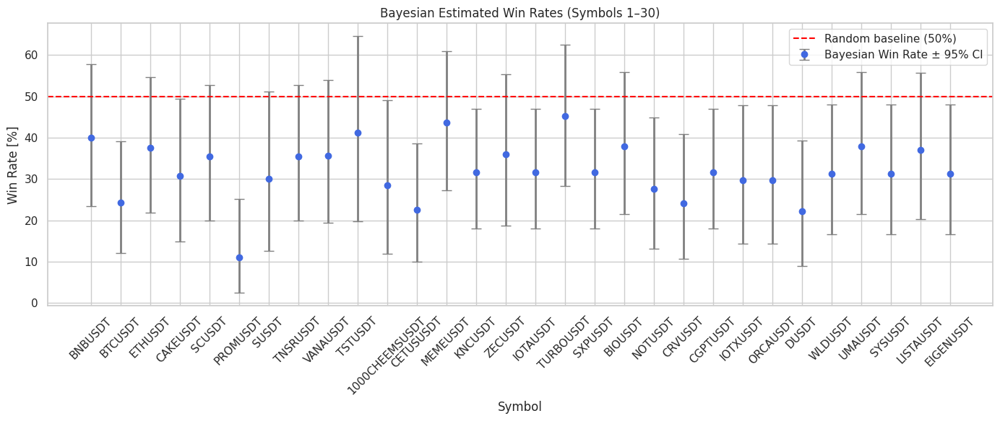

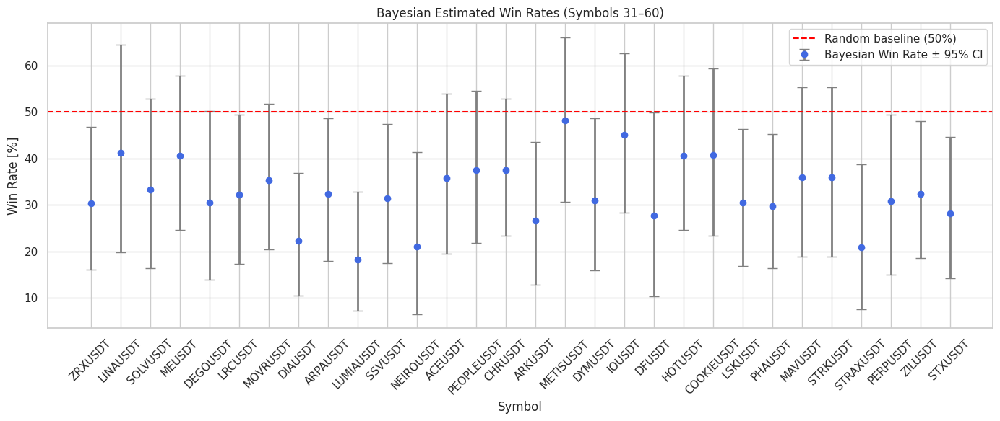

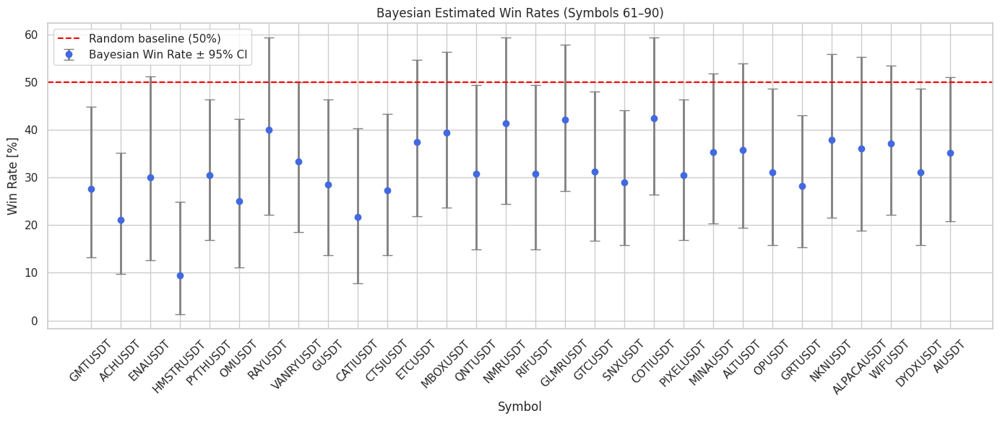

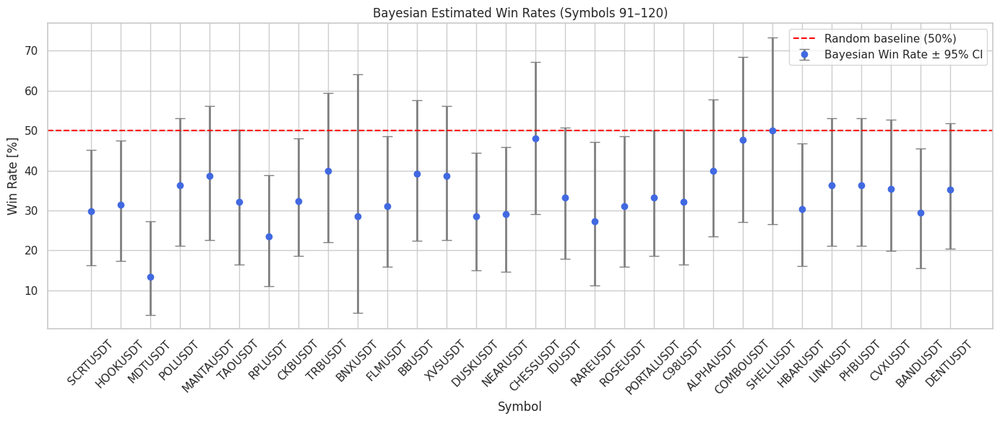

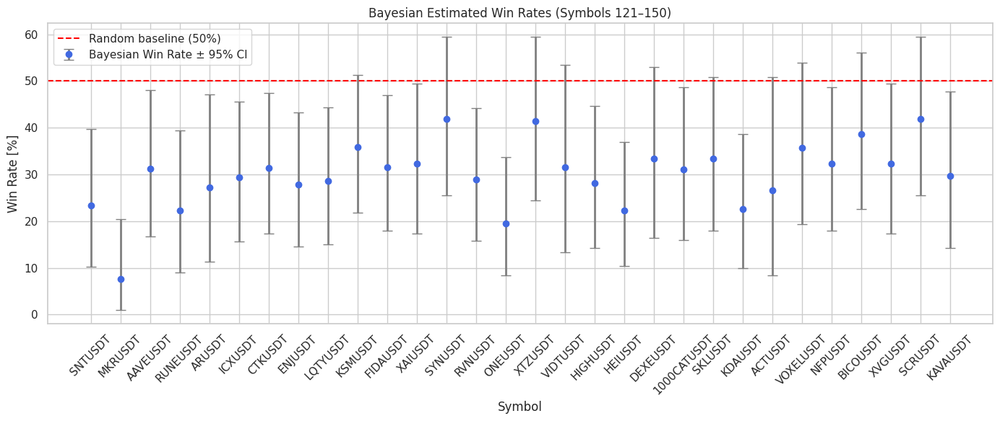

...

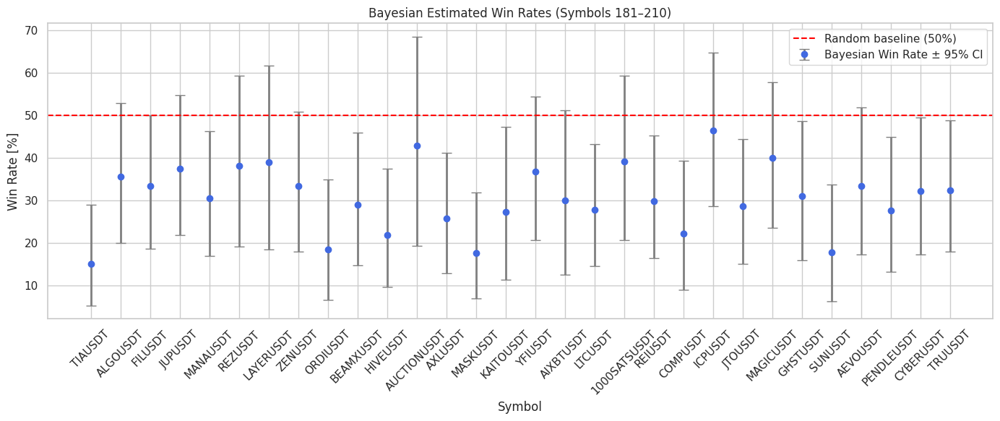

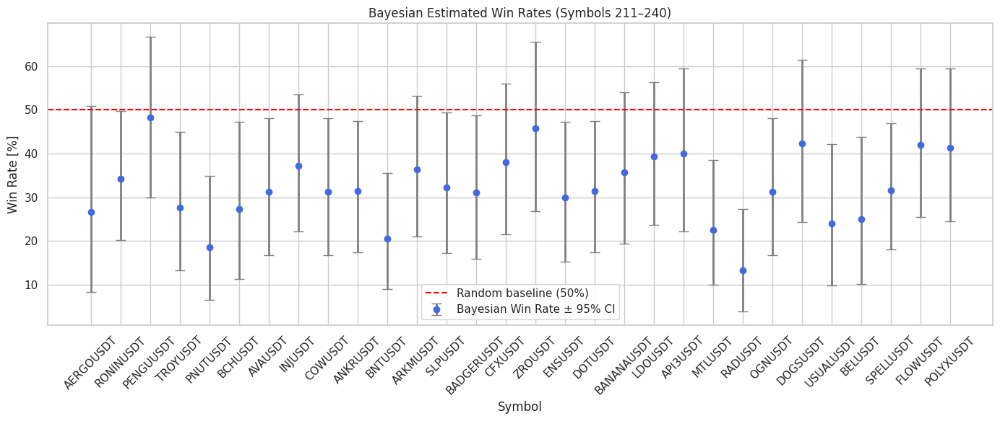

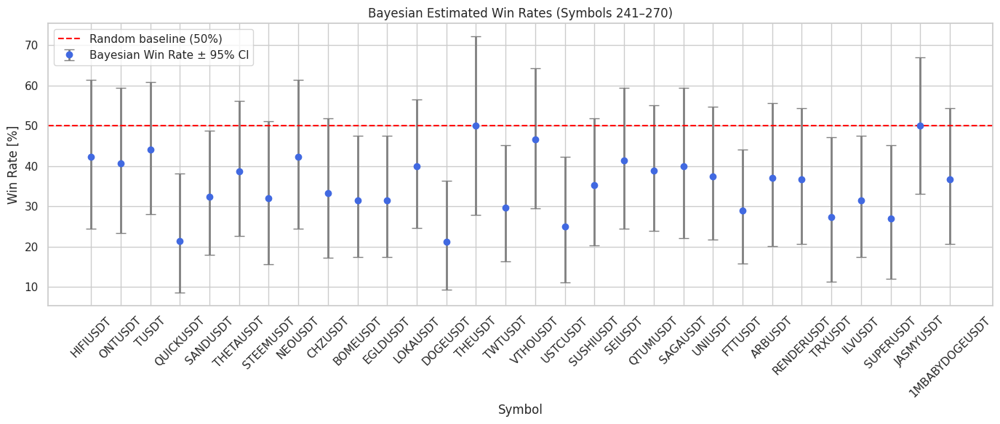

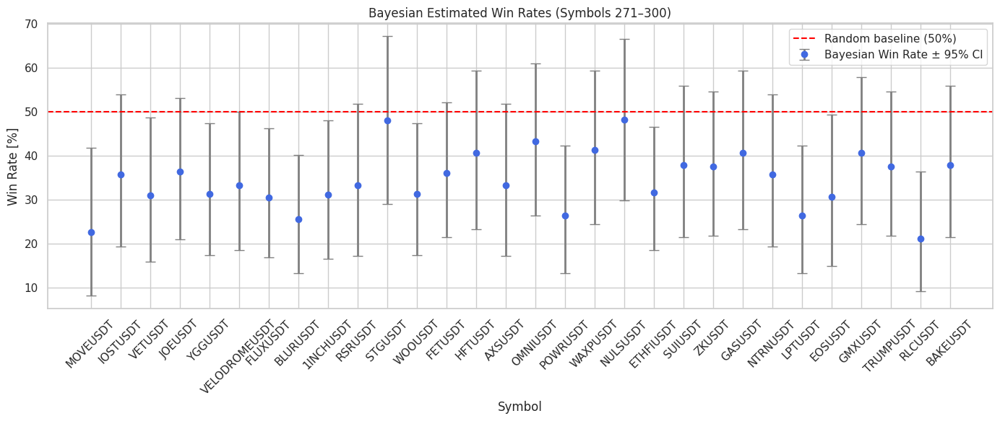

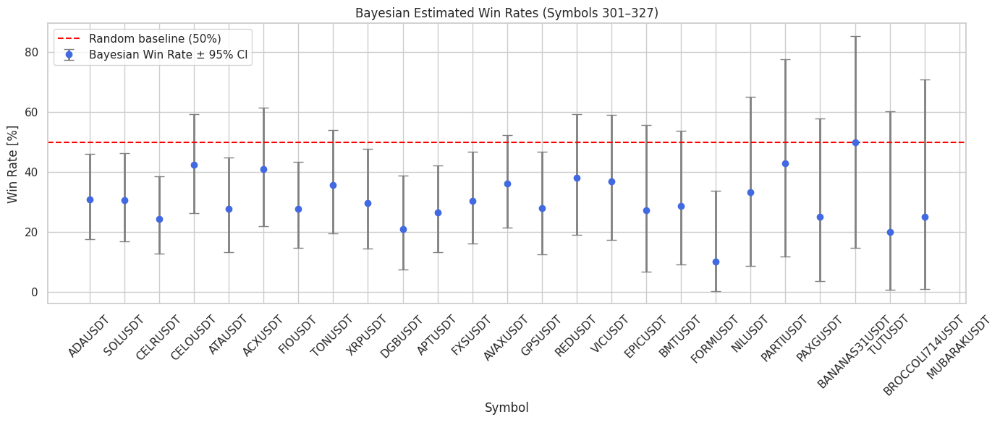

In [65]:
import pandas as pd
import matplotlib.pyplot as plt
from scipy.stats import beta
import math


# Function for Bayesian intervals
def bayesian_confidence_interval(wins, total, alpha_prior=1, beta_prior=1, conf=0.95):
    a = wins + alpha_prior
    b = total - wins + beta_prior
    lower = beta.ppf((1 - conf) / 2, a, b)
    upper = beta.ppf(1 - (1 - conf) / 2, a, b)
    mean = a / (a + b)
    return mean * 100, lower * 100, upper * 100

# Add to DataFrame
results_df["Bayes Win Rate [%]"] = np.nan  # Initialize with NaN
results_df["CI Lower [%]"] = np.nan
results_df["CI Upper [%]"] = np.nan

for index, row in results_df.iterrows():  # Iterate with index
    # Convert 'Total Trades' and 'Win Rate' to numeric, handling errors
    total_trades = pd.to_numeric(row['Total Trades'], errors='coerce')
    win_rate = pd.to_numeric(row['Win Rate'], errors='coerce') / 100

    # Skip rows with NaN values
    if pd.isna(total_trades) or pd.isna(win_rate):
        print(f"Skipping symbol {row['symbol']} due to NaN values in Total Trades or Win Rate")
        continue

    wins = int(total_trades * win_rate)
    total = int(total_trades)
    mean, lower, upper = bayesian_confidence_interval(wins, total)

    # Assign values using index
    results_df.loc[index, "Bayes Win Rate [%]"] = mean
    results_df.loc[index, "CI Lower [%]"] = lower
    results_df.loc[index, "CI Upper [%]"] = upper

# === Plotting graphs by pages ===
symbols_per_plot = 30
num_chunks = math.ceil(len(results_df) / symbols_per_plot)

for i in range(num_chunks):
    chunk = results_df.iloc[i * symbols_per_plot:(i + 1) * symbols_per_plot]

    plt.figure(figsize=(14, 6))

    yerr = [
        chunk["Bayes Win Rate [%]"] - chunk["CI Lower [%]"],
        chunk["CI Upper [%]"] - chunk["Bayes Win Rate [%]"]
    ]

    plt.errorbar(
        chunk["symbol"],
        chunk["Bayes Win Rate [%]"],
        yerr=yerr,
        fmt='o',
        capsize=5,
        label="Bayesian Win Rate ± 95% CI",
        color='royalblue',
        ecolor='gray',
        elinewidth=2
    )

    plt.axhline(50, linestyle='--', color='red', label='Random baseline (50%)')
    plt.title(f"Bayesian Estimated Win Rates (Symbols {i * symbols_per_plot + 1}–{min((i + 1) * symbols_per_plot, len(results_df))})")
    plt.ylabel("Win Rate [%]")
    plt.xlabel("Symbol")
    plt.xticks(rotation=45)
    plt.legend()
    plt.tight_layout()
    plt.show()

In [66]:
# Сортировка по Bayesian Win Rate в порядке убывания
sorted_df = results_df.sort_values(by="Bayes Win Rate [%]", ascending=False).reset_index(drop=True)

# Просмотр топа
sorted_df.head(10)  # Показывает топ-10, можешь изменить число

# Если хочешь увидеть весь датафрейм:
pd.set_option('display.max_rows', None)
display(sorted_df)

,symbol,timeframe,start_date,end_date,stop_loss_multiplier,take_profit_multiplier,Total Trades,Win Rate,return [%],long_trades,short_trades,long_return [%],short_return [%],long_win_rate [%],short_win_rate [%],Bayes Win Rate [%],CI Lower [%],CI Upper [%]
0,BANANAS31USDT,4h,2025-03-27 20:00:00+00:00,2025-04-07 16:00:00+00:00,0.45,1.25,4,50.000000,4.784191e-08,2,2,0.177774,-0.081253,100.000000,0.000000,50.000000,14.663280,85.336720
1,JASMYUSDT,4h,2025-02-21 20:00:00+00:00,2025-04-07 16:00:00+00:00,0.45,1.25,30,50.000000,6.603138e-07,0,30,0.000000,0.483145,0.000000,50.000000,50.000000,33.060597,66.939403
2,THEUSDT,4h,2025-02-21 20:00:00+00:00,2025-04-07 16:00:00+00:00,0.45,1.25,16,50.000000,9.855205e-06,0,16,0.000000,0.294089,0.000000,50.000000,50.000000,27.811830,72.188170
3,SHELLUSDT,4h,2025-02-27 12:00:00+00:00,2025-04-07 16:00:00+00:00,0.45,1.25,14,50.000000,8.918016e-06,0,14,0.000000,0.334443,0.000000,50.000000,50.000000,26.586135,73.413865
4,METISUSDT,4h,2025-02-21 20:00:00+00:00,2025-04-07 16:00:00+00:00,0.45,1.25,27,48.148148,5.489758e-04,2,25,0.015173,0.330733,50.000000,48.000000,48.275862,30.647096,66.130092
5,NULSUSDT,4h,2025-02-21 20:00:00+00:00,2025-04-07 16:00:00+00:00,0.45,1.25,25,48.000000,5.300031e-06,0,25,0.000000,0.395289,0.000000,48.000000,48.148148,29.927218,66.629178
6,PENGUUSDT,4h,2025-02-21 20:00:00+00:00,2025-04-07 16:00:00+00:00,0.45,1.25,25,48.000000,2.818638e-07,1,24,-0.014942,0.526176,0.000000,50.000000,48.148148,29.927218,66.629178
7,STGUSDT,4h,2025-02-21 20:00:00+00:00,2025-04-07 16:00:00+00:00,0.45,1.25,23,47.826087,4.372153e-06,1,22,-0.009446,0.239679,0.000000,50.000000,48.000000,29.124178,67.179192
8,CHESSUSDT,4h,2025-02-21 20:00:00+00:00,2025-04-07 16:00:00+00:00,0.45,1.25,23,47.826087,3.005508e-06,0,23,0.000000,0.366436,0.000000,47.826087,48.000000,29.124178,67.179192
9,COMBOUSDT,4h,2025-02-21 20:00:00+00:00,2025-03-28 00:00:00+00:00,0.45,1.25,19,47.368421,7.213751e-06,2,17,-0.028887,0.453985,0.000000,52.941176,47.619048,27.195785,68.472187


## Random trades simulation

In [ ]:
import random

def simulate_trades(
    num_trades=200,
    position_size=10,          # номинал сделки
    leverage=20,
    stop_loss_pct=0.0125,      # 1.25% стоп
    take_profit_pct=0.025,     # 2.5% тейк
    winrate=0.5,               # 50% сделок прибыльны
    commission_pct=0.0004,     # 0.04% комиссия вход+выход
    initial_balance=100
):
    balance = initial_balance
    margin_per_trade = position_size / leverage
    max_drawdown = 0
    peak = initial_balance
    losses_in_a_row = 0
    max_losses_in_a_row = 0

    for i in range(num_trades):
        is_win = random.random() < winrate

        # комиссии считаем от номинала в обе стороны
        commission = position_size * commission_pct * 2

        if is_win:
            profit = position_size * take_profit_pct
            balance += profit - commission
            losses_in_a_row = 0
        else:
            loss = position_size * stop_loss_pct
            balance -= loss + commission
            losses_in_a_row += 1
            max_losses_in_a_row = max(max_losses_in_a_row, losses_in_a_row)

        peak = max(peak, balance)
        drawdown = peak - balance
        max_drawdown = max(max_drawdown, drawdown)

        if balance <= 0:
            print(f"💥 Банкрот после {i+1} сделок.")
            break

    print(f"📊 Финальный баланс: ${balance:.2f}")
    print(f"📉 Макс. просадка: ${max_drawdown:.2f}")
    print(f"🔥 Макс. серия убытков: {max_losses_in_a_row}")

simulate_trades()


📊 Финальный баланс: $108.28
📉 Макс. просадка: $1.51
🔥 Макс. серия убытков: 7


In [ ]:
simulate_trades(
    num_trades=890,
    stop_loss_pct=0.012,
    take_profit_pct=0.036,
    winrate=0.30,
    initial_balance=100
)

📊 Финальный баланс: $109.44
📉 Макс. просадка: $3.42
🔥 Макс. серия убытков: 15


In [ ]:
import pandas as pd


# Преобразуем временные метки в формат datetime и округляем до минут
signals_df["utc_time"] = pd.to_datetime(signals_df["utc_time"]).dt.floor("min")
btc_signals = signals_df[signals_df["symbol"] == "BTCUSDT"].copy()

# Фильтруем BTC сигналы, если данные есть
if not btc_signals.empty:
    btc_signals["utc_time"] = pd.to_datetime(btc_signals["utc_time"]).dt.floor("min")
else:
    btc_signals = None  # Отключаем проверку, если данных нет
    print("⚠️ Нет сигналов BTCUSDT! Проверка отключена.")

# Округляем сигналы по другим активам до минут
signals_df = signals_df[signals_df["symbol"] != "BTCUSDT"]
signals_df["utc_time"] = pd.to_datetime(signals_df["utc_time"]).dt.floor("min")

# Теперь фильтруем только те сигналы, которые соответствуют условиям по BTC
filtered_signals = []

for index, signal in signals_df.iterrows():
    # Проверяем сигнал BTC для текущего времени
    current_time = signal["utc_time"]
    if btc_signals is not None:
        btc_signal = btc_signals[btc_signals["utc_time"] == current_time]["signal"].values
        if len(btc_signal) > 0:
            btc_signal = btc_signal[0]
        else:
            btc_signal = None

        # Условие фильтрации для LONG и SHORT сигналов
        if btc_signal in ["BUY", "STRONG_BUY", "NEUTRAL"] and signal["signal"] == "STRONG_BUY":
            filtered_signals.append(signal)
        elif btc_signal in ["SELL", "STRONG_SELL", "NEUTRAL"] and signal["signal"] == "STRONG_SELL":
            filtered_signals.append(signal)

# Преобразуем отфильтрованные сигналы в DataFrame
filtered_signals_df = pd.DataFrame(filtered_signals)

# Сохраняем результат в новый файл
filtered_signals_df.to_csv("filtered_signals.csv", index=False)

print(f"Отфильтровано {len(filtered_signals_df)} сигналов для дальнейшего бэк-тестирования.")
filtered_signals_df

<ipython-input-112-c474cfba92dd>:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  signals_df["utc_time"] = pd.to_datetime(signals_df["utc_time"]).dt.floor("min")


Отфильтровано 8503 сигналов для дальнейшего бэк-тестирования.


,#,id,symbol,timeframe,signal,entry_price,unix_timestamp,utc_time,local_time,atr
35,36,62,TRUMPUSDT,4h,STRONG_SELL,13.079013,1740543915,2025-02-26 04:00:00+00:00,2025-02-26 11:25:15.958282,NaN
37,38,64,CTSIUSDT,4h,STRONG_SELL,0.090300,1740543957,2025-02-26 04:00:00+00:00,2025-02-26 11:25:57.229205,NaN
101,102,128,TAOUSDT,4h,STRONG_SELL,371.186724,1740555682,2025-02-26 07:00:00+00:00,2025-02-26 14:41:22.317101,NaN
103,104,130,SOLUSDT,4h,STRONG_SELL,139.920000,1740555705,2025-02-26 07:00:00+00:00,2025-02-26 14:41:45.046820,NaN
104,105,131,MDTUSDT,4h,STRONG_SELL,0.029054,1740555714,2025-02-26 07:00:00+00:00,2025-02-26 14:41:54.534973,NaN
...,...,...,...,...,...,...,...,...,...,...
130306,128855,128855,PENDLEUSDT,4h,STRONG_BUY,2.831700,1743480026,2025-04-01 04:00:00+00:00,2025-04-01 11:00:26.000000,0.093650
130428,128977,128977,REZUSDT,4h,STRONG_BUY,0.021140,1743480031,2025-04-01 04:00:00+00:00,2025-04-01 11:00:31.000000,0.002246
130452,129001,129001,BANANAUSDT,4h,STRONG_BUY,20.926000,1743480032,2025-04-01 04:00:00+00:00,2025-04-01 11:00:32.000000,0.773500
130572,129121,129121,LAYERUSDT,4h,STRONG_BUY,1.535300,1743480036,2025-04-01 04:00:00+00:00,2025-04-01 11:00:36.000000,0.082171


In [ ]:
!pip install vectorbt

In [ ]:
import pandas as pd

# Расчёт ATR (Average True Range)
def calculate_atr(df, window=14):
    df['high_low'] = df['High'] - df['Low']
    df['high_close'] = abs(df['High'] - df['Close'].shift())
    df['low_close'] = abs(df['Low'] - df['Close'].shift())
    df['true_range'] = df[['high_low', 'high_close', 'low_close']].max(axis=1)
    df['atr'] = df['true_range'].rolling(window=window).mean()
    return df

# # Применим расчёт ATR на исходных данных
# klines_df = calculate_atr(klines_df)

# # Проверим, как выглядит результат
# print(klines_df[['Date', 'High', 'Low', 'Close', 'atr']].head())

In [ ]:
import pandas as pd

# Загружаем отфильтрованные сигналы и данные по свечам
signals_df = pd.read_csv("filtered_signals.csv")
klines_data = pd.read_csv("klines_data_4h.csv")
klines_df = klines_data.copy()

# Преобразуем данные времени в нужный формат
klines_df['Date'] = pd.to_datetime(klines_df['Date'])
signals_df['utc_time'] = pd.to_datetime(signals_df['utc_time'])

In [ ]:
klines_df = calculate_atr(klines_df)
klines_df

,Date,Open,High,Low,Close,Volume,Symbol,high_low,high_close,low_close,true_range,atr
0,2025-02-21 20:00:00+00:00,639.560000,647.500000,639.010000,647.470000,3.784454e+04,BNBUSDT,8.490000,NaN,NaN,8.490000,NaN
1,2025-02-22 00:00:00+00:00,647.470000,651.750000,645.210000,650.210000,2.722717e+04,BNBUSDT,6.540000,4.280000,2.260000,6.540000,NaN
2,2025-02-22 04:00:00+00:00,650.210000,659.970000,649.560000,654.750000,3.142869e+04,BNBUSDT,10.410000,9.760000,0.650000,10.410000,NaN
3,2025-02-22 08:00:00+00:00,654.740000,658.860000,653.160000,656.140000,2.188198e+04,BNBUSDT,5.700000,4.110000,1.590000,5.700000,NaN
4,2025-02-22 12:00:00+00:00,656.140000,659.420000,654.410000,658.400000,2.105107e+04,BNBUSDT,5.010000,3.280000,1.730000,5.010000,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...
82347,2025-04-05 00:00:00+00:00,0.005545,0.005887,0.005457,0.005814,4.197118e+08,FUNUSDT,0.000430,0.000333,0.000097,0.000430,0.000669
82348,2025-04-05 04:00:00+00:00,0.005814,0.010217,0.005725,0.009421,3.362618e+09,FUNUSDT,0.004492,0.004403,0.000089,0.004492,0.000968
82349,2025-04-05 08:00:00+00:00,0.009413,0.009783,0.009037,0.009404,1.379890e+09,FUNUSDT,0.000746,0.000362,0.000384,0.000746,0.000995
82350,2025-04-05 12:00:00+00:00,0.009402,0.010216,0.008121,0.008687,1.723315e+09,FUNUSDT,0.002095,0.000812,0.001283,0.002095,0.001059


In [ ]:
signals_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8503 entries, 0 to 8502
Data columns (total 10 columns):
 #   Column          Non-Null Count  Dtype              
---  ------          --------------  -----              
 0   #               8503 non-null   int64              
 1   id              8503 non-null   int64              
 2   symbol          8503 non-null   object             
 3   timeframe       8503 non-null   object             
 4   signal          8503 non-null   object             
 5   entry_price     8503 non-null   float64            
 6   unix_timestamp  8503 non-null   int64              
 7   utc_time        8503 non-null   datetime64[ns, UTC]
 8   local_time      8503 non-null   object             
 9   atr             157 non-null    float64            
dtypes: datetime64[ns, UTC](1), float64(2), int64(3), object(4)
memory usage: 664.4+ KB


In [ ]:
signals_df

,#,id,symbol,timeframe,signal,entry_price,unix_timestamp,utc_time,local_time,atr
0,36,62,TRUMPUSDT,4h,STRONG_SELL,13.079013,1740543915,2025-02-26 04:00:00+00:00,2025-02-26 11:25:15.958282,NaN
1,38,64,CTSIUSDT,4h,STRONG_SELL,0.090300,1740543957,2025-02-26 04:00:00+00:00,2025-02-26 11:25:57.229205,NaN
2,102,128,TAOUSDT,4h,STRONG_SELL,371.186724,1740555682,2025-02-26 07:00:00+00:00,2025-02-26 14:41:22.317101,NaN
3,104,130,SOLUSDT,4h,STRONG_SELL,139.920000,1740555705,2025-02-26 07:00:00+00:00,2025-02-26 14:41:45.046820,NaN
4,105,131,MDTUSDT,4h,STRONG_SELL,0.029054,1740555714,2025-02-26 07:00:00+00:00,2025-02-26 14:41:54.534973,NaN
...,...,...,...,...,...,...,...,...,...,...
8498,128855,128855,PENDLEUSDT,4h,STRONG_BUY,2.831700,1743480026,2025-04-01 04:00:00+00:00,2025-04-01 11:00:26.000000,0.093650
8499,128977,128977,REZUSDT,4h,STRONG_BUY,0.021140,1743480031,2025-04-01 04:00:00+00:00,2025-04-01 11:00:31.000000,0.002246
8500,129001,129001,BANANAUSDT,4h,STRONG_BUY,20.926000,1743480032,2025-04-01 04:00:00+00:00,2025-04-01 11:00:32.000000,0.773500
8501,129121,129121,LAYERUSDT,4h,STRONG_BUY,1.535300,1743480036,2025-04-01 04:00:00+00:00,2025-04-01 11:00:36.000000,0.082171


## Vectorbt

### 1

In [ ]:
import pandas as pd
import numpy as np
import vectorbt as vbt

# Загружаем отфильтрованные сигналы и данные по свечам
signals_df = pd.read_csv("filtered_signals.csv")
klines_data = pd.read_csv("klines_data_4h.csv")
klines_df = klines_data.copy()
klines_df = calculate_atr(klines_df)
# Преобразуем данные времени в нужный формат
klines_df['Date'] = pd.to_datetime(klines_df['Date'])
signals_df['utc_time'] = pd.to_datetime(signals_df['utc_time'])

# Округляем временные метки сигналов и свечей до ближайших 4-х часов
signals_df['candle_time'] = signals_df['utc_time'].dt.floor('4h')
klines_df['Date'] = klines_df['Date'].dt.floor('4h')

# Печатаем первые несколько строк для проверки меток времени
print("Пример сигналов и их меток времени:")
print(signals_df[['symbol', 'utc_time', 'candle_time']].head())

print("Пример данных по свечам и их меток времени:")
print(klines_df[['Symbol', 'Date']].head())

# Проверим количество совпавших записей
merged_df = pd.merge(
    signals_df,
    klines_df.reset_index(),  # Используем reset_index(), если данные по свечам имеют DatetimeIndex
    left_on=['symbol', 'candle_time'],
    right_on=['Symbol', 'Date'],
    how='left'
)

print(f"Количество совпавших записей: {merged_df.shape[0]}")

# Рассчитываем ATR для текущих данных по свечам
merged_df['entry_time'] = merged_df['Date']
entry_klines = klines_df.reset_index()[['Date', 'Symbol', 'Open', 'atr']]
entry_klines.columns = ['entry_time', 'Symbol', 'entry_price_actual', 'entry_atr']

merged_df = pd.merge(
    merged_df,
    entry_klines,
    on=['entry_time', 'Symbol'],
    how='left'
)

# Рассчитываем SL и TP
merged_df['sl'] = merged_df['entry_price_actual'] - merged_df['entry_atr'] * 0.45
merged_df['tp'] = merged_df['entry_price_actual'] + merged_df['entry_atr'] * 1.25

# Для STRONG_SELL поменяем местами TP и SL
sell_mask = merged_df['signal'] == 'STRONG_SELL'
merged_df.loc[sell_mask, 'sl'] = merged_df.loc[sell_mask, 'entry_price_actual'] + merged_df.loc[sell_mask, 'entry_atr'] * 0.45
merged_df.loc[sell_mask, 'tp'] = merged_df.loc[sell_mask, 'entry_price_actual'] - merged_df.loc[sell_mask, 'entry_atr'] * 1.25

# Печать значений SL и TP для проверки
print("Печать значений entry_price, SL и TP для некоторых сигналов:")
print(merged_df[['symbol', 'entry_price_actual', 'sl', 'tp']].head())

# Убедимся, что временные метки имеют одинаковое временное пространство (UTC)
klines_df.index = pd.to_datetime(klines_df.index).tz_localize('UTC')
merged_df['entry_time'] = pd.to_datetime(merged_df['entry_time']).dt.tz_convert('UTC')

# Получаем индексы для сигналов внутри свечей
entry_indices = klines_df.index.get_indexer(merged_df['entry_time'], method='nearest')

# Отфильтруем -1 (когда время вне диапазона свечей)
valid_mask = entry_indices != -1
valid_indices = entry_indices[valid_mask]
valid_rows = merged_df.iloc[valid_mask]

# Инициализируем массивы для хранения результатов
entry_price_arr = np.full(klines_df.shape[0], np.nan)
sl_arr = np.full_like(entry_price_arr, np.nan)
tp_arr = np.full_like(entry_price_arr, np.nan)

# Заполняем массивы на основе индексов
entry_price_arr[valid_indices] = valid_rows['entry_price_actual'].values
sl_arr[valid_indices] = valid_rows['sl'].values
tp_arr[valid_indices] = valid_rows['tp'].values

# Проверим, сколько ордеров записано
print(f"Записано entry_price: {np.sum(~np.isnan(entry_price_arr))}")

# Создаём портфель на основе сигналов (добавляем exits)
portfolio = vbt.Portfolio.from_signals(
    close=klines_df['Close'].values,
    entries=~np.isnan(entry_price_arr),
    exits=~np.isnan(entry_price_arr),  # Убедитесь, что добавлен выход
    sl_stop=sl_arr,
    tp_stop=tp_arr,
    size=1,
    direction='both',
    freq='4H'  # Убедитесь, что указана частота
)

# Выводим статистику по портфелю
portfolio_stats = portfolio.stats()
print("\n📊 Параметры портфеля:")
print(portfolio_stats)

Пример сигналов и их меток времени:
      symbol                  utc_time               candle_time
0  TRUMPUSDT 2025-02-26 04:00:00+00:00 2025-02-26 04:00:00+00:00
1   CTSIUSDT 2025-02-26 04:00:00+00:00 2025-02-26 04:00:00+00:00
2    TAOUSDT 2025-02-26 07:00:00+00:00 2025-02-26 04:00:00+00:00
3    SOLUSDT 2025-02-26 07:00:00+00:00 2025-02-26 04:00:00+00:00
4    MDTUSDT 2025-02-26 07:00:00+00:00 2025-02-26 04:00:00+00:00
Пример данных по свечам и их меток времени:
    Symbol                      Date
0  BNBUSDT 2025-02-21 20:00:00+00:00
1  BNBUSDT 2025-02-22 00:00:00+00:00
2  BNBUSDT 2025-02-22 04:00:00+00:00
3  BNBUSDT 2025-02-22 08:00:00+00:00
4  BNBUSDT 2025-02-22 12:00:00+00:00
Количество совпавших записей: 8503
Печать значений entry_price, SL и TP для некоторых сигналов:
      symbol  entry_price_actual          sl          tp
0  TRUMPUSDT             13.1400   13.477821   12.201607
1   CTSIUSDT              0.0897    0.091632    0.084334
2    TAOUSDT            381.3000  392.810

/usr/local/lib/python3.11/dist-packages/vectorbt/utils/datetime_.py:24: FutureWarning: 'H' is deprecated and will be removed in a future version. Please use 'h' instead of 'H'.
  return pd.Timedelta(arg)


### 2

In [ ]:
import pandas as pd
import vectorbt as vbt

# Загрузка данных
klines_df = pd.read_csv("klines_data_4h.csv")
signals_df = pd.read_csv("filtered_signals.csv")

# Преобразуем столбцы времени в нужный формат
klines_df['Date'] = pd.to_datetime(klines_df['Date'])
signals_df['utc_time'] = pd.to_datetime(signals_df['utc_time'])

# Рассчитываем ATR для klines (если не рассчитан)
def calculate_atr(df, window=14):
    df['high_low'] = df['High'] - df['Low']
    df['high_close'] = abs(df['High'] - df['Close'].shift())
    df['low_close'] = abs(df['Low'] - df['Close'].shift())
    df['true_range'] = df[['high_low', 'high_close', 'low_close']].max(axis=1)
    df['atr'] = df['true_range'].rolling(window=window).mean()
    return df

klines_df = calculate_atr(klines_df)

# Добавляем ATR в signals_df для соответствующих монет и времени
def add_atr_to_signals(signals_df, klines_df):
    signals_df['atr'] = signals_df.apply(lambda row: klines_df[(klines_df['Date'] == row['utc_time']) & (klines_df['Symbol'] == row['symbol'])]['atr'].values[0] if len(klines_df[(klines_df['Date'] == row['utc_time']) & (klines_df['Symbol'] == row['symbol'])]) > 0 else None, axis=1)
    return signals_df

signals_df = add_atr_to_signals(signals_df, klines_df)

In [ ]:
# Создаем сигналы для открытия сделок
buy_signals = signals_df[signals_df['signal'] == "STRONG_BUY"]
sell_signals = signals_df[signals_df['signal'] == "STRONG_SELL"]

# Открытие сделок (LONG и SHORT) по сигналам
entries = pd.Series(False, index=klines_df.index)
exits = pd.Series(False, index=klines_df.index)

for idx, signal in buy_signals.iterrows():
    entries.loc[(klines_df['Date'] == signal['utc_time']) & (klines_df['Symbol'] == signal['symbol'])] = True

for idx, signal in sell_signals.iterrows():
    entries.loc[(klines_df['Date'] == signal['utc_time']) & (klines_df['Symbol'] == signal['symbol'])] = True

In [ ]:
# Моделируем портфель
portfolio = vbt.Portfolio.from_signals(
    klines_df['Close'], entries, exits,
    sl_stop=klines_df['atr'] * 0.45, tp_stop=klines_df['atr'] * 1.25,  # Changed parameters
    init_cash=10000, size=0.1
)

# Получаем результаты
portfolio.total_return()

0.9330959833599998

In [ ]:
# Выводим статистику по портфелю
portfolio_stats = portfolio.stats()
print("\n📊 Параметры портфеля:")
print(portfolio_stats)

/usr/local/lib/python3.11/dist-packages/vectorbt/generic/stats_builder.py:396: UserWarning: Metric 'sharpe_ratio' requires frequency to be set
  warnings.warn(warning_message)
/usr/local/lib/python3.11/dist-packages/vectorbt/generic/stats_builder.py:396: UserWarning: Metric 'calmar_ratio' requires frequency to be set
  warnings.warn(warning_message)
/usr/local/lib/python3.11/dist-packages/vectorbt/generic/stats_builder.py:396: UserWarning: Metric 'omega_ratio' requires frequency to be set
  warnings.warn(warning_message)
/usr/local/lib/python3.11/dist-packages/vectorbt/generic/stats_builder.py:396: UserWarning: Metric 'sortino_ratio' requires frequency to be set
  warnings.warn(warning_message)



📊 Параметры портфеля:
Start                         0.000000e+00
End                           8.235100e+04
Period                        8.235200e+04
Start Value                   1.000000e+04
End Value                     1.933096e+04
Total Return [%]              9.330960e+01
Benchmark Return [%]         -9.999871e+01
Max Gross Exposure [%]        3.064864e+00
Total Fees Paid               0.000000e+00
Max Drawdown [%]              3.064864e+00
Max Drawdown Duration         4.948900e+04
Total Trades                  2.000000e+00
Total Closed Trades           1.000000e+00
Total Open Trades             1.000000e+00
Open Trade PnL               -2.296282e+02
Win Rate [%]                  1.000000e+02
Best Trade [%]                1.659536e+04
Worst Trade [%]               1.659536e+04
Avg Winning Trade [%]         1.659536e+04
Avg Losing Trade [%]                   NaN
Avg Winning Trade Duration    1.980000e+02
Avg Losing Trade Duration              NaN
Profit Factor                  

## Backtesting

In [ ]:
import pandas as pd
import numpy as np
import pandas_ta as ta
from backtesting import Backtest, Strategy


strategy = SignalStrategy



results_list = []


for symbol in klines_df["Symbol"].unique():
    print(f"🔍 Testing {symbol}...")

    data = klines_df[klines_df["Symbol"] == symbol].copy()
    data['Date'] = pd.to_datetime(data['Date'])
    data.set_index("Date", inplace=True)

    if not isinstance(data.index, pd.DatetimeIndex):
        print(f"⚠️ Index for {symbol} is not DatetimeIndex, attempting to convert...")
        data.index = pd.to_datetime(data.index)

    data.drop(columns=["Symbol"], inplace=True)

    symbol_signals = signals_df[(signals_df["symbol"] == symbol) & (signals_df["timeframe"] == f"{interval}")]
    unique_signals_count = symbol_signals["utc_time"].nunique()

    if symbol_signals.empty:
        print(f"⚠️ No signals for {symbol}, skipping...")
        continue

    print(f"📊 Found {len(symbol_signals)} signals ({unique_signals_count} unique) for {symbol}")

    strategy.signals_df = signals_df
    strategy.symbol = symbol

    bt = Backtest(data, strategy, cash=1_000_000, commission=0.0005)
    stats = bt.run()

    total_profit = sum(t["Return [%]"] for t in trade_log if t["Return [%]"] > 0)
    total_loss = sum(t["Return [%]"] for t in trade_log if t["Return [%]"] < 0)

    results = {
        "Symbol": symbol,
        "Total Trades": stats["# Trades"],
        "Win Rate": stats["Win Rate [%]"],
        "Return [%]": stats["Return [%]"],
        "Total Profit [%]": total_profit,
        "Total Loss [%]": total_loss,
        "Final Return [%]": total_profit + total_loss
    }
    results_list.append(results)

    print(f"✅ {symbol} — Return: {results['Return [%]']:.2f}%, Trades: {results['Total Trades']}, Win Rate: {results['Win Rate']:.2f}%, Profit: {results['Total Profit [%]']:.2f}%, Loss: {results['Total Loss [%]']:.2f}%\n")

results_df = pd.DataFrame(results_list)
results_df.to_csv(f"backtest_results_{interval}.csv", index=False)
trade_log_df = pd.DataFrame(trade_log)
trade_log_df.to_csv("trade_log.csv", index=False)

print("📌 Backtest completed! Results saved in backtest_results.csv")
print("📌 Trade log saved in trade_log.csv")

display(results_df)


🔍 Testing BNBUSDT...
📊 Found 103 signals (103 unique) for BNBUSDT


Backtest.run:   0%|          | 0/768 [00:00<?, ?it/s]

🚨 SHORT BNBUSDT | 2025-02-26 13:00:00+00:00 | BTC: SELL | Price: 617.07 | SL: 619.8929 | TP: 609.2286
🚨 SHORT BNBUSDT | 2025-02-26 16:00:00+00:00 | BTC: SELL | Price: 619.16 | SL: 622.1638 | TP: 610.8162
🚨 SHORT BNBUSDT | 2025-02-26 17:00:00+00:00 | BTC: SELL | Price: 609.98 | SL: 613.1348 | TP: 601.2166
🚨 SHORT BNBUSDT | 2025-02-28 00:00:00+00:00 | BTC: STRONG_SELL | Price: 601.65 | SL: 604.2882 | TP: 594.3215
🚨 SHORT BNBUSDT | 2025-02-28 01:00:00+00:00 | BTC: STRONG_SELL | Price: 587.92 | SL: 590.9107 | TP: 579.6124
🚀 LONG BNBUSDT | 2025-03-01 16:00:00+00:00 | BTC: NEUTRAL | Price: 606.63 | SL: 604.2321 | TP: 613.2910
🚀 LONG BNBUSDT | 2025-03-02 17:00:00+00:00 | BTC: STRONG_BUY | Price: 631.01 | SL: 628.1686 | TP: 638.9027
🚀 LONG BNBUSDT | 2025-03-02 18:00:00+00:00 | BTC: STRONG_BUY | Price: 627.93 | SL: 625.0062 | TP: 636.0518
🚀 LONG BNBUSDT | 2025-03-02 23:00:00+00:00 | BTC: BUY | Price: 623.94 | SL: 621.1091 | TP: 631.8037
🚀 LONG BNBUSDT | 2025-03-03 00:00:00+00:00 | BTC: BUY | Pr

/usr/local/lib/python3.11/dist-packages/backtesting/backtesting.py:955: UserWarning: time=431: Broker canceled the relative-sized order due to insufficient margin.
  warnings.warn(


🚀 LONG BNBUSDT | 2025-03-20 01:00:00+00:00 | BTC: BUY | Price: 618.64 | SL: 615.9460 | TP: 626.1233
🚀 LONG BNBUSDT | 2025-03-20 03:00:00+00:00 | BTC: STRONG_BUY | Price: 624.7 | SL: 622.0266 | TP: 632.1261
🚀 LONG BNBUSDT | 2025-03-20 04:00:00+00:00 | BTC: STRONG_BUY | Price: 626.71 | SL: 624.0974 | TP: 633.9672
🚀 LONG BNBUSDT | 2025-03-20 15:00:00+00:00 | BTC: BUY | Price: 624.09 | SL: 621.2935 | TP: 631.8582
🚀 LONG BNBUSDT | 2025-03-21 03:00:00+00:00 | BTC: BUY | Price: 629.95 | SL: 627.7547 | TP: 636.0481
🚀 LONG BNBUSDT | 2025-03-21 05:00:00+00:00 | BTC: NEUTRAL | Price: 633.5 | SL: 631.4233 | TP: 639.2685


/usr/local/lib/python3.11/dist-packages/backtesting/backtesting.py:955: UserWarning: time=564: Broker canceled the relative-sized order due to insufficient margin.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/backtesting/backtesting.py:955: UserWarning: time=589: Broker canceled the relative-sized order due to insufficient margin.
  warnings.warn(


🚀 LONG BNBUSDT | 2025-03-24 09:00:00+00:00 | BTC: STRONG_BUY | Price: 627.94 | SL: 626.6207 | TP: 631.6046
🚀 LONG BNBUSDT | 2025-03-24 10:00:00+00:00 | BTC: BUY | Price: 629.23 | SL: 627.9384 | TP: 632.8177
🚀 LONG BNBUSDT | 2025-03-24 16:00:00+00:00 | BTC: STRONG_BUY | Price: 635.78 | SL: 634.0828 | TP: 640.4944
🚀 LONG BNBUSDT | 2025-03-24 17:00:00+00:00 | BTC: STRONG_BUY | Price: 638.06 | SL: 636.3490 | TP: 642.8126
🚀 LONG BNBUSDT | 2025-03-24 18:00:00+00:00 | BTC: BUY | Price: 636.81 | SL: 635.1097 | TP: 641.5330
🚀 LONG BNBUSDT | 2025-03-25 00:00:00+00:00 | BTC: NEUTRAL | Price: 636.55 | SL: 634.9135 | TP: 641.0960
🚀 LONG BNBUSDT | 2025-03-25 01:00:00+00:00 | BTC: BUY | Price: 636.26 | SL: 634.6098 | TP: 640.8438
🚀 LONG BNBUSDT | 2025-03-25 03:00:00+00:00 | BTC: NEUTRAL | Price: 640.09 | SL: 638.3850 | TP: 644.8262
🚀 LONG BNBUSDT | 2025-03-25 04:00:00+00:00 | BTC: NEUTRAL | Price: 639.97 | SL: 638.3257 | TP: 644.5375
🚀 LONG BNBUSDT | 2025-03-25 06:00:00+00:00 | BTC: BUY | Price: 643.

/usr/local/lib/python3.11/dist-packages/backtesting/backtesting.py:955: UserWarning: time=673: Broker canceled the relative-sized order due to insufficient margin.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/backtesting/backtesting.py:955: UserWarning: time=674: Broker canceled the relative-sized order due to insufficient margin.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/backtesting/backtesting.py:955: UserWarning: time=684: Broker canceled the relative-sized order due to insufficient margin.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/backtesting/backtesting.py:955: UserWarning: time=749: Broker canceled the relative-sized order due to insufficient margin.
  warnings.warn(


🚨 SHORT BNBUSDT | 2025-03-28 14:00:00+00:00 | BTC: SELL | Price: 625.62 | SL: 627.5457 | TP: 620.2708
🚨 SHORT BNBUSDT | 2025-03-28 17:00:00+00:00 | BTC: STRONG_SELL | Price: 625.26 | SL: 627.1901 | TP: 619.8987


TypeError: string indices must be integers, not 'str'

### Hypeopt_by_month

In [ ]:
symbol_1 = 'BTCUSDT'
interval_1 = '1h'
start_date_1 = '2023-12'
end_date_1 = '2025-02'
max_evals_1 = 50


# Параметры для оптимизации
params_to_optimize_1 = {
    'atr_period': {'type': 'quniform', 'range': (7, 50, 1)},
    'multiplier': {'type': 'uniform', 'range': (1.0, 3.5)},
    'ema_period': {'type': 'quniform', 'range': (7, 50, 1)}

}

fixed_params_1 = {}
# # Фиксированные параметры
# fixed_params_1 = {
#     'min_space': 5,
#     # 'window_length': 50,
#     # 'sloping_atr_length': 20,
#     # 'take_profit_multiplier': 1.5,
#     # 'stop_loss_multiplier': 0.5
# }
fixed_params_1 = {}

In [ ]:
# Настройка и вызов оптимизации
# symbol = 'SUIUSDT'
# interval = '1h'
# start_date = '2024-11'
# end_date = '2024-11'

symbol = symbol_1
interval = interval_1
start_date = start_date_1
end_date = end_date_1
max_evals = max_evals_1
params_to_optimize=params_to_optimize_1
fixed_params=fixed_params_1
strategy = SuperTrendStrategy

# Загрузка данных
df = download_klines(symbol, interval, start_date, end_date)
print(symbol, interval)
print(f"Общее количество строк в загруженных данных: {len(df)}")
print(f"Диапазон дат: {df.index.min()} - {df.index.max()}")

## Final data

In [ ]:
import pandas as pd

klines_df = pd.read_csv("klines_data_1h.csv")
signals_df = pd.read_csv("tradingview_signals_server.csv")
interval = '1h'

df = signals_df[(signals_df["timeframe"] == f"{interval}")]
df.sort_values(by=["symbol", 'utc_time'], inplace=True)
df.to_csv(f"signals_{interval}.csv", index=False)
df

<ipython-input-6-64dd86021997>:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.sort_values(by=["symbol", 'utc_time'], inplace=True)


,#,id,symbol,timeframe,signal,entry_price,unix_timestamp,utc_time,local_time
234,235,235,1000CATUSDT,1h,STRONG_SELL,0.009621,1740855634,2025-03-01 19:00:34.000000,2025-03-02 02:00:34.000000
296,297,297,1000CATUSDT,1h,STRONG_SELL,0.009602,1740859218,2025-03-01 20:00:18.000000,2025-03-02 03:00:18.000000
1490,1491,1491,1000CATUSDT,1h,STRONG_BUY,0.010320,1740935011,2025-03-02 17:03:31.000000,2025-03-03 00:03:31.000000
1638,1639,1639,1000CATUSDT,1h,STRONG_BUY,0.010530,1740938482,2025-03-02 18:01:22.000000,2025-03-03 01:01:22.000000
1767,1768,1768,1000CATUSDT,1h,STRONG_BUY,0.010600,1740942037,2025-03-02 19:00:37.000000,2025-03-03 02:00:37.000000
...,...,...,...,...,...,...,...,...,...
27415,27416,27416,ZRXUSDT,1h,STRONG_SELL,0.253400,1741536006,2025-03-09 16:00:06.000000,2025-03-09 23:00:06.000000
28300,28301,28301,ZRXUSDT,1h,STRONG_SELL,0.247200,1741539613,2025-03-09 17:00:13.000000,2025-03-10 00:00:13.000000
29211,29212,29212,ZRXUSDT,1h,STRONG_SELL,0.244000,1741543229,2025-03-09 18:00:29.000000,2025-03-10 01:00:29.000000
30151,30152,30152,ZRXUSDT,1h,STRONG_SELL,0.241900,1741557632,2025-03-09 22:00:32.000000,2025-03-10 05:00:32.000000
